In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import f1_score
from sklearn.model_selection import train_test_split
from catboost import CatBoostClassifier
from sklearn.model_selection import KFold, GridSearchCV, RandomizedSearchCV, learning_curve
from sklearn.metrics import f1_score, make_scorer, classification_report, precision_score, recall_score

In [2]:
%matplotlib inline
%config InlineBackend.figure_format = 'svg'
pd.set_option('display.max_columns', 100)

**Описание датасета**

* **Home Ownership** - домовладение
* **Annual Income** - годовой доход
* **Years in current job** - количество лет на текущем месте работы
* **Tax Liens** - налоговые обременения
* **Number of Open Accounts** - количество открытых счетов
* **Years of Credit History** - количество лет кредитной истории
* **Maximum Open Credit** - наибольший открытый кредит
* **Number of Credit Problems** - количество проблем с кредитом
* **Months since last delinquent** - количество месяцев с последней просрочки платежа
* **Bankruptcies** - банкротства
* **Purpose** - цель кредита
* **Term** - срок кредита
* **Current Loan Amount** - текущая сумма кредита
* **Current Credit Balance** - текущий кредитный баланс
* **Monthly Debt** - ежемесячный долг
* **Credit Default** - факт невыполнения кредитных обязательств (0 - погашен вовремя, 1 - просрочка)

### Обзор датасета

In [96]:
df = pd.read_csv('course_project_train.csv')
df.sample(5)

,Home Ownership,Annual Income,Years in current job,Tax Liens,Number of Open Accounts,Years of Credit History,Maximum Open Credit,Number of Credit Problems,Months since last delinquent,Bankruptcies,Purpose,Term,Current Loan Amount,Current Credit Balance,Monthly Debt,Credit Score,Credit Default
4779,Home Mortgage,1375049.0,2 years,0.0,10.0,14.0,873422.0,0.0,NaN,0.0,debt consolidation,Short Term,431684.0,220267.0,10015.0,751.0,0
3926,Home Mortgage,1161660.0,4 years,0.0,11.0,23.2,767008.0,0.0,12.0,0.0,debt consolidation,Short Term,358688.0,278882.0,7783.0,729.0,0
3490,Rent,2032468.0,3 years,0.0,7.0,12.1,681604.0,0.0,NaN,0.0,debt consolidation,Short Term,99999999.0,119491.0,2625.0,738.0,0
1032,Home Mortgage,2093971.0,10+ years,0.0,7.0,22.3,248930.0,0.0,29.0,0.0,debt consolidation,Long Term,330638.0,183388.0,8324.0,724.0,0
4505,Home Mortgage,1936841.0,< 1 year,0.0,5.0,23.5,187110.0,0.0,45.0,0.0,home improvements,Short Term,99999999.0,59299.0,7521.0,740.0,0


In [4]:
df.shape

(7500, 17)

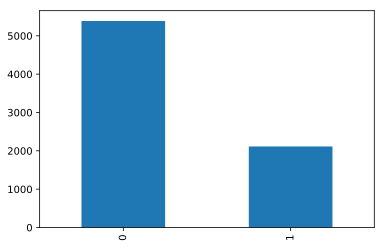

In [5]:
df['Credit Default'].value_counts().plot(kind='bar')

##### На графике видно что целевая фича имеет дисбаланс

In [6]:
df.describe()

,Annual Income,Tax Liens,Number of Open Accounts,Years of Credit History,Maximum Open Credit,Number of Credit Problems,Months since last delinquent,Bankruptcies,Current Loan Amount,Current Credit Balance,Monthly Debt,Credit Score,Credit Default
count,5.943000e+03,7500.000000,7500.000000,7500.000000,7.500000e+03,7500.000000,3419.000000,7486.000000,7.500000e+03,7.500000e+03,7500.000000,5943.000000,7500.000000
mean,1.366392e+06,0.030133,11.130933,18.317467,9.451537e+05,0.170000,34.692600,0.117152,1.187318e+07,2.898332e+05,18314.454133,1151.087498,0.281733
std,8.453392e+05,0.271604,4.908924,7.041946,1.602622e+07,0.498598,21.688806,0.347192,3.192612e+07,3.178714e+05,11926.764673,1604.451418,0.449874
min,1.645970e+05,0.000000,2.000000,4.000000,0.000000e+00,0.000000,0.000000,0.000000,1.124200e+04,0.000000e+00,0.000000,585.000000,0.000000
25%,8.443410e+05,0.000000,8.000000,13.500000,2.792295e+05,0.000000,16.000000,0.000000,1.801690e+05,1.142565e+05,10067.500000,711.000000,0.000000
50%,1.168386e+06,0.000000,10.000000,17.000000,4.781590e+05,0.000000,32.000000,0.000000,3.095730e+05,2.093230e+05,16076.500000,731.000000,0.000000
75%,1.640137e+06,0.000000,14.000000,21.800000,7.935015e+05,0.000000,50.000000,0.000000,5.198820e+05,3.604062e+05,23818.000000,743.000000,1.000000
max,1.014934e+07,7.000000,43.000000,57.700000,1.304726e+09,7.000000,118.000000,4.000000,1.000000e+08,6.506797e+06,136679.000000,7510.000000,1.000000


#### Обработка пропущенных данных

In [7]:
def mis_values_report(df):
    '''Функция считает и выводит пропущенные значения столбцов датафрейма'''
    mis_val = df.isnull().sum()
    perc_mis_val = 100 * df.isnull().sum() / len(df)
    report = pd.concat([mis_val, perc_mis_val], axis=1)
    report_columns = report.rename(columns = {0: 'Пропущенные значения', 1: '% от всех значений'})
    report_columns = report_columns[report_columns.iloc[:,1] != 0].sort_values('% от всех значений', ascending=False).round(1)
    print('Датафрейм имеет ' + str(df.shape[1]) + ' столбцов.\n' + str(report_columns.shape[0]) + ' столбцов имеют пропущенные значения')
    return report_columns

In [8]:
mis_values_report(df)

Датафрейм имеет 17 столбцов.
5 столбцов имеют пропущенные значения


,Пропущенные значения,% от всех значений
Months since last delinquent,4081,54.4
Annual Income,1557,20.8
Credit Score,1557,20.8
Years in current job,371,4.9
Bankruptcies,14,0.2


In [9]:
# Удалим столбец с более чем 50% миссингов
df.drop(columns = 'Months since last delinquent', axis=1, inplace=True)

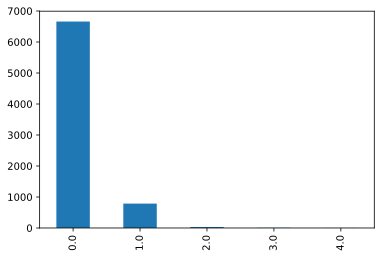

In [10]:
df['Bankruptcies'].value_counts().plot(kind='bar')

In [11]:
# заменим пропущенные значения наиболее встречающиемся 
df['Bankruptcies'].fillna(float(0), inplace = True)
mis_values_report(df)

Датафрейм имеет 16 столбцов.
3 столбцов имеют пропущенные значения


,Пропущенные значения,% от всех значений
Annual Income,1557,20.8
Credit Score,1557,20.8
Years in current job,371,4.9


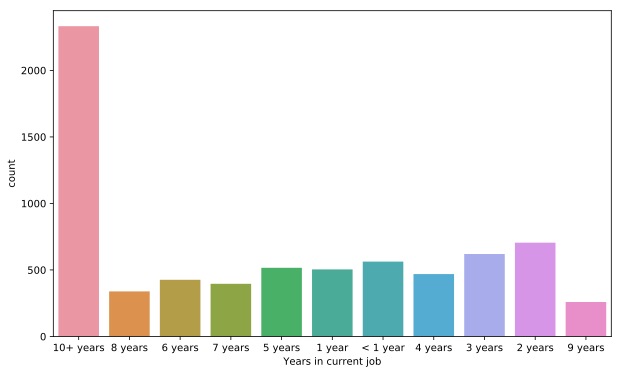

In [12]:
plt.figure(figsize=(10,6))
sns.countplot(df['Years in current job'])

In [13]:
# так же заменим пропущенные значения наиболее встречающиемся 
df['Years in current job'].fillna('10+ years', inplace = True)
mis_values_report(df)

Датафрейм имеет 16 столбцов.
2 столбцов имеют пропущенные значения


,Пропущенные значения,% от всех значений
Annual Income,1557,20.8
Credit Score,1557,20.8


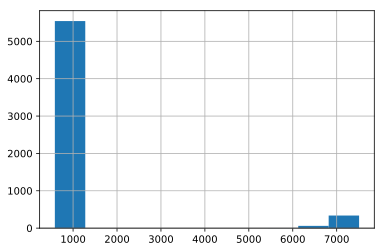

In [14]:
df['Credit Score'].hist()

##### В столбце Credit Score присутствуют выбросы. Что бы заполнить пропуски, для начала избавимся от них.

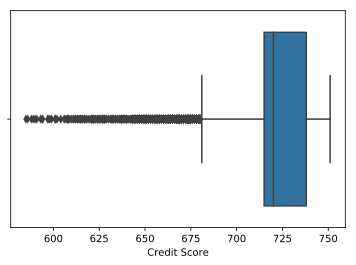

In [15]:
df['Credit Score'] = df['Credit Score'].apply(lambda val: (val / 10) if val>850 else val)
df['Credit Score'].fillna(df['Credit Score'].mean(), inplace=True)
sns.boxplot(x=df['Credit Score'])

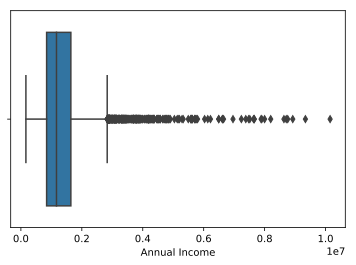

In [16]:
sns.boxplot(x=df['Annual Income'])

##### Нельзя однозначно сказать что это выбросы, возможно это просто "миллионеры", поэтому заполним пропущенные значения средними

In [17]:
df['Annual Income'].fillna(df['Annual Income'].mean(), inplace=True)

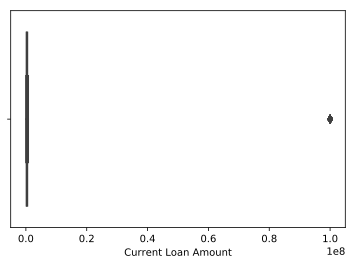

In [18]:
sns.boxplot(x=df['Current Loan Amount'])

#### Возможно это выброс, но я предположу что эта некая метка

In [19]:
mis_values_report(df)

Датафрейм имеет 16 столбцов.
0 столбцов имеют пропущенные значения


,Пропущенные значения,% от всех значений


In [20]:
df.describe()

,Annual Income,Tax Liens,Number of Open Accounts,Years of Credit History,Maximum Open Credit,Number of Credit Problems,Bankruptcies,Current Loan Amount,Current Credit Balance,Monthly Debt,Credit Score,Credit Default
count,7.500000e+03,7500.000000,7500.000000,7500.000000,7.500000e+03,7500.000000,7500.000000,7.500000e+03,7.500000e+03,7500.000000,7500.000000,7500.000000
mean,1.366392e+06,0.030133,11.130933,18.317467,9.451537e+05,0.170000,0.116933,1.187318e+07,2.898332e+05,18314.454133,720.086993,0.281733
std,7.524812e+05,0.271604,4.908924,7.041946,1.602622e+07,0.498598,0.346904,3.192612e+07,3.178714e+05,11926.764673,24.886214,0.449874
min,1.645970e+05,0.000000,2.000000,4.000000,0.000000e+00,0.000000,0.000000,1.124200e+04,0.000000e+00,0.000000,585.000000,0.000000
25%,9.311330e+05,0.000000,8.000000,13.500000,2.792295e+05,0.000000,0.000000,1.801690e+05,1.142565e+05,10067.500000,715.000000,0.000000
50%,1.366392e+06,0.000000,10.000000,17.000000,4.781590e+05,0.000000,0.000000,3.095730e+05,2.093230e+05,16076.500000,720.086993,0.000000
75%,1.499974e+06,0.000000,14.000000,21.800000,7.935015e+05,0.000000,0.000000,5.198820e+05,3.604062e+05,23818.000000,738.000000,1.000000
max,1.014934e+07,7.000000,43.000000,57.700000,1.304726e+09,7.000000,4.000000,1.000000e+08,6.506797e+06,136679.000000,751.000000,1.000000


#### Feature Engineering
##### буду приводить датасет к категориальным данным

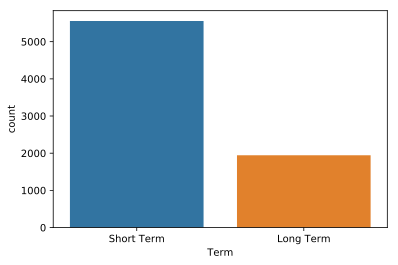

In [21]:
sns.countplot(df['Term'])

In [22]:
df['Term'].replace(('Short Term','Long Term'),(0,1), inplace=True)

#### Разделим на категории кредитный рейтинг в соответствие с рекомендациями Experian's Credit Score Range

In [23]:
df['Credit Score'] = df['Credit Score'].apply(lambda val: "Poor" if np.isreal(val) and val < 580 else val)
df['Credit Score'] = df['Credit Score'].apply(lambda val: "Average" if np.isreal(val) and (val >= 580 and val < 670) else val)
df['Credit Score'] = df['Credit Score'].apply(lambda val: "Good" if np.isreal(val) and (val >= 670 and val < 740) else val)
df['Credit Score'] = df['Credit Score'].apply(lambda val: "Very Good" if np.isreal(val) and (val >= 740 and val < 800) else val)
df['Credit Score'] = df['Credit Score'].apply(lambda val: "Exceptional" if np.isreal(val) and (val >= 800 and val <= 850) else val)

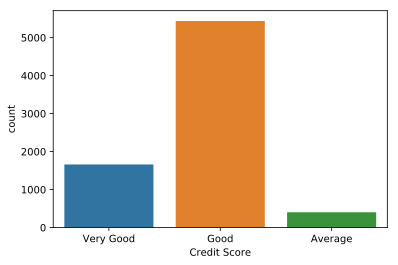

In [24]:
sns.countplot(df['Credit Score'])

In [25]:
# Преобразуем кредитный рейтинг в дискретные значения
df = df.join(pd.get_dummies(df['Credit Score'], drop_first = True))
df.rename(index = str, columns={'Good':'Credit Good', 'Very Good':'Credit Very Good'})

,Home Ownership,Annual Income,Years in current job,Tax Liens,Number of Open Accounts,Years of Credit History,Maximum Open Credit,Number of Credit Problems,Bankruptcies,Purpose,Term,Current Loan Amount,Current Credit Balance,Monthly Debt,Credit Score,Credit Default,Credit Good,Credit Very Good
0,Own Home,4.820870e+05,10+ years,0.0,11.0,26.3,685960.0,1.0,1.0,debt consolidation,0,99999999.0,47386.0,7914.0,Very Good,0,0,1
1,Own Home,1.025487e+06,10+ years,0.0,15.0,15.3,1181730.0,0.0,0.0,debt consolidation,1,264968.0,394972.0,18373.0,Good,1,1,0
2,Home Mortgage,7.514120e+05,8 years,0.0,11.0,35.0,1182434.0,0.0,0.0,debt consolidation,0,99999999.0,308389.0,13651.0,Very Good,0,0,1
3,Own Home,8.050680e+05,6 years,0.0,8.0,22.5,147400.0,1.0,1.0,debt consolidation,0,121396.0,95855.0,11338.0,Good,0,1,0
4,Rent,7.762640e+05,8 years,0.0,13.0,13.6,385836.0,1.0,0.0,debt consolidation,0,125840.0,93309.0,7180.0,Good,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7495,Rent,4.021920e+05,< 1 year,0.0,3.0,8.5,107866.0,0.0,0.0,other,0,129360.0,73492.0,1900.0,Good,0,1,0
7496,Home Mortgage,1.533984e+06,1 year,0.0,10.0,26.5,686312.0,0.0,0.0,debt consolidation,1,444048.0,456399.0,12783.0,Very Good,1,0,1
7497,Rent,1.878910e+06,6 years,0.0,12.0,32.1,1778920.0,0.0,0.0,buy a car,0,99999999.0,477812.0,12479.0,Very Good,0,0,1
7498,Home Mortgage,1.366392e+06,10+ years,0.0,21.0,26.5,1141250.0,0.0,0.0,debt consolidation,0,615274.0,476064.0,37118.0,Good,0,1,0


In [26]:
df = df.drop(['Credit Score'], axis=1)

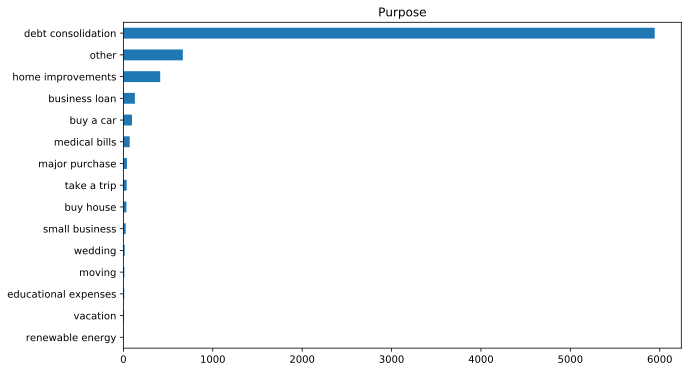

In [27]:
df['Purpose'].value_counts().sort_values(ascending=True).plot(kind='barh', title='Purpose', figsize=(10,6))

In [28]:
purpose_cr_deafult = df[['Purpose','Credit Default']]
purpose_cr_deafult.head()

,Purpose,Credit Default
0,debt consolidation,0
1,debt consolidation,1
2,debt consolidation,0
3,debt consolidation,0
4,debt consolidation,0


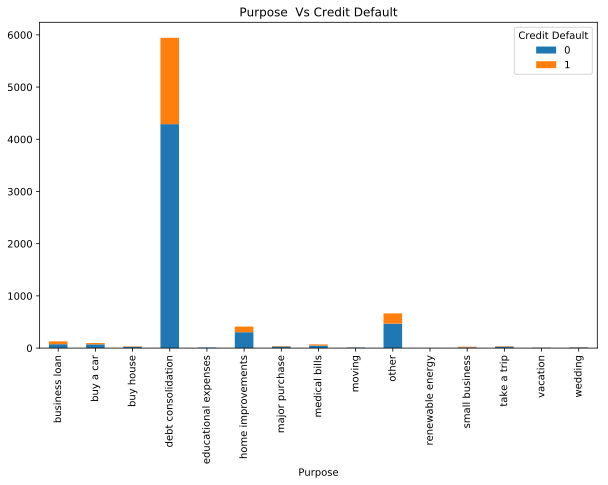

In [29]:
pd.crosstab(purpose_cr_deafult['Purpose'], purpose_cr_deafult['Credit Default']).plot(kind='bar', stacked=True, figsize=(10,6), title="Purpose  Vs Credit Default", )

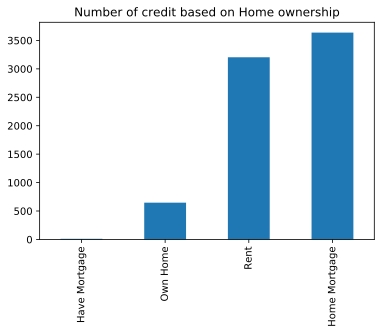

In [30]:
df['Home Ownership'].value_counts().sort_values(ascending = True).plot(kind='bar', title='Number of credit based on Home ownership')

##### Основное количество кредитов взято ипотечниками или арендаторами. Дискретизируем эти данные.

In [31]:
df = df.join(pd.get_dummies(df['Home Ownership'],drop_first = True))

In [32]:
df = df.drop(['Home Ownership'], axis=1)
df.head()

,Annual Income,Years in current job,Tax Liens,Number of Open Accounts,Years of Credit History,Maximum Open Credit,Number of Credit Problems,Bankruptcies,Purpose,Term,Current Loan Amount,Current Credit Balance,Monthly Debt,Credit Default,Good,Very Good,Home Mortgage,Own Home,Rent
0,482087.0,10+ years,0.0,11.0,26.3,685960.0,1.0,1.0,debt consolidation,0,99999999.0,47386.0,7914.0,0,0,1,0,1,0
1,1025487.0,10+ years,0.0,15.0,15.3,1181730.0,0.0,0.0,debt consolidation,1,264968.0,394972.0,18373.0,1,1,0,0,1,0
2,751412.0,8 years,0.0,11.0,35.0,1182434.0,0.0,0.0,debt consolidation,0,99999999.0,308389.0,13651.0,0,0,1,1,0,0
3,805068.0,6 years,0.0,8.0,22.5,147400.0,1.0,1.0,debt consolidation,0,121396.0,95855.0,11338.0,0,1,0,0,1,0
4,776264.0,8 years,0.0,13.0,13.6,385836.0,1.0,0.0,debt consolidation,0,125840.0,93309.0,7180.0,0,1,0,0,0,1


##### "Years in current job" важный показатель финансовой стабильности. Приведем столбец к числовому формату а затем преобразуем в категориальную переменную.

In [33]:
df['Years in current job'] = df['Years in current job'].str.extract(r"(\d+)")
df['Years in current job'] = df['Years in current job'].astype(float)

In [34]:
df['Employment History'] = df['Years in current job'].apply(lambda x: 'Junior lvl' if x<4 else ('Middle lvl' if x>4 and x<8 else 'Senior lvl'))

In [35]:
df = df.drop(['Years in current job'], axis=1)
df.head()

,Annual Income,Tax Liens,Number of Open Accounts,Years of Credit History,Maximum Open Credit,Number of Credit Problems,Bankruptcies,Purpose,Term,Current Loan Amount,Current Credit Balance,Monthly Debt,Credit Default,Good,Very Good,Home Mortgage,Own Home,Rent,Employment History
0,482087.0,0.0,11.0,26.3,685960.0,1.0,1.0,debt consolidation,0,99999999.0,47386.0,7914.0,0,0,1,0,1,0,Senior lvl
1,1025487.0,0.0,15.0,15.3,1181730.0,0.0,0.0,debt consolidation,1,264968.0,394972.0,18373.0,1,1,0,0,1,0,Senior lvl
2,751412.0,0.0,11.0,35.0,1182434.0,0.0,0.0,debt consolidation,0,99999999.0,308389.0,13651.0,0,0,1,1,0,0,Senior lvl
3,805068.0,0.0,8.0,22.5,147400.0,1.0,1.0,debt consolidation,0,121396.0,95855.0,11338.0,0,1,0,0,1,0,Middle lvl
4,776264.0,0.0,13.0,13.6,385836.0,1.0,0.0,debt consolidation,0,125840.0,93309.0,7180.0,0,1,0,0,0,1,Senior lvl


In [36]:
df = df.join(pd.get_dummies(df['Employment History'],drop_first = True))

In [37]:
df = df.drop(['Purpose'], axis=1)

In [38]:
df = df.drop(['Employment History'], axis=1)
df.head()

,Annual Income,Tax Liens,Number of Open Accounts,Years of Credit History,Maximum Open Credit,Number of Credit Problems,Bankruptcies,Term,Current Loan Amount,Current Credit Balance,Monthly Debt,Credit Default,Good,Very Good,Home Mortgage,Own Home,Rent,Middle lvl,Senior lvl
0,482087.0,0.0,11.0,26.3,685960.0,1.0,1.0,0,99999999.0,47386.0,7914.0,0,0,1,0,1,0,0,1
1,1025487.0,0.0,15.0,15.3,1181730.0,0.0,0.0,1,264968.0,394972.0,18373.0,1,1,0,0,1,0,0,1
2,751412.0,0.0,11.0,35.0,1182434.0,0.0,0.0,0,99999999.0,308389.0,13651.0,0,0,1,1,0,0,0,1
3,805068.0,0.0,8.0,22.5,147400.0,1.0,1.0,0,121396.0,95855.0,11338.0,0,1,0,0,1,0,1,0
4,776264.0,0.0,13.0,13.6,385836.0,1.0,0.0,0,125840.0,93309.0,7180.0,0,1,0,0,0,1,0,1


##### Далее создам 3 категории "Number of Credit Problems"

In [39]:
df['Credit Problems'] = df['Number of Credit Problems'].apply(lambda x: "No Credit Problems" if x==0 else ("Some Credit promblem" if x>0 and x<5 else "Big Credit Problems"))

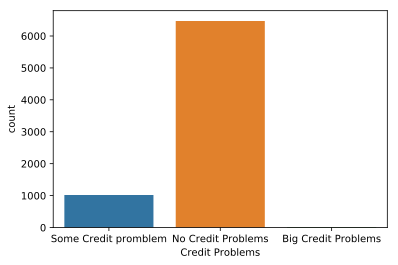

In [40]:
sns.countplot(df['Credit Problems'])

In [41]:
df['Credit Problems'].value_counts()

No Credit Problems      6469
Some Credit promblem    1019
Big Credit Problems       12
Name: Credit Problems, dtype: int64

##### Исходя из наших предположений можно сделать вывод, что кредит не дают с большими кредитными проблемами. Дискретизируем данные.

In [42]:
df = df.join(pd.get_dummies(df['Credit Problems'],drop_first = True))
df = df.drop(['Credit Problems','Number of Credit Problems'], axis=1)
df.head()

,Annual Income,Tax Liens,Number of Open Accounts,Years of Credit History,Maximum Open Credit,Bankruptcies,Term,Current Loan Amount,Current Credit Balance,Monthly Debt,Credit Default,Good,Very Good,Home Mortgage,Own Home,Rent,Middle lvl,Senior lvl,No Credit Problems,Some Credit promblem
0,482087.0,0.0,11.0,26.3,685960.0,1.0,0,99999999.0,47386.0,7914.0,0,0,1,0,1,0,0,1,0,1
1,1025487.0,0.0,15.0,15.3,1181730.0,0.0,1,264968.0,394972.0,18373.0,1,1,0,0,1,0,0,1,1,0
2,751412.0,0.0,11.0,35.0,1182434.0,0.0,0,99999999.0,308389.0,13651.0,0,0,1,1,0,0,0,1,1,0
3,805068.0,0.0,8.0,22.5,147400.0,1.0,0,121396.0,95855.0,11338.0,0,1,0,0,1,0,1,0,0,1
4,776264.0,0.0,13.0,13.6,385836.0,0.0,0,125840.0,93309.0,7180.0,0,1,0,0,0,1,0,1,0,1


##### Еще одна важная составляющая финансовой стабильности это количество лет кредитной истории. Закодирую эти данные.

In [43]:
df['Credit Age'] = df['Years of Credit History'].apply(lambda x: "Short Credit Age" if x<5 else ("Good Credit Age" if x>5 and x<17 else "Excellent Credit Age"))

In [44]:
df = df.join(pd.get_dummies(df['Credit Age'],drop_first = True))
df = df.drop(['Credit Age','Years of Credit History'], axis =1)
df.head()

,Annual Income,Tax Liens,Number of Open Accounts,Maximum Open Credit,Bankruptcies,Term,Current Loan Amount,Current Credit Balance,Monthly Debt,Credit Default,Good,Very Good,Home Mortgage,Own Home,Rent,Middle lvl,Senior lvl,No Credit Problems,Some Credit promblem,Good Credit Age,Short Credit Age
0,482087.0,0.0,11.0,685960.0,1.0,0,99999999.0,47386.0,7914.0,0,0,1,0,1,0,0,1,0,1,0,0
1,1025487.0,0.0,15.0,1181730.0,0.0,1,264968.0,394972.0,18373.0,1,1,0,0,1,0,0,1,1,0,1,0
2,751412.0,0.0,11.0,1182434.0,0.0,0,99999999.0,308389.0,13651.0,0,0,1,1,0,0,0,1,1,0,0,0
3,805068.0,0.0,8.0,147400.0,1.0,0,121396.0,95855.0,11338.0,0,1,0,0,1,0,1,0,0,1,0,0
4,776264.0,0.0,13.0,385836.0,0.0,0,125840.0,93309.0,7180.0,0,1,0,0,0,1,0,1,0,1,1,0


##### 'Tax Liens' дает информацию по налоговым обязательствам на имущество кредитора.

In [45]:
df['Tax Liens'] = df['Tax Liens'].apply(lambda x: "No Tax Lien" if x==0 else ("Some Tax Liens" if x>0 and x<3 else "Many Tax Liens"))

In [46]:
df = df.join(pd.get_dummies(df['Tax Liens'],drop_first = True))
df = df.drop(['Tax Liens'],axis=1)
df.head()

,Annual Income,Number of Open Accounts,Maximum Open Credit,Bankruptcies,Term,Current Loan Amount,Current Credit Balance,Monthly Debt,Credit Default,Good,Very Good,Home Mortgage,Own Home,Rent,Middle lvl,Senior lvl,No Credit Problems,Some Credit promblem,Good Credit Age,Short Credit Age,No Tax Lien,Some Tax Liens
0,482087.0,11.0,685960.0,1.0,0,99999999.0,47386.0,7914.0,0,0,1,0,1,0,0,1,0,1,0,0,1,0
1,1025487.0,15.0,1181730.0,0.0,1,264968.0,394972.0,18373.0,1,1,0,0,1,0,0,1,1,0,1,0,1,0
2,751412.0,11.0,1182434.0,0.0,0,99999999.0,308389.0,13651.0,0,0,1,1,0,0,0,1,1,0,0,0,1,0
3,805068.0,8.0,147400.0,1.0,0,121396.0,95855.0,11338.0,0,1,0,0,1,0,1,0,0,1,0,0,1,0
4,776264.0,13.0,385836.0,0.0,0,125840.0,93309.0,7180.0,0,1,0,0,0,1,0,1,0,1,1,0,1,0


##### Проделаем такой же трюк с Bankruptcies

In [47]:
df['Bankruptcies'] = df['Bankruptcies'].apply(lambda x: "No Bankruptcies" if x==0 else ("Some Bankruptcies" if x>0 and x<3 else "Many Bankruptcies"))
df = df.join(pd.get_dummies(df['Bankruptcies'],drop_first = True))
df = df.drop(['Bankruptcies'],axis=1)
df.head()

,Annual Income,Number of Open Accounts,Maximum Open Credit,Term,Current Loan Amount,Current Credit Balance,Monthly Debt,Credit Default,Good,Very Good,Home Mortgage,Own Home,Rent,Middle lvl,Senior lvl,No Credit Problems,Some Credit promblem,Good Credit Age,Short Credit Age,No Tax Lien,Some Tax Liens,No Bankruptcies,Some Bankruptcies
0,482087.0,11.0,685960.0,0,99999999.0,47386.0,7914.0,0,0,1,0,1,0,0,1,0,1,0,0,1,0,0,1
1,1025487.0,15.0,1181730.0,1,264968.0,394972.0,18373.0,1,1,0,0,1,0,0,1,1,0,1,0,1,0,1,0
2,751412.0,11.0,1182434.0,0,99999999.0,308389.0,13651.0,0,0,1,1,0,0,0,1,1,0,0,0,1,0,1,0
3,805068.0,8.0,147400.0,0,121396.0,95855.0,11338.0,0,1,0,0,1,0,1,0,0,1,0,0,1,0,0,1
4,776264.0,13.0,385836.0,0,125840.0,93309.0,7180.0,0,1,0,0,0,1,0,1,0,1,1,0,1,0,1,0


##### Вычислим среднее значение и стандартное отклонение выборки для дискретизации признака Annual Income

In [48]:
mean_income = df['Annual Income'].mean()
std_income = df['Annual Income'].std()
poorline = mean_income - std_income
richline = mean_income + std_income
print(poorline, richline)

613910.5179680055 2118872.9223819217


In [49]:
df['Annual Income'] = df['Annual Income'].apply(lambda x: "Low Income" if x <= poorline else ("Average Income" if x > poorline and x < richline else "High Income"))

In [50]:
df = df.join(pd.get_dummies(df['Annual Income'],drop_first = True))
df = df.drop(['Annual Income'], axis=1)
df.head()

,Number of Open Accounts,Maximum Open Credit,Term,Current Loan Amount,Current Credit Balance,Monthly Debt,Credit Default,Good,Very Good,Home Mortgage,Own Home,Rent,Middle lvl,Senior lvl,No Credit Problems,Some Credit promblem,Good Credit Age,Short Credit Age,No Tax Lien,Some Tax Liens,No Bankruptcies,Some Bankruptcies,High Income,Low Income
0,11.0,685960.0,0,99999999.0,47386.0,7914.0,0,0,1,0,1,0,0,1,0,1,0,0,1,0,0,1,0,1
1,15.0,1181730.0,1,264968.0,394972.0,18373.0,1,1,0,0,1,0,0,1,1,0,1,0,1,0,1,0,0,0
2,11.0,1182434.0,0,99999999.0,308389.0,13651.0,0,0,1,1,0,0,0,1,1,0,0,0,1,0,1,0,0,0
3,8.0,147400.0,0,121396.0,95855.0,11338.0,0,1,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0
4,13.0,385836.0,0,125840.0,93309.0,7180.0,0,1,0,0,0,1,0,1,0,1,1,0,1,0,1,0,0,0


##### То же самое проделаю с Current Loan Amount

In [52]:
lmeanxoutlier = df[df['Current Loan Amount'] < 99999999.00 ]['Current Loan Amount'].mean()
lstddevxoutlier = df[df['Current Loan Amount'] < 99999999.00 ]['Current Loan Amount'].std()
lowrange = lmeanxoutlier - lstddevxoutlier
highrange = lmeanxoutlier + lstddevxoutlier
print(lowrange, highrange)

126730.38172561678 491318.39896819927


In [53]:
df['Current Loan Amount'] = df['Current Loan Amount'].apply(lambda x: "Small Loan" if x<=lowrange else ("Medium Loan" if x>lowrange and x<highrange else "Big Loan"))

In [54]:
df = df.join(pd.get_dummies(df['Current Loan Amount'],drop_first = True))
df = df.drop(['Current Loan Amount'], axis=1)
df.head()

,Number of Open Accounts,Maximum Open Credit,Term,Current Credit Balance,Monthly Debt,Credit Default,Good,Very Good,Home Mortgage,Own Home,Rent,Middle lvl,Senior lvl,No Credit Problems,Some Credit promblem,Good Credit Age,Short Credit Age,No Tax Lien,Some Tax Liens,No Bankruptcies,Some Bankruptcies,High Income,Low Income,Medium Loan,Small Loan
0,11.0,685960.0,0,47386.0,7914.0,0,0,1,0,1,0,0,1,0,1,0,0,1,0,0,1,0,1,0,0
1,15.0,1181730.0,1,394972.0,18373.0,1,1,0,0,1,0,0,1,1,0,1,0,1,0,1,0,0,0,1,0
2,11.0,1182434.0,0,308389.0,13651.0,0,0,1,1,0,0,0,1,1,0,0,0,1,0,1,0,0,0,0,0
3,8.0,147400.0,0,95855.0,11338.0,0,1,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1
4,13.0,385836.0,0,93309.0,7180.0,0,1,0,0,0,1,0,1,0,1,1,0,1,0,1,0,0,0,0,1


##### Оставшиеся признаки коррелируют с уже обработанными поэтому я просто удалю их

In [55]:
df = df.drop(['Number of Open Accounts','Maximum Open Credit','Current Credit Balance','Monthly Debt'],axis=1)
df.head()

,Term,Credit Default,Good,Very Good,Home Mortgage,Own Home,Rent,Middle lvl,Senior lvl,No Credit Problems,Some Credit promblem,Good Credit Age,Short Credit Age,No Tax Lien,Some Tax Liens,No Bankruptcies,Some Bankruptcies,High Income,Low Income,Medium Loan,Small Loan
0,0,0,0,1,0,1,0,0,1,0,1,0,0,1,0,0,1,0,1,0,0
1,1,1,1,0,0,1,0,0,1,1,0,1,0,1,0,1,0,0,0,1,0
2,0,0,0,1,1,0,0,0,1,1,0,0,0,1,0,1,0,0,0,0,0
3,0,0,1,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,0,1
4,0,0,1,0,0,0,1,0,1,0,1,1,0,1,0,1,0,0,0,0,1


##### Разбиваем на тренировочный и тестовый датасеты

In [56]:
target = df['Credit Default'].copy() 
features = df.drop(columns='Credit Default')


X_train, X_test, y_train, y_test = train_test_split(features, target, test_size = 0.2, random_state = 42)

print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(6000, 20)
(1500, 20)
(6000,)
(1500,)


In [57]:
from sklearn.utils import resample

In [60]:
# Разделим минорный и мажорный классы
df_majority = df[df['Credit Default']==0]
df_minority = df[df['Credit Default']==1]

print(df_majority['Credit Default'].count())
print("-----------")
print(df_minority['Credit Default'].count())
print("-----------")
print(df['Credit Default'].value_counts())

5387
-----------
2113
-----------
0    5387
1    2113
Name: Credit Default, dtype: int64


##### Используем библиотеку resample для upsample минорного класса

In [62]:
df_minority_upsampled = resample(df_minority, 
                                 replace=True,     # sample with replacement
                                 n_samples=5387,    # to match majority class
                                 random_state=42) # reproducible results
df_upsampled = pd.concat([df_majority, df_minority_upsampled])

df_upsampled['Credit Default'].value_counts()

1    5387
0    5387
Name: Credit Default, dtype: int64

In [69]:
y_upsampled = df_upsampled['Credit Default']
X_upsampled = df_upsampled.drop(['Credit Default'], axis= 1)

##### Используем алгоритм SMOTE из библиотеки imblearn для оверсэмплинга минорного класса

In [63]:
from imblearn.over_sampling import SMOTE

In [64]:
sm = SMOTE(random_state=42, ratio = 1.0)
X_SMOTE, y_SMOTE = sm.fit_sample(X_train, y_train)
print(len(X_SMOTE), len(y_SMOTE))
print(y_SMOTE.sum())

8656 8656
4328


##### Обучение и оценка алгоритма catboost classifier

In [65]:
# Оценка классификации
def get_classification_report(y_train_true, y_train_pred, y_test_true, y_test_pred):
    print('TRAIN\n\n' + classification_report(y_train_true, y_train_pred))
    print('TEST\n\n' + classification_report(y_test_true, y_test_pred))
    print('CONFUSION MATRIX\n')
    print(pd.crosstab(y_test_true, y_test_pred))

In [66]:
# Кривая обучения
def show_learning_curve_plot(estimator, X, y, cv=3, n_jobs=-1, train_sizes=np.linspace(.1, 1.0, 5)):

    train_sizes, train_scores, test_scores = learning_curve(estimator, X, y, 
                                                            cv=cv, 
                                                            scoring='f1',
                                                            train_sizes=train_sizes, 
                                                            n_jobs=n_jobs)
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)

    plt.figure(figsize=(9,6))
    plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1, color="r")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color="g")
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
             label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
             label="Cross-validation score")

    plt.title(f"Learning curves ({type(estimator).__name__})")
    plt.xlabel("Training examples")
    plt.ylabel("Score")     
    plt.legend(loc="best")
    plt.grid()
    plt.show()

In [67]:
def show_proba_calibration_plots(y_predicted_probs, y_true_labels):
    preds_with_true_labels = np.array(list(zip(y_predicted_probs, y_true_labels)))

    thresholds = []
    precisions = []
    recalls = []
    f1_scores = []

    for threshold in np.linspace(0.1, 0.9, 9):
        thresholds.append(threshold)
        precisions.append(precision_score(y_true_labels, list(map(int, y_predicted_probs > threshold))))
        recalls.append(recall_score(y_true_labels, list(map(int, y_predicted_probs > threshold))))
        f1_scores.append(f1_score(y_true_labels, list(map(int, y_predicted_probs > threshold))))

    scores_table = pd.DataFrame({'f1':f1_scores,
                                 'precision':precisions,
                                 'recall':recalls,
                                 'probability':thresholds}).sort_values('f1', ascending=False).round(3)
  
    figure = plt.figure(figsize = (11, 4))

    plt1 = figure.add_subplot(121)
    plt1.plot(thresholds, precisions, label='Precision', linewidth=4)
    plt1.plot(thresholds, recalls, label='Recall', linewidth=4)
    plt1.plot(thresholds, f1_scores, label='F1', linewidth=4)
    plt1.set_ylabel('Scores')
    plt1.set_xlabel('Probability threshold')
    plt1.set_title('Probabilities threshold calibration')
    plt1.legend(bbox_to_anchor=(0.25, 0.25))   
    plt1.table(cellText = scores_table.values,
               colLabels = scores_table.columns, 
               colLoc = 'center', cellLoc = 'center', loc = 'bottom', bbox = [0, -1.3, 1, 1])

    plt2 = figure.add_subplot(122)
    plt2.hist(preds_with_true_labels[preds_with_true_labels[:, 1] == 0][:, 0], 
              label='Another class', color='royalblue', alpha=1)
    plt2.hist(preds_with_true_labels[preds_with_true_labels[:, 1] == 1][:, 0], 
              label='Main class', color='darkcyan', alpha=0.8)
    plt2.set_ylabel('Number of examples')
    plt2.set_xlabel('Probabilities')
    plt2.set_title('Probability histogram')
    plt2.legend(bbox_to_anchor=(1, 1))

    plt.show()

##### Выбор лучших параметров с помощью кросс-валидации

In [68]:
cv = KFold(n_splits=3, random_state=21, shuffle=True)

In [70]:
# catboost SMOTE training
model = CatBoostClassifier()
params = {'depth':[3,4,6],
          'iterations':[1000,1500],
          'learning_rate':[0.1,0.3, 0.5]
          }
scorer = make_scorer(f1_score)
grid_catboost_sm = GridSearchCV(model, params, scoring = scorer, cv=cv)
%time grid_catboost_sm.fit(X_SMOTE, y_SMOTE)
print(grid_catboost_sm.best_params_)
print(grid_catboost_sm.best_score_)
catboost_SMOTE = grid_catboost_sm.best_estimator_

0:	learn: 0.6846329	total: 70.9ms	remaining: 1m 10s
1:	learn: 0.6785062	total: 85.1ms	remaining: 42.5s
2:	learn: 0.6734836	total: 99.6ms	remaining: 33.1s
3:	learn: 0.6693362	total: 114ms	remaining: 28.4s
4:	learn: 0.6661759	total: 129ms	remaining: 25.7s
5:	learn: 0.6637993	total: 143ms	remaining: 23.8s
6:	learn: 0.6609010	total: 158ms	remaining: 22.4s
7:	learn: 0.6584191	total: 172ms	remaining: 21.3s
8:	learn: 0.6561106	total: 186ms	remaining: 20.5s
9:	learn: 0.6543664	total: 201ms	remaining: 19.9s
10:	learn: 0.6530501	total: 217ms	remaining: 19.5s
11:	learn: 0.6519517	total: 231ms	remaining: 19s
12:	learn: 0.6508250	total: 246ms	remaining: 18.7s
13:	learn: 0.6496533	total: 260ms	remaining: 18.3s
14:	learn: 0.6487472	total: 276ms	remaining: 18.1s
15:	learn: 0.6471669	total: 293ms	remaining: 18s
16:	learn: 0.6464698	total: 309ms	remaining: 17.9s
17:	learn: 0.6457566	total: 325ms	remaining: 17.7s
18:	learn: 0.6453222	total: 340ms	remaining: 17.6s
19:	learn: 0.6444301	total: 357ms	remaini

163:	learn: 0.6255991	total: 2.46s	remaining: 12.5s
164:	learn: 0.6255990	total: 2.47s	remaining: 12.5s
165:	learn: 0.6255990	total: 2.48s	remaining: 12.5s
166:	learn: 0.6255967	total: 2.5s	remaining: 12.4s
167:	learn: 0.6255967	total: 2.51s	remaining: 12.4s
168:	learn: 0.6254765	total: 2.52s	remaining: 12.4s
169:	learn: 0.6253716	total: 2.54s	remaining: 12.4s
170:	learn: 0.6253702	total: 2.55s	remaining: 12.4s
171:	learn: 0.6253701	total: 2.56s	remaining: 12.3s
172:	learn: 0.6253621	total: 2.57s	remaining: 12.3s
173:	learn: 0.6253557	total: 2.59s	remaining: 12.3s
174:	learn: 0.6252496	total: 2.6s	remaining: 12.3s
175:	learn: 0.6252484	total: 2.61s	remaining: 12.2s
176:	learn: 0.6252483	total: 2.63s	remaining: 12.2s
177:	learn: 0.6252472	total: 2.64s	remaining: 12.2s
178:	learn: 0.6252471	total: 2.65s	remaining: 12.2s
179:	learn: 0.6252471	total: 2.66s	remaining: 12.1s
180:	learn: 0.6252465	total: 2.67s	remaining: 12.1s
181:	learn: 0.6252038	total: 2.69s	remaining: 12.1s
182:	learn: 0.

331:	learn: 0.6225019	total: 4.65s	remaining: 9.36s
332:	learn: 0.6224049	total: 4.67s	remaining: 9.36s
333:	learn: 0.6224026	total: 4.69s	remaining: 9.34s
334:	learn: 0.6224020	total: 4.7s	remaining: 9.33s
335:	learn: 0.6222424	total: 4.72s	remaining: 9.32s
336:	learn: 0.6222418	total: 4.73s	remaining: 9.3s
337:	learn: 0.6222418	total: 4.74s	remaining: 9.28s
338:	learn: 0.6222397	total: 4.76s	remaining: 9.28s
339:	learn: 0.6222395	total: 4.77s	remaining: 9.26s
340:	learn: 0.6222022	total: 4.79s	remaining: 9.25s
341:	learn: 0.6222009	total: 4.8s	remaining: 9.24s
342:	learn: 0.6221936	total: 4.82s	remaining: 9.23s
343:	learn: 0.6221935	total: 4.83s	remaining: 9.22s
344:	learn: 0.6221929	total: 4.85s	remaining: 9.2s
345:	learn: 0.6221901	total: 4.86s	remaining: 9.19s
346:	learn: 0.6221899	total: 4.88s	remaining: 9.17s
347:	learn: 0.6221802	total: 4.89s	remaining: 9.17s
348:	learn: 0.6221800	total: 4.9s	remaining: 9.15s
349:	learn: 0.6221798	total: 4.92s	remaining: 9.14s
350:	learn: 0.622

500:	learn: 0.6205242	total: 7.03s	remaining: 7s
501:	learn: 0.6205240	total: 7.04s	remaining: 6.98s
502:	learn: 0.6205220	total: 7.05s	remaining: 6.97s
503:	learn: 0.6204711	total: 7.07s	remaining: 6.96s
504:	learn: 0.6204709	total: 7.08s	remaining: 6.94s
505:	learn: 0.6204692	total: 7.1s	remaining: 6.93s
506:	learn: 0.6204691	total: 7.11s	remaining: 6.92s
507:	learn: 0.6204595	total: 7.13s	remaining: 6.91s
508:	learn: 0.6204595	total: 7.14s	remaining: 6.89s
509:	learn: 0.6204148	total: 7.16s	remaining: 6.88s
510:	learn: 0.6204118	total: 7.17s	remaining: 6.86s
511:	learn: 0.6204100	total: 7.19s	remaining: 6.85s
512:	learn: 0.6204099	total: 7.2s	remaining: 6.84s
513:	learn: 0.6203929	total: 7.22s	remaining: 6.82s
514:	learn: 0.6203916	total: 7.23s	remaining: 6.81s
515:	learn: 0.6203858	total: 7.25s	remaining: 6.8s
516:	learn: 0.6203841	total: 7.27s	remaining: 6.79s
517:	learn: 0.6203704	total: 7.28s	remaining: 6.78s
518:	learn: 0.6203635	total: 7.3s	remaining: 6.76s
519:	learn: 0.62036

668:	learn: 0.6187765	total: 9.4s	remaining: 4.65s
669:	learn: 0.6187765	total: 9.41s	remaining: 4.63s
670:	learn: 0.6187765	total: 9.42s	remaining: 4.62s
671:	learn: 0.6187765	total: 9.43s	remaining: 4.6s
672:	learn: 0.6187752	total: 9.45s	remaining: 4.59s
673:	learn: 0.6187752	total: 9.46s	remaining: 4.58s
674:	learn: 0.6187370	total: 9.47s	remaining: 4.56s
675:	learn: 0.6187370	total: 9.48s	remaining: 4.54s
676:	learn: 0.6187369	total: 9.49s	remaining: 4.53s
677:	learn: 0.6187369	total: 9.51s	remaining: 4.51s
678:	learn: 0.6187335	total: 9.52s	remaining: 4.5s
679:	learn: 0.6187335	total: 9.53s	remaining: 4.49s
680:	learn: 0.6187335	total: 9.54s	remaining: 4.47s
681:	learn: 0.6187330	total: 9.56s	remaining: 4.46s
682:	learn: 0.6187321	total: 9.57s	remaining: 4.44s
683:	learn: 0.6187321	total: 9.58s	remaining: 4.43s
684:	learn: 0.6186753	total: 9.6s	remaining: 4.41s
685:	learn: 0.6186753	total: 9.61s	remaining: 4.4s
686:	learn: 0.6186748	total: 9.62s	remaining: 4.38s
687:	learn: 0.618

835:	learn: 0.6176761	total: 11.6s	remaining: 2.27s
836:	learn: 0.6176761	total: 11.6s	remaining: 2.26s
837:	learn: 0.6176761	total: 11.6s	remaining: 2.25s
838:	learn: 0.6176293	total: 11.6s	remaining: 2.23s
839:	learn: 0.6176293	total: 11.6s	remaining: 2.22s
840:	learn: 0.6176260	total: 11.7s	remaining: 2.2s
841:	learn: 0.6176260	total: 11.7s	remaining: 2.19s
842:	learn: 0.6176259	total: 11.7s	remaining: 2.17s
843:	learn: 0.6176258	total: 11.7s	remaining: 2.16s
844:	learn: 0.6176254	total: 11.7s	remaining: 2.15s
845:	learn: 0.6176231	total: 11.7s	remaining: 2.13s
846:	learn: 0.6176231	total: 11.7s	remaining: 2.12s
847:	learn: 0.6176230	total: 11.7s	remaining: 2.1s
848:	learn: 0.6175981	total: 11.8s	remaining: 2.09s
849:	learn: 0.6175593	total: 11.8s	remaining: 2.08s
850:	learn: 0.6175330	total: 11.8s	remaining: 2.06s
851:	learn: 0.6175330	total: 11.8s	remaining: 2.05s
852:	learn: 0.6174903	total: 11.8s	remaining: 2.03s
853:	learn: 0.6174900	total: 11.8s	remaining: 2.02s
854:	learn: 0.

0:	learn: 0.6871882	total: 15.9ms	remaining: 15.9s
1:	learn: 0.6815276	total: 32.4ms	remaining: 16.2s
2:	learn: 0.6760195	total: 48.8ms	remaining: 16.2s
3:	learn: 0.6715933	total: 64ms	remaining: 15.9s
4:	learn: 0.6683079	total: 78.6ms	remaining: 15.6s
5:	learn: 0.6658954	total: 93.8ms	remaining: 15.5s
6:	learn: 0.6629144	total: 108ms	remaining: 15.4s
7:	learn: 0.6610033	total: 123ms	remaining: 15.2s
8:	learn: 0.6578811	total: 137ms	remaining: 15.1s
9:	learn: 0.6561779	total: 152ms	remaining: 15s
10:	learn: 0.6553661	total: 168ms	remaining: 15.1s
11:	learn: 0.6542061	total: 183ms	remaining: 15.1s
12:	learn: 0.6528334	total: 198ms	remaining: 15s
13:	learn: 0.6507863	total: 213ms	remaining: 15s
14:	learn: 0.6493374	total: 229ms	remaining: 15s
15:	learn: 0.6483422	total: 244ms	remaining: 15s
16:	learn: 0.6480497	total: 259ms	remaining: 15s
17:	learn: 0.6472677	total: 274ms	remaining: 14.9s
18:	learn: 0.6458442	total: 288ms	remaining: 14.9s
19:	learn: 0.6453376	total: 302ms	remaining: 14.8

171:	learn: 0.6255153	total: 2.41s	remaining: 11.6s
172:	learn: 0.6253385	total: 2.42s	remaining: 11.6s
173:	learn: 0.6252216	total: 2.44s	remaining: 11.6s
174:	learn: 0.6250843	total: 2.45s	remaining: 11.6s
175:	learn: 0.6250449	total: 2.47s	remaining: 11.6s
176:	learn: 0.6250441	total: 2.48s	remaining: 11.5s
177:	learn: 0.6250390	total: 2.5s	remaining: 11.5s
178:	learn: 0.6250381	total: 2.51s	remaining: 11.5s
179:	learn: 0.6250375	total: 2.52s	remaining: 11.5s
180:	learn: 0.6250371	total: 2.53s	remaining: 11.5s
181:	learn: 0.6250356	total: 2.54s	remaining: 11.4s
182:	learn: 0.6250352	total: 2.55s	remaining: 11.4s
183:	learn: 0.6250338	total: 2.56s	remaining: 11.4s
184:	learn: 0.6250327	total: 2.58s	remaining: 11.3s
185:	learn: 0.6250321	total: 2.59s	remaining: 11.3s
186:	learn: 0.6249565	total: 2.6s	remaining: 11.3s
187:	learn: 0.6249474	total: 2.62s	remaining: 11.3s
188:	learn: 0.6249412	total: 2.63s	remaining: 11.3s
189:	learn: 0.6249409	total: 2.64s	remaining: 11.3s
190:	learn: 0.

330:	learn: 0.6223677	total: 4.41s	remaining: 8.91s
331:	learn: 0.6223676	total: 4.43s	remaining: 8.91s
332:	learn: 0.6223674	total: 4.44s	remaining: 8.9s
333:	learn: 0.6223673	total: 4.45s	remaining: 8.88s
334:	learn: 0.6223535	total: 4.47s	remaining: 8.87s
335:	learn: 0.6223535	total: 4.48s	remaining: 8.85s
336:	learn: 0.6223534	total: 4.49s	remaining: 8.84s
337:	learn: 0.6223533	total: 4.5s	remaining: 8.82s
338:	learn: 0.6223532	total: 4.52s	remaining: 8.8s
339:	learn: 0.6223532	total: 4.53s	remaining: 8.79s
340:	learn: 0.6223531	total: 4.54s	remaining: 8.77s
341:	learn: 0.6223530	total: 4.55s	remaining: 8.76s
342:	learn: 0.6223529	total: 4.56s	remaining: 8.74s
343:	learn: 0.6221880	total: 4.58s	remaining: 8.73s
344:	learn: 0.6221880	total: 4.59s	remaining: 8.71s
345:	learn: 0.6221877	total: 4.6s	remaining: 8.7s
346:	learn: 0.6221876	total: 4.61s	remaining: 8.68s
347:	learn: 0.6221876	total: 4.63s	remaining: 8.66s
348:	learn: 0.6221875	total: 4.63s	remaining: 8.65s
349:	learn: 0.622

492:	learn: 0.6202847	total: 6.42s	remaining: 6.6s
493:	learn: 0.6202847	total: 6.43s	remaining: 6.59s
494:	learn: 0.6202846	total: 6.44s	remaining: 6.57s
495:	learn: 0.6202846	total: 6.45s	remaining: 6.56s
496:	learn: 0.6202846	total: 6.46s	remaining: 6.54s
497:	learn: 0.6202845	total: 6.48s	remaining: 6.53s
498:	learn: 0.6202840	total: 6.49s	remaining: 6.52s
499:	learn: 0.6201274	total: 6.5s	remaining: 6.5s
500:	learn: 0.6201274	total: 6.51s	remaining: 6.49s
501:	learn: 0.6201273	total: 6.53s	remaining: 6.48s
502:	learn: 0.6201229	total: 6.54s	remaining: 6.46s
503:	learn: 0.6201222	total: 6.56s	remaining: 6.45s
504:	learn: 0.6201037	total: 6.57s	remaining: 6.44s
505:	learn: 0.6200841	total: 6.59s	remaining: 6.43s
506:	learn: 0.6200604	total: 6.6s	remaining: 6.42s
507:	learn: 0.6200207	total: 6.62s	remaining: 6.41s
508:	learn: 0.6200206	total: 6.63s	remaining: 6.39s
509:	learn: 0.6200206	total: 6.64s	remaining: 6.38s
510:	learn: 0.6200206	total: 6.65s	remaining: 6.36s
511:	learn: 0.62

655:	learn: 0.6187940	total: 8.42s	remaining: 4.42s
656:	learn: 0.6187939	total: 8.44s	remaining: 4.4s
657:	learn: 0.6187938	total: 8.45s	remaining: 4.39s
658:	learn: 0.6187937	total: 8.46s	remaining: 4.38s
659:	learn: 0.6187936	total: 8.47s	remaining: 4.36s
660:	learn: 0.6187936	total: 8.48s	remaining: 4.35s
661:	learn: 0.6187935	total: 8.49s	remaining: 4.33s
662:	learn: 0.6187935	total: 8.5s	remaining: 4.32s
663:	learn: 0.6187935	total: 8.51s	remaining: 4.31s
664:	learn: 0.6187935	total: 8.53s	remaining: 4.29s
665:	learn: 0.6187934	total: 8.54s	remaining: 4.28s
666:	learn: 0.6187934	total: 8.55s	remaining: 4.27s
667:	learn: 0.6187933	total: 8.56s	remaining: 4.25s
668:	learn: 0.6187933	total: 8.57s	remaining: 4.24s
669:	learn: 0.6187933	total: 8.58s	remaining: 4.22s
670:	learn: 0.6187933	total: 8.59s	remaining: 4.21s
671:	learn: 0.6187740	total: 8.61s	remaining: 4.2s
672:	learn: 0.6187740	total: 8.62s	remaining: 4.19s
673:	learn: 0.6187740	total: 8.63s	remaining: 4.17s
674:	learn: 0.6

826:	learn: 0.6174386	total: 10.6s	remaining: 2.22s
827:	learn: 0.6174386	total: 10.6s	remaining: 2.2s
828:	learn: 0.6174386	total: 10.6s	remaining: 2.19s
829:	learn: 0.6174386	total: 10.6s	remaining: 2.18s
830:	learn: 0.6174386	total: 10.6s	remaining: 2.16s
831:	learn: 0.6174386	total: 10.7s	remaining: 2.15s
832:	learn: 0.6174386	total: 10.7s	remaining: 2.14s
833:	learn: 0.6174386	total: 10.7s	remaining: 2.13s
834:	learn: 0.6174386	total: 10.7s	remaining: 2.11s
835:	learn: 0.6174386	total: 10.7s	remaining: 2.1s
836:	learn: 0.6174386	total: 10.7s	remaining: 2.09s
837:	learn: 0.6174386	total: 10.7s	remaining: 2.07s
838:	learn: 0.6174384	total: 10.7s	remaining: 2.06s
839:	learn: 0.6174384	total: 10.7s	remaining: 2.05s
840:	learn: 0.6173154	total: 10.8s	remaining: 2.03s
841:	learn: 0.6173154	total: 10.8s	remaining: 2.02s
842:	learn: 0.6173154	total: 10.8s	remaining: 2.01s
843:	learn: 0.6173154	total: 10.8s	remaining: 2s
844:	learn: 0.6173154	total: 10.8s	remaining: 1.98s
845:	learn: 0.617

987:	learn: 0.6153078	total: 12.6s	remaining: 153ms
988:	learn: 0.6153078	total: 12.6s	remaining: 140ms
989:	learn: 0.6153022	total: 12.6s	remaining: 128ms
990:	learn: 0.6153022	total: 12.7s	remaining: 115ms
991:	learn: 0.6153021	total: 12.7s	remaining: 102ms
992:	learn: 0.6153021	total: 12.7s	remaining: 89.4ms
993:	learn: 0.6153021	total: 12.7s	remaining: 76.6ms
994:	learn: 0.6153021	total: 12.7s	remaining: 63.8ms
995:	learn: 0.6153021	total: 12.7s	remaining: 51ms
996:	learn: 0.6153021	total: 12.7s	remaining: 38.3ms
997:	learn: 0.6153021	total: 12.7s	remaining: 25.5ms
998:	learn: 0.6152884	total: 12.7s	remaining: 12.8ms
999:	learn: 0.6152884	total: 12.8s	remaining: 0us
0:	learn: 0.6868318	total: 15.2ms	remaining: 15.2s
1:	learn: 0.6817153	total: 30.9ms	remaining: 15.4s
2:	learn: 0.6775970	total: 46.9ms	remaining: 15.6s
3:	learn: 0.6737820	total: 62.4ms	remaining: 15.5s
4:	learn: 0.6706812	total: 77.7ms	remaining: 15.5s
5:	learn: 0.6682913	total: 91.9ms	remaining: 15.2s
6:	learn: 0.666

153:	learn: 0.6299598	total: 2.41s	remaining: 13.2s
154:	learn: 0.6298842	total: 2.43s	remaining: 13.3s
155:	learn: 0.6297627	total: 2.45s	remaining: 13.2s
156:	learn: 0.6297014	total: 2.46s	remaining: 13.2s
157:	learn: 0.6294895	total: 2.48s	remaining: 13.2s
158:	learn: 0.6293662	total: 2.5s	remaining: 13.2s
159:	learn: 0.6292430	total: 2.52s	remaining: 13.2s
160:	learn: 0.6291413	total: 2.53s	remaining: 13.2s
161:	learn: 0.6290382	total: 2.55s	remaining: 13.2s
162:	learn: 0.6290348	total: 2.56s	remaining: 13.2s
163:	learn: 0.6290347	total: 2.58s	remaining: 13.1s
164:	learn: 0.6290278	total: 2.59s	remaining: 13.1s
165:	learn: 0.6290275	total: 2.6s	remaining: 13.1s
166:	learn: 0.6290217	total: 2.62s	remaining: 13.1s
167:	learn: 0.6290214	total: 2.63s	remaining: 13s
168:	learn: 0.6289833	total: 2.65s	remaining: 13s
169:	learn: 0.6289728	total: 2.67s	remaining: 13s
170:	learn: 0.6289717	total: 2.68s	remaining: 13s
171:	learn: 0.6289507	total: 2.69s	remaining: 13s
172:	learn: 0.6288508	to

320:	learn: 0.6252844	total: 4.78s	remaining: 10.1s
321:	learn: 0.6252843	total: 4.79s	remaining: 10.1s
322:	learn: 0.6252843	total: 4.81s	remaining: 10.1s
323:	learn: 0.6252843	total: 4.82s	remaining: 10.1s
324:	learn: 0.6252843	total: 4.83s	remaining: 10s
325:	learn: 0.6252838	total: 4.85s	remaining: 10s
326:	learn: 0.6252049	total: 4.86s	remaining: 10s
327:	learn: 0.6251118	total: 4.88s	remaining: 10s
328:	learn: 0.6250810	total: 4.9s	remaining: 9.98s
329:	learn: 0.6250636	total: 4.91s	remaining: 9.97s
330:	learn: 0.6250574	total: 4.93s	remaining: 9.96s
331:	learn: 0.6250574	total: 4.94s	remaining: 9.94s
332:	learn: 0.6250574	total: 4.95s	remaining: 9.92s
333:	learn: 0.6250574	total: 4.96s	remaining: 9.9s
334:	learn: 0.6250570	total: 4.98s	remaining: 9.89s
335:	learn: 0.6250567	total: 5s	remaining: 9.87s
336:	learn: 0.6250567	total: 5.01s	remaining: 9.85s
337:	learn: 0.6250032	total: 5.02s	remaining: 9.84s
338:	learn: 0.6249247	total: 5.04s	remaining: 9.83s
339:	learn: 0.6249247	tot

486:	learn: 0.6224490	total: 7.15s	remaining: 7.54s
487:	learn: 0.6224425	total: 7.17s	remaining: 7.52s
488:	learn: 0.6224411	total: 7.18s	remaining: 7.51s
489:	learn: 0.6224161	total: 7.2s	remaining: 7.49s
490:	learn: 0.6224161	total: 7.21s	remaining: 7.48s
491:	learn: 0.6223546	total: 7.23s	remaining: 7.46s
492:	learn: 0.6223528	total: 7.24s	remaining: 7.45s
493:	learn: 0.6223528	total: 7.25s	remaining: 7.43s
494:	learn: 0.6223528	total: 7.27s	remaining: 7.41s
495:	learn: 0.6223365	total: 7.28s	remaining: 7.4s
496:	learn: 0.6223364	total: 7.29s	remaining: 7.38s
497:	learn: 0.6223364	total: 7.31s	remaining: 7.37s
498:	learn: 0.6223199	total: 7.32s	remaining: 7.35s
499:	learn: 0.6223199	total: 7.34s	remaining: 7.34s
500:	learn: 0.6223199	total: 7.35s	remaining: 7.32s
501:	learn: 0.6223199	total: 7.36s	remaining: 7.3s
502:	learn: 0.6223199	total: 7.38s	remaining: 7.29s
503:	learn: 0.6223199	total: 7.39s	remaining: 7.27s
504:	learn: 0.6223166	total: 7.4s	remaining: 7.26s
505:	learn: 0.62

658:	learn: 0.6206798	total: 9.55s	remaining: 4.94s
659:	learn: 0.6206798	total: 9.57s	remaining: 4.93s
660:	learn: 0.6206793	total: 9.59s	remaining: 4.92s
661:	learn: 0.6206792	total: 9.6s	remaining: 4.9s
662:	learn: 0.6206788	total: 9.61s	remaining: 4.89s
663:	learn: 0.6206785	total: 9.63s	remaining: 4.87s
664:	learn: 0.6206785	total: 9.64s	remaining: 4.86s
665:	learn: 0.6206739	total: 9.65s	remaining: 4.84s
666:	learn: 0.6206736	total: 9.67s	remaining: 4.83s
667:	learn: 0.6206736	total: 9.68s	remaining: 4.81s
668:	learn: 0.6206735	total: 9.69s	remaining: 4.79s
669:	learn: 0.6206733	total: 9.7s	remaining: 4.78s
670:	learn: 0.6206733	total: 9.72s	remaining: 4.76s
671:	learn: 0.6206732	total: 9.73s	remaining: 4.75s
672:	learn: 0.6205713	total: 9.74s	remaining: 4.74s
673:	learn: 0.6205704	total: 9.76s	remaining: 4.72s
674:	learn: 0.6205703	total: 9.77s	remaining: 4.71s
675:	learn: 0.6205637	total: 9.79s	remaining: 4.69s
676:	learn: 0.6205584	total: 9.8s	remaining: 4.68s
677:	learn: 0.62

828:	learn: 0.6198414	total: 11.9s	remaining: 2.46s
829:	learn: 0.6198414	total: 11.9s	remaining: 2.44s
830:	learn: 0.6198414	total: 11.9s	remaining: 2.43s
831:	learn: 0.6198381	total: 12s	remaining: 2.42s
832:	learn: 0.6198309	total: 12s	remaining: 2.4s
833:	learn: 0.6197460	total: 12s	remaining: 2.39s
834:	learn: 0.6197460	total: 12s	remaining: 2.37s
835:	learn: 0.6197459	total: 12s	remaining: 2.36s
836:	learn: 0.6197452	total: 12s	remaining: 2.35s
837:	learn: 0.6197452	total: 12.1s	remaining: 2.33s
838:	learn: 0.6197335	total: 12.1s	remaining: 2.32s
839:	learn: 0.6197335	total: 12.1s	remaining: 2.3s
840:	learn: 0.6197335	total: 12.1s	remaining: 2.29s
841:	learn: 0.6197333	total: 12.1s	remaining: 2.27s
842:	learn: 0.6197332	total: 12.1s	remaining: 2.26s
843:	learn: 0.6197331	total: 12.2s	remaining: 2.25s
844:	learn: 0.6197331	total: 12.2s	remaining: 2.23s
845:	learn: 0.6197178	total: 12.2s	remaining: 2.22s
846:	learn: 0.6197178	total: 12.2s	remaining: 2.2s
847:	learn: 0.6197178	total

992:	learn: 0.6189941	total: 14.3s	remaining: 101ms
993:	learn: 0.6189941	total: 14.3s	remaining: 86.3ms
994:	learn: 0.6188860	total: 14.3s	remaining: 71.9ms
995:	learn: 0.6188859	total: 14.3s	remaining: 57.5ms
996:	learn: 0.6188859	total: 14.3s	remaining: 43.1ms
997:	learn: 0.6188859	total: 14.3s	remaining: 28.7ms
998:	learn: 0.6188853	total: 14.4s	remaining: 14.4ms
999:	learn: 0.6187382	total: 14.4s	remaining: 0us
0:	learn: 0.6705776	total: 15.5ms	remaining: 15.5s
1:	learn: 0.6623297	total: 31.7ms	remaining: 15.8s
2:	learn: 0.6542956	total: 47.3ms	remaining: 15.7s
3:	learn: 0.6505125	total: 61.7ms	remaining: 15.4s
4:	learn: 0.6485629	total: 77.3ms	remaining: 15.4s
5:	learn: 0.6437293	total: 92.2ms	remaining: 15.3s
6:	learn: 0.6429237	total: 109ms	remaining: 15.5s
7:	learn: 0.6420891	total: 124ms	remaining: 15.4s
8:	learn: 0.6414073	total: 140ms	remaining: 15.4s
9:	learn: 0.6400483	total: 156ms	remaining: 15.4s
10:	learn: 0.6391022	total: 171ms	remaining: 15.4s
11:	learn: 0.6382766	to

157:	learn: 0.6191448	total: 2.23s	remaining: 11.9s
158:	learn: 0.6191448	total: 2.24s	remaining: 11.9s
159:	learn: 0.6191448	total: 2.26s	remaining: 11.9s
160:	learn: 0.6189908	total: 2.28s	remaining: 11.9s
161:	learn: 0.6189905	total: 2.29s	remaining: 11.8s
162:	learn: 0.6189902	total: 2.3s	remaining: 11.8s
163:	learn: 0.6189900	total: 2.31s	remaining: 11.8s
164:	learn: 0.6189895	total: 2.33s	remaining: 11.8s
165:	learn: 0.6189182	total: 2.34s	remaining: 11.8s
166:	learn: 0.6187425	total: 2.36s	remaining: 11.8s
167:	learn: 0.6187204	total: 2.38s	remaining: 11.8s
168:	learn: 0.6186859	total: 2.39s	remaining: 11.8s
169:	learn: 0.6186669	total: 2.41s	remaining: 11.8s
170:	learn: 0.6186669	total: 2.42s	remaining: 11.7s
171:	learn: 0.6186669	total: 2.43s	remaining: 11.7s
172:	learn: 0.6186665	total: 2.44s	remaining: 11.7s
173:	learn: 0.6186663	total: 2.46s	remaining: 11.7s
174:	learn: 0.6186663	total: 2.47s	remaining: 11.6s
175:	learn: 0.6186662	total: 2.48s	remaining: 11.6s
176:	learn: 0

320:	learn: 0.6161973	total: 4.42s	remaining: 9.35s
321:	learn: 0.6161973	total: 4.43s	remaining: 9.34s
322:	learn: 0.6161926	total: 4.45s	remaining: 9.33s
323:	learn: 0.6161926	total: 4.46s	remaining: 9.31s
324:	learn: 0.6161926	total: 4.47s	remaining: 9.29s
325:	learn: 0.6161926	total: 4.49s	remaining: 9.28s
326:	learn: 0.6161768	total: 4.5s	remaining: 9.27s
327:	learn: 0.6161266	total: 4.52s	remaining: 9.26s
328:	learn: 0.6160853	total: 4.53s	remaining: 9.25s
329:	learn: 0.6160687	total: 4.55s	remaining: 9.24s
330:	learn: 0.6160284	total: 4.57s	remaining: 9.23s
331:	learn: 0.6160236	total: 4.58s	remaining: 9.21s
332:	learn: 0.6160235	total: 4.59s	remaining: 9.2s
333:	learn: 0.6160235	total: 4.6s	remaining: 9.18s
334:	learn: 0.6159774	total: 4.62s	remaining: 9.17s
335:	learn: 0.6159563	total: 4.64s	remaining: 9.16s
336:	learn: 0.6159563	total: 4.65s	remaining: 9.14s
337:	learn: 0.6159452	total: 4.66s	remaining: 9.13s
338:	learn: 0.6159387	total: 4.68s	remaining: 9.12s
339:	learn: 0.6

491:	learn: 0.6141235	total: 6.79s	remaining: 7s
492:	learn: 0.6141230	total: 6.8s	remaining: 6.99s
493:	learn: 0.6141230	total: 6.82s	remaining: 6.98s
494:	learn: 0.6141230	total: 6.83s	remaining: 6.96s
495:	learn: 0.6141153	total: 6.84s	remaining: 6.95s
496:	learn: 0.6141151	total: 6.86s	remaining: 6.94s
497:	learn: 0.6141150	total: 6.87s	remaining: 6.92s
498:	learn: 0.6141150	total: 6.88s	remaining: 6.91s
499:	learn: 0.6141149	total: 6.89s	remaining: 6.89s
500:	learn: 0.6141148	total: 6.91s	remaining: 6.88s
501:	learn: 0.6141148	total: 6.92s	remaining: 6.87s
502:	learn: 0.6141147	total: 6.93s	remaining: 6.85s
503:	learn: 0.6141146	total: 6.94s	remaining: 6.83s
504:	learn: 0.6141029	total: 6.96s	remaining: 6.82s
505:	learn: 0.6141029	total: 6.97s	remaining: 6.81s
506:	learn: 0.6141015	total: 6.98s	remaining: 6.79s
507:	learn: 0.6140865	total: 7s	remaining: 6.78s
508:	learn: 0.6140856	total: 7.01s	remaining: 6.77s
509:	learn: 0.6140856	total: 7.03s	remaining: 6.75s
510:	learn: 0.61408

653:	learn: 0.6126763	total: 8.99s	remaining: 4.76s
654:	learn: 0.6126762	total: 9s	remaining: 4.74s
655:	learn: 0.6126762	total: 9.02s	remaining: 4.73s
656:	learn: 0.6126762	total: 9.03s	remaining: 4.71s
657:	learn: 0.6126762	total: 9.04s	remaining: 4.7s
658:	learn: 0.6126708	total: 9.06s	remaining: 4.69s
659:	learn: 0.6126708	total: 9.07s	remaining: 4.67s
660:	learn: 0.6126708	total: 9.08s	remaining: 4.66s
661:	learn: 0.6125889	total: 9.1s	remaining: 4.64s
662:	learn: 0.6125889	total: 9.11s	remaining: 4.63s
663:	learn: 0.6125889	total: 9.12s	remaining: 4.62s
664:	learn: 0.6125881	total: 9.13s	remaining: 4.6s
665:	learn: 0.6125881	total: 9.15s	remaining: 4.59s
666:	learn: 0.6125881	total: 9.16s	remaining: 4.57s
667:	learn: 0.6125881	total: 9.17s	remaining: 4.56s
668:	learn: 0.6125881	total: 9.19s	remaining: 4.54s
669:	learn: 0.6125881	total: 9.2s	remaining: 4.53s
670:	learn: 0.6125880	total: 9.21s	remaining: 4.52s
671:	learn: 0.6125855	total: 9.23s	remaining: 4.5s
672:	learn: 0.612585

816:	learn: 0.6112976	total: 11.2s	remaining: 2.5s
817:	learn: 0.6112976	total: 11.2s	remaining: 2.49s
818:	learn: 0.6112920	total: 11.2s	remaining: 2.48s
819:	learn: 0.6112920	total: 11.2s	remaining: 2.46s
820:	learn: 0.6112920	total: 11.2s	remaining: 2.45s
821:	learn: 0.6112532	total: 11.3s	remaining: 2.44s
822:	learn: 0.6112532	total: 11.3s	remaining: 2.42s
823:	learn: 0.6112532	total: 11.3s	remaining: 2.41s
824:	learn: 0.6112531	total: 11.3s	remaining: 2.4s
825:	learn: 0.6110315	total: 11.3s	remaining: 2.38s
826:	learn: 0.6110315	total: 11.3s	remaining: 2.37s
827:	learn: 0.6110315	total: 11.3s	remaining: 2.35s
828:	learn: 0.6110315	total: 11.4s	remaining: 2.34s
829:	learn: 0.6110314	total: 11.4s	remaining: 2.33s
830:	learn: 0.6110314	total: 11.4s	remaining: 2.31s
831:	learn: 0.6110292	total: 11.4s	remaining: 2.3s
832:	learn: 0.6110291	total: 11.4s	remaining: 2.29s
833:	learn: 0.6110290	total: 11.4s	remaining: 2.27s
834:	learn: 0.6110290	total: 11.4s	remaining: 2.26s
835:	learn: 0.6

980:	learn: 0.6101284	total: 13.4s	remaining: 259ms
981:	learn: 0.6101284	total: 13.4s	remaining: 246ms
982:	learn: 0.6101284	total: 13.4s	remaining: 232ms
983:	learn: 0.6101284	total: 13.4s	remaining: 218ms
984:	learn: 0.6101284	total: 13.4s	remaining: 205ms
985:	learn: 0.6101263	total: 13.5s	remaining: 191ms
986:	learn: 0.6101261	total: 13.5s	remaining: 178ms
987:	learn: 0.6101256	total: 13.5s	remaining: 164ms
988:	learn: 0.6101256	total: 13.5s	remaining: 150ms
989:	learn: 0.6101255	total: 13.5s	remaining: 137ms
990:	learn: 0.6101254	total: 13.5s	remaining: 123ms
991:	learn: 0.6101254	total: 13.6s	remaining: 109ms
992:	learn: 0.6101254	total: 13.6s	remaining: 95.6ms
993:	learn: 0.6101254	total: 13.6s	remaining: 81.9ms
994:	learn: 0.6101254	total: 13.6s	remaining: 68.3ms
995:	learn: 0.6101254	total: 13.6s	remaining: 54.6ms
996:	learn: 0.6101254	total: 13.6s	remaining: 41ms
997:	learn: 0.6101254	total: 13.6s	remaining: 27.3ms
998:	learn: 0.6101254	total: 13.6s	remaining: 13.7ms
999:	le

154:	learn: 0.6184410	total: 2.24s	remaining: 12.2s
155:	learn: 0.6184409	total: 2.25s	remaining: 12.2s
156:	learn: 0.6184409	total: 2.27s	remaining: 12.2s
157:	learn: 0.6184409	total: 2.28s	remaining: 12.2s
158:	learn: 0.6184409	total: 2.3s	remaining: 12.1s
159:	learn: 0.6184369	total: 2.31s	remaining: 12.1s
160:	learn: 0.6184369	total: 2.32s	remaining: 12.1s
161:	learn: 0.6184369	total: 2.33s	remaining: 12.1s
162:	learn: 0.6183582	total: 2.35s	remaining: 12.1s
163:	learn: 0.6183582	total: 2.36s	remaining: 12s
164:	learn: 0.6183582	total: 2.37s	remaining: 12s
165:	learn: 0.6183578	total: 2.38s	remaining: 12s
166:	learn: 0.6183578	total: 2.4s	remaining: 12s
167:	learn: 0.6179827	total: 2.41s	remaining: 12s
168:	learn: 0.6179827	total: 2.43s	remaining: 11.9s
169:	learn: 0.6179826	total: 2.44s	remaining: 11.9s
170:	learn: 0.6179825	total: 2.45s	remaining: 11.9s
171:	learn: 0.6179823	total: 2.46s	remaining: 11.9s
172:	learn: 0.6179823	total: 2.47s	remaining: 11.8s
173:	learn: 0.6179823	to

319:	learn: 0.6152361	total: 4.45s	remaining: 9.46s
320:	learn: 0.6152355	total: 4.46s	remaining: 9.44s
321:	learn: 0.6152354	total: 4.48s	remaining: 9.43s
322:	learn: 0.6152340	total: 4.49s	remaining: 9.42s
323:	learn: 0.6152340	total: 4.5s	remaining: 9.4s
324:	learn: 0.6152171	total: 4.52s	remaining: 9.39s
325:	learn: 0.6152169	total: 4.54s	remaining: 9.38s
326:	learn: 0.6152169	total: 4.55s	remaining: 9.37s
327:	learn: 0.6152169	total: 4.56s	remaining: 9.35s
328:	learn: 0.6152169	total: 4.57s	remaining: 9.33s
329:	learn: 0.6152160	total: 4.59s	remaining: 9.31s
330:	learn: 0.6151887	total: 4.61s	remaining: 9.31s
331:	learn: 0.6151887	total: 4.62s	remaining: 9.3s
332:	learn: 0.6151886	total: 4.64s	remaining: 9.29s
333:	learn: 0.6151886	total: 4.65s	remaining: 9.27s
334:	learn: 0.6151877	total: 4.66s	remaining: 9.26s
335:	learn: 0.6151876	total: 4.67s	remaining: 9.24s
336:	learn: 0.6151869	total: 4.69s	remaining: 9.22s
337:	learn: 0.6151869	total: 4.7s	remaining: 9.21s
338:	learn: 0.61

480:	learn: 0.6131829	total: 6.63s	remaining: 7.16s
481:	learn: 0.6131829	total: 6.64s	remaining: 7.14s
482:	learn: 0.6131829	total: 6.66s	remaining: 7.12s
483:	learn: 0.6131570	total: 6.67s	remaining: 7.11s
484:	learn: 0.6131570	total: 6.68s	remaining: 7.1s
485:	learn: 0.6131570	total: 6.69s	remaining: 7.08s
486:	learn: 0.6131570	total: 6.71s	remaining: 7.06s
487:	learn: 0.6131570	total: 6.72s	remaining: 7.05s
488:	learn: 0.6131569	total: 6.73s	remaining: 7.03s
489:	learn: 0.6131569	total: 6.74s	remaining: 7.02s
490:	learn: 0.6131569	total: 6.75s	remaining: 7s
491:	learn: 0.6131569	total: 6.77s	remaining: 6.99s
492:	learn: 0.6131569	total: 6.78s	remaining: 6.97s
493:	learn: 0.6131533	total: 6.79s	remaining: 6.96s
494:	learn: 0.6131533	total: 6.81s	remaining: 6.94s
495:	learn: 0.6131533	total: 6.82s	remaining: 6.93s
496:	learn: 0.6131533	total: 6.83s	remaining: 6.91s
497:	learn: 0.6131314	total: 6.85s	remaining: 6.9s
498:	learn: 0.6131314	total: 6.86s	remaining: 6.89s
499:	learn: 0.613

649:	learn: 0.6119311	total: 8.83s	remaining: 4.75s
650:	learn: 0.6119311	total: 8.84s	remaining: 4.74s
651:	learn: 0.6119311	total: 8.86s	remaining: 4.73s
652:	learn: 0.6119311	total: 8.87s	remaining: 4.71s
653:	learn: 0.6119311	total: 8.88s	remaining: 4.7s
654:	learn: 0.6119311	total: 8.89s	remaining: 4.68s
655:	learn: 0.6119310	total: 8.91s	remaining: 4.67s
656:	learn: 0.6119310	total: 8.92s	remaining: 4.66s
657:	learn: 0.6119310	total: 8.93s	remaining: 4.64s
658:	learn: 0.6119310	total: 8.94s	remaining: 4.63s
659:	learn: 0.6119310	total: 8.96s	remaining: 4.61s
660:	learn: 0.6119310	total: 8.97s	remaining: 4.6s
661:	learn: 0.6119310	total: 8.98s	remaining: 4.59s
662:	learn: 0.6119310	total: 8.99s	remaining: 4.57s
663:	learn: 0.6119310	total: 9.01s	remaining: 4.56s
664:	learn: 0.6119310	total: 9.02s	remaining: 4.54s
665:	learn: 0.6112405	total: 9.03s	remaining: 4.53s
666:	learn: 0.6111841	total: 9.05s	remaining: 4.52s
667:	learn: 0.6111841	total: 9.06s	remaining: 4.5s
668:	learn: 0.6

814:	learn: 0.6104988	total: 11s	remaining: 2.5s
815:	learn: 0.6104988	total: 11s	remaining: 2.49s
816:	learn: 0.6104985	total: 11.1s	remaining: 2.48s
817:	learn: 0.6104985	total: 11.1s	remaining: 2.46s
818:	learn: 0.6104983	total: 11.1s	remaining: 2.45s
819:	learn: 0.6104981	total: 11.1s	remaining: 2.44s
820:	learn: 0.6104981	total: 11.1s	remaining: 2.42s
821:	learn: 0.6104981	total: 11.1s	remaining: 2.41s
822:	learn: 0.6104978	total: 11.1s	remaining: 2.39s
823:	learn: 0.6104962	total: 11.2s	remaining: 2.38s
824:	learn: 0.6104962	total: 11.2s	remaining: 2.37s
825:	learn: 0.6104962	total: 11.2s	remaining: 2.35s
826:	learn: 0.6104929	total: 11.2s	remaining: 2.34s
827:	learn: 0.6104929	total: 11.2s	remaining: 2.33s
828:	learn: 0.6104926	total: 11.2s	remaining: 2.31s
829:	learn: 0.6104926	total: 11.2s	remaining: 2.3s
830:	learn: 0.6104926	total: 11.2s	remaining: 2.29s
831:	learn: 0.6104921	total: 11.3s	remaining: 2.27s
832:	learn: 0.6104921	total: 11.3s	remaining: 2.26s
833:	learn: 0.6104

977:	learn: 0.6083694	total: 13.2s	remaining: 297ms
978:	learn: 0.6083689	total: 13.2s	remaining: 284ms
979:	learn: 0.6083689	total: 13.2s	remaining: 270ms
980:	learn: 0.6083686	total: 13.3s	remaining: 257ms
981:	learn: 0.6083685	total: 13.3s	remaining: 243ms
982:	learn: 0.6083685	total: 13.3s	remaining: 230ms
983:	learn: 0.6083684	total: 13.3s	remaining: 216ms
984:	learn: 0.6083684	total: 13.3s	remaining: 203ms
985:	learn: 0.6083684	total: 13.3s	remaining: 189ms
986:	learn: 0.6083684	total: 13.3s	remaining: 176ms
987:	learn: 0.6083683	total: 13.3s	remaining: 162ms
988:	learn: 0.6083683	total: 13.4s	remaining: 149ms
989:	learn: 0.6083085	total: 13.4s	remaining: 135ms
990:	learn: 0.6083084	total: 13.4s	remaining: 122ms
991:	learn: 0.6083077	total: 13.4s	remaining: 108ms
992:	learn: 0.6083076	total: 13.4s	remaining: 94.6ms
993:	learn: 0.6083076	total: 13.4s	remaining: 81.1ms
994:	learn: 0.6083060	total: 13.5s	remaining: 67.6ms
995:	learn: 0.6082390	total: 13.5s	remaining: 54.1ms
996:	lea

144:	learn: 0.6217701	total: 2.24s	remaining: 13.2s
145:	learn: 0.6216799	total: 2.25s	remaining: 13.2s
146:	learn: 0.6216799	total: 2.27s	remaining: 13.2s
147:	learn: 0.6216799	total: 2.28s	remaining: 13.1s
148:	learn: 0.6216799	total: 2.3s	remaining: 13.1s
149:	learn: 0.6216799	total: 2.31s	remaining: 13.1s
150:	learn: 0.6216799	total: 2.32s	remaining: 13.1s
151:	learn: 0.6216799	total: 2.33s	remaining: 13s
152:	learn: 0.6216792	total: 2.35s	remaining: 13s
153:	learn: 0.6216394	total: 2.37s	remaining: 13s
154:	learn: 0.6216394	total: 2.38s	remaining: 13s
155:	learn: 0.6216394	total: 2.4s	remaining: 13s
156:	learn: 0.6216215	total: 2.42s	remaining: 13s
157:	learn: 0.6213209	total: 2.43s	remaining: 13s
158:	learn: 0.6213209	total: 2.45s	remaining: 12.9s
159:	learn: 0.6212966	total: 2.46s	remaining: 12.9s
160:	learn: 0.6212966	total: 2.48s	remaining: 12.9s
161:	learn: 0.6212966	total: 2.49s	remaining: 12.9s
162:	learn: 0.6208761	total: 2.51s	remaining: 12.9s
163:	learn: 0.6208760	total:

303:	learn: 0.6176335	total: 4.46s	remaining: 10.2s
304:	learn: 0.6175348	total: 4.48s	remaining: 10.2s
305:	learn: 0.6175348	total: 4.49s	remaining: 10.2s
306:	learn: 0.6175345	total: 4.51s	remaining: 10.2s
307:	learn: 0.6175345	total: 4.52s	remaining: 10.2s
308:	learn: 0.6175320	total: 4.54s	remaining: 10.1s
309:	learn: 0.6175320	total: 4.55s	remaining: 10.1s
310:	learn: 0.6175319	total: 4.57s	remaining: 10.1s
311:	learn: 0.6174800	total: 4.59s	remaining: 10.1s
312:	learn: 0.6174558	total: 4.6s	remaining: 10.1s
313:	learn: 0.6174558	total: 4.62s	remaining: 10.1s
314:	learn: 0.6174556	total: 4.63s	remaining: 10.1s
315:	learn: 0.6174554	total: 4.65s	remaining: 10.1s
316:	learn: 0.6174553	total: 4.66s	remaining: 10s
317:	learn: 0.6174550	total: 4.67s	remaining: 10s
318:	learn: 0.6174550	total: 4.69s	remaining: 10s
319:	learn: 0.6174550	total: 4.7s	remaining: 9.99s
320:	learn: 0.6174550	total: 4.71s	remaining: 9.97s
321:	learn: 0.6174550	total: 4.73s	remaining: 9.96s
322:	learn: 0.617407

463:	learn: 0.6163083	total: 6.85s	remaining: 7.91s
464:	learn: 0.6163083	total: 6.86s	remaining: 7.89s
465:	learn: 0.6163083	total: 6.87s	remaining: 7.88s
466:	learn: 0.6163082	total: 6.89s	remaining: 7.86s
467:	learn: 0.6163081	total: 6.9s	remaining: 7.84s
468:	learn: 0.6163080	total: 6.91s	remaining: 7.83s
469:	learn: 0.6163077	total: 6.93s	remaining: 7.81s
470:	learn: 0.6163077	total: 6.94s	remaining: 7.8s
471:	learn: 0.6162226	total: 6.96s	remaining: 7.78s
472:	learn: 0.6162226	total: 6.97s	remaining: 7.76s
473:	learn: 0.6160407	total: 6.99s	remaining: 7.75s
474:	learn: 0.6160406	total: 7s	remaining: 7.74s
475:	learn: 0.6160405	total: 7.01s	remaining: 7.72s
476:	learn: 0.6160401	total: 7.02s	remaining: 7.7s
477:	learn: 0.6160400	total: 7.04s	remaining: 7.68s
478:	learn: 0.6160399	total: 7.05s	remaining: 7.67s
479:	learn: 0.6160399	total: 7.06s	remaining: 7.65s
480:	learn: 0.6160389	total: 7.07s	remaining: 7.63s
481:	learn: 0.6160389	total: 7.08s	remaining: 7.62s
482:	learn: 0.6160

630:	learn: 0.6146446	total: 9.03s	remaining: 5.28s
631:	learn: 0.6145601	total: 9.04s	remaining: 5.27s
632:	learn: 0.6145599	total: 9.06s	remaining: 5.25s
633:	learn: 0.6145596	total: 9.07s	remaining: 5.24s
634:	learn: 0.6145594	total: 9.08s	remaining: 5.22s
635:	learn: 0.6145594	total: 9.1s	remaining: 5.21s
636:	learn: 0.6145594	total: 9.11s	remaining: 5.19s
637:	learn: 0.6145594	total: 9.12s	remaining: 5.17s
638:	learn: 0.6145588	total: 9.14s	remaining: 5.16s
639:	learn: 0.6145587	total: 9.15s	remaining: 5.14s
640:	learn: 0.6145586	total: 9.16s	remaining: 5.13s
641:	learn: 0.6145586	total: 9.17s	remaining: 5.12s
642:	learn: 0.6145585	total: 9.18s	remaining: 5.1s
643:	learn: 0.6145359	total: 9.2s	remaining: 5.08s
644:	learn: 0.6144243	total: 9.22s	remaining: 5.07s
645:	learn: 0.6144242	total: 9.23s	remaining: 5.06s
646:	learn: 0.6144241	total: 9.25s	remaining: 5.04s
647:	learn: 0.6144241	total: 9.26s	remaining: 5.03s
648:	learn: 0.6144241	total: 9.27s	remaining: 5.01s
649:	learn: 0.6

791:	learn: 0.6129224	total: 11.2s	remaining: 2.95s
792:	learn: 0.6129224	total: 11.2s	remaining: 2.93s
793:	learn: 0.6129224	total: 11.3s	remaining: 2.92s
794:	learn: 0.6129162	total: 11.3s	remaining: 2.9s
795:	learn: 0.6129162	total: 11.3s	remaining: 2.89s
796:	learn: 0.6129162	total: 11.3s	remaining: 2.88s
797:	learn: 0.6129157	total: 11.3s	remaining: 2.86s
798:	learn: 0.6129157	total: 11.3s	remaining: 2.85s
799:	learn: 0.6129093	total: 11.3s	remaining: 2.83s
800:	learn: 0.6129093	total: 11.3s	remaining: 2.82s
801:	learn: 0.6129092	total: 11.4s	remaining: 2.8s
802:	learn: 0.6129092	total: 11.4s	remaining: 2.79s
803:	learn: 0.6128850	total: 11.4s	remaining: 2.78s
804:	learn: 0.6128850	total: 11.4s	remaining: 2.76s
805:	learn: 0.6128850	total: 11.4s	remaining: 2.75s
806:	learn: 0.6128850	total: 11.4s	remaining: 2.73s
807:	learn: 0.6128837	total: 11.4s	remaining: 2.72s
808:	learn: 0.6128837	total: 11.4s	remaining: 2.7s
809:	learn: 0.6128831	total: 11.5s	remaining: 2.69s
810:	learn: 0.6

955:	learn: 0.6119921	total: 13.4s	remaining: 617ms
956:	learn: 0.6119921	total: 13.4s	remaining: 603ms
957:	learn: 0.6119921	total: 13.4s	remaining: 589ms
958:	learn: 0.6119921	total: 13.4s	remaining: 574ms
959:	learn: 0.6119921	total: 13.4s	remaining: 560ms
960:	learn: 0.6119921	total: 13.5s	remaining: 546ms
961:	learn: 0.6119921	total: 13.5s	remaining: 532ms
962:	learn: 0.6119921	total: 13.5s	remaining: 518ms
963:	learn: 0.6119921	total: 13.5s	remaining: 504ms
964:	learn: 0.6119883	total: 13.5s	remaining: 490ms
965:	learn: 0.6119883	total: 13.5s	remaining: 476ms
966:	learn: 0.6119883	total: 13.5s	remaining: 462ms
967:	learn: 0.6119883	total: 13.5s	remaining: 448ms
968:	learn: 0.6119270	total: 13.6s	remaining: 434ms
969:	learn: 0.6119270	total: 13.6s	remaining: 420ms
970:	learn: 0.6119270	total: 13.6s	remaining: 406ms
971:	learn: 0.6119260	total: 13.6s	remaining: 392ms
972:	learn: 0.6119258	total: 13.6s	remaining: 378ms
973:	learn: 0.6119258	total: 13.6s	remaining: 364ms
974:	learn: 

120:	learn: 0.6162841	total: 1.77s	remaining: 12.9s
121:	learn: 0.6160238	total: 1.79s	remaining: 12.9s
122:	learn: 0.6160226	total: 1.8s	remaining: 12.9s
123:	learn: 0.6154709	total: 1.82s	remaining: 12.9s
124:	learn: 0.6154708	total: 1.83s	remaining: 12.8s
125:	learn: 0.6154708	total: 1.84s	remaining: 12.8s
126:	learn: 0.6154699	total: 1.86s	remaining: 12.8s
127:	learn: 0.6154699	total: 1.87s	remaining: 12.7s
128:	learn: 0.6154630	total: 1.89s	remaining: 12.7s
129:	learn: 0.6154630	total: 1.9s	remaining: 12.7s
130:	learn: 0.6154630	total: 1.91s	remaining: 12.7s
131:	learn: 0.6154630	total: 1.92s	remaining: 12.6s
132:	learn: 0.6154629	total: 1.93s	remaining: 12.6s
133:	learn: 0.6154629	total: 1.95s	remaining: 12.6s
134:	learn: 0.6154629	total: 1.96s	remaining: 12.6s
135:	learn: 0.6154629	total: 1.97s	remaining: 12.5s
136:	learn: 0.6154629	total: 1.98s	remaining: 12.5s
137:	learn: 0.6154625	total: 2s	remaining: 12.5s
138:	learn: 0.6154624	total: 2.02s	remaining: 12.5s
139:	learn: 0.615

279:	learn: 0.6104028	total: 4.18s	remaining: 10.7s
280:	learn: 0.6104028	total: 4.19s	remaining: 10.7s
281:	learn: 0.6104028	total: 4.2s	remaining: 10.7s
282:	learn: 0.6104028	total: 4.21s	remaining: 10.7s
283:	learn: 0.6104028	total: 4.23s	remaining: 10.7s
284:	learn: 0.6104028	total: 4.24s	remaining: 10.6s
285:	learn: 0.6104015	total: 4.26s	remaining: 10.6s
286:	learn: 0.6104015	total: 4.27s	remaining: 10.6s
287:	learn: 0.6104015	total: 4.28s	remaining: 10.6s
288:	learn: 0.6104015	total: 4.29s	remaining: 10.6s
289:	learn: 0.6104015	total: 4.3s	remaining: 10.5s
290:	learn: 0.6103893	total: 4.32s	remaining: 10.5s
291:	learn: 0.6103891	total: 4.33s	remaining: 10.5s
292:	learn: 0.6103880	total: 4.35s	remaining: 10.5s
293:	learn: 0.6103821	total: 4.37s	remaining: 10.5s
294:	learn: 0.6103745	total: 4.39s	remaining: 10.5s
295:	learn: 0.6103627	total: 4.4s	remaining: 10.5s
296:	learn: 0.6103627	total: 4.41s	remaining: 10.4s
297:	learn: 0.6103627	total: 4.42s	remaining: 10.4s
298:	learn: 0.6

439:	learn: 0.6076336	total: 6.37s	remaining: 8.1s
440:	learn: 0.6076336	total: 6.38s	remaining: 8.09s
441:	learn: 0.6076336	total: 6.39s	remaining: 8.07s
442:	learn: 0.6076291	total: 6.41s	remaining: 8.06s
443:	learn: 0.6076291	total: 6.42s	remaining: 8.04s
444:	learn: 0.6076291	total: 6.44s	remaining: 8.03s
445:	learn: 0.6076290	total: 6.45s	remaining: 8.01s
446:	learn: 0.6076044	total: 6.47s	remaining: 8s
447:	learn: 0.6076044	total: 6.48s	remaining: 7.98s
448:	learn: 0.6076044	total: 6.49s	remaining: 7.96s
449:	learn: 0.6076044	total: 6.5s	remaining: 7.95s
450:	learn: 0.6076044	total: 6.51s	remaining: 7.93s
451:	learn: 0.6076044	total: 6.53s	remaining: 7.91s
452:	learn: 0.6076044	total: 6.54s	remaining: 7.9s
453:	learn: 0.6076044	total: 6.55s	remaining: 7.88s
454:	learn: 0.6076043	total: 6.56s	remaining: 7.86s
455:	learn: 0.6076043	total: 6.58s	remaining: 7.84s
456:	learn: 0.6076042	total: 6.59s	remaining: 7.83s
457:	learn: 0.6075603	total: 6.61s	remaining: 7.82s
458:	learn: 0.6075

601:	learn: 0.6066244	total: 8.55s	remaining: 5.65s
602:	learn: 0.6066244	total: 8.57s	remaining: 5.64s
603:	learn: 0.6066243	total: 8.58s	remaining: 5.63s
604:	learn: 0.6066243	total: 8.59s	remaining: 5.61s
605:	learn: 0.6066241	total: 8.61s	remaining: 5.6s
606:	learn: 0.6066241	total: 8.62s	remaining: 5.58s
607:	learn: 0.6066241	total: 8.63s	remaining: 5.57s
608:	learn: 0.6066241	total: 8.65s	remaining: 5.55s
609:	learn: 0.6066241	total: 8.66s	remaining: 5.54s
610:	learn: 0.6066241	total: 8.67s	remaining: 5.52s
611:	learn: 0.6066241	total: 8.68s	remaining: 5.5s
612:	learn: 0.6066215	total: 8.7s	remaining: 5.49s
613:	learn: 0.6066215	total: 8.71s	remaining: 5.47s
614:	learn: 0.6066215	total: 8.72s	remaining: 5.46s
615:	learn: 0.6066215	total: 8.73s	remaining: 5.45s
616:	learn: 0.6066215	total: 8.75s	remaining: 5.43s
617:	learn: 0.6066215	total: 8.76s	remaining: 5.42s
618:	learn: 0.6066214	total: 8.77s	remaining: 5.4s
619:	learn: 0.6066214	total: 8.79s	remaining: 5.38s
620:	learn: 0.60

761:	learn: 0.6041973	total: 10.7s	remaining: 3.35s
762:	learn: 0.6041973	total: 10.7s	remaining: 3.34s
763:	learn: 0.6041973	total: 10.8s	remaining: 3.32s
764:	learn: 0.6041973	total: 10.8s	remaining: 3.31s
765:	learn: 0.6041968	total: 10.8s	remaining: 3.29s
766:	learn: 0.6041967	total: 10.8s	remaining: 3.28s
767:	learn: 0.6041961	total: 10.8s	remaining: 3.27s
768:	learn: 0.6041961	total: 10.8s	remaining: 3.25s
769:	learn: 0.6041339	total: 10.8s	remaining: 3.24s
770:	learn: 0.6041339	total: 10.9s	remaining: 3.23s
771:	learn: 0.6041338	total: 10.9s	remaining: 3.21s
772:	learn: 0.6041338	total: 10.9s	remaining: 3.2s
773:	learn: 0.6041338	total: 10.9s	remaining: 3.18s
774:	learn: 0.6034220	total: 10.9s	remaining: 3.17s
775:	learn: 0.6034219	total: 10.9s	remaining: 3.15s
776:	learn: 0.6034219	total: 10.9s	remaining: 3.14s
777:	learn: 0.6034219	total: 11s	remaining: 3.13s
778:	learn: 0.6034212	total: 11s	remaining: 3.11s
779:	learn: 0.6034201	total: 11s	remaining: 3.1s
780:	learn: 0.603420

926:	learn: 0.6027513	total: 12.9s	remaining: 1.02s
927:	learn: 0.6027501	total: 12.9s	remaining: 1s
928:	learn: 0.6027499	total: 13s	remaining: 990ms
929:	learn: 0.6027499	total: 13s	remaining: 976ms
930:	learn: 0.6027499	total: 13s	remaining: 962ms
931:	learn: 0.6027493	total: 13s	remaining: 948ms
932:	learn: 0.6027493	total: 13s	remaining: 934ms
933:	learn: 0.6027488	total: 13s	remaining: 920ms
934:	learn: 0.6027486	total: 13s	remaining: 906ms
935:	learn: 0.6027486	total: 13s	remaining: 892ms
936:	learn: 0.6027485	total: 13.1s	remaining: 878ms
937:	learn: 0.6027485	total: 13.1s	remaining: 864ms
938:	learn: 0.6027485	total: 13.1s	remaining: 850ms
939:	learn: 0.6027485	total: 13.1s	remaining: 836ms
940:	learn: 0.6027478	total: 13.1s	remaining: 822ms
941:	learn: 0.6027478	total: 13.1s	remaining: 808ms
942:	learn: 0.6027478	total: 13.1s	remaining: 794ms
943:	learn: 0.6027464	total: 13.1s	remaining: 780ms
944:	learn: 0.6027464	total: 13.2s	remaining: 766ms
945:	learn: 0.6027464	total: 13

92:	learn: 0.6196031	total: 1.37s	remaining: 13.4s
93:	learn: 0.6196030	total: 1.39s	remaining: 13.4s
94:	learn: 0.6196030	total: 1.4s	remaining: 13.3s
95:	learn: 0.6195980	total: 1.42s	remaining: 13.3s
96:	learn: 0.6173188	total: 1.43s	remaining: 13.3s
97:	learn: 0.6173175	total: 1.45s	remaining: 13.3s
98:	learn: 0.6173173	total: 1.46s	remaining: 13.3s
99:	learn: 0.6173173	total: 1.47s	remaining: 13.2s
100:	learn: 0.6173173	total: 1.48s	remaining: 13.2s
101:	learn: 0.6171636	total: 1.5s	remaining: 13.2s
102:	learn: 0.6171634	total: 1.51s	remaining: 13.2s
103:	learn: 0.6168275	total: 1.52s	remaining: 13.1s
104:	learn: 0.6168272	total: 1.54s	remaining: 13.1s
105:	learn: 0.6168271	total: 1.55s	remaining: 13.1s
106:	learn: 0.6168026	total: 1.57s	remaining: 13.1s
107:	learn: 0.6168018	total: 1.58s	remaining: 13.1s
108:	learn: 0.6168018	total: 1.6s	remaining: 13.1s
109:	learn: 0.6167956	total: 1.61s	remaining: 13s
110:	learn: 0.6167954	total: 1.62s	remaining: 13s
111:	learn: 0.6167954	total

252:	learn: 0.6120262	total: 3.55s	remaining: 10.5s
253:	learn: 0.6120262	total: 3.57s	remaining: 10.5s
254:	learn: 0.6120262	total: 3.58s	remaining: 10.5s
255:	learn: 0.6120201	total: 3.6s	remaining: 10.5s
256:	learn: 0.6120193	total: 3.61s	remaining: 10.4s
257:	learn: 0.6120180	total: 3.63s	remaining: 10.4s
258:	learn: 0.6120180	total: 3.64s	remaining: 10.4s
259:	learn: 0.6120180	total: 3.65s	remaining: 10.4s
260:	learn: 0.6120178	total: 3.67s	remaining: 10.4s
261:	learn: 0.6120175	total: 3.68s	remaining: 10.4s
262:	learn: 0.6118184	total: 3.7s	remaining: 10.4s
263:	learn: 0.6118184	total: 3.71s	remaining: 10.4s
264:	learn: 0.6117977	total: 3.73s	remaining: 10.3s
265:	learn: 0.6117977	total: 3.74s	remaining: 10.3s
266:	learn: 0.6117966	total: 3.76s	remaining: 10.3s
267:	learn: 0.6116436	total: 3.77s	remaining: 10.3s
268:	learn: 0.6116436	total: 3.79s	remaining: 10.3s
269:	learn: 0.6116435	total: 3.8s	remaining: 10.3s
270:	learn: 0.6116435	total: 3.81s	remaining: 10.3s
271:	learn: 0.6

422:	learn: 0.6078836	total: 6.11s	remaining: 8.34s
423:	learn: 0.6078836	total: 6.13s	remaining: 8.32s
424:	learn: 0.6078836	total: 6.14s	remaining: 8.3s
425:	learn: 0.6077467	total: 6.16s	remaining: 8.3s
426:	learn: 0.6077466	total: 6.17s	remaining: 8.28s
427:	learn: 0.6077452	total: 6.18s	remaining: 8.27s
428:	learn: 0.6077442	total: 6.2s	remaining: 8.25s
429:	learn: 0.6077421	total: 6.21s	remaining: 8.24s
430:	learn: 0.6077421	total: 6.23s	remaining: 8.22s
431:	learn: 0.6077421	total: 6.24s	remaining: 8.21s
432:	learn: 0.6075297	total: 6.26s	remaining: 8.2s
433:	learn: 0.6075297	total: 6.27s	remaining: 8.18s
434:	learn: 0.6075296	total: 6.28s	remaining: 8.16s
435:	learn: 0.6075294	total: 6.3s	remaining: 8.15s
436:	learn: 0.6075294	total: 6.31s	remaining: 8.13s
437:	learn: 0.6075294	total: 6.32s	remaining: 8.11s
438:	learn: 0.6075293	total: 6.33s	remaining: 8.09s
439:	learn: 0.6075293	total: 6.34s	remaining: 8.08s
440:	learn: 0.6071569	total: 6.36s	remaining: 8.06s
441:	learn: 0.607

592:	learn: 0.6052603	total: 8.5s	remaining: 5.83s
593:	learn: 0.6052598	total: 8.51s	remaining: 5.82s
594:	learn: 0.6052467	total: 8.53s	remaining: 5.8s
595:	learn: 0.6052467	total: 8.54s	remaining: 5.79s
596:	learn: 0.6052461	total: 8.55s	remaining: 5.77s
597:	learn: 0.6052427	total: 8.57s	remaining: 5.76s
598:	learn: 0.6052426	total: 8.58s	remaining: 5.75s
599:	learn: 0.6052426	total: 8.6s	remaining: 5.73s
600:	learn: 0.6052426	total: 8.61s	remaining: 5.71s
601:	learn: 0.6052344	total: 8.62s	remaining: 5.7s
602:	learn: 0.6052344	total: 8.63s	remaining: 5.68s
603:	learn: 0.6052336	total: 8.65s	remaining: 5.67s
604:	learn: 0.6052334	total: 8.66s	remaining: 5.66s
605:	learn: 0.6051831	total: 8.68s	remaining: 5.64s
606:	learn: 0.6051829	total: 8.7s	remaining: 5.63s
607:	learn: 0.6051829	total: 8.71s	remaining: 5.61s
608:	learn: 0.6050593	total: 8.72s	remaining: 5.6s
609:	learn: 0.6050591	total: 8.74s	remaining: 5.59s
610:	learn: 0.6050591	total: 8.75s	remaining: 5.57s
611:	learn: 0.6050

756:	learn: 0.6032628	total: 10.7s	remaining: 3.43s
757:	learn: 0.6032628	total: 10.7s	remaining: 3.42s
758:	learn: 0.6032628	total: 10.7s	remaining: 3.4s
759:	learn: 0.6032628	total: 10.7s	remaining: 3.39s
760:	learn: 0.6032628	total: 10.7s	remaining: 3.37s
761:	learn: 0.6029938	total: 10.8s	remaining: 3.36s
762:	learn: 0.6029935	total: 10.8s	remaining: 3.35s
763:	learn: 0.6029933	total: 10.8s	remaining: 3.33s
764:	learn: 0.6029931	total: 10.8s	remaining: 3.32s
765:	learn: 0.6029931	total: 10.8s	remaining: 3.3s
766:	learn: 0.6028363	total: 10.8s	remaining: 3.29s
767:	learn: 0.6028363	total: 10.8s	remaining: 3.28s
768:	learn: 0.6028345	total: 10.9s	remaining: 3.26s
769:	learn: 0.6028345	total: 10.9s	remaining: 3.25s
770:	learn: 0.6028345	total: 10.9s	remaining: 3.23s
771:	learn: 0.6028345	total: 10.9s	remaining: 3.22s
772:	learn: 0.6028345	total: 10.9s	remaining: 3.21s
773:	learn: 0.6028344	total: 10.9s	remaining: 3.19s
774:	learn: 0.6028339	total: 11s	remaining: 3.18s
775:	learn: 0.60

926:	learn: 0.6011242	total: 13.3s	remaining: 1.04s
927:	learn: 0.6011241	total: 13.3s	remaining: 1.03s
928:	learn: 0.6011241	total: 13.3s	remaining: 1.01s
929:	learn: 0.6011241	total: 13.3s	remaining: 1s
930:	learn: 0.6011241	total: 13.3s	remaining: 987ms
931:	learn: 0.6011241	total: 13.3s	remaining: 973ms
932:	learn: 0.6010657	total: 13.4s	remaining: 959ms
933:	learn: 0.6010657	total: 13.4s	remaining: 945ms
934:	learn: 0.6010657	total: 13.4s	remaining: 931ms
935:	learn: 0.6010657	total: 13.4s	remaining: 916ms
936:	learn: 0.6009787	total: 13.4s	remaining: 902ms
937:	learn: 0.6009787	total: 13.4s	remaining: 888ms
938:	learn: 0.6009787	total: 13.4s	remaining: 873ms
939:	learn: 0.6009586	total: 13.5s	remaining: 859ms
940:	learn: 0.6009562	total: 13.5s	remaining: 845ms
941:	learn: 0.6009562	total: 13.5s	remaining: 831ms
942:	learn: 0.6009562	total: 13.5s	remaining: 816ms
943:	learn: 0.6009550	total: 13.5s	remaining: 802ms
944:	learn: 0.6009364	total: 13.5s	remaining: 788ms
945:	learn: 0.6

94:	learn: 0.6180628	total: 1.53s	remaining: 14.5s
95:	learn: 0.6180628	total: 1.54s	remaining: 14.5s
96:	learn: 0.6180628	total: 1.55s	remaining: 14.5s
97:	learn: 0.6180628	total: 1.57s	remaining: 14.4s
98:	learn: 0.6180628	total: 1.58s	remaining: 14.4s
99:	learn: 0.6180628	total: 1.59s	remaining: 14.3s
100:	learn: 0.6180628	total: 1.6s	remaining: 14.3s
101:	learn: 0.6180628	total: 1.61s	remaining: 14.2s
102:	learn: 0.6180574	total: 1.63s	remaining: 14.2s
103:	learn: 0.6180523	total: 1.64s	remaining: 14.2s
104:	learn: 0.6180523	total: 1.66s	remaining: 14.1s
105:	learn: 0.6180523	total: 1.67s	remaining: 14.1s
106:	learn: 0.6180523	total: 1.68s	remaining: 14s
107:	learn: 0.6180523	total: 1.69s	remaining: 14s
108:	learn: 0.6180523	total: 1.71s	remaining: 13.9s
109:	learn: 0.6180522	total: 1.72s	remaining: 13.9s
110:	learn: 0.6180522	total: 1.73s	remaining: 13.8s
111:	learn: 0.6180516	total: 1.74s	remaining: 13.8s
112:	learn: 0.6180514	total: 1.75s	remaining: 13.8s
113:	learn: 0.6180514	t

258:	learn: 0.6127640	total: 3.94s	remaining: 11.3s
259:	learn: 0.6127635	total: 3.95s	remaining: 11.2s
260:	learn: 0.6127634	total: 3.96s	remaining: 11.2s
261:	learn: 0.6127634	total: 3.98s	remaining: 11.2s
262:	learn: 0.6127509	total: 4s	remaining: 11.2s
263:	learn: 0.6127509	total: 4.01s	remaining: 11.2s
264:	learn: 0.6127489	total: 4.02s	remaining: 11.2s
265:	learn: 0.6127489	total: 4.04s	remaining: 11.1s
266:	learn: 0.6127486	total: 4.05s	remaining: 11.1s
267:	learn: 0.6125919	total: 4.07s	remaining: 11.1s
268:	learn: 0.6125888	total: 4.08s	remaining: 11.1s
269:	learn: 0.6125888	total: 4.09s	remaining: 11.1s
270:	learn: 0.6125888	total: 4.11s	remaining: 11s
271:	learn: 0.6125885	total: 4.12s	remaining: 11s
272:	learn: 0.6125885	total: 4.13s	remaining: 11s
273:	learn: 0.6125885	total: 4.14s	remaining: 11s
274:	learn: 0.6125885	total: 4.16s	remaining: 11s
275:	learn: 0.6125885	total: 4.17s	remaining: 10.9s
276:	learn: 0.6125885	total: 4.18s	remaining: 10.9s
277:	learn: 0.6125884	tot

418:	learn: 0.6115857	total: 6.33s	remaining: 8.77s
419:	learn: 0.6115857	total: 6.34s	remaining: 8.76s
420:	learn: 0.6115857	total: 6.36s	remaining: 8.74s
421:	learn: 0.6115857	total: 6.37s	remaining: 8.73s
422:	learn: 0.6115857	total: 6.39s	remaining: 8.72s
423:	learn: 0.6115857	total: 6.41s	remaining: 8.7s
424:	learn: 0.6115857	total: 6.42s	remaining: 8.69s
425:	learn: 0.6115857	total: 6.44s	remaining: 8.67s
426:	learn: 0.6115714	total: 6.46s	remaining: 8.66s
427:	learn: 0.6115714	total: 6.47s	remaining: 8.65s
428:	learn: 0.6115714	total: 6.49s	remaining: 8.63s
429:	learn: 0.6115714	total: 6.5s	remaining: 8.62s
430:	learn: 0.6115714	total: 6.52s	remaining: 8.6s
431:	learn: 0.6115714	total: 6.53s	remaining: 8.59s
432:	learn: 0.6115714	total: 6.55s	remaining: 8.57s
433:	learn: 0.6115714	total: 6.56s	remaining: 8.56s
434:	learn: 0.6115713	total: 6.58s	remaining: 8.54s
435:	learn: 0.6115713	total: 6.59s	remaining: 8.53s
436:	learn: 0.6115709	total: 6.61s	remaining: 8.52s
437:	learn: 0.6

582:	learn: 0.6097507	total: 8.7s	remaining: 6.22s
583:	learn: 0.6097507	total: 8.71s	remaining: 6.21s
584:	learn: 0.6097507	total: 8.73s	remaining: 6.19s
585:	learn: 0.6097507	total: 8.74s	remaining: 6.17s
586:	learn: 0.6097507	total: 8.75s	remaining: 6.16s
587:	learn: 0.6097507	total: 8.77s	remaining: 6.14s
588:	learn: 0.6097507	total: 8.78s	remaining: 6.13s
589:	learn: 0.6097236	total: 8.79s	remaining: 6.11s
590:	learn: 0.6097236	total: 8.81s	remaining: 6.09s
591:	learn: 0.6097233	total: 8.82s	remaining: 6.08s
592:	learn: 0.6097232	total: 8.84s	remaining: 6.07s
593:	learn: 0.6097232	total: 8.85s	remaining: 6.05s
594:	learn: 0.6097232	total: 8.86s	remaining: 6.03s
595:	learn: 0.6097232	total: 8.88s	remaining: 6.02s
596:	learn: 0.6097225	total: 8.89s	remaining: 6s
597:	learn: 0.6097225	total: 8.9s	remaining: 5.99s
598:	learn: 0.6097206	total: 8.92s	remaining: 5.97s
599:	learn: 0.6097206	total: 8.93s	remaining: 5.96s
600:	learn: 0.6097201	total: 8.95s	remaining: 5.94s
601:	learn: 0.609

744:	learn: 0.6087968	total: 10.9s	remaining: 3.73s
745:	learn: 0.6087967	total: 10.9s	remaining: 3.72s
746:	learn: 0.6087967	total: 10.9s	remaining: 3.7s
747:	learn: 0.6087967	total: 10.9s	remaining: 3.69s
748:	learn: 0.6087592	total: 11s	remaining: 3.67s
749:	learn: 0.6087592	total: 11s	remaining: 3.66s
750:	learn: 0.6087592	total: 11s	remaining: 3.64s
751:	learn: 0.6087592	total: 11s	remaining: 3.63s
752:	learn: 0.6087592	total: 11s	remaining: 3.62s
753:	learn: 0.6087592	total: 11s	remaining: 3.6s
754:	learn: 0.6087096	total: 11.1s	remaining: 3.59s
755:	learn: 0.6082441	total: 11.1s	remaining: 3.58s
756:	learn: 0.6082441	total: 11.1s	remaining: 3.56s
757:	learn: 0.6082411	total: 11.1s	remaining: 3.55s
758:	learn: 0.6082408	total: 11.1s	remaining: 3.54s
759:	learn: 0.6082385	total: 11.2s	remaining: 3.52s
760:	learn: 0.6082357	total: 11.2s	remaining: 3.51s
761:	learn: 0.6082357	total: 11.2s	remaining: 3.5s
762:	learn: 0.6082073	total: 11.2s	remaining: 3.48s
763:	learn: 0.6082073	total

916:	learn: 0.6073660	total: 13.3s	remaining: 1.2s
917:	learn: 0.6073660	total: 13.3s	remaining: 1.19s
918:	learn: 0.6073638	total: 13.3s	remaining: 1.17s
919:	learn: 0.6073101	total: 13.3s	remaining: 1.16s
920:	learn: 0.6073054	total: 13.4s	remaining: 1.15s
921:	learn: 0.6073052	total: 13.4s	remaining: 1.13s
922:	learn: 0.6073052	total: 13.4s	remaining: 1.12s
923:	learn: 0.6072917	total: 13.4s	remaining: 1.1s
924:	learn: 0.6072916	total: 13.4s	remaining: 1.09s
925:	learn: 0.6072916	total: 13.4s	remaining: 1.07s
926:	learn: 0.6072916	total: 13.4s	remaining: 1.06s
927:	learn: 0.6072904	total: 13.5s	remaining: 1.04s
928:	learn: 0.6072904	total: 13.5s	remaining: 1.03s
929:	learn: 0.6072904	total: 13.5s	remaining: 1.01s
930:	learn: 0.6072904	total: 13.5s	remaining: 1s
931:	learn: 0.6072904	total: 13.5s	remaining: 986ms
932:	learn: 0.6072904	total: 13.5s	remaining: 971ms
933:	learn: 0.6072904	total: 13.5s	remaining: 956ms
934:	learn: 0.6072783	total: 13.5s	remaining: 942ms
935:	learn: 0.607

86:	learn: 0.6295428	total: 1.42s	remaining: 23.1s
87:	learn: 0.6294577	total: 1.44s	remaining: 23.1s
88:	learn: 0.6293141	total: 1.46s	remaining: 23.1s
89:	learn: 0.6291481	total: 1.48s	remaining: 23.1s
90:	learn: 0.6291470	total: 1.49s	remaining: 23s
91:	learn: 0.6290953	total: 1.5s	remaining: 23s
92:	learn: 0.6290063	total: 1.52s	remaining: 23s
93:	learn: 0.6290057	total: 1.53s	remaining: 22.9s
94:	learn: 0.6289663	total: 1.54s	remaining: 22.9s
95:	learn: 0.6289166	total: 1.56s	remaining: 22.9s
96:	learn: 0.6286552	total: 1.58s	remaining: 22.8s
97:	learn: 0.6285469	total: 1.59s	remaining: 22.8s
98:	learn: 0.6285463	total: 1.6s	remaining: 22.7s
99:	learn: 0.6285360	total: 1.62s	remaining: 22.7s
100:	learn: 0.6285354	total: 1.63s	remaining: 22.6s
101:	learn: 0.6285349	total: 1.65s	remaining: 22.6s
102:	learn: 0.6284484	total: 1.66s	remaining: 22.5s
103:	learn: 0.6284161	total: 1.68s	remaining: 22.5s
104:	learn: 0.6283922	total: 1.69s	remaining: 22.5s
105:	learn: 0.6283729	total: 1.71s

251:	learn: 0.6232283	total: 3.84s	remaining: 19s
252:	learn: 0.6232278	total: 3.85s	remaining: 19s
253:	learn: 0.6232277	total: 3.87s	remaining: 19s
254:	learn: 0.6232269	total: 3.88s	remaining: 19s
255:	learn: 0.6232221	total: 3.9s	remaining: 18.9s
256:	learn: 0.6232191	total: 3.91s	remaining: 18.9s
257:	learn: 0.6230517	total: 3.93s	remaining: 18.9s
258:	learn: 0.6230515	total: 3.95s	remaining: 18.9s
259:	learn: 0.6230511	total: 3.96s	remaining: 18.9s
260:	learn: 0.6230510	total: 3.97s	remaining: 18.9s
261:	learn: 0.6230509	total: 3.98s	remaining: 18.8s
262:	learn: 0.6230509	total: 4s	remaining: 18.8s
263:	learn: 0.6230509	total: 4.01s	remaining: 18.8s
264:	learn: 0.6230508	total: 4.03s	remaining: 18.8s
265:	learn: 0.6230468	total: 4.04s	remaining: 18.7s
266:	learn: 0.6230466	total: 4.05s	remaining: 18.7s
267:	learn: 0.6230425	total: 4.07s	remaining: 18.7s
268:	learn: 0.6230424	total: 4.08s	remaining: 18.7s
269:	learn: 0.6229866	total: 4.1s	remaining: 18.7s
270:	learn: 0.6229862	tot

416:	learn: 0.6213628	total: 6.23s	remaining: 16.2s
417:	learn: 0.6213628	total: 6.24s	remaining: 16.2s
418:	learn: 0.6213628	total: 6.25s	remaining: 16.1s
419:	learn: 0.6213626	total: 6.27s	remaining: 16.1s
420:	learn: 0.6213624	total: 6.29s	remaining: 16.1s
421:	learn: 0.6213624	total: 6.3s	remaining: 16.1s
422:	learn: 0.6213623	total: 6.32s	remaining: 16.1s
423:	learn: 0.6213622	total: 6.34s	remaining: 16.1s
424:	learn: 0.6213577	total: 6.36s	remaining: 16.1s
425:	learn: 0.6213514	total: 6.38s	remaining: 16.1s
426:	learn: 0.6213514	total: 6.39s	remaining: 16.1s
427:	learn: 0.6213514	total: 6.4s	remaining: 16s
428:	learn: 0.6213502	total: 6.41s	remaining: 16s
429:	learn: 0.6213501	total: 6.43s	remaining: 16s
430:	learn: 0.6213397	total: 6.45s	remaining: 16s
431:	learn: 0.6213396	total: 6.46s	remaining: 16s
432:	learn: 0.6213396	total: 6.47s	remaining: 16s
433:	learn: 0.6213396	total: 6.49s	remaining: 15.9s
434:	learn: 0.6213395	total: 6.5s	remaining: 15.9s
435:	learn: 0.6211994	total

577:	learn: 0.6196223	total: 8.81s	remaining: 14.1s
578:	learn: 0.6196195	total: 8.83s	remaining: 14s
579:	learn: 0.6196155	total: 8.84s	remaining: 14s
580:	learn: 0.6195498	total: 8.86s	remaining: 14s
581:	learn: 0.6195497	total: 8.87s	remaining: 14s
582:	learn: 0.6195361	total: 8.89s	remaining: 14s
583:	learn: 0.6194994	total: 8.91s	remaining: 14s
584:	learn: 0.6194994	total: 8.92s	remaining: 14s
585:	learn: 0.6194971	total: 8.94s	remaining: 13.9s
586:	learn: 0.6194952	total: 8.95s	remaining: 13.9s
587:	learn: 0.6194952	total: 8.96s	remaining: 13.9s
588:	learn: 0.6194949	total: 8.98s	remaining: 13.9s
589:	learn: 0.6194949	total: 8.99s	remaining: 13.9s
590:	learn: 0.6194948	total: 9.01s	remaining: 13.9s
591:	learn: 0.6194917	total: 9.02s	remaining: 13.8s
592:	learn: 0.6194916	total: 9.03s	remaining: 13.8s
593:	learn: 0.6194897	total: 9.05s	remaining: 13.8s
594:	learn: 0.6194892	total: 9.06s	remaining: 13.8s
595:	learn: 0.6194855	total: 9.08s	remaining: 13.8s
596:	learn: 0.6194825	tota

746:	learn: 0.6180414	total: 11.2s	remaining: 11.3s
747:	learn: 0.6180411	total: 11.2s	remaining: 11.3s
748:	learn: 0.6180411	total: 11.2s	remaining: 11.3s
749:	learn: 0.6180411	total: 11.2s	remaining: 11.2s
750:	learn: 0.6180411	total: 11.2s	remaining: 11.2s
751:	learn: 0.6180411	total: 11.3s	remaining: 11.2s
752:	learn: 0.6180389	total: 11.3s	remaining: 11.2s
753:	learn: 0.6180387	total: 11.3s	remaining: 11.2s
754:	learn: 0.6180384	total: 11.3s	remaining: 11.2s
755:	learn: 0.6180384	total: 11.3s	remaining: 11.1s
756:	learn: 0.6180384	total: 11.3s	remaining: 11.1s
757:	learn: 0.6180384	total: 11.3s	remaining: 11.1s
758:	learn: 0.6180298	total: 11.4s	remaining: 11.1s
759:	learn: 0.6180296	total: 11.4s	remaining: 11.1s
760:	learn: 0.6180296	total: 11.4s	remaining: 11.1s
761:	learn: 0.6180296	total: 11.4s	remaining: 11s
762:	learn: 0.6180272	total: 11.4s	remaining: 11s
763:	learn: 0.6180271	total: 11.4s	remaining: 11s
764:	learn: 0.6180271	total: 11.4s	remaining: 11s
765:	learn: 0.618019

907:	learn: 0.6172059	total: 13.4s	remaining: 8.73s
908:	learn: 0.6172059	total: 13.4s	remaining: 8.72s
909:	learn: 0.6172059	total: 13.4s	remaining: 8.7s
910:	learn: 0.6172059	total: 13.4s	remaining: 8.69s
911:	learn: 0.6172045	total: 13.5s	remaining: 8.67s
912:	learn: 0.6172045	total: 13.5s	remaining: 8.66s
913:	learn: 0.6171987	total: 13.5s	remaining: 8.65s
914:	learn: 0.6171987	total: 13.5s	remaining: 8.63s
915:	learn: 0.6171978	total: 13.5s	remaining: 8.62s
916:	learn: 0.6171977	total: 13.5s	remaining: 8.6s
917:	learn: 0.6171977	total: 13.5s	remaining: 8.59s
918:	learn: 0.6171821	total: 13.6s	remaining: 8.57s
919:	learn: 0.6171821	total: 13.6s	remaining: 8.56s
920:	learn: 0.6171821	total: 13.6s	remaining: 8.54s
921:	learn: 0.6171777	total: 13.6s	remaining: 8.53s
922:	learn: 0.6171777	total: 13.6s	remaining: 8.52s
923:	learn: 0.6171667	total: 13.7s	remaining: 8.51s
924:	learn: 0.6171556	total: 13.7s	remaining: 8.5s
925:	learn: 0.6171545	total: 13.7s	remaining: 8.49s
926:	learn: 0.6

1067:	learn: 0.6156494	total: 15.8s	remaining: 6.38s
1068:	learn: 0.6156494	total: 15.8s	remaining: 6.36s
1069:	learn: 0.6156461	total: 15.8s	remaining: 6.35s
1070:	learn: 0.6156461	total: 15.8s	remaining: 6.33s
1071:	learn: 0.6155868	total: 15.8s	remaining: 6.32s
1072:	learn: 0.6155868	total: 15.8s	remaining: 6.3s
1073:	learn: 0.6155867	total: 15.9s	remaining: 6.29s
1074:	learn: 0.6155866	total: 15.9s	remaining: 6.27s
1075:	learn: 0.6155864	total: 15.9s	remaining: 6.26s
1076:	learn: 0.6155830	total: 15.9s	remaining: 6.24s
1077:	learn: 0.6155830	total: 15.9s	remaining: 6.23s
1078:	learn: 0.6155541	total: 15.9s	remaining: 6.21s
1079:	learn: 0.6155509	total: 15.9s	remaining: 6.2s
1080:	learn: 0.6155509	total: 16s	remaining: 6.18s
1081:	learn: 0.6155509	total: 16s	remaining: 6.17s
1082:	learn: 0.6155509	total: 16s	remaining: 6.15s
1083:	learn: 0.6155509	total: 16s	remaining: 6.14s
1084:	learn: 0.6155083	total: 16s	remaining: 6.13s
1085:	learn: 0.6155081	total: 16s	remaining: 6.11s
1086:	l

1232:	learn: 0.6145837	total: 18.2s	remaining: 3.94s
1233:	learn: 0.6145837	total: 18.2s	remaining: 3.92s
1234:	learn: 0.6145837	total: 18.2s	remaining: 3.91s
1235:	learn: 0.6145837	total: 18.2s	remaining: 3.89s
1236:	learn: 0.6145837	total: 18.2s	remaining: 3.88s
1237:	learn: 0.6145837	total: 18.3s	remaining: 3.86s
1238:	learn: 0.6145837	total: 18.3s	remaining: 3.85s
1239:	learn: 0.6145837	total: 18.3s	remaining: 3.83s
1240:	learn: 0.6145825	total: 18.3s	remaining: 3.82s
1241:	learn: 0.6145825	total: 18.3s	remaining: 3.8s
1242:	learn: 0.6145824	total: 18.3s	remaining: 3.79s
1243:	learn: 0.6145824	total: 18.3s	remaining: 3.77s
1244:	learn: 0.6145824	total: 18.3s	remaining: 3.76s
1245:	learn: 0.6145815	total: 18.4s	remaining: 3.74s
1246:	learn: 0.6145815	total: 18.4s	remaining: 3.73s
1247:	learn: 0.6145812	total: 18.4s	remaining: 3.71s
1248:	learn: 0.6145812	total: 18.4s	remaining: 3.7s
1249:	learn: 0.6145809	total: 18.4s	remaining: 3.68s
1250:	learn: 0.6145809	total: 18.4s	remaining: 3

1398:	learn: 0.6137317	total: 20.5s	remaining: 1.48s
1399:	learn: 0.6137316	total: 20.6s	remaining: 1.47s
1400:	learn: 0.6137315	total: 20.6s	remaining: 1.45s
1401:	learn: 0.6137315	total: 20.6s	remaining: 1.44s
1402:	learn: 0.6137103	total: 20.6s	remaining: 1.42s
1403:	learn: 0.6137098	total: 20.6s	remaining: 1.41s
1404:	learn: 0.6136400	total: 20.6s	remaining: 1.4s
1405:	learn: 0.6136400	total: 20.6s	remaining: 1.38s
1406:	learn: 0.6136397	total: 20.7s	remaining: 1.36s
1407:	learn: 0.6136397	total: 20.7s	remaining: 1.35s
1408:	learn: 0.6136397	total: 20.7s	remaining: 1.34s
1409:	learn: 0.6136397	total: 20.7s	remaining: 1.32s
1410:	learn: 0.6136393	total: 20.7s	remaining: 1.31s
1411:	learn: 0.6136393	total: 20.7s	remaining: 1.29s
1412:	learn: 0.6136393	total: 20.7s	remaining: 1.28s
1413:	learn: 0.6136393	total: 20.8s	remaining: 1.26s
1414:	learn: 0.6136393	total: 20.8s	remaining: 1.25s
1415:	learn: 0.6136393	total: 20.8s	remaining: 1.23s
1416:	learn: 0.6136392	total: 20.8s	remaining: 

63:	learn: 0.6312114	total: 1.18s	remaining: 26.4s
64:	learn: 0.6311774	total: 1.19s	remaining: 26.3s
65:	learn: 0.6311175	total: 1.21s	remaining: 26.3s
66:	learn: 0.6308528	total: 1.23s	remaining: 26.4s
67:	learn: 0.6308169	total: 1.25s	remaining: 26.3s
68:	learn: 0.6306287	total: 1.27s	remaining: 26.3s
69:	learn: 0.6305433	total: 1.28s	remaining: 26.3s
70:	learn: 0.6304577	total: 1.31s	remaining: 26.3s
71:	learn: 0.6304460	total: 1.33s	remaining: 26.3s
72:	learn: 0.6304359	total: 1.34s	remaining: 26.3s
73:	learn: 0.6304204	total: 1.36s	remaining: 26.3s
74:	learn: 0.6302898	total: 1.38s	remaining: 26.2s
75:	learn: 0.6300064	total: 1.4s	remaining: 26.2s
76:	learn: 0.6299538	total: 1.42s	remaining: 26.2s
77:	learn: 0.6297742	total: 1.43s	remaining: 26.1s
78:	learn: 0.6296914	total: 1.45s	remaining: 26.1s
79:	learn: 0.6296675	total: 1.47s	remaining: 26.1s
80:	learn: 0.6296469	total: 1.49s	remaining: 26.1s
81:	learn: 0.6294263	total: 1.52s	remaining: 26.2s
82:	learn: 0.6291644	total: 1.54

233:	learn: 0.6236954	total: 3.93s	remaining: 21.3s
234:	learn: 0.6236482	total: 3.95s	remaining: 21.3s
235:	learn: 0.6236479	total: 3.96s	remaining: 21.2s
236:	learn: 0.6236334	total: 3.98s	remaining: 21.2s
237:	learn: 0.6233622	total: 4s	remaining: 21.2s
238:	learn: 0.6233502	total: 4.01s	remaining: 21.2s
239:	learn: 0.6233499	total: 4.03s	remaining: 21.1s
240:	learn: 0.6233013	total: 4.04s	remaining: 21.1s
241:	learn: 0.6232987	total: 4.06s	remaining: 21.1s
242:	learn: 0.6232985	total: 4.07s	remaining: 21.1s
243:	learn: 0.6232983	total: 4.08s	remaining: 21s
244:	learn: 0.6232964	total: 4.1s	remaining: 21s
245:	learn: 0.6232946	total: 4.11s	remaining: 21s
246:	learn: 0.6232945	total: 4.13s	remaining: 20.9s
247:	learn: 0.6232910	total: 4.14s	remaining: 20.9s
248:	learn: 0.6232909	total: 4.15s	remaining: 20.9s
249:	learn: 0.6232861	total: 4.17s	remaining: 20.8s
250:	learn: 0.6232860	total: 4.18s	remaining: 20.8s
251:	learn: 0.6232855	total: 4.19s	remaining: 20.8s
252:	learn: 0.6232295	

405:	learn: 0.6211137	total: 6.32s	remaining: 17s
406:	learn: 0.6211125	total: 6.34s	remaining: 17s
407:	learn: 0.6211124	total: 6.36s	remaining: 17s
408:	learn: 0.6211123	total: 6.37s	remaining: 17s
409:	learn: 0.6211113	total: 6.39s	remaining: 17s
410:	learn: 0.6211105	total: 6.4s	remaining: 17s
411:	learn: 0.6211096	total: 6.42s	remaining: 16.9s
412:	learn: 0.6210543	total: 6.43s	remaining: 16.9s
413:	learn: 0.6210542	total: 6.45s	remaining: 16.9s
414:	learn: 0.6210487	total: 6.46s	remaining: 16.9s
415:	learn: 0.6210487	total: 6.48s	remaining: 16.9s
416:	learn: 0.6210486	total: 6.49s	remaining: 16.9s
417:	learn: 0.6210486	total: 6.5s	remaining: 16.8s
418:	learn: 0.6210486	total: 6.52s	remaining: 16.8s
419:	learn: 0.6210486	total: 6.53s	remaining: 16.8s
420:	learn: 0.6210485	total: 6.54s	remaining: 16.8s
421:	learn: 0.6210478	total: 6.56s	remaining: 16.8s
422:	learn: 0.6210478	total: 6.57s	remaining: 16.7s
423:	learn: 0.6210461	total: 6.58s	remaining: 16.7s
424:	learn: 0.6210459	tota

576:	learn: 0.6193893	total: 8.69s	remaining: 13.9s
577:	learn: 0.6193893	total: 8.7s	remaining: 13.9s
578:	learn: 0.6193893	total: 8.72s	remaining: 13.9s
579:	learn: 0.6193893	total: 8.73s	remaining: 13.8s
580:	learn: 0.6193892	total: 8.74s	remaining: 13.8s
581:	learn: 0.6193892	total: 8.76s	remaining: 13.8s
582:	learn: 0.6193891	total: 8.77s	remaining: 13.8s
583:	learn: 0.6193888	total: 8.79s	remaining: 13.8s
584:	learn: 0.6193888	total: 8.8s	remaining: 13.8s
585:	learn: 0.6193888	total: 8.81s	remaining: 13.7s
586:	learn: 0.6193888	total: 8.83s	remaining: 13.7s
587:	learn: 0.6193741	total: 8.85s	remaining: 13.7s
588:	learn: 0.6192949	total: 8.86s	remaining: 13.7s
589:	learn: 0.6192947	total: 8.88s	remaining: 13.7s
590:	learn: 0.6192947	total: 8.9s	remaining: 13.7s
591:	learn: 0.6192947	total: 8.91s	remaining: 13.7s
592:	learn: 0.6192156	total: 8.93s	remaining: 13.7s
593:	learn: 0.6192155	total: 8.94s	remaining: 13.6s
594:	learn: 0.6192154	total: 8.95s	remaining: 13.6s
595:	learn: 0.6

745:	learn: 0.6178244	total: 11.1s	remaining: 11.2s
746:	learn: 0.6178244	total: 11.1s	remaining: 11.2s
747:	learn: 0.6178244	total: 11.1s	remaining: 11.2s
748:	learn: 0.6178244	total: 11.1s	remaining: 11.1s
749:	learn: 0.6178244	total: 11.1s	remaining: 11.1s
750:	learn: 0.6178244	total: 11.1s	remaining: 11.1s
751:	learn: 0.6177584	total: 11.2s	remaining: 11.1s
752:	learn: 0.6177584	total: 11.2s	remaining: 11.1s
753:	learn: 0.6177579	total: 11.2s	remaining: 11.1s
754:	learn: 0.6177579	total: 11.2s	remaining: 11.1s
755:	learn: 0.6177579	total: 11.2s	remaining: 11s
756:	learn: 0.6177574	total: 11.2s	remaining: 11s
757:	learn: 0.6177574	total: 11.3s	remaining: 11s
758:	learn: 0.6177073	total: 11.3s	remaining: 11s
759:	learn: 0.6177072	total: 11.3s	remaining: 11s
760:	learn: 0.6177072	total: 11.3s	remaining: 11s
761:	learn: 0.6177072	total: 11.3s	remaining: 11s
762:	learn: 0.6177072	total: 11.3s	remaining: 10.9s
763:	learn: 0.6177072	total: 11.3s	remaining: 10.9s
764:	learn: 0.6177072	tota

915:	learn: 0.6160098	total: 13.5s	remaining: 8.58s
916:	learn: 0.6160098	total: 13.5s	remaining: 8.57s
917:	learn: 0.6160097	total: 13.5s	remaining: 8.55s
918:	learn: 0.6160097	total: 13.5s	remaining: 8.54s
919:	learn: 0.6160090	total: 13.5s	remaining: 8.52s
920:	learn: 0.6160073	total: 13.5s	remaining: 8.51s
921:	learn: 0.6160072	total: 13.5s	remaining: 8.49s
922:	learn: 0.6160072	total: 13.6s	remaining: 8.48s
923:	learn: 0.6160069	total: 13.6s	remaining: 8.47s
924:	learn: 0.6159717	total: 13.6s	remaining: 8.46s
925:	learn: 0.6159708	total: 13.6s	remaining: 8.44s
926:	learn: 0.6159708	total: 13.6s	remaining: 8.43s
927:	learn: 0.6159708	total: 13.7s	remaining: 8.41s
928:	learn: 0.6159648	total: 13.7s	remaining: 8.41s
929:	learn: 0.6159648	total: 13.7s	remaining: 8.39s
930:	learn: 0.6159648	total: 13.7s	remaining: 8.38s
931:	learn: 0.6159559	total: 13.7s	remaining: 8.36s
932:	learn: 0.6159557	total: 13.7s	remaining: 8.35s
933:	learn: 0.6159557	total: 13.8s	remaining: 8.34s
934:	learn: 

1081:	learn: 0.6146364	total: 15.8s	remaining: 6.12s
1082:	learn: 0.6146364	total: 15.9s	remaining: 6.1s
1083:	learn: 0.6146364	total: 15.9s	remaining: 6.09s
1084:	learn: 0.6145377	total: 15.9s	remaining: 6.08s
1085:	learn: 0.6145377	total: 15.9s	remaining: 6.06s
1086:	learn: 0.6145377	total: 15.9s	remaining: 6.05s
1087:	learn: 0.6145377	total: 15.9s	remaining: 6.03s
1088:	learn: 0.6145377	total: 15.9s	remaining: 6.02s
1089:	learn: 0.6145375	total: 16s	remaining: 6s
1090:	learn: 0.6145375	total: 16s	remaining: 5.99s
1091:	learn: 0.6145375	total: 16s	remaining: 5.97s
1092:	learn: 0.6145375	total: 16s	remaining: 5.96s
1093:	learn: 0.6145375	total: 16s	remaining: 5.95s
1094:	learn: 0.6145375	total: 16s	remaining: 5.93s
1095:	learn: 0.6145369	total: 16.1s	remaining: 5.92s
1096:	learn: 0.6145369	total: 16.1s	remaining: 5.9s
1097:	learn: 0.6145369	total: 16.1s	remaining: 5.89s
1098:	learn: 0.6145369	total: 16.1s	remaining: 5.88s
1099:	learn: 0.6145369	total: 16.1s	remaining: 5.86s
1100:	lear

1237:	learn: 0.6131108	total: 18.2s	remaining: 3.85s
1238:	learn: 0.6131108	total: 18.2s	remaining: 3.84s
1239:	learn: 0.6131108	total: 18.2s	remaining: 3.82s
1240:	learn: 0.6131108	total: 18.2s	remaining: 3.81s
1241:	learn: 0.6131108	total: 18.2s	remaining: 3.79s
1242:	learn: 0.6131108	total: 18.3s	remaining: 3.78s
1243:	learn: 0.6131107	total: 18.3s	remaining: 3.76s
1244:	learn: 0.6131107	total: 18.3s	remaining: 3.75s
1245:	learn: 0.6131107	total: 18.3s	remaining: 3.73s
1246:	learn: 0.6131107	total: 18.3s	remaining: 3.71s
1247:	learn: 0.6131107	total: 18.3s	remaining: 3.7s
1248:	learn: 0.6131106	total: 18.3s	remaining: 3.69s
1249:	learn: 0.6131106	total: 18.4s	remaining: 3.67s
1250:	learn: 0.6130953	total: 18.4s	remaining: 3.65s
1251:	learn: 0.6130953	total: 18.4s	remaining: 3.64s
1252:	learn: 0.6130953	total: 18.4s	remaining: 3.63s
1253:	learn: 0.6130953	total: 18.4s	remaining: 3.61s
1254:	learn: 0.6130953	total: 18.4s	remaining: 3.59s
1255:	learn: 0.6130952	total: 18.4s	remaining: 

1396:	learn: 0.6123585	total: 20.4s	remaining: 1.5s
1397:	learn: 0.6123585	total: 20.4s	remaining: 1.49s
1398:	learn: 0.6123112	total: 20.4s	remaining: 1.47s
1399:	learn: 0.6123112	total: 20.4s	remaining: 1.46s
1400:	learn: 0.6123033	total: 20.4s	remaining: 1.44s
1401:	learn: 0.6122484	total: 20.5s	remaining: 1.43s
1402:	learn: 0.6122052	total: 20.5s	remaining: 1.42s
1403:	learn: 0.6122051	total: 20.5s	remaining: 1.4s
1404:	learn: 0.6122051	total: 20.5s	remaining: 1.39s
1405:	learn: 0.6122051	total: 20.5s	remaining: 1.37s
1406:	learn: 0.6122047	total: 20.5s	remaining: 1.36s
1407:	learn: 0.6122047	total: 20.5s	remaining: 1.34s
1408:	learn: 0.6122047	total: 20.5s	remaining: 1.33s
1409:	learn: 0.6122047	total: 20.6s	remaining: 1.31s
1410:	learn: 0.6122047	total: 20.6s	remaining: 1.3s
1411:	learn: 0.6122047	total: 20.6s	remaining: 1.28s
1412:	learn: 0.6122007	total: 20.6s	remaining: 1.27s
1413:	learn: 0.6122007	total: 20.6s	remaining: 1.25s
1414:	learn: 0.6122007	total: 20.6s	remaining: 1.

56:	learn: 0.6386356	total: 1.01s	remaining: 25.7s
57:	learn: 0.6385483	total: 1.03s	remaining: 25.7s
58:	learn: 0.6385417	total: 1.05s	remaining: 25.6s
59:	learn: 0.6384989	total: 1.06s	remaining: 25.5s
60:	learn: 0.6384935	total: 1.08s	remaining: 25.4s
61:	learn: 0.6384892	total: 1.09s	remaining: 25.4s
62:	learn: 0.6384686	total: 1.11s	remaining: 25.3s
63:	learn: 0.6379968	total: 1.13s	remaining: 25.4s
64:	learn: 0.6376768	total: 1.15s	remaining: 25.4s
65:	learn: 0.6375212	total: 1.17s	remaining: 25.5s
66:	learn: 0.6374138	total: 1.19s	remaining: 25.5s
67:	learn: 0.6373810	total: 1.21s	remaining: 25.5s
68:	learn: 0.6373662	total: 1.23s	remaining: 25.5s
69:	learn: 0.6373646	total: 1.25s	remaining: 25.4s
70:	learn: 0.6371336	total: 1.27s	remaining: 25.5s
71:	learn: 0.6371322	total: 1.28s	remaining: 25.4s
72:	learn: 0.6371108	total: 1.3s	remaining: 25.5s
73:	learn: 0.6371011	total: 1.32s	remaining: 25.4s
74:	learn: 0.6370318	total: 1.34s	remaining: 25.5s
75:	learn: 0.6369240	total: 1.36

222:	learn: 0.6274236	total: 3.59s	remaining: 20.5s
223:	learn: 0.6274236	total: 3.6s	remaining: 20.5s
224:	learn: 0.6274236	total: 3.61s	remaining: 20.5s
225:	learn: 0.6272971	total: 3.63s	remaining: 20.5s
226:	learn: 0.6272628	total: 3.65s	remaining: 20.5s
227:	learn: 0.6271466	total: 3.67s	remaining: 20.5s
228:	learn: 0.6271466	total: 3.68s	remaining: 20.4s
229:	learn: 0.6271466	total: 3.69s	remaining: 20.4s
230:	learn: 0.6270994	total: 3.71s	remaining: 20.4s
231:	learn: 0.6270730	total: 3.72s	remaining: 20.3s
232:	learn: 0.6270730	total: 3.73s	remaining: 20.3s
233:	learn: 0.6270730	total: 3.75s	remaining: 20.3s
234:	learn: 0.6269793	total: 3.76s	remaining: 20.3s
235:	learn: 0.6269792	total: 3.78s	remaining: 20.2s
236:	learn: 0.6269792	total: 3.79s	remaining: 20.2s
237:	learn: 0.6269791	total: 3.8s	remaining: 20.2s
238:	learn: 0.6269010	total: 3.83s	remaining: 20.2s
239:	learn: 0.6269010	total: 3.84s	remaining: 20.1s
240:	learn: 0.6269010	total: 3.85s	remaining: 20.1s
241:	learn: 0.

387:	learn: 0.6235648	total: 5.97s	remaining: 17.1s
388:	learn: 0.6235648	total: 5.98s	remaining: 17.1s
389:	learn: 0.6234941	total: 6s	remaining: 17.1s
390:	learn: 0.6234941	total: 6.01s	remaining: 17.1s
391:	learn: 0.6234565	total: 6.03s	remaining: 17s
392:	learn: 0.6234565	total: 6.04s	remaining: 17s
393:	learn: 0.6234564	total: 6.05s	remaining: 17s
394:	learn: 0.6234563	total: 6.06s	remaining: 17s
395:	learn: 0.6233879	total: 6.08s	remaining: 17s
396:	learn: 0.6233879	total: 6.09s	remaining: 16.9s
397:	learn: 0.6233877	total: 6.11s	remaining: 16.9s
398:	learn: 0.6233877	total: 6.12s	remaining: 16.9s
399:	learn: 0.6233874	total: 6.13s	remaining: 16.9s
400:	learn: 0.6233682	total: 6.15s	remaining: 16.8s
401:	learn: 0.6233674	total: 6.16s	remaining: 16.8s
402:	learn: 0.6233503	total: 6.18s	remaining: 16.8s
403:	learn: 0.6232046	total: 6.19s	remaining: 16.8s
404:	learn: 0.6232045	total: 6.21s	remaining: 16.8s
405:	learn: 0.6232044	total: 6.22s	remaining: 16.8s
406:	learn: 0.6232021	tot

558:	learn: 0.6217442	total: 8.37s	remaining: 14.1s
559:	learn: 0.6217442	total: 8.39s	remaining: 14.1s
560:	learn: 0.6217442	total: 8.4s	remaining: 14.1s
561:	learn: 0.6216820	total: 8.41s	remaining: 14s
562:	learn: 0.6216315	total: 8.43s	remaining: 14s
563:	learn: 0.6216315	total: 8.44s	remaining: 14s
564:	learn: 0.6216313	total: 8.46s	remaining: 14s
565:	learn: 0.6216312	total: 8.47s	remaining: 14s
566:	learn: 0.6215230	total: 8.49s	remaining: 14s
567:	learn: 0.6215230	total: 8.5s	remaining: 13.9s
568:	learn: 0.6215228	total: 8.52s	remaining: 13.9s
569:	learn: 0.6215227	total: 8.53s	remaining: 13.9s
570:	learn: 0.6215226	total: 8.54s	remaining: 13.9s
571:	learn: 0.6215224	total: 8.56s	remaining: 13.9s
572:	learn: 0.6215224	total: 8.57s	remaining: 13.9s
573:	learn: 0.6215224	total: 8.59s	remaining: 13.9s
574:	learn: 0.6215223	total: 8.6s	remaining: 13.8s
575:	learn: 0.6215223	total: 8.62s	remaining: 13.8s
576:	learn: 0.6215223	total: 8.63s	remaining: 13.8s
577:	learn: 0.6214889	total

726:	learn: 0.6203624	total: 10.9s	remaining: 11.6s
727:	learn: 0.6203601	total: 11s	remaining: 11.6s
728:	learn: 0.6203422	total: 11s	remaining: 11.6s
729:	learn: 0.6202416	total: 11s	remaining: 11.6s
730:	learn: 0.6202413	total: 11s	remaining: 11.6s
731:	learn: 0.6202407	total: 11s	remaining: 11.6s
732:	learn: 0.6202364	total: 11.1s	remaining: 11.6s
733:	learn: 0.6202362	total: 11.1s	remaining: 11.5s
734:	learn: 0.6202360	total: 11.1s	remaining: 11.5s
735:	learn: 0.6201846	total: 11.1s	remaining: 11.5s
736:	learn: 0.6201846	total: 11.1s	remaining: 11.5s
737:	learn: 0.6201845	total: 11.1s	remaining: 11.5s
738:	learn: 0.6201845	total: 11.1s	remaining: 11.5s
739:	learn: 0.6201845	total: 11.1s	remaining: 11.4s
740:	learn: 0.6201845	total: 11.2s	remaining: 11.4s
741:	learn: 0.6201586	total: 11.2s	remaining: 11.4s
742:	learn: 0.6201586	total: 11.2s	remaining: 11.4s
743:	learn: 0.6201586	total: 11.2s	remaining: 11.4s
744:	learn: 0.6201585	total: 11.2s	remaining: 11.4s
745:	learn: 0.6201016	

895:	learn: 0.6193851	total: 13.3s	remaining: 8.97s
896:	learn: 0.6193851	total: 13.3s	remaining: 8.96s
897:	learn: 0.6193851	total: 13.3s	remaining: 8.94s
898:	learn: 0.6193851	total: 13.3s	remaining: 8.92s
899:	learn: 0.6193839	total: 13.4s	remaining: 8.91s
900:	learn: 0.6193839	total: 13.4s	remaining: 8.89s
901:	learn: 0.6193839	total: 13.4s	remaining: 8.88s
902:	learn: 0.6193831	total: 13.4s	remaining: 8.86s
903:	learn: 0.6193831	total: 13.4s	remaining: 8.85s
904:	learn: 0.6193830	total: 13.4s	remaining: 8.83s
905:	learn: 0.6193830	total: 13.4s	remaining: 8.81s
906:	learn: 0.6193830	total: 13.5s	remaining: 8.8s
907:	learn: 0.6193830	total: 13.5s	remaining: 8.78s
908:	learn: 0.6193830	total: 13.5s	remaining: 8.76s
909:	learn: 0.6193829	total: 13.5s	remaining: 8.75s
910:	learn: 0.6193829	total: 13.5s	remaining: 8.73s
911:	learn: 0.6193829	total: 13.5s	remaining: 8.72s
912:	learn: 0.6193823	total: 13.5s	remaining: 8.7s
913:	learn: 0.6193823	total: 13.5s	remaining: 8.68s
914:	learn: 0.

1058:	learn: 0.6184742	total: 15.5s	remaining: 6.46s
1059:	learn: 0.6184742	total: 15.5s	remaining: 6.45s
1060:	learn: 0.6184742	total: 15.5s	remaining: 6.43s
1061:	learn: 0.6184742	total: 15.6s	remaining: 6.42s
1062:	learn: 0.6184742	total: 15.6s	remaining: 6.4s
1063:	learn: 0.6184742	total: 15.6s	remaining: 6.38s
1064:	learn: 0.6184742	total: 15.6s	remaining: 6.37s
1065:	learn: 0.6184742	total: 15.6s	remaining: 6.35s
1066:	learn: 0.6184742	total: 15.6s	remaining: 6.34s
1067:	learn: 0.6184177	total: 15.6s	remaining: 6.32s
1068:	learn: 0.6184177	total: 15.6s	remaining: 6.31s
1069:	learn: 0.6184147	total: 15.7s	remaining: 6.29s
1070:	learn: 0.6184146	total: 15.7s	remaining: 6.28s
1071:	learn: 0.6183126	total: 15.7s	remaining: 6.26s
1072:	learn: 0.6183125	total: 15.7s	remaining: 6.25s
1073:	learn: 0.6183125	total: 15.7s	remaining: 6.23s
1074:	learn: 0.6183125	total: 15.7s	remaining: 6.22s
1075:	learn: 0.6183124	total: 15.7s	remaining: 6.2s
1076:	learn: 0.6183124	total: 15.8s	remaining: 6

1227:	learn: 0.6175601	total: 17.9s	remaining: 3.96s
1228:	learn: 0.6175601	total: 17.9s	remaining: 3.95s
1229:	learn: 0.6175601	total: 17.9s	remaining: 3.93s
1230:	learn: 0.6175601	total: 17.9s	remaining: 3.92s
1231:	learn: 0.6175600	total: 17.9s	remaining: 3.9s
1232:	learn: 0.6175600	total: 18s	remaining: 3.89s
1233:	learn: 0.6175600	total: 18s	remaining: 3.87s
1234:	learn: 0.6175590	total: 18s	remaining: 3.86s
1235:	learn: 0.6175590	total: 18s	remaining: 3.84s
1236:	learn: 0.6175590	total: 18s	remaining: 3.83s
1237:	learn: 0.6175590	total: 18s	remaining: 3.81s
1238:	learn: 0.6175590	total: 18s	remaining: 3.8s
1239:	learn: 0.6175589	total: 18s	remaining: 3.78s
1240:	learn: 0.6175589	total: 18.1s	remaining: 3.77s
1241:	learn: 0.6175589	total: 18.1s	remaining: 3.75s
1242:	learn: 0.6175589	total: 18.1s	remaining: 3.74s
1243:	learn: 0.6175584	total: 18.1s	remaining: 3.72s
1244:	learn: 0.6175584	total: 18.1s	remaining: 3.71s
1245:	learn: 0.6175584	total: 18.1s	remaining: 3.69s
1246:	learn

1391:	learn: 0.6171041	total: 20.1s	remaining: 1.56s
1392:	learn: 0.6171037	total: 20.1s	remaining: 1.54s
1393:	learn: 0.6171037	total: 20.1s	remaining: 1.53s
1394:	learn: 0.6171037	total: 20.1s	remaining: 1.51s
1395:	learn: 0.6171033	total: 20.1s	remaining: 1.5s
1396:	learn: 0.6171033	total: 20.2s	remaining: 1.49s
1397:	learn: 0.6171033	total: 20.2s	remaining: 1.47s
1398:	learn: 0.6171030	total: 20.2s	remaining: 1.46s
1399:	learn: 0.6171030	total: 20.2s	remaining: 1.44s
1400:	learn: 0.6171030	total: 20.2s	remaining: 1.43s
1401:	learn: 0.6171030	total: 20.2s	remaining: 1.41s
1402:	learn: 0.6171030	total: 20.2s	remaining: 1.4s
1403:	learn: 0.6171030	total: 20.2s	remaining: 1.38s
1404:	learn: 0.6171030	total: 20.3s	remaining: 1.37s
1405:	learn: 0.6171030	total: 20.3s	remaining: 1.35s
1406:	learn: 0.6171030	total: 20.3s	remaining: 1.34s
1407:	learn: 0.6170754	total: 20.3s	remaining: 1.33s
1408:	learn: 0.6170754	total: 20.3s	remaining: 1.31s
1409:	learn: 0.6170754	total: 20.3s	remaining: 1

51:	learn: 0.6264789	total: 812ms	remaining: 22.6s
52:	learn: 0.6264603	total: 830ms	remaining: 22.6s
53:	learn: 0.6264466	total: 845ms	remaining: 22.6s
54:	learn: 0.6261539	total: 862ms	remaining: 22.6s
55:	learn: 0.6261309	total: 877ms	remaining: 22.6s
56:	learn: 0.6261276	total: 890ms	remaining: 22.5s
57:	learn: 0.6261192	total: 902ms	remaining: 22.4s
58:	learn: 0.6261111	total: 918ms	remaining: 22.4s
59:	learn: 0.6252960	total: 936ms	remaining: 22.5s
60:	learn: 0.6252952	total: 948ms	remaining: 22.4s
61:	learn: 0.6252935	total: 964ms	remaining: 22.4s
62:	learn: 0.6252894	total: 976ms	remaining: 22.3s
63:	learn: 0.6252893	total: 989ms	remaining: 22.2s
64:	learn: 0.6252872	total: 1s	remaining: 22.1s
65:	learn: 0.6252455	total: 1.02s	remaining: 22.1s
66:	learn: 0.6252450	total: 1.03s	remaining: 22.1s
67:	learn: 0.6252447	total: 1.04s	remaining: 22s
68:	learn: 0.6252446	total: 1.06s	remaining: 21.9s
69:	learn: 0.6245616	total: 1.07s	remaining: 21.9s
70:	learn: 0.6245616	total: 1.09s	re

214:	learn: 0.6175516	total: 3.19s	remaining: 19.1s
215:	learn: 0.6175460	total: 3.21s	remaining: 19.1s
216:	learn: 0.6175451	total: 3.23s	remaining: 19.1s
217:	learn: 0.6175421	total: 3.24s	remaining: 19.1s
218:	learn: 0.6175421	total: 3.26s	remaining: 19s
219:	learn: 0.6175420	total: 3.27s	remaining: 19s
220:	learn: 0.6175416	total: 3.29s	remaining: 19s
221:	learn: 0.6173071	total: 3.3s	remaining: 19s
222:	learn: 0.6173070	total: 3.32s	remaining: 19s
223:	learn: 0.6173069	total: 3.33s	remaining: 19s
224:	learn: 0.6171805	total: 3.35s	remaining: 19s
225:	learn: 0.6171805	total: 3.37s	remaining: 19s
226:	learn: 0.6171791	total: 3.38s	remaining: 19s
227:	learn: 0.6171721	total: 3.4s	remaining: 19s
228:	learn: 0.6171687	total: 3.42s	remaining: 19s
229:	learn: 0.6171685	total: 3.43s	remaining: 18.9s
230:	learn: 0.6171581	total: 3.45s	remaining: 19s
231:	learn: 0.6171578	total: 3.47s	remaining: 19s
232:	learn: 0.6170092	total: 3.48s	remaining: 19s
233:	learn: 0.6170092	total: 3.5s	remainin

386:	learn: 0.6155577	total: 5.79s	remaining: 16.7s
387:	learn: 0.6155577	total: 5.8s	remaining: 16.6s
388:	learn: 0.6155577	total: 5.82s	remaining: 16.6s
389:	learn: 0.6155577	total: 5.83s	remaining: 16.6s
390:	learn: 0.6155577	total: 5.84s	remaining: 16.6s
391:	learn: 0.6155479	total: 5.86s	remaining: 16.6s
392:	learn: 0.6155479	total: 5.87s	remaining: 16.5s
393:	learn: 0.6155394	total: 5.88s	remaining: 16.5s
394:	learn: 0.6155394	total: 5.89s	remaining: 16.5s
395:	learn: 0.6153537	total: 5.91s	remaining: 16.5s
396:	learn: 0.6153229	total: 5.93s	remaining: 16.5s
397:	learn: 0.6153228	total: 5.94s	remaining: 16.4s
398:	learn: 0.6153221	total: 5.95s	remaining: 16.4s
399:	learn: 0.6153157	total: 5.97s	remaining: 16.4s
400:	learn: 0.6153111	total: 5.99s	remaining: 16.4s
401:	learn: 0.6153111	total: 6.01s	remaining: 16.4s
402:	learn: 0.6153074	total: 6.03s	remaining: 16.4s
403:	learn: 0.6152971	total: 6.04s	remaining: 16.4s
404:	learn: 0.6152971	total: 6.06s	remaining: 16.4s
405:	learn: 0

557:	learn: 0.6135780	total: 8.38s	remaining: 14.2s
558:	learn: 0.6135780	total: 8.39s	remaining: 14.1s
559:	learn: 0.6135698	total: 8.41s	remaining: 14.1s
560:	learn: 0.6135606	total: 8.43s	remaining: 14.1s
561:	learn: 0.6135604	total: 8.45s	remaining: 14.1s
562:	learn: 0.6135604	total: 8.47s	remaining: 14.1s
563:	learn: 0.6135603	total: 8.49s	remaining: 14.1s
564:	learn: 0.6135603	total: 8.51s	remaining: 14.1s
565:	learn: 0.6135571	total: 8.53s	remaining: 14.1s
566:	learn: 0.6135570	total: 8.54s	remaining: 14.1s
567:	learn: 0.6135570	total: 8.56s	remaining: 14s
568:	learn: 0.6135570	total: 8.58s	remaining: 14s
569:	learn: 0.6134518	total: 8.6s	remaining: 14s
570:	learn: 0.6134277	total: 8.61s	remaining: 14s
571:	learn: 0.6134016	total: 8.63s	remaining: 14s
572:	learn: 0.6134016	total: 8.64s	remaining: 14s
573:	learn: 0.6134012	total: 8.65s	remaining: 14s
574:	learn: 0.6134012	total: 8.67s	remaining: 13.9s
575:	learn: 0.6134009	total: 8.68s	remaining: 13.9s
576:	learn: 0.6133906	total

726:	learn: 0.6123553	total: 11s	remaining: 11.6s
727:	learn: 0.6123551	total: 11s	remaining: 11.6s
728:	learn: 0.6123549	total: 11s	remaining: 11.6s
729:	learn: 0.6123547	total: 11s	remaining: 11.6s
730:	learn: 0.6123547	total: 11s	remaining: 11.6s
731:	learn: 0.6123507	total: 11s	remaining: 11.6s
732:	learn: 0.6122196	total: 11s	remaining: 11.6s
733:	learn: 0.6122195	total: 11.1s	remaining: 11.5s
734:	learn: 0.6122193	total: 11.1s	remaining: 11.5s
735:	learn: 0.6122192	total: 11.1s	remaining: 11.5s
736:	learn: 0.6121634	total: 11.1s	remaining: 11.5s
737:	learn: 0.6121634	total: 11.1s	remaining: 11.5s
738:	learn: 0.6121633	total: 11.1s	remaining: 11.5s
739:	learn: 0.6121633	total: 11.1s	remaining: 11.4s
740:	learn: 0.6121633	total: 11.2s	remaining: 11.4s
741:	learn: 0.6121633	total: 11.2s	remaining: 11.4s
742:	learn: 0.6121633	total: 11.2s	remaining: 11.4s
743:	learn: 0.6121633	total: 11.2s	remaining: 11.4s
744:	learn: 0.6121393	total: 11.2s	remaining: 11.4s
745:	learn: 0.6121393	tota

888:	learn: 0.6106777	total: 13.3s	remaining: 9.15s
889:	learn: 0.6106725	total: 13.3s	remaining: 9.14s
890:	learn: 0.6106724	total: 13.4s	remaining: 9.13s
891:	learn: 0.6106352	total: 13.4s	remaining: 9.11s
892:	learn: 0.6106025	total: 13.4s	remaining: 9.1s
893:	learn: 0.6105791	total: 13.4s	remaining: 9.08s
894:	learn: 0.6105750	total: 13.4s	remaining: 9.07s
895:	learn: 0.6105750	total: 13.4s	remaining: 9.05s
896:	learn: 0.6105750	total: 13.4s	remaining: 9.04s
897:	learn: 0.6105750	total: 13.5s	remaining: 9.02s
898:	learn: 0.6105750	total: 13.5s	remaining: 9s
899:	learn: 0.6105750	total: 13.5s	remaining: 8.99s
900:	learn: 0.6105747	total: 13.5s	remaining: 8.97s
901:	learn: 0.6105746	total: 13.5s	remaining: 8.95s
902:	learn: 0.6105743	total: 13.5s	remaining: 8.94s
903:	learn: 0.6105742	total: 13.5s	remaining: 8.92s
904:	learn: 0.6105741	total: 13.5s	remaining: 8.9s
905:	learn: 0.6105741	total: 13.6s	remaining: 8.89s
906:	learn: 0.6105276	total: 13.6s	remaining: 8.87s
907:	learn: 0.610

1058:	learn: 0.6100478	total: 15.7s	remaining: 6.53s
1059:	learn: 0.6100478	total: 15.7s	remaining: 6.51s
1060:	learn: 0.6100443	total: 15.7s	remaining: 6.5s
1061:	learn: 0.6100442	total: 15.7s	remaining: 6.49s
1062:	learn: 0.6100442	total: 15.7s	remaining: 6.47s
1063:	learn: 0.6100442	total: 15.7s	remaining: 6.45s
1064:	learn: 0.6100442	total: 15.8s	remaining: 6.44s
1065:	learn: 0.6100441	total: 15.8s	remaining: 6.42s
1066:	learn: 0.6100441	total: 15.8s	remaining: 6.41s
1067:	learn: 0.6100441	total: 15.8s	remaining: 6.39s
1068:	learn: 0.6100441	total: 15.8s	remaining: 6.38s
1069:	learn: 0.6100441	total: 15.8s	remaining: 6.36s
1070:	learn: 0.6100441	total: 15.8s	remaining: 6.34s
1071:	learn: 0.6100441	total: 15.8s	remaining: 6.33s
1072:	learn: 0.6100441	total: 15.9s	remaining: 6.31s
1073:	learn: 0.6100441	total: 15.9s	remaining: 6.3s
1074:	learn: 0.6100441	total: 15.9s	remaining: 6.28s
1075:	learn: 0.6100441	total: 15.9s	remaining: 6.27s
1076:	learn: 0.6100441	total: 15.9s	remaining: 6

1217:	learn: 0.6091432	total: 17.9s	remaining: 4.14s
1218:	learn: 0.6091432	total: 17.9s	remaining: 4.12s
1219:	learn: 0.6091432	total: 17.9s	remaining: 4.11s
1220:	learn: 0.6091432	total: 17.9s	remaining: 4.09s
1221:	learn: 0.6091432	total: 17.9s	remaining: 4.08s
1222:	learn: 0.6091432	total: 17.9s	remaining: 4.06s
1223:	learn: 0.6091425	total: 17.9s	remaining: 4.05s
1224:	learn: 0.6091425	total: 18s	remaining: 4.03s
1225:	learn: 0.6091425	total: 18s	remaining: 4.02s
1226:	learn: 0.6091425	total: 18s	remaining: 4s
1227:	learn: 0.6091425	total: 18s	remaining: 3.99s
1228:	learn: 0.6091423	total: 18s	remaining: 3.97s
1229:	learn: 0.6091423	total: 18s	remaining: 3.96s
1230:	learn: 0.6091423	total: 18s	remaining: 3.94s
1231:	learn: 0.6091423	total: 18.1s	remaining: 3.93s
1232:	learn: 0.6091423	total: 18.1s	remaining: 3.91s
1233:	learn: 0.6091406	total: 18.1s	remaining: 3.9s
1234:	learn: 0.6091405	total: 18.1s	remaining: 3.88s
1235:	learn: 0.6091405	total: 18.1s	remaining: 3.87s
1236:	learn

1382:	learn: 0.6084081	total: 20.4s	remaining: 1.73s
1383:	learn: 0.6084081	total: 20.4s	remaining: 1.71s
1384:	learn: 0.6084081	total: 20.4s	remaining: 1.7s
1385:	learn: 0.6084081	total: 20.5s	remaining: 1.68s
1386:	learn: 0.6084081	total: 20.5s	remaining: 1.67s
1387:	learn: 0.6084078	total: 20.5s	remaining: 1.65s
1388:	learn: 0.6084078	total: 20.5s	remaining: 1.64s
1389:	learn: 0.6084078	total: 20.5s	remaining: 1.62s
1390:	learn: 0.6084078	total: 20.5s	remaining: 1.61s
1391:	learn: 0.6084078	total: 20.6s	remaining: 1.59s
1392:	learn: 0.6084055	total: 20.6s	remaining: 1.58s
1393:	learn: 0.6084055	total: 20.6s	remaining: 1.56s
1394:	learn: 0.6084055	total: 20.6s	remaining: 1.55s
1395:	learn: 0.6084055	total: 20.6s	remaining: 1.53s
1396:	learn: 0.6084050	total: 20.6s	remaining: 1.52s
1397:	learn: 0.6084050	total: 20.6s	remaining: 1.51s
1398:	learn: 0.6084050	total: 20.7s	remaining: 1.49s
1399:	learn: 0.6084050	total: 20.7s	remaining: 1.48s
1400:	learn: 0.6083614	total: 20.7s	remaining: 

49:	learn: 0.6241604	total: 807ms	remaining: 23.4s
50:	learn: 0.6241576	total: 820ms	remaining: 23.3s
51:	learn: 0.6240273	total: 841ms	remaining: 23.4s
52:	learn: 0.6240250	total: 856ms	remaining: 23.4s
53:	learn: 0.6240227	total: 868ms	remaining: 23.3s
54:	learn: 0.6240224	total: 883ms	remaining: 23.2s
55:	learn: 0.6232583	total: 901ms	remaining: 23.2s
56:	learn: 0.6232399	total: 918ms	remaining: 23.2s
57:	learn: 0.6232376	total: 937ms	remaining: 23.3s
58:	learn: 0.6223363	total: 956ms	remaining: 23.3s
59:	learn: 0.6223353	total: 968ms	remaining: 23.2s
60:	learn: 0.6223348	total: 981ms	remaining: 23.1s
61:	learn: 0.6222848	total: 1000ms	remaining: 23.2s
62:	learn: 0.6222846	total: 1.01s	remaining: 23.1s
63:	learn: 0.6222844	total: 1.03s	remaining: 23s
64:	learn: 0.6222829	total: 1.04s	remaining: 22.9s
65:	learn: 0.6222825	total: 1.05s	remaining: 22.8s
66:	learn: 0.6222825	total: 1.06s	remaining: 22.7s
67:	learn: 0.6222825	total: 1.07s	remaining: 22.6s
68:	learn: 0.6222789	total: 1.09

210:	learn: 0.6175770	total: 3s	remaining: 18.3s
211:	learn: 0.6175404	total: 3.02s	remaining: 18.4s
212:	learn: 0.6175398	total: 3.04s	remaining: 18.4s
213:	learn: 0.6175398	total: 3.05s	remaining: 18.3s
214:	learn: 0.6175398	total: 3.06s	remaining: 18.3s
215:	learn: 0.6175398	total: 3.08s	remaining: 18.3s
216:	learn: 0.6175385	total: 3.09s	remaining: 18.3s
217:	learn: 0.6174294	total: 3.1s	remaining: 18.3s
218:	learn: 0.6174294	total: 3.12s	remaining: 18.2s
219:	learn: 0.6174294	total: 3.13s	remaining: 18.2s
220:	learn: 0.6174291	total: 3.14s	remaining: 18.2s
221:	learn: 0.6174273	total: 3.15s	remaining: 18.2s
222:	learn: 0.6174272	total: 3.17s	remaining: 18.1s
223:	learn: 0.6174272	total: 3.18s	remaining: 18.1s
224:	learn: 0.6174268	total: 3.19s	remaining: 18.1s
225:	learn: 0.6174268	total: 3.21s	remaining: 18.1s
226:	learn: 0.6174268	total: 3.22s	remaining: 18.1s
227:	learn: 0.6174268	total: 3.23s	remaining: 18s
228:	learn: 0.6174260	total: 3.24s	remaining: 18s
229:	learn: 0.617426

376:	learn: 0.6145242	total: 5.39s	remaining: 16s
377:	learn: 0.6145242	total: 5.4s	remaining: 16s
378:	learn: 0.6145237	total: 5.42s	remaining: 16s
379:	learn: 0.6145233	total: 5.43s	remaining: 16s
380:	learn: 0.6145233	total: 5.45s	remaining: 16s
381:	learn: 0.6145233	total: 5.46s	remaining: 16s
382:	learn: 0.6144638	total: 5.47s	remaining: 16s
383:	learn: 0.6144636	total: 5.49s	remaining: 15.9s
384:	learn: 0.6144595	total: 5.51s	remaining: 15.9s
385:	learn: 0.6144595	total: 5.52s	remaining: 15.9s
386:	learn: 0.6144595	total: 5.53s	remaining: 15.9s
387:	learn: 0.6144595	total: 5.55s	remaining: 15.9s
388:	learn: 0.6144594	total: 5.56s	remaining: 15.9s
389:	learn: 0.6144594	total: 5.58s	remaining: 15.9s
390:	learn: 0.6144594	total: 5.59s	remaining: 15.9s
391:	learn: 0.6144593	total: 5.61s	remaining: 15.8s
392:	learn: 0.6143153	total: 5.62s	remaining: 15.8s
393:	learn: 0.6143153	total: 5.64s	remaining: 15.8s
394:	learn: 0.6143153	total: 5.65s	remaining: 15.8s
395:	learn: 0.6143153	total

547:	learn: 0.6128664	total: 7.76s	remaining: 13.5s
548:	learn: 0.6128664	total: 7.78s	remaining: 13.5s
549:	learn: 0.6128664	total: 7.79s	remaining: 13.5s
550:	learn: 0.6128664	total: 7.8s	remaining: 13.4s
551:	learn: 0.6128664	total: 7.82s	remaining: 13.4s
552:	learn: 0.6128487	total: 7.84s	remaining: 13.4s
553:	learn: 0.6125160	total: 7.85s	remaining: 13.4s
554:	learn: 0.6125160	total: 7.87s	remaining: 13.4s
555:	learn: 0.6125160	total: 7.88s	remaining: 13.4s
556:	learn: 0.6125145	total: 7.89s	remaining: 13.4s
557:	learn: 0.6125145	total: 7.9s	remaining: 13.3s
558:	learn: 0.6125145	total: 7.92s	remaining: 13.3s
559:	learn: 0.6125144	total: 7.93s	remaining: 13.3s
560:	learn: 0.6125144	total: 7.94s	remaining: 13.3s
561:	learn: 0.6125143	total: 7.96s	remaining: 13.3s
562:	learn: 0.6125143	total: 7.97s	remaining: 13.3s
563:	learn: 0.6125143	total: 7.99s	remaining: 13.3s
564:	learn: 0.6125143	total: 8s	remaining: 13.2s
565:	learn: 0.6125143	total: 8.02s	remaining: 13.2s
566:	learn: 0.612

719:	learn: 0.6108759	total: 10.2s	remaining: 11s
720:	learn: 0.6108759	total: 10.2s	remaining: 11s
721:	learn: 0.6108759	total: 10.2s	remaining: 11s
722:	learn: 0.6108759	total: 10.2s	remaining: 11s
723:	learn: 0.6108759	total: 10.2s	remaining: 10.9s
724:	learn: 0.6108759	total: 10.2s	remaining: 10.9s
725:	learn: 0.6108758	total: 10.2s	remaining: 10.9s
726:	learn: 0.6108758	total: 10.2s	remaining: 10.9s
727:	learn: 0.6108758	total: 10.3s	remaining: 10.9s
728:	learn: 0.6108758	total: 10.3s	remaining: 10.9s
729:	learn: 0.6108742	total: 10.3s	remaining: 10.8s
730:	learn: 0.6108741	total: 10.3s	remaining: 10.8s
731:	learn: 0.6108741	total: 10.3s	remaining: 10.8s
732:	learn: 0.6108741	total: 10.3s	remaining: 10.8s
733:	learn: 0.6108741	total: 10.3s	remaining: 10.8s
734:	learn: 0.6108741	total: 10.3s	remaining: 10.8s
735:	learn: 0.6108741	total: 10.4s	remaining: 10.8s
736:	learn: 0.6108741	total: 10.4s	remaining: 10.7s
737:	learn: 0.6108741	total: 10.4s	remaining: 10.7s
738:	learn: 0.610874

885:	learn: 0.6101613	total: 12.5s	remaining: 8.69s
886:	learn: 0.6101613	total: 12.6s	remaining: 8.68s
887:	learn: 0.6101613	total: 12.6s	remaining: 8.67s
888:	learn: 0.6101613	total: 12.6s	remaining: 8.66s
889:	learn: 0.6100920	total: 12.6s	remaining: 8.65s
890:	learn: 0.6100919	total: 12.6s	remaining: 8.64s
891:	learn: 0.6100919	total: 12.7s	remaining: 8.63s
892:	learn: 0.6100919	total: 12.7s	remaining: 8.62s
893:	learn: 0.6100563	total: 12.7s	remaining: 8.61s
894:	learn: 0.6100563	total: 12.7s	remaining: 8.6s
895:	learn: 0.6100563	total: 12.7s	remaining: 8.58s
896:	learn: 0.6100054	total: 12.8s	remaining: 8.58s
897:	learn: 0.6099753	total: 12.8s	remaining: 8.57s
898:	learn: 0.6099753	total: 12.8s	remaining: 8.56s
899:	learn: 0.6099724	total: 12.8s	remaining: 8.55s
900:	learn: 0.6099701	total: 12.8s	remaining: 8.54s
901:	learn: 0.6095609	total: 12.9s	remaining: 8.53s
902:	learn: 0.6095609	total: 12.9s	remaining: 8.51s
903:	learn: 0.6095608	total: 12.9s	remaining: 8.49s
904:	learn: 0

1055:	learn: 0.6073997	total: 15.3s	remaining: 6.43s
1056:	learn: 0.6073997	total: 15.3s	remaining: 6.41s
1057:	learn: 0.6073997	total: 15.3s	remaining: 6.4s
1058:	learn: 0.6073996	total: 15.3s	remaining: 6.38s
1059:	learn: 0.6073996	total: 15.3s	remaining: 6.37s
1060:	learn: 0.6073996	total: 15.3s	remaining: 6.35s
1061:	learn: 0.6073376	total: 15.4s	remaining: 6.34s
1062:	learn: 0.6073376	total: 15.4s	remaining: 6.32s
1063:	learn: 0.6073376	total: 15.4s	remaining: 6.31s
1064:	learn: 0.6073376	total: 15.4s	remaining: 6.29s
1065:	learn: 0.6073376	total: 15.4s	remaining: 6.28s
1066:	learn: 0.6073376	total: 15.4s	remaining: 6.26s
1067:	learn: 0.6073376	total: 15.4s	remaining: 6.25s
1068:	learn: 0.6073375	total: 15.5s	remaining: 6.23s
1069:	learn: 0.6073375	total: 15.5s	remaining: 6.22s
1070:	learn: 0.6073375	total: 15.5s	remaining: 6.21s
1071:	learn: 0.6073375	total: 15.5s	remaining: 6.19s
1072:	learn: 0.6073375	total: 15.5s	remaining: 6.18s
1073:	learn: 0.6073375	total: 15.5s	remaining: 

1214:	learn: 0.6062106	total: 17.6s	remaining: 4.14s
1215:	learn: 0.6062106	total: 17.7s	remaining: 4.12s
1216:	learn: 0.6062106	total: 17.7s	remaining: 4.11s
1217:	learn: 0.6062106	total: 17.7s	remaining: 4.09s
1218:	learn: 0.6062103	total: 17.7s	remaining: 4.08s
1219:	learn: 0.6062103	total: 17.7s	remaining: 4.07s
1220:	learn: 0.6062100	total: 17.7s	remaining: 4.05s
1221:	learn: 0.6062100	total: 17.8s	remaining: 4.04s
1222:	learn: 0.6062100	total: 17.8s	remaining: 4.02s
1223:	learn: 0.6062100	total: 17.8s	remaining: 4.01s
1224:	learn: 0.6062100	total: 17.8s	remaining: 3.99s
1225:	learn: 0.6062099	total: 17.8s	remaining: 3.98s
1226:	learn: 0.6062099	total: 17.8s	remaining: 3.96s
1227:	learn: 0.6062099	total: 17.8s	remaining: 3.95s
1228:	learn: 0.6062098	total: 17.8s	remaining: 3.94s
1229:	learn: 0.6062098	total: 17.9s	remaining: 3.92s
1230:	learn: 0.6062097	total: 17.9s	remaining: 3.91s
1231:	learn: 0.6062097	total: 17.9s	remaining: 3.89s
1232:	learn: 0.6062097	total: 17.9s	remaining:

1375:	learn: 0.6054106	total: 19.8s	remaining: 1.79s
1376:	learn: 0.6054106	total: 19.8s	remaining: 1.77s
1377:	learn: 0.6054106	total: 19.9s	remaining: 1.76s
1378:	learn: 0.6054106	total: 19.9s	remaining: 1.74s
1379:	learn: 0.6054106	total: 19.9s	remaining: 1.73s
1380:	learn: 0.6054106	total: 19.9s	remaining: 1.71s
1381:	learn: 0.6054106	total: 19.9s	remaining: 1.7s
1382:	learn: 0.6054024	total: 19.9s	remaining: 1.69s
1383:	learn: 0.6054024	total: 19.9s	remaining: 1.67s
1384:	learn: 0.6054024	total: 19.9s	remaining: 1.66s
1385:	learn: 0.6054024	total: 20s	remaining: 1.64s
1386:	learn: 0.6054024	total: 20s	remaining: 1.63s
1387:	learn: 0.6054024	total: 20s	remaining: 1.61s
1388:	learn: 0.6054024	total: 20s	remaining: 1.6s
1389:	learn: 0.6054024	total: 20s	remaining: 1.58s
1390:	learn: 0.6054024	total: 20s	remaining: 1.57s
1391:	learn: 0.6054024	total: 20s	remaining: 1.55s
1392:	learn: 0.6054024	total: 20s	remaining: 1.54s
1393:	learn: 0.6054024	total: 20.1s	remaining: 1.52s
1394:	learn

38:	learn: 0.6319416	total: 649ms	remaining: 24.3s
39:	learn: 0.6319416	total: 662ms	remaining: 24.2s
40:	learn: 0.6317356	total: 679ms	remaining: 24.2s
41:	learn: 0.6313646	total: 699ms	remaining: 24.3s
42:	learn: 0.6313645	total: 712ms	remaining: 24.1s
43:	learn: 0.6310959	total: 729ms	remaining: 24.1s
44:	learn: 0.6300557	total: 746ms	remaining: 24.1s
45:	learn: 0.6293263	total: 764ms	remaining: 24.1s
46:	learn: 0.6291459	total: 780ms	remaining: 24.1s
47:	learn: 0.6291455	total: 792ms	remaining: 24s
48:	learn: 0.6290227	total: 808ms	remaining: 23.9s
49:	learn: 0.6288475	total: 824ms	remaining: 23.9s
50:	learn: 0.6288438	total: 839ms	remaining: 23.8s
51:	learn: 0.6288218	total: 853ms	remaining: 23.8s
52:	learn: 0.6288215	total: 865ms	remaining: 23.6s
53:	learn: 0.6288211	total: 878ms	remaining: 23.5s
54:	learn: 0.6288199	total: 892ms	remaining: 23.4s
55:	learn: 0.6288141	total: 904ms	remaining: 23.3s
56:	learn: 0.6288112	total: 917ms	remaining: 23.2s
57:	learn: 0.6288104	total: 928ms

205:	learn: 0.6196212	total: 3.22s	remaining: 20.2s
206:	learn: 0.6196212	total: 3.23s	remaining: 20.2s
207:	learn: 0.6193084	total: 3.25s	remaining: 20.2s
208:	learn: 0.6193084	total: 3.26s	remaining: 20.2s
209:	learn: 0.6192941	total: 3.28s	remaining: 20.2s
210:	learn: 0.6192909	total: 3.29s	remaining: 20.1s
211:	learn: 0.6192843	total: 3.31s	remaining: 20.1s
212:	learn: 0.6192363	total: 3.33s	remaining: 20.1s
213:	learn: 0.6191676	total: 3.35s	remaining: 20.1s
214:	learn: 0.6191675	total: 3.36s	remaining: 20.1s
215:	learn: 0.6191167	total: 3.37s	remaining: 20.1s
216:	learn: 0.6191167	total: 3.39s	remaining: 20s
217:	learn: 0.6191167	total: 3.4s	remaining: 20s
218:	learn: 0.6191167	total: 3.41s	remaining: 20s
219:	learn: 0.6191166	total: 3.43s	remaining: 19.9s
220:	learn: 0.6191162	total: 3.44s	remaining: 19.9s
221:	learn: 0.6189587	total: 3.46s	remaining: 19.9s
222:	learn: 0.6189583	total: 3.47s	remaining: 19.9s
223:	learn: 0.6188824	total: 3.49s	remaining: 19.9s
224:	learn: 0.61888

375:	learn: 0.6169517	total: 5.78s	remaining: 17.3s
376:	learn: 0.6169517	total: 5.79s	remaining: 17.2s
377:	learn: 0.6169516	total: 5.8s	remaining: 17.2s
378:	learn: 0.6169395	total: 5.82s	remaining: 17.2s
379:	learn: 0.6169395	total: 5.83s	remaining: 17.2s
380:	learn: 0.6169395	total: 5.84s	remaining: 17.2s
381:	learn: 0.6169374	total: 5.86s	remaining: 17.2s
382:	learn: 0.6169374	total: 5.88s	remaining: 17.1s
383:	learn: 0.6169374	total: 5.89s	remaining: 17.1s
384:	learn: 0.6169374	total: 5.9s	remaining: 17.1s
385:	learn: 0.6169372	total: 5.92s	remaining: 17.1s
386:	learn: 0.6169372	total: 5.93s	remaining: 17.1s
387:	learn: 0.6169009	total: 5.95s	remaining: 17s
388:	learn: 0.6169009	total: 5.96s	remaining: 17s
389:	learn: 0.6169009	total: 5.98s	remaining: 17s
390:	learn: 0.6169008	total: 5.99s	remaining: 17s
391:	learn: 0.6169008	total: 6s	remaining: 17s
392:	learn: 0.6169008	total: 6.02s	remaining: 17s
393:	learn: 0.6168822	total: 6.04s	remaining: 16.9s
394:	learn: 0.6168822	total: 

538:	learn: 0.6152939	total: 8.19s	remaining: 14.6s
539:	learn: 0.6152939	total: 8.2s	remaining: 14.6s
540:	learn: 0.6152938	total: 8.22s	remaining: 14.6s
541:	learn: 0.6152938	total: 8.23s	remaining: 14.5s
542:	learn: 0.6152938	total: 8.24s	remaining: 14.5s
543:	learn: 0.6152938	total: 8.25s	remaining: 14.5s
544:	learn: 0.6152938	total: 8.27s	remaining: 14.5s
545:	learn: 0.6152938	total: 8.28s	remaining: 14.5s
546:	learn: 0.6152933	total: 8.29s	remaining: 14.4s
547:	learn: 0.6152357	total: 8.31s	remaining: 14.4s
548:	learn: 0.6152356	total: 8.32s	remaining: 14.4s
549:	learn: 0.6152355	total: 8.34s	remaining: 14.4s
550:	learn: 0.6152355	total: 8.35s	remaining: 14.4s
551:	learn: 0.6152355	total: 8.36s	remaining: 14.4s
552:	learn: 0.6152355	total: 8.37s	remaining: 14.3s
553:	learn: 0.6152355	total: 8.39s	remaining: 14.3s
554:	learn: 0.6152069	total: 8.4s	remaining: 14.3s
555:	learn: 0.6152068	total: 8.41s	remaining: 14.3s
556:	learn: 0.6152068	total: 8.43s	remaining: 14.3s
557:	learn: 0.

703:	learn: 0.6135199	total: 10.6s	remaining: 11.9s
704:	learn: 0.6135199	total: 10.6s	remaining: 11.9s
705:	learn: 0.6133742	total: 10.6s	remaining: 11.9s
706:	learn: 0.6133739	total: 10.6s	remaining: 11.9s
707:	learn: 0.6133739	total: 10.6s	remaining: 11.9s
708:	learn: 0.6133738	total: 10.6s	remaining: 11.9s
709:	learn: 0.6133738	total: 10.6s	remaining: 11.8s
710:	learn: 0.6133738	total: 10.7s	remaining: 11.8s
711:	learn: 0.6133738	total: 10.7s	remaining: 11.8s
712:	learn: 0.6133733	total: 10.7s	remaining: 11.8s
713:	learn: 0.6133733	total: 10.7s	remaining: 11.8s
714:	learn: 0.6133731	total: 10.7s	remaining: 11.8s
715:	learn: 0.6133731	total: 10.7s	remaining: 11.8s
716:	learn: 0.6133731	total: 10.7s	remaining: 11.7s
717:	learn: 0.6133731	total: 10.8s	remaining: 11.7s
718:	learn: 0.6133731	total: 10.8s	remaining: 11.7s
719:	learn: 0.6133731	total: 10.8s	remaining: 11.7s
720:	learn: 0.6133731	total: 10.8s	remaining: 11.7s
721:	learn: 0.6133731	total: 10.8s	remaining: 11.7s
722:	learn: 

866:	learn: 0.6125823	total: 12.9s	remaining: 9.45s
867:	learn: 0.6125812	total: 13s	remaining: 9.44s
868:	learn: 0.6125593	total: 13s	remaining: 9.42s
869:	learn: 0.6125593	total: 13s	remaining: 9.41s
870:	learn: 0.6125590	total: 13s	remaining: 9.39s
871:	learn: 0.6125590	total: 13s	remaining: 9.38s
872:	learn: 0.6125387	total: 13s	remaining: 9.36s
873:	learn: 0.6125386	total: 13s	remaining: 9.35s
874:	learn: 0.6124899	total: 13.1s	remaining: 9.33s
875:	learn: 0.6124899	total: 13.1s	remaining: 9.32s
876:	learn: 0.6124838	total: 13.1s	remaining: 9.3s
877:	learn: 0.6124836	total: 13.1s	remaining: 9.29s
878:	learn: 0.6124836	total: 13.1s	remaining: 9.27s
879:	learn: 0.6124814	total: 13.1s	remaining: 9.26s
880:	learn: 0.6124813	total: 13.2s	remaining: 9.24s
881:	learn: 0.6124813	total: 13.2s	remaining: 9.23s
882:	learn: 0.6124810	total: 13.2s	remaining: 9.21s
883:	learn: 0.6124810	total: 13.2s	remaining: 9.19s
884:	learn: 0.6124810	total: 13.2s	remaining: 9.18s
885:	learn: 0.6124803	total

1035:	learn: 0.6116737	total: 15.3s	remaining: 6.86s
1036:	learn: 0.6116736	total: 15.3s	remaining: 6.85s
1037:	learn: 0.6116586	total: 15.4s	remaining: 6.83s
1038:	learn: 0.6116586	total: 15.4s	remaining: 6.82s
1039:	learn: 0.6116586	total: 15.4s	remaining: 6.8s
1040:	learn: 0.6116586	total: 15.4s	remaining: 6.79s
1041:	learn: 0.6116586	total: 15.4s	remaining: 6.77s
1042:	learn: 0.6116586	total: 15.4s	remaining: 6.76s
1043:	learn: 0.6116586	total: 15.4s	remaining: 6.75s
1044:	learn: 0.6116586	total: 15.5s	remaining: 6.73s
1045:	learn: 0.6116586	total: 15.5s	remaining: 6.71s
1046:	learn: 0.6116583	total: 15.5s	remaining: 6.7s
1047:	learn: 0.6116583	total: 15.5s	remaining: 6.68s
1048:	learn: 0.6116577	total: 15.5s	remaining: 6.67s
1049:	learn: 0.6116577	total: 15.5s	remaining: 6.65s
1050:	learn: 0.6116577	total: 15.5s	remaining: 6.63s
1051:	learn: 0.6116577	total: 15.5s	remaining: 6.62s
1052:	learn: 0.6116541	total: 15.6s	remaining: 6.61s
1053:	learn: 0.6116541	total: 15.6s	remaining: 6

1198:	learn: 0.6109381	total: 17.5s	remaining: 4.39s
1199:	learn: 0.6109345	total: 17.5s	remaining: 4.38s
1200:	learn: 0.6109343	total: 17.5s	remaining: 4.37s
1201:	learn: 0.6109336	total: 17.6s	remaining: 4.35s
1202:	learn: 0.6109328	total: 17.6s	remaining: 4.34s
1203:	learn: 0.6109288	total: 17.6s	remaining: 4.33s
1204:	learn: 0.6109288	total: 17.6s	remaining: 4.31s
1205:	learn: 0.6109288	total: 17.6s	remaining: 4.3s
1206:	learn: 0.6109287	total: 17.6s	remaining: 4.28s
1207:	learn: 0.6109286	total: 17.6s	remaining: 4.27s
1208:	learn: 0.6109286	total: 17.7s	remaining: 4.25s
1209:	learn: 0.6109286	total: 17.7s	remaining: 4.24s
1210:	learn: 0.6108945	total: 17.7s	remaining: 4.22s
1211:	learn: 0.6108945	total: 17.7s	remaining: 4.21s
1212:	learn: 0.6108945	total: 17.7s	remaining: 4.19s
1213:	learn: 0.6108945	total: 17.7s	remaining: 4.18s
1214:	learn: 0.6108159	total: 17.8s	remaining: 4.17s
1215:	learn: 0.6108159	total: 17.8s	remaining: 4.15s
1216:	learn: 0.6108051	total: 17.8s	remaining: 

1363:	learn: 0.6092178	total: 19.9s	remaining: 1.98s
1364:	learn: 0.6092176	total: 19.9s	remaining: 1.97s
1365:	learn: 0.6092176	total: 19.9s	remaining: 1.95s
1366:	learn: 0.6092176	total: 19.9s	remaining: 1.94s
1367:	learn: 0.6092154	total: 19.9s	remaining: 1.92s
1368:	learn: 0.6092153	total: 19.9s	remaining: 1.91s
1369:	learn: 0.6092153	total: 20s	remaining: 1.89s
1370:	learn: 0.6092153	total: 20s	remaining: 1.88s
1371:	learn: 0.6092153	total: 20s	remaining: 1.86s
1372:	learn: 0.6092153	total: 20s	remaining: 1.85s
1373:	learn: 0.6092153	total: 20s	remaining: 1.83s
1374:	learn: 0.6092149	total: 20s	remaining: 1.82s
1375:	learn: 0.6092149	total: 20s	remaining: 1.8s
1376:	learn: 0.6092149	total: 20s	remaining: 1.79s
1377:	learn: 0.6092149	total: 20.1s	remaining: 1.78s
1378:	learn: 0.6092149	total: 20.1s	remaining: 1.76s
1379:	learn: 0.6092149	total: 20.1s	remaining: 1.75s
1380:	learn: 0.6091907	total: 20.1s	remaining: 1.73s
1381:	learn: 0.6090066	total: 20.1s	remaining: 1.72s
1382:	lear

22:	learn: 0.6278038	total: 403ms	remaining: 25.9s
23:	learn: 0.6277172	total: 420ms	remaining: 25.8s
24:	learn: 0.6276969	total: 436ms	remaining: 25.7s
25:	learn: 0.6270416	total: 462ms	remaining: 26.2s
26:	learn: 0.6263595	total: 488ms	remaining: 26.6s
27:	learn: 0.6261358	total: 505ms	remaining: 26.5s
28:	learn: 0.6252858	total: 523ms	remaining: 26.5s
29:	learn: 0.6250159	total: 544ms	remaining: 26.7s
30:	learn: 0.6239732	total: 562ms	remaining: 26.6s
31:	learn: 0.6233363	total: 582ms	remaining: 26.7s
32:	learn: 0.6232566	total: 599ms	remaining: 26.6s
33:	learn: 0.6232195	total: 617ms	remaining: 26.6s
34:	learn: 0.6232096	total: 630ms	remaining: 26.4s
35:	learn: 0.6231847	total: 648ms	remaining: 26.3s
36:	learn: 0.6231288	total: 667ms	remaining: 26.4s
37:	learn: 0.6230933	total: 683ms	remaining: 26.3s
38:	learn: 0.6230918	total: 696ms	remaining: 26.1s
39:	learn: 0.6230813	total: 713ms	remaining: 26s
40:	learn: 0.6230111	total: 731ms	remaining: 26s
41:	learn: 0.6230100	total: 743ms	r

184:	learn: 0.6141119	total: 2.78s	remaining: 19.8s
185:	learn: 0.6141114	total: 2.79s	remaining: 19.7s
186:	learn: 0.6141113	total: 2.81s	remaining: 19.7s
187:	learn: 0.6141113	total: 2.82s	remaining: 19.7s
188:	learn: 0.6140452	total: 2.83s	remaining: 19.7s
189:	learn: 0.6140452	total: 2.85s	remaining: 19.6s
190:	learn: 0.6140447	total: 2.86s	remaining: 19.6s
191:	learn: 0.6140447	total: 2.87s	remaining: 19.6s
192:	learn: 0.6140446	total: 2.88s	remaining: 19.5s
193:	learn: 0.6140446	total: 2.89s	remaining: 19.5s
194:	learn: 0.6140445	total: 2.9s	remaining: 19.4s
195:	learn: 0.6140442	total: 2.92s	remaining: 19.4s
196:	learn: 0.6139299	total: 2.93s	remaining: 19.4s
197:	learn: 0.6139299	total: 2.95s	remaining: 19.4s
198:	learn: 0.6139299	total: 2.96s	remaining: 19.3s
199:	learn: 0.6138819	total: 2.98s	remaining: 19.3s
200:	learn: 0.6138819	total: 2.99s	remaining: 19.3s
201:	learn: 0.6138819	total: 3s	remaining: 19.3s
202:	learn: 0.6138817	total: 3.01s	remaining: 19.2s
203:	learn: 0.61

343:	learn: 0.6094239	total: 5.35s	remaining: 18s
344:	learn: 0.6094239	total: 5.37s	remaining: 18s
345:	learn: 0.6094201	total: 5.39s	remaining: 18s
346:	learn: 0.6094201	total: 5.4s	remaining: 18s
347:	learn: 0.6094201	total: 5.42s	remaining: 17.9s
348:	learn: 0.6094069	total: 5.44s	remaining: 17.9s
349:	learn: 0.6094069	total: 5.45s	remaining: 17.9s
350:	learn: 0.6094069	total: 5.47s	remaining: 17.9s
351:	learn: 0.6094037	total: 5.49s	remaining: 17.9s
352:	learn: 0.6094037	total: 5.5s	remaining: 17.9s
353:	learn: 0.6094037	total: 5.51s	remaining: 17.9s
354:	learn: 0.6094028	total: 5.53s	remaining: 17.8s
355:	learn: 0.6094028	total: 5.54s	remaining: 17.8s
356:	learn: 0.6092298	total: 5.57s	remaining: 17.8s
357:	learn: 0.6092298	total: 5.58s	remaining: 17.8s
358:	learn: 0.6092298	total: 5.59s	remaining: 17.8s
359:	learn: 0.6092256	total: 5.61s	remaining: 17.8s
360:	learn: 0.6092256	total: 5.62s	remaining: 17.7s
361:	learn: 0.6092256	total: 5.63s	remaining: 17.7s
362:	learn: 0.6091235	

511:	learn: 0.6069336	total: 7.92s	remaining: 15.3s
512:	learn: 0.6069336	total: 7.94s	remaining: 15.3s
513:	learn: 0.6068850	total: 7.95s	remaining: 15.3s
514:	learn: 0.6068850	total: 7.97s	remaining: 15.2s
515:	learn: 0.6068850	total: 7.98s	remaining: 15.2s
516:	learn: 0.6068803	total: 8s	remaining: 15.2s
517:	learn: 0.6068803	total: 8.01s	remaining: 15.2s
518:	learn: 0.6068803	total: 8.02s	remaining: 15.2s
519:	learn: 0.6068802	total: 8.04s	remaining: 15.1s
520:	learn: 0.6068802	total: 8.05s	remaining: 15.1s
521:	learn: 0.6068802	total: 8.07s	remaining: 15.1s
522:	learn: 0.6068802	total: 8.09s	remaining: 15.1s
523:	learn: 0.6068802	total: 8.1s	remaining: 15.1s
524:	learn: 0.6068774	total: 8.12s	remaining: 15.1s
525:	learn: 0.6068774	total: 8.13s	remaining: 15.1s
526:	learn: 0.6068774	total: 8.15s	remaining: 15s
527:	learn: 0.6068774	total: 8.16s	remaining: 15s
528:	learn: 0.6068774	total: 8.18s	remaining: 15s
529:	learn: 0.6068774	total: 8.19s	remaining: 15s
530:	learn: 0.6068774	to

680:	learn: 0.6053914	total: 10.5s	remaining: 12.6s
681:	learn: 0.6053914	total: 10.5s	remaining: 12.6s
682:	learn: 0.6053914	total: 10.5s	remaining: 12.6s
683:	learn: 0.6053914	total: 10.5s	remaining: 12.6s
684:	learn: 0.6053910	total: 10.6s	remaining: 12.6s
685:	learn: 0.6053910	total: 10.6s	remaining: 12.5s
686:	learn: 0.6053910	total: 10.6s	remaining: 12.5s
687:	learn: 0.6053910	total: 10.6s	remaining: 12.5s
688:	learn: 0.6053743	total: 10.6s	remaining: 12.5s
689:	learn: 0.6053743	total: 10.6s	remaining: 12.5s
690:	learn: 0.6053733	total: 10.6s	remaining: 12.5s
691:	learn: 0.6053733	total: 10.7s	remaining: 12.4s
692:	learn: 0.6053733	total: 10.7s	remaining: 12.4s
693:	learn: 0.6053713	total: 10.7s	remaining: 12.4s
694:	learn: 0.6053661	total: 10.7s	remaining: 12.4s
695:	learn: 0.6053661	total: 10.7s	remaining: 12.4s
696:	learn: 0.6053661	total: 10.7s	remaining: 12.4s
697:	learn: 0.6053556	total: 10.8s	remaining: 12.4s
698:	learn: 0.6053556	total: 10.8s	remaining: 12.3s
699:	learn: 

849:	learn: 0.6029833	total: 13.1s	remaining: 9.98s
850:	learn: 0.6029833	total: 13.1s	remaining: 9.96s
851:	learn: 0.6029833	total: 13.1s	remaining: 9.95s
852:	learn: 0.6029826	total: 13.1s	remaining: 9.93s
853:	learn: 0.6029826	total: 13.1s	remaining: 9.91s
854:	learn: 0.6029826	total: 13.1s	remaining: 9.9s
855:	learn: 0.6029826	total: 13.1s	remaining: 9.88s
856:	learn: 0.6029826	total: 13.2s	remaining: 9.87s
857:	learn: 0.6029826	total: 13.2s	remaining: 9.85s
858:	learn: 0.6029826	total: 13.2s	remaining: 9.83s
859:	learn: 0.6029826	total: 13.2s	remaining: 9.82s
860:	learn: 0.6029826	total: 13.2s	remaining: 9.8s
861:	learn: 0.6029826	total: 13.2s	remaining: 9.78s
862:	learn: 0.6029826	total: 13.2s	remaining: 9.77s
863:	learn: 0.6029814	total: 13.2s	remaining: 9.75s
864:	learn: 0.6029814	total: 13.3s	remaining: 9.73s
865:	learn: 0.6029814	total: 13.3s	remaining: 9.72s
866:	learn: 0.6029280	total: 13.3s	remaining: 9.71s
867:	learn: 0.6029277	total: 13.3s	remaining: 9.69s
868:	learn: 0.

1016:	learn: 0.6025660	total: 15.8s	remaining: 7.52s
1017:	learn: 0.6025660	total: 15.8s	remaining: 7.5s
1018:	learn: 0.6025660	total: 15.9s	remaining: 7.49s
1019:	learn: 0.6025660	total: 15.9s	remaining: 7.47s
1020:	learn: 0.6025660	total: 15.9s	remaining: 7.46s
1021:	learn: 0.6025660	total: 15.9s	remaining: 7.44s
1022:	learn: 0.6025660	total: 15.9s	remaining: 7.43s
1023:	learn: 0.6025660	total: 15.9s	remaining: 7.41s
1024:	learn: 0.6025660	total: 16s	remaining: 7.4s
1025:	learn: 0.6025660	total: 16s	remaining: 7.38s
1026:	learn: 0.6025647	total: 16s	remaining: 7.37s
1027:	learn: 0.6025647	total: 16s	remaining: 7.35s
1028:	learn: 0.6025647	total: 16s	remaining: 7.34s
1029:	learn: 0.6025642	total: 16s	remaining: 7.32s
1030:	learn: 0.6025642	total: 16.1s	remaining: 7.31s
1031:	learn: 0.6025642	total: 16.1s	remaining: 7.29s
1032:	learn: 0.6025642	total: 16.1s	remaining: 7.28s
1033:	learn: 0.6025641	total: 16.1s	remaining: 7.26s
1034:	learn: 0.6025641	total: 16.1s	remaining: 7.24s
1035:	l

1183:	learn: 0.6018158	total: 18.6s	remaining: 4.96s
1184:	learn: 0.6017671	total: 18.6s	remaining: 4.94s
1185:	learn: 0.6017665	total: 18.6s	remaining: 4.93s
1186:	learn: 0.6017660	total: 18.6s	remaining: 4.91s
1187:	learn: 0.6017660	total: 18.6s	remaining: 4.9s
1188:	learn: 0.6017618	total: 18.7s	remaining: 4.88s
1189:	learn: 0.6017618	total: 18.7s	remaining: 4.87s
1190:	learn: 0.6017616	total: 18.7s	remaining: 4.85s
1191:	learn: 0.6017616	total: 18.7s	remaining: 4.83s
1192:	learn: 0.6017616	total: 18.7s	remaining: 4.82s
1193:	learn: 0.6017615	total: 18.7s	remaining: 4.8s
1194:	learn: 0.6017615	total: 18.8s	remaining: 4.79s
1195:	learn: 0.6017614	total: 18.8s	remaining: 4.77s
1196:	learn: 0.6017461	total: 18.8s	remaining: 4.75s
1197:	learn: 0.6017461	total: 18.8s	remaining: 4.74s
1198:	learn: 0.6017461	total: 18.8s	remaining: 4.72s
1199:	learn: 0.6017459	total: 18.8s	remaining: 4.71s
1200:	learn: 0.6017459	total: 18.8s	remaining: 4.69s
1201:	learn: 0.6017458	total: 18.9s	remaining: 4

1350:	learn: 0.6002524	total: 20.9s	remaining: 2.31s
1351:	learn: 0.6002524	total: 20.9s	remaining: 2.29s
1352:	learn: 0.6002524	total: 21s	remaining: 2.28s
1353:	learn: 0.6002511	total: 21s	remaining: 2.26s
1354:	learn: 0.6002511	total: 21s	remaining: 2.24s
1355:	learn: 0.6002362	total: 21s	remaining: 2.23s
1356:	learn: 0.6002361	total: 21s	remaining: 2.21s
1357:	learn: 0.6002361	total: 21s	remaining: 2.2s
1358:	learn: 0.6002361	total: 21s	remaining: 2.18s
1359:	learn: 0.6002361	total: 21s	remaining: 2.17s
1360:	learn: 0.6002265	total: 21.1s	remaining: 2.15s
1361:	learn: 0.6002265	total: 21.1s	remaining: 2.13s
1362:	learn: 0.6002265	total: 21.1s	remaining: 2.12s
1363:	learn: 0.6002259	total: 21.1s	remaining: 2.1s
1364:	learn: 0.6002258	total: 21.1s	remaining: 2.09s
1365:	learn: 0.6002258	total: 21.1s	remaining: 2.07s
1366:	learn: 0.6002258	total: 21.1s	remaining: 2.06s
1367:	learn: 0.6002258	total: 21.1s	remaining: 2.04s
1368:	learn: 0.6002258	total: 21.2s	remaining: 2.02s
1369:	learn

15:	learn: 0.6317833	total: 242ms	remaining: 22.4s
16:	learn: 0.6315747	total: 259ms	remaining: 22.6s
17:	learn: 0.6301194	total: 279ms	remaining: 23s
18:	learn: 0.6300683	total: 295ms	remaining: 23s
19:	learn: 0.6300555	total: 309ms	remaining: 22.9s
20:	learn: 0.6287390	total: 329ms	remaining: 23.1s
21:	learn: 0.6286774	total: 347ms	remaining: 23.3s
22:	learn: 0.6286750	total: 362ms	remaining: 23.3s
23:	learn: 0.6286045	total: 383ms	remaining: 23.5s
24:	learn: 0.6286039	total: 396ms	remaining: 23.3s
25:	learn: 0.6285556	total: 414ms	remaining: 23.4s
26:	learn: 0.6275048	total: 435ms	remaining: 23.7s
27:	learn: 0.6274927	total: 448ms	remaining: 23.6s
28:	learn: 0.6272006	total: 472ms	remaining: 24s
29:	learn: 0.6271867	total: 492ms	remaining: 24.1s
30:	learn: 0.6268812	total: 510ms	remaining: 24.2s
31:	learn: 0.6268759	total: 529ms	remaining: 24.3s
32:	learn: 0.6256819	total: 551ms	remaining: 24.5s
33:	learn: 0.6256788	total: 569ms	remaining: 24.6s
34:	learn: 0.6256707	total: 585ms	rem

181:	learn: 0.6133716	total: 2.83s	remaining: 20.5s
182:	learn: 0.6133716	total: 2.85s	remaining: 20.5s
183:	learn: 0.6133716	total: 2.86s	remaining: 20.4s
184:	learn: 0.6133715	total: 2.87s	remaining: 20.4s
185:	learn: 0.6133715	total: 2.88s	remaining: 20.4s
186:	learn: 0.6133709	total: 2.9s	remaining: 20.3s
187:	learn: 0.6133709	total: 2.91s	remaining: 20.3s
188:	learn: 0.6133705	total: 2.92s	remaining: 20.3s
189:	learn: 0.6133705	total: 2.93s	remaining: 20.2s
190:	learn: 0.6133705	total: 2.94s	remaining: 20.2s
191:	learn: 0.6133703	total: 2.96s	remaining: 20.2s
192:	learn: 0.6133703	total: 2.97s	remaining: 20.1s
193:	learn: 0.6133703	total: 2.98s	remaining: 20.1s
194:	learn: 0.6133703	total: 2.99s	remaining: 20s
195:	learn: 0.6133703	total: 3s	remaining: 20s
196:	learn: 0.6133703	total: 3.02s	remaining: 19.9s
197:	learn: 0.6132070	total: 3.03s	remaining: 19.9s
198:	learn: 0.6132070	total: 3.04s	remaining: 19.9s
199:	learn: 0.6132070	total: 3.06s	remaining: 19.9s
200:	learn: 0.613206

345:	learn: 0.6106550	total: 5.03s	remaining: 16.8s
346:	learn: 0.6106550	total: 5.04s	remaining: 16.8s
347:	learn: 0.6106542	total: 5.06s	remaining: 16.8s
348:	learn: 0.6106542	total: 5.08s	remaining: 16.7s
349:	learn: 0.6106542	total: 5.09s	remaining: 16.7s
350:	learn: 0.6106542	total: 5.11s	remaining: 16.7s
351:	learn: 0.6106542	total: 5.13s	remaining: 16.7s
352:	learn: 0.6106542	total: 5.14s	remaining: 16.7s
353:	learn: 0.6106542	total: 5.15s	remaining: 16.7s
354:	learn: 0.6106541	total: 5.17s	remaining: 16.7s
355:	learn: 0.6106541	total: 5.18s	remaining: 16.7s
356:	learn: 0.6106540	total: 5.2s	remaining: 16.6s
357:	learn: 0.6106527	total: 5.21s	remaining: 16.6s
358:	learn: 0.6106526	total: 5.22s	remaining: 16.6s
359:	learn: 0.6106526	total: 5.24s	remaining: 16.6s
360:	learn: 0.6106526	total: 5.25s	remaining: 16.6s
361:	learn: 0.6106526	total: 5.26s	remaining: 16.5s
362:	learn: 0.6106526	total: 5.28s	remaining: 16.5s
363:	learn: 0.6106252	total: 5.29s	remaining: 16.5s
364:	learn: 0

509:	learn: 0.6067151	total: 7.4s	remaining: 14.4s
510:	learn: 0.6067148	total: 7.42s	remaining: 14.4s
511:	learn: 0.6067147	total: 7.43s	remaining: 14.3s
512:	learn: 0.6067147	total: 7.44s	remaining: 14.3s
513:	learn: 0.6067147	total: 7.46s	remaining: 14.3s
514:	learn: 0.6067146	total: 7.48s	remaining: 14.3s
515:	learn: 0.6067146	total: 7.49s	remaining: 14.3s
516:	learn: 0.6067135	total: 7.51s	remaining: 14.3s
517:	learn: 0.6067135	total: 7.53s	remaining: 14.3s
518:	learn: 0.6067135	total: 7.54s	remaining: 14.3s
519:	learn: 0.6067135	total: 7.56s	remaining: 14.2s
520:	learn: 0.6067135	total: 7.57s	remaining: 14.2s
521:	learn: 0.6067042	total: 7.58s	remaining: 14.2s
522:	learn: 0.6067041	total: 7.6s	remaining: 14.2s
523:	learn: 0.6067040	total: 7.61s	remaining: 14.2s
524:	learn: 0.6067040	total: 7.62s	remaining: 14.2s
525:	learn: 0.6066583	total: 7.64s	remaining: 14.1s
526:	learn: 0.6066577	total: 7.65s	remaining: 14.1s
527:	learn: 0.6066576	total: 7.67s	remaining: 14.1s
528:	learn: 0.

677:	learn: 0.6038383	total: 9.97s	remaining: 12.1s
678:	learn: 0.6038382	total: 9.99s	remaining: 12.1s
679:	learn: 0.6037780	total: 10s	remaining: 12.1s
680:	learn: 0.6037749	total: 10s	remaining: 12.1s
681:	learn: 0.6037377	total: 10s	remaining: 12s
682:	learn: 0.6037244	total: 10.1s	remaining: 12s
683:	learn: 0.6037244	total: 10.1s	remaining: 12s
684:	learn: 0.6037244	total: 10.1s	remaining: 12s
685:	learn: 0.6037244	total: 10.1s	remaining: 12s
686:	learn: 0.6037007	total: 10.1s	remaining: 12s
687:	learn: 0.6037007	total: 10.1s	remaining: 11.9s
688:	learn: 0.6036995	total: 10.1s	remaining: 11.9s
689:	learn: 0.6036995	total: 10.1s	remaining: 11.9s
690:	learn: 0.6036995	total: 10.2s	remaining: 11.9s
691:	learn: 0.6036995	total: 10.2s	remaining: 11.9s
692:	learn: 0.6036985	total: 10.2s	remaining: 11.9s
693:	learn: 0.6036985	total: 10.2s	remaining: 11.9s
694:	learn: 0.6036555	total: 10.2s	remaining: 11.8s
695:	learn: 0.6036555	total: 10.2s	remaining: 11.8s
696:	learn: 0.6035893	total: 1

843:	learn: 0.6023994	total: 12.4s	remaining: 9.61s
844:	learn: 0.6023994	total: 12.4s	remaining: 9.59s
845:	learn: 0.6023994	total: 12.4s	remaining: 9.57s
846:	learn: 0.6023994	total: 12.4s	remaining: 9.56s
847:	learn: 0.6023994	total: 12.4s	remaining: 9.54s
848:	learn: 0.6023991	total: 12.4s	remaining: 9.53s
849:	learn: 0.6023991	total: 12.4s	remaining: 9.51s
850:	learn: 0.6023991	total: 12.4s	remaining: 9.49s
851:	learn: 0.6023991	total: 12.5s	remaining: 9.48s
852:	learn: 0.6023988	total: 12.5s	remaining: 9.46s
853:	learn: 0.6023987	total: 12.5s	remaining: 9.45s
854:	learn: 0.6023856	total: 12.5s	remaining: 9.43s
855:	learn: 0.6023855	total: 12.5s	remaining: 9.42s
856:	learn: 0.6023855	total: 12.5s	remaining: 9.4s
857:	learn: 0.6023855	total: 12.5s	remaining: 9.39s
858:	learn: 0.6023855	total: 12.6s	remaining: 9.37s
859:	learn: 0.6023851	total: 12.6s	remaining: 9.36s
860:	learn: 0.6023848	total: 12.6s	remaining: 9.34s
861:	learn: 0.6023848	total: 12.6s	remaining: 9.33s
862:	learn: 0

1003:	learn: 0.6003227	total: 14.5s	remaining: 7.18s
1004:	learn: 0.6003226	total: 14.6s	remaining: 7.17s
1005:	learn: 0.6003226	total: 14.6s	remaining: 7.15s
1006:	learn: 0.6003226	total: 14.6s	remaining: 7.14s
1007:	learn: 0.6003226	total: 14.6s	remaining: 7.12s
1008:	learn: 0.6003226	total: 14.6s	remaining: 7.1s
1009:	learn: 0.6003226	total: 14.6s	remaining: 7.09s
1010:	learn: 0.6003226	total: 14.6s	remaining: 7.07s
1011:	learn: 0.6003226	total: 14.6s	remaining: 7.06s
1012:	learn: 0.6003226	total: 14.6s	remaining: 7.04s
1013:	learn: 0.6003226	total: 14.7s	remaining: 7.03s
1014:	learn: 0.6003226	total: 14.7s	remaining: 7.01s
1015:	learn: 0.6003226	total: 14.7s	remaining: 6.99s
1016:	learn: 0.6003226	total: 14.7s	remaining: 6.98s
1017:	learn: 0.6003226	total: 14.7s	remaining: 6.96s
1018:	learn: 0.6003226	total: 14.7s	remaining: 6.95s
1019:	learn: 0.6003226	total: 14.7s	remaining: 6.93s
1020:	learn: 0.6003226	total: 14.7s	remaining: 6.92s
1021:	learn: 0.6003226	total: 14.8s	remaining: 

1170:	learn: 0.5989194	total: 16.7s	remaining: 4.7s
1171:	learn: 0.5989194	total: 16.8s	remaining: 4.69s
1172:	learn: 0.5989194	total: 16.8s	remaining: 4.67s
1173:	learn: 0.5989193	total: 16.8s	remaining: 4.66s
1174:	learn: 0.5989193	total: 16.8s	remaining: 4.65s
1175:	learn: 0.5989193	total: 16.8s	remaining: 4.63s
1176:	learn: 0.5989193	total: 16.8s	remaining: 4.62s
1177:	learn: 0.5989193	total: 16.8s	remaining: 4.6s
1178:	learn: 0.5989193	total: 16.9s	remaining: 4.59s
1179:	learn: 0.5989193	total: 16.9s	remaining: 4.58s
1180:	learn: 0.5989193	total: 16.9s	remaining: 4.56s
1181:	learn: 0.5989193	total: 16.9s	remaining: 4.54s
1182:	learn: 0.5989193	total: 16.9s	remaining: 4.53s
1183:	learn: 0.5989192	total: 16.9s	remaining: 4.52s
1184:	learn: 0.5989065	total: 16.9s	remaining: 4.5s
1185:	learn: 0.5989065	total: 17s	remaining: 4.49s
1186:	learn: 0.5989064	total: 17s	remaining: 4.47s
1187:	learn: 0.5989064	total: 17s	remaining: 4.46s
1188:	learn: 0.5988866	total: 17s	remaining: 4.45s
1189

1331:	learn: 0.5982333	total: 18.9s	remaining: 2.39s
1332:	learn: 0.5982330	total: 18.9s	remaining: 2.37s
1333:	learn: 0.5982330	total: 18.9s	remaining: 2.36s
1334:	learn: 0.5982328	total: 19s	remaining: 2.34s
1335:	learn: 0.5982328	total: 19s	remaining: 2.33s
1336:	learn: 0.5982175	total: 19s	remaining: 2.31s
1337:	learn: 0.5982173	total: 19s	remaining: 2.3s
1338:	learn: 0.5982172	total: 19s	remaining: 2.29s
1339:	learn: 0.5982172	total: 19s	remaining: 2.27s
1340:	learn: 0.5982172	total: 19s	remaining: 2.26s
1341:	learn: 0.5982172	total: 19.1s	remaining: 2.24s
1342:	learn: 0.5982172	total: 19.1s	remaining: 2.23s
1343:	learn: 0.5982167	total: 19.1s	remaining: 2.21s
1344:	learn: 0.5982167	total: 19.1s	remaining: 2.2s
1345:	learn: 0.5982167	total: 19.1s	remaining: 2.19s
1346:	learn: 0.5982167	total: 19.1s	remaining: 2.17s
1347:	learn: 0.5982167	total: 19.1s	remaining: 2.16s
1348:	learn: 0.5982003	total: 19.1s	remaining: 2.14s
1349:	learn: 0.5982003	total: 19.2s	remaining: 2.13s
1350:	lea

1490:	learn: 0.5973131	total: 21.1s	remaining: 127ms
1491:	learn: 0.5973131	total: 21.1s	remaining: 113ms
1492:	learn: 0.5973129	total: 21.1s	remaining: 99.1ms
1493:	learn: 0.5973127	total: 21.2s	remaining: 85ms
1494:	learn: 0.5973127	total: 21.2s	remaining: 70.8ms
1495:	learn: 0.5973127	total: 21.2s	remaining: 56.6ms
1496:	learn: 0.5973127	total: 21.2s	remaining: 42.5ms
1497:	learn: 0.5973127	total: 21.2s	remaining: 28.3ms
1498:	learn: 0.5973055	total: 21.2s	remaining: 14.2ms
1499:	learn: 0.5973055	total: 21.2s	remaining: 0us
0:	learn: 0.6686602	total: 15ms	remaining: 22.5s
1:	learn: 0.6563074	total: 30.3ms	remaining: 22.7s
2:	learn: 0.6530226	total: 44.6ms	remaining: 22.2s
3:	learn: 0.6461680	total: 59ms	remaining: 22.1s
4:	learn: 0.6447835	total: 74.2ms	remaining: 22.2s
5:	learn: 0.6427241	total: 88.2ms	remaining: 22s
6:	learn: 0.6426640	total: 101ms	remaining: 21.6s
7:	learn: 0.6424483	total: 115ms	remaining: 21.4s
8:	learn: 0.6423839	total: 126ms	remaining: 20.9s
9:	learn: 0.64123

155:	learn: 0.6169455	total: 2.24s	remaining: 19.3s
156:	learn: 0.6169455	total: 2.25s	remaining: 19.3s
157:	learn: 0.6169453	total: 2.27s	remaining: 19.2s
158:	learn: 0.6169452	total: 2.28s	remaining: 19.2s
159:	learn: 0.6168947	total: 2.29s	remaining: 19.2s
160:	learn: 0.6166718	total: 2.31s	remaining: 19.2s
161:	learn: 0.6166717	total: 2.32s	remaining: 19.2s
162:	learn: 0.6166653	total: 2.34s	remaining: 19.2s
163:	learn: 0.6164572	total: 2.36s	remaining: 19.3s
164:	learn: 0.6164066	total: 2.38s	remaining: 19.3s
165:	learn: 0.6161338	total: 2.4s	remaining: 19.3s
166:	learn: 0.6161337	total: 2.41s	remaining: 19.2s
167:	learn: 0.6161337	total: 2.42s	remaining: 19.2s
168:	learn: 0.6161304	total: 2.44s	remaining: 19.2s
169:	learn: 0.6160795	total: 2.45s	remaining: 19.2s
170:	learn: 0.6160788	total: 2.47s	remaining: 19.2s
171:	learn: 0.6160787	total: 2.48s	remaining: 19.2s
172:	learn: 0.6159605	total: 2.5s	remaining: 19.2s
173:	learn: 0.6159605	total: 2.51s	remaining: 19.1s
174:	learn: 0.

321:	learn: 0.6123878	total: 4.6s	remaining: 16.8s
322:	learn: 0.6123875	total: 4.62s	remaining: 16.8s
323:	learn: 0.6123868	total: 4.63s	remaining: 16.8s
324:	learn: 0.6123868	total: 4.65s	remaining: 16.8s
325:	learn: 0.6123868	total: 4.67s	remaining: 16.8s
326:	learn: 0.6123865	total: 4.68s	remaining: 16.8s
327:	learn: 0.6123864	total: 4.7s	remaining: 16.8s
328:	learn: 0.6123861	total: 4.72s	remaining: 16.8s
329:	learn: 0.6123861	total: 4.73s	remaining: 16.8s
330:	learn: 0.6123849	total: 4.75s	remaining: 16.8s
331:	learn: 0.6123849	total: 4.76s	remaining: 16.7s
332:	learn: 0.6123715	total: 4.78s	remaining: 16.8s
333:	learn: 0.6123708	total: 4.8s	remaining: 16.8s
334:	learn: 0.6123708	total: 4.81s	remaining: 16.7s
335:	learn: 0.6123131	total: 4.83s	remaining: 16.7s
336:	learn: 0.6123114	total: 4.85s	remaining: 16.7s
337:	learn: 0.6123110	total: 4.86s	remaining: 16.7s
338:	learn: 0.6123110	total: 4.87s	remaining: 16.7s
339:	learn: 0.6123109	total: 4.89s	remaining: 16.7s
340:	learn: 0.6

483:	learn: 0.6110279	total: 6.79s	remaining: 14.3s
484:	learn: 0.6110279	total: 6.8s	remaining: 14.2s
485:	learn: 0.6110279	total: 6.82s	remaining: 14.2s
486:	learn: 0.6110274	total: 6.83s	remaining: 14.2s
487:	learn: 0.6110268	total: 6.84s	remaining: 14.2s
488:	learn: 0.6110268	total: 6.85s	remaining: 14.2s
489:	learn: 0.6109772	total: 6.87s	remaining: 14.2s
490:	learn: 0.6109761	total: 6.88s	remaining: 14.1s
491:	learn: 0.6109735	total: 6.89s	remaining: 14.1s
492:	learn: 0.6109735	total: 6.91s	remaining: 14.1s
493:	learn: 0.6109708	total: 6.92s	remaining: 14.1s
494:	learn: 0.6108412	total: 6.94s	remaining: 14.1s
495:	learn: 0.6108374	total: 6.95s	remaining: 14.1s
496:	learn: 0.6108131	total: 6.97s	remaining: 14.1s
497:	learn: 0.6108125	total: 6.98s	remaining: 14s
498:	learn: 0.6108121	total: 6.99s	remaining: 14s
499:	learn: 0.6108094	total: 7.01s	remaining: 14s
500:	learn: 0.6108094	total: 7.02s	remaining: 14s
501:	learn: 0.6108094	total: 7.03s	remaining: 14s
502:	learn: 0.6103899	t

650:	learn: 0.6090969	total: 8.99s	remaining: 11.7s
651:	learn: 0.6090722	total: 9.01s	remaining: 11.7s
652:	learn: 0.6090721	total: 9.02s	remaining: 11.7s
653:	learn: 0.6088602	total: 9.04s	remaining: 11.7s
654:	learn: 0.6088595	total: 9.06s	remaining: 11.7s
655:	learn: 0.6088595	total: 9.07s	remaining: 11.7s
656:	learn: 0.6088595	total: 9.09s	remaining: 11.7s
657:	learn: 0.6088595	total: 9.11s	remaining: 11.7s
658:	learn: 0.6088533	total: 9.12s	remaining: 11.6s
659:	learn: 0.6088529	total: 9.14s	remaining: 11.6s
660:	learn: 0.6088529	total: 9.15s	remaining: 11.6s
661:	learn: 0.6088529	total: 9.17s	remaining: 11.6s
662:	learn: 0.6088529	total: 9.18s	remaining: 11.6s
663:	learn: 0.6088529	total: 9.19s	remaining: 11.6s
664:	learn: 0.6088529	total: 9.21s	remaining: 11.6s
665:	learn: 0.6088529	total: 9.22s	remaining: 11.5s
666:	learn: 0.6088529	total: 9.23s	remaining: 11.5s
667:	learn: 0.6088529	total: 9.25s	remaining: 11.5s
668:	learn: 0.6088487	total: 9.27s	remaining: 11.5s
669:	learn: 

818:	learn: 0.6080157	total: 11.4s	remaining: 9.44s
819:	learn: 0.6080157	total: 11.4s	remaining: 9.43s
820:	learn: 0.6080157	total: 11.4s	remaining: 9.42s
821:	learn: 0.6080157	total: 11.4s	remaining: 9.4s
822:	learn: 0.6080157	total: 11.4s	remaining: 9.39s
823:	learn: 0.6080157	total: 11.4s	remaining: 9.38s
824:	learn: 0.6080157	total: 11.4s	remaining: 9.36s
825:	learn: 0.6080157	total: 11.5s	remaining: 9.35s
826:	learn: 0.6080157	total: 11.5s	remaining: 9.33s
827:	learn: 0.6079793	total: 11.5s	remaining: 9.32s
828:	learn: 0.6079791	total: 11.5s	remaining: 9.31s
829:	learn: 0.6079635	total: 11.5s	remaining: 9.3s
830:	learn: 0.6079635	total: 11.5s	remaining: 9.29s
831:	learn: 0.6079635	total: 11.6s	remaining: 9.28s
832:	learn: 0.6079635	total: 11.6s	remaining: 9.26s
833:	learn: 0.6079557	total: 11.6s	remaining: 9.25s
834:	learn: 0.6079557	total: 11.6s	remaining: 9.23s
835:	learn: 0.6079557	total: 11.6s	remaining: 9.22s
836:	learn: 0.6079543	total: 11.6s	remaining: 9.21s
837:	learn: 0.

988:	learn: 0.6072390	total: 13.7s	remaining: 7.1s
989:	learn: 0.6072390	total: 13.8s	remaining: 7.09s
990:	learn: 0.6072387	total: 13.8s	remaining: 7.08s
991:	learn: 0.6072387	total: 13.8s	remaining: 7.06s
992:	learn: 0.6072387	total: 13.8s	remaining: 7.05s
993:	learn: 0.6072387	total: 13.8s	remaining: 7.04s
994:	learn: 0.6072387	total: 13.8s	remaining: 7.02s
995:	learn: 0.6072325	total: 13.8s	remaining: 7.01s
996:	learn: 0.6072323	total: 13.9s	remaining: 7s
997:	learn: 0.6072322	total: 13.9s	remaining: 6.98s
998:	learn: 0.6072322	total: 13.9s	remaining: 6.97s
999:	learn: 0.6072322	total: 13.9s	remaining: 6.95s
1000:	learn: 0.6072322	total: 13.9s	remaining: 6.94s
1001:	learn: 0.6072267	total: 13.9s	remaining: 6.92s
1002:	learn: 0.6072267	total: 13.9s	remaining: 6.91s
1003:	learn: 0.6072267	total: 14s	remaining: 6.89s
1004:	learn: 0.6072267	total: 14s	remaining: 6.88s
1005:	learn: 0.6072252	total: 14s	remaining: 6.87s
1006:	learn: 0.6072252	total: 14s	remaining: 6.85s
1007:	learn: 0.60

1147:	learn: 0.6069713	total: 16s	remaining: 4.9s
1148:	learn: 0.6068113	total: 16s	remaining: 4.88s
1149:	learn: 0.6068113	total: 16s	remaining: 4.87s
1150:	learn: 0.6068113	total: 16s	remaining: 4.86s
1151:	learn: 0.6068113	total: 16s	remaining: 4.84s
1152:	learn: 0.6068113	total: 16s	remaining: 4.83s
1153:	learn: 0.6068113	total: 16.1s	remaining: 4.81s
1154:	learn: 0.6068113	total: 16.1s	remaining: 4.8s
1155:	learn: 0.6068113	total: 16.1s	remaining: 4.79s
1156:	learn: 0.6068113	total: 16.1s	remaining: 4.77s
1157:	learn: 0.6068113	total: 16.1s	remaining: 4.76s
1158:	learn: 0.6068113	total: 16.1s	remaining: 4.74s
1159:	learn: 0.6068113	total: 16.1s	remaining: 4.73s
1160:	learn: 0.6068072	total: 16.2s	remaining: 4.72s
1161:	learn: 0.6068072	total: 16.2s	remaining: 4.7s
1162:	learn: 0.6068072	total: 16.2s	remaining: 4.69s
1163:	learn: 0.6068059	total: 16.2s	remaining: 4.67s
1164:	learn: 0.6068059	total: 16.2s	remaining: 4.66s
1165:	learn: 0.6068053	total: 16.2s	remaining: 4.65s
1166:	le

1314:	learn: 0.6065834	total: 18.2s	remaining: 2.55s
1315:	learn: 0.6065834	total: 18.2s	remaining: 2.54s
1316:	learn: 0.6065831	total: 18.2s	remaining: 2.53s
1317:	learn: 0.6065831	total: 18.2s	remaining: 2.51s
1318:	learn: 0.6065831	total: 18.2s	remaining: 2.5s
1319:	learn: 0.6065831	total: 18.2s	remaining: 2.49s
1320:	learn: 0.6065831	total: 18.2s	remaining: 2.47s
1321:	learn: 0.6065831	total: 18.3s	remaining: 2.46s
1322:	learn: 0.6065831	total: 18.3s	remaining: 2.44s
1323:	learn: 0.6065831	total: 18.3s	remaining: 2.43s
1324:	learn: 0.6065831	total: 18.3s	remaining: 2.42s
1325:	learn: 0.6065831	total: 18.3s	remaining: 2.4s
1326:	learn: 0.6065831	total: 18.3s	remaining: 2.39s
1327:	learn: 0.6065053	total: 18.4s	remaining: 2.38s
1328:	learn: 0.6065015	total: 18.4s	remaining: 2.36s
1329:	learn: 0.6065009	total: 18.4s	remaining: 2.35s
1330:	learn: 0.6065009	total: 18.4s	remaining: 2.34s
1331:	learn: 0.6065009	total: 18.4s	remaining: 2.32s
1332:	learn: 0.6065009	total: 18.4s	remaining: 2

1476:	learn: 0.6056286	total: 20.5s	remaining: 320ms
1477:	learn: 0.6056221	total: 20.5s	remaining: 306ms
1478:	learn: 0.6056217	total: 20.6s	remaining: 292ms
1479:	learn: 0.6056217	total: 20.6s	remaining: 278ms
1480:	learn: 0.6056217	total: 20.6s	remaining: 264ms
1481:	learn: 0.6056217	total: 20.6s	remaining: 250ms
1482:	learn: 0.6056217	total: 20.6s	remaining: 236ms
1483:	learn: 0.6056217	total: 20.6s	remaining: 222ms
1484:	learn: 0.6055836	total: 20.6s	remaining: 209ms
1485:	learn: 0.6055836	total: 20.7s	remaining: 195ms
1486:	learn: 0.6055836	total: 20.7s	remaining: 181ms
1487:	learn: 0.6055836	total: 20.7s	remaining: 167ms
1488:	learn: 0.6055836	total: 20.7s	remaining: 153ms
1489:	learn: 0.6055836	total: 20.7s	remaining: 139ms
1490:	learn: 0.6055836	total: 20.7s	remaining: 125ms
1491:	learn: 0.6055835	total: 20.7s	remaining: 111ms
1492:	learn: 0.6055835	total: 20.8s	remaining: 97.3ms
1493:	learn: 0.6055834	total: 20.8s	remaining: 83.4ms
1494:	learn: 0.6055834	total: 20.8s	remainin

145:	learn: 0.6238104	total: 2.66s	remaining: 15.5s
146:	learn: 0.6238079	total: 2.68s	remaining: 15.5s
147:	learn: 0.6238068	total: 2.69s	remaining: 15.5s
148:	learn: 0.6238068	total: 2.71s	remaining: 15.5s
149:	learn: 0.6238057	total: 2.72s	remaining: 15.4s
150:	learn: 0.6237546	total: 2.74s	remaining: 15.4s
151:	learn: 0.6237533	total: 2.75s	remaining: 15.4s
152:	learn: 0.6237522	total: 2.77s	remaining: 15.3s
153:	learn: 0.6237513	total: 2.79s	remaining: 15.3s
154:	learn: 0.6237499	total: 2.8s	remaining: 15.3s
155:	learn: 0.6237492	total: 2.81s	remaining: 15.2s
156:	learn: 0.6237482	total: 2.83s	remaining: 15.2s
157:	learn: 0.6237473	total: 2.85s	remaining: 15.2s
158:	learn: 0.6237473	total: 2.86s	remaining: 15.1s
159:	learn: 0.6237467	total: 2.87s	remaining: 15.1s
160:	learn: 0.6234526	total: 2.89s	remaining: 15.1s
161:	learn: 0.6234508	total: 2.91s	remaining: 15.1s
162:	learn: 0.6234352	total: 2.93s	remaining: 15.1s
163:	learn: 0.6234347	total: 2.95s	remaining: 15s
164:	learn: 0.6

311:	learn: 0.6196876	total: 5.21s	remaining: 11.5s
312:	learn: 0.6196875	total: 5.22s	remaining: 11.5s
313:	learn: 0.6196874	total: 5.24s	remaining: 11.4s
314:	learn: 0.6196742	total: 5.26s	remaining: 11.4s
315:	learn: 0.6196741	total: 5.27s	remaining: 11.4s
316:	learn: 0.6196741	total: 5.28s	remaining: 11.4s
317:	learn: 0.6196722	total: 5.3s	remaining: 11.4s
318:	learn: 0.6196721	total: 5.31s	remaining: 11.3s
319:	learn: 0.6196720	total: 5.33s	remaining: 11.3s
320:	learn: 0.6196720	total: 5.34s	remaining: 11.3s
321:	learn: 0.6196717	total: 5.35s	remaining: 11.3s
322:	learn: 0.6196712	total: 5.36s	remaining: 11.2s
323:	learn: 0.6196711	total: 5.38s	remaining: 11.2s
324:	learn: 0.6196711	total: 5.39s	remaining: 11.2s
325:	learn: 0.6196711	total: 5.4s	remaining: 11.2s
326:	learn: 0.6196711	total: 5.42s	remaining: 11.1s
327:	learn: 0.6196711	total: 5.43s	remaining: 11.1s
328:	learn: 0.6196694	total: 5.44s	remaining: 11.1s
329:	learn: 0.6192378	total: 5.46s	remaining: 11.1s
330:	learn: 0.

472:	learn: 0.6150607	total: 7.64s	remaining: 8.52s
473:	learn: 0.6148430	total: 7.67s	remaining: 8.51s
474:	learn: 0.6148430	total: 7.68s	remaining: 8.49s
475:	learn: 0.6148430	total: 7.69s	remaining: 8.47s
476:	learn: 0.6148429	total: 7.71s	remaining: 8.45s
477:	learn: 0.6148429	total: 7.72s	remaining: 8.43s
478:	learn: 0.6148394	total: 7.74s	remaining: 8.42s
479:	learn: 0.6148358	total: 7.76s	remaining: 8.4s
480:	learn: 0.6148358	total: 7.77s	remaining: 8.38s
481:	learn: 0.6148356	total: 7.79s	remaining: 8.37s
482:	learn: 0.6148127	total: 7.8s	remaining: 8.35s
483:	learn: 0.6148121	total: 7.82s	remaining: 8.34s
484:	learn: 0.6148120	total: 7.83s	remaining: 8.32s
485:	learn: 0.6148120	total: 7.84s	remaining: 8.3s
486:	learn: 0.6148006	total: 7.87s	remaining: 8.29s
487:	learn: 0.6148006	total: 7.88s	remaining: 8.27s
488:	learn: 0.6148001	total: 7.9s	remaining: 8.25s
489:	learn: 0.6148001	total: 7.91s	remaining: 8.23s
490:	learn: 0.6148001	total: 7.92s	remaining: 8.21s
491:	learn: 0.61

641:	learn: 0.6124466	total: 10.2s	remaining: 5.69s
642:	learn: 0.6124466	total: 10.2s	remaining: 5.67s
643:	learn: 0.6124466	total: 10.2s	remaining: 5.66s
644:	learn: 0.6124457	total: 10.3s	remaining: 5.64s
645:	learn: 0.6124457	total: 10.3s	remaining: 5.62s
646:	learn: 0.6124383	total: 10.3s	remaining: 5.61s
647:	learn: 0.6124323	total: 10.3s	remaining: 5.6s
648:	learn: 0.6124323	total: 10.3s	remaining: 5.58s
649:	learn: 0.6124323	total: 10.3s	remaining: 5.56s
650:	learn: 0.6124323	total: 10.3s	remaining: 5.54s
651:	learn: 0.6124323	total: 10.3s	remaining: 5.52s
652:	learn: 0.6124323	total: 10.4s	remaining: 5.51s
653:	learn: 0.6124322	total: 10.4s	remaining: 5.49s
654:	learn: 0.6124322	total: 10.4s	remaining: 5.47s
655:	learn: 0.6124322	total: 10.4s	remaining: 5.46s
656:	learn: 0.6124322	total: 10.4s	remaining: 5.44s
657:	learn: 0.6124321	total: 10.4s	remaining: 5.42s
658:	learn: 0.6124316	total: 10.4s	remaining: 5.41s
659:	learn: 0.6124316	total: 10.5s	remaining: 5.39s
660:	learn: 0

809:	learn: 0.6100677	total: 12.8s	remaining: 3s
810:	learn: 0.6100646	total: 12.8s	remaining: 2.98s
811:	learn: 0.6100576	total: 12.8s	remaining: 2.96s
812:	learn: 0.6100409	total: 12.8s	remaining: 2.95s
813:	learn: 0.6100409	total: 12.8s	remaining: 2.94s
814:	learn: 0.6100408	total: 12.9s	remaining: 2.92s
815:	learn: 0.6098467	total: 12.9s	remaining: 2.9s
816:	learn: 0.6098467	total: 12.9s	remaining: 2.89s
817:	learn: 0.6098467	total: 12.9s	remaining: 2.87s
818:	learn: 0.6098463	total: 12.9s	remaining: 2.86s
819:	learn: 0.6098424	total: 13s	remaining: 2.84s
820:	learn: 0.6098370	total: 13s	remaining: 2.83s
821:	learn: 0.6098369	total: 13s	remaining: 2.81s
822:	learn: 0.6098365	total: 13s	remaining: 2.79s
823:	learn: 0.6098365	total: 13s	remaining: 2.78s
824:	learn: 0.6098339	total: 13s	remaining: 2.76s
825:	learn: 0.6098339	total: 13s	remaining: 2.75s
826:	learn: 0.6098339	total: 13.1s	remaining: 2.73s
827:	learn: 0.6098339	total: 13.1s	remaining: 2.71s
828:	learn: 0.6097633	total: 1

979:	learn: 0.6090044	total: 15.5s	remaining: 317ms
980:	learn: 0.6090044	total: 15.5s	remaining: 301ms
981:	learn: 0.6090043	total: 15.6s	remaining: 285ms
982:	learn: 0.6090043	total: 15.6s	remaining: 269ms
983:	learn: 0.6090043	total: 15.6s	remaining: 253ms
984:	learn: 0.6090043	total: 15.6s	remaining: 238ms
985:	learn: 0.6090042	total: 15.6s	remaining: 222ms
986:	learn: 0.6090038	total: 15.6s	remaining: 206ms
987:	learn: 0.6090038	total: 15.6s	remaining: 190ms
988:	learn: 0.6089981	total: 15.7s	remaining: 174ms
989:	learn: 0.6089973	total: 15.7s	remaining: 158ms
990:	learn: 0.6089966	total: 15.7s	remaining: 143ms
991:	learn: 0.6089957	total: 15.7s	remaining: 127ms
992:	learn: 0.6089956	total: 15.7s	remaining: 111ms
993:	learn: 0.6089956	total: 15.8s	remaining: 95.1ms
994:	learn: 0.6089745	total: 15.8s	remaining: 79.3ms
995:	learn: 0.6089745	total: 15.8s	remaining: 63.4ms
996:	learn: 0.6089745	total: 15.8s	remaining: 47.5ms
997:	learn: 0.6089745	total: 15.8s	remaining: 31.7ms
998:	le

151:	learn: 0.6212963	total: 2.84s	remaining: 15.9s
152:	learn: 0.6212019	total: 2.87s	remaining: 15.9s
153:	learn: 0.6212015	total: 2.88s	remaining: 15.8s
154:	learn: 0.6212001	total: 2.9s	remaining: 15.8s
155:	learn: 0.6209635	total: 2.92s	remaining: 15.8s
156:	learn: 0.6209635	total: 2.93s	remaining: 15.7s
157:	learn: 0.6209631	total: 2.94s	remaining: 15.7s
158:	learn: 0.6209619	total: 2.96s	remaining: 15.7s
159:	learn: 0.6209617	total: 2.97s	remaining: 15.6s
160:	learn: 0.6209503	total: 2.99s	remaining: 15.6s
161:	learn: 0.6209493	total: 3s	remaining: 15.5s
162:	learn: 0.6208704	total: 3.02s	remaining: 15.5s
163:	learn: 0.6208682	total: 3.04s	remaining: 15.5s
164:	learn: 0.6205205	total: 3.06s	remaining: 15.5s
165:	learn: 0.6205200	total: 3.07s	remaining: 15.4s
166:	learn: 0.6205200	total: 3.08s	remaining: 15.4s
167:	learn: 0.6205200	total: 3.1s	remaining: 15.3s
168:	learn: 0.6205191	total: 3.11s	remaining: 15.3s
169:	learn: 0.6205190	total: 3.12s	remaining: 15.2s
170:	learn: 0.620

310:	learn: 0.6173553	total: 5.23s	remaining: 11.6s
311:	learn: 0.6173552	total: 5.25s	remaining: 11.6s
312:	learn: 0.6173551	total: 5.26s	remaining: 11.5s
313:	learn: 0.6173551	total: 5.27s	remaining: 11.5s
314:	learn: 0.6173550	total: 5.29s	remaining: 11.5s
315:	learn: 0.6173549	total: 5.3s	remaining: 11.5s
316:	learn: 0.6173548	total: 5.32s	remaining: 11.5s
317:	learn: 0.6173525	total: 5.33s	remaining: 11.4s
318:	learn: 0.6173525	total: 5.34s	remaining: 11.4s
319:	learn: 0.6173524	total: 5.36s	remaining: 11.4s
320:	learn: 0.6173499	total: 5.37s	remaining: 11.4s
321:	learn: 0.6173499	total: 5.39s	remaining: 11.3s
322:	learn: 0.6173498	total: 5.4s	remaining: 11.3s
323:	learn: 0.6173498	total: 5.41s	remaining: 11.3s
324:	learn: 0.6173498	total: 5.43s	remaining: 11.3s
325:	learn: 0.6173489	total: 5.45s	remaining: 11.3s
326:	learn: 0.6173489	total: 5.46s	remaining: 11.2s
327:	learn: 0.6173488	total: 5.47s	remaining: 11.2s
328:	learn: 0.6173480	total: 5.49s	remaining: 11.2s
329:	learn: 0.

472:	learn: 0.6129327	total: 7.8s	remaining: 8.69s
473:	learn: 0.6127507	total: 7.82s	remaining: 8.68s
474:	learn: 0.6127498	total: 7.84s	remaining: 8.66s
475:	learn: 0.6127497	total: 7.86s	remaining: 8.65s
476:	learn: 0.6127497	total: 7.87s	remaining: 8.63s
477:	learn: 0.6126723	total: 7.89s	remaining: 8.62s
478:	learn: 0.6126719	total: 7.91s	remaining: 8.6s
479:	learn: 0.6126717	total: 7.92s	remaining: 8.58s
480:	learn: 0.6126717	total: 7.94s	remaining: 8.56s
481:	learn: 0.6126714	total: 7.95s	remaining: 8.54s
482:	learn: 0.6126714	total: 7.96s	remaining: 8.53s
483:	learn: 0.6126713	total: 7.98s	remaining: 8.51s
484:	learn: 0.6126713	total: 7.99s	remaining: 8.48s
485:	learn: 0.6126709	total: 8.01s	remaining: 8.47s
486:	learn: 0.6126708	total: 8.03s	remaining: 8.46s
487:	learn: 0.6126515	total: 8.05s	remaining: 8.44s
488:	learn: 0.6126515	total: 8.06s	remaining: 8.43s
489:	learn: 0.6126152	total: 8.09s	remaining: 8.42s
490:	learn: 0.6125780	total: 8.11s	remaining: 8.41s
491:	learn: 0.

636:	learn: 0.6109866	total: 10.4s	remaining: 5.92s
637:	learn: 0.6109706	total: 10.4s	remaining: 5.91s
638:	learn: 0.6109705	total: 10.4s	remaining: 5.89s
639:	learn: 0.6109705	total: 10.4s	remaining: 5.88s
640:	learn: 0.6109704	total: 10.5s	remaining: 5.86s
641:	learn: 0.6109704	total: 10.5s	remaining: 5.84s
642:	learn: 0.6109704	total: 10.5s	remaining: 5.82s
643:	learn: 0.6109704	total: 10.5s	remaining: 5.81s
644:	learn: 0.6109704	total: 10.5s	remaining: 5.79s
645:	learn: 0.6109704	total: 10.5s	remaining: 5.77s
646:	learn: 0.6109704	total: 10.5s	remaining: 5.75s
647:	learn: 0.6109704	total: 10.6s	remaining: 5.73s
648:	learn: 0.6109700	total: 10.6s	remaining: 5.72s
649:	learn: 0.6109668	total: 10.6s	remaining: 5.7s
650:	learn: 0.6109586	total: 10.6s	remaining: 5.68s
651:	learn: 0.6109583	total: 10.6s	remaining: 5.67s
652:	learn: 0.6108820	total: 10.6s	remaining: 5.66s
653:	learn: 0.6108820	total: 10.7s	remaining: 5.64s
654:	learn: 0.6108820	total: 10.7s	remaining: 5.62s
655:	learn: 0

802:	learn: 0.6103023	total: 13s	remaining: 3.18s
803:	learn: 0.6103023	total: 13s	remaining: 3.16s
804:	learn: 0.6103023	total: 13s	remaining: 3.14s
805:	learn: 0.6103020	total: 13s	remaining: 3.13s
806:	learn: 0.6103020	total: 13s	remaining: 3.11s
807:	learn: 0.6103020	total: 13s	remaining: 3.1s
808:	learn: 0.6103020	total: 13s	remaining: 3.08s
809:	learn: 0.6103020	total: 13.1s	remaining: 3.06s
810:	learn: 0.6103020	total: 13.1s	remaining: 3.05s
811:	learn: 0.6103020	total: 13.1s	remaining: 3.03s
812:	learn: 0.6103020	total: 13.1s	remaining: 3.02s
813:	learn: 0.6103020	total: 13.1s	remaining: 3s
814:	learn: 0.6103018	total: 13.1s	remaining: 2.98s
815:	learn: 0.6103017	total: 13.2s	remaining: 2.96s
816:	learn: 0.6102652	total: 13.2s	remaining: 2.95s
817:	learn: 0.6102652	total: 13.2s	remaining: 2.94s
818:	learn: 0.6102652	total: 13.2s	remaining: 2.92s
819:	learn: 0.6102652	total: 13.2s	remaining: 2.9s
820:	learn: 0.6102652	total: 13.2s	remaining: 2.88s
821:	learn: 0.6100971	total: 13

970:	learn: 0.6096600	total: 15.3s	remaining: 458ms
971:	learn: 0.6096600	total: 15.4s	remaining: 442ms
972:	learn: 0.6096276	total: 15.4s	remaining: 427ms
973:	learn: 0.6096276	total: 15.4s	remaining: 411ms
974:	learn: 0.6096274	total: 15.4s	remaining: 395ms
975:	learn: 0.6096274	total: 15.4s	remaining: 379ms
976:	learn: 0.6096274	total: 15.4s	remaining: 363ms
977:	learn: 0.6096274	total: 15.4s	remaining: 348ms
978:	learn: 0.6096273	total: 15.5s	remaining: 332ms
979:	learn: 0.6096273	total: 15.5s	remaining: 316ms
980:	learn: 0.6096273	total: 15.5s	remaining: 300ms
981:	learn: 0.6096273	total: 15.5s	remaining: 284ms
982:	learn: 0.6096273	total: 15.5s	remaining: 268ms
983:	learn: 0.6096273	total: 15.5s	remaining: 253ms
984:	learn: 0.6096273	total: 15.6s	remaining: 237ms
985:	learn: 0.6096273	total: 15.6s	remaining: 221ms
986:	learn: 0.6096273	total: 15.6s	remaining: 205ms
987:	learn: 0.6096273	total: 15.6s	remaining: 189ms
988:	learn: 0.6096215	total: 15.6s	remaining: 174ms
989:	learn: 

135:	learn: 0.6260672	total: 2.48s	remaining: 15.8s
136:	learn: 0.6256126	total: 2.51s	remaining: 15.8s
137:	learn: 0.6256109	total: 2.52s	remaining: 15.7s
138:	learn: 0.6256108	total: 2.54s	remaining: 15.7s
139:	learn: 0.6256108	total: 2.55s	remaining: 15.7s
140:	learn: 0.6253728	total: 2.57s	remaining: 15.7s
141:	learn: 0.6253727	total: 2.58s	remaining: 15.6s
142:	learn: 0.6253689	total: 2.6s	remaining: 15.6s
143:	learn: 0.6253689	total: 2.61s	remaining: 15.5s
144:	learn: 0.6249590	total: 2.63s	remaining: 15.5s
145:	learn: 0.6249590	total: 2.65s	remaining: 15.5s
146:	learn: 0.6249576	total: 2.66s	remaining: 15.5s
147:	learn: 0.6249576	total: 2.68s	remaining: 15.4s
148:	learn: 0.6249575	total: 2.69s	remaining: 15.4s
149:	learn: 0.6248554	total: 2.71s	remaining: 15.4s
150:	learn: 0.6248554	total: 2.72s	remaining: 15.3s
151:	learn: 0.6247376	total: 2.74s	remaining: 15.3s
152:	learn: 0.6247376	total: 2.75s	remaining: 15.2s
153:	learn: 0.6245461	total: 2.77s	remaining: 15.2s
154:	learn: 0

301:	learn: 0.6176294	total: 5.27s	remaining: 12.2s
302:	learn: 0.6176294	total: 5.28s	remaining: 12.2s
303:	learn: 0.6176164	total: 5.3s	remaining: 12.1s
304:	learn: 0.6176164	total: 5.31s	remaining: 12.1s
305:	learn: 0.6175312	total: 5.34s	remaining: 12.1s
306:	learn: 0.6174115	total: 5.36s	remaining: 12.1s
307:	learn: 0.6174114	total: 5.38s	remaining: 12.1s
308:	learn: 0.6173622	total: 5.4s	remaining: 12.1s
309:	learn: 0.6173620	total: 5.41s	remaining: 12s
310:	learn: 0.6173139	total: 5.44s	remaining: 12s
311:	learn: 0.6172722	total: 5.46s	remaining: 12s
312:	learn: 0.6172684	total: 5.48s	remaining: 12s
313:	learn: 0.6172683	total: 5.49s	remaining: 12s
314:	learn: 0.6171916	total: 5.51s	remaining: 12s
315:	learn: 0.6171916	total: 5.53s	remaining: 12s
316:	learn: 0.6171550	total: 5.54s	remaining: 11.9s
317:	learn: 0.6170940	total: 5.57s	remaining: 11.9s
318:	learn: 0.6169856	total: 5.59s	remaining: 11.9s
319:	learn: 0.6169329	total: 5.61s	remaining: 11.9s
320:	learn: 0.6169262	total:

471:	learn: 0.6149632	total: 8.03s	remaining: 8.98s
472:	learn: 0.6149601	total: 8.05s	remaining: 8.97s
473:	learn: 0.6149212	total: 8.07s	remaining: 8.96s
474:	learn: 0.6148980	total: 8.09s	remaining: 8.94s
475:	learn: 0.6148979	total: 8.1s	remaining: 8.92s
476:	learn: 0.6148979	total: 8.12s	remaining: 8.9s
477:	learn: 0.6148979	total: 8.13s	remaining: 8.88s
478:	learn: 0.6148978	total: 8.14s	remaining: 8.86s
479:	learn: 0.6148971	total: 8.16s	remaining: 8.84s
480:	learn: 0.6148971	total: 8.17s	remaining: 8.82s
481:	learn: 0.6148910	total: 8.19s	remaining: 8.8s
482:	learn: 0.6147799	total: 8.21s	remaining: 8.79s
483:	learn: 0.6147778	total: 8.23s	remaining: 8.78s
484:	learn: 0.6147778	total: 8.25s	remaining: 8.76s
485:	learn: 0.6147778	total: 8.26s	remaining: 8.74s
486:	learn: 0.6147777	total: 8.28s	remaining: 8.72s
487:	learn: 0.6147777	total: 8.29s	remaining: 8.7s
488:	learn: 0.6147777	total: 8.3s	remaining: 8.68s
489:	learn: 0.6147287	total: 8.32s	remaining: 8.66s
490:	learn: 0.614

642:	learn: 0.6140000	total: 10.6s	remaining: 5.89s
643:	learn: 0.6139893	total: 10.6s	remaining: 5.87s
644:	learn: 0.6139506	total: 10.6s	remaining: 5.86s
645:	learn: 0.6139327	total: 10.7s	remaining: 5.85s
646:	learn: 0.6136958	total: 10.7s	remaining: 5.83s
647:	learn: 0.6136956	total: 10.7s	remaining: 5.81s
648:	learn: 0.6136956	total: 10.7s	remaining: 5.8s
649:	learn: 0.6136956	total: 10.7s	remaining: 5.78s
650:	learn: 0.6136956	total: 10.7s	remaining: 5.76s
651:	learn: 0.6136933	total: 10.8s	remaining: 5.74s
652:	learn: 0.6136933	total: 10.8s	remaining: 5.72s
653:	learn: 0.6136924	total: 10.8s	remaining: 5.71s
654:	learn: 0.6136923	total: 10.8s	remaining: 5.69s
655:	learn: 0.6136923	total: 10.8s	remaining: 5.68s
656:	learn: 0.6136922	total: 10.8s	remaining: 5.66s
657:	learn: 0.6136922	total: 10.9s	remaining: 5.64s
658:	learn: 0.6136922	total: 10.9s	remaining: 5.63s
659:	learn: 0.6136922	total: 10.9s	remaining: 5.61s
660:	learn: 0.6136919	total: 10.9s	remaining: 5.59s
661:	learn: 0

803:	learn: 0.6124971	total: 13.2s	remaining: 3.22s
804:	learn: 0.6124971	total: 13.2s	remaining: 3.2s
805:	learn: 0.6124971	total: 13.2s	remaining: 3.19s
806:	learn: 0.6124971	total: 13.3s	remaining: 3.17s
807:	learn: 0.6124971	total: 13.3s	remaining: 3.16s
808:	learn: 0.6124971	total: 13.3s	remaining: 3.14s
809:	learn: 0.6124971	total: 13.3s	remaining: 3.12s
810:	learn: 0.6124971	total: 13.3s	remaining: 3.1s
811:	learn: 0.6124971	total: 13.3s	remaining: 3.09s
812:	learn: 0.6124971	total: 13.4s	remaining: 3.07s
813:	learn: 0.6124971	total: 13.4s	remaining: 3.06s
814:	learn: 0.6124971	total: 13.4s	remaining: 3.04s
815:	learn: 0.6124963	total: 13.4s	remaining: 3.02s
816:	learn: 0.6124963	total: 13.4s	remaining: 3.01s
817:	learn: 0.6124963	total: 13.4s	remaining: 2.99s
818:	learn: 0.6124963	total: 13.5s	remaining: 2.97s
819:	learn: 0.6124963	total: 13.5s	remaining: 2.96s
820:	learn: 0.6124963	total: 13.5s	remaining: 2.94s
821:	learn: 0.6124963	total: 13.5s	remaining: 2.92s
822:	learn: 0.

963:	learn: 0.6117133	total: 15.6s	remaining: 583ms
964:	learn: 0.6117133	total: 15.6s	remaining: 567ms
965:	learn: 0.6117133	total: 15.6s	remaining: 551ms
966:	learn: 0.6117133	total: 15.7s	remaining: 534ms
967:	learn: 0.6117132	total: 15.7s	remaining: 518ms
968:	learn: 0.6115700	total: 15.7s	remaining: 502ms
969:	learn: 0.6115699	total: 15.7s	remaining: 486ms
970:	learn: 0.6115697	total: 15.7s	remaining: 470ms
971:	learn: 0.6115697	total: 15.7s	remaining: 453ms
972:	learn: 0.6115697	total: 15.7s	remaining: 437ms
973:	learn: 0.6115695	total: 15.8s	remaining: 421ms
974:	learn: 0.6115695	total: 15.8s	remaining: 405ms
975:	learn: 0.6115695	total: 15.8s	remaining: 388ms
976:	learn: 0.6115689	total: 15.8s	remaining: 372ms
977:	learn: 0.6115689	total: 15.8s	remaining: 356ms
978:	learn: 0.6115689	total: 15.8s	remaining: 340ms
979:	learn: 0.6115689	total: 15.8s	remaining: 323ms
980:	learn: 0.6115642	total: 15.9s	remaining: 307ms
981:	learn: 0.6115642	total: 15.9s	remaining: 291ms
982:	learn: 

136:	learn: 0.6101501	total: 2.25s	remaining: 14.2s
137:	learn: 0.6100904	total: 2.27s	remaining: 14.2s
138:	learn: 0.6100778	total: 2.29s	remaining: 14.2s
139:	learn: 0.6100715	total: 2.31s	remaining: 14.2s
140:	learn: 0.6100694	total: 2.33s	remaining: 14.2s
141:	learn: 0.6097691	total: 2.35s	remaining: 14.2s
142:	learn: 0.6097675	total: 2.36s	remaining: 14.2s
143:	learn: 0.6096972	total: 2.38s	remaining: 14.1s
144:	learn: 0.6094487	total: 2.4s	remaining: 14.1s
145:	learn: 0.6094462	total: 2.41s	remaining: 14.1s
146:	learn: 0.6094348	total: 2.43s	remaining: 14.1s
147:	learn: 0.6094309	total: 2.44s	remaining: 14.1s
148:	learn: 0.6094290	total: 2.46s	remaining: 14.1s
149:	learn: 0.6091986	total: 2.48s	remaining: 14s
150:	learn: 0.6091544	total: 2.5s	remaining: 14s
151:	learn: 0.6085985	total: 2.52s	remaining: 14s
152:	learn: 0.6085982	total: 2.53s	remaining: 14s
153:	learn: 0.6085982	total: 2.54s	remaining: 14s
154:	learn: 0.6085970	total: 2.56s	remaining: 14s
155:	learn: 0.6081632	tota

301:	learn: 0.6053003	total: 4.81s	remaining: 11.1s
302:	learn: 0.6053000	total: 4.83s	remaining: 11.1s
303:	learn: 0.6052884	total: 4.85s	remaining: 11.1s
304:	learn: 0.6052883	total: 4.86s	remaining: 11.1s
305:	learn: 0.6052882	total: 4.87s	remaining: 11.1s
306:	learn: 0.6052681	total: 4.89s	remaining: 11s
307:	learn: 0.6052676	total: 4.9s	remaining: 11s
308:	learn: 0.6051865	total: 4.92s	remaining: 11s
309:	learn: 0.6051864	total: 4.94s	remaining: 11s
310:	learn: 0.6051830	total: 4.96s	remaining: 11s
311:	learn: 0.6051830	total: 4.97s	remaining: 11s
312:	learn: 0.6051814	total: 4.99s	remaining: 10.9s
313:	learn: 0.6051814	total: 5s	remaining: 10.9s
314:	learn: 0.6051814	total: 5.02s	remaining: 10.9s
315:	learn: 0.6051813	total: 5.03s	remaining: 10.9s
316:	learn: 0.6051812	total: 5.05s	remaining: 10.9s
317:	learn: 0.6051812	total: 5.06s	remaining: 10.9s
318:	learn: 0.6051812	total: 5.07s	remaining: 10.8s
319:	learn: 0.6051812	total: 5.09s	remaining: 10.8s
320:	learn: 0.6051812	total:

460:	learn: 0.6038109	total: 7.21s	remaining: 8.43s
461:	learn: 0.6038109	total: 7.22s	remaining: 8.41s
462:	learn: 0.6038109	total: 7.24s	remaining: 8.39s
463:	learn: 0.6038109	total: 7.25s	remaining: 8.38s
464:	learn: 0.6038109	total: 7.27s	remaining: 8.36s
465:	learn: 0.6038109	total: 7.28s	remaining: 8.34s
466:	learn: 0.6038106	total: 7.3s	remaining: 8.33s
467:	learn: 0.6038105	total: 7.31s	remaining: 8.31s
468:	learn: 0.6038099	total: 7.33s	remaining: 8.3s
469:	learn: 0.6038099	total: 7.34s	remaining: 8.28s
470:	learn: 0.6038099	total: 7.36s	remaining: 8.26s
471:	learn: 0.6038099	total: 7.37s	remaining: 8.24s
472:	learn: 0.6038099	total: 7.38s	remaining: 8.23s
473:	learn: 0.6038032	total: 7.4s	remaining: 8.21s
474:	learn: 0.6038008	total: 7.42s	remaining: 8.2s
475:	learn: 0.6038008	total: 7.43s	remaining: 8.18s
476:	learn: 0.6038008	total: 7.44s	remaining: 8.16s
477:	learn: 0.6038008	total: 7.46s	remaining: 8.14s
478:	learn: 0.6038003	total: 7.47s	remaining: 8.13s
479:	learn: 0.60

622:	learn: 0.6024157	total: 9.59s	remaining: 5.8s
623:	learn: 0.6024157	total: 9.61s	remaining: 5.79s
624:	learn: 0.6024157	total: 9.62s	remaining: 5.77s
625:	learn: 0.6023992	total: 9.64s	remaining: 5.76s
626:	learn: 0.6023992	total: 9.65s	remaining: 5.74s
627:	learn: 0.6023992	total: 9.66s	remaining: 5.72s
628:	learn: 0.6023992	total: 9.68s	remaining: 5.71s
629:	learn: 0.6023992	total: 9.69s	remaining: 5.69s
630:	learn: 0.6023991	total: 9.71s	remaining: 5.68s
631:	learn: 0.6023991	total: 9.72s	remaining: 5.66s
632:	learn: 0.6023986	total: 9.74s	remaining: 5.65s
633:	learn: 0.6023986	total: 9.75s	remaining: 5.63s
634:	learn: 0.6023973	total: 9.77s	remaining: 5.62s
635:	learn: 0.6023973	total: 9.78s	remaining: 5.6s
636:	learn: 0.6023973	total: 9.79s	remaining: 5.58s
637:	learn: 0.6023972	total: 9.81s	remaining: 5.56s
638:	learn: 0.6023972	total: 9.82s	remaining: 5.55s
639:	learn: 0.6023962	total: 9.84s	remaining: 5.53s
640:	learn: 0.6023962	total: 9.85s	remaining: 5.51s
641:	learn: 0.

788:	learn: 0.6000360	total: 12.1s	remaining: 3.25s
789:	learn: 0.6000360	total: 12.2s	remaining: 3.23s
790:	learn: 0.6000360	total: 12.2s	remaining: 3.22s
791:	learn: 0.6000360	total: 12.2s	remaining: 3.2s
792:	learn: 0.6000327	total: 12.2s	remaining: 3.19s
793:	learn: 0.6000227	total: 12.2s	remaining: 3.18s
794:	learn: 0.6000214	total: 12.3s	remaining: 3.16s
795:	learn: 0.6000214	total: 12.3s	remaining: 3.15s
796:	learn: 0.6000214	total: 12.3s	remaining: 3.13s
797:	learn: 0.6000087	total: 12.3s	remaining: 3.12s
798:	learn: 0.6000087	total: 12.3s	remaining: 3.1s
799:	learn: 0.6000082	total: 12.4s	remaining: 3.09s
800:	learn: 0.6000066	total: 12.4s	remaining: 3.08s
801:	learn: 0.6000066	total: 12.4s	remaining: 3.06s
802:	learn: 0.6000066	total: 12.4s	remaining: 3.04s
803:	learn: 0.6000057	total: 12.4s	remaining: 3.03s
804:	learn: 0.6000057	total: 12.4s	remaining: 3.02s
805:	learn: 0.6000055	total: 12.5s	remaining: 3s
806:	learn: 0.5999945	total: 12.5s	remaining: 2.99s
807:	learn: 0.599

950:	learn: 0.5990316	total: 14.8s	remaining: 760ms
951:	learn: 0.5990192	total: 14.8s	remaining: 745ms
952:	learn: 0.5990184	total: 14.8s	remaining: 730ms
953:	learn: 0.5990173	total: 14.8s	remaining: 714ms
954:	learn: 0.5990173	total: 14.8s	remaining: 699ms
955:	learn: 0.5990173	total: 14.8s	remaining: 683ms
956:	learn: 0.5990155	total: 14.9s	remaining: 668ms
957:	learn: 0.5990155	total: 14.9s	remaining: 652ms
958:	learn: 0.5990149	total: 14.9s	remaining: 637ms
959:	learn: 0.5990149	total: 14.9s	remaining: 621ms
960:	learn: 0.5990149	total: 14.9s	remaining: 606ms
961:	learn: 0.5990149	total: 14.9s	remaining: 590ms
962:	learn: 0.5990149	total: 15s	remaining: 575ms
963:	learn: 0.5990149	total: 15s	remaining: 559ms
964:	learn: 0.5990149	total: 15s	remaining: 543ms
965:	learn: 0.5990149	total: 15s	remaining: 528ms
966:	learn: 0.5990143	total: 15s	remaining: 512ms
967:	learn: 0.5990143	total: 15s	remaining: 497ms
968:	learn: 0.5990143	total: 15s	remaining: 481ms
969:	learn: 0.5990143	tota

114:	learn: 0.6128645	total: 1.94s	remaining: 14.9s
115:	learn: 0.6128639	total: 1.95s	remaining: 14.9s
116:	learn: 0.6128639	total: 1.97s	remaining: 14.8s
117:	learn: 0.6123197	total: 1.99s	remaining: 14.9s
118:	learn: 0.6123195	total: 2s	remaining: 14.8s
119:	learn: 0.6123170	total: 2.02s	remaining: 14.8s
120:	learn: 0.6123156	total: 2.03s	remaining: 14.7s
121:	learn: 0.6114641	total: 2.05s	remaining: 14.7s
122:	learn: 0.6114641	total: 2.06s	remaining: 14.7s
123:	learn: 0.6112153	total: 2.08s	remaining: 14.7s
124:	learn: 0.6112117	total: 2.1s	remaining: 14.7s
125:	learn: 0.6112117	total: 2.11s	remaining: 14.7s
126:	learn: 0.6112104	total: 2.13s	remaining: 14.6s
127:	learn: 0.6112104	total: 2.14s	remaining: 14.6s
128:	learn: 0.6112072	total: 2.16s	remaining: 14.6s
129:	learn: 0.6112049	total: 2.18s	remaining: 14.6s
130:	learn: 0.6112048	total: 2.2s	remaining: 14.6s
131:	learn: 0.6112047	total: 2.21s	remaining: 14.5s
132:	learn: 0.6112042	total: 2.22s	remaining: 14.5s
133:	learn: 0.611

284:	learn: 0.6079811	total: 4.49s	remaining: 11.3s
285:	learn: 0.6079521	total: 4.51s	remaining: 11.3s
286:	learn: 0.6079521	total: 4.53s	remaining: 11.2s
287:	learn: 0.6079521	total: 4.54s	remaining: 11.2s
288:	learn: 0.6079521	total: 4.55s	remaining: 11.2s
289:	learn: 0.6079521	total: 4.57s	remaining: 11.2s
290:	learn: 0.6078552	total: 4.59s	remaining: 11.2s
291:	learn: 0.6078552	total: 4.6s	remaining: 11.2s
292:	learn: 0.6075012	total: 4.62s	remaining: 11.1s
293:	learn: 0.6075008	total: 4.63s	remaining: 11.1s
294:	learn: 0.6075007	total: 4.65s	remaining: 11.1s
295:	learn: 0.6075003	total: 4.67s	remaining: 11.1s
296:	learn: 0.6074860	total: 4.69s	remaining: 11.1s
297:	learn: 0.6074856	total: 4.7s	remaining: 11.1s
298:	learn: 0.6074856	total: 4.71s	remaining: 11.1s
299:	learn: 0.6074853	total: 4.73s	remaining: 11s
300:	learn: 0.6074853	total: 4.75s	remaining: 11s
301:	learn: 0.6074853	total: 4.76s	remaining: 11s
302:	learn: 0.6074582	total: 4.78s	remaining: 11s
303:	learn: 0.6074582	

445:	learn: 0.6048331	total: 6.88s	remaining: 8.54s
446:	learn: 0.6048328	total: 6.9s	remaining: 8.53s
447:	learn: 0.6048315	total: 6.91s	remaining: 8.52s
448:	learn: 0.6048315	total: 6.93s	remaining: 8.5s
449:	learn: 0.6048312	total: 6.94s	remaining: 8.48s
450:	learn: 0.6048312	total: 6.96s	remaining: 8.47s
451:	learn: 0.6048312	total: 6.97s	remaining: 8.45s
452:	learn: 0.6048312	total: 6.99s	remaining: 8.44s
453:	learn: 0.6048312	total: 7s	remaining: 8.42s
454:	learn: 0.6048312	total: 7.02s	remaining: 8.41s
455:	learn: 0.6048312	total: 7.03s	remaining: 8.39s
456:	learn: 0.6048312	total: 7.04s	remaining: 8.37s
457:	learn: 0.6048312	total: 7.06s	remaining: 8.35s
458:	learn: 0.6048312	total: 7.07s	remaining: 8.33s
459:	learn: 0.6048312	total: 7.08s	remaining: 8.31s
460:	learn: 0.6048312	total: 7.1s	remaining: 8.3s
461:	learn: 0.6048312	total: 7.11s	remaining: 8.28s
462:	learn: 0.6048312	total: 7.12s	remaining: 8.26s
463:	learn: 0.6048312	total: 7.13s	remaining: 8.24s
464:	learn: 0.60483

609:	learn: 0.6027830	total: 9.26s	remaining: 5.92s
610:	learn: 0.6027830	total: 9.27s	remaining: 5.9s
611:	learn: 0.6027827	total: 9.29s	remaining: 5.89s
612:	learn: 0.6027825	total: 9.3s	remaining: 5.87s
613:	learn: 0.6027825	total: 9.32s	remaining: 5.86s
614:	learn: 0.6027825	total: 9.34s	remaining: 5.84s
615:	learn: 0.6027816	total: 9.35s	remaining: 5.83s
616:	learn: 0.6027816	total: 9.37s	remaining: 5.81s
617:	learn: 0.6027816	total: 9.38s	remaining: 5.8s
618:	learn: 0.6027816	total: 9.39s	remaining: 5.78s
619:	learn: 0.6023843	total: 9.41s	remaining: 5.77s
620:	learn: 0.6023842	total: 9.43s	remaining: 5.75s
621:	learn: 0.6023842	total: 9.44s	remaining: 5.74s
622:	learn: 0.6023842	total: 9.46s	remaining: 5.72s
623:	learn: 0.6023842	total: 9.47s	remaining: 5.71s
624:	learn: 0.6023842	total: 9.49s	remaining: 5.69s
625:	learn: 0.6015159	total: 9.51s	remaining: 5.68s
626:	learn: 0.6015159	total: 9.52s	remaining: 5.66s
627:	learn: 0.6015088	total: 9.54s	remaining: 5.65s
628:	learn: 0.6

774:	learn: 0.5993387	total: 12s	remaining: 3.48s
775:	learn: 0.5993387	total: 12s	remaining: 3.47s
776:	learn: 0.5993387	total: 12s	remaining: 3.45s
777:	learn: 0.5993386	total: 12s	remaining: 3.44s
778:	learn: 0.5993386	total: 12.1s	remaining: 3.42s
779:	learn: 0.5993385	total: 12.1s	remaining: 3.41s
780:	learn: 0.5993385	total: 12.1s	remaining: 3.39s
781:	learn: 0.5993377	total: 12.1s	remaining: 3.38s
782:	learn: 0.5993377	total: 12.1s	remaining: 3.36s
783:	learn: 0.5993377	total: 12.1s	remaining: 3.35s
784:	learn: 0.5993349	total: 12.2s	remaining: 3.33s
785:	learn: 0.5993349	total: 12.2s	remaining: 3.31s
786:	learn: 0.5993349	total: 12.2s	remaining: 3.3s
787:	learn: 0.5993332	total: 12.2s	remaining: 3.29s
788:	learn: 0.5993332	total: 12.2s	remaining: 3.27s
789:	learn: 0.5993327	total: 12.2s	remaining: 3.25s
790:	learn: 0.5993327	total: 12.3s	remaining: 3.24s
791:	learn: 0.5993280	total: 12.3s	remaining: 3.22s
792:	learn: 0.5993279	total: 12.3s	remaining: 3.21s
793:	learn: 0.5992083

938:	learn: 0.5965129	total: 14.6s	remaining: 947ms
939:	learn: 0.5965129	total: 14.6s	remaining: 931ms
940:	learn: 0.5965126	total: 14.6s	remaining: 916ms
941:	learn: 0.5965125	total: 14.6s	remaining: 900ms
942:	learn: 0.5965125	total: 14.6s	remaining: 884ms
943:	learn: 0.5964213	total: 14.7s	remaining: 869ms
944:	learn: 0.5964213	total: 14.7s	remaining: 854ms
945:	learn: 0.5964206	total: 14.7s	remaining: 839ms
946:	learn: 0.5964205	total: 14.7s	remaining: 823ms
947:	learn: 0.5964204	total: 14.7s	remaining: 808ms
948:	learn: 0.5964204	total: 14.7s	remaining: 792ms
949:	learn: 0.5964135	total: 14.8s	remaining: 777ms
950:	learn: 0.5964134	total: 14.8s	remaining: 761ms
951:	learn: 0.5964134	total: 14.8s	remaining: 746ms
952:	learn: 0.5964125	total: 14.8s	remaining: 730ms
953:	learn: 0.5964093	total: 14.8s	remaining: 715ms
954:	learn: 0.5963595	total: 14.8s	remaining: 700ms
955:	learn: 0.5963595	total: 14.9s	remaining: 684ms
956:	learn: 0.5963595	total: 14.9s	remaining: 668ms
957:	learn: 

99:	learn: 0.6197164	total: 1.78s	remaining: 16s
100:	learn: 0.6196907	total: 1.8s	remaining: 16s
101:	learn: 0.6196905	total: 1.82s	remaining: 16s
102:	learn: 0.6196905	total: 1.83s	remaining: 15.9s
103:	learn: 0.6196432	total: 1.85s	remaining: 15.9s
104:	learn: 0.6196172	total: 1.87s	remaining: 15.9s
105:	learn: 0.6196172	total: 1.88s	remaining: 15.9s
106:	learn: 0.6191817	total: 1.9s	remaining: 15.9s
107:	learn: 0.6191815	total: 1.92s	remaining: 15.8s
108:	learn: 0.6191815	total: 1.93s	remaining: 15.8s
109:	learn: 0.6191677	total: 1.95s	remaining: 15.8s
110:	learn: 0.6191677	total: 1.97s	remaining: 15.8s
111:	learn: 0.6191677	total: 1.98s	remaining: 15.7s
112:	learn: 0.6191674	total: 2s	remaining: 15.7s
113:	learn: 0.6191600	total: 2.02s	remaining: 15.7s
114:	learn: 0.6191599	total: 2.04s	remaining: 15.7s
115:	learn: 0.6191599	total: 2.05s	remaining: 15.6s
116:	learn: 0.6191599	total: 2.06s	remaining: 15.6s
117:	learn: 0.6191532	total: 2.08s	remaining: 15.5s
118:	learn: 0.6191532	to

263:	learn: 0.6140150	total: 4.38s	remaining: 12.2s
264:	learn: 0.6140057	total: 4.39s	remaining: 12.2s
265:	learn: 0.6140057	total: 4.41s	remaining: 12.2s
266:	learn: 0.6140057	total: 4.42s	remaining: 12.1s
267:	learn: 0.6133980	total: 4.44s	remaining: 12.1s
268:	learn: 0.6133978	total: 4.46s	remaining: 12.1s
269:	learn: 0.6133977	total: 4.47s	remaining: 12.1s
270:	learn: 0.6133781	total: 4.49s	remaining: 12.1s
271:	learn: 0.6133195	total: 4.51s	remaining: 12.1s
272:	learn: 0.6133193	total: 4.53s	remaining: 12.1s
273:	learn: 0.6131820	total: 4.54s	remaining: 12s
274:	learn: 0.6131011	total: 4.56s	remaining: 12s
275:	learn: 0.6131011	total: 4.58s	remaining: 12s
276:	learn: 0.6131009	total: 4.59s	remaining: 12s
277:	learn: 0.6126942	total: 4.61s	remaining: 12s
278:	learn: 0.6116334	total: 4.63s	remaining: 12s
279:	learn: 0.6116334	total: 4.64s	remaining: 11.9s
280:	learn: 0.6116333	total: 4.65s	remaining: 11.9s
281:	learn: 0.6116333	total: 4.67s	remaining: 11.9s
282:	learn: 0.6116330	to

428:	learn: 0.6099488	total: 6.99s	remaining: 9.3s
429:	learn: 0.6099488	total: 7s	remaining: 9.28s
430:	learn: 0.6098734	total: 7.03s	remaining: 9.28s
431:	learn: 0.6097425	total: 7.04s	remaining: 9.26s
432:	learn: 0.6097425	total: 7.06s	remaining: 9.24s
433:	learn: 0.6097425	total: 7.07s	remaining: 9.22s
434:	learn: 0.6097425	total: 7.08s	remaining: 9.2s
435:	learn: 0.6097409	total: 7.11s	remaining: 9.19s
436:	learn: 0.6097386	total: 7.12s	remaining: 9.18s
437:	learn: 0.6097386	total: 7.14s	remaining: 9.16s
438:	learn: 0.6097385	total: 7.15s	remaining: 9.14s
439:	learn: 0.6097385	total: 7.16s	remaining: 9.12s
440:	learn: 0.6097385	total: 7.18s	remaining: 9.1s
441:	learn: 0.6097385	total: 7.19s	remaining: 9.08s
442:	learn: 0.6097383	total: 7.21s	remaining: 9.06s
443:	learn: 0.6097383	total: 7.22s	remaining: 9.04s
444:	learn: 0.6097343	total: 7.24s	remaining: 9.03s
445:	learn: 0.6097343	total: 7.25s	remaining: 9.01s
446:	learn: 0.6097343	total: 7.27s	remaining: 8.99s
447:	learn: 0.6097

596:	learn: 0.6090158	total: 9.57s	remaining: 6.46s
597:	learn: 0.6090158	total: 9.59s	remaining: 6.44s
598:	learn: 0.6090158	total: 9.6s	remaining: 6.43s
599:	learn: 0.6090158	total: 9.62s	remaining: 6.41s
600:	learn: 0.6090158	total: 9.63s	remaining: 6.39s
601:	learn: 0.6090158	total: 9.64s	remaining: 6.38s
602:	learn: 0.6090158	total: 9.66s	remaining: 6.36s
603:	learn: 0.6090158	total: 9.68s	remaining: 6.34s
604:	learn: 0.6090158	total: 9.7s	remaining: 6.33s
605:	learn: 0.6090149	total: 9.72s	remaining: 6.32s
606:	learn: 0.6090149	total: 9.74s	remaining: 6.3s
607:	learn: 0.6090149	total: 9.75s	remaining: 6.29s
608:	learn: 0.6088402	total: 9.78s	remaining: 6.28s
609:	learn: 0.6088401	total: 9.79s	remaining: 6.26s
610:	learn: 0.6088400	total: 9.81s	remaining: 6.25s
611:	learn: 0.6088381	total: 9.83s	remaining: 6.23s
612:	learn: 0.6088381	total: 9.84s	remaining: 6.21s
613:	learn: 0.6088379	total: 9.86s	remaining: 6.2s
614:	learn: 0.6088379	total: 9.87s	remaining: 6.18s
615:	learn: 0.60

758:	learn: 0.6080702	total: 12.2s	remaining: 3.86s
759:	learn: 0.6080698	total: 12.2s	remaining: 3.85s
760:	learn: 0.6079183	total: 12.2s	remaining: 3.83s
761:	learn: 0.6079183	total: 12.2s	remaining: 3.82s
762:	learn: 0.6079179	total: 12.2s	remaining: 3.8s
763:	learn: 0.6079171	total: 12.3s	remaining: 3.79s
764:	learn: 0.6079156	total: 12.3s	remaining: 3.77s
765:	learn: 0.6079150	total: 12.3s	remaining: 3.76s
766:	learn: 0.6079150	total: 12.3s	remaining: 3.74s
767:	learn: 0.6079150	total: 12.3s	remaining: 3.73s
768:	learn: 0.6079150	total: 12.4s	remaining: 3.71s
769:	learn: 0.6079150	total: 12.4s	remaining: 3.69s
770:	learn: 0.6079149	total: 12.4s	remaining: 3.68s
771:	learn: 0.6079149	total: 12.4s	remaining: 3.66s
772:	learn: 0.6079149	total: 12.4s	remaining: 3.65s
773:	learn: 0.6079149	total: 12.4s	remaining: 3.63s
774:	learn: 0.6079149	total: 12.4s	remaining: 3.61s
775:	learn: 0.6078568	total: 12.5s	remaining: 3.6s
776:	learn: 0.6078568	total: 12.5s	remaining: 3.58s
777:	learn: 0.

918:	learn: 0.6068185	total: 14.7s	remaining: 1.3s
919:	learn: 0.6068180	total: 14.7s	remaining: 1.28s
920:	learn: 0.6068170	total: 14.8s	remaining: 1.26s
921:	learn: 0.6068168	total: 14.8s	remaining: 1.25s
922:	learn: 0.6068159	total: 14.8s	remaining: 1.23s
923:	learn: 0.6068158	total: 14.8s	remaining: 1.22s
924:	learn: 0.6068158	total: 14.8s	remaining: 1.2s
925:	learn: 0.6068158	total: 14.8s	remaining: 1.19s
926:	learn: 0.6068158	total: 14.9s	remaining: 1.17s
927:	learn: 0.6068158	total: 14.9s	remaining: 1.15s
928:	learn: 0.6068156	total: 14.9s	remaining: 1.14s
929:	learn: 0.6067245	total: 14.9s	remaining: 1.12s
930:	learn: 0.6067222	total: 15s	remaining: 1.11s
931:	learn: 0.6067218	total: 15s	remaining: 1.09s
932:	learn: 0.6067215	total: 15s	remaining: 1.08s
933:	learn: 0.6067215	total: 15s	remaining: 1.06s
934:	learn: 0.6067215	total: 15s	remaining: 1.04s
935:	learn: 0.6067215	total: 15.1s	remaining: 1.03s
936:	learn: 0.6067215	total: 15.1s	remaining: 1.01s
937:	learn: 0.6067206	to

79:	learn: 0.6151609	total: 1.41s	remaining: 16.3s
80:	learn: 0.6151609	total: 1.43s	remaining: 16.2s
81:	learn: 0.6148093	total: 1.45s	remaining: 16.3s
82:	learn: 0.6140206	total: 1.47s	remaining: 16.3s
83:	learn: 0.6140201	total: 1.49s	remaining: 16.2s
84:	learn: 0.6137869	total: 1.51s	remaining: 16.3s
85:	learn: 0.6133843	total: 1.53s	remaining: 16.3s
86:	learn: 0.6133839	total: 1.54s	remaining: 16.2s
87:	learn: 0.6133839	total: 1.55s	remaining: 16.1s
88:	learn: 0.6133837	total: 1.57s	remaining: 16s
89:	learn: 0.6133258	total: 1.58s	remaining: 16s
90:	learn: 0.6133177	total: 1.6s	remaining: 16s
91:	learn: 0.6133176	total: 1.61s	remaining: 15.9s
92:	learn: 0.6133176	total: 1.63s	remaining: 15.9s
93:	learn: 0.6133175	total: 1.64s	remaining: 15.8s
94:	learn: 0.6133168	total: 1.65s	remaining: 15.8s
95:	learn: 0.6133166	total: 1.67s	remaining: 15.7s
96:	learn: 0.6133160	total: 1.68s	remaining: 15.6s
97:	learn: 0.6133121	total: 1.7s	remaining: 15.6s
98:	learn: 0.6133120	total: 1.71s	remai

250:	learn: 0.6072912	total: 3.99s	remaining: 11.9s
251:	learn: 0.6072856	total: 4.01s	remaining: 11.9s
252:	learn: 0.6072853	total: 4.03s	remaining: 11.9s
253:	learn: 0.6072853	total: 4.04s	remaining: 11.9s
254:	learn: 0.6067236	total: 4.06s	remaining: 11.9s
255:	learn: 0.6067233	total: 4.07s	remaining: 11.8s
256:	learn: 0.6066227	total: 4.09s	remaining: 11.8s
257:	learn: 0.6066220	total: 4.11s	remaining: 11.8s
258:	learn: 0.6066217	total: 4.13s	remaining: 11.8s
259:	learn: 0.6066202	total: 4.14s	remaining: 11.8s
260:	learn: 0.6066201	total: 4.16s	remaining: 11.8s
261:	learn: 0.6066201	total: 4.17s	remaining: 11.7s
262:	learn: 0.6066200	total: 4.19s	remaining: 11.7s
263:	learn: 0.6066200	total: 4.2s	remaining: 11.7s
264:	learn: 0.6066097	total: 4.22s	remaining: 11.7s
265:	learn: 0.6065805	total: 4.24s	remaining: 11.7s
266:	learn: 0.6065804	total: 4.25s	remaining: 11.7s
267:	learn: 0.6065804	total: 4.27s	remaining: 11.7s
268:	learn: 0.6065804	total: 4.28s	remaining: 11.6s
269:	learn: 0

418:	learn: 0.6007238	total: 6.54s	remaining: 9.07s
419:	learn: 0.6007238	total: 6.56s	remaining: 9.06s
420:	learn: 0.6007238	total: 6.57s	remaining: 9.04s
421:	learn: 0.6007238	total: 6.58s	remaining: 9.02s
422:	learn: 0.6007238	total: 6.6s	remaining: 9s
423:	learn: 0.6007238	total: 6.61s	remaining: 8.98s
424:	learn: 0.6007238	total: 6.62s	remaining: 8.96s
425:	learn: 0.6007238	total: 6.63s	remaining: 8.94s
426:	learn: 0.6007238	total: 6.65s	remaining: 8.92s
427:	learn: 0.6007186	total: 6.67s	remaining: 8.91s
428:	learn: 0.6007098	total: 6.69s	remaining: 8.9s
429:	learn: 0.6006910	total: 6.71s	remaining: 8.89s
430:	learn: 0.6006869	total: 6.72s	remaining: 8.88s
431:	learn: 0.6006851	total: 6.74s	remaining: 8.86s
432:	learn: 0.6006851	total: 6.75s	remaining: 8.84s
433:	learn: 0.6006850	total: 6.76s	remaining: 8.82s
434:	learn: 0.6006848	total: 6.78s	remaining: 8.8s
435:	learn: 0.6006814	total: 6.8s	remaining: 8.79s
436:	learn: 0.6006611	total: 6.82s	remaining: 8.79s
437:	learn: 0.60064

582:	learn: 0.5993691	total: 8.97s	remaining: 6.41s
583:	learn: 0.5993691	total: 8.98s	remaining: 6.4s
584:	learn: 0.5993691	total: 8.99s	remaining: 6.38s
585:	learn: 0.5993691	total: 9.01s	remaining: 6.36s
586:	learn: 0.5993691	total: 9.02s	remaining: 6.34s
587:	learn: 0.5993595	total: 9.04s	remaining: 6.33s
588:	learn: 0.5993594	total: 9.05s	remaining: 6.32s
589:	learn: 0.5993594	total: 9.06s	remaining: 6.3s
590:	learn: 0.5993594	total: 9.07s	remaining: 6.28s
591:	learn: 0.5993594	total: 9.09s	remaining: 6.26s
592:	learn: 0.5993594	total: 9.1s	remaining: 6.25s
593:	learn: 0.5993594	total: 9.11s	remaining: 6.23s
594:	learn: 0.5993594	total: 9.13s	remaining: 6.21s
595:	learn: 0.5993594	total: 9.14s	remaining: 6.19s
596:	learn: 0.5993594	total: 9.15s	remaining: 6.18s
597:	learn: 0.5993594	total: 9.17s	remaining: 6.16s
598:	learn: 0.5993594	total: 9.18s	remaining: 6.14s
599:	learn: 0.5993594	total: 9.2s	remaining: 6.13s
600:	learn: 0.5993594	total: 9.21s	remaining: 6.12s
601:	learn: 0.59

748:	learn: 0.5979440	total: 11.6s	remaining: 3.87s
749:	learn: 0.5979324	total: 11.6s	remaining: 3.86s
750:	learn: 0.5979324	total: 11.6s	remaining: 3.84s
751:	learn: 0.5979324	total: 11.6s	remaining: 3.83s
752:	learn: 0.5979324	total: 11.6s	remaining: 3.81s
753:	learn: 0.5979324	total: 11.6s	remaining: 3.8s
754:	learn: 0.5979324	total: 11.7s	remaining: 3.78s
755:	learn: 0.5979323	total: 11.7s	remaining: 3.77s
756:	learn: 0.5979323	total: 11.7s	remaining: 3.75s
757:	learn: 0.5979323	total: 11.7s	remaining: 3.74s
758:	learn: 0.5979323	total: 11.7s	remaining: 3.72s
759:	learn: 0.5979323	total: 11.7s	remaining: 3.71s
760:	learn: 0.5979323	total: 11.8s	remaining: 3.69s
761:	learn: 0.5979323	total: 11.8s	remaining: 3.68s
762:	learn: 0.5979323	total: 11.8s	remaining: 3.66s
763:	learn: 0.5979323	total: 11.8s	remaining: 3.65s
764:	learn: 0.5979323	total: 11.8s	remaining: 3.63s
765:	learn: 0.5979323	total: 11.8s	remaining: 3.62s
766:	learn: 0.5979323	total: 11.9s	remaining: 3.6s
767:	learn: 0.

915:	learn: 0.5973864	total: 14.1s	remaining: 1.29s
916:	learn: 0.5973864	total: 14.1s	remaining: 1.28s
917:	learn: 0.5973864	total: 14.1s	remaining: 1.26s
918:	learn: 0.5973864	total: 14.2s	remaining: 1.25s
919:	learn: 0.5973864	total: 14.2s	remaining: 1.23s
920:	learn: 0.5973863	total: 14.2s	remaining: 1.22s
921:	learn: 0.5973863	total: 14.2s	remaining: 1.2s
922:	learn: 0.5973863	total: 14.2s	remaining: 1.19s
923:	learn: 0.5973863	total: 14.2s	remaining: 1.17s
924:	learn: 0.5973863	total: 14.3s	remaining: 1.16s
925:	learn: 0.5973863	total: 14.3s	remaining: 1.14s
926:	learn: 0.5973863	total: 14.3s	remaining: 1.12s
927:	learn: 0.5973863	total: 14.3s	remaining: 1.11s
928:	learn: 0.5973863	total: 14.3s	remaining: 1.09s
929:	learn: 0.5973689	total: 14.3s	remaining: 1.08s
930:	learn: 0.5973689	total: 14.3s	remaining: 1.06s
931:	learn: 0.5973687	total: 14.4s	remaining: 1.05s
932:	learn: 0.5973218	total: 14.4s	remaining: 1.03s
933:	learn: 0.5973206	total: 14.4s	remaining: 1.02s
934:	learn: 0

75:	learn: 0.6131798	total: 1.35s	remaining: 16.4s
76:	learn: 0.6123996	total: 1.38s	remaining: 16.5s
77:	learn: 0.6123996	total: 1.39s	remaining: 16.4s
78:	learn: 0.6123882	total: 1.41s	remaining: 16.4s
79:	learn: 0.6123800	total: 1.42s	remaining: 16.3s
80:	learn: 0.6123800	total: 1.43s	remaining: 16.3s
81:	learn: 0.6123444	total: 1.46s	remaining: 16.3s
82:	learn: 0.6123437	total: 1.47s	remaining: 16.3s
83:	learn: 0.6122939	total: 1.5s	remaining: 16.3s
84:	learn: 0.6115727	total: 1.52s	remaining: 16.4s
85:	learn: 0.6115681	total: 1.54s	remaining: 16.4s
86:	learn: 0.6115635	total: 1.56s	remaining: 16.3s
87:	learn: 0.6115633	total: 1.57s	remaining: 16.3s
88:	learn: 0.6115610	total: 1.58s	remaining: 16.2s
89:	learn: 0.6115589	total: 1.6s	remaining: 16.2s
90:	learn: 0.6115540	total: 1.62s	remaining: 16.2s
91:	learn: 0.6115534	total: 1.63s	remaining: 16.1s
92:	learn: 0.6115534	total: 1.64s	remaining: 16s
93:	learn: 0.6114416	total: 1.66s	remaining: 16s
94:	learn: 0.6114416	total: 1.67s	rem

239:	learn: 0.6062483	total: 3.94s	remaining: 12.5s
240:	learn: 0.6062459	total: 3.96s	remaining: 12.5s
241:	learn: 0.6062459	total: 3.97s	remaining: 12.4s
242:	learn: 0.6062459	total: 3.98s	remaining: 12.4s
243:	learn: 0.6062455	total: 4s	remaining: 12.4s
244:	learn: 0.6062455	total: 4.01s	remaining: 12.4s
245:	learn: 0.6062447	total: 4.03s	remaining: 12.3s
246:	learn: 0.6062447	total: 4.04s	remaining: 12.3s
247:	learn: 0.6062447	total: 4.05s	remaining: 12.3s
248:	learn: 0.6062445	total: 4.08s	remaining: 12.3s
249:	learn: 0.6062445	total: 4.09s	remaining: 12.3s
250:	learn: 0.6062444	total: 4.1s	remaining: 12.2s
251:	learn: 0.6062444	total: 4.12s	remaining: 12.2s
252:	learn: 0.6062444	total: 4.13s	remaining: 12.2s
253:	learn: 0.6062444	total: 4.14s	remaining: 12.2s
254:	learn: 0.6062433	total: 4.16s	remaining: 12.1s
255:	learn: 0.6062433	total: 4.17s	remaining: 12.1s
256:	learn: 0.6062433	total: 4.19s	remaining: 12.1s
257:	learn: 0.6062433	total: 4.2s	remaining: 12.1s
258:	learn: 0.606

398:	learn: 0.6034185	total: 6.33s	remaining: 9.53s
399:	learn: 0.6034175	total: 6.35s	remaining: 9.52s
400:	learn: 0.6034174	total: 6.36s	remaining: 9.5s
401:	learn: 0.6034173	total: 6.37s	remaining: 9.48s
402:	learn: 0.6033054	total: 6.39s	remaining: 9.47s
403:	learn: 0.6033054	total: 6.41s	remaining: 9.45s
404:	learn: 0.6031650	total: 6.42s	remaining: 9.44s
405:	learn: 0.6031643	total: 6.44s	remaining: 9.42s
406:	learn: 0.6031093	total: 6.46s	remaining: 9.41s
407:	learn: 0.6030930	total: 6.48s	remaining: 9.4s
408:	learn: 0.6030920	total: 6.5s	remaining: 9.39s
409:	learn: 0.6030920	total: 6.51s	remaining: 9.37s
410:	learn: 0.6030919	total: 6.53s	remaining: 9.35s
411:	learn: 0.6030885	total: 6.54s	remaining: 9.34s
412:	learn: 0.6030861	total: 6.56s	remaining: 9.33s
413:	learn: 0.6030848	total: 6.58s	remaining: 9.31s
414:	learn: 0.6030848	total: 6.59s	remaining: 9.29s
415:	learn: 0.6030515	total: 6.61s	remaining: 9.28s
416:	learn: 0.6030474	total: 6.63s	remaining: 9.27s
417:	learn: 0.6

561:	learn: 0.6004557	total: 8.89s	remaining: 6.93s
562:	learn: 0.6004557	total: 8.91s	remaining: 6.92s
563:	learn: 0.6004557	total: 8.92s	remaining: 6.9s
564:	learn: 0.6004557	total: 8.94s	remaining: 6.88s
565:	learn: 0.6004557	total: 8.95s	remaining: 6.86s
566:	learn: 0.6004557	total: 8.96s	remaining: 6.84s
567:	learn: 0.6004557	total: 8.97s	remaining: 6.82s
568:	learn: 0.6004557	total: 8.98s	remaining: 6.8s
569:	learn: 0.6004557	total: 8.99s	remaining: 6.79s
570:	learn: 0.6004557	total: 9.01s	remaining: 6.77s
571:	learn: 0.6004557	total: 9.02s	remaining: 6.75s
572:	learn: 0.6004557	total: 9.04s	remaining: 6.73s
573:	learn: 0.6004557	total: 9.05s	remaining: 6.71s
574:	learn: 0.6004557	total: 9.06s	remaining: 6.7s
575:	learn: 0.6004557	total: 9.07s	remaining: 6.68s
576:	learn: 0.6003284	total: 9.09s	remaining: 6.67s
577:	learn: 0.6003284	total: 9.1s	remaining: 6.65s
578:	learn: 0.6003250	total: 9.12s	remaining: 6.63s
579:	learn: 0.6003249	total: 9.14s	remaining: 6.62s
580:	learn: 0.60

725:	learn: 0.5977238	total: 11.5s	remaining: 4.33s
726:	learn: 0.5977237	total: 11.5s	remaining: 4.32s
727:	learn: 0.5977237	total: 11.5s	remaining: 4.3s
728:	learn: 0.5977237	total: 11.5s	remaining: 4.29s
729:	learn: 0.5977219	total: 11.6s	remaining: 4.27s
730:	learn: 0.5977219	total: 11.6s	remaining: 4.26s
731:	learn: 0.5977219	total: 11.6s	remaining: 4.24s
732:	learn: 0.5977219	total: 11.6s	remaining: 4.22s
733:	learn: 0.5977218	total: 11.6s	remaining: 4.21s
734:	learn: 0.5977218	total: 11.6s	remaining: 4.19s
735:	learn: 0.5977064	total: 11.6s	remaining: 4.18s
736:	learn: 0.5977064	total: 11.7s	remaining: 4.16s
737:	learn: 0.5977016	total: 11.7s	remaining: 4.15s
738:	learn: 0.5977015	total: 11.7s	remaining: 4.13s
739:	learn: 0.5977015	total: 11.7s	remaining: 4.12s
740:	learn: 0.5977015	total: 11.7s	remaining: 4.1s
741:	learn: 0.5977010	total: 11.8s	remaining: 4.09s
742:	learn: 0.5977010	total: 11.8s	remaining: 4.07s
743:	learn: 0.5977010	total: 11.8s	remaining: 4.06s
744:	learn: 0.

890:	learn: 0.5972438	total: 14.1s	remaining: 1.72s
891:	learn: 0.5972438	total: 14.1s	remaining: 1.7s
892:	learn: 0.5972438	total: 14.1s	remaining: 1.69s
893:	learn: 0.5972438	total: 14.1s	remaining: 1.67s
894:	learn: 0.5972438	total: 14.1s	remaining: 1.66s
895:	learn: 0.5972438	total: 14.1s	remaining: 1.64s
896:	learn: 0.5972438	total: 14.2s	remaining: 1.63s
897:	learn: 0.5972438	total: 14.2s	remaining: 1.61s
898:	learn: 0.5972438	total: 14.2s	remaining: 1.59s
899:	learn: 0.5972438	total: 14.2s	remaining: 1.58s
900:	learn: 0.5972438	total: 14.2s	remaining: 1.56s
901:	learn: 0.5972438	total: 14.2s	remaining: 1.55s
902:	learn: 0.5972438	total: 14.2s	remaining: 1.53s
903:	learn: 0.5972438	total: 14.3s	remaining: 1.51s
904:	learn: 0.5972438	total: 14.3s	remaining: 1.5s
905:	learn: 0.5972438	total: 14.3s	remaining: 1.48s
906:	learn: 0.5972438	total: 14.3s	remaining: 1.47s
907:	learn: 0.5972056	total: 14.3s	remaining: 1.45s
908:	learn: 0.5972052	total: 14.3s	remaining: 1.44s
909:	learn: 0.

50:	learn: 0.6180533	total: 972ms	remaining: 18.1s
51:	learn: 0.6180532	total: 984ms	remaining: 17.9s
52:	learn: 0.6180485	total: 1s	remaining: 17.9s
53:	learn: 0.6180485	total: 1.02s	remaining: 17.8s
54:	learn: 0.6176128	total: 1.04s	remaining: 17.8s
55:	learn: 0.6176127	total: 1.05s	remaining: 17.7s
56:	learn: 0.6175982	total: 1.06s	remaining: 17.6s
57:	learn: 0.6175981	total: 1.08s	remaining: 17.5s
58:	learn: 0.6175981	total: 1.09s	remaining: 17.4s
59:	learn: 0.6175874	total: 1.1s	remaining: 17.3s
60:	learn: 0.6174276	total: 1.13s	remaining: 17.3s
61:	learn: 0.6168417	total: 1.14s	remaining: 17.3s
62:	learn: 0.6168375	total: 1.16s	remaining: 17.3s
63:	learn: 0.6168374	total: 1.18s	remaining: 17.2s
64:	learn: 0.6168373	total: 1.19s	remaining: 17.2s
65:	learn: 0.6168373	total: 1.21s	remaining: 17.1s
66:	learn: 0.6168373	total: 1.22s	remaining: 17s
67:	learn: 0.6168373	total: 1.23s	remaining: 16.9s
68:	learn: 0.6156584	total: 1.25s	remaining: 16.9s
69:	learn: 0.6156434	total: 1.27s	rem

217:	learn: 0.6090190	total: 3.58s	remaining: 12.8s
218:	learn: 0.6090190	total: 3.6s	remaining: 12.8s
219:	learn: 0.6090190	total: 3.61s	remaining: 12.8s
220:	learn: 0.6090190	total: 3.62s	remaining: 12.8s
221:	learn: 0.6090186	total: 3.63s	remaining: 12.7s
222:	learn: 0.6090152	total: 3.65s	remaining: 12.7s
223:	learn: 0.6088788	total: 3.67s	remaining: 12.7s
224:	learn: 0.6088775	total: 3.69s	remaining: 12.7s
225:	learn: 0.6088775	total: 3.7s	remaining: 12.7s
226:	learn: 0.6086784	total: 3.72s	remaining: 12.7s
227:	learn: 0.6086784	total: 3.73s	remaining: 12.6s
228:	learn: 0.6086782	total: 3.75s	remaining: 12.6s
229:	learn: 0.6086782	total: 3.76s	remaining: 12.6s
230:	learn: 0.6086758	total: 3.78s	remaining: 12.6s
231:	learn: 0.6086757	total: 3.79s	remaining: 12.6s
232:	learn: 0.6086757	total: 3.8s	remaining: 12.5s
233:	learn: 0.6086757	total: 3.81s	remaining: 12.5s
234:	learn: 0.6086757	total: 3.83s	remaining: 12.5s
235:	learn: 0.6086757	total: 3.84s	remaining: 12.4s
236:	learn: 0.6

381:	learn: 0.6048148	total: 6.35s	remaining: 10.3s
382:	learn: 0.6048093	total: 6.37s	remaining: 10.3s
383:	learn: 0.6048067	total: 6.39s	remaining: 10.2s
384:	learn: 0.6048067	total: 6.4s	remaining: 10.2s
385:	learn: 0.6048067	total: 6.41s	remaining: 10.2s
386:	learn: 0.6048067	total: 6.42s	remaining: 10.2s
387:	learn: 0.6048067	total: 6.44s	remaining: 10.2s
388:	learn: 0.6048067	total: 6.45s	remaining: 10.1s
389:	learn: 0.6048055	total: 6.47s	remaining: 10.1s
390:	learn: 0.6048052	total: 6.49s	remaining: 10.1s
391:	learn: 0.6048018	total: 6.51s	remaining: 10.1s
392:	learn: 0.6048018	total: 6.52s	remaining: 10.1s
393:	learn: 0.6047410	total: 6.55s	remaining: 10.1s
394:	learn: 0.6047360	total: 6.57s	remaining: 10.1s
395:	learn: 0.6047359	total: 6.59s	remaining: 10.1s
396:	learn: 0.6047359	total: 6.61s	remaining: 10s
397:	learn: 0.6047359	total: 6.62s	remaining: 10s
398:	learn: 0.6047350	total: 6.64s	remaining: 10s
399:	learn: 0.6047350	total: 6.66s	remaining: 9.99s
400:	learn: 0.60442

551:	learn: 0.6008505	total: 8.95s	remaining: 7.26s
552:	learn: 0.6008504	total: 8.96s	remaining: 7.25s
553:	learn: 0.6008502	total: 8.98s	remaining: 7.23s
554:	learn: 0.6008479	total: 9s	remaining: 7.21s
555:	learn: 0.6008478	total: 9.01s	remaining: 7.2s
556:	learn: 0.6008469	total: 9.03s	remaining: 7.18s
557:	learn: 0.6008468	total: 9.04s	remaining: 7.16s
558:	learn: 0.6008468	total: 9.05s	remaining: 7.14s
559:	learn: 0.6008461	total: 9.07s	remaining: 7.13s
560:	learn: 0.6008461	total: 9.08s	remaining: 7.11s
561:	learn: 0.6008461	total: 9.1s	remaining: 7.09s
562:	learn: 0.6008461	total: 9.11s	remaining: 7.07s
563:	learn: 0.6007469	total: 9.12s	remaining: 7.05s
564:	learn: 0.6007467	total: 9.14s	remaining: 7.04s
565:	learn: 0.6007466	total: 9.15s	remaining: 7.02s
566:	learn: 0.6007458	total: 9.17s	remaining: 7s
567:	learn: 0.6007458	total: 9.18s	remaining: 6.98s
568:	learn: 0.6007445	total: 9.19s	remaining: 6.96s
569:	learn: 0.6007404	total: 9.21s	remaining: 6.95s
570:	learn: 0.600740

712:	learn: 0.5995510	total: 11.3s	remaining: 4.56s
713:	learn: 0.5995510	total: 11.3s	remaining: 4.55s
714:	learn: 0.5995510	total: 11.4s	remaining: 4.53s
715:	learn: 0.5995509	total: 11.4s	remaining: 4.52s
716:	learn: 0.5995509	total: 11.4s	remaining: 4.5s
717:	learn: 0.5995509	total: 11.4s	remaining: 4.48s
718:	learn: 0.5995509	total: 11.4s	remaining: 4.47s
719:	learn: 0.5995509	total: 11.4s	remaining: 4.45s
720:	learn: 0.5995489	total: 11.5s	remaining: 4.43s
721:	learn: 0.5995489	total: 11.5s	remaining: 4.42s
722:	learn: 0.5995489	total: 11.5s	remaining: 4.4s
723:	learn: 0.5995466	total: 11.5s	remaining: 4.39s
724:	learn: 0.5995466	total: 11.5s	remaining: 4.37s
725:	learn: 0.5995454	total: 11.5s	remaining: 4.36s
726:	learn: 0.5995454	total: 11.6s	remaining: 4.34s
727:	learn: 0.5995454	total: 11.6s	remaining: 4.32s
728:	learn: 0.5995454	total: 11.6s	remaining: 4.3s
729:	learn: 0.5995454	total: 11.6s	remaining: 4.29s
730:	learn: 0.5995454	total: 11.6s	remaining: 4.27s
731:	learn: 0.5

875:	learn: 0.5986160	total: 13.7s	remaining: 1.94s
876:	learn: 0.5986157	total: 13.7s	remaining: 1.93s
877:	learn: 0.5986157	total: 13.8s	remaining: 1.91s
878:	learn: 0.5986154	total: 13.8s	remaining: 1.9s
879:	learn: 0.5986154	total: 13.8s	remaining: 1.88s
880:	learn: 0.5986153	total: 13.8s	remaining: 1.86s
881:	learn: 0.5986121	total: 13.8s	remaining: 1.85s
882:	learn: 0.5986121	total: 13.8s	remaining: 1.83s
883:	learn: 0.5986120	total: 13.8s	remaining: 1.82s
884:	learn: 0.5986120	total: 13.9s	remaining: 1.8s
885:	learn: 0.5986112	total: 13.9s	remaining: 1.78s
886:	learn: 0.5986109	total: 13.9s	remaining: 1.77s
887:	learn: 0.5986106	total: 13.9s	remaining: 1.75s
888:	learn: 0.5986106	total: 13.9s	remaining: 1.74s
889:	learn: 0.5986106	total: 13.9s	remaining: 1.72s
890:	learn: 0.5986106	total: 13.9s	remaining: 1.71s
891:	learn: 0.5986106	total: 14s	remaining: 1.69s
892:	learn: 0.5983769	total: 14s	remaining: 1.68s
893:	learn: 0.5983769	total: 14s	remaining: 1.66s
894:	learn: 0.598376

40:	learn: 0.6315175	total: 892ms	remaining: 31.8s
41:	learn: 0.6314509	total: 910ms	remaining: 31.6s
42:	learn: 0.6310613	total: 933ms	remaining: 31.6s
43:	learn: 0.6309367	total: 954ms	remaining: 31.6s
44:	learn: 0.6308484	total: 970ms	remaining: 31.4s
45:	learn: 0.6308422	total: 983ms	remaining: 31.1s
46:	learn: 0.6308169	total: 1s	remaining: 30.9s
47:	learn: 0.6306377	total: 1.02s	remaining: 30.9s
48:	learn: 0.6304762	total: 1.04s	remaining: 30.8s
49:	learn: 0.6302262	total: 1.06s	remaining: 30.8s
50:	learn: 0.6301059	total: 1.08s	remaining: 30.8s
51:	learn: 0.6298893	total: 1.1s	remaining: 30.6s
52:	learn: 0.6296856	total: 1.12s	remaining: 30.5s
53:	learn: 0.6296841	total: 1.13s	remaining: 30.3s
54:	learn: 0.6295399	total: 1.15s	remaining: 30.3s
55:	learn: 0.6295100	total: 1.17s	remaining: 30.1s
56:	learn: 0.6294890	total: 1.18s	remaining: 30s
57:	learn: 0.6292841	total: 1.2s	remaining: 29.9s
58:	learn: 0.6291279	total: 1.22s	remaining: 29.9s
59:	learn: 0.6289717	total: 1.24s	rema

209:	learn: 0.6211213	total: 3.73s	remaining: 22.9s
210:	learn: 0.6211058	total: 3.75s	remaining: 22.9s
211:	learn: 0.6211057	total: 3.76s	remaining: 22.9s
212:	learn: 0.6211045	total: 3.78s	remaining: 22.8s
213:	learn: 0.6211036	total: 3.79s	remaining: 22.8s
214:	learn: 0.6211030	total: 3.81s	remaining: 22.7s
215:	learn: 0.6211026	total: 3.82s	remaining: 22.7s
216:	learn: 0.6211025	total: 3.83s	remaining: 22.7s
217:	learn: 0.6211015	total: 3.85s	remaining: 22.6s
218:	learn: 0.6211011	total: 3.87s	remaining: 22.6s
219:	learn: 0.6211011	total: 3.88s	remaining: 22.6s
220:	learn: 0.6210857	total: 3.9s	remaining: 22.6s
221:	learn: 0.6210745	total: 3.92s	remaining: 22.6s
222:	learn: 0.6210742	total: 3.94s	remaining: 22.5s
223:	learn: 0.6210650	total: 3.95s	remaining: 22.5s
224:	learn: 0.6210649	total: 3.96s	remaining: 22.5s
225:	learn: 0.6210648	total: 3.98s	remaining: 22.4s
226:	learn: 0.6210566	total: 3.99s	remaining: 22.4s
227:	learn: 0.6210559	total: 4s	remaining: 22.3s
228:	learn: 0.62

375:	learn: 0.6168226	total: 6.33s	remaining: 18.9s
376:	learn: 0.6168222	total: 6.34s	remaining: 18.9s
377:	learn: 0.6163378	total: 6.36s	remaining: 18.9s
378:	learn: 0.6163289	total: 6.38s	remaining: 18.9s
379:	learn: 0.6163287	total: 6.4s	remaining: 18.9s
380:	learn: 0.6163242	total: 6.41s	remaining: 18.8s
381:	learn: 0.6163233	total: 6.43s	remaining: 18.8s
382:	learn: 0.6163231	total: 6.44s	remaining: 18.8s
383:	learn: 0.6163231	total: 6.46s	remaining: 18.8s
384:	learn: 0.6163208	total: 6.47s	remaining: 18.7s
385:	learn: 0.6163116	total: 6.49s	remaining: 18.7s
386:	learn: 0.6163100	total: 6.51s	remaining: 18.7s
387:	learn: 0.6163100	total: 6.52s	remaining: 18.7s
388:	learn: 0.6162637	total: 6.54s	remaining: 18.7s
389:	learn: 0.6161245	total: 6.55s	remaining: 18.7s
390:	learn: 0.6161243	total: 6.57s	remaining: 18.6s
391:	learn: 0.6161220	total: 6.59s	remaining: 18.6s
392:	learn: 0.6161219	total: 6.6s	remaining: 18.6s
393:	learn: 0.6161205	total: 6.62s	remaining: 18.6s
394:	learn: 0.

535:	learn: 0.6137495	total: 8.77s	remaining: 15.8s
536:	learn: 0.6137495	total: 8.78s	remaining: 15.7s
537:	learn: 0.6137492	total: 8.8s	remaining: 15.7s
538:	learn: 0.6137490	total: 8.82s	remaining: 15.7s
539:	learn: 0.6136844	total: 8.84s	remaining: 15.7s
540:	learn: 0.6136844	total: 8.85s	remaining: 15.7s
541:	learn: 0.6136842	total: 8.87s	remaining: 15.7s
542:	learn: 0.6136842	total: 8.88s	remaining: 15.6s
543:	learn: 0.6136840	total: 8.89s	remaining: 15.6s
544:	learn: 0.6136827	total: 8.91s	remaining: 15.6s
545:	learn: 0.6136794	total: 8.93s	remaining: 15.6s
546:	learn: 0.6133077	total: 8.95s	remaining: 15.6s
547:	learn: 0.6133068	total: 8.96s	remaining: 15.6s
548:	learn: 0.6133066	total: 8.98s	remaining: 15.6s
549:	learn: 0.6133066	total: 8.99s	remaining: 15.5s
550:	learn: 0.6132817	total: 9.01s	remaining: 15.5s
551:	learn: 0.6131178	total: 9.03s	remaining: 15.5s
552:	learn: 0.6131162	total: 9.04s	remaining: 15.5s
553:	learn: 0.6131160	total: 9.06s	remaining: 15.5s
554:	learn: 0

698:	learn: 0.6112415	total: 11.4s	remaining: 13s
699:	learn: 0.6112414	total: 11.4s	remaining: 13s
700:	learn: 0.6112414	total: 11.4s	remaining: 13s
701:	learn: 0.6112413	total: 11.4s	remaining: 13s
702:	learn: 0.6112403	total: 11.4s	remaining: 13s
703:	learn: 0.6112398	total: 11.5s	remaining: 13s
704:	learn: 0.6112397	total: 11.5s	remaining: 12.9s
705:	learn: 0.6112351	total: 11.5s	remaining: 12.9s
706:	learn: 0.6111145	total: 11.5s	remaining: 12.9s
707:	learn: 0.6111145	total: 11.5s	remaining: 12.9s
708:	learn: 0.6111145	total: 11.5s	remaining: 12.9s
709:	learn: 0.6111145	total: 11.6s	remaining: 12.9s
710:	learn: 0.6111145	total: 11.6s	remaining: 12.8s
711:	learn: 0.6111141	total: 11.6s	remaining: 12.8s
712:	learn: 0.6111141	total: 11.6s	remaining: 12.8s
713:	learn: 0.6111141	total: 11.6s	remaining: 12.8s
714:	learn: 0.6111141	total: 11.6s	remaining: 12.8s
715:	learn: 0.6111140	total: 11.7s	remaining: 12.8s
716:	learn: 0.6111140	total: 11.7s	remaining: 12.8s
717:	learn: 0.6111102	to

861:	learn: 0.6094194	total: 14s	remaining: 10.3s
862:	learn: 0.6094194	total: 14s	remaining: 10.3s
863:	learn: 0.6094194	total: 14s	remaining: 10.3s
864:	learn: 0.6094194	total: 14s	remaining: 10.3s
865:	learn: 0.6094194	total: 14s	remaining: 10.3s
866:	learn: 0.6094194	total: 14s	remaining: 10.2s
867:	learn: 0.6094194	total: 14s	remaining: 10.2s
868:	learn: 0.6094194	total: 14.1s	remaining: 10.2s
869:	learn: 0.6094194	total: 14.1s	remaining: 10.2s
870:	learn: 0.6094137	total: 14.1s	remaining: 10.2s
871:	learn: 0.6094123	total: 14.1s	remaining: 10.2s
872:	learn: 0.6094094	total: 14.1s	remaining: 10.1s
873:	learn: 0.6094019	total: 14.1s	remaining: 10.1s
874:	learn: 0.6094018	total: 14.1s	remaining: 10.1s
875:	learn: 0.6093986	total: 14.2s	remaining: 10.1s
876:	learn: 0.6093986	total: 14.2s	remaining: 10.1s
877:	learn: 0.6093985	total: 14.2s	remaining: 10.1s
878:	learn: 0.6093985	total: 14.2s	remaining: 10s
879:	learn: 0.6093985	total: 14.2s	remaining: 10s
880:	learn: 0.6093985	total: 1

1029:	learn: 0.6086330	total: 16.5s	remaining: 7.53s
1030:	learn: 0.6086328	total: 16.5s	remaining: 7.52s
1031:	learn: 0.6086328	total: 16.5s	remaining: 7.5s
1032:	learn: 0.6086196	total: 16.6s	remaining: 7.49s
1033:	learn: 0.6086139	total: 16.6s	remaining: 7.47s
1034:	learn: 0.6085713	total: 16.6s	remaining: 7.46s
1035:	learn: 0.6085713	total: 16.6s	remaining: 7.44s
1036:	learn: 0.6085705	total: 16.6s	remaining: 7.42s
1037:	learn: 0.6085700	total: 16.6s	remaining: 7.41s
1038:	learn: 0.6085700	total: 16.7s	remaining: 7.39s
1039:	learn: 0.6085700	total: 16.7s	remaining: 7.37s
1040:	learn: 0.6085676	total: 16.7s	remaining: 7.36s
1041:	learn: 0.6085676	total: 16.7s	remaining: 7.34s
1042:	learn: 0.6085676	total: 16.7s	remaining: 7.33s
1043:	learn: 0.6085655	total: 16.7s	remaining: 7.31s
1044:	learn: 0.6085645	total: 16.8s	remaining: 7.29s
1045:	learn: 0.6085645	total: 16.8s	remaining: 7.28s
1046:	learn: 0.6085626	total: 16.8s	remaining: 7.26s
1047:	learn: 0.6085624	total: 16.8s	remaining: 

1188:	learn: 0.6078449	total: 18.9s	remaining: 4.95s
1189:	learn: 0.6078449	total: 18.9s	remaining: 4.93s
1190:	learn: 0.6078444	total: 18.9s	remaining: 4.91s
1191:	learn: 0.6078342	total: 19s	remaining: 4.9s
1192:	learn: 0.6078313	total: 19s	remaining: 4.88s
1193:	learn: 0.6078313	total: 19s	remaining: 4.87s
1194:	learn: 0.6078285	total: 19s	remaining: 4.85s
1195:	learn: 0.6078274	total: 19s	remaining: 4.83s
1196:	learn: 0.6078264	total: 19s	remaining: 4.82s
1197:	learn: 0.6078264	total: 19.1s	remaining: 4.8s
1198:	learn: 0.6078259	total: 19.1s	remaining: 4.79s
1199:	learn: 0.6078233	total: 19.1s	remaining: 4.77s
1200:	learn: 0.6078231	total: 19.1s	remaining: 4.76s
1201:	learn: 0.6077609	total: 19.1s	remaining: 4.74s
1202:	learn: 0.6077605	total: 19.1s	remaining: 4.72s
1203:	learn: 0.6077598	total: 19.2s	remaining: 4.71s
1204:	learn: 0.6077573	total: 19.2s	remaining: 4.69s
1205:	learn: 0.6076483	total: 19.2s	remaining: 4.68s
1206:	learn: 0.6076483	total: 19.2s	remaining: 4.66s
1207:	l

1348:	learn: 0.6070348	total: 21.5s	remaining: 2.4s
1349:	learn: 0.6070329	total: 21.5s	remaining: 2.39s
1350:	learn: 0.6070329	total: 21.5s	remaining: 2.37s
1351:	learn: 0.6070328	total: 21.5s	remaining: 2.35s
1352:	learn: 0.6070328	total: 21.5s	remaining: 2.34s
1353:	learn: 0.6070327	total: 21.5s	remaining: 2.32s
1354:	learn: 0.6070327	total: 21.5s	remaining: 2.31s
1355:	learn: 0.6070327	total: 21.6s	remaining: 2.29s
1356:	learn: 0.6070327	total: 21.6s	remaining: 2.27s
1357:	learn: 0.6070327	total: 21.6s	remaining: 2.26s
1358:	learn: 0.6070327	total: 21.6s	remaining: 2.24s
1359:	learn: 0.6070327	total: 21.6s	remaining: 2.23s
1360:	learn: 0.6070322	total: 21.6s	remaining: 2.21s
1361:	learn: 0.6070321	total: 21.7s	remaining: 2.19s
1362:	learn: 0.6070321	total: 21.7s	remaining: 2.18s
1363:	learn: 0.6070319	total: 21.7s	remaining: 2.16s
1364:	learn: 0.6070142	total: 21.7s	remaining: 2.15s
1365:	learn: 0.6069925	total: 21.7s	remaining: 2.13s
1366:	learn: 0.6069925	total: 21.7s	remaining: 

5:	learn: 0.6635720	total: 123ms	remaining: 30.5s
6:	learn: 0.6588539	total: 142ms	remaining: 30.2s
7:	learn: 0.6574526	total: 159ms	remaining: 29.6s
8:	learn: 0.6546726	total: 179ms	remaining: 29.7s
9:	learn: 0.6526592	total: 200ms	remaining: 29.8s
10:	learn: 0.6508801	total: 219ms	remaining: 29.7s
11:	learn: 0.6489777	total: 241ms	remaining: 29.9s
12:	learn: 0.6464802	total: 262ms	remaining: 30s
13:	learn: 0.6451231	total: 283ms	remaining: 30.1s
14:	learn: 0.6440300	total: 304ms	remaining: 30.1s
15:	learn: 0.6431177	total: 328ms	remaining: 30.5s
16:	learn: 0.6420958	total: 350ms	remaining: 30.5s
17:	learn: 0.6413458	total: 373ms	remaining: 30.7s
18:	learn: 0.6404760	total: 394ms	remaining: 30.7s
19:	learn: 0.6392701	total: 413ms	remaining: 30.6s
20:	learn: 0.6385893	total: 433ms	remaining: 30.5s
21:	learn: 0.6379201	total: 451ms	remaining: 30.3s
22:	learn: 0.6366569	total: 471ms	remaining: 30.2s
23:	learn: 0.6358045	total: 491ms	remaining: 30.2s
24:	learn: 0.6352915	total: 515ms	rema

168:	learn: 0.6205191	total: 3.09s	remaining: 24.4s
169:	learn: 0.6205190	total: 3.11s	remaining: 24.3s
170:	learn: 0.6205181	total: 3.13s	remaining: 24.3s
171:	learn: 0.6205175	total: 3.14s	remaining: 24.2s
172:	learn: 0.6205168	total: 3.15s	remaining: 24.2s
173:	learn: 0.6203392	total: 3.17s	remaining: 24.2s
174:	learn: 0.6203386	total: 3.19s	remaining: 24.2s
175:	learn: 0.6203377	total: 3.2s	remaining: 24.1s
176:	learn: 0.6203377	total: 3.22s	remaining: 24.1s
177:	learn: 0.6202768	total: 3.24s	remaining: 24s
178:	learn: 0.6202760	total: 3.25s	remaining: 24s
179:	learn: 0.6202759	total: 3.26s	remaining: 23.9s
180:	learn: 0.6197553	total: 3.29s	remaining: 24s
181:	learn: 0.6197012	total: 3.31s	remaining: 24s
182:	learn: 0.6195778	total: 3.33s	remaining: 24s
183:	learn: 0.6195511	total: 3.35s	remaining: 24s
184:	learn: 0.6195510	total: 3.37s	remaining: 24s
185:	learn: 0.6195510	total: 3.39s	remaining: 23.9s
186:	learn: 0.6195503	total: 3.41s	remaining: 23.9s
187:	learn: 0.6192652	total

338:	learn: 0.6172403	total: 5.66s	remaining: 19.4s
339:	learn: 0.6172403	total: 5.67s	remaining: 19.4s
340:	learn: 0.6172402	total: 5.69s	remaining: 19.3s
341:	learn: 0.6172402	total: 5.7s	remaining: 19.3s
342:	learn: 0.6167617	total: 5.72s	remaining: 19.3s
343:	learn: 0.6167017	total: 5.74s	remaining: 19.3s
344:	learn: 0.6167017	total: 5.76s	remaining: 19.3s
345:	learn: 0.6167016	total: 5.77s	remaining: 19.3s
346:	learn: 0.6167015	total: 5.78s	remaining: 19.2s
347:	learn: 0.6166869	total: 5.8s	remaining: 19.2s
348:	learn: 0.6166868	total: 5.81s	remaining: 19.2s
349:	learn: 0.6166867	total: 5.83s	remaining: 19.1s
350:	learn: 0.6166867	total: 5.84s	remaining: 19.1s
351:	learn: 0.6166835	total: 5.86s	remaining: 19.1s
352:	learn: 0.6166834	total: 5.87s	remaining: 19.1s
353:	learn: 0.6166834	total: 5.88s	remaining: 19.1s
354:	learn: 0.6166805	total: 5.9s	remaining: 19s
355:	learn: 0.6166805	total: 5.92s	remaining: 19s
356:	learn: 0.6166805	total: 5.93s	remaining: 19s
357:	learn: 0.6166556

505:	learn: 0.6123819	total: 8.23s	remaining: 16.2s
506:	learn: 0.6123819	total: 8.25s	remaining: 16.2s
507:	learn: 0.6123818	total: 8.26s	remaining: 16.1s
508:	learn: 0.6123815	total: 8.28s	remaining: 16.1s
509:	learn: 0.6123807	total: 8.29s	remaining: 16.1s
510:	learn: 0.6122991	total: 8.31s	remaining: 16.1s
511:	learn: 0.6122991	total: 8.33s	remaining: 16.1s
512:	learn: 0.6121783	total: 8.35s	remaining: 16.1s
513:	learn: 0.6121783	total: 8.36s	remaining: 16s
514:	learn: 0.6121781	total: 8.37s	remaining: 16s
515:	learn: 0.6121774	total: 8.39s	remaining: 16s
516:	learn: 0.6119799	total: 8.41s	remaining: 16s
517:	learn: 0.6119799	total: 8.43s	remaining: 16s
518:	learn: 0.6119576	total: 8.45s	remaining: 16s
519:	learn: 0.6119176	total: 8.47s	remaining: 16s
520:	learn: 0.6119175	total: 8.48s	remaining: 15.9s
521:	learn: 0.6119175	total: 8.5s	remaining: 15.9s
522:	learn: 0.6119131	total: 8.51s	remaining: 15.9s
523:	learn: 0.6119131	total: 8.52s	remaining: 15.9s
524:	learn: 0.6119126	total

675:	learn: 0.6108240	total: 10.8s	remaining: 13.1s
676:	learn: 0.6108240	total: 10.8s	remaining: 13.1s
677:	learn: 0.6108240	total: 10.8s	remaining: 13.1s
678:	learn: 0.6108239	total: 10.8s	remaining: 13.1s
679:	learn: 0.6108239	total: 10.8s	remaining: 13.1s
680:	learn: 0.6108237	total: 10.8s	remaining: 13s
681:	learn: 0.6108236	total: 10.9s	remaining: 13s
682:	learn: 0.6108235	total: 10.9s	remaining: 13s
683:	learn: 0.6108233	total: 10.9s	remaining: 13s
684:	learn: 0.6108232	total: 10.9s	remaining: 13s
685:	learn: 0.6108232	total: 10.9s	remaining: 13s
686:	learn: 0.6108232	total: 10.9s	remaining: 12.9s
687:	learn: 0.6108232	total: 10.9s	remaining: 12.9s
688:	learn: 0.6108232	total: 11s	remaining: 12.9s
689:	learn: 0.6108019	total: 11s	remaining: 12.9s
690:	learn: 0.6108019	total: 11s	remaining: 12.9s
691:	learn: 0.6108019	total: 11s	remaining: 12.8s
692:	learn: 0.6108019	total: 11s	remaining: 12.8s
693:	learn: 0.6107748	total: 11s	remaining: 12.8s
694:	learn: 0.6107748	total: 11.1s	r

838:	learn: 0.6098410	total: 13.2s	remaining: 10.4s
839:	learn: 0.6098410	total: 13.2s	remaining: 10.3s
840:	learn: 0.6098410	total: 13.2s	remaining: 10.3s
841:	learn: 0.6098410	total: 13.2s	remaining: 10.3s
842:	learn: 0.6098410	total: 13.2s	remaining: 10.3s
843:	learn: 0.6098410	total: 13.2s	remaining: 10.3s
844:	learn: 0.6098410	total: 13.2s	remaining: 10.3s
845:	learn: 0.6098410	total: 13.3s	remaining: 10.2s
846:	learn: 0.6098410	total: 13.3s	remaining: 10.2s
847:	learn: 0.6098410	total: 13.3s	remaining: 10.2s
848:	learn: 0.6098410	total: 13.3s	remaining: 10.2s
849:	learn: 0.6097670	total: 13.3s	remaining: 10.2s
850:	learn: 0.6097670	total: 13.3s	remaining: 10.2s
851:	learn: 0.6097670	total: 13.3s	remaining: 10.1s
852:	learn: 0.6097670	total: 13.4s	remaining: 10.1s
853:	learn: 0.6097669	total: 13.4s	remaining: 10.1s
854:	learn: 0.6097669	total: 13.4s	remaining: 10.1s
855:	learn: 0.6097669	total: 13.4s	remaining: 10.1s
856:	learn: 0.6097669	total: 13.4s	remaining: 10.1s
857:	learn: 

999:	learn: 0.6096215	total: 15.4s	remaining: 7.68s
1000:	learn: 0.6096215	total: 15.4s	remaining: 7.67s
1001:	learn: 0.6095936	total: 15.4s	remaining: 7.65s
1002:	learn: 0.6095936	total: 15.4s	remaining: 7.63s
1003:	learn: 0.6095936	total: 15.4s	remaining: 7.62s
1004:	learn: 0.6095935	total: 15.4s	remaining: 7.6s
1005:	learn: 0.6095935	total: 15.4s	remaining: 7.59s
1006:	learn: 0.6095935	total: 15.5s	remaining: 7.57s
1007:	learn: 0.6095935	total: 15.5s	remaining: 7.55s
1008:	learn: 0.6095935	total: 15.5s	remaining: 7.54s
1009:	learn: 0.6095935	total: 15.5s	remaining: 7.52s
1010:	learn: 0.6095935	total: 15.5s	remaining: 7.5s
1011:	learn: 0.6095935	total: 15.5s	remaining: 7.49s
1012:	learn: 0.6095935	total: 15.5s	remaining: 7.47s
1013:	learn: 0.6095935	total: 15.6s	remaining: 7.45s
1014:	learn: 0.6095935	total: 15.6s	remaining: 7.44s
1015:	learn: 0.6095935	total: 15.6s	remaining: 7.42s
1016:	learn: 0.6095935	total: 15.6s	remaining: 7.41s
1017:	learn: 0.6095935	total: 15.6s	remaining: 7.

1162:	learn: 0.6089017	total: 17.8s	remaining: 5.15s
1163:	learn: 0.6089017	total: 17.8s	remaining: 5.13s
1164:	learn: 0.6089017	total: 17.8s	remaining: 5.12s
1165:	learn: 0.6089017	total: 17.8s	remaining: 5.1s
1166:	learn: 0.6089017	total: 17.8s	remaining: 5.09s
1167:	learn: 0.6089017	total: 17.8s	remaining: 5.07s
1168:	learn: 0.6089017	total: 17.9s	remaining: 5.06s
1169:	learn: 0.6089010	total: 17.9s	remaining: 5.04s
1170:	learn: 0.6089010	total: 17.9s	remaining: 5.03s
1171:	learn: 0.6089010	total: 17.9s	remaining: 5.01s
1172:	learn: 0.6089010	total: 17.9s	remaining: 4.99s
1173:	learn: 0.6089010	total: 17.9s	remaining: 4.98s
1174:	learn: 0.6089010	total: 17.9s	remaining: 4.96s
1175:	learn: 0.6089010	total: 18s	remaining: 4.95s
1176:	learn: 0.6089010	total: 18s	remaining: 4.93s
1177:	learn: 0.6089010	total: 18s	remaining: 4.92s
1178:	learn: 0.6089010	total: 18s	remaining: 4.9s
1179:	learn: 0.6089010	total: 18s	remaining: 4.88s
1180:	learn: 0.6089010	total: 18s	remaining: 4.87s
1181:	l

1321:	learn: 0.6087937	total: 20.2s	remaining: 2.71s
1322:	learn: 0.6087931	total: 20.2s	remaining: 2.7s
1323:	learn: 0.6087654	total: 20.2s	remaining: 2.69s
1324:	learn: 0.6087654	total: 20.2s	remaining: 2.67s
1325:	learn: 0.6087645	total: 20.2s	remaining: 2.65s
1326:	learn: 0.6087645	total: 20.3s	remaining: 2.64s
1327:	learn: 0.6087645	total: 20.3s	remaining: 2.63s
1328:	learn: 0.6087645	total: 20.3s	remaining: 2.61s
1329:	learn: 0.6087645	total: 20.3s	remaining: 2.59s
1330:	learn: 0.6087645	total: 20.3s	remaining: 2.58s
1331:	learn: 0.6087645	total: 20.3s	remaining: 2.56s
1332:	learn: 0.6087645	total: 20.3s	remaining: 2.55s
1333:	learn: 0.6087645	total: 20.4s	remaining: 2.53s
1334:	learn: 0.6087645	total: 20.4s	remaining: 2.52s
1335:	learn: 0.6087645	total: 20.4s	remaining: 2.5s
1336:	learn: 0.6087418	total: 20.4s	remaining: 2.49s
1337:	learn: 0.6086187	total: 20.4s	remaining: 2.47s
1338:	learn: 0.6086187	total: 20.4s	remaining: 2.46s
1339:	learn: 0.6086187	total: 20.5s	remaining: 2

1478:	learn: 0.6079659	total: 22.5s	remaining: 320ms
1479:	learn: 0.6079659	total: 22.6s	remaining: 305ms
1480:	learn: 0.6079658	total: 22.6s	remaining: 290ms
1481:	learn: 0.6079658	total: 22.6s	remaining: 274ms
1482:	learn: 0.6079658	total: 22.6s	remaining: 259ms
1483:	learn: 0.6079614	total: 22.6s	remaining: 244ms
1484:	learn: 0.6079614	total: 22.6s	remaining: 229ms
1485:	learn: 0.6079613	total: 22.7s	remaining: 213ms
1486:	learn: 0.6079610	total: 22.7s	remaining: 198ms
1487:	learn: 0.6078360	total: 22.7s	remaining: 183ms
1488:	learn: 0.6078360	total: 22.7s	remaining: 168ms
1489:	learn: 0.6078360	total: 22.7s	remaining: 153ms
1490:	learn: 0.6078360	total: 22.7s	remaining: 137ms
1491:	learn: 0.6078360	total: 22.7s	remaining: 122ms
1492:	learn: 0.6078317	total: 22.8s	remaining: 107ms
1493:	learn: 0.6078196	total: 22.8s	remaining: 91.5ms
1494:	learn: 0.6078196	total: 22.8s	remaining: 76.2ms
1495:	learn: 0.6078196	total: 22.8s	remaining: 61ms
1496:	learn: 0.6078196	total: 22.8s	remaining

150:	learn: 0.6248554	total: 2.83s	remaining: 25.3s
151:	learn: 0.6247376	total: 2.85s	remaining: 25.3s
152:	learn: 0.6247376	total: 2.87s	remaining: 25.2s
153:	learn: 0.6245461	total: 2.89s	remaining: 25.2s
154:	learn: 0.6243347	total: 2.91s	remaining: 25.2s
155:	learn: 0.6243324	total: 2.92s	remaining: 25.2s
156:	learn: 0.6241173	total: 2.95s	remaining: 25.2s
157:	learn: 0.6241071	total: 2.96s	remaining: 25.2s
158:	learn: 0.6241052	total: 2.98s	remaining: 25.2s
159:	learn: 0.6238630	total: 3s	remaining: 25.2s
160:	learn: 0.6238613	total: 3.02s	remaining: 25.1s
161:	learn: 0.6238612	total: 3.04s	remaining: 25.1s
162:	learn: 0.6238598	total: 3.05s	remaining: 25s
163:	learn: 0.6238597	total: 3.07s	remaining: 25s
164:	learn: 0.6238597	total: 3.08s	remaining: 24.9s
165:	learn: 0.6238597	total: 3.09s	remaining: 24.9s
166:	learn: 0.6238514	total: 3.11s	remaining: 24.8s
167:	learn: 0.6238514	total: 3.12s	remaining: 24.8s
168:	learn: 0.6238514	total: 3.14s	remaining: 24.7s
169:	learn: 0.62371

309:	learn: 0.6173620	total: 5.43s	remaining: 20.9s
310:	learn: 0.6173139	total: 5.46s	remaining: 20.9s
311:	learn: 0.6172722	total: 5.47s	remaining: 20.9s
312:	learn: 0.6172684	total: 5.49s	remaining: 20.8s
313:	learn: 0.6172683	total: 5.51s	remaining: 20.8s
314:	learn: 0.6171916	total: 5.52s	remaining: 20.8s
315:	learn: 0.6171916	total: 5.54s	remaining: 20.7s
316:	learn: 0.6171550	total: 5.55s	remaining: 20.7s
317:	learn: 0.6170940	total: 5.57s	remaining: 20.7s
318:	learn: 0.6169856	total: 5.59s	remaining: 20.7s
319:	learn: 0.6169329	total: 5.61s	remaining: 20.7s
320:	learn: 0.6169262	total: 5.63s	remaining: 20.7s
321:	learn: 0.6169227	total: 5.64s	remaining: 20.6s
322:	learn: 0.6169224	total: 5.66s	remaining: 20.6s
323:	learn: 0.6169222	total: 5.67s	remaining: 20.6s
324:	learn: 0.6169222	total: 5.68s	remaining: 20.5s
325:	learn: 0.6169221	total: 5.69s	remaining: 20.5s
326:	learn: 0.6169219	total: 5.71s	remaining: 20.5s
327:	learn: 0.6169204	total: 5.72s	remaining: 20.4s
328:	learn: 

475:	learn: 0.6148979	total: 8.03s	remaining: 17.3s
476:	learn: 0.6148979	total: 8.04s	remaining: 17.2s
477:	learn: 0.6148979	total: 8.05s	remaining: 17.2s
478:	learn: 0.6148978	total: 8.07s	remaining: 17.2s
479:	learn: 0.6148971	total: 8.08s	remaining: 17.2s
480:	learn: 0.6148971	total: 8.1s	remaining: 17.2s
481:	learn: 0.6148910	total: 8.11s	remaining: 17.1s
482:	learn: 0.6147799	total: 8.13s	remaining: 17.1s
483:	learn: 0.6147778	total: 8.15s	remaining: 17.1s
484:	learn: 0.6147778	total: 8.17s	remaining: 17.1s
485:	learn: 0.6147778	total: 8.18s	remaining: 17.1s
486:	learn: 0.6147777	total: 8.2s	remaining: 17s
487:	learn: 0.6147777	total: 8.21s	remaining: 17s
488:	learn: 0.6147777	total: 8.22s	remaining: 17s
489:	learn: 0.6147287	total: 8.24s	remaining: 17s
490:	learn: 0.6147287	total: 8.25s	remaining: 17s
491:	learn: 0.6147287	total: 8.27s	remaining: 16.9s
492:	learn: 0.6147287	total: 8.28s	remaining: 16.9s
493:	learn: 0.6147249	total: 8.29s	remaining: 16.9s
494:	learn: 0.6147249	to

639:	learn: 0.6140000	total: 10.4s	remaining: 14s
640:	learn: 0.6140000	total: 10.4s	remaining: 14s
641:	learn: 0.6140000	total: 10.4s	remaining: 14s
642:	learn: 0.6140000	total: 10.5s	remaining: 13.9s
643:	learn: 0.6139893	total: 10.5s	remaining: 13.9s
644:	learn: 0.6139506	total: 10.5s	remaining: 13.9s
645:	learn: 0.6139327	total: 10.5s	remaining: 13.9s
646:	learn: 0.6136958	total: 10.5s	remaining: 13.9s
647:	learn: 0.6136956	total: 10.5s	remaining: 13.9s
648:	learn: 0.6136956	total: 10.6s	remaining: 13.9s
649:	learn: 0.6136956	total: 10.6s	remaining: 13.8s
650:	learn: 0.6136956	total: 10.6s	remaining: 13.8s
651:	learn: 0.6136933	total: 10.6s	remaining: 13.8s
652:	learn: 0.6136933	total: 10.6s	remaining: 13.8s
653:	learn: 0.6136924	total: 10.6s	remaining: 13.8s
654:	learn: 0.6136923	total: 10.7s	remaining: 13.7s
655:	learn: 0.6136923	total: 10.7s	remaining: 13.7s
656:	learn: 0.6136922	total: 10.7s	remaining: 13.7s
657:	learn: 0.6136922	total: 10.7s	remaining: 13.7s
658:	learn: 0.6136

803:	learn: 0.6124971	total: 13s	remaining: 11.3s
804:	learn: 0.6124971	total: 13s	remaining: 11.2s
805:	learn: 0.6124971	total: 13s	remaining: 11.2s
806:	learn: 0.6124971	total: 13s	remaining: 11.2s
807:	learn: 0.6124971	total: 13.1s	remaining: 11.2s
808:	learn: 0.6124971	total: 13.1s	remaining: 11.2s
809:	learn: 0.6124971	total: 13.1s	remaining: 11.1s
810:	learn: 0.6124971	total: 13.1s	remaining: 11.1s
811:	learn: 0.6124971	total: 13.1s	remaining: 11.1s
812:	learn: 0.6124971	total: 13.1s	remaining: 11.1s
813:	learn: 0.6124971	total: 13.1s	remaining: 11.1s
814:	learn: 0.6124971	total: 13.1s	remaining: 11s
815:	learn: 0.6124963	total: 13.2s	remaining: 11s
816:	learn: 0.6124963	total: 13.2s	remaining: 11s
817:	learn: 0.6124963	total: 13.2s	remaining: 11s
818:	learn: 0.6124963	total: 13.2s	remaining: 11s
819:	learn: 0.6124963	total: 13.2s	remaining: 11s
820:	learn: 0.6124963	total: 13.2s	remaining: 10.9s
821:	learn: 0.6124963	total: 13.2s	remaining: 10.9s
822:	learn: 0.6124963	total: 13.

964:	learn: 0.6117133	total: 15.4s	remaining: 8.54s
965:	learn: 0.6117133	total: 15.4s	remaining: 8.52s
966:	learn: 0.6117133	total: 15.4s	remaining: 8.5s
967:	learn: 0.6117132	total: 15.4s	remaining: 8.48s
968:	learn: 0.6115700	total: 15.5s	remaining: 8.47s
969:	learn: 0.6115699	total: 15.5s	remaining: 8.46s
970:	learn: 0.6115697	total: 15.5s	remaining: 8.44s
971:	learn: 0.6115697	total: 15.5s	remaining: 8.42s
972:	learn: 0.6115697	total: 15.5s	remaining: 8.4s
973:	learn: 0.6115695	total: 15.5s	remaining: 8.38s
974:	learn: 0.6115695	total: 15.5s	remaining: 8.37s
975:	learn: 0.6115695	total: 15.6s	remaining: 8.35s
976:	learn: 0.6115689	total: 15.6s	remaining: 8.33s
977:	learn: 0.6115689	total: 15.6s	remaining: 8.31s
978:	learn: 0.6115689	total: 15.6s	remaining: 8.3s
979:	learn: 0.6115689	total: 15.6s	remaining: 8.28s
980:	learn: 0.6115642	total: 15.6s	remaining: 8.27s
981:	learn: 0.6115642	total: 15.6s	remaining: 8.25s
982:	learn: 0.6115642	total: 15.7s	remaining: 8.23s
983:	learn: 0.6

1129:	learn: 0.6111613	total: 17.8s	remaining: 5.82s
1130:	learn: 0.6111613	total: 17.8s	remaining: 5.8s
1131:	learn: 0.6111613	total: 17.8s	remaining: 5.79s
1132:	learn: 0.6111612	total: 17.8s	remaining: 5.77s
1133:	learn: 0.6111612	total: 17.8s	remaining: 5.75s
1134:	learn: 0.6111612	total: 17.8s	remaining: 5.74s
1135:	learn: 0.6111612	total: 17.8s	remaining: 5.72s
1136:	learn: 0.6111573	total: 17.9s	remaining: 5.7s
1137:	learn: 0.6111562	total: 17.9s	remaining: 5.69s
1138:	learn: 0.6111561	total: 17.9s	remaining: 5.67s
1139:	learn: 0.6111561	total: 17.9s	remaining: 5.66s
1140:	learn: 0.6111561	total: 17.9s	remaining: 5.64s
1141:	learn: 0.6111561	total: 17.9s	remaining: 5.62s
1142:	learn: 0.6111561	total: 18s	remaining: 5.61s
1143:	learn: 0.6111561	total: 18s	remaining: 5.59s
1144:	learn: 0.6111561	total: 18s	remaining: 5.57s
1145:	learn: 0.6111561	total: 18s	remaining: 5.56s
1146:	learn: 0.6111561	total: 18s	remaining: 5.54s
1147:	learn: 0.6111561	total: 18s	remaining: 5.53s
1148:	l

1286:	learn: 0.6105610	total: 20.1s	remaining: 3.33s
1287:	learn: 0.6105610	total: 20.2s	remaining: 3.32s
1288:	learn: 0.6105610	total: 20.2s	remaining: 3.3s
1289:	learn: 0.6105610	total: 20.2s	remaining: 3.29s
1290:	learn: 0.6105610	total: 20.2s	remaining: 3.27s
1291:	learn: 0.6105610	total: 20.2s	remaining: 3.25s
1292:	learn: 0.6105610	total: 20.2s	remaining: 3.24s
1293:	learn: 0.6105610	total: 20.2s	remaining: 3.22s
1294:	learn: 0.6105610	total: 20.3s	remaining: 3.21s
1295:	learn: 0.6105595	total: 20.3s	remaining: 3.19s
1296:	learn: 0.6105595	total: 20.3s	remaining: 3.17s
1297:	learn: 0.6105595	total: 20.3s	remaining: 3.16s
1298:	learn: 0.6105595	total: 20.3s	remaining: 3.14s
1299:	learn: 0.6105425	total: 20.3s	remaining: 3.13s
1300:	learn: 0.6105425	total: 20.4s	remaining: 3.11s
1301:	learn: 0.6105425	total: 20.4s	remaining: 3.1s
1302:	learn: 0.6105425	total: 20.4s	remaining: 3.08s
1303:	learn: 0.6105425	total: 20.4s	remaining: 3.06s
1304:	learn: 0.6105424	total: 20.4s	remaining: 3

1445:	learn: 0.6100145	total: 22.5s	remaining: 841ms
1446:	learn: 0.6100139	total: 22.5s	remaining: 826ms
1447:	learn: 0.6100125	total: 22.6s	remaining: 810ms
1448:	learn: 0.6100125	total: 22.6s	remaining: 794ms
1449:	learn: 0.6100100	total: 22.6s	remaining: 779ms
1450:	learn: 0.6100100	total: 22.6s	remaining: 763ms
1451:	learn: 0.6100065	total: 22.6s	remaining: 748ms
1452:	learn: 0.6100065	total: 22.6s	remaining: 732ms
1453:	learn: 0.6099986	total: 22.7s	remaining: 717ms
1454:	learn: 0.6099986	total: 22.7s	remaining: 701ms
1455:	learn: 0.6099986	total: 22.7s	remaining: 685ms
1456:	learn: 0.6099986	total: 22.7s	remaining: 670ms
1457:	learn: 0.6099618	total: 22.7s	remaining: 655ms
1458:	learn: 0.6099618	total: 22.7s	remaining: 639ms
1459:	learn: 0.6099490	total: 22.8s	remaining: 624ms
1460:	learn: 0.6099489	total: 22.8s	remaining: 608ms
1461:	learn: 0.6099489	total: 22.8s	remaining: 592ms
1462:	learn: 0.6099489	total: 22.8s	remaining: 577ms
1463:	learn: 0.6099489	total: 22.8s	remaining:

106:	learn: 0.6124109	total: 1.88s	remaining: 24.5s
107:	learn: 0.6124108	total: 1.89s	remaining: 24.4s
108:	learn: 0.6124019	total: 1.91s	remaining: 24.3s
109:	learn: 0.6124014	total: 1.92s	remaining: 24.3s
110:	learn: 0.6123983	total: 1.94s	remaining: 24.2s
111:	learn: 0.6123983	total: 1.95s	remaining: 24.2s
112:	learn: 0.6123982	total: 1.96s	remaining: 24.1s
113:	learn: 0.6123979	total: 1.98s	remaining: 24.1s
114:	learn: 0.6123979	total: 1.99s	remaining: 24s
115:	learn: 0.6123979	total: 2s	remaining: 23.9s
116:	learn: 0.6123723	total: 2.02s	remaining: 23.9s
117:	learn: 0.6123709	total: 2.04s	remaining: 23.9s
118:	learn: 0.6123709	total: 2.05s	remaining: 23.8s
119:	learn: 0.6123709	total: 2.07s	remaining: 23.8s
120:	learn: 0.6123703	total: 2.08s	remaining: 23.7s
121:	learn: 0.6123703	total: 2.09s	remaining: 23.6s
122:	learn: 0.6119853	total: 2.11s	remaining: 23.6s
123:	learn: 0.6119853	total: 2.13s	remaining: 23.6s
124:	learn: 0.6119853	total: 2.14s	remaining: 23.5s
125:	learn: 0.611

270:	learn: 0.6056909	total: 4.63s	remaining: 21s
271:	learn: 0.6056909	total: 4.64s	remaining: 21s
272:	learn: 0.6056909	total: 4.66s	remaining: 20.9s
273:	learn: 0.6053695	total: 4.68s	remaining: 21s
274:	learn: 0.6053695	total: 4.7s	remaining: 20.9s
275:	learn: 0.6053695	total: 4.72s	remaining: 20.9s
276:	learn: 0.6053685	total: 4.74s	remaining: 20.9s
277:	learn: 0.6053676	total: 4.75s	remaining: 20.9s
278:	learn: 0.6053676	total: 4.77s	remaining: 20.9s
279:	learn: 0.6053676	total: 4.78s	remaining: 20.8s
280:	learn: 0.6053676	total: 4.8s	remaining: 20.8s
281:	learn: 0.6053676	total: 4.81s	remaining: 20.8s
282:	learn: 0.6053675	total: 4.82s	remaining: 20.7s
283:	learn: 0.6053675	total: 4.84s	remaining: 20.7s
284:	learn: 0.6053326	total: 4.85s	remaining: 20.7s
285:	learn: 0.6053326	total: 4.87s	remaining: 20.7s
286:	learn: 0.6053326	total: 4.88s	remaining: 20.6s
287:	learn: 0.6053325	total: 4.9s	remaining: 20.6s
288:	learn: 0.6053302	total: 4.91s	remaining: 20.6s
289:	learn: 0.6053021

435:	learn: 0.6038451	total: 7.2s	remaining: 17.6s
436:	learn: 0.6038451	total: 7.22s	remaining: 17.6s
437:	learn: 0.6038451	total: 7.23s	remaining: 17.5s
438:	learn: 0.6038285	total: 7.26s	remaining: 17.5s
439:	learn: 0.6038285	total: 7.27s	remaining: 17.5s
440:	learn: 0.6038284	total: 7.29s	remaining: 17.5s
441:	learn: 0.6038255	total: 7.3s	remaining: 17.5s
442:	learn: 0.6038255	total: 7.32s	remaining: 17.5s
443:	learn: 0.6038254	total: 7.33s	remaining: 17.4s
444:	learn: 0.6038253	total: 7.34s	remaining: 17.4s
445:	learn: 0.6038253	total: 7.36s	remaining: 17.4s
446:	learn: 0.6038253	total: 7.37s	remaining: 17.4s
447:	learn: 0.6038221	total: 7.39s	remaining: 17.4s
448:	learn: 0.6038221	total: 7.4s	remaining: 17.3s
449:	learn: 0.6038220	total: 7.42s	remaining: 17.3s
450:	learn: 0.6038139	total: 7.44s	remaining: 17.3s
451:	learn: 0.6038139	total: 7.45s	remaining: 17.3s
452:	learn: 0.6038139	total: 7.46s	remaining: 17.2s
453:	learn: 0.6038139	total: 7.47s	remaining: 17.2s
454:	learn: 0.6

600:	learn: 0.6026018	total: 9.76s	remaining: 14.6s
601:	learn: 0.6026013	total: 9.78s	remaining: 14.6s
602:	learn: 0.6025916	total: 9.79s	remaining: 14.6s
603:	learn: 0.6025903	total: 9.81s	remaining: 14.6s
604:	learn: 0.6025879	total: 9.84s	remaining: 14.6s
605:	learn: 0.6025879	total: 9.85s	remaining: 14.5s
606:	learn: 0.6025879	total: 9.86s	remaining: 14.5s
607:	learn: 0.6025879	total: 9.88s	remaining: 14.5s
608:	learn: 0.6025879	total: 9.89s	remaining: 14.5s
609:	learn: 0.6025879	total: 9.9s	remaining: 14.5s
610:	learn: 0.6025851	total: 9.92s	remaining: 14.4s
611:	learn: 0.6025851	total: 9.94s	remaining: 14.4s
612:	learn: 0.6025851	total: 9.95s	remaining: 14.4s
613:	learn: 0.6025851	total: 9.96s	remaining: 14.4s
614:	learn: 0.6024188	total: 9.99s	remaining: 14.4s
615:	learn: 0.6024188	total: 10s	remaining: 14.4s
616:	learn: 0.6024158	total: 10s	remaining: 14.4s
617:	learn: 0.6024158	total: 10s	remaining: 14.3s
618:	learn: 0.6024157	total: 10.1s	remaining: 14.3s
619:	learn: 0.60241

768:	learn: 0.6012299	total: 12.3s	remaining: 11.7s
769:	learn: 0.6012299	total: 12.3s	remaining: 11.7s
770:	learn: 0.6012277	total: 12.4s	remaining: 11.7s
771:	learn: 0.6012255	total: 12.4s	remaining: 11.7s
772:	learn: 0.6012255	total: 12.4s	remaining: 11.7s
773:	learn: 0.6012222	total: 12.4s	remaining: 11.7s
774:	learn: 0.6012222	total: 12.4s	remaining: 11.6s
775:	learn: 0.6009316	total: 12.5s	remaining: 11.6s
776:	learn: 0.6009310	total: 12.5s	remaining: 11.6s
777:	learn: 0.6002570	total: 12.5s	remaining: 11.6s
778:	learn: 0.6002366	total: 12.5s	remaining: 11.6s
779:	learn: 0.6002366	total: 12.5s	remaining: 11.6s
780:	learn: 0.6000468	total: 12.6s	remaining: 11.6s
781:	learn: 0.6000424	total: 12.6s	remaining: 11.5s
782:	learn: 0.6000424	total: 12.6s	remaining: 11.5s
783:	learn: 0.6000418	total: 12.6s	remaining: 11.5s
784:	learn: 0.6000418	total: 12.6s	remaining: 11.5s
785:	learn: 0.6000418	total: 12.6s	remaining: 11.5s
786:	learn: 0.6000417	total: 12.6s	remaining: 11.5s
787:	learn: 

933:	learn: 0.5990694	total: 14.9s	remaining: 9.03s
934:	learn: 0.5990694	total: 14.9s	remaining: 9.01s
935:	learn: 0.5990688	total: 14.9s	remaining: 9s
936:	learn: 0.5990688	total: 15s	remaining: 8.98s
937:	learn: 0.5990414	total: 15s	remaining: 8.97s
938:	learn: 0.5990411	total: 15s	remaining: 8.95s
939:	learn: 0.5990407	total: 15s	remaining: 8.94s
940:	learn: 0.5990407	total: 15s	remaining: 8.92s
941:	learn: 0.5990384	total: 15s	remaining: 8.9s
942:	learn: 0.5990384	total: 15s	remaining: 8.89s
943:	learn: 0.5990384	total: 15.1s	remaining: 8.87s
944:	learn: 0.5990372	total: 15.1s	remaining: 8.85s
945:	learn: 0.5990357	total: 15.1s	remaining: 8.84s
946:	learn: 0.5990357	total: 15.1s	remaining: 8.82s
947:	learn: 0.5990316	total: 15.1s	remaining: 8.81s
948:	learn: 0.5990316	total: 15.1s	remaining: 8.79s
949:	learn: 0.5990316	total: 15.2s	remaining: 8.78s
950:	learn: 0.5990316	total: 15.2s	remaining: 8.76s
951:	learn: 0.5990192	total: 15.2s	remaining: 8.74s
952:	learn: 0.5990184	total: 1

1101:	learn: 0.5977694	total: 17.5s	remaining: 6.32s
1102:	learn: 0.5977694	total: 17.5s	remaining: 6.3s
1103:	learn: 0.5977610	total: 17.5s	remaining: 6.28s
1104:	learn: 0.5977560	total: 17.5s	remaining: 6.27s
1105:	learn: 0.5977560	total: 17.6s	remaining: 6.25s
1106:	learn: 0.5977560	total: 17.6s	remaining: 6.24s
1107:	learn: 0.5977560	total: 17.6s	remaining: 6.22s
1108:	learn: 0.5977487	total: 17.6s	remaining: 6.2s
1109:	learn: 0.5977487	total: 17.6s	remaining: 6.19s
1110:	learn: 0.5977487	total: 17.6s	remaining: 6.17s
1111:	learn: 0.5977487	total: 17.6s	remaining: 6.15s
1112:	learn: 0.5977482	total: 17.7s	remaining: 6.14s
1113:	learn: 0.5977482	total: 17.7s	remaining: 6.12s
1114:	learn: 0.5977482	total: 17.7s	remaining: 6.11s
1115:	learn: 0.5977476	total: 17.7s	remaining: 6.09s
1116:	learn: 0.5977476	total: 17.7s	remaining: 6.07s
1117:	learn: 0.5977475	total: 17.7s	remaining: 6.06s
1118:	learn: 0.5977475	total: 17.7s	remaining: 6.04s
1119:	learn: 0.5977472	total: 17.8s	remaining: 6

1260:	learn: 0.5974498	total: 20.1s	remaining: 3.8s
1261:	learn: 0.5974498	total: 20.1s	remaining: 3.79s
1262:	learn: 0.5974484	total: 20.1s	remaining: 3.77s
1263:	learn: 0.5974484	total: 20.1s	remaining: 3.76s
1264:	learn: 0.5974481	total: 20.1s	remaining: 3.74s
1265:	learn: 0.5974481	total: 20.2s	remaining: 3.72s
1266:	learn: 0.5974481	total: 20.2s	remaining: 3.71s
1267:	learn: 0.5974481	total: 20.2s	remaining: 3.69s
1268:	learn: 0.5974481	total: 20.2s	remaining: 3.68s
1269:	learn: 0.5974481	total: 20.2s	remaining: 3.66s
1270:	learn: 0.5974481	total: 20.2s	remaining: 3.64s
1271:	learn: 0.5974481	total: 20.2s	remaining: 3.63s
1272:	learn: 0.5974481	total: 20.3s	remaining: 3.61s
1273:	learn: 0.5974481	total: 20.3s	remaining: 3.6s
1274:	learn: 0.5974481	total: 20.3s	remaining: 3.58s
1275:	learn: 0.5974481	total: 20.3s	remaining: 3.56s
1276:	learn: 0.5974481	total: 20.3s	remaining: 3.55s
1277:	learn: 0.5974481	total: 20.3s	remaining: 3.53s
1278:	learn: 0.5974481	total: 20.3s	remaining: 3

1425:	learn: 0.5965933	total: 22.6s	remaining: 1.17s
1426:	learn: 0.5965929	total: 22.6s	remaining: 1.16s
1427:	learn: 0.5965929	total: 22.7s	remaining: 1.14s
1428:	learn: 0.5965928	total: 22.7s	remaining: 1.13s
1429:	learn: 0.5965928	total: 22.7s	remaining: 1.11s
1430:	learn: 0.5965928	total: 22.7s	remaining: 1.09s
1431:	learn: 0.5965928	total: 22.7s	remaining: 1.08s
1432:	learn: 0.5965928	total: 22.7s	remaining: 1.06s
1433:	learn: 0.5965925	total: 22.8s	remaining: 1.05s
1434:	learn: 0.5965925	total: 22.8s	remaining: 1.03s
1435:	learn: 0.5965925	total: 22.8s	remaining: 1.01s
1436:	learn: 0.5965925	total: 22.8s	remaining: 1000ms
1437:	learn: 0.5965925	total: 22.8s	remaining: 984ms
1438:	learn: 0.5965924	total: 22.8s	remaining: 968ms
1439:	learn: 0.5965922	total: 22.9s	remaining: 952ms
1440:	learn: 0.5965922	total: 22.9s	remaining: 936ms
1441:	learn: 0.5965922	total: 22.9s	remaining: 920ms
1442:	learn: 0.5965922	total: 22.9s	remaining: 905ms
1443:	learn: 0.5965920	total: 22.9s	remaining

93:	learn: 0.6171293	total: 1.58s	remaining: 23.7s
94:	learn: 0.6171284	total: 1.6s	remaining: 23.6s
95:	learn: 0.6171275	total: 1.61s	remaining: 23.6s
96:	learn: 0.6171274	total: 1.63s	remaining: 23.5s
97:	learn: 0.6171274	total: 1.64s	remaining: 23.5s
98:	learn: 0.6171216	total: 1.66s	remaining: 23.6s
99:	learn: 0.6171202	total: 1.68s	remaining: 23.5s
100:	learn: 0.6171194	total: 1.69s	remaining: 23.4s
101:	learn: 0.6171187	total: 1.7s	remaining: 23.3s
102:	learn: 0.6171123	total: 1.72s	remaining: 23.3s
103:	learn: 0.6171091	total: 1.73s	remaining: 23.3s
104:	learn: 0.6171087	total: 1.75s	remaining: 23.2s
105:	learn: 0.6152940	total: 1.77s	remaining: 23.3s
106:	learn: 0.6139024	total: 1.79s	remaining: 23.3s
107:	learn: 0.6139017	total: 1.8s	remaining: 23.2s
108:	learn: 0.6139004	total: 1.81s	remaining: 23.2s
109:	learn: 0.6138998	total: 1.83s	remaining: 23.1s
110:	learn: 0.6138945	total: 1.85s	remaining: 23.2s
111:	learn: 0.6136002	total: 1.88s	remaining: 23.3s
112:	learn: 0.6135968	

252:	learn: 0.6090666	total: 3.98s	remaining: 19.6s
253:	learn: 0.6090643	total: 4s	remaining: 19.6s
254:	learn: 0.6090643	total: 4.01s	remaining: 19.6s
255:	learn: 0.6086910	total: 4.03s	remaining: 19.6s
256:	learn: 0.6086901	total: 4.05s	remaining: 19.6s
257:	learn: 0.6086857	total: 4.06s	remaining: 19.6s
258:	learn: 0.6086003	total: 4.08s	remaining: 19.6s
259:	learn: 0.6085370	total: 4.1s	remaining: 19.6s
260:	learn: 0.6085370	total: 4.11s	remaining: 19.5s
261:	learn: 0.6085370	total: 4.13s	remaining: 19.5s
262:	learn: 0.6085370	total: 4.14s	remaining: 19.5s
263:	learn: 0.6085338	total: 4.16s	remaining: 19.5s
264:	learn: 0.6085336	total: 4.18s	remaining: 19.5s
265:	learn: 0.6085336	total: 4.19s	remaining: 19.5s
266:	learn: 0.6085336	total: 4.21s	remaining: 19.4s
267:	learn: 0.6085336	total: 4.22s	remaining: 19.4s
268:	learn: 0.6085336	total: 4.24s	remaining: 19.4s
269:	learn: 0.6085333	total: 4.25s	remaining: 19.4s
270:	learn: 0.6085325	total: 4.26s	remaining: 19.3s
271:	learn: 0.60

419:	learn: 0.6049126	total: 6.56s	remaining: 16.9s
420:	learn: 0.6049126	total: 6.57s	remaining: 16.8s
421:	learn: 0.6049090	total: 6.59s	remaining: 16.8s
422:	learn: 0.6049090	total: 6.6s	remaining: 16.8s
423:	learn: 0.6049090	total: 6.62s	remaining: 16.8s
424:	learn: 0.6048533	total: 6.64s	remaining: 16.8s
425:	learn: 0.6048533	total: 6.65s	remaining: 16.8s
426:	learn: 0.6048533	total: 6.66s	remaining: 16.7s
427:	learn: 0.6048533	total: 6.67s	remaining: 16.7s
428:	learn: 0.6048533	total: 6.68s	remaining: 16.7s
429:	learn: 0.6048532	total: 6.7s	remaining: 16.7s
430:	learn: 0.6048532	total: 6.71s	remaining: 16.6s
431:	learn: 0.6048532	total: 6.72s	remaining: 16.6s
432:	learn: 0.6048510	total: 6.74s	remaining: 16.6s
433:	learn: 0.6048507	total: 6.76s	remaining: 16.6s
434:	learn: 0.6048507	total: 6.77s	remaining: 16.6s
435:	learn: 0.6048507	total: 6.79s	remaining: 16.6s
436:	learn: 0.6048507	total: 6.8s	remaining: 16.5s
437:	learn: 0.6048507	total: 6.81s	remaining: 16.5s
438:	learn: 0.6

584:	learn: 0.6033815	total: 8.97s	remaining: 14s
585:	learn: 0.6033815	total: 8.98s	remaining: 14s
586:	learn: 0.6033815	total: 9s	remaining: 14s
587:	learn: 0.6033814	total: 9.01s	remaining: 14s
588:	learn: 0.6033707	total: 9.03s	remaining: 14s
589:	learn: 0.6033707	total: 9.04s	remaining: 13.9s
590:	learn: 0.6033707	total: 9.05s	remaining: 13.9s
591:	learn: 0.6033707	total: 9.07s	remaining: 13.9s
592:	learn: 0.6033707	total: 9.08s	remaining: 13.9s
593:	learn: 0.6033707	total: 9.1s	remaining: 13.9s
594:	learn: 0.6033707	total: 9.11s	remaining: 13.9s
595:	learn: 0.6033707	total: 9.13s	remaining: 13.8s
596:	learn: 0.6033707	total: 9.14s	remaining: 13.8s
597:	learn: 0.6027849	total: 9.16s	remaining: 13.8s
598:	learn: 0.6027849	total: 9.18s	remaining: 13.8s
599:	learn: 0.6027849	total: 9.19s	remaining: 13.8s
600:	learn: 0.6027849	total: 9.21s	remaining: 13.8s
601:	learn: 0.6027849	total: 9.22s	remaining: 13.8s
602:	learn: 0.6027842	total: 9.24s	remaining: 13.8s
603:	learn: 0.6027842	tota

748:	learn: 0.5996536	total: 11.7s	remaining: 11.8s
749:	learn: 0.5996536	total: 11.8s	remaining: 11.8s
750:	learn: 0.5996536	total: 11.8s	remaining: 11.7s
751:	learn: 0.5994062	total: 11.8s	remaining: 11.7s
752:	learn: 0.5994062	total: 11.8s	remaining: 11.7s
753:	learn: 0.5993477	total: 11.8s	remaining: 11.7s
754:	learn: 0.5993451	total: 11.9s	remaining: 11.7s
755:	learn: 0.5993451	total: 11.9s	remaining: 11.7s
756:	learn: 0.5993450	total: 11.9s	remaining: 11.7s
757:	learn: 0.5993449	total: 11.9s	remaining: 11.7s
758:	learn: 0.5993449	total: 11.9s	remaining: 11.6s
759:	learn: 0.5993445	total: 11.9s	remaining: 11.6s
760:	learn: 0.5993443	total: 12s	remaining: 11.6s
761:	learn: 0.5993443	total: 12s	remaining: 11.6s
762:	learn: 0.5993443	total: 12s	remaining: 11.6s
763:	learn: 0.5993402	total: 12s	remaining: 11.6s
764:	learn: 0.5993401	total: 12s	remaining: 11.6s
765:	learn: 0.5993401	total: 12s	remaining: 11.5s
766:	learn: 0.5993401	total: 12.1s	remaining: 11.5s
767:	learn: 0.5993393	to

915:	learn: 0.5967467	total: 14.3s	remaining: 9.14s
916:	learn: 0.5967467	total: 14.3s	remaining: 9.12s
917:	learn: 0.5967466	total: 14.4s	remaining: 9.11s
918:	learn: 0.5967466	total: 14.4s	remaining: 9.09s
919:	learn: 0.5967465	total: 14.4s	remaining: 9.07s
920:	learn: 0.5967465	total: 14.4s	remaining: 9.06s
921:	learn: 0.5967465	total: 14.4s	remaining: 9.04s
922:	learn: 0.5967455	total: 14.4s	remaining: 9.02s
923:	learn: 0.5967455	total: 14.4s	remaining: 9.01s
924:	learn: 0.5967455	total: 14.5s	remaining: 8.99s
925:	learn: 0.5967455	total: 14.5s	remaining: 8.97s
926:	learn: 0.5967455	total: 14.5s	remaining: 8.95s
927:	learn: 0.5967455	total: 14.5s	remaining: 8.94s
928:	learn: 0.5967445	total: 14.5s	remaining: 8.92s
929:	learn: 0.5965534	total: 14.5s	remaining: 8.91s
930:	learn: 0.5965534	total: 14.6s	remaining: 8.89s
931:	learn: 0.5965534	total: 14.6s	remaining: 8.88s
932:	learn: 0.5965532	total: 14.6s	remaining: 8.86s
933:	learn: 0.5965531	total: 14.6s	remaining: 8.85s
934:	learn: 

1075:	learn: 0.5956466	total: 16.7s	remaining: 6.58s
1076:	learn: 0.5956424	total: 16.7s	remaining: 6.57s
1077:	learn: 0.5956424	total: 16.7s	remaining: 6.55s
1078:	learn: 0.5955898	total: 16.8s	remaining: 6.54s
1079:	learn: 0.5955898	total: 16.8s	remaining: 6.52s
1080:	learn: 0.5955621	total: 16.8s	remaining: 6.51s
1081:	learn: 0.5955618	total: 16.8s	remaining: 6.49s
1082:	learn: 0.5954637	total: 16.8s	remaining: 6.48s
1083:	learn: 0.5954621	total: 16.8s	remaining: 6.46s
1084:	learn: 0.5954621	total: 16.9s	remaining: 6.45s
1085:	learn: 0.5954569	total: 16.9s	remaining: 6.43s
1086:	learn: 0.5953229	total: 16.9s	remaining: 6.42s
1087:	learn: 0.5952880	total: 16.9s	remaining: 6.41s
1088:	learn: 0.5952879	total: 16.9s	remaining: 6.39s
1089:	learn: 0.5952877	total: 17s	remaining: 6.38s
1090:	learn: 0.5952876	total: 17s	remaining: 6.36s
1091:	learn: 0.5952867	total: 17s	remaining: 6.34s
1092:	learn: 0.5952867	total: 17s	remaining: 6.33s
1093:	learn: 0.5952866	total: 17s	remaining: 6.31s
109

1237:	learn: 0.5945812	total: 19.3s	remaining: 4.08s
1238:	learn: 0.5945812	total: 19.3s	remaining: 4.06s
1239:	learn: 0.5945812	total: 19.3s	remaining: 4.05s
1240:	learn: 0.5945728	total: 19.3s	remaining: 4.03s
1241:	learn: 0.5945728	total: 19.3s	remaining: 4.02s
1242:	learn: 0.5945728	total: 19.4s	remaining: 4s
1243:	learn: 0.5945728	total: 19.4s	remaining: 3.98s
1244:	learn: 0.5945728	total: 19.4s	remaining: 3.97s
1245:	learn: 0.5945728	total: 19.4s	remaining: 3.95s
1246:	learn: 0.5945728	total: 19.4s	remaining: 3.94s
1247:	learn: 0.5945728	total: 19.4s	remaining: 3.92s
1248:	learn: 0.5945728	total: 19.4s	remaining: 3.9s
1249:	learn: 0.5945728	total: 19.4s	remaining: 3.89s
1250:	learn: 0.5945728	total: 19.5s	remaining: 3.87s
1251:	learn: 0.5945728	total: 19.5s	remaining: 3.86s
1252:	learn: 0.5945728	total: 19.5s	remaining: 3.84s
1253:	learn: 0.5945728	total: 19.5s	remaining: 3.83s
1254:	learn: 0.5945728	total: 19.5s	remaining: 3.81s
1255:	learn: 0.5945728	total: 19.5s	remaining: 3.7

1395:	learn: 0.5934283	total: 21.8s	remaining: 1.63s
1396:	learn: 0.5934283	total: 21.9s	remaining: 1.61s
1397:	learn: 0.5934268	total: 21.9s	remaining: 1.59s
1398:	learn: 0.5934246	total: 21.9s	remaining: 1.58s
1399:	learn: 0.5934244	total: 21.9s	remaining: 1.56s
1400:	learn: 0.5934244	total: 21.9s	remaining: 1.55s
1401:	learn: 0.5934244	total: 21.9s	remaining: 1.53s
1402:	learn: 0.5934184	total: 22s	remaining: 1.52s
1403:	learn: 0.5934183	total: 22s	remaining: 1.5s
1404:	learn: 0.5934183	total: 22s	remaining: 1.49s
1405:	learn: 0.5934183	total: 22s	remaining: 1.47s
1406:	learn: 0.5934183	total: 22s	remaining: 1.45s
1407:	learn: 0.5934010	total: 22s	remaining: 1.44s
1408:	learn: 0.5934010	total: 22s	remaining: 1.42s
1409:	learn: 0.5934010	total: 22.1s	remaining: 1.41s
1410:	learn: 0.5934010	total: 22.1s	remaining: 1.39s
1411:	learn: 0.5934008	total: 22.1s	remaining: 1.38s
1412:	learn: 0.5934008	total: 22.1s	remaining: 1.36s
1413:	learn: 0.5933851	total: 22.1s	remaining: 1.35s
1414:	le

57:	learn: 0.6220631	total: 1.16s	remaining: 28.8s
58:	learn: 0.6220612	total: 1.17s	remaining: 28.7s
59:	learn: 0.6220608	total: 1.19s	remaining: 28.5s
60:	learn: 0.6220450	total: 1.21s	remaining: 28.5s
61:	learn: 0.6220450	total: 1.22s	remaining: 28.3s
62:	learn: 0.6220391	total: 1.24s	remaining: 28.2s
63:	learn: 0.6220391	total: 1.25s	remaining: 28s
64:	learn: 0.6220391	total: 1.26s	remaining: 27.9s
65:	learn: 0.6220387	total: 1.28s	remaining: 27.8s
66:	learn: 0.6220387	total: 1.29s	remaining: 27.7s
67:	learn: 0.6220202	total: 1.31s	remaining: 27.7s
68:	learn: 0.6220202	total: 1.33s	remaining: 27.5s
69:	learn: 0.6220201	total: 1.34s	remaining: 27.4s
70:	learn: 0.6220201	total: 1.35s	remaining: 27.2s
71:	learn: 0.6220201	total: 1.37s	remaining: 27.1s
72:	learn: 0.6213246	total: 1.39s	remaining: 27.2s
73:	learn: 0.6213245	total: 1.41s	remaining: 27.1s
74:	learn: 0.6213244	total: 1.42s	remaining: 27s
75:	learn: 0.6213130	total: 1.44s	remaining: 26.9s
76:	learn: 0.6211564	total: 1.46s	r

222:	learn: 0.6154246	total: 3.94s	remaining: 22.6s
223:	learn: 0.6154246	total: 3.96s	remaining: 22.5s
224:	learn: 0.6154243	total: 3.98s	remaining: 22.5s
225:	learn: 0.6153889	total: 4s	remaining: 22.5s
226:	learn: 0.6153830	total: 4.02s	remaining: 22.5s
227:	learn: 0.6153827	total: 4.03s	remaining: 22.5s
228:	learn: 0.6153826	total: 4.05s	remaining: 22.5s
229:	learn: 0.6153826	total: 4.06s	remaining: 22.4s
230:	learn: 0.6153826	total: 4.08s	remaining: 22.4s
231:	learn: 0.6153826	total: 4.09s	remaining: 22.3s
232:	learn: 0.6153826	total: 4.1s	remaining: 22.3s
233:	learn: 0.6153826	total: 4.12s	remaining: 22.3s
234:	learn: 0.6153824	total: 4.13s	remaining: 22.2s
235:	learn: 0.6153824	total: 4.14s	remaining: 22.2s
236:	learn: 0.6153645	total: 4.16s	remaining: 22.2s
237:	learn: 0.6153642	total: 4.18s	remaining: 22.2s
238:	learn: 0.6152453	total: 4.2s	remaining: 22.2s
239:	learn: 0.6152449	total: 4.22s	remaining: 22.1s
240:	learn: 0.6152207	total: 4.24s	remaining: 22.1s
241:	learn: 0.615

389:	learn: 0.6102265	total: 6.69s	remaining: 19s
390:	learn: 0.6102265	total: 6.7s	remaining: 19s
391:	learn: 0.6102238	total: 6.73s	remaining: 19s
392:	learn: 0.6102237	total: 6.74s	remaining: 19s
393:	learn: 0.6102237	total: 6.75s	remaining: 19s
394:	learn: 0.6102116	total: 6.77s	remaining: 18.9s
395:	learn: 0.6102051	total: 6.8s	remaining: 18.9s
396:	learn: 0.6102051	total: 6.81s	remaining: 18.9s
397:	learn: 0.6102051	total: 6.82s	remaining: 18.9s
398:	learn: 0.6102049	total: 6.83s	remaining: 18.9s
399:	learn: 0.6102049	total: 6.85s	remaining: 18.8s
400:	learn: 0.6101639	total: 6.87s	remaining: 18.8s
401:	learn: 0.6101639	total: 6.88s	remaining: 18.8s
402:	learn: 0.6101479	total: 6.9s	remaining: 18.8s
403:	learn: 0.6101479	total: 6.92s	remaining: 18.8s
404:	learn: 0.6101479	total: 6.93s	remaining: 18.7s
405:	learn: 0.6101479	total: 6.94s	remaining: 18.7s
406:	learn: 0.6099611	total: 6.96s	remaining: 18.7s
407:	learn: 0.6099611	total: 6.97s	remaining: 18.7s
408:	learn: 0.6099611	tot

555:	learn: 0.6091811	total: 9.46s	remaining: 16.1s
556:	learn: 0.6091811	total: 9.48s	remaining: 16s
557:	learn: 0.6091811	total: 9.49s	remaining: 16s
558:	learn: 0.6091811	total: 9.5s	remaining: 16s
559:	learn: 0.6091811	total: 9.52s	remaining: 16s
560:	learn: 0.6091811	total: 9.53s	remaining: 15.9s
561:	learn: 0.6091810	total: 9.54s	remaining: 15.9s
562:	learn: 0.6091810	total: 9.55s	remaining: 15.9s
563:	learn: 0.6090978	total: 9.58s	remaining: 15.9s
564:	learn: 0.6090976	total: 9.59s	remaining: 15.9s
565:	learn: 0.6090970	total: 9.61s	remaining: 15.9s
566:	learn: 0.6090817	total: 9.63s	remaining: 15.8s
567:	learn: 0.6090817	total: 9.64s	remaining: 15.8s
568:	learn: 0.6090228	total: 9.67s	remaining: 15.8s
569:	learn: 0.6090207	total: 9.68s	remaining: 15.8s
570:	learn: 0.6090206	total: 9.7s	remaining: 15.8s
571:	learn: 0.6090206	total: 9.72s	remaining: 15.8s
572:	learn: 0.6090205	total: 9.73s	remaining: 15.7s
573:	learn: 0.6090205	total: 9.74s	remaining: 15.7s
574:	learn: 0.6090205	

715:	learn: 0.6084332	total: 11.8s	remaining: 13s
716:	learn: 0.6084215	total: 11.9s	remaining: 13s
717:	learn: 0.6084215	total: 11.9s	remaining: 12.9s
718:	learn: 0.6084215	total: 11.9s	remaining: 12.9s
719:	learn: 0.6084215	total: 11.9s	remaining: 12.9s
720:	learn: 0.6084170	total: 11.9s	remaining: 12.9s
721:	learn: 0.6084170	total: 11.9s	remaining: 12.9s
722:	learn: 0.6084170	total: 12s	remaining: 12.8s
723:	learn: 0.6084170	total: 12s	remaining: 12.8s
724:	learn: 0.6084169	total: 12s	remaining: 12.8s
725:	learn: 0.6084169	total: 12s	remaining: 12.8s
726:	learn: 0.6084169	total: 12s	remaining: 12.8s
727:	learn: 0.6084169	total: 12s	remaining: 12.7s
728:	learn: 0.6084169	total: 12s	remaining: 12.7s
729:	learn: 0.6084088	total: 12.1s	remaining: 12.7s
730:	learn: 0.6084088	total: 12.1s	remaining: 12.7s
731:	learn: 0.6084076	total: 12.1s	remaining: 12.7s
732:	learn: 0.6084076	total: 12.1s	remaining: 12.7s
733:	learn: 0.6084075	total: 12.1s	remaining: 12.6s
734:	learn: 0.6084061	total: 1

875:	learn: 0.6073720	total: 14.2s	remaining: 10.1s
876:	learn: 0.6073720	total: 14.2s	remaining: 10.1s
877:	learn: 0.6070172	total: 14.3s	remaining: 10.1s
878:	learn: 0.6070079	total: 14.3s	remaining: 10.1s
879:	learn: 0.6070079	total: 14.3s	remaining: 10.1s
880:	learn: 0.6070079	total: 14.3s	remaining: 10s
881:	learn: 0.6070078	total: 14.3s	remaining: 10s
882:	learn: 0.6070078	total: 14.3s	remaining: 10s
883:	learn: 0.6070069	total: 14.3s	remaining: 10s
884:	learn: 0.6070069	total: 14.4s	remaining: 9.98s
885:	learn: 0.6070069	total: 14.4s	remaining: 9.96s
886:	learn: 0.6068736	total: 14.4s	remaining: 9.95s
887:	learn: 0.6068736	total: 14.4s	remaining: 9.93s
888:	learn: 0.6068733	total: 14.4s	remaining: 9.92s
889:	learn: 0.6068500	total: 14.5s	remaining: 9.91s
890:	learn: 0.6068500	total: 14.5s	remaining: 9.89s
891:	learn: 0.6068500	total: 14.5s	remaining: 9.87s
892:	learn: 0.6068500	total: 14.5s	remaining: 9.86s
893:	learn: 0.6068491	total: 14.5s	remaining: 9.85s
894:	learn: 0.606849

1037:	learn: 0.6063839	total: 16.8s	remaining: 7.48s
1038:	learn: 0.6063838	total: 16.8s	remaining: 7.46s
1039:	learn: 0.6063836	total: 16.8s	remaining: 7.45s
1040:	learn: 0.6063836	total: 16.9s	remaining: 7.43s
1041:	learn: 0.6063836	total: 16.9s	remaining: 7.42s
1042:	learn: 0.6063831	total: 16.9s	remaining: 7.4s
1043:	learn: 0.6063830	total: 16.9s	remaining: 7.38s
1044:	learn: 0.6063830	total: 16.9s	remaining: 7.37s
1045:	learn: 0.6063829	total: 16.9s	remaining: 7.35s
1046:	learn: 0.6063829	total: 16.9s	remaining: 7.33s
1047:	learn: 0.6063829	total: 17s	remaining: 7.31s
1048:	learn: 0.6063828	total: 17s	remaining: 7.3s
1049:	learn: 0.6063676	total: 17s	remaining: 7.28s
1050:	learn: 0.6063644	total: 17s	remaining: 7.27s
1051:	learn: 0.6063639	total: 17s	remaining: 7.25s
1052:	learn: 0.6063639	total: 17.1s	remaining: 7.24s
1053:	learn: 0.6063639	total: 17.1s	remaining: 7.22s
1054:	learn: 0.6063607	total: 17.1s	remaining: 7.21s
1055:	learn: 0.6063607	total: 17.1s	remaining: 7.2s
1056:	

1196:	learn: 0.6054382	total: 19.4s	remaining: 4.91s
1197:	learn: 0.6054382	total: 19.4s	remaining: 4.89s
1198:	learn: 0.6054382	total: 19.4s	remaining: 4.88s
1199:	learn: 0.6054382	total: 19.5s	remaining: 4.86s
1200:	learn: 0.6054382	total: 19.5s	remaining: 4.85s
1201:	learn: 0.6054382	total: 19.5s	remaining: 4.83s
1202:	learn: 0.6054382	total: 19.5s	remaining: 4.81s
1203:	learn: 0.6054382	total: 19.5s	remaining: 4.8s
1204:	learn: 0.6054382	total: 19.5s	remaining: 4.78s
1205:	learn: 0.6054382	total: 19.5s	remaining: 4.76s
1206:	learn: 0.6054382	total: 19.6s	remaining: 4.75s
1207:	learn: 0.6054382	total: 19.6s	remaining: 4.73s
1208:	learn: 0.6054382	total: 19.6s	remaining: 4.71s
1209:	learn: 0.6054365	total: 19.6s	remaining: 4.7s
1210:	learn: 0.6054363	total: 19.6s	remaining: 4.68s
1211:	learn: 0.6052985	total: 19.6s	remaining: 4.67s
1212:	learn: 0.6052985	total: 19.7s	remaining: 4.65s
1213:	learn: 0.6052984	total: 19.7s	remaining: 4.64s
1214:	learn: 0.6052983	total: 19.7s	remaining: 4

1355:	learn: 0.6048600	total: 21.8s	remaining: 2.31s
1356:	learn: 0.6048600	total: 21.8s	remaining: 2.3s
1357:	learn: 0.6048600	total: 21.8s	remaining: 2.28s
1358:	learn: 0.6048600	total: 21.8s	remaining: 2.26s
1359:	learn: 0.6048600	total: 21.8s	remaining: 2.25s
1360:	learn: 0.6048600	total: 21.9s	remaining: 2.23s
1361:	learn: 0.6048600	total: 21.9s	remaining: 2.21s
1362:	learn: 0.6048600	total: 21.9s	remaining: 2.2s
1363:	learn: 0.6048600	total: 21.9s	remaining: 2.18s
1364:	learn: 0.6048600	total: 21.9s	remaining: 2.17s
1365:	learn: 0.6048600	total: 21.9s	remaining: 2.15s
1366:	learn: 0.6048600	total: 21.9s	remaining: 2.13s
1367:	learn: 0.6048600	total: 21.9s	remaining: 2.12s
1368:	learn: 0.6048600	total: 22s	remaining: 2.1s
1369:	learn: 0.6048600	total: 22s	remaining: 2.08s
1370:	learn: 0.6048600	total: 22s	remaining: 2.07s
1371:	learn: 0.6048600	total: 22s	remaining: 2.05s
1372:	learn: 0.6048600	total: 22s	remaining: 2.04s
1373:	learn: 0.6048600	total: 22s	remaining: 2.02s
1374:	le

20:	learn: 0.6226955	total: 405ms	remaining: 28.5s
21:	learn: 0.6225724	total: 425ms	remaining: 28.6s
22:	learn: 0.6214235	total: 449ms	remaining: 28.8s
23:	learn: 0.6213962	total: 464ms	remaining: 28.5s
24:	learn: 0.6213962	total: 476ms	remaining: 28.1s
25:	learn: 0.6212541	total: 491ms	remaining: 27.9s
26:	learn: 0.6212541	total: 503ms	remaining: 27.4s
27:	learn: 0.6212541	total: 515ms	remaining: 27.1s
28:	learn: 0.6205067	total: 534ms	remaining: 27.1s
29:	learn: 0.6201233	total: 553ms	remaining: 27.1s
30:	learn: 0.6201021	total: 571ms	remaining: 27.1s
31:	learn: 0.6200912	total: 586ms	remaining: 26.9s
32:	learn: 0.6200867	total: 600ms	remaining: 26.7s
33:	learn: 0.6200836	total: 616ms	remaining: 26.5s
34:	learn: 0.6200220	total: 632ms	remaining: 26.4s
35:	learn: 0.6200155	total: 647ms	remaining: 26.3s
36:	learn: 0.6200090	total: 661ms	remaining: 26.1s
37:	learn: 0.6199966	total: 677ms	remaining: 26.1s
38:	learn: 0.6194153	total: 700ms	remaining: 26.2s
39:	learn: 0.6194123	total: 716

191:	learn: 0.6095673	total: 3.15s	remaining: 21.5s
192:	learn: 0.6095442	total: 3.17s	remaining: 21.5s
193:	learn: 0.6095442	total: 3.18s	remaining: 21.4s
194:	learn: 0.6095426	total: 3.2s	remaining: 21.4s
195:	learn: 0.6094731	total: 3.22s	remaining: 21.4s
196:	learn: 0.6094649	total: 3.23s	remaining: 21.4s
197:	learn: 0.6094649	total: 3.25s	remaining: 21.3s
198:	learn: 0.6094473	total: 3.26s	remaining: 21.3s
199:	learn: 0.6094473	total: 3.27s	remaining: 21.3s
200:	learn: 0.6094473	total: 3.29s	remaining: 21.2s
201:	learn: 0.6094465	total: 3.3s	remaining: 21.2s
202:	learn: 0.6094464	total: 3.31s	remaining: 21.2s
203:	learn: 0.6094282	total: 3.33s	remaining: 21.2s
204:	learn: 0.6094282	total: 3.35s	remaining: 21.2s
205:	learn: 0.6094149	total: 3.37s	remaining: 21.2s
206:	learn: 0.6093056	total: 3.39s	remaining: 21.2s
207:	learn: 0.6092595	total: 3.41s	remaining: 21.2s
208:	learn: 0.6089250	total: 3.43s	remaining: 21.2s
209:	learn: 0.6089072	total: 3.45s	remaining: 21.2s
210:	learn: 0.

354:	learn: 0.6021974	total: 5.74s	remaining: 18.5s
355:	learn: 0.6021929	total: 5.76s	remaining: 18.5s
356:	learn: 0.6021929	total: 5.78s	remaining: 18.5s
357:	learn: 0.6021836	total: 5.79s	remaining: 18.5s
358:	learn: 0.6021836	total: 5.81s	remaining: 18.5s
359:	learn: 0.6019784	total: 5.83s	remaining: 18.5s
360:	learn: 0.6019740	total: 5.85s	remaining: 18.4s
361:	learn: 0.6019740	total: 5.86s	remaining: 18.4s
362:	learn: 0.6019738	total: 5.87s	remaining: 18.4s
363:	learn: 0.6019737	total: 5.88s	remaining: 18.4s
364:	learn: 0.6019737	total: 5.9s	remaining: 18.3s
365:	learn: 0.6019577	total: 5.92s	remaining: 18.3s
366:	learn: 0.6018515	total: 5.94s	remaining: 18.3s
367:	learn: 0.6018515	total: 5.96s	remaining: 18.3s
368:	learn: 0.6018377	total: 5.97s	remaining: 18.3s
369:	learn: 0.6018373	total: 5.99s	remaining: 18.3s
370:	learn: 0.6018373	total: 6s	remaining: 18.3s
371:	learn: 0.6018333	total: 6.02s	remaining: 18.2s
372:	learn: 0.6018333	total: 6.03s	remaining: 18.2s
373:	learn: 0.60

521:	learn: 0.6000198	total: 8.33s	remaining: 15.6s
522:	learn: 0.6000198	total: 8.34s	remaining: 15.6s
523:	learn: 0.6000198	total: 8.35s	remaining: 15.6s
524:	learn: 0.6000192	total: 8.37s	remaining: 15.5s
525:	learn: 0.6000190	total: 8.39s	remaining: 15.5s
526:	learn: 0.5999560	total: 8.41s	remaining: 15.5s
527:	learn: 0.5999512	total: 8.42s	remaining: 15.5s
528:	learn: 0.5999512	total: 8.44s	remaining: 15.5s
529:	learn: 0.5994672	total: 8.46s	remaining: 15.5s
530:	learn: 0.5994670	total: 8.48s	remaining: 15.5s
531:	learn: 0.5994193	total: 8.5s	remaining: 15.5s
532:	learn: 0.5994193	total: 8.52s	remaining: 15.4s
533:	learn: 0.5994193	total: 8.53s	remaining: 15.4s
534:	learn: 0.5994193	total: 8.55s	remaining: 15.4s
535:	learn: 0.5994193	total: 8.56s	remaining: 15.4s
536:	learn: 0.5994193	total: 8.57s	remaining: 15.4s
537:	learn: 0.5994193	total: 8.6s	remaining: 15.4s
538:	learn: 0.5994101	total: 8.62s	remaining: 15.4s
539:	learn: 0.5994040	total: 8.64s	remaining: 15.4s
540:	learn: 0.

684:	learn: 0.5979663	total: 10.9s	remaining: 13s
685:	learn: 0.5979663	total: 10.9s	remaining: 13s
686:	learn: 0.5979663	total: 11s	remaining: 13s
687:	learn: 0.5979663	total: 11s	remaining: 13s
688:	learn: 0.5979663	total: 11s	remaining: 12.9s
689:	learn: 0.5979663	total: 11s	remaining: 12.9s
690:	learn: 0.5979636	total: 11s	remaining: 12.9s
691:	learn: 0.5979636	total: 11s	remaining: 12.9s
692:	learn: 0.5979636	total: 11s	remaining: 12.9s
693:	learn: 0.5979636	total: 11.1s	remaining: 12.8s
694:	learn: 0.5979636	total: 11.1s	remaining: 12.8s
695:	learn: 0.5979636	total: 11.1s	remaining: 12.8s
696:	learn: 0.5979636	total: 11.1s	remaining: 12.8s
697:	learn: 0.5979636	total: 11.1s	remaining: 12.8s
698:	learn: 0.5979636	total: 11.1s	remaining: 12.8s
699:	learn: 0.5979636	total: 11.2s	remaining: 12.8s
700:	learn: 0.5979636	total: 11.2s	remaining: 12.7s
701:	learn: 0.5979636	total: 11.2s	remaining: 12.7s
702:	learn: 0.5979590	total: 11.2s	remaining: 12.7s
703:	learn: 0.5979569	total: 11.2s

850:	learn: 0.5975126	total: 13.5s	remaining: 10.3s
851:	learn: 0.5975126	total: 13.5s	remaining: 10.3s
852:	learn: 0.5975126	total: 13.5s	remaining: 10.3s
853:	learn: 0.5974789	total: 13.6s	remaining: 10.3s
854:	learn: 0.5974789	total: 13.6s	remaining: 10.2s
855:	learn: 0.5974788	total: 13.6s	remaining: 10.2s
856:	learn: 0.5974783	total: 13.6s	remaining: 10.2s
857:	learn: 0.5974783	total: 13.6s	remaining: 10.2s
858:	learn: 0.5974783	total: 13.6s	remaining: 10.2s
859:	learn: 0.5974783	total: 13.7s	remaining: 10.2s
860:	learn: 0.5974783	total: 13.7s	remaining: 10.1s
861:	learn: 0.5974781	total: 13.7s	remaining: 10.1s
862:	learn: 0.5974781	total: 13.7s	remaining: 10.1s
863:	learn: 0.5974781	total: 13.7s	remaining: 10.1s
864:	learn: 0.5974726	total: 13.7s	remaining: 10.1s
865:	learn: 0.5974726	total: 13.7s	remaining: 10.1s
866:	learn: 0.5974726	total: 13.8s	remaining: 10s
867:	learn: 0.5974717	total: 13.8s	remaining: 10s
868:	learn: 0.5974717	total: 13.8s	remaining: 10s
869:	learn: 0.5974

1020:	learn: 0.5969891	total: 16.1s	remaining: 7.55s
1021:	learn: 0.5969372	total: 16.1s	remaining: 7.54s
1022:	learn: 0.5969372	total: 16.1s	remaining: 7.52s
1023:	learn: 0.5969372	total: 16.2s	remaining: 7.51s
1024:	learn: 0.5969372	total: 16.2s	remaining: 7.49s
1025:	learn: 0.5969372	total: 16.2s	remaining: 7.47s
1026:	learn: 0.5969365	total: 16.2s	remaining: 7.46s
1027:	learn: 0.5969365	total: 16.2s	remaining: 7.44s
1028:	learn: 0.5969365	total: 16.2s	remaining: 7.43s
1029:	learn: 0.5969365	total: 16.2s	remaining: 7.41s
1030:	learn: 0.5969271	total: 16.3s	remaining: 7.39s
1031:	learn: 0.5969271	total: 16.3s	remaining: 7.38s
1032:	learn: 0.5969271	total: 16.3s	remaining: 7.36s
1033:	learn: 0.5969270	total: 16.3s	remaining: 7.35s
1034:	learn: 0.5969269	total: 16.3s	remaining: 7.34s
1035:	learn: 0.5969269	total: 16.3s	remaining: 7.32s
1036:	learn: 0.5969269	total: 16.4s	remaining: 7.31s
1037:	learn: 0.5966279	total: 16.4s	remaining: 7.29s
1038:	learn: 0.5966278	total: 16.4s	remaining:

1186:	learn: 0.5962424	total: 18.7s	remaining: 4.93s
1187:	learn: 0.5962424	total: 18.7s	remaining: 4.92s
1188:	learn: 0.5962424	total: 18.7s	remaining: 4.9s
1189:	learn: 0.5962424	total: 18.8s	remaining: 4.89s
1190:	learn: 0.5962397	total: 18.8s	remaining: 4.87s
1191:	learn: 0.5962397	total: 18.8s	remaining: 4.86s
1192:	learn: 0.5962397	total: 18.8s	remaining: 4.84s
1193:	learn: 0.5962397	total: 18.8s	remaining: 4.82s
1194:	learn: 0.5962397	total: 18.8s	remaining: 4.81s
1195:	learn: 0.5962397	total: 18.9s	remaining: 4.79s
1196:	learn: 0.5962397	total: 18.9s	remaining: 4.78s
1197:	learn: 0.5962256	total: 18.9s	remaining: 4.76s
1198:	learn: 0.5962256	total: 18.9s	remaining: 4.75s
1199:	learn: 0.5962255	total: 18.9s	remaining: 4.73s
1200:	learn: 0.5962255	total: 18.9s	remaining: 4.71s
1201:	learn: 0.5962247	total: 18.9s	remaining: 4.7s
1202:	learn: 0.5961990	total: 19s	remaining: 4.68s
1203:	learn: 0.5961989	total: 19s	remaining: 4.67s
1204:	learn: 0.5961989	total: 19s	remaining: 4.65s
1

1350:	learn: 0.5953004	total: 21.1s	remaining: 2.33s
1351:	learn: 0.5953004	total: 21.1s	remaining: 2.31s
1352:	learn: 0.5953004	total: 21.1s	remaining: 2.3s
1353:	learn: 0.5953004	total: 21.2s	remaining: 2.28s
1354:	learn: 0.5953004	total: 21.2s	remaining: 2.27s
1355:	learn: 0.5953004	total: 21.2s	remaining: 2.25s
1356:	learn: 0.5953004	total: 21.2s	remaining: 2.23s
1357:	learn: 0.5953004	total: 21.2s	remaining: 2.22s
1358:	learn: 0.5953004	total: 21.2s	remaining: 2.2s
1359:	learn: 0.5953004	total: 21.2s	remaining: 2.19s
1360:	learn: 0.5953003	total: 21.2s	remaining: 2.17s
1361:	learn: 0.5953002	total: 21.3s	remaining: 2.15s
1362:	learn: 0.5953002	total: 21.3s	remaining: 2.14s
1363:	learn: 0.5953002	total: 21.3s	remaining: 2.12s
1364:	learn: 0.5951832	total: 21.3s	remaining: 2.11s
1365:	learn: 0.5951832	total: 21.3s	remaining: 2.09s
1366:	learn: 0.5951722	total: 21.3s	remaining: 2.08s
1367:	learn: 0.5951722	total: 21.4s	remaining: 2.06s
1368:	learn: 0.5951722	total: 21.4s	remaining: 2

11:	learn: 0.6259345	total: 237ms	remaining: 29.4s
12:	learn: 0.6247987	total: 259ms	remaining: 29.6s
13:	learn: 0.6240516	total: 280ms	remaining: 29.7s
14:	learn: 0.6231752	total: 301ms	remaining: 29.8s
15:	learn: 0.6227404	total: 321ms	remaining: 29.7s
16:	learn: 0.6219183	total: 339ms	remaining: 29.6s
17:	learn: 0.6219067	total: 351ms	remaining: 28.9s
18:	learn: 0.6218358	total: 369ms	remaining: 28.7s
19:	learn: 0.6218046	total: 383ms	remaining: 28.4s
20:	learn: 0.6216158	total: 401ms	remaining: 28.2s
21:	learn: 0.6212304	total: 419ms	remaining: 28.2s
22:	learn: 0.6208880	total: 440ms	remaining: 28.2s
23:	learn: 0.6208787	total: 455ms	remaining: 28s
24:	learn: 0.6208763	total: 467ms	remaining: 27.5s
25:	learn: 0.6208636	total: 479ms	remaining: 27.1s
26:	learn: 0.6208587	total: 492ms	remaining: 26.8s
27:	learn: 0.6208327	total: 508ms	remaining: 26.7s
28:	learn: 0.6208209	total: 527ms	remaining: 26.7s
29:	learn: 0.6207745	total: 545ms	remaining: 26.7s
30:	learn: 0.6207641	total: 561ms

171:	learn: 0.6089148	total: 3.02s	remaining: 23.3s
172:	learn: 0.6089147	total: 3.03s	remaining: 23.3s
173:	learn: 0.6089145	total: 3.05s	remaining: 23.2s
174:	learn: 0.6087187	total: 3.07s	remaining: 23.3s
175:	learn: 0.6086904	total: 3.1s	remaining: 23.3s
176:	learn: 0.6086789	total: 3.13s	remaining: 23.4s
177:	learn: 0.6082799	total: 3.16s	remaining: 23.4s
178:	learn: 0.6082799	total: 3.17s	remaining: 23.4s
179:	learn: 0.6082789	total: 3.19s	remaining: 23.4s
180:	learn: 0.6082786	total: 3.21s	remaining: 23.4s
181:	learn: 0.6082783	total: 3.22s	remaining: 23.3s
182:	learn: 0.6082783	total: 3.23s	remaining: 23.3s
183:	learn: 0.6082783	total: 3.25s	remaining: 23.3s
184:	learn: 0.6082733	total: 3.27s	remaining: 23.2s
185:	learn: 0.6082733	total: 3.28s	remaining: 23.2s
186:	learn: 0.6082733	total: 3.29s	remaining: 23.1s
187:	learn: 0.6082729	total: 3.31s	remaining: 23.1s
188:	learn: 0.6082682	total: 3.33s	remaining: 23.1s
189:	learn: 0.6082682	total: 3.34s	remaining: 23s
190:	learn: 0.6

339:	learn: 0.6050315	total: 5.79s	remaining: 19.8s
340:	learn: 0.6050315	total: 5.8s	remaining: 19.7s
341:	learn: 0.6050315	total: 5.82s	remaining: 19.7s
342:	learn: 0.6050315	total: 5.84s	remaining: 19.7s
343:	learn: 0.6050315	total: 5.85s	remaining: 19.7s
344:	learn: 0.6050315	total: 5.87s	remaining: 19.6s
345:	learn: 0.6050315	total: 5.88s	remaining: 19.6s
346:	learn: 0.6050267	total: 5.9s	remaining: 19.6s
347:	learn: 0.6045815	total: 5.92s	remaining: 19.6s
348:	learn: 0.6045815	total: 5.93s	remaining: 19.6s
349:	learn: 0.6045815	total: 5.95s	remaining: 19.5s
350:	learn: 0.6045765	total: 5.97s	remaining: 19.5s
351:	learn: 0.6045765	total: 5.99s	remaining: 19.5s
352:	learn: 0.6045765	total: 6s	remaining: 19.5s
353:	learn: 0.6045765	total: 6.02s	remaining: 19.5s
354:	learn: 0.6045764	total: 6.04s	remaining: 19.5s
355:	learn: 0.6045764	total: 6.05s	remaining: 19.5s
356:	learn: 0.6045764	total: 6.07s	remaining: 19.4s
357:	learn: 0.6045764	total: 6.08s	remaining: 19.4s
358:	learn: 0.604

509:	learn: 0.6014965	total: 8.39s	remaining: 16.3s
510:	learn: 0.6014965	total: 8.41s	remaining: 16.3s
511:	learn: 0.6014965	total: 8.42s	remaining: 16.3s
512:	learn: 0.6014965	total: 8.43s	remaining: 16.2s
513:	learn: 0.6014965	total: 8.45s	remaining: 16.2s
514:	learn: 0.6014965	total: 8.46s	remaining: 16.2s
515:	learn: 0.6014964	total: 8.48s	remaining: 16.2s
516:	learn: 0.6014964	total: 8.49s	remaining: 16.1s
517:	learn: 0.6014964	total: 8.5s	remaining: 16.1s
518:	learn: 0.6014964	total: 8.52s	remaining: 16.1s
519:	learn: 0.6014964	total: 8.53s	remaining: 16.1s
520:	learn: 0.6014921	total: 8.55s	remaining: 16.1s
521:	learn: 0.6014921	total: 8.57s	remaining: 16.1s
522:	learn: 0.6014921	total: 8.58s	remaining: 16s
523:	learn: 0.6008730	total: 8.6s	remaining: 16s
524:	learn: 0.6008730	total: 8.61s	remaining: 16s
525:	learn: 0.6008730	total: 8.63s	remaining: 16s
526:	learn: 0.6008255	total: 8.65s	remaining: 16s
527:	learn: 0.6008255	total: 8.66s	remaining: 15.9s
528:	learn: 0.6008255	to

679:	learn: 0.5979399	total: 10.9s	remaining: 13.2s
680:	learn: 0.5978643	total: 11s	remaining: 13.2s
681:	learn: 0.5978623	total: 11s	remaining: 13.2s
682:	learn: 0.5978619	total: 11s	remaining: 13.2s
683:	learn: 0.5978619	total: 11s	remaining: 13.1s
684:	learn: 0.5978617	total: 11s	remaining: 13.1s
685:	learn: 0.5978617	total: 11s	remaining: 13.1s
686:	learn: 0.5978617	total: 11.1s	remaining: 13.1s
687:	learn: 0.5978612	total: 11.1s	remaining: 13.1s
688:	learn: 0.5978612	total: 11.1s	remaining: 13.1s
689:	learn: 0.5978612	total: 11.1s	remaining: 13s
690:	learn: 0.5978612	total: 11.1s	remaining: 13s
691:	learn: 0.5978606	total: 11.1s	remaining: 13s
692:	learn: 0.5978598	total: 11.2s	remaining: 13s
693:	learn: 0.5978598	total: 11.2s	remaining: 13s
694:	learn: 0.5978598	total: 11.2s	remaining: 13s
695:	learn: 0.5978598	total: 11.2s	remaining: 12.9s
696:	learn: 0.5978598	total: 11.2s	remaining: 12.9s
697:	learn: 0.5978598	total: 11.2s	remaining: 12.9s
698:	learn: 0.5978598	total: 11.2s	r

840:	learn: 0.5974376	total: 13.3s	remaining: 10.5s
841:	learn: 0.5974376	total: 13.4s	remaining: 10.4s
842:	learn: 0.5974376	total: 13.4s	remaining: 10.4s
843:	learn: 0.5974376	total: 13.4s	remaining: 10.4s
844:	learn: 0.5974376	total: 13.4s	remaining: 10.4s
845:	learn: 0.5974376	total: 13.4s	remaining: 10.4s
846:	learn: 0.5974376	total: 13.4s	remaining: 10.3s
847:	learn: 0.5974376	total: 13.4s	remaining: 10.3s
848:	learn: 0.5973042	total: 13.5s	remaining: 10.3s
849:	learn: 0.5973042	total: 13.5s	remaining: 10.3s
850:	learn: 0.5973039	total: 13.5s	remaining: 10.3s
851:	learn: 0.5973039	total: 13.5s	remaining: 10.3s
852:	learn: 0.5973018	total: 13.5s	remaining: 10.2s
853:	learn: 0.5973018	total: 13.5s	remaining: 10.2s
854:	learn: 0.5973018	total: 13.5s	remaining: 10.2s
855:	learn: 0.5972916	total: 13.6s	remaining: 10.2s
856:	learn: 0.5972916	total: 13.6s	remaining: 10.2s
857:	learn: 0.5972916	total: 13.6s	remaining: 10.2s
858:	learn: 0.5972916	total: 13.6s	remaining: 10.1s
859:	learn: 

1004:	learn: 0.5966891	total: 15.7s	remaining: 7.74s
1005:	learn: 0.5966891	total: 15.7s	remaining: 7.73s
1006:	learn: 0.5966891	total: 15.7s	remaining: 7.71s
1007:	learn: 0.5966891	total: 15.8s	remaining: 7.69s
1008:	learn: 0.5966891	total: 15.8s	remaining: 7.68s
1009:	learn: 0.5966891	total: 15.8s	remaining: 7.66s
1010:	learn: 0.5966880	total: 15.8s	remaining: 7.64s
1011:	learn: 0.5966880	total: 15.8s	remaining: 7.63s
1012:	learn: 0.5966662	total: 15.8s	remaining: 7.61s
1013:	learn: 0.5966662	total: 15.8s	remaining: 7.59s
1014:	learn: 0.5966623	total: 15.9s	remaining: 7.58s
1015:	learn: 0.5966623	total: 15.9s	remaining: 7.57s
1016:	learn: 0.5966623	total: 15.9s	remaining: 7.55s
1017:	learn: 0.5966623	total: 15.9s	remaining: 7.53s
1018:	learn: 0.5966619	total: 15.9s	remaining: 7.52s
1019:	learn: 0.5966587	total: 15.9s	remaining: 7.5s
1020:	learn: 0.5966586	total: 16s	remaining: 7.49s
1021:	learn: 0.5966585	total: 16s	remaining: 7.47s
1022:	learn: 0.5966582	total: 16s	remaining: 7.46s


1169:	learn: 0.5948419	total: 18.3s	remaining: 5.16s
1170:	learn: 0.5948419	total: 18.3s	remaining: 5.15s
1171:	learn: 0.5948414	total: 18.3s	remaining: 5.13s
1172:	learn: 0.5948414	total: 18.4s	remaining: 5.12s
1173:	learn: 0.5948414	total: 18.4s	remaining: 5.1s
1174:	learn: 0.5948413	total: 18.4s	remaining: 5.08s
1175:	learn: 0.5948413	total: 18.4s	remaining: 5.07s
1176:	learn: 0.5948413	total: 18.4s	remaining: 5.05s
1177:	learn: 0.5948413	total: 18.4s	remaining: 5.04s
1178:	learn: 0.5948413	total: 18.4s	remaining: 5.02s
1179:	learn: 0.5948413	total: 18.5s	remaining: 5.01s
1180:	learn: 0.5948413	total: 18.5s	remaining: 4.99s
1181:	learn: 0.5948381	total: 18.5s	remaining: 4.98s
1182:	learn: 0.5948370	total: 18.5s	remaining: 4.96s
1183:	learn: 0.5948358	total: 18.5s	remaining: 4.95s
1184:	learn: 0.5948358	total: 18.6s	remaining: 4.93s
1185:	learn: 0.5948358	total: 18.6s	remaining: 4.92s
1186:	learn: 0.5948358	total: 18.6s	remaining: 4.9s
1187:	learn: 0.5948357	total: 18.6s	remaining: 4

1330:	learn: 0.5944097	total: 20.7s	remaining: 2.63s
1331:	learn: 0.5944093	total: 20.7s	remaining: 2.62s
1332:	learn: 0.5944093	total: 20.8s	remaining: 2.6s
1333:	learn: 0.5944093	total: 20.8s	remaining: 2.58s
1334:	learn: 0.5944093	total: 20.8s	remaining: 2.57s
1335:	learn: 0.5944093	total: 20.8s	remaining: 2.55s
1336:	learn: 0.5944093	total: 20.8s	remaining: 2.54s
1337:	learn: 0.5944093	total: 20.8s	remaining: 2.52s
1338:	learn: 0.5944086	total: 20.8s	remaining: 2.5s
1339:	learn: 0.5944027	total: 20.9s	remaining: 2.49s
1340:	learn: 0.5944027	total: 20.9s	remaining: 2.47s
1341:	learn: 0.5944027	total: 20.9s	remaining: 2.46s
1342:	learn: 0.5944027	total: 20.9s	remaining: 2.44s
1343:	learn: 0.5944027	total: 20.9s	remaining: 2.43s
1344:	learn: 0.5944023	total: 20.9s	remaining: 2.41s
1345:	learn: 0.5944023	total: 20.9s	remaining: 2.4s
1346:	learn: 0.5944022	total: 21s	remaining: 2.38s
1347:	learn: 0.5944020	total: 21s	remaining: 2.37s
1348:	learn: 0.5943996	total: 21s	remaining: 2.35s
13

1492:	learn: 0.5940493	total: 23.1s	remaining: 108ms
1493:	learn: 0.5940493	total: 23.1s	remaining: 92.8ms
1494:	learn: 0.5940493	total: 23.1s	remaining: 77.4ms
1495:	learn: 0.5940493	total: 23.2s	remaining: 61.9ms
1496:	learn: 0.5940493	total: 23.2s	remaining: 46.4ms
1497:	learn: 0.5940493	total: 23.2s	remaining: 30.9ms
1498:	learn: 0.5940493	total: 23.2s	remaining: 15.5ms
1499:	learn: 0.5940493	total: 23.2s	remaining: 0us
0:	learn: 0.6613632	total: 19.7ms	remaining: 29.6s
1:	learn: 0.6545576	total: 42.4ms	remaining: 31.7s
2:	learn: 0.6479962	total: 62.2ms	remaining: 31.1s
3:	learn: 0.6437674	total: 85.7ms	remaining: 32.1s
4:	learn: 0.6398771	total: 105ms	remaining: 31.5s
5:	learn: 0.6394037	total: 123ms	remaining: 30.6s
6:	learn: 0.6390891	total: 140ms	remaining: 29.8s
7:	learn: 0.6372841	total: 160ms	remaining: 29.9s
8:	learn: 0.6362268	total: 179ms	remaining: 29.7s
9:	learn: 0.6353077	total: 198ms	remaining: 29.5s
10:	learn: 0.6343324	total: 218ms	remaining: 29.5s
11:	learn: 0.6343

162:	learn: 0.6105891	total: 2.6s	remaining: 21.3s
163:	learn: 0.6105877	total: 2.62s	remaining: 21.3s
164:	learn: 0.6105869	total: 2.63s	remaining: 21.3s
165:	learn: 0.6105869	total: 2.64s	remaining: 21.3s
166:	learn: 0.6105869	total: 2.66s	remaining: 21.2s
167:	learn: 0.6105864	total: 2.67s	remaining: 21.2s
168:	learn: 0.6105864	total: 2.69s	remaining: 21.2s
169:	learn: 0.6105803	total: 2.7s	remaining: 21.2s
170:	learn: 0.6105798	total: 2.72s	remaining: 21.1s
171:	learn: 0.6104878	total: 2.74s	remaining: 21.1s
172:	learn: 0.6104824	total: 2.76s	remaining: 21.2s
173:	learn: 0.6104822	total: 2.77s	remaining: 21.1s
174:	learn: 0.6104822	total: 2.78s	remaining: 21.1s
175:	learn: 0.6104822	total: 2.79s	remaining: 21s
176:	learn: 0.6104822	total: 2.81s	remaining: 21s
177:	learn: 0.6104822	total: 2.82s	remaining: 21s
178:	learn: 0.6104822	total: 2.83s	remaining: 20.9s
179:	learn: 0.6104764	total: 2.85s	remaining: 20.9s
180:	learn: 0.6104764	total: 2.87s	remaining: 20.9s
181:	learn: 0.610476

330:	learn: 0.6050053	total: 5.16s	remaining: 18.2s
331:	learn: 0.6050053	total: 5.17s	remaining: 18.2s
332:	learn: 0.6050053	total: 5.19s	remaining: 18.2s
333:	learn: 0.6050053	total: 5.2s	remaining: 18.1s
334:	learn: 0.6050053	total: 5.21s	remaining: 18.1s
335:	learn: 0.6050053	total: 5.22s	remaining: 18.1s
336:	learn: 0.6050053	total: 5.24s	remaining: 18.1s
337:	learn: 0.6049638	total: 5.25s	remaining: 18.1s
338:	learn: 0.6049638	total: 5.26s	remaining: 18s
339:	learn: 0.6049638	total: 5.28s	remaining: 18s
340:	learn: 0.6049638	total: 5.29s	remaining: 18s
341:	learn: 0.6049638	total: 5.3s	remaining: 18s
342:	learn: 0.6049599	total: 5.32s	remaining: 18s
343:	learn: 0.6049560	total: 5.34s	remaining: 18s
344:	learn: 0.6049559	total: 5.36s	remaining: 17.9s
345:	learn: 0.6049558	total: 5.37s	remaining: 17.9s
346:	learn: 0.6049558	total: 5.38s	remaining: 17.9s
347:	learn: 0.6049558	total: 5.39s	remaining: 17.9s
348:	learn: 0.6048775	total: 5.41s	remaining: 17.9s
349:	learn: 0.6048775	tota

494:	learn: 0.6016880	total: 7.58s	remaining: 15.4s
495:	learn: 0.6016880	total: 7.59s	remaining: 15.4s
496:	learn: 0.6016880	total: 7.61s	remaining: 15.3s
497:	learn: 0.6016880	total: 7.62s	remaining: 15.3s
498:	learn: 0.6016779	total: 7.64s	remaining: 15.3s
499:	learn: 0.6016779	total: 7.66s	remaining: 15.3s
500:	learn: 0.6016779	total: 7.67s	remaining: 15.3s
501:	learn: 0.6016779	total: 7.68s	remaining: 15.3s
502:	learn: 0.6016778	total: 7.7s	remaining: 15.3s
503:	learn: 0.6016778	total: 7.71s	remaining: 15.2s
504:	learn: 0.6016778	total: 7.72s	remaining: 15.2s
505:	learn: 0.6016778	total: 7.74s	remaining: 15.2s
506:	learn: 0.6016778	total: 7.75s	remaining: 15.2s
507:	learn: 0.6016778	total: 7.76s	remaining: 15.2s
508:	learn: 0.6016778	total: 7.77s	remaining: 15.1s
509:	learn: 0.6016778	total: 7.78s	remaining: 15.1s
510:	learn: 0.6016733	total: 7.8s	remaining: 15.1s
511:	learn: 0.6015895	total: 7.82s	remaining: 15.1s
512:	learn: 0.6015809	total: 7.84s	remaining: 15.1s
513:	learn: 0.

657:	learn: 0.5996072	total: 9.98s	remaining: 12.8s
658:	learn: 0.5996072	total: 10s	remaining: 12.8s
659:	learn: 0.5995890	total: 10s	remaining: 12.8s
660:	learn: 0.5995890	total: 10s	remaining: 12.7s
661:	learn: 0.5995890	total: 10.1s	remaining: 12.7s
662:	learn: 0.5995890	total: 10.1s	remaining: 12.7s
663:	learn: 0.5995852	total: 10.1s	remaining: 12.7s
664:	learn: 0.5995852	total: 10.1s	remaining: 12.7s
665:	learn: 0.5995852	total: 10.1s	remaining: 12.7s
666:	learn: 0.5995852	total: 10.1s	remaining: 12.7s
667:	learn: 0.5995852	total: 10.1s	remaining: 12.6s
668:	learn: 0.5995847	total: 10.2s	remaining: 12.6s
669:	learn: 0.5995846	total: 10.2s	remaining: 12.6s
670:	learn: 0.5995843	total: 10.2s	remaining: 12.6s
671:	learn: 0.5995843	total: 10.2s	remaining: 12.6s
672:	learn: 0.5995813	total: 10.2s	remaining: 12.6s
673:	learn: 0.5995770	total: 10.3s	remaining: 12.6s
674:	learn: 0.5995645	total: 10.3s	remaining: 12.6s
675:	learn: 0.5995645	total: 10.3s	remaining: 12.5s
676:	learn: 0.5995

820:	learn: 0.5994936	total: 12.3s	remaining: 10.2s
821:	learn: 0.5994936	total: 12.4s	remaining: 10.2s
822:	learn: 0.5994936	total: 12.4s	remaining: 10.2s
823:	learn: 0.5994936	total: 12.4s	remaining: 10.2s
824:	learn: 0.5994935	total: 12.4s	remaining: 10.2s
825:	learn: 0.5994935	total: 12.4s	remaining: 10.1s
826:	learn: 0.5994935	total: 12.4s	remaining: 10.1s
827:	learn: 0.5994836	total: 12.5s	remaining: 10.1s
828:	learn: 0.5994836	total: 12.5s	remaining: 10.1s
829:	learn: 0.5994830	total: 12.5s	remaining: 10.1s
830:	learn: 0.5994830	total: 12.5s	remaining: 10.1s
831:	learn: 0.5994830	total: 12.5s	remaining: 10s
832:	learn: 0.5994829	total: 12.5s	remaining: 10s
833:	learn: 0.5994829	total: 12.5s	remaining: 10s
834:	learn: 0.5994829	total: 12.6s	remaining: 10s
835:	learn: 0.5994828	total: 12.6s	remaining: 9.98s
836:	learn: 0.5994828	total: 12.6s	remaining: 9.96s
837:	learn: 0.5994828	total: 12.6s	remaining: 9.95s
838:	learn: 0.5994826	total: 12.6s	remaining: 9.93s
839:	learn: 0.599482

984:	learn: 0.5981533	total: 14.7s	remaining: 7.7s
985:	learn: 0.5981533	total: 14.7s	remaining: 7.68s
986:	learn: 0.5981533	total: 14.8s	remaining: 7.67s
987:	learn: 0.5981533	total: 14.8s	remaining: 7.65s
988:	learn: 0.5981533	total: 14.8s	remaining: 7.63s
989:	learn: 0.5981430	total: 14.8s	remaining: 7.62s
990:	learn: 0.5974392	total: 14.8s	remaining: 7.61s
991:	learn: 0.5974380	total: 14.8s	remaining: 7.6s
992:	learn: 0.5974380	total: 14.8s	remaining: 7.58s
993:	learn: 0.5974380	total: 14.9s	remaining: 7.56s
994:	learn: 0.5974380	total: 14.9s	remaining: 7.55s
995:	learn: 0.5974380	total: 14.9s	remaining: 7.53s
996:	learn: 0.5974337	total: 14.9s	remaining: 7.52s
997:	learn: 0.5974337	total: 14.9s	remaining: 7.5s
998:	learn: 0.5974337	total: 14.9s	remaining: 7.49s
999:	learn: 0.5974331	total: 14.9s	remaining: 7.47s
1000:	learn: 0.5974260	total: 15s	remaining: 7.46s
1001:	learn: 0.5974260	total: 15s	remaining: 7.44s
1002:	learn: 0.5974260	total: 15s	remaining: 7.43s
1003:	learn: 0.597

1150:	learn: 0.5966671	total: 17.1s	remaining: 5.18s
1151:	learn: 0.5966670	total: 17.1s	remaining: 5.17s
1152:	learn: 0.5966670	total: 17.1s	remaining: 5.15s
1153:	learn: 0.5966670	total: 17.1s	remaining: 5.14s
1154:	learn: 0.5966670	total: 17.1s	remaining: 5.12s
1155:	learn: 0.5966670	total: 17.2s	remaining: 5.11s
1156:	learn: 0.5966641	total: 17.2s	remaining: 5.09s
1157:	learn: 0.5966640	total: 17.2s	remaining: 5.08s
1158:	learn: 0.5966640	total: 17.2s	remaining: 5.06s
1159:	learn: 0.5966580	total: 17.2s	remaining: 5.05s
1160:	learn: 0.5966433	total: 17.3s	remaining: 5.04s
1161:	learn: 0.5966432	total: 17.3s	remaining: 5.02s
1162:	learn: 0.5966432	total: 17.3s	remaining: 5.01s
1163:	learn: 0.5966432	total: 17.3s	remaining: 4.99s
1164:	learn: 0.5966396	total: 17.3s	remaining: 4.98s
1165:	learn: 0.5966396	total: 17.3s	remaining: 4.96s
1166:	learn: 0.5966396	total: 17.3s	remaining: 4.95s
1167:	learn: 0.5966391	total: 17.4s	remaining: 4.93s
1168:	learn: 0.5966376	total: 17.4s	remaining:

1317:	learn: 0.5960762	total: 19.5s	remaining: 2.69s
1318:	learn: 0.5960762	total: 19.5s	remaining: 2.67s
1319:	learn: 0.5960762	total: 19.5s	remaining: 2.66s
1320:	learn: 0.5960762	total: 19.5s	remaining: 2.64s
1321:	learn: 0.5960762	total: 19.5s	remaining: 2.63s
1322:	learn: 0.5960762	total: 19.5s	remaining: 2.61s
1323:	learn: 0.5960762	total: 19.5s	remaining: 2.6s
1324:	learn: 0.5960762	total: 19.6s	remaining: 2.58s
1325:	learn: 0.5960762	total: 19.6s	remaining: 2.57s
1326:	learn: 0.5960762	total: 19.6s	remaining: 2.55s
1327:	learn: 0.5960762	total: 19.6s	remaining: 2.54s
1328:	learn: 0.5960762	total: 19.6s	remaining: 2.52s
1329:	learn: 0.5960762	total: 19.6s	remaining: 2.51s
1330:	learn: 0.5960762	total: 19.6s	remaining: 2.49s
1331:	learn: 0.5960762	total: 19.6s	remaining: 2.48s
1332:	learn: 0.5960762	total: 19.7s	remaining: 2.46s
1333:	learn: 0.5960729	total: 19.7s	remaining: 2.45s
1334:	learn: 0.5960729	total: 19.7s	remaining: 2.43s
1335:	learn: 0.5960729	total: 19.7s	remaining: 

1479:	learn: 0.5955580	total: 21.8s	remaining: 295ms
1480:	learn: 0.5955580	total: 21.8s	remaining: 280ms
1481:	learn: 0.5955580	total: 21.9s	remaining: 265ms
1482:	learn: 0.5955580	total: 21.9s	remaining: 251ms
1483:	learn: 0.5955580	total: 21.9s	remaining: 236ms
1484:	learn: 0.5955580	total: 21.9s	remaining: 221ms
1485:	learn: 0.5955580	total: 21.9s	remaining: 206ms
1486:	learn: 0.5955580	total: 21.9s	remaining: 192ms
1487:	learn: 0.5955580	total: 21.9s	remaining: 177ms
1488:	learn: 0.5955580	total: 21.9s	remaining: 162ms
1489:	learn: 0.5955580	total: 21.9s	remaining: 147ms
1490:	learn: 0.5955580	total: 22s	remaining: 133ms
1491:	learn: 0.5955580	total: 22s	remaining: 118ms
1492:	learn: 0.5955580	total: 22s	remaining: 103ms
1493:	learn: 0.5955579	total: 22s	remaining: 88.4ms
1494:	learn: 0.5955579	total: 22s	remaining: 73.6ms
1495:	learn: 0.5955576	total: 22s	remaining: 58.9ms
1496:	learn: 0.5955576	total: 22s	remaining: 44.2ms
1497:	learn: 0.5955576	total: 22.1s	remaining: 29.5ms
14

149:	learn: 0.6154868	total: 3s	remaining: 17s
150:	learn: 0.6154867	total: 3.01s	remaining: 16.9s
151:	learn: 0.6154850	total: 3.03s	remaining: 16.9s
152:	learn: 0.6154841	total: 3.04s	remaining: 16.9s
153:	learn: 0.6154827	total: 3.06s	remaining: 16.8s
154:	learn: 0.6154824	total: 3.07s	remaining: 16.7s
155:	learn: 0.6154630	total: 3.1s	remaining: 16.8s
156:	learn: 0.6154627	total: 3.12s	remaining: 16.7s
157:	learn: 0.6154613	total: 3.13s	remaining: 16.7s
158:	learn: 0.6154561	total: 3.15s	remaining: 16.7s
159:	learn: 0.6154560	total: 3.17s	remaining: 16.6s
160:	learn: 0.6154559	total: 3.18s	remaining: 16.6s
161:	learn: 0.6154517	total: 3.2s	remaining: 16.6s
162:	learn: 0.6154506	total: 3.22s	remaining: 16.5s
163:	learn: 0.6154458	total: 3.24s	remaining: 16.5s
164:	learn: 0.6154458	total: 3.25s	remaining: 16.5s
165:	learn: 0.6154402	total: 3.27s	remaining: 16.4s
166:	learn: 0.6154395	total: 3.29s	remaining: 16.4s
167:	learn: 0.6154358	total: 3.31s	remaining: 16.4s
168:	learn: 0.61542

314:	learn: 0.6129407	total: 5.83s	remaining: 12.7s
315:	learn: 0.6129407	total: 5.84s	remaining: 12.6s
316:	learn: 0.6129407	total: 5.86s	remaining: 12.6s
317:	learn: 0.6129407	total: 5.87s	remaining: 12.6s
318:	learn: 0.6129406	total: 5.88s	remaining: 12.6s
319:	learn: 0.6129355	total: 5.91s	remaining: 12.6s
320:	learn: 0.6129328	total: 5.93s	remaining: 12.5s
321:	learn: 0.6129328	total: 5.94s	remaining: 12.5s
322:	learn: 0.6129328	total: 5.95s	remaining: 12.5s
323:	learn: 0.6129328	total: 5.97s	remaining: 12.5s
324:	learn: 0.6129326	total: 5.98s	remaining: 12.4s
325:	learn: 0.6129298	total: 6s	remaining: 12.4s
326:	learn: 0.6129294	total: 6.02s	remaining: 12.4s
327:	learn: 0.6129248	total: 6.04s	remaining: 12.4s
328:	learn: 0.6129248	total: 6.05s	remaining: 12.3s
329:	learn: 0.6129248	total: 6.06s	remaining: 12.3s
330:	learn: 0.6123742	total: 6.09s	remaining: 12.3s
331:	learn: 0.6123742	total: 6.11s	remaining: 12.3s
332:	learn: 0.6123739	total: 6.12s	remaining: 12.3s
333:	learn: 0.6

482:	learn: 0.6093909	total: 8.63s	remaining: 9.23s
483:	learn: 0.6093806	total: 8.65s	remaining: 9.22s
484:	learn: 0.6093805	total: 8.66s	remaining: 9.2s
485:	learn: 0.6093797	total: 8.68s	remaining: 9.18s
486:	learn: 0.6093796	total: 8.69s	remaining: 9.16s
487:	learn: 0.6093794	total: 8.71s	remaining: 9.14s
488:	learn: 0.6093662	total: 8.73s	remaining: 9.12s
489:	learn: 0.6093660	total: 8.74s	remaining: 9.1s
490:	learn: 0.6093646	total: 8.76s	remaining: 9.08s
491:	learn: 0.6093646	total: 8.78s	remaining: 9.06s
492:	learn: 0.6093643	total: 8.79s	remaining: 9.04s
493:	learn: 0.6092507	total: 8.82s	remaining: 9.04s
494:	learn: 0.6092506	total: 8.84s	remaining: 9.02s
495:	learn: 0.6092505	total: 8.85s	remaining: 8.99s
496:	learn: 0.6092502	total: 8.87s	remaining: 8.98s
497:	learn: 0.6092502	total: 8.88s	remaining: 8.96s
498:	learn: 0.6092501	total: 8.9s	remaining: 8.94s
499:	learn: 0.6092500	total: 8.91s	remaining: 8.91s
500:	learn: 0.6092500	total: 8.93s	remaining: 8.89s
501:	learn: 0.6

651:	learn: 0.6070345	total: 11.3s	remaining: 6.06s
652:	learn: 0.6070344	total: 11.4s	remaining: 6.04s
653:	learn: 0.6070342	total: 11.4s	remaining: 6.02s
654:	learn: 0.6070342	total: 11.4s	remaining: 6s
655:	learn: 0.6070342	total: 11.4s	remaining: 5.98s
656:	learn: 0.6070342	total: 11.4s	remaining: 5.96s
657:	learn: 0.6070342	total: 11.4s	remaining: 5.94s
658:	learn: 0.6070342	total: 11.4s	remaining: 5.92s
659:	learn: 0.6070048	total: 11.5s	remaining: 5.91s
660:	learn: 0.6070048	total: 11.5s	remaining: 5.88s
661:	learn: 0.6070048	total: 11.5s	remaining: 5.87s
662:	learn: 0.6070048	total: 11.5s	remaining: 5.85s
663:	learn: 0.6070048	total: 11.5s	remaining: 5.83s
664:	learn: 0.6070048	total: 11.5s	remaining: 5.81s
665:	learn: 0.6070048	total: 11.5s	remaining: 5.79s
666:	learn: 0.6070047	total: 11.6s	remaining: 5.77s
667:	learn: 0.6070045	total: 11.6s	remaining: 5.75s
668:	learn: 0.6070045	total: 11.6s	remaining: 5.73s
669:	learn: 0.6069829	total: 11.6s	remaining: 5.71s
670:	learn: 0.6

815:	learn: 0.6063498	total: 13.9s	remaining: 3.15s
816:	learn: 0.6063498	total: 14s	remaining: 3.13s
817:	learn: 0.6063495	total: 14s	remaining: 3.11s
818:	learn: 0.6063495	total: 14s	remaining: 3.09s
819:	learn: 0.6063495	total: 14s	remaining: 3.07s
820:	learn: 0.6063495	total: 14s	remaining: 3.06s
821:	learn: 0.6063495	total: 14s	remaining: 3.04s
822:	learn: 0.6063493	total: 14.1s	remaining: 3.02s
823:	learn: 0.6063493	total: 14.1s	remaining: 3s
824:	learn: 0.6063493	total: 14.1s	remaining: 2.99s
825:	learn: 0.6063493	total: 14.1s	remaining: 2.97s
826:	learn: 0.6063437	total: 14.1s	remaining: 2.95s
827:	learn: 0.6063437	total: 14.1s	remaining: 2.94s
828:	learn: 0.6063266	total: 14.2s	remaining: 2.92s
829:	learn: 0.6063266	total: 14.2s	remaining: 2.9s
830:	learn: 0.6063259	total: 14.2s	remaining: 2.88s
831:	learn: 0.6063207	total: 14.2s	remaining: 2.87s
832:	learn: 0.6063204	total: 14.2s	remaining: 2.85s
833:	learn: 0.6063204	total: 14.2s	remaining: 2.83s
834:	learn: 0.6063108	total:

982:	learn: 0.6060417	total: 16.5s	remaining: 286ms
983:	learn: 0.6060409	total: 16.5s	remaining: 269ms
984:	learn: 0.6060404	total: 16.6s	remaining: 252ms
985:	learn: 0.6060404	total: 16.6s	remaining: 235ms
986:	learn: 0.6060404	total: 16.6s	remaining: 219ms
987:	learn: 0.6060368	total: 16.6s	remaining: 202ms
988:	learn: 0.6060368	total: 16.6s	remaining: 185ms
989:	learn: 0.6060367	total: 16.6s	remaining: 168ms
990:	learn: 0.6060367	total: 16.7s	remaining: 151ms
991:	learn: 0.6060367	total: 16.7s	remaining: 134ms
992:	learn: 0.6060365	total: 16.7s	remaining: 118ms
993:	learn: 0.6060365	total: 16.7s	remaining: 101ms
994:	learn: 0.6060365	total: 16.7s	remaining: 84ms
995:	learn: 0.6060365	total: 16.7s	remaining: 67.2ms
996:	learn: 0.6060363	total: 16.7s	remaining: 50.4ms
997:	learn: 0.6060363	total: 16.8s	remaining: 33.6ms
998:	learn: 0.6060363	total: 16.8s	remaining: 16.8ms
999:	learn: 0.6060363	total: 16.8s	remaining: 0us
0:	learn: 0.6859275	total: 29.1ms	remaining: 29.1s
1:	learn: 0.

143:	learn: 0.6180397	total: 2.85s	remaining: 17s
144:	learn: 0.6179310	total: 2.88s	remaining: 17s
145:	learn: 0.6179303	total: 2.9s	remaining: 16.9s
146:	learn: 0.6179212	total: 2.91s	remaining: 16.9s
147:	learn: 0.6168291	total: 2.94s	remaining: 16.9s
148:	learn: 0.6168290	total: 2.96s	remaining: 16.9s
149:	learn: 0.6168194	total: 2.98s	remaining: 16.9s
150:	learn: 0.6168193	total: 2.99s	remaining: 16.8s
151:	learn: 0.6168108	total: 3.01s	remaining: 16.8s
152:	learn: 0.6168101	total: 3.03s	remaining: 16.8s
153:	learn: 0.6164685	total: 3.06s	remaining: 16.8s
154:	learn: 0.6164678	total: 3.08s	remaining: 16.8s
155:	learn: 0.6163202	total: 3.1s	remaining: 16.8s
156:	learn: 0.6162011	total: 3.14s	remaining: 16.8s
157:	learn: 0.6159206	total: 3.16s	remaining: 16.9s
158:	learn: 0.6159204	total: 3.18s	remaining: 16.8s
159:	learn: 0.6159199	total: 3.19s	remaining: 16.7s
160:	learn: 0.6159197	total: 3.2s	remaining: 16.7s
161:	learn: 0.6159193	total: 3.22s	remaining: 16.6s
162:	learn: 0.61591

312:	learn: 0.6121146	total: 5.6s	remaining: 12.3s
313:	learn: 0.6121146	total: 5.61s	remaining: 12.3s
314:	learn: 0.6121145	total: 5.63s	remaining: 12.2s
315:	learn: 0.6121145	total: 5.64s	remaining: 12.2s
316:	learn: 0.6121128	total: 5.66s	remaining: 12.2s
317:	learn: 0.6121128	total: 5.67s	remaining: 12.2s
318:	learn: 0.6121088	total: 5.69s	remaining: 12.1s
319:	learn: 0.6121083	total: 5.7s	remaining: 12.1s
320:	learn: 0.6121083	total: 5.72s	remaining: 12.1s
321:	learn: 0.6121083	total: 5.73s	remaining: 12.1s
322:	learn: 0.6121082	total: 5.75s	remaining: 12s
323:	learn: 0.6121082	total: 5.76s	remaining: 12s
324:	learn: 0.6120069	total: 5.78s	remaining: 12s
325:	learn: 0.6120065	total: 5.8s	remaining: 12s
326:	learn: 0.6120065	total: 5.81s	remaining: 12s
327:	learn: 0.6120065	total: 5.83s	remaining: 11.9s
328:	learn: 0.6120065	total: 5.84s	remaining: 11.9s
329:	learn: 0.6118733	total: 5.87s	remaining: 11.9s
330:	learn: 0.6118733	total: 5.88s	remaining: 11.9s
331:	learn: 0.6118717	tot

472:	learn: 0.6080567	total: 7.99s	remaining: 8.9s
473:	learn: 0.6080567	total: 8.01s	remaining: 8.88s
474:	learn: 0.6080555	total: 8.03s	remaining: 8.87s
475:	learn: 0.6080543	total: 8.04s	remaining: 8.85s
476:	learn: 0.6080543	total: 8.05s	remaining: 8.83s
477:	learn: 0.6080543	total: 8.07s	remaining: 8.81s
478:	learn: 0.6080543	total: 8.09s	remaining: 8.79s
479:	learn: 0.6080543	total: 8.1s	remaining: 8.78s
480:	learn: 0.6080543	total: 8.11s	remaining: 8.76s
481:	learn: 0.6080543	total: 8.13s	remaining: 8.73s
482:	learn: 0.6080533	total: 8.14s	remaining: 8.72s
483:	learn: 0.6080530	total: 8.16s	remaining: 8.7s
484:	learn: 0.6080521	total: 8.18s	remaining: 8.69s
485:	learn: 0.6080521	total: 8.19s	remaining: 8.67s
486:	learn: 0.6080520	total: 8.21s	remaining: 8.64s
487:	learn: 0.6080520	total: 8.22s	remaining: 8.63s
488:	learn: 0.6080498	total: 8.24s	remaining: 8.61s
489:	learn: 0.6080496	total: 8.25s	remaining: 8.59s
490:	learn: 0.6080496	total: 8.26s	remaining: 8.57s
491:	learn: 0.6

638:	learn: 0.6058971	total: 10.6s	remaining: 5.97s
639:	learn: 0.6058971	total: 10.6s	remaining: 5.95s
640:	learn: 0.6058971	total: 10.6s	remaining: 5.93s
641:	learn: 0.6058970	total: 10.6s	remaining: 5.92s
642:	learn: 0.6058970	total: 10.6s	remaining: 5.9s
643:	learn: 0.6058970	total: 10.6s	remaining: 5.88s
644:	learn: 0.6058970	total: 10.6s	remaining: 5.86s
645:	learn: 0.6058970	total: 10.7s	remaining: 5.84s
646:	learn: 0.6058970	total: 10.7s	remaining: 5.82s
647:	learn: 0.6058969	total: 10.7s	remaining: 5.81s
648:	learn: 0.6058969	total: 10.7s	remaining: 5.79s
649:	learn: 0.6058969	total: 10.7s	remaining: 5.77s
650:	learn: 0.6058969	total: 10.7s	remaining: 5.75s
651:	learn: 0.6058969	total: 10.7s	remaining: 5.74s
652:	learn: 0.6058969	total: 10.8s	remaining: 5.72s
653:	learn: 0.6058969	total: 10.8s	remaining: 5.7s
654:	learn: 0.6058962	total: 10.8s	remaining: 5.68s
655:	learn: 0.6058962	total: 10.8s	remaining: 5.67s
656:	learn: 0.6058962	total: 10.8s	remaining: 5.65s
657:	learn: 0.

799:	learn: 0.6055861	total: 12.9s	remaining: 3.23s
800:	learn: 0.6055858	total: 12.9s	remaining: 3.22s
801:	learn: 0.6055858	total: 13s	remaining: 3.2s
802:	learn: 0.6055848	total: 13s	remaining: 3.18s
803:	learn: 0.6055839	total: 13s	remaining: 3.17s
804:	learn: 0.6055839	total: 13s	remaining: 3.15s
805:	learn: 0.6055837	total: 13s	remaining: 3.13s
806:	learn: 0.6055837	total: 13s	remaining: 3.12s
807:	learn: 0.6055834	total: 13.1s	remaining: 3.1s
808:	learn: 0.6055834	total: 13.1s	remaining: 3.08s
809:	learn: 0.6055833	total: 13.1s	remaining: 3.07s
810:	learn: 0.6055832	total: 13.1s	remaining: 3.05s
811:	learn: 0.6055831	total: 13.1s	remaining: 3.03s
812:	learn: 0.6055830	total: 13.1s	remaining: 3.02s
813:	learn: 0.6055829	total: 13.1s	remaining: 3s
814:	learn: 0.6055816	total: 13.2s	remaining: 2.99s
815:	learn: 0.6055815	total: 13.2s	remaining: 2.97s
816:	learn: 0.6055815	total: 13.2s	remaining: 2.95s
817:	learn: 0.6055815	total: 13.2s	remaining: 2.94s
818:	learn: 0.6055600	total: 

963:	learn: 0.6047468	total: 15.3s	remaining: 572ms
964:	learn: 0.6046834	total: 15.3s	remaining: 557ms
965:	learn: 0.6046834	total: 15.4s	remaining: 541ms
966:	learn: 0.6046832	total: 15.4s	remaining: 525ms
967:	learn: 0.6046832	total: 15.4s	remaining: 509ms
968:	learn: 0.6046831	total: 15.4s	remaining: 493ms
969:	learn: 0.6046831	total: 15.4s	remaining: 477ms
970:	learn: 0.6046831	total: 15.4s	remaining: 461ms
971:	learn: 0.6046831	total: 15.4s	remaining: 445ms
972:	learn: 0.6046831	total: 15.5s	remaining: 429ms
973:	learn: 0.6046830	total: 15.5s	remaining: 413ms
974:	learn: 0.6046830	total: 15.5s	remaining: 397ms
975:	learn: 0.6046714	total: 15.5s	remaining: 381ms
976:	learn: 0.6046544	total: 15.5s	remaining: 366ms
977:	learn: 0.6046544	total: 15.5s	remaining: 350ms
978:	learn: 0.6046544	total: 15.6s	remaining: 334ms
979:	learn: 0.6046544	total: 15.6s	remaining: 318ms
980:	learn: 0.6046544	total: 15.6s	remaining: 302ms
981:	learn: 0.6046544	total: 15.6s	remaining: 286ms
982:	learn: 

126:	learn: 0.6216837	total: 2.65s	remaining: 18.3s
127:	learn: 0.6216801	total: 2.67s	remaining: 18.2s
128:	learn: 0.6216796	total: 2.69s	remaining: 18.1s
129:	learn: 0.6215562	total: 2.71s	remaining: 18.1s
130:	learn: 0.6213376	total: 2.74s	remaining: 18.2s
131:	learn: 0.6213374	total: 2.75s	remaining: 18.1s
132:	learn: 0.6213320	total: 2.77s	remaining: 18.1s
133:	learn: 0.6209417	total: 2.8s	remaining: 18.1s
134:	learn: 0.6209415	total: 2.82s	remaining: 18.1s
135:	learn: 0.6206385	total: 2.85s	remaining: 18.1s
136:	learn: 0.6197698	total: 2.88s	remaining: 18.1s
137:	learn: 0.6197599	total: 2.9s	remaining: 18.1s
138:	learn: 0.6197595	total: 2.91s	remaining: 18s
139:	learn: 0.6196169	total: 2.94s	remaining: 18s
140:	learn: 0.6196157	total: 2.95s	remaining: 18s
141:	learn: 0.6196155	total: 2.96s	remaining: 17.9s
142:	learn: 0.6196073	total: 2.98s	remaining: 17.9s
143:	learn: 0.6196066	total: 3s	remaining: 17.8s
144:	learn: 0.6194895	total: 3.02s	remaining: 17.8s
145:	learn: 0.6193617	t

291:	learn: 0.6122762	total: 5.69s	remaining: 13.8s
292:	learn: 0.6122761	total: 5.7s	remaining: 13.8s
293:	learn: 0.6122760	total: 5.72s	remaining: 13.7s
294:	learn: 0.6122760	total: 5.73s	remaining: 13.7s
295:	learn: 0.6122748	total: 5.75s	remaining: 13.7s
296:	learn: 0.6121844	total: 5.78s	remaining: 13.7s
297:	learn: 0.6121833	total: 5.79s	remaining: 13.6s
298:	learn: 0.6121833	total: 5.81s	remaining: 13.6s
299:	learn: 0.6121825	total: 5.83s	remaining: 13.6s
300:	learn: 0.6121824	total: 5.84s	remaining: 13.6s
301:	learn: 0.6121657	total: 5.86s	remaining: 13.5s
302:	learn: 0.6121438	total: 5.88s	remaining: 13.5s
303:	learn: 0.6121433	total: 5.9s	remaining: 13.5s
304:	learn: 0.6121433	total: 5.91s	remaining: 13.5s
305:	learn: 0.6121433	total: 5.93s	remaining: 13.4s
306:	learn: 0.6121433	total: 5.94s	remaining: 13.4s
307:	learn: 0.6121433	total: 5.95s	remaining: 13.4s
308:	learn: 0.6121433	total: 5.96s	remaining: 13.3s
309:	learn: 0.6121433	total: 5.98s	remaining: 13.3s
310:	learn: 0.

452:	learn: 0.6099332	total: 8.29s	remaining: 10s
453:	learn: 0.6099329	total: 8.31s	remaining: 9.99s
454:	learn: 0.6099329	total: 8.32s	remaining: 9.97s
455:	learn: 0.6099329	total: 8.34s	remaining: 9.94s
456:	learn: 0.6098880	total: 8.36s	remaining: 9.93s
457:	learn: 0.6098880	total: 8.37s	remaining: 9.91s
458:	learn: 0.6098806	total: 8.39s	remaining: 9.89s
459:	learn: 0.6098795	total: 8.4s	remaining: 9.87s
460:	learn: 0.6098795	total: 8.42s	remaining: 9.84s
461:	learn: 0.6098795	total: 8.43s	remaining: 9.82s
462:	learn: 0.6098795	total: 8.44s	remaining: 9.79s
463:	learn: 0.6098758	total: 8.46s	remaining: 9.77s
464:	learn: 0.6098758	total: 8.47s	remaining: 9.75s
465:	learn: 0.6098757	total: 8.49s	remaining: 9.73s
466:	learn: 0.6094465	total: 8.52s	remaining: 9.72s
467:	learn: 0.6094464	total: 8.54s	remaining: 9.7s
468:	learn: 0.6094464	total: 8.55s	remaining: 9.68s
469:	learn: 0.6094464	total: 8.56s	remaining: 9.65s
470:	learn: 0.6094453	total: 8.58s	remaining: 9.63s
471:	learn: 0.60

620:	learn: 0.6073043	total: 11.1s	remaining: 6.75s
621:	learn: 0.6073043	total: 11.1s	remaining: 6.73s
622:	learn: 0.6072932	total: 11.1s	remaining: 6.71s
623:	learn: 0.6072435	total: 11.1s	remaining: 6.7s
624:	learn: 0.6072429	total: 11.1s	remaining: 6.68s
625:	learn: 0.6072429	total: 11.2s	remaining: 6.66s
626:	learn: 0.6072424	total: 11.2s	remaining: 6.65s
627:	learn: 0.6072424	total: 11.2s	remaining: 6.62s
628:	learn: 0.6071852	total: 11.2s	remaining: 6.61s
629:	learn: 0.6071852	total: 11.2s	remaining: 6.59s
630:	learn: 0.6071849	total: 11.2s	remaining: 6.58s
631:	learn: 0.6071848	total: 11.3s	remaining: 6.55s
632:	learn: 0.6071848	total: 11.3s	remaining: 6.54s
633:	learn: 0.6071766	total: 11.3s	remaining: 6.52s
634:	learn: 0.6071717	total: 11.3s	remaining: 6.5s
635:	learn: 0.6071717	total: 11.3s	remaining: 6.48s
636:	learn: 0.6071717	total: 11.3s	remaining: 6.46s
637:	learn: 0.6071653	total: 11.4s	remaining: 6.44s
638:	learn: 0.6071653	total: 11.4s	remaining: 6.42s
639:	learn: 0.

781:	learn: 0.6060825	total: 13.6s	remaining: 3.79s
782:	learn: 0.6060825	total: 13.6s	remaining: 3.78s
783:	learn: 0.6060825	total: 13.6s	remaining: 3.76s
784:	learn: 0.6060814	total: 13.7s	remaining: 3.74s
785:	learn: 0.6060814	total: 13.7s	remaining: 3.72s
786:	learn: 0.6060788	total: 13.7s	remaining: 3.71s
787:	learn: 0.6060788	total: 13.7s	remaining: 3.69s
788:	learn: 0.6060788	total: 13.7s	remaining: 3.67s
789:	learn: 0.6060788	total: 13.7s	remaining: 3.65s
790:	learn: 0.6060582	total: 13.8s	remaining: 3.63s
791:	learn: 0.6060582	total: 13.8s	remaining: 3.62s
792:	learn: 0.6060578	total: 13.8s	remaining: 3.6s
793:	learn: 0.6060577	total: 13.8s	remaining: 3.58s
794:	learn: 0.6060577	total: 13.8s	remaining: 3.56s
795:	learn: 0.6060577	total: 13.8s	remaining: 3.54s
796:	learn: 0.6060577	total: 13.8s	remaining: 3.52s
797:	learn: 0.6060577	total: 13.9s	remaining: 3.51s
798:	learn: 0.6060571	total: 13.9s	remaining: 3.49s
799:	learn: 0.6060571	total: 13.9s	remaining: 3.47s
800:	learn: 0

940:	learn: 0.6057897	total: 16s	remaining: 1s
941:	learn: 0.6057866	total: 16s	remaining: 986ms
942:	learn: 0.6057861	total: 16s	remaining: 969ms
943:	learn: 0.6057858	total: 16s	remaining: 952ms
944:	learn: 0.6057732	total: 16.1s	remaining: 935ms
945:	learn: 0.6057731	total: 16.1s	remaining: 918ms
946:	learn: 0.6057731	total: 16.1s	remaining: 901ms
947:	learn: 0.6057719	total: 16.1s	remaining: 884ms
948:	learn: 0.6057715	total: 16.1s	remaining: 867ms
949:	learn: 0.6057715	total: 16.1s	remaining: 850ms
950:	learn: 0.6057715	total: 16.2s	remaining: 832ms
951:	learn: 0.6057715	total: 16.2s	remaining: 815ms
952:	learn: 0.6057628	total: 16.2s	remaining: 798ms
953:	learn: 0.6057626	total: 16.2s	remaining: 781ms
954:	learn: 0.6057626	total: 16.2s	remaining: 764ms
955:	learn: 0.6057626	total: 16.2s	remaining: 747ms
956:	learn: 0.6057626	total: 16.3s	remaining: 730ms
957:	learn: 0.6057626	total: 16.3s	remaining: 713ms
958:	learn: 0.6057612	total: 16.3s	remaining: 696ms
959:	learn: 0.6057612	t

105:	learn: 0.6122900	total: 2.18s	remaining: 18.4s
106:	learn: 0.6122816	total: 2.2s	remaining: 18.4s
107:	learn: 0.6104163	total: 2.23s	remaining: 18.4s
108:	learn: 0.6103478	total: 2.26s	remaining: 18.5s
109:	learn: 0.6103280	total: 2.28s	remaining: 18.4s
110:	learn: 0.6102847	total: 2.29s	remaining: 18.4s
111:	learn: 0.6102804	total: 2.31s	remaining: 18.3s
112:	learn: 0.6102804	total: 2.33s	remaining: 18.3s
113:	learn: 0.6101922	total: 2.35s	remaining: 18.2s
114:	learn: 0.6101921	total: 2.36s	remaining: 18.2s
115:	learn: 0.6101899	total: 2.38s	remaining: 18.1s
116:	learn: 0.6080555	total: 2.41s	remaining: 18.2s
117:	learn: 0.6080553	total: 2.42s	remaining: 18.1s
118:	learn: 0.6080546	total: 2.43s	remaining: 18s
119:	learn: 0.6080535	total: 2.45s	remaining: 18s
120:	learn: 0.6080530	total: 2.47s	remaining: 17.9s
121:	learn: 0.6080492	total: 2.48s	remaining: 17.9s
122:	learn: 0.6080492	total: 2.5s	remaining: 17.8s
123:	learn: 0.6080473	total: 2.51s	remaining: 17.8s
124:	learn: 0.6080

265:	learn: 0.6014814	total: 4.94s	remaining: 13.6s
266:	learn: 0.6014814	total: 4.95s	remaining: 13.6s
267:	learn: 0.6014659	total: 4.97s	remaining: 13.6s
268:	learn: 0.6014659	total: 4.99s	remaining: 13.6s
269:	learn: 0.6014658	total: 5s	remaining: 13.5s
270:	learn: 0.6014654	total: 5.02s	remaining: 13.5s
271:	learn: 0.6014635	total: 5.04s	remaining: 13.5s
272:	learn: 0.6014634	total: 5.05s	remaining: 13.4s
273:	learn: 0.6014596	total: 5.07s	remaining: 13.4s
274:	learn: 0.6014596	total: 5.08s	remaining: 13.4s
275:	learn: 0.6014586	total: 5.1s	remaining: 13.4s
276:	learn: 0.6014555	total: 5.12s	remaining: 13.4s
277:	learn: 0.6014555	total: 5.13s	remaining: 13.3s
278:	learn: 0.6014496	total: 5.15s	remaining: 13.3s
279:	learn: 0.6014490	total: 5.16s	remaining: 13.3s
280:	learn: 0.6014490	total: 5.18s	remaining: 13.2s
281:	learn: 0.6014490	total: 5.19s	remaining: 13.2s
282:	learn: 0.6014490	total: 5.21s	remaining: 13.2s
283:	learn: 0.6014490	total: 5.22s	remaining: 13.2s
284:	learn: 0.60

430:	learn: 0.6006492	total: 7.53s	remaining: 9.94s
431:	learn: 0.6006492	total: 7.54s	remaining: 9.92s
432:	learn: 0.6006490	total: 7.56s	remaining: 9.9s
433:	learn: 0.6006490	total: 7.58s	remaining: 9.88s
434:	learn: 0.6006490	total: 7.59s	remaining: 9.86s
435:	learn: 0.6006490	total: 7.61s	remaining: 9.84s
436:	learn: 0.6006490	total: 7.62s	remaining: 9.81s
437:	learn: 0.6006490	total: 7.63s	remaining: 9.79s
438:	learn: 0.6006479	total: 7.65s	remaining: 9.78s
439:	learn: 0.6006290	total: 7.67s	remaining: 9.77s
440:	learn: 0.6006290	total: 7.69s	remaining: 9.75s
441:	learn: 0.6006289	total: 7.7s	remaining: 9.72s
442:	learn: 0.6004785	total: 7.72s	remaining: 9.71s
443:	learn: 0.6004775	total: 7.74s	remaining: 9.69s
444:	learn: 0.6004583	total: 7.76s	remaining: 9.68s
445:	learn: 0.6004581	total: 7.78s	remaining: 9.66s
446:	learn: 0.6004562	total: 7.8s	remaining: 9.65s
447:	learn: 0.6004562	total: 7.81s	remaining: 9.63s
448:	learn: 0.6004549	total: 7.83s	remaining: 9.6s
449:	learn: 0.60

598:	learn: 0.5998732	total: 10.1s	remaining: 6.76s
599:	learn: 0.5998732	total: 10.1s	remaining: 6.74s
600:	learn: 0.5998725	total: 10.1s	remaining: 6.72s
601:	learn: 0.5998723	total: 10.1s	remaining: 6.7s
602:	learn: 0.5998723	total: 10.1s	remaining: 6.68s
603:	learn: 0.5998719	total: 10.2s	remaining: 6.66s
604:	learn: 0.5998718	total: 10.2s	remaining: 6.64s
605:	learn: 0.5998689	total: 10.2s	remaining: 6.63s
606:	learn: 0.5998689	total: 10.2s	remaining: 6.61s
607:	learn: 0.5998689	total: 10.2s	remaining: 6.59s
608:	learn: 0.5998689	total: 10.2s	remaining: 6.57s
609:	learn: 0.5998684	total: 10.3s	remaining: 6.56s
610:	learn: 0.5998684	total: 10.3s	remaining: 6.54s
611:	learn: 0.5998684	total: 10.3s	remaining: 6.52s
612:	learn: 0.5998684	total: 10.3s	remaining: 6.5s
613:	learn: 0.5998684	total: 10.3s	remaining: 6.48s
614:	learn: 0.5998683	total: 10.3s	remaining: 6.46s
615:	learn: 0.5998672	total: 10.3s	remaining: 6.45s
616:	learn: 0.5998670	total: 10.4s	remaining: 6.43s
617:	learn: 0.

761:	learn: 0.5982486	total: 12.7s	remaining: 3.96s
762:	learn: 0.5982486	total: 12.7s	remaining: 3.94s
763:	learn: 0.5982486	total: 12.7s	remaining: 3.92s
764:	learn: 0.5982485	total: 12.7s	remaining: 3.91s
765:	learn: 0.5982485	total: 12.7s	remaining: 3.89s
766:	learn: 0.5982485	total: 12.7s	remaining: 3.87s
767:	learn: 0.5982485	total: 12.8s	remaining: 3.85s
768:	learn: 0.5982485	total: 12.8s	remaining: 3.84s
769:	learn: 0.5982475	total: 12.8s	remaining: 3.82s
770:	learn: 0.5982475	total: 12.8s	remaining: 3.8s
771:	learn: 0.5982475	total: 12.8s	remaining: 3.79s
772:	learn: 0.5982424	total: 12.8s	remaining: 3.77s
773:	learn: 0.5982420	total: 12.9s	remaining: 3.75s
774:	learn: 0.5982402	total: 12.9s	remaining: 3.74s
775:	learn: 0.5982401	total: 12.9s	remaining: 3.72s
776:	learn: 0.5982401	total: 12.9s	remaining: 3.71s
777:	learn: 0.5982401	total: 12.9s	remaining: 3.69s
778:	learn: 0.5982401	total: 12.9s	remaining: 3.67s
779:	learn: 0.5982401	total: 13s	remaining: 3.65s
780:	learn: 0.5

925:	learn: 0.5969444	total: 15.2s	remaining: 1.22s
926:	learn: 0.5969438	total: 15.2s	remaining: 1.2s
927:	learn: 0.5969438	total: 15.3s	remaining: 1.18s
928:	learn: 0.5969438	total: 15.3s	remaining: 1.17s
929:	learn: 0.5969438	total: 15.3s	remaining: 1.15s
930:	learn: 0.5969426	total: 15.3s	remaining: 1.14s
931:	learn: 0.5969426	total: 15.3s	remaining: 1.12s
932:	learn: 0.5969426	total: 15.3s	remaining: 1.1s
933:	learn: 0.5969426	total: 15.4s	remaining: 1.08s
934:	learn: 0.5969426	total: 15.4s	remaining: 1.07s
935:	learn: 0.5969426	total: 15.4s	remaining: 1.05s
936:	learn: 0.5969416	total: 15.4s	remaining: 1.03s
937:	learn: 0.5969403	total: 15.4s	remaining: 1.02s
938:	learn: 0.5969391	total: 15.4s	remaining: 1s
939:	learn: 0.5969391	total: 15.5s	remaining: 987ms
940:	learn: 0.5969390	total: 15.5s	remaining: 970ms
941:	learn: 0.5969390	total: 15.5s	remaining: 953ms
942:	learn: 0.5969390	total: 15.5s	remaining: 937ms
943:	learn: 0.5969390	total: 15.5s	remaining: 920ms
944:	learn: 0.596

95:	learn: 0.6038046	total: 1.95s	remaining: 18.4s
96:	learn: 0.6038046	total: 1.96s	remaining: 18.3s
97:	learn: 0.6038046	total: 1.98s	remaining: 18.2s
98:	learn: 0.6038046	total: 1.99s	remaining: 18.1s
99:	learn: 0.6036071	total: 2.01s	remaining: 18.1s
100:	learn: 0.6035294	total: 2.03s	remaining: 18.1s
101:	learn: 0.6035191	total: 2.05s	remaining: 18.1s
102:	learn: 0.6035188	total: 2.06s	remaining: 18s
103:	learn: 0.6035147	total: 2.08s	remaining: 18s
104:	learn: 0.6035147	total: 2.1s	remaining: 17.9s
105:	learn: 0.6035030	total: 2.12s	remaining: 17.8s
106:	learn: 0.6035028	total: 2.13s	remaining: 17.8s
107:	learn: 0.6035028	total: 2.14s	remaining: 17.7s
108:	learn: 0.6035010	total: 2.16s	remaining: 17.7s
109:	learn: 0.6035010	total: 2.17s	remaining: 17.6s
110:	learn: 0.6035010	total: 2.19s	remaining: 17.5s
111:	learn: 0.6035010	total: 2.2s	remaining: 17.5s
112:	learn: 0.6035010	total: 2.21s	remaining: 17.4s
113:	learn: 0.6035009	total: 2.23s	remaining: 17.3s
114:	learn: 0.6035009	t

258:	learn: 0.6006600	total: 4.53s	remaining: 13s
259:	learn: 0.6006595	total: 4.55s	remaining: 12.9s
260:	learn: 0.6006595	total: 4.56s	remaining: 12.9s
261:	learn: 0.6006595	total: 4.58s	remaining: 12.9s
262:	learn: 0.6006595	total: 4.59s	remaining: 12.9s
263:	learn: 0.6006595	total: 4.61s	remaining: 12.8s
264:	learn: 0.6006595	total: 4.62s	remaining: 12.8s
265:	learn: 0.6006595	total: 4.64s	remaining: 12.8s
266:	learn: 0.6006595	total: 4.65s	remaining: 12.8s
267:	learn: 0.6005623	total: 4.67s	remaining: 12.8s
268:	learn: 0.6005623	total: 4.68s	remaining: 12.7s
269:	learn: 0.6005623	total: 4.7s	remaining: 12.7s
270:	learn: 0.6005622	total: 4.72s	remaining: 12.7s
271:	learn: 0.6005622	total: 4.74s	remaining: 12.7s
272:	learn: 0.6005622	total: 4.75s	remaining: 12.7s
273:	learn: 0.6005622	total: 4.77s	remaining: 12.6s
274:	learn: 0.6005622	total: 4.78s	remaining: 12.6s
275:	learn: 0.6005622	total: 4.79s	remaining: 12.6s
276:	learn: 0.6005622	total: 4.81s	remaining: 12.6s
277:	learn: 0.6

425:	learn: 0.5987085	total: 7.1s	remaining: 9.57s
426:	learn: 0.5987085	total: 7.12s	remaining: 9.55s
427:	learn: 0.5987084	total: 7.13s	remaining: 9.53s
428:	learn: 0.5987084	total: 7.14s	remaining: 9.51s
429:	learn: 0.5987084	total: 7.16s	remaining: 9.49s
430:	learn: 0.5987084	total: 7.17s	remaining: 9.47s
431:	learn: 0.5987079	total: 7.18s	remaining: 9.45s
432:	learn: 0.5987079	total: 7.2s	remaining: 9.43s
433:	learn: 0.5987063	total: 7.21s	remaining: 9.41s
434:	learn: 0.5987021	total: 7.23s	remaining: 9.39s
435:	learn: 0.5987020	total: 7.25s	remaining: 9.38s
436:	learn: 0.5987020	total: 7.26s	remaining: 9.36s
437:	learn: 0.5987020	total: 7.28s	remaining: 9.34s
438:	learn: 0.5987001	total: 7.29s	remaining: 9.32s
439:	learn: 0.5986918	total: 7.31s	remaining: 9.31s
440:	learn: 0.5986918	total: 7.33s	remaining: 9.29s
441:	learn: 0.5986918	total: 7.34s	remaining: 9.27s
442:	learn: 0.5986918	total: 7.36s	remaining: 9.25s
443:	learn: 0.5986918	total: 7.37s	remaining: 9.23s
444:	learn: 0.

591:	learn: 0.5963192	total: 9.71s	remaining: 6.69s
592:	learn: 0.5963192	total: 9.72s	remaining: 6.67s
593:	learn: 0.5963192	total: 9.74s	remaining: 6.66s
594:	learn: 0.5963192	total: 9.75s	remaining: 6.64s
595:	learn: 0.5963192	total: 9.77s	remaining: 6.62s
596:	learn: 0.5963192	total: 9.78s	remaining: 6.6s
597:	learn: 0.5963192	total: 9.79s	remaining: 6.58s
598:	learn: 0.5963192	total: 9.81s	remaining: 6.57s
599:	learn: 0.5963192	total: 9.82s	remaining: 6.55s
600:	learn: 0.5963192	total: 9.83s	remaining: 6.53s
601:	learn: 0.5963192	total: 9.85s	remaining: 6.51s
602:	learn: 0.5963192	total: 9.86s	remaining: 6.49s
603:	learn: 0.5963192	total: 9.88s	remaining: 6.47s
604:	learn: 0.5963192	total: 9.89s	remaining: 6.46s
605:	learn: 0.5963192	total: 9.9s	remaining: 6.44s
606:	learn: 0.5963192	total: 9.92s	remaining: 6.42s
607:	learn: 0.5963192	total: 9.93s	remaining: 6.4s
608:	learn: 0.5963192	total: 9.94s	remaining: 6.38s
609:	learn: 0.5963192	total: 9.96s	remaining: 6.37s
610:	learn: 0.5

759:	learn: 0.5943609	total: 12.3s	remaining: 3.87s
760:	learn: 0.5943609	total: 12.3s	remaining: 3.85s
761:	learn: 0.5943609	total: 12.3s	remaining: 3.84s
762:	learn: 0.5943559	total: 12.3s	remaining: 3.82s
763:	learn: 0.5943559	total: 12.3s	remaining: 3.81s
764:	learn: 0.5943559	total: 12.3s	remaining: 3.79s
765:	learn: 0.5943559	total: 12.4s	remaining: 3.77s
766:	learn: 0.5943559	total: 12.4s	remaining: 3.76s
767:	learn: 0.5943559	total: 12.4s	remaining: 3.74s
768:	learn: 0.5943559	total: 12.4s	remaining: 3.72s
769:	learn: 0.5943537	total: 12.4s	remaining: 3.71s
770:	learn: 0.5943537	total: 12.4s	remaining: 3.69s
771:	learn: 0.5943537	total: 12.4s	remaining: 3.67s
772:	learn: 0.5943537	total: 12.4s	remaining: 3.65s
773:	learn: 0.5943537	total: 12.5s	remaining: 3.64s
774:	learn: 0.5943510	total: 12.5s	remaining: 3.62s
775:	learn: 0.5943510	total: 12.5s	remaining: 3.6s
776:	learn: 0.5943510	total: 12.5s	remaining: 3.59s
777:	learn: 0.5943510	total: 12.5s	remaining: 3.57s
778:	learn: 0

924:	learn: 0.5942293	total: 14.6s	remaining: 1.19s
925:	learn: 0.5942293	total: 14.6s	remaining: 1.17s
926:	learn: 0.5942293	total: 14.7s	remaining: 1.15s
927:	learn: 0.5942293	total: 14.7s	remaining: 1.14s
928:	learn: 0.5942293	total: 14.7s	remaining: 1.12s
929:	learn: 0.5942293	total: 14.7s	remaining: 1.11s
930:	learn: 0.5942293	total: 14.7s	remaining: 1.09s
931:	learn: 0.5942293	total: 14.7s	remaining: 1.07s
932:	learn: 0.5942197	total: 14.7s	remaining: 1.06s
933:	learn: 0.5942082	total: 14.8s	remaining: 1.04s
934:	learn: 0.5942082	total: 14.8s	remaining: 1.03s
935:	learn: 0.5942082	total: 14.8s	remaining: 1.01s
936:	learn: 0.5942082	total: 14.8s	remaining: 996ms
937:	learn: 0.5942082	total: 14.8s	remaining: 980ms
938:	learn: 0.5942082	total: 14.8s	remaining: 964ms
939:	learn: 0.5942082	total: 14.9s	remaining: 948ms
940:	learn: 0.5942082	total: 14.9s	remaining: 932ms
941:	learn: 0.5942082	total: 14.9s	remaining: 916ms
942:	learn: 0.5942082	total: 14.9s	remaining: 900ms
943:	learn: 

92:	learn: 0.6095480	total: 1.93s	remaining: 18.8s
93:	learn: 0.6095480	total: 1.94s	remaining: 18.7s
94:	learn: 0.6095480	total: 1.96s	remaining: 18.7s
95:	learn: 0.6095480	total: 1.97s	remaining: 18.6s
96:	learn: 0.6095480	total: 1.99s	remaining: 18.5s
97:	learn: 0.6095480	total: 2s	remaining: 18.4s
98:	learn: 0.6095480	total: 2.02s	remaining: 18.4s
99:	learn: 0.6095480	total: 2.03s	remaining: 18.3s
100:	learn: 0.6095480	total: 2.05s	remaining: 18.2s
101:	learn: 0.6095480	total: 2.06s	remaining: 18.1s
102:	learn: 0.6095362	total: 2.08s	remaining: 18.2s
103:	learn: 0.6095334	total: 2.1s	remaining: 18.1s
104:	learn: 0.6089068	total: 2.13s	remaining: 18.2s
105:	learn: 0.6089068	total: 2.15s	remaining: 18.1s
106:	learn: 0.6089068	total: 2.16s	remaining: 18s
107:	learn: 0.6087998	total: 2.18s	remaining: 18s
108:	learn: 0.6087998	total: 2.19s	remaining: 17.9s
109:	learn: 0.6087998	total: 2.2s	remaining: 17.8s
110:	learn: 0.6087998	total: 2.22s	remaining: 17.8s
111:	learn: 0.6084508	total: 

258:	learn: 0.6066104	total: 4.52s	remaining: 12.9s
259:	learn: 0.6066104	total: 4.53s	remaining: 12.9s
260:	learn: 0.6066104	total: 4.55s	remaining: 12.9s
261:	learn: 0.6066104	total: 4.56s	remaining: 12.9s
262:	learn: 0.6066104	total: 4.58s	remaining: 12.8s
263:	learn: 0.6066078	total: 4.59s	remaining: 12.8s
264:	learn: 0.6066078	total: 4.61s	remaining: 12.8s
265:	learn: 0.6066078	total: 4.62s	remaining: 12.7s
266:	learn: 0.6066078	total: 4.63s	remaining: 12.7s
267:	learn: 0.6066078	total: 4.64s	remaining: 12.7s
268:	learn: 0.6066078	total: 4.66s	remaining: 12.7s
269:	learn: 0.6066078	total: 4.67s	remaining: 12.6s
270:	learn: 0.6066078	total: 4.68s	remaining: 12.6s
271:	learn: 0.6066078	total: 4.7s	remaining: 12.6s
272:	learn: 0.6066078	total: 4.72s	remaining: 12.6s
273:	learn: 0.6066078	total: 4.73s	remaining: 12.5s
274:	learn: 0.6066005	total: 4.75s	remaining: 12.5s
275:	learn: 0.6066005	total: 4.76s	remaining: 12.5s
276:	learn: 0.6065963	total: 4.78s	remaining: 12.5s
277:	learn: 0

427:	learn: 0.6046117	total: 7.09s	remaining: 9.47s
428:	learn: 0.6046085	total: 7.11s	remaining: 9.46s
429:	learn: 0.6046085	total: 7.12s	remaining: 9.44s
430:	learn: 0.6046085	total: 7.14s	remaining: 9.42s
431:	learn: 0.6046069	total: 7.15s	remaining: 9.4s
432:	learn: 0.6046069	total: 7.17s	remaining: 9.38s
433:	learn: 0.6043499	total: 7.19s	remaining: 9.38s
434:	learn: 0.6043496	total: 7.21s	remaining: 9.36s
435:	learn: 0.6043496	total: 7.22s	remaining: 9.34s
436:	learn: 0.6043492	total: 7.24s	remaining: 9.32s
437:	learn: 0.6042360	total: 7.27s	remaining: 9.32s
438:	learn: 0.6042360	total: 7.28s	remaining: 9.3s
439:	learn: 0.6042360	total: 7.29s	remaining: 9.28s
440:	learn: 0.6042360	total: 7.3s	remaining: 9.26s
441:	learn: 0.6042360	total: 7.32s	remaining: 9.24s
442:	learn: 0.6042283	total: 7.34s	remaining: 9.23s
443:	learn: 0.6042276	total: 7.36s	remaining: 9.21s
444:	learn: 0.6041477	total: 7.38s	remaining: 9.2s
445:	learn: 0.6025931	total: 7.4s	remaining: 9.2s
446:	learn: 0.6025

591:	learn: 0.6006301	total: 9.71s	remaining: 6.69s
592:	learn: 0.6006301	total: 9.72s	remaining: 6.67s
593:	learn: 0.6003717	total: 9.75s	remaining: 6.66s
594:	learn: 0.6003717	total: 9.77s	remaining: 6.65s
595:	learn: 0.6003716	total: 9.78s	remaining: 6.63s
596:	learn: 0.6003716	total: 9.79s	remaining: 6.61s
597:	learn: 0.6003716	total: 9.81s	remaining: 6.59s
598:	learn: 0.6003716	total: 9.82s	remaining: 6.58s
599:	learn: 0.6003716	total: 9.84s	remaining: 6.56s
600:	learn: 0.6003716	total: 9.85s	remaining: 6.54s
601:	learn: 0.6003716	total: 9.86s	remaining: 6.52s
602:	learn: 0.6002904	total: 9.89s	remaining: 6.51s
603:	learn: 0.6002904	total: 9.9s	remaining: 6.49s
604:	learn: 0.6002904	total: 9.91s	remaining: 6.47s
605:	learn: 0.6002901	total: 9.93s	remaining: 6.46s
606:	learn: 0.6002889	total: 9.95s	remaining: 6.44s
607:	learn: 0.6002889	total: 9.96s	remaining: 6.42s
608:	learn: 0.6002889	total: 9.98s	remaining: 6.41s
609:	learn: 0.6002889	total: 9.99s	remaining: 6.39s
610:	learn: 0

750:	learn: 0.6002157	total: 12.1s	remaining: 4s
751:	learn: 0.6002156	total: 12.1s	remaining: 3.99s
752:	learn: 0.6002156	total: 12.1s	remaining: 3.97s
753:	learn: 0.6002156	total: 12.1s	remaining: 3.96s
754:	learn: 0.6002156	total: 12.1s	remaining: 3.94s
755:	learn: 0.6002077	total: 12.2s	remaining: 3.93s
756:	learn: 0.6002077	total: 12.2s	remaining: 3.91s
757:	learn: 0.6002076	total: 12.2s	remaining: 3.89s
758:	learn: 0.6001907	total: 12.2s	remaining: 3.88s
759:	learn: 0.6001907	total: 12.2s	remaining: 3.86s
760:	learn: 0.6001906	total: 12.2s	remaining: 3.85s
761:	learn: 0.6001901	total: 12.3s	remaining: 3.83s
762:	learn: 0.6001900	total: 12.3s	remaining: 3.81s
763:	learn: 0.6001900	total: 12.3s	remaining: 3.8s
764:	learn: 0.6001900	total: 12.3s	remaining: 3.78s
765:	learn: 0.6001900	total: 12.3s	remaining: 3.76s
766:	learn: 0.6001900	total: 12.3s	remaining: 3.75s
767:	learn: 0.6001896	total: 12.3s	remaining: 3.73s
768:	learn: 0.6001644	total: 12.4s	remaining: 3.72s
769:	learn: 0.60

917:	learn: 0.5996933	total: 14.7s	remaining: 1.31s
918:	learn: 0.5988087	total: 14.7s	remaining: 1.29s
919:	learn: 0.5988087	total: 14.7s	remaining: 1.28s
920:	learn: 0.5988087	total: 14.7s	remaining: 1.26s
921:	learn: 0.5987565	total: 14.7s	remaining: 1.25s
922:	learn: 0.5987565	total: 14.8s	remaining: 1.23s
923:	learn: 0.5987542	total: 14.8s	remaining: 1.22s
924:	learn: 0.5987542	total: 14.8s	remaining: 1.2s
925:	learn: 0.5987537	total: 14.8s	remaining: 1.18s
926:	learn: 0.5987518	total: 14.8s	remaining: 1.17s
927:	learn: 0.5987515	total: 14.8s	remaining: 1.15s
928:	learn: 0.5987515	total: 14.9s	remaining: 1.14s
929:	learn: 0.5987500	total: 14.9s	remaining: 1.12s
930:	learn: 0.5987485	total: 14.9s	remaining: 1.1s
931:	learn: 0.5987485	total: 14.9s	remaining: 1.09s
932:	learn: 0.5987483	total: 14.9s	remaining: 1.07s
933:	learn: 0.5987482	total: 15s	remaining: 1.06s
934:	learn: 0.5987482	total: 15s	remaining: 1.04s
935:	learn: 0.5987482	total: 15s	remaining: 1.02s
936:	learn: 0.598748

81:	learn: 0.6041641	total: 1.55s	remaining: 17.4s
82:	learn: 0.6041531	total: 1.57s	remaining: 17.4s
83:	learn: 0.6041479	total: 1.59s	remaining: 17.4s
84:	learn: 0.6041442	total: 1.61s	remaining: 17.3s
85:	learn: 0.6041378	total: 1.62s	remaining: 17.3s
86:	learn: 0.6041241	total: 1.64s	remaining: 17.2s
87:	learn: 0.6041241	total: 1.65s	remaining: 17.1s
88:	learn: 0.6041241	total: 1.67s	remaining: 17.1s
89:	learn: 0.6041228	total: 1.69s	remaining: 17s
90:	learn: 0.6041202	total: 1.71s	remaining: 17s
91:	learn: 0.6041202	total: 1.72s	remaining: 17s
92:	learn: 0.6041202	total: 1.73s	remaining: 16.9s
93:	learn: 0.6041202	total: 1.75s	remaining: 16.8s
94:	learn: 0.6040935	total: 1.76s	remaining: 16.8s
95:	learn: 0.6040935	total: 1.78s	remaining: 16.7s
96:	learn: 0.6040933	total: 1.79s	remaining: 16.7s
97:	learn: 0.6040928	total: 1.81s	remaining: 16.6s
98:	learn: 0.6040928	total: 1.82s	remaining: 16.6s
99:	learn: 0.6040928	total: 1.83s	remaining: 16.5s
100:	learn: 0.6040928	total: 1.85s	re

240:	learn: 0.5988654	total: 4.14s	remaining: 13.1s
241:	learn: 0.5988226	total: 4.16s	remaining: 13s
242:	learn: 0.5988226	total: 4.18s	remaining: 13s
243:	learn: 0.5988226	total: 4.2s	remaining: 13s
244:	learn: 0.5988175	total: 4.22s	remaining: 13s
245:	learn: 0.5988155	total: 4.23s	remaining: 13s
246:	learn: 0.5988155	total: 4.25s	remaining: 13s
247:	learn: 0.5988155	total: 4.26s	remaining: 12.9s
248:	learn: 0.5988155	total: 4.28s	remaining: 12.9s
249:	learn: 0.5988155	total: 4.29s	remaining: 12.9s
250:	learn: 0.5988155	total: 4.31s	remaining: 12.9s
251:	learn: 0.5988141	total: 4.33s	remaining: 12.8s
252:	learn: 0.5988141	total: 4.34s	remaining: 12.8s
253:	learn: 0.5985241	total: 4.38s	remaining: 12.9s
254:	learn: 0.5985238	total: 4.39s	remaining: 12.8s
255:	learn: 0.5985237	total: 4.4s	remaining: 12.8s
256:	learn: 0.5985237	total: 4.42s	remaining: 12.8s
257:	learn: 0.5984848	total: 4.45s	remaining: 12.8s
258:	learn: 0.5984848	total: 4.46s	remaining: 12.8s
259:	learn: 0.5984848	tota

403:	learn: 0.5964881	total: 6.71s	remaining: 9.9s
404:	learn: 0.5964881	total: 6.73s	remaining: 9.89s
405:	learn: 0.5964881	total: 6.74s	remaining: 9.86s
406:	learn: 0.5964881	total: 6.75s	remaining: 9.84s
407:	learn: 0.5964881	total: 6.77s	remaining: 9.82s
408:	learn: 0.5964881	total: 6.78s	remaining: 9.8s
409:	learn: 0.5964881	total: 6.79s	remaining: 9.78s
410:	learn: 0.5964881	total: 6.81s	remaining: 9.76s
411:	learn: 0.5964881	total: 6.83s	remaining: 9.74s
412:	learn: 0.5964881	total: 6.84s	remaining: 9.72s
413:	learn: 0.5964881	total: 6.85s	remaining: 9.7s
414:	learn: 0.5964881	total: 6.86s	remaining: 9.68s
415:	learn: 0.5964881	total: 6.88s	remaining: 9.66s
416:	learn: 0.5964881	total: 6.89s	remaining: 9.63s
417:	learn: 0.5964881	total: 6.91s	remaining: 9.61s
418:	learn: 0.5964881	total: 6.92s	remaining: 9.6s
419:	learn: 0.5964881	total: 6.93s	remaining: 9.57s
420:	learn: 0.5964881	total: 6.94s	remaining: 9.55s
421:	learn: 0.5964881	total: 6.96s	remaining: 9.53s
422:	learn: 0.59

574:	learn: 0.5936211	total: 9.28s	remaining: 6.86s
575:	learn: 0.5936211	total: 9.29s	remaining: 6.84s
576:	learn: 0.5936164	total: 9.32s	remaining: 6.83s
577:	learn: 0.5936164	total: 9.33s	remaining: 6.81s
578:	learn: 0.5936164	total: 9.34s	remaining: 6.79s
579:	learn: 0.5936163	total: 9.36s	remaining: 6.78s
580:	learn: 0.5936163	total: 9.37s	remaining: 6.76s
581:	learn: 0.5936163	total: 9.38s	remaining: 6.74s
582:	learn: 0.5936163	total: 9.4s	remaining: 6.72s
583:	learn: 0.5936163	total: 9.41s	remaining: 6.71s
584:	learn: 0.5936162	total: 9.43s	remaining: 6.69s
585:	learn: 0.5936162	total: 9.44s	remaining: 6.67s
586:	learn: 0.5936162	total: 9.46s	remaining: 6.66s
587:	learn: 0.5936162	total: 9.47s	remaining: 6.64s
588:	learn: 0.5936162	total: 9.49s	remaining: 6.62s
589:	learn: 0.5936162	total: 9.5s	remaining: 6.6s
590:	learn: 0.5936160	total: 9.52s	remaining: 6.59s
591:	learn: 0.5936160	total: 9.53s	remaining: 6.57s
592:	learn: 0.5936160	total: 9.54s	remaining: 6.55s
593:	learn: 0.5

740:	learn: 0.5930875	total: 11.9s	remaining: 4.14s
741:	learn: 0.5930874	total: 11.9s	remaining: 4.13s
742:	learn: 0.5930870	total: 11.9s	remaining: 4.11s
743:	learn: 0.5930859	total: 11.9s	remaining: 4.1s
744:	learn: 0.5930567	total: 11.9s	remaining: 4.08s
745:	learn: 0.5930567	total: 11.9s	remaining: 4.07s
746:	learn: 0.5930559	total: 12s	remaining: 4.05s
747:	learn: 0.5930559	total: 12s	remaining: 4.04s
748:	learn: 0.5930559	total: 12s	remaining: 4.02s
749:	learn: 0.5930559	total: 12s	remaining: 4s
750:	learn: 0.5930559	total: 12s	remaining: 3.99s
751:	learn: 0.5930559	total: 12s	remaining: 3.97s
752:	learn: 0.5930558	total: 12.1s	remaining: 3.96s
753:	learn: 0.5930558	total: 12.1s	remaining: 3.94s
754:	learn: 0.5930554	total: 12.1s	remaining: 3.92s
755:	learn: 0.5930554	total: 12.1s	remaining: 3.91s
756:	learn: 0.5930554	total: 12.1s	remaining: 3.89s
757:	learn: 0.5930551	total: 12.1s	remaining: 3.87s
758:	learn: 0.5930551	total: 12.1s	remaining: 3.86s
759:	learn: 0.5930551	total:

907:	learn: 0.5927193	total: 14.4s	remaining: 1.46s
908:	learn: 0.5927193	total: 14.5s	remaining: 1.45s
909:	learn: 0.5927174	total: 14.5s	remaining: 1.43s
910:	learn: 0.5927174	total: 14.5s	remaining: 1.42s
911:	learn: 0.5927161	total: 14.5s	remaining: 1.4s
912:	learn: 0.5927161	total: 14.5s	remaining: 1.38s
913:	learn: 0.5927161	total: 14.5s	remaining: 1.37s
914:	learn: 0.5927161	total: 14.6s	remaining: 1.35s
915:	learn: 0.5927161	total: 14.6s	remaining: 1.34s
916:	learn: 0.5927161	total: 14.6s	remaining: 1.32s
917:	learn: 0.5927161	total: 14.6s	remaining: 1.3s
918:	learn: 0.5927158	total: 14.6s	remaining: 1.29s
919:	learn: 0.5927158	total: 14.7s	remaining: 1.27s
920:	learn: 0.5927158	total: 14.7s	remaining: 1.26s
921:	learn: 0.5927158	total: 14.7s	remaining: 1.24s
922:	learn: 0.5927123	total: 14.7s	remaining: 1.23s
923:	learn: 0.5927122	total: 14.7s	remaining: 1.21s
924:	learn: 0.5927122	total: 14.8s	remaining: 1.2s
925:	learn: 0.5927121	total: 14.8s	remaining: 1.18s
926:	learn: 0.5

74:	learn: 0.6078418	total: 1.36s	remaining: 16.8s
75:	learn: 0.6078418	total: 1.38s	remaining: 16.8s
76:	learn: 0.6077982	total: 1.4s	remaining: 16.8s
77:	learn: 0.6077981	total: 1.42s	remaining: 16.8s
78:	learn: 0.6077981	total: 1.43s	remaining: 16.7s
79:	learn: 0.6076696	total: 1.45s	remaining: 16.7s
80:	learn: 0.6073937	total: 1.48s	remaining: 16.8s
81:	learn: 0.6073936	total: 1.49s	remaining: 16.7s
82:	learn: 0.6073935	total: 1.51s	remaining: 16.6s
83:	learn: 0.6073907	total: 1.52s	remaining: 16.6s
84:	learn: 0.6073412	total: 1.54s	remaining: 16.6s
85:	learn: 0.6073412	total: 1.55s	remaining: 16.5s
86:	learn: 0.6073410	total: 1.57s	remaining: 16.4s
87:	learn: 0.6073410	total: 1.58s	remaining: 16.4s
88:	learn: 0.6073304	total: 1.6s	remaining: 16.4s
89:	learn: 0.6073304	total: 1.61s	remaining: 16.3s
90:	learn: 0.6073303	total: 1.63s	remaining: 16.3s
91:	learn: 0.6072055	total: 1.65s	remaining: 16.3s
92:	learn: 0.6072055	total: 1.66s	remaining: 16.2s
93:	learn: 0.6072051	total: 1.68s

240:	learn: 0.5990292	total: 3.95s	remaining: 12.4s
241:	learn: 0.5990292	total: 3.96s	remaining: 12.4s
242:	learn: 0.5990292	total: 3.98s	remaining: 12.4s
243:	learn: 0.5990292	total: 3.99s	remaining: 12.4s
244:	learn: 0.5990284	total: 4s	remaining: 12.3s
245:	learn: 0.5990284	total: 4.02s	remaining: 12.3s
246:	learn: 0.5990284	total: 4.04s	remaining: 12.3s
247:	learn: 0.5990284	total: 4.05s	remaining: 12.3s
248:	learn: 0.5990284	total: 4.06s	remaining: 12.3s
249:	learn: 0.5990284	total: 4.08s	remaining: 12.2s
250:	learn: 0.5990284	total: 4.09s	remaining: 12.2s
251:	learn: 0.5990284	total: 4.11s	remaining: 12.2s
252:	learn: 0.5990282	total: 4.12s	remaining: 12.2s
253:	learn: 0.5984968	total: 4.15s	remaining: 12.2s
254:	learn: 0.5984968	total: 4.16s	remaining: 12.2s
255:	learn: 0.5982820	total: 4.18s	remaining: 12.2s
256:	learn: 0.5982801	total: 4.2s	remaining: 12.1s
257:	learn: 0.5982801	total: 4.21s	remaining: 12.1s
258:	learn: 0.5982801	total: 4.23s	remaining: 12.1s
259:	learn: 0.59

407:	learn: 0.5963560	total: 6.52s	remaining: 9.46s
408:	learn: 0.5963560	total: 6.53s	remaining: 9.44s
409:	learn: 0.5963560	total: 6.55s	remaining: 9.42s
410:	learn: 0.5963560	total: 6.56s	remaining: 9.4s
411:	learn: 0.5963560	total: 6.57s	remaining: 9.38s
412:	learn: 0.5963559	total: 6.59s	remaining: 9.36s
413:	learn: 0.5963559	total: 6.6s	remaining: 9.34s
414:	learn: 0.5963559	total: 6.61s	remaining: 9.32s
415:	learn: 0.5963559	total: 6.63s	remaining: 9.3s
416:	learn: 0.5963546	total: 6.64s	remaining: 9.28s
417:	learn: 0.5963412	total: 6.66s	remaining: 9.27s
418:	learn: 0.5963412	total: 6.67s	remaining: 9.25s
419:	learn: 0.5963412	total: 6.68s	remaining: 9.23s
420:	learn: 0.5963394	total: 6.7s	remaining: 9.21s
421:	learn: 0.5963394	total: 6.71s	remaining: 9.19s
422:	learn: 0.5963394	total: 6.72s	remaining: 9.17s
423:	learn: 0.5963394	total: 6.74s	remaining: 9.15s
424:	learn: 0.5963393	total: 6.75s	remaining: 9.13s
425:	learn: 0.5963393	total: 6.76s	remaining: 9.11s
426:	learn: 0.59

576:	learn: 0.5943056	total: 9.34s	remaining: 6.85s
577:	learn: 0.5943056	total: 9.36s	remaining: 6.83s
578:	learn: 0.5943056	total: 9.37s	remaining: 6.82s
579:	learn: 0.5943056	total: 9.39s	remaining: 6.8s
580:	learn: 0.5943056	total: 9.4s	remaining: 6.78s
581:	learn: 0.5943056	total: 9.42s	remaining: 6.76s
582:	learn: 0.5943056	total: 9.43s	remaining: 6.75s
583:	learn: 0.5943056	total: 9.44s	remaining: 6.73s
584:	learn: 0.5942444	total: 9.46s	remaining: 6.71s
585:	learn: 0.5942444	total: 9.48s	remaining: 6.7s
586:	learn: 0.5942444	total: 9.5s	remaining: 6.69s
587:	learn: 0.5942444	total: 9.52s	remaining: 6.67s
588:	learn: 0.5942444	total: 9.54s	remaining: 6.66s
589:	learn: 0.5942444	total: 9.55s	remaining: 6.64s
590:	learn: 0.5942444	total: 9.57s	remaining: 6.62s
591:	learn: 0.5942444	total: 9.59s	remaining: 6.61s
592:	learn: 0.5942444	total: 9.6s	remaining: 6.59s
593:	learn: 0.5942444	total: 9.62s	remaining: 6.58s
594:	learn: 0.5929115	total: 9.66s	remaining: 6.57s
595:	learn: 0.592

744:	learn: 0.5926889	total: 12.1s	remaining: 4.15s
745:	learn: 0.5926888	total: 12.1s	remaining: 4.13s
746:	learn: 0.5926883	total: 12.2s	remaining: 4.12s
747:	learn: 0.5926882	total: 12.2s	remaining: 4.1s
748:	learn: 0.5926882	total: 12.2s	remaining: 4.08s
749:	learn: 0.5926882	total: 12.2s	remaining: 4.07s
750:	learn: 0.5926882	total: 12.2s	remaining: 4.05s
751:	learn: 0.5926882	total: 12.2s	remaining: 4.03s
752:	learn: 0.5926882	total: 12.2s	remaining: 4.02s
753:	learn: 0.5924969	total: 12.3s	remaining: 4s
754:	learn: 0.5924966	total: 12.3s	remaining: 3.99s
755:	learn: 0.5924966	total: 12.3s	remaining: 3.97s
756:	learn: 0.5924966	total: 12.3s	remaining: 3.95s
757:	learn: 0.5924966	total: 12.3s	remaining: 3.94s
758:	learn: 0.5924966	total: 12.3s	remaining: 3.92s
759:	learn: 0.5924966	total: 12.4s	remaining: 3.91s
760:	learn: 0.5924966	total: 12.4s	remaining: 3.89s
761:	learn: 0.5924965	total: 12.4s	remaining: 3.87s
762:	learn: 0.5924965	total: 12.4s	remaining: 3.86s
763:	learn: 0.59

914:	learn: 0.5914797	total: 14.9s	remaining: 1.38s
915:	learn: 0.5914797	total: 14.9s	remaining: 1.37s
916:	learn: 0.5914731	total: 14.9s	remaining: 1.35s
917:	learn: 0.5914730	total: 14.9s	remaining: 1.33s
918:	learn: 0.5914445	total: 15s	remaining: 1.32s
919:	learn: 0.5914445	total: 15s	remaining: 1.3s
920:	learn: 0.5914445	total: 15s	remaining: 1.29s
921:	learn: 0.5914445	total: 15s	remaining: 1.27s
922:	learn: 0.5914420	total: 15s	remaining: 1.25s
923:	learn: 0.5914420	total: 15.1s	remaining: 1.24s
924:	learn: 0.5914420	total: 15.1s	remaining: 1.22s
925:	learn: 0.5914420	total: 15.1s	remaining: 1.21s
926:	learn: 0.5914420	total: 15.1s	remaining: 1.19s
927:	learn: 0.5914420	total: 15.1s	remaining: 1.17s
928:	learn: 0.5914420	total: 15.1s	remaining: 1.16s
929:	learn: 0.5914420	total: 15.1s	remaining: 1.14s
930:	learn: 0.5914420	total: 15.2s	remaining: 1.12s
931:	learn: 0.5914420	total: 15.2s	remaining: 1.11s
932:	learn: 0.5914420	total: 15.2s	remaining: 1.09s
933:	learn: 0.5914420	t

78:	learn: 0.6020334	total: 1.58s	remaining: 18.4s
79:	learn: 0.6020334	total: 1.59s	remaining: 18.3s
80:	learn: 0.6020334	total: 1.61s	remaining: 18.2s
81:	learn: 0.6020334	total: 1.62s	remaining: 18.1s
82:	learn: 0.6018574	total: 1.64s	remaining: 18.1s
83:	learn: 0.6018405	total: 1.65s	remaining: 18s
84:	learn: 0.6017589	total: 1.67s	remaining: 18s
85:	learn: 0.6005234	total: 1.7s	remaining: 18.1s
86:	learn: 0.6001704	total: 1.73s	remaining: 18.2s
87:	learn: 0.6001569	total: 1.75s	remaining: 18.1s
88:	learn: 0.6001569	total: 1.76s	remaining: 18s
89:	learn: 0.6001569	total: 1.77s	remaining: 17.9s
90:	learn: 0.6001569	total: 1.79s	remaining: 17.8s
91:	learn: 0.6001569	total: 1.8s	remaining: 17.8s
92:	learn: 0.6001554	total: 1.81s	remaining: 17.7s
93:	learn: 0.6001554	total: 1.83s	remaining: 17.6s
94:	learn: 0.6001554	total: 1.84s	remaining: 17.5s
95:	learn: 0.6001554	total: 1.85s	remaining: 17.4s
96:	learn: 0.6001542	total: 1.87s	remaining: 17.4s
97:	learn: 0.5997046	total: 1.9s	remain

247:	learn: 0.5973695	total: 4.34s	remaining: 13.2s
248:	learn: 0.5973695	total: 4.35s	remaining: 13.1s
249:	learn: 0.5973695	total: 4.37s	remaining: 13.1s
250:	learn: 0.5973670	total: 4.39s	remaining: 13.1s
251:	learn: 0.5973666	total: 4.41s	remaining: 13.1s
252:	learn: 0.5973666	total: 4.42s	remaining: 13.1s
253:	learn: 0.5973666	total: 4.44s	remaining: 13s
254:	learn: 0.5973625	total: 4.46s	remaining: 13s
255:	learn: 0.5973625	total: 4.47s	remaining: 13s
256:	learn: 0.5973625	total: 4.49s	remaining: 13s
257:	learn: 0.5973625	total: 4.51s	remaining: 13s
258:	learn: 0.5973625	total: 4.53s	remaining: 12.9s
259:	learn: 0.5973624	total: 4.55s	remaining: 12.9s
260:	learn: 0.5973624	total: 4.56s	remaining: 12.9s
261:	learn: 0.5973624	total: 4.58s	remaining: 12.9s
262:	learn: 0.5973624	total: 4.6s	remaining: 12.9s
263:	learn: 0.5973624	total: 4.62s	remaining: 12.9s
264:	learn: 0.5973549	total: 4.64s	remaining: 12.9s
265:	learn: 0.5973549	total: 4.66s	remaining: 12.9s
266:	learn: 0.5973549	t

416:	learn: 0.5941450	total: 7.14s	remaining: 9.98s
417:	learn: 0.5941450	total: 7.15s	remaining: 9.96s
418:	learn: 0.5941449	total: 7.17s	remaining: 9.94s
419:	learn: 0.5941449	total: 7.18s	remaining: 9.92s
420:	learn: 0.5941449	total: 7.19s	remaining: 9.89s
421:	learn: 0.5941449	total: 7.21s	remaining: 9.87s
422:	learn: 0.5941449	total: 7.22s	remaining: 9.85s
423:	learn: 0.5941449	total: 7.23s	remaining: 9.82s
424:	learn: 0.5941410	total: 7.25s	remaining: 9.81s
425:	learn: 0.5941405	total: 7.26s	remaining: 9.79s
426:	learn: 0.5941405	total: 7.28s	remaining: 9.77s
427:	learn: 0.5941394	total: 7.3s	remaining: 9.76s
428:	learn: 0.5941393	total: 7.31s	remaining: 9.73s
429:	learn: 0.5941393	total: 7.33s	remaining: 9.71s
430:	learn: 0.5941393	total: 7.34s	remaining: 9.69s
431:	learn: 0.5941393	total: 7.36s	remaining: 9.67s
432:	learn: 0.5941393	total: 7.37s	remaining: 9.65s
433:	learn: 0.5941358	total: 7.39s	remaining: 9.63s
434:	learn: 0.5941358	total: 7.4s	remaining: 9.61s
435:	learn: 0.

580:	learn: 0.5930232	total: 9.74s	remaining: 7.02s
581:	learn: 0.5930222	total: 9.75s	remaining: 7s
582:	learn: 0.5930222	total: 9.77s	remaining: 6.98s
583:	learn: 0.5930221	total: 9.78s	remaining: 6.97s
584:	learn: 0.5930221	total: 9.8s	remaining: 6.95s
585:	learn: 0.5930221	total: 9.81s	remaining: 6.93s
586:	learn: 0.5930210	total: 9.83s	remaining: 6.92s
587:	learn: 0.5930200	total: 9.86s	remaining: 6.91s
588:	learn: 0.5930200	total: 9.87s	remaining: 6.89s
589:	learn: 0.5930200	total: 9.88s	remaining: 6.87s
590:	learn: 0.5930199	total: 9.9s	remaining: 6.85s
591:	learn: 0.5930199	total: 9.91s	remaining: 6.83s
592:	learn: 0.5930199	total: 9.93s	remaining: 6.81s
593:	learn: 0.5930199	total: 9.94s	remaining: 6.79s
594:	learn: 0.5930192	total: 9.96s	remaining: 6.78s
595:	learn: 0.5930157	total: 9.98s	remaining: 6.76s
596:	learn: 0.5930029	total: 10s	remaining: 6.75s
597:	learn: 0.5930029	total: 10s	remaining: 6.73s
598:	learn: 0.5930008	total: 10s	remaining: 6.72s
599:	learn: 0.5930006	t

748:	learn: 0.5917471	total: 12.3s	remaining: 4.13s
749:	learn: 0.5917471	total: 12.3s	remaining: 4.11s
750:	learn: 0.5917471	total: 12.3s	remaining: 4.09s
751:	learn: 0.5917471	total: 12.4s	remaining: 4.07s
752:	learn: 0.5917471	total: 12.4s	remaining: 4.06s
753:	learn: 0.5917471	total: 12.4s	remaining: 4.04s
754:	learn: 0.5917471	total: 12.4s	remaining: 4.02s
755:	learn: 0.5917471	total: 12.4s	remaining: 4s
756:	learn: 0.5917471	total: 12.4s	remaining: 3.99s
757:	learn: 0.5917471	total: 12.4s	remaining: 3.97s
758:	learn: 0.5917471	total: 12.4s	remaining: 3.95s
759:	learn: 0.5917471	total: 12.5s	remaining: 3.93s
760:	learn: 0.5917471	total: 12.5s	remaining: 3.92s
761:	learn: 0.5917464	total: 12.5s	remaining: 3.9s
762:	learn: 0.5917464	total: 12.5s	remaining: 3.88s
763:	learn: 0.5917424	total: 12.5s	remaining: 3.87s
764:	learn: 0.5917424	total: 12.5s	remaining: 3.85s
765:	learn: 0.5917423	total: 12.6s	remaining: 3.83s
766:	learn: 0.5917423	total: 12.6s	remaining: 3.82s
767:	learn: 0.59

915:	learn: 0.5896150	total: 14.9s	remaining: 1.36s
916:	learn: 0.5896150	total: 14.9s	remaining: 1.35s
917:	learn: 0.5896135	total: 14.9s	remaining: 1.33s
918:	learn: 0.5896135	total: 14.9s	remaining: 1.31s
919:	learn: 0.5896135	total: 14.9s	remaining: 1.3s
920:	learn: 0.5896135	total: 15s	remaining: 1.28s
921:	learn: 0.5896097	total: 15s	remaining: 1.27s
922:	learn: 0.5896097	total: 15s	remaining: 1.25s
923:	learn: 0.5896044	total: 15s	remaining: 1.23s
924:	learn: 0.5896044	total: 15s	remaining: 1.22s
925:	learn: 0.5896020	total: 15s	remaining: 1.2s
926:	learn: 0.5896020	total: 15s	remaining: 1.19s
927:	learn: 0.5896020	total: 15.1s	remaining: 1.17s
928:	learn: 0.5895916	total: 15.1s	remaining: 1.15s
929:	learn: 0.5895916	total: 15.1s	remaining: 1.14s
930:	learn: 0.5895916	total: 15.1s	remaining: 1.12s
931:	learn: 0.5895892	total: 15.1s	remaining: 1.1s
932:	learn: 0.5895892	total: 15.1s	remaining: 1.09s
933:	learn: 0.5895892	total: 15.2s	remaining: 1.07s
934:	learn: 0.5895880	total: 

84:	learn: 0.6203790	total: 1.83s	remaining: 30.5s
85:	learn: 0.6197797	total: 1.86s	remaining: 30.6s
86:	learn: 0.6195129	total: 1.89s	remaining: 30.6s
87:	learn: 0.6195106	total: 1.9s	remaining: 30.5s
88:	learn: 0.6194747	total: 1.93s	remaining: 30.5s
89:	learn: 0.6194482	total: 1.95s	remaining: 30.5s
90:	learn: 0.6194332	total: 1.96s	remaining: 30.4s
91:	learn: 0.6194330	total: 1.98s	remaining: 30.2s
92:	learn: 0.6193503	total: 2s	remaining: 30.2s
93:	learn: 0.6193476	total: 2.01s	remaining: 30.1s
94:	learn: 0.6193000	total: 2.03s	remaining: 30.1s
95:	learn: 0.6192998	total: 2.05s	remaining: 29.9s
96:	learn: 0.6189967	total: 2.07s	remaining: 29.9s
97:	learn: 0.6189957	total: 2.08s	remaining: 29.8s
98:	learn: 0.6189727	total: 2.11s	remaining: 29.8s
99:	learn: 0.6189666	total: 2.12s	remaining: 29.7s
100:	learn: 0.6189649	total: 2.13s	remaining: 29.5s
101:	learn: 0.6189647	total: 2.15s	remaining: 29.4s
102:	learn: 0.6189533	total: 2.16s	remaining: 29.3s
103:	learn: 0.6189531	total: 2.1

247:	learn: 0.6135961	total: 4.61s	remaining: 23.3s
248:	learn: 0.6135908	total: 4.63s	remaining: 23.3s
249:	learn: 0.6135892	total: 4.65s	remaining: 23.2s
250:	learn: 0.6135891	total: 4.66s	remaining: 23.2s
251:	learn: 0.6135891	total: 4.67s	remaining: 23.2s
252:	learn: 0.6135891	total: 4.69s	remaining: 23.1s
253:	learn: 0.6135888	total: 4.7s	remaining: 23.1s
254:	learn: 0.6135888	total: 4.71s	remaining: 23s
255:	learn: 0.6135875	total: 4.73s	remaining: 23s
256:	learn: 0.6135857	total: 4.75s	remaining: 23s
257:	learn: 0.6135847	total: 4.77s	remaining: 23s
258:	learn: 0.6135761	total: 4.79s	remaining: 22.9s
259:	learn: 0.6135761	total: 4.8s	remaining: 22.9s
260:	learn: 0.6135761	total: 4.81s	remaining: 22.8s
261:	learn: 0.6134488	total: 4.83s	remaining: 22.8s
262:	learn: 0.6134479	total: 4.85s	remaining: 22.8s
263:	learn: 0.6134479	total: 4.86s	remaining: 22.8s
264:	learn: 0.6134462	total: 4.88s	remaining: 22.7s
265:	learn: 0.6134448	total: 4.89s	remaining: 22.7s
266:	learn: 0.6134447	

411:	learn: 0.6111360	total: 7.18s	remaining: 19s
412:	learn: 0.6111356	total: 7.2s	remaining: 19s
413:	learn: 0.6111328	total: 7.22s	remaining: 18.9s
414:	learn: 0.6111324	total: 7.23s	remaining: 18.9s
415:	learn: 0.6111324	total: 7.25s	remaining: 18.9s
416:	learn: 0.6111320	total: 7.26s	remaining: 18.9s
417:	learn: 0.6111320	total: 7.27s	remaining: 18.8s
418:	learn: 0.6111320	total: 7.29s	remaining: 18.8s
419:	learn: 0.6111320	total: 7.3s	remaining: 18.8s
420:	learn: 0.6111320	total: 7.31s	remaining: 18.7s
421:	learn: 0.6111319	total: 7.33s	remaining: 18.7s
422:	learn: 0.6111317	total: 7.34s	remaining: 18.7s
423:	learn: 0.6110957	total: 7.36s	remaining: 18.7s
424:	learn: 0.6110957	total: 7.37s	remaining: 18.6s
425:	learn: 0.6110957	total: 7.38s	remaining: 18.6s
426:	learn: 0.6110955	total: 7.4s	remaining: 18.6s
427:	learn: 0.6110955	total: 7.41s	remaining: 18.6s
428:	learn: 0.6110953	total: 7.43s	remaining: 18.5s
429:	learn: 0.6108626	total: 7.45s	remaining: 18.5s
430:	learn: 0.61086

576:	learn: 0.6076831	total: 9.77s	remaining: 15.6s
577:	learn: 0.6076831	total: 9.78s	remaining: 15.6s
578:	learn: 0.6075979	total: 9.81s	remaining: 15.6s
579:	learn: 0.6075979	total: 9.82s	remaining: 15.6s
580:	learn: 0.6075978	total: 9.84s	remaining: 15.6s
581:	learn: 0.6075978	total: 9.85s	remaining: 15.5s
582:	learn: 0.6075976	total: 9.87s	remaining: 15.5s
583:	learn: 0.6075940	total: 9.89s	remaining: 15.5s
584:	learn: 0.6075939	total: 9.9s	remaining: 15.5s
585:	learn: 0.6075939	total: 9.91s	remaining: 15.5s
586:	learn: 0.6075938	total: 9.93s	remaining: 15.4s
587:	learn: 0.6075938	total: 9.95s	remaining: 15.4s
588:	learn: 0.6075938	total: 9.96s	remaining: 15.4s
589:	learn: 0.6075937	total: 9.97s	remaining: 15.4s
590:	learn: 0.6075932	total: 9.99s	remaining: 15.4s
591:	learn: 0.6075931	total: 10s	remaining: 15.3s
592:	learn: 0.6075931	total: 10s	remaining: 15.3s
593:	learn: 0.6073291	total: 10s	remaining: 15.3s
594:	learn: 0.6073251	total: 10.1s	remaining: 15.3s
595:	learn: 0.60732

745:	learn: 0.6068735	total: 12.3s	remaining: 12.5s
746:	learn: 0.6068133	total: 12.4s	remaining: 12.5s
747:	learn: 0.6068133	total: 12.4s	remaining: 12.5s
748:	learn: 0.6068132	total: 12.4s	remaining: 12.4s
749:	learn: 0.6067260	total: 12.4s	remaining: 12.4s
750:	learn: 0.6067260	total: 12.4s	remaining: 12.4s
751:	learn: 0.6067260	total: 12.5s	remaining: 12.4s
752:	learn: 0.6067260	total: 12.5s	remaining: 12.4s
753:	learn: 0.6067204	total: 12.5s	remaining: 12.4s
754:	learn: 0.6067204	total: 12.5s	remaining: 12.3s
755:	learn: 0.6067185	total: 12.5s	remaining: 12.3s
756:	learn: 0.6067185	total: 12.5s	remaining: 12.3s
757:	learn: 0.6067185	total: 12.6s	remaining: 12.3s
758:	learn: 0.6067185	total: 12.6s	remaining: 12.3s
759:	learn: 0.6067185	total: 12.6s	remaining: 12.3s
760:	learn: 0.6067185	total: 12.6s	remaining: 12.2s
761:	learn: 0.6067185	total: 12.6s	remaining: 12.2s
762:	learn: 0.6067185	total: 12.6s	remaining: 12.2s
763:	learn: 0.6067185	total: 12.6s	remaining: 12.2s
764:	learn: 

914:	learn: 0.6061262	total: 15.1s	remaining: 9.67s
915:	learn: 0.6061261	total: 15.1s	remaining: 9.65s
916:	learn: 0.6061261	total: 15.2s	remaining: 9.63s
917:	learn: 0.6061261	total: 15.2s	remaining: 9.62s
918:	learn: 0.6061261	total: 15.2s	remaining: 9.6s
919:	learn: 0.6061261	total: 15.2s	remaining: 9.59s
920:	learn: 0.6061260	total: 15.2s	remaining: 9.57s
921:	learn: 0.6061260	total: 15.2s	remaining: 9.55s
922:	learn: 0.6061245	total: 15.2s	remaining: 9.53s
923:	learn: 0.6061245	total: 15.3s	remaining: 9.51s
924:	learn: 0.6061245	total: 15.3s	remaining: 9.49s
925:	learn: 0.6061245	total: 15.3s	remaining: 9.48s
926:	learn: 0.6061136	total: 15.3s	remaining: 9.46s
927:	learn: 0.6061122	total: 15.3s	remaining: 9.45s
928:	learn: 0.6061122	total: 15.3s	remaining: 9.43s
929:	learn: 0.6060943	total: 15.4s	remaining: 9.42s
930:	learn: 0.6060931	total: 15.4s	remaining: 9.4s
931:	learn: 0.6060931	total: 15.4s	remaining: 9.38s
932:	learn: 0.6060920	total: 15.4s	remaining: 9.36s
933:	learn: 0.

1073:	learn: 0.6058778	total: 17.5s	remaining: 6.95s
1074:	learn: 0.6058778	total: 17.5s	remaining: 6.93s
1075:	learn: 0.6058767	total: 17.6s	remaining: 6.92s
1076:	learn: 0.6058765	total: 17.6s	remaining: 6.9s
1077:	learn: 0.6058765	total: 17.6s	remaining: 6.89s
1078:	learn: 0.6058763	total: 17.6s	remaining: 6.87s
1079:	learn: 0.6058762	total: 17.6s	remaining: 6.86s
1080:	learn: 0.6058760	total: 17.6s	remaining: 6.84s
1081:	learn: 0.6058758	total: 17.7s	remaining: 6.83s
1082:	learn: 0.6058752	total: 17.7s	remaining: 6.81s
1083:	learn: 0.6058752	total: 17.7s	remaining: 6.79s
1084:	learn: 0.6058752	total: 17.7s	remaining: 6.78s
1085:	learn: 0.6058751	total: 17.7s	remaining: 6.76s
1086:	learn: 0.6058460	total: 17.7s	remaining: 6.74s
1087:	learn: 0.6058460	total: 17.8s	remaining: 6.72s
1088:	learn: 0.6058309	total: 17.8s	remaining: 6.71s
1089:	learn: 0.6058300	total: 17.8s	remaining: 6.69s
1090:	learn: 0.6058300	total: 17.8s	remaining: 6.67s
1091:	learn: 0.6058300	total: 17.8s	remaining: 

1231:	learn: 0.6052796	total: 19.9s	remaining: 4.33s
1232:	learn: 0.6052686	total: 19.9s	remaining: 4.32s
1233:	learn: 0.6052686	total: 20s	remaining: 4.3s
1234:	learn: 0.6052686	total: 20s	remaining: 4.29s
1235:	learn: 0.6052686	total: 20s	remaining: 4.27s
1236:	learn: 0.6052686	total: 20s	remaining: 4.25s
1237:	learn: 0.6052686	total: 20s	remaining: 4.24s
1238:	learn: 0.6052686	total: 20s	remaining: 4.22s
1239:	learn: 0.6052686	total: 20s	remaining: 4.2s
1240:	learn: 0.6052686	total: 20.1s	remaining: 4.18s
1241:	learn: 0.6052686	total: 20.1s	remaining: 4.17s
1242:	learn: 0.6052686	total: 20.1s	remaining: 4.15s
1243:	learn: 0.6052686	total: 20.1s	remaining: 4.13s
1244:	learn: 0.6052686	total: 20.1s	remaining: 4.12s
1245:	learn: 0.6052674	total: 20.1s	remaining: 4.1s
1246:	learn: 0.6051167	total: 20.1s	remaining: 4.09s
1247:	learn: 0.6051167	total: 20.2s	remaining: 4.07s
1248:	learn: 0.6051167	total: 20.2s	remaining: 4.05s
1249:	learn: 0.6051158	total: 20.2s	remaining: 4.04s
1250:	lear

1394:	learn: 0.6048997	total: 22.3s	remaining: 1.68s
1395:	learn: 0.6048997	total: 22.3s	remaining: 1.66s
1396:	learn: 0.6048997	total: 22.3s	remaining: 1.65s
1397:	learn: 0.6048996	total: 22.3s	remaining: 1.63s
1398:	learn: 0.6048996	total: 22.3s	remaining: 1.61s
1399:	learn: 0.6048996	total: 22.4s	remaining: 1.6s
1400:	learn: 0.6048996	total: 22.4s	remaining: 1.58s
1401:	learn: 0.6048996	total: 22.4s	remaining: 1.56s
1402:	learn: 0.6048996	total: 22.4s	remaining: 1.55s
1403:	learn: 0.6048996	total: 22.4s	remaining: 1.53s
1404:	learn: 0.6048996	total: 22.4s	remaining: 1.51s
1405:	learn: 0.6048995	total: 22.4s	remaining: 1.5s
1406:	learn: 0.6048992	total: 22.4s	remaining: 1.48s
1407:	learn: 0.6048977	total: 22.5s	remaining: 1.47s
1408:	learn: 0.6048977	total: 22.5s	remaining: 1.45s
1409:	learn: 0.6048977	total: 22.5s	remaining: 1.44s
1410:	learn: 0.6048973	total: 22.5s	remaining: 1.42s
1411:	learn: 0.6048958	total: 22.5s	remaining: 1.4s
1412:	learn: 0.6048958	total: 22.5s	remaining: 1.

56:	learn: 0.6220734	total: 1.26s	remaining: 31.9s
57:	learn: 0.6220287	total: 1.28s	remaining: 31.8s
58:	learn: 0.6214788	total: 1.31s	remaining: 32.1s
59:	learn: 0.6214424	total: 1.33s	remaining: 31.9s
60:	learn: 0.6214357	total: 1.35s	remaining: 31.8s
61:	learn: 0.6212864	total: 1.38s	remaining: 31.9s
62:	learn: 0.6209061	total: 1.4s	remaining: 31.9s
63:	learn: 0.6208848	total: 1.42s	remaining: 31.8s
64:	learn: 0.6208688	total: 1.44s	remaining: 31.9s
65:	learn: 0.6208672	total: 1.46s	remaining: 31.7s
66:	learn: 0.6206565	total: 1.49s	remaining: 31.9s
67:	learn: 0.6206553	total: 1.5s	remaining: 31.7s
68:	learn: 0.6206523	total: 1.52s	remaining: 31.5s
69:	learn: 0.6206426	total: 1.53s	remaining: 31.3s
70:	learn: 0.6206382	total: 1.55s	remaining: 31.1s
71:	learn: 0.6205554	total: 1.57s	remaining: 31.1s
72:	learn: 0.6205519	total: 1.58s	remaining: 30.9s
73:	learn: 0.6205512	total: 1.59s	remaining: 30.7s
74:	learn: 0.6205431	total: 1.61s	remaining: 30.6s
75:	learn: 0.6205412	total: 1.62s

220:	learn: 0.6133468	total: 4.06s	remaining: 23.5s
221:	learn: 0.6133466	total: 4.08s	remaining: 23.5s
222:	learn: 0.6133341	total: 4.09s	remaining: 23.4s
223:	learn: 0.6133339	total: 4.11s	remaining: 23.4s
224:	learn: 0.6133337	total: 4.12s	remaining: 23.3s
225:	learn: 0.6133300	total: 4.13s	remaining: 23.3s
226:	learn: 0.6133299	total: 4.15s	remaining: 23.3s
227:	learn: 0.6133298	total: 4.16s	remaining: 23.2s
228:	learn: 0.6133297	total: 4.17s	remaining: 23.2s
229:	learn: 0.6132268	total: 4.19s	remaining: 23.1s
230:	learn: 0.6132268	total: 4.2s	remaining: 23.1s
231:	learn: 0.6132264	total: 4.21s	remaining: 23s
232:	learn: 0.6132252	total: 4.23s	remaining: 23s
233:	learn: 0.6132251	total: 4.24s	remaining: 23s
234:	learn: 0.6132251	total: 4.26s	remaining: 22.9s
235:	learn: 0.6132251	total: 4.27s	remaining: 22.9s
236:	learn: 0.6132206	total: 4.29s	remaining: 22.8s
237:	learn: 0.6132195	total: 4.3s	remaining: 22.8s
238:	learn: 0.6132194	total: 4.32s	remaining: 22.8s
239:	learn: 0.613219

389:	learn: 0.6102302	total: 6.63s	remaining: 18.9s
390:	learn: 0.6102302	total: 6.64s	remaining: 18.8s
391:	learn: 0.6102302	total: 6.66s	remaining: 18.8s
392:	learn: 0.6102302	total: 6.67s	remaining: 18.8s
393:	learn: 0.6102302	total: 6.68s	remaining: 18.8s
394:	learn: 0.6102302	total: 6.69s	remaining: 18.7s
395:	learn: 0.6102302	total: 6.7s	remaining: 18.7s
396:	learn: 0.6102302	total: 6.71s	remaining: 18.7s
397:	learn: 0.6100990	total: 6.74s	remaining: 18.7s
398:	learn: 0.6100990	total: 6.75s	remaining: 18.6s
399:	learn: 0.6100989	total: 6.76s	remaining: 18.6s
400:	learn: 0.6100989	total: 6.78s	remaining: 18.6s
401:	learn: 0.6100989	total: 6.79s	remaining: 18.5s
402:	learn: 0.6100989	total: 6.8s	remaining: 18.5s
403:	learn: 0.6100988	total: 6.81s	remaining: 18.5s
404:	learn: 0.6100988	total: 6.83s	remaining: 18.5s
405:	learn: 0.6100988	total: 6.84s	remaining: 18.4s
406:	learn: 0.6100988	total: 6.85s	remaining: 18.4s
407:	learn: 0.6100988	total: 6.87s	remaining: 18.4s
408:	learn: 0.

550:	learn: 0.6067433	total: 9.01s	remaining: 15.5s
551:	learn: 0.6067433	total: 9.02s	remaining: 15.5s
552:	learn: 0.6066656	total: 9.04s	remaining: 15.5s
553:	learn: 0.6066656	total: 9.05s	remaining: 15.5s
554:	learn: 0.6066656	total: 9.06s	remaining: 15.4s
555:	learn: 0.6066656	total: 9.08s	remaining: 15.4s
556:	learn: 0.6066655	total: 9.09s	remaining: 15.4s
557:	learn: 0.6066654	total: 9.1s	remaining: 15.4s
558:	learn: 0.6066636	total: 9.12s	remaining: 15.3s
559:	learn: 0.6066636	total: 9.13s	remaining: 15.3s
560:	learn: 0.6066499	total: 9.15s	remaining: 15.3s
561:	learn: 0.6066499	total: 9.16s	remaining: 15.3s
562:	learn: 0.6066499	total: 9.17s	remaining: 15.3s
563:	learn: 0.6066499	total: 9.19s	remaining: 15.2s
564:	learn: 0.6066498	total: 9.2s	remaining: 15.2s
565:	learn: 0.6066497	total: 9.22s	remaining: 15.2s
566:	learn: 0.6066497	total: 9.23s	remaining: 15.2s
567:	learn: 0.6066495	total: 9.25s	remaining: 15.2s
568:	learn: 0.6066199	total: 9.27s	remaining: 15.2s
569:	learn: 0.

711:	learn: 0.6056994	total: 11.4s	remaining: 12.6s
712:	learn: 0.6056984	total: 11.4s	remaining: 12.6s
713:	learn: 0.6056981	total: 11.4s	remaining: 12.6s
714:	learn: 0.6056981	total: 11.4s	remaining: 12.6s
715:	learn: 0.6056981	total: 11.5s	remaining: 12.5s
716:	learn: 0.6056981	total: 11.5s	remaining: 12.5s
717:	learn: 0.6056981	total: 11.5s	remaining: 12.5s
718:	learn: 0.6056981	total: 11.5s	remaining: 12.5s
719:	learn: 0.6056980	total: 11.5s	remaining: 12.5s
720:	learn: 0.6056980	total: 11.5s	remaining: 12.4s
721:	learn: 0.6056980	total: 11.5s	remaining: 12.4s
722:	learn: 0.6056963	total: 11.5s	remaining: 12.4s
723:	learn: 0.6056963	total: 11.6s	remaining: 12.4s
724:	learn: 0.6056963	total: 11.6s	remaining: 12.4s
725:	learn: 0.6056962	total: 11.6s	remaining: 12.3s
726:	learn: 0.6056962	total: 11.6s	remaining: 12.3s
727:	learn: 0.6056959	total: 11.6s	remaining: 12.3s
728:	learn: 0.6056958	total: 11.6s	remaining: 12.3s
729:	learn: 0.6056958	total: 11.6s	remaining: 12.3s
730:	learn: 

871:	learn: 0.6055396	total: 13.8s	remaining: 9.93s
872:	learn: 0.6055396	total: 13.8s	remaining: 9.92s
873:	learn: 0.6055396	total: 13.8s	remaining: 9.9s
874:	learn: 0.6055396	total: 13.8s	remaining: 9.88s
875:	learn: 0.6055396	total: 13.8s	remaining: 9.86s
876:	learn: 0.6055291	total: 13.9s	remaining: 9.85s
877:	learn: 0.6055291	total: 13.9s	remaining: 9.83s
878:	learn: 0.6053590	total: 13.9s	remaining: 9.82s
879:	learn: 0.6053590	total: 13.9s	remaining: 9.81s
880:	learn: 0.6053590	total: 13.9s	remaining: 9.79s
881:	learn: 0.6053590	total: 13.9s	remaining: 9.77s
882:	learn: 0.6053588	total: 14s	remaining: 9.75s
883:	learn: 0.6053588	total: 14s	remaining: 9.74s
884:	learn: 0.6053459	total: 14s	remaining: 9.72s
885:	learn: 0.6052905	total: 14s	remaining: 9.71s
886:	learn: 0.6052904	total: 14s	remaining: 9.7s
887:	learn: 0.6052904	total: 14.1s	remaining: 9.68s
888:	learn: 0.6052904	total: 14.1s	remaining: 9.66s
889:	learn: 0.6052904	total: 14.1s	remaining: 9.65s
890:	learn: 0.6052904	to

1035:	learn: 0.6045761	total: 16.2s	remaining: 7.24s
1036:	learn: 0.6045761	total: 16.2s	remaining: 7.22s
1037:	learn: 0.6045761	total: 16.2s	remaining: 7.21s
1038:	learn: 0.6045761	total: 16.2s	remaining: 7.19s
1039:	learn: 0.6045761	total: 16.2s	remaining: 7.18s
1040:	learn: 0.6045761	total: 16.2s	remaining: 7.16s
1041:	learn: 0.6045761	total: 16.3s	remaining: 7.15s
1042:	learn: 0.6045761	total: 16.3s	remaining: 7.13s
1043:	learn: 0.6045760	total: 16.3s	remaining: 7.12s
1044:	learn: 0.6045760	total: 16.3s	remaining: 7.1s
1045:	learn: 0.6045760	total: 16.3s	remaining: 7.08s
1046:	learn: 0.6045724	total: 16.3s	remaining: 7.07s
1047:	learn: 0.6045724	total: 16.4s	remaining: 7.06s
1048:	learn: 0.6045724	total: 16.4s	remaining: 7.04s
1049:	learn: 0.6045677	total: 16.4s	remaining: 7.03s
1050:	learn: 0.6045677	total: 16.4s	remaining: 7.01s
1051:	learn: 0.6045677	total: 16.4s	remaining: 6.99s
1052:	learn: 0.6045677	total: 16.4s	remaining: 6.98s
1053:	learn: 0.6045677	total: 16.4s	remaining: 

1198:	learn: 0.6033662	total: 18.6s	remaining: 4.66s
1199:	learn: 0.6033662	total: 18.6s	remaining: 4.65s
1200:	learn: 0.6033662	total: 18.6s	remaining: 4.63s
1201:	learn: 0.6033662	total: 18.6s	remaining: 4.61s
1202:	learn: 0.6033662	total: 18.6s	remaining: 4.6s
1203:	learn: 0.6033662	total: 18.6s	remaining: 4.58s
1204:	learn: 0.6033662	total: 18.6s	remaining: 4.57s
1205:	learn: 0.6033662	total: 18.7s	remaining: 4.55s
1206:	learn: 0.6033457	total: 18.7s	remaining: 4.54s
1207:	learn: 0.6033449	total: 18.7s	remaining: 4.52s
1208:	learn: 0.6033449	total: 18.7s	remaining: 4.5s
1209:	learn: 0.6033449	total: 18.7s	remaining: 4.49s
1210:	learn: 0.6033418	total: 18.7s	remaining: 4.47s
1211:	learn: 0.6033418	total: 18.8s	remaining: 4.46s
1212:	learn: 0.6033418	total: 18.8s	remaining: 4.44s
1213:	learn: 0.6033418	total: 18.8s	remaining: 4.43s
1214:	learn: 0.6033105	total: 18.8s	remaining: 4.41s
1215:	learn: 0.6033105	total: 18.8s	remaining: 4.4s
1216:	learn: 0.6033105	total: 18.8s	remaining: 4.

1356:	learn: 0.6031395	total: 21s	remaining: 2.21s
1357:	learn: 0.6031395	total: 21s	remaining: 2.2s
1358:	learn: 0.6031395	total: 21s	remaining: 2.18s
1359:	learn: 0.6031395	total: 21.1s	remaining: 2.17s
1360:	learn: 0.6031172	total: 21.1s	remaining: 2.15s
1361:	learn: 0.6031172	total: 21.1s	remaining: 2.14s
1362:	learn: 0.6031172	total: 21.1s	remaining: 2.12s
1363:	learn: 0.6031172	total: 21.1s	remaining: 2.11s
1364:	learn: 0.6031172	total: 21.2s	remaining: 2.09s
1365:	learn: 0.6031172	total: 21.2s	remaining: 2.08s
1366:	learn: 0.6031172	total: 21.2s	remaining: 2.06s
1367:	learn: 0.6031172	total: 21.2s	remaining: 2.04s
1368:	learn: 0.6031172	total: 21.2s	remaining: 2.03s
1369:	learn: 0.6031172	total: 21.2s	remaining: 2.01s
1370:	learn: 0.6030259	total: 21.3s	remaining: 2s
1371:	learn: 0.6030259	total: 21.3s	remaining: 1.98s
1372:	learn: 0.6030259	total: 21.3s	remaining: 1.97s
1373:	learn: 0.6030259	total: 21.3s	remaining: 1.95s
1374:	learn: 0.6030259	total: 21.3s	remaining: 1.94s
137

13:	learn: 0.6440998	total: 376ms	remaining: 39.9s
14:	learn: 0.6427264	total: 405ms	remaining: 40s
15:	learn: 0.6424142	total: 418ms	remaining: 38.8s
16:	learn: 0.6414197	total: 438ms	remaining: 38.2s
17:	learn: 0.6406198	total: 460ms	remaining: 37.9s
18:	learn: 0.6398515	total: 494ms	remaining: 38.5s
19:	learn: 0.6389919	total: 523ms	remaining: 38.7s
20:	learn: 0.6386174	total: 557ms	remaining: 39.2s
21:	learn: 0.6380465	total: 590ms	remaining: 39.7s
22:	learn: 0.6372481	total: 622ms	remaining: 40s
23:	learn: 0.6371217	total: 640ms	remaining: 39.4s
24:	learn: 0.6364277	total: 671ms	remaining: 39.6s
25:	learn: 0.6362529	total: 690ms	remaining: 39.1s
26:	learn: 0.6356835	total: 718ms	remaining: 39.2s
27:	learn: 0.6356018	total: 733ms	remaining: 38.5s
28:	learn: 0.6354896	total: 748ms	remaining: 37.9s
29:	learn: 0.6354112	total: 773ms	remaining: 37.9s
30:	learn: 0.6341760	total: 804ms	remaining: 38.1s
31:	learn: 0.6335313	total: 834ms	remaining: 38.3s
32:	learn: 0.6334447	total: 850ms	r

182:	learn: 0.6177442	total: 3.75s	remaining: 27s
183:	learn: 0.6177440	total: 3.76s	remaining: 26.9s
184:	learn: 0.6177438	total: 3.77s	remaining: 26.8s
185:	learn: 0.6177438	total: 3.78s	remaining: 26.7s
186:	learn: 0.6177438	total: 3.79s	remaining: 26.6s
187:	learn: 0.6177432	total: 3.8s	remaining: 26.5s
188:	learn: 0.6177429	total: 3.82s	remaining: 26.5s
189:	learn: 0.6177115	total: 3.83s	remaining: 26.4s
190:	learn: 0.6174255	total: 3.86s	remaining: 26.5s
191:	learn: 0.6174044	total: 3.88s	remaining: 26.5s
192:	learn: 0.6174044	total: 3.9s	remaining: 26.4s
193:	learn: 0.6174043	total: 3.91s	remaining: 26.3s
194:	learn: 0.6166996	total: 3.94s	remaining: 26.3s
195:	learn: 0.6166995	total: 3.95s	remaining: 26.3s
196:	learn: 0.6165759	total: 3.97s	remaining: 26.3s
197:	learn: 0.6163943	total: 4s	remaining: 26.3s
198:	learn: 0.6163937	total: 4.01s	remaining: 26.2s
199:	learn: 0.6163936	total: 4.03s	remaining: 26.2s
200:	learn: 0.6163777	total: 4.04s	remaining: 26.1s
201:	learn: 0.61637

352:	learn: 0.6106265	total: 6.74s	remaining: 21.9s
353:	learn: 0.6106264	total: 6.75s	remaining: 21.9s
354:	learn: 0.6106260	total: 6.77s	remaining: 21.8s
355:	learn: 0.6106260	total: 6.79s	remaining: 21.8s
356:	learn: 0.6106260	total: 6.8s	remaining: 21.8s
357:	learn: 0.6106187	total: 6.83s	remaining: 21.8s
358:	learn: 0.6106180	total: 6.84s	remaining: 21.8s
359:	learn: 0.6105485	total: 6.87s	remaining: 21.7s
360:	learn: 0.6105485	total: 6.88s	remaining: 21.7s
361:	learn: 0.6105485	total: 6.89s	remaining: 21.7s
362:	learn: 0.6103885	total: 6.92s	remaining: 21.7s
363:	learn: 0.6103885	total: 6.94s	remaining: 21.7s
364:	learn: 0.6103882	total: 6.96s	remaining: 21.6s
365:	learn: 0.6103882	total: 6.97s	remaining: 21.6s
366:	learn: 0.6103877	total: 6.99s	remaining: 21.6s
367:	learn: 0.6103874	total: 7.01s	remaining: 21.6s
368:	learn: 0.6103872	total: 7.03s	remaining: 21.5s
369:	learn: 0.6103872	total: 7.04s	remaining: 21.5s
370:	learn: 0.6103814	total: 7.07s	remaining: 21.5s
371:	learn: 0

516:	learn: 0.6090414	total: 9.52s	remaining: 18.1s
517:	learn: 0.6090402	total: 9.54s	remaining: 18.1s
518:	learn: 0.6090401	total: 9.55s	remaining: 18.1s
519:	learn: 0.6090377	total: 9.57s	remaining: 18s
520:	learn: 0.6090377	total: 9.59s	remaining: 18s
521:	learn: 0.6090377	total: 9.61s	remaining: 18s
522:	learn: 0.6090376	total: 9.62s	remaining: 18s
523:	learn: 0.6090376	total: 9.64s	remaining: 18s
524:	learn: 0.6090375	total: 9.65s	remaining: 17.9s
525:	learn: 0.6090374	total: 9.67s	remaining: 17.9s
526:	learn: 0.6090373	total: 9.68s	remaining: 17.9s
527:	learn: 0.6090369	total: 9.7s	remaining: 17.9s
528:	learn: 0.6090364	total: 9.72s	remaining: 17.8s
529:	learn: 0.6090364	total: 9.74s	remaining: 17.8s
530:	learn: 0.6090319	total: 9.76s	remaining: 17.8s
531:	learn: 0.6090319	total: 9.78s	remaining: 17.8s
532:	learn: 0.6090318	total: 9.79s	remaining: 17.8s
533:	learn: 0.6090091	total: 9.82s	remaining: 17.8s
534:	learn: 0.6090091	total: 9.83s	remaining: 17.7s
535:	learn: 0.6090090	t

677:	learn: 0.6065151	total: 12.3s	remaining: 14.9s
678:	learn: 0.6065151	total: 12.3s	remaining: 14.9s
679:	learn: 0.6065151	total: 12.3s	remaining: 14.9s
680:	learn: 0.6065150	total: 12.3s	remaining: 14.9s
681:	learn: 0.6065150	total: 12.4s	remaining: 14.8s
682:	learn: 0.6065127	total: 12.4s	remaining: 14.8s
683:	learn: 0.6065126	total: 12.4s	remaining: 14.8s
684:	learn: 0.6065126	total: 12.4s	remaining: 14.8s
685:	learn: 0.6065126	total: 12.4s	remaining: 14.7s
686:	learn: 0.6065126	total: 12.4s	remaining: 14.7s
687:	learn: 0.6065126	total: 12.4s	remaining: 14.7s
688:	learn: 0.6065125	total: 12.5s	remaining: 14.7s
689:	learn: 0.6065125	total: 12.5s	remaining: 14.7s
690:	learn: 0.6065030	total: 12.5s	remaining: 14.6s
691:	learn: 0.6065023	total: 12.5s	remaining: 14.6s
692:	learn: 0.6063593	total: 12.6s	remaining: 14.6s
693:	learn: 0.6063592	total: 12.6s	remaining: 14.6s
694:	learn: 0.6063585	total: 12.6s	remaining: 14.6s
695:	learn: 0.6063584	total: 12.6s	remaining: 14.6s
696:	learn: 

836:	learn: 0.6058710	total: 15.1s	remaining: 11.9s
837:	learn: 0.6058710	total: 15.1s	remaining: 11.9s
838:	learn: 0.6058707	total: 15.1s	remaining: 11.9s
839:	learn: 0.6058707	total: 15.1s	remaining: 11.9s
840:	learn: 0.6058707	total: 15.1s	remaining: 11.9s
841:	learn: 0.6058707	total: 15.2s	remaining: 11.8s
842:	learn: 0.6058707	total: 15.2s	remaining: 11.8s
843:	learn: 0.6058707	total: 15.2s	remaining: 11.8s
844:	learn: 0.6058707	total: 15.2s	remaining: 11.8s
845:	learn: 0.6058707	total: 15.2s	remaining: 11.8s
846:	learn: 0.6058706	total: 15.2s	remaining: 11.7s
847:	learn: 0.6058704	total: 15.3s	remaining: 11.7s
848:	learn: 0.6058704	total: 15.3s	remaining: 11.7s
849:	learn: 0.6058704	total: 15.3s	remaining: 11.7s
850:	learn: 0.6058703	total: 15.3s	remaining: 11.7s
851:	learn: 0.6058701	total: 15.3s	remaining: 11.7s
852:	learn: 0.6058569	total: 15.3s	remaining: 11.6s
853:	learn: 0.6058568	total: 15.4s	remaining: 11.6s
854:	learn: 0.6058562	total: 15.4s	remaining: 11.6s
855:	learn: 

1001:	learn: 0.6056754	total: 17.6s	remaining: 8.77s
1002:	learn: 0.6056754	total: 17.7s	remaining: 8.75s
1003:	learn: 0.6056754	total: 17.7s	remaining: 8.73s
1004:	learn: 0.6056434	total: 17.7s	remaining: 8.72s
1005:	learn: 0.6056431	total: 17.7s	remaining: 8.71s
1006:	learn: 0.6056423	total: 17.7s	remaining: 8.69s
1007:	learn: 0.6056423	total: 17.8s	remaining: 8.66s
1008:	learn: 0.6056421	total: 17.8s	remaining: 8.65s
1009:	learn: 0.6056421	total: 17.8s	remaining: 8.63s
1010:	learn: 0.6056421	total: 17.8s	remaining: 8.61s
1011:	learn: 0.6056420	total: 17.8s	remaining: 8.59s
1012:	learn: 0.6056419	total: 17.8s	remaining: 8.57s
1013:	learn: 0.6056419	total: 17.8s	remaining: 8.55s
1014:	learn: 0.6056419	total: 17.9s	remaining: 8.53s
1015:	learn: 0.6056419	total: 17.9s	remaining: 8.51s
1016:	learn: 0.6056419	total: 17.9s	remaining: 8.49s
1017:	learn: 0.6056407	total: 17.9s	remaining: 8.48s
1018:	learn: 0.6056406	total: 17.9s	remaining: 8.46s
1019:	learn: 0.6056345	total: 17.9s	remaining:

1161:	learn: 0.6054126	total: 20.2s	remaining: 5.88s
1162:	learn: 0.6054126	total: 20.2s	remaining: 5.86s
1163:	learn: 0.6054126	total: 20.2s	remaining: 5.84s
1164:	learn: 0.6054126	total: 20.3s	remaining: 5.82s
1165:	learn: 0.6054126	total: 20.3s	remaining: 5.8s
1166:	learn: 0.6054120	total: 20.3s	remaining: 5.79s
1167:	learn: 0.6054118	total: 20.3s	remaining: 5.77s
1168:	learn: 0.6054118	total: 20.3s	remaining: 5.75s
1169:	learn: 0.6054117	total: 20.3s	remaining: 5.74s
1170:	learn: 0.6054116	total: 20.4s	remaining: 5.72s
1171:	learn: 0.6054116	total: 20.4s	remaining: 5.7s
1172:	learn: 0.6054116	total: 20.4s	remaining: 5.68s
1173:	learn: 0.6054116	total: 20.4s	remaining: 5.66s
1174:	learn: 0.6054116	total: 20.4s	remaining: 5.65s
1175:	learn: 0.6054112	total: 20.4s	remaining: 5.63s
1176:	learn: 0.6054112	total: 20.4s	remaining: 5.61s
1177:	learn: 0.6054112	total: 20.5s	remaining: 5.59s
1178:	learn: 0.6054112	total: 20.5s	remaining: 5.57s
1179:	learn: 0.6054098	total: 20.5s	remaining: 5

1324:	learn: 0.6037553	total: 23s	remaining: 3.03s
1325:	learn: 0.6037552	total: 23s	remaining: 3.02s
1326:	learn: 0.6037552	total: 23s	remaining: 3s
1327:	learn: 0.6036460	total: 23s	remaining: 2.98s
1328:	learn: 0.6036460	total: 23s	remaining: 2.96s
1329:	learn: 0.6036460	total: 23.1s	remaining: 2.95s
1330:	learn: 0.6036460	total: 23.1s	remaining: 2.93s
1331:	learn: 0.6036460	total: 23.1s	remaining: 2.91s
1332:	learn: 0.6036460	total: 23.1s	remaining: 2.89s
1333:	learn: 0.6036460	total: 23.1s	remaining: 2.88s
1334:	learn: 0.6036460	total: 23.1s	remaining: 2.86s
1335:	learn: 0.6036460	total: 23.1s	remaining: 2.84s
1336:	learn: 0.6036456	total: 23.2s	remaining: 2.82s
1337:	learn: 0.6036456	total: 23.2s	remaining: 2.81s
1338:	learn: 0.6036456	total: 23.2s	remaining: 2.79s
1339:	learn: 0.6036456	total: 23.2s	remaining: 2.77s
1340:	learn: 0.6036416	total: 23.2s	remaining: 2.75s
1341:	learn: 0.6036416	total: 23.3s	remaining: 2.74s
1342:	learn: 0.6036416	total: 23.3s	remaining: 2.72s
1343:	

1488:	learn: 0.6031102	total: 25.7s	remaining: 190ms
1489:	learn: 0.6031102	total: 25.7s	remaining: 173ms
1490:	learn: 0.6030909	total: 25.8s	remaining: 155ms
1491:	learn: 0.6030909	total: 25.8s	remaining: 138ms
1492:	learn: 0.6030909	total: 25.8s	remaining: 121ms
1493:	learn: 0.6030909	total: 25.8s	remaining: 104ms
1494:	learn: 0.6030909	total: 25.8s	remaining: 86.3ms
1495:	learn: 0.6030908	total: 25.8s	remaining: 69.1ms
1496:	learn: 0.6030908	total: 25.8s	remaining: 51.8ms
1497:	learn: 0.6030908	total: 25.9s	remaining: 34.5ms
1498:	learn: 0.6030908	total: 25.9s	remaining: 17.3ms
1499:	learn: 0.6030908	total: 25.9s	remaining: 0us
0:	learn: 0.6676924	total: 23ms	remaining: 34.5s
1:	learn: 0.6553307	total: 49.3ms	remaining: 36.9s
2:	learn: 0.6439378	total: 77.6ms	remaining: 38.7s
3:	learn: 0.6414635	total: 92.1ms	remaining: 34.4s
4:	learn: 0.6355610	total: 119ms	remaining: 35.6s
5:	learn: 0.6344630	total: 144ms	remaining: 35.8s
6:	learn: 0.6321327	total: 171ms	remaining: 36.4s
7:	learn:

156:	learn: 0.6062880	total: 2.96s	remaining: 25.3s
157:	learn: 0.6060360	total: 2.99s	remaining: 25.4s
158:	learn: 0.6060359	total: 3s	remaining: 25.4s
159:	learn: 0.6059506	total: 3.03s	remaining: 25.4s
160:	learn: 0.6059396	total: 3.05s	remaining: 25.4s
161:	learn: 0.6059396	total: 3.07s	remaining: 25.3s
162:	learn: 0.6059396	total: 3.08s	remaining: 25.3s
163:	learn: 0.6059329	total: 3.1s	remaining: 25.3s
164:	learn: 0.6059329	total: 3.12s	remaining: 25.2s
165:	learn: 0.6059136	total: 3.13s	remaining: 25.2s
166:	learn: 0.6059134	total: 3.15s	remaining: 25.1s
167:	learn: 0.6059041	total: 3.17s	remaining: 25.1s
168:	learn: 0.6059040	total: 3.18s	remaining: 25.1s
169:	learn: 0.6059038	total: 3.2s	remaining: 25s
170:	learn: 0.6059037	total: 3.21s	remaining: 25s
171:	learn: 0.6051739	total: 3.24s	remaining: 25s
172:	learn: 0.6051737	total: 3.25s	remaining: 25s
173:	learn: 0.6051727	total: 3.27s	remaining: 24.9s
174:	learn: 0.6051686	total: 3.29s	remaining: 24.9s
175:	learn: 0.6051681	tot

320:	learn: 0.6012181	total: 5.74s	remaining: 21.1s
321:	learn: 0.6012144	total: 5.76s	remaining: 21.1s
322:	learn: 0.6012142	total: 5.77s	remaining: 21s
323:	learn: 0.6011969	total: 5.79s	remaining: 21s
324:	learn: 0.6011969	total: 5.81s	remaining: 21s
325:	learn: 0.6011969	total: 5.82s	remaining: 21s
326:	learn: 0.6011969	total: 5.83s	remaining: 20.9s
327:	learn: 0.6011969	total: 5.84s	remaining: 20.9s
328:	learn: 0.6011969	total: 5.86s	remaining: 20.8s
329:	learn: 0.6011952	total: 5.87s	remaining: 20.8s
330:	learn: 0.6011952	total: 5.88s	remaining: 20.8s
331:	learn: 0.6011926	total: 5.9s	remaining: 20.8s
332:	learn: 0.6011926	total: 5.92s	remaining: 20.7s
333:	learn: 0.6011925	total: 5.93s	remaining: 20.7s
334:	learn: 0.6011925	total: 5.95s	remaining: 20.7s
335:	learn: 0.6011854	total: 5.96s	remaining: 20.7s
336:	learn: 0.6011854	total: 5.97s	remaining: 20.6s
337:	learn: 0.6011785	total: 5.99s	remaining: 20.6s
338:	learn: 0.6011776	total: 6s	remaining: 20.6s
339:	learn: 0.6009775	to

487:	learn: 0.6001085	total: 8.33s	remaining: 17.3s
488:	learn: 0.6000938	total: 8.35s	remaining: 17.3s
489:	learn: 0.6000938	total: 8.37s	remaining: 17.2s
490:	learn: 0.6000934	total: 8.38s	remaining: 17.2s
491:	learn: 0.6000934	total: 8.39s	remaining: 17.2s
492:	learn: 0.6000933	total: 8.41s	remaining: 17.2s
493:	learn: 0.6000933	total: 8.42s	remaining: 17.2s
494:	learn: 0.6000933	total: 8.43s	remaining: 17.1s
495:	learn: 0.6000932	total: 8.45s	remaining: 17.1s
496:	learn: 0.6000932	total: 8.46s	remaining: 17.1s
497:	learn: 0.6000932	total: 8.48s	remaining: 17.1s
498:	learn: 0.6000932	total: 8.49s	remaining: 17s
499:	learn: 0.6000928	total: 8.5s	remaining: 17s
500:	learn: 0.6000928	total: 8.52s	remaining: 17s
501:	learn: 0.6000928	total: 8.53s	remaining: 17s
502:	learn: 0.6000928	total: 8.54s	remaining: 16.9s
503:	learn: 0.6000928	total: 8.56s	remaining: 16.9s
504:	learn: 0.6000922	total: 8.57s	remaining: 16.9s
505:	learn: 0.6000922	total: 8.59s	remaining: 16.9s
506:	learn: 0.6000922

655:	learn: 0.5986939	total: 10.9s	remaining: 14s
656:	learn: 0.5986929	total: 10.9s	remaining: 14s
657:	learn: 0.5986928	total: 10.9s	remaining: 14s
658:	learn: 0.5986927	total: 11s	remaining: 14s
659:	learn: 0.5986862	total: 11s	remaining: 14s
660:	learn: 0.5986862	total: 11s	remaining: 14s
661:	learn: 0.5986862	total: 11s	remaining: 13.9s
662:	learn: 0.5986862	total: 11s	remaining: 13.9s
663:	learn: 0.5986862	total: 11s	remaining: 13.9s
664:	learn: 0.5986861	total: 11.1s	remaining: 13.9s
665:	learn: 0.5986861	total: 11.1s	remaining: 13.9s
666:	learn: 0.5986861	total: 11.1s	remaining: 13.8s
667:	learn: 0.5986861	total: 11.1s	remaining: 13.8s
668:	learn: 0.5986860	total: 11.1s	remaining: 13.8s
669:	learn: 0.5986860	total: 11.1s	remaining: 13.8s
670:	learn: 0.5986860	total: 11.1s	remaining: 13.8s
671:	learn: 0.5986693	total: 11.2s	remaining: 13.8s
672:	learn: 0.5986693	total: 11.2s	remaining: 13.7s
673:	learn: 0.5986683	total: 11.2s	remaining: 13.7s
674:	learn: 0.5986683	total: 11.2s	r

815:	learn: 0.5976838	total: 13.5s	remaining: 11.3s
816:	learn: 0.5976838	total: 13.5s	remaining: 11.3s
817:	learn: 0.5976838	total: 13.5s	remaining: 11.3s
818:	learn: 0.5976838	total: 13.5s	remaining: 11.2s
819:	learn: 0.5976837	total: 13.5s	remaining: 11.2s
820:	learn: 0.5976685	total: 13.6s	remaining: 11.2s
821:	learn: 0.5976684	total: 13.6s	remaining: 11.2s
822:	learn: 0.5976622	total: 13.6s	remaining: 11.2s
823:	learn: 0.5976605	total: 13.6s	remaining: 11.2s
824:	learn: 0.5976604	total: 13.6s	remaining: 11.1s
825:	learn: 0.5976601	total: 13.6s	remaining: 11.1s
826:	learn: 0.5972456	total: 13.7s	remaining: 11.1s
827:	learn: 0.5972456	total: 13.7s	remaining: 11.1s
828:	learn: 0.5972132	total: 13.7s	remaining: 11.1s
829:	learn: 0.5972131	total: 13.7s	remaining: 11.1s
830:	learn: 0.5972131	total: 13.7s	remaining: 11.1s
831:	learn: 0.5972131	total: 13.8s	remaining: 11s
832:	learn: 0.5972116	total: 13.8s	remaining: 11s
833:	learn: 0.5972116	total: 13.8s	remaining: 11s
834:	learn: 0.5972

979:	learn: 0.5969167	total: 16s	remaining: 8.51s
980:	learn: 0.5969167	total: 16.1s	remaining: 8.49s
981:	learn: 0.5969167	total: 16.1s	remaining: 8.48s
982:	learn: 0.5969167	total: 16.1s	remaining: 8.46s
983:	learn: 0.5969167	total: 16.1s	remaining: 8.44s
984:	learn: 0.5969167	total: 16.1s	remaining: 8.42s
985:	learn: 0.5969167	total: 16.1s	remaining: 8.41s
986:	learn: 0.5969157	total: 16.1s	remaining: 8.39s
987:	learn: 0.5968950	total: 16.2s	remaining: 8.38s
988:	learn: 0.5968950	total: 16.2s	remaining: 8.36s
989:	learn: 0.5968949	total: 16.2s	remaining: 8.35s
990:	learn: 0.5968949	total: 16.2s	remaining: 8.33s
991:	learn: 0.5968949	total: 16.2s	remaining: 8.31s
992:	learn: 0.5968949	total: 16.3s	remaining: 8.3s
993:	learn: 0.5968949	total: 16.3s	remaining: 8.28s
994:	learn: 0.5968949	total: 16.3s	remaining: 8.26s
995:	learn: 0.5968949	total: 16.3s	remaining: 8.24s
996:	learn: 0.5968949	total: 16.3s	remaining: 8.23s
997:	learn: 0.5968926	total: 16.3s	remaining: 8.21s
998:	learn: 0.5

1140:	learn: 0.5955039	total: 18.6s	remaining: 5.86s
1141:	learn: 0.5955039	total: 18.6s	remaining: 5.84s
1142:	learn: 0.5955039	total: 18.7s	remaining: 5.83s
1143:	learn: 0.5955039	total: 18.7s	remaining: 5.81s
1144:	learn: 0.5955039	total: 18.7s	remaining: 5.79s
1145:	learn: 0.5955039	total: 18.7s	remaining: 5.78s
1146:	learn: 0.5955036	total: 18.7s	remaining: 5.76s
1147:	learn: 0.5955036	total: 18.7s	remaining: 5.74s
1148:	learn: 0.5955013	total: 18.7s	remaining: 5.73s
1149:	learn: 0.5955007	total: 18.8s	remaining: 5.71s
1150:	learn: 0.5955007	total: 18.8s	remaining: 5.7s
1151:	learn: 0.5955007	total: 18.8s	remaining: 5.68s
1152:	learn: 0.5955006	total: 18.8s	remaining: 5.66s
1153:	learn: 0.5955006	total: 18.8s	remaining: 5.65s
1154:	learn: 0.5955006	total: 18.8s	remaining: 5.63s
1155:	learn: 0.5955006	total: 18.9s	remaining: 5.61s
1156:	learn: 0.5955006	total: 18.9s	remaining: 5.6s
1157:	learn: 0.5955006	total: 18.9s	remaining: 5.58s
1158:	learn: 0.5955006	total: 18.9s	remaining: 5

1302:	learn: 0.5952686	total: 21s	remaining: 3.17s
1303:	learn: 0.5952685	total: 21s	remaining: 3.16s
1304:	learn: 0.5952681	total: 21s	remaining: 3.14s
1305:	learn: 0.5952681	total: 21.1s	remaining: 3.13s
1306:	learn: 0.5952681	total: 21.1s	remaining: 3.11s
1307:	learn: 0.5952681	total: 21.1s	remaining: 3.09s
1308:	learn: 0.5952678	total: 21.1s	remaining: 3.08s
1309:	learn: 0.5952646	total: 21.1s	remaining: 3.06s
1310:	learn: 0.5952646	total: 21.1s	remaining: 3.04s
1311:	learn: 0.5952591	total: 21.1s	remaining: 3.03s
1312:	learn: 0.5952591	total: 21.2s	remaining: 3.01s
1313:	learn: 0.5952591	total: 21.2s	remaining: 3s
1314:	learn: 0.5952591	total: 21.2s	remaining: 2.98s
1315:	learn: 0.5952591	total: 21.2s	remaining: 2.96s
1316:	learn: 0.5952591	total: 21.2s	remaining: 2.95s
1317:	learn: 0.5952541	total: 21.2s	remaining: 2.93s
1318:	learn: 0.5952541	total: 21.3s	remaining: 2.92s
1319:	learn: 0.5948081	total: 21.3s	remaining: 2.9s
1320:	learn: 0.5948081	total: 21.3s	remaining: 2.89s
132

1458:	learn: 0.5939686	total: 23.4s	remaining: 658ms
1459:	learn: 0.5939686	total: 23.4s	remaining: 642ms
1460:	learn: 0.5939686	total: 23.4s	remaining: 626ms
1461:	learn: 0.5939686	total: 23.5s	remaining: 610ms
1462:	learn: 0.5939686	total: 23.5s	remaining: 594ms
1463:	learn: 0.5939643	total: 23.5s	remaining: 578ms
1464:	learn: 0.5939642	total: 23.5s	remaining: 562ms
1465:	learn: 0.5939642	total: 23.5s	remaining: 545ms
1466:	learn: 0.5939642	total: 23.5s	remaining: 529ms
1467:	learn: 0.5939642	total: 23.5s	remaining: 513ms
1468:	learn: 0.5939605	total: 23.6s	remaining: 497ms
1469:	learn: 0.5939605	total: 23.6s	remaining: 481ms
1470:	learn: 0.5939605	total: 23.6s	remaining: 465ms
1471:	learn: 0.5939605	total: 23.6s	remaining: 449ms
1472:	learn: 0.5939605	total: 23.6s	remaining: 433ms
1473:	learn: 0.5939605	total: 23.6s	remaining: 417ms
1474:	learn: 0.5939605	total: 23.6s	remaining: 401ms
1475:	learn: 0.5939605	total: 23.7s	remaining: 385ms
1476:	learn: 0.5939605	total: 23.7s	remaining:

120:	learn: 0.6034935	total: 2.2s	remaining: 25.1s
121:	learn: 0.6034935	total: 2.22s	remaining: 25.1s
122:	learn: 0.6034935	total: 2.24s	remaining: 25s
123:	learn: 0.6034911	total: 2.27s	remaining: 25.2s
124:	learn: 0.6034905	total: 2.29s	remaining: 25.2s
125:	learn: 0.6033620	total: 2.32s	remaining: 25.3s
126:	learn: 0.6033620	total: 2.33s	remaining: 25.2s
127:	learn: 0.6033617	total: 2.35s	remaining: 25.2s
128:	learn: 0.6033617	total: 2.37s	remaining: 25.2s
129:	learn: 0.6033617	total: 2.38s	remaining: 25.1s
130:	learn: 0.6032578	total: 2.41s	remaining: 25.2s
131:	learn: 0.6032578	total: 2.42s	remaining: 25.1s
132:	learn: 0.6032578	total: 2.44s	remaining: 25.1s
133:	learn: 0.6031765	total: 2.47s	remaining: 25.2s
134:	learn: 0.6031764	total: 2.48s	remaining: 25.1s
135:	learn: 0.6031249	total: 2.52s	remaining: 25.2s
136:	learn: 0.6031249	total: 2.53s	remaining: 25.2s
137:	learn: 0.6030803	total: 2.57s	remaining: 25.4s
138:	learn: 0.6030803	total: 2.59s	remaining: 25.3s
139:	learn: 0.6

290:	learn: 0.6004255	total: 5.01s	remaining: 20.8s
291:	learn: 0.6004252	total: 5.03s	remaining: 20.8s
292:	learn: 0.6004252	total: 5.04s	remaining: 20.8s
293:	learn: 0.6004252	total: 5.05s	remaining: 20.7s
294:	learn: 0.6004252	total: 5.07s	remaining: 20.7s
295:	learn: 0.6004252	total: 5.08s	remaining: 20.7s
296:	learn: 0.6004136	total: 5.11s	remaining: 20.7s
297:	learn: 0.6004136	total: 5.12s	remaining: 20.7s
298:	learn: 0.6004136	total: 5.13s	remaining: 20.6s
299:	learn: 0.6004136	total: 5.15s	remaining: 20.6s
300:	learn: 0.6004136	total: 5.16s	remaining: 20.6s
301:	learn: 0.6000609	total: 5.19s	remaining: 20.6s
302:	learn: 0.5999722	total: 5.21s	remaining: 20.6s
303:	learn: 0.5999722	total: 5.23s	remaining: 20.6s
304:	learn: 0.5997717	total: 5.25s	remaining: 20.6s
305:	learn: 0.5997717	total: 5.27s	remaining: 20.6s
306:	learn: 0.5997717	total: 5.28s	remaining: 20.5s
307:	learn: 0.5997710	total: 5.3s	remaining: 20.5s
308:	learn: 0.5997710	total: 5.32s	remaining: 20.5s
309:	learn: 0

457:	learn: 0.5978387	total: 7.57s	remaining: 17.2s
458:	learn: 0.5978387	total: 7.59s	remaining: 17.2s
459:	learn: 0.5978377	total: 7.61s	remaining: 17.2s
460:	learn: 0.5978376	total: 7.62s	remaining: 17.2s
461:	learn: 0.5978376	total: 7.64s	remaining: 17.2s
462:	learn: 0.5978376	total: 7.65s	remaining: 17.1s
463:	learn: 0.5978373	total: 7.67s	remaining: 17.1s
464:	learn: 0.5978373	total: 7.68s	remaining: 17.1s
465:	learn: 0.5978333	total: 7.7s	remaining: 17.1s
466:	learn: 0.5978333	total: 7.71s	remaining: 17.1s
467:	learn: 0.5978333	total: 7.72s	remaining: 17s
468:	learn: 0.5978333	total: 7.74s	remaining: 17s
469:	learn: 0.5978333	total: 7.75s	remaining: 17s
470:	learn: 0.5978332	total: 7.76s	remaining: 17s
471:	learn: 0.5978332	total: 7.77s	remaining: 16.9s
472:	learn: 0.5978332	total: 7.79s	remaining: 16.9s
473:	learn: 0.5978332	total: 7.8s	remaining: 16.9s
474:	learn: 0.5978206	total: 7.82s	remaining: 16.9s
475:	learn: 0.5978206	total: 7.83s	remaining: 16.9s
476:	learn: 0.5978205	

620:	learn: 0.5962964	total: 10.2s	remaining: 14.4s
621:	learn: 0.5962964	total: 10.2s	remaining: 14.4s
622:	learn: 0.5962964	total: 10.2s	remaining: 14.4s
623:	learn: 0.5962963	total: 10.2s	remaining: 14.4s
624:	learn: 0.5962963	total: 10.3s	remaining: 14.4s
625:	learn: 0.5962929	total: 10.3s	remaining: 14.4s
626:	learn: 0.5962929	total: 10.3s	remaining: 14.3s
627:	learn: 0.5962929	total: 10.3s	remaining: 14.3s
628:	learn: 0.5962929	total: 10.3s	remaining: 14.3s
629:	learn: 0.5962928	total: 10.3s	remaining: 14.3s
630:	learn: 0.5962928	total: 10.4s	remaining: 14.3s
631:	learn: 0.5962928	total: 10.4s	remaining: 14.3s
632:	learn: 0.5962757	total: 10.4s	remaining: 14.2s
633:	learn: 0.5962757	total: 10.4s	remaining: 14.2s
634:	learn: 0.5962757	total: 10.4s	remaining: 14.2s
635:	learn: 0.5962757	total: 10.4s	remaining: 14.2s
636:	learn: 0.5962757	total: 10.5s	remaining: 14.2s
637:	learn: 0.5962697	total: 10.5s	remaining: 14.2s
638:	learn: 0.5962697	total: 10.5s	remaining: 14.1s
639:	learn: 

790:	learn: 0.5943352	total: 12.7s	remaining: 11.4s
791:	learn: 0.5943352	total: 12.8s	remaining: 11.4s
792:	learn: 0.5943352	total: 12.8s	remaining: 11.4s
793:	learn: 0.5943352	total: 12.8s	remaining: 11.4s
794:	learn: 0.5943352	total: 12.8s	remaining: 11.3s
795:	learn: 0.5943352	total: 12.8s	remaining: 11.3s
796:	learn: 0.5943352	total: 12.8s	remaining: 11.3s
797:	learn: 0.5943352	total: 12.8s	remaining: 11.3s
798:	learn: 0.5943352	total: 12.9s	remaining: 11.3s
799:	learn: 0.5943352	total: 12.9s	remaining: 11.3s
800:	learn: 0.5943352	total: 12.9s	remaining: 11.2s
801:	learn: 0.5943352	total: 12.9s	remaining: 11.2s
802:	learn: 0.5943352	total: 12.9s	remaining: 11.2s
803:	learn: 0.5943352	total: 12.9s	remaining: 11.2s
804:	learn: 0.5943352	total: 12.9s	remaining: 11.2s
805:	learn: 0.5943352	total: 12.9s	remaining: 11.2s
806:	learn: 0.5943352	total: 13s	remaining: 11.1s
807:	learn: 0.5943352	total: 13s	remaining: 11.1s
808:	learn: 0.5943352	total: 13s	remaining: 11.1s
809:	learn: 0.5943

960:	learn: 0.5942058	total: 15.1s	remaining: 8.49s
961:	learn: 0.5942058	total: 15.2s	remaining: 8.47s
962:	learn: 0.5942057	total: 15.2s	remaining: 8.46s
963:	learn: 0.5942057	total: 15.2s	remaining: 8.44s
964:	learn: 0.5942057	total: 15.2s	remaining: 8.43s
965:	learn: 0.5942056	total: 15.2s	remaining: 8.41s
966:	learn: 0.5942056	total: 15.2s	remaining: 8.39s
967:	learn: 0.5942056	total: 15.2s	remaining: 8.38s
968:	learn: 0.5942056	total: 15.3s	remaining: 8.36s
969:	learn: 0.5942056	total: 15.3s	remaining: 8.35s
970:	learn: 0.5942056	total: 15.3s	remaining: 8.33s
971:	learn: 0.5942055	total: 15.3s	remaining: 8.31s
972:	learn: 0.5942055	total: 15.3s	remaining: 8.3s
973:	learn: 0.5942055	total: 15.3s	remaining: 8.28s
974:	learn: 0.5942055	total: 15.3s	remaining: 8.26s
975:	learn: 0.5942055	total: 15.4s	remaining: 8.24s
976:	learn: 0.5942055	total: 15.4s	remaining: 8.23s
977:	learn: 0.5942055	total: 15.4s	remaining: 8.21s
978:	learn: 0.5942055	total: 15.4s	remaining: 8.19s
979:	learn: 0

1118:	learn: 0.5930966	total: 17.5s	remaining: 5.96s
1119:	learn: 0.5930966	total: 17.5s	remaining: 5.94s
1120:	learn: 0.5930966	total: 17.5s	remaining: 5.93s
1121:	learn: 0.5930965	total: 17.5s	remaining: 5.91s
1122:	learn: 0.5930965	total: 17.6s	remaining: 5.89s
1123:	learn: 0.5930965	total: 17.6s	remaining: 5.88s
1124:	learn: 0.5930965	total: 17.6s	remaining: 5.86s
1125:	learn: 0.5930965	total: 17.6s	remaining: 5.85s
1126:	learn: 0.5930963	total: 17.6s	remaining: 5.83s
1127:	learn: 0.5930118	total: 17.6s	remaining: 5.82s
1128:	learn: 0.5930118	total: 17.7s	remaining: 5.8s
1129:	learn: 0.5930101	total: 17.7s	remaining: 5.79s
1130:	learn: 0.5929578	total: 17.7s	remaining: 5.77s
1131:	learn: 0.5929578	total: 17.7s	remaining: 5.76s
1132:	learn: 0.5929575	total: 17.7s	remaining: 5.74s
1133:	learn: 0.5929575	total: 17.7s	remaining: 5.73s
1134:	learn: 0.5929573	total: 17.8s	remaining: 5.71s
1135:	learn: 0.5929573	total: 17.8s	remaining: 5.7s
1136:	learn: 0.5929573	total: 17.8s	remaining: 5

1284:	learn: 0.5915048	total: 20.1s	remaining: 3.36s
1285:	learn: 0.5915048	total: 20.1s	remaining: 3.34s
1286:	learn: 0.5915048	total: 20.1s	remaining: 3.33s
1287:	learn: 0.5915048	total: 20.1s	remaining: 3.31s
1288:	learn: 0.5915048	total: 20.1s	remaining: 3.3s
1289:	learn: 0.5915047	total: 20.2s	remaining: 3.28s
1290:	learn: 0.5915047	total: 20.2s	remaining: 3.27s
1291:	learn: 0.5915047	total: 20.2s	remaining: 3.25s
1292:	learn: 0.5915047	total: 20.2s	remaining: 3.23s
1293:	learn: 0.5915047	total: 20.2s	remaining: 3.22s
1294:	learn: 0.5915047	total: 20.2s	remaining: 3.2s
1295:	learn: 0.5915047	total: 20.2s	remaining: 3.19s
1296:	learn: 0.5915047	total: 20.2s	remaining: 3.17s
1297:	learn: 0.5915047	total: 20.3s	remaining: 3.15s
1298:	learn: 0.5915047	total: 20.3s	remaining: 3.14s
1299:	learn: 0.5915047	total: 20.3s	remaining: 3.12s
1300:	learn: 0.5915047	total: 20.3s	remaining: 3.11s
1301:	learn: 0.5915047	total: 20.3s	remaining: 3.09s
1302:	learn: 0.5915047	total: 20.3s	remaining: 3

1444:	learn: 0.5911877	total: 22.5s	remaining: 855ms
1445:	learn: 0.5911877	total: 22.5s	remaining: 840ms
1446:	learn: 0.5911877	total: 22.5s	remaining: 824ms
1447:	learn: 0.5911877	total: 22.5s	remaining: 809ms
1448:	learn: 0.5911877	total: 22.5s	remaining: 793ms
1449:	learn: 0.5911877	total: 22.5s	remaining: 777ms
1450:	learn: 0.5911877	total: 22.6s	remaining: 762ms
1451:	learn: 0.5911877	total: 22.6s	remaining: 746ms
1452:	learn: 0.5911877	total: 22.6s	remaining: 730ms
1453:	learn: 0.5911877	total: 22.6s	remaining: 715ms
1454:	learn: 0.5911871	total: 22.6s	remaining: 699ms
1455:	learn: 0.5911871	total: 22.6s	remaining: 684ms
1456:	learn: 0.5911871	total: 22.6s	remaining: 668ms
1457:	learn: 0.5911871	total: 22.7s	remaining: 653ms
1458:	learn: 0.5911871	total: 22.7s	remaining: 637ms
1459:	learn: 0.5911871	total: 22.7s	remaining: 621ms
1460:	learn: 0.5911871	total: 22.7s	remaining: 606ms
1461:	learn: 0.5911871	total: 22.7s	remaining: 590ms
1462:	learn: 0.5911871	total: 22.7s	remaining:

107:	learn: 0.6087998	total: 2.46s	remaining: 31.7s
108:	learn: 0.6087998	total: 2.47s	remaining: 31.6s
109:	learn: 0.6087998	total: 2.49s	remaining: 31.5s
110:	learn: 0.6087998	total: 2.5s	remaining: 31.4s
111:	learn: 0.6084508	total: 2.54s	remaining: 31.5s
112:	learn: 0.6084504	total: 2.55s	remaining: 31.3s
113:	learn: 0.6084503	total: 2.57s	remaining: 31.3s
114:	learn: 0.6084502	total: 2.58s	remaining: 31.1s
115:	learn: 0.6084502	total: 2.6s	remaining: 31s
116:	learn: 0.6084487	total: 2.62s	remaining: 30.9s
117:	learn: 0.6084254	total: 2.64s	remaining: 30.9s
118:	learn: 0.6084253	total: 2.66s	remaining: 30.9s
119:	learn: 0.6084253	total: 2.67s	remaining: 30.7s
120:	learn: 0.6084252	total: 2.69s	remaining: 30.7s
121:	learn: 0.6084251	total: 2.7s	remaining: 30.5s
122:	learn: 0.6084250	total: 2.72s	remaining: 30.4s
123:	learn: 0.6084231	total: 2.74s	remaining: 30.4s
124:	learn: 0.6084229	total: 2.76s	remaining: 30.3s
125:	learn: 0.6084229	total: 2.77s	remaining: 30.2s
126:	learn: 0.608

266:	learn: 0.6066078	total: 5.03s	remaining: 23.2s
267:	learn: 0.6066078	total: 5.04s	remaining: 23.2s
268:	learn: 0.6066078	total: 5.05s	remaining: 23.1s
269:	learn: 0.6066078	total: 5.07s	remaining: 23.1s
270:	learn: 0.6066078	total: 5.08s	remaining: 23s
271:	learn: 0.6066078	total: 5.1s	remaining: 23s
272:	learn: 0.6066078	total: 5.11s	remaining: 23s
273:	learn: 0.6066078	total: 5.13s	remaining: 22.9s
274:	learn: 0.6066005	total: 5.15s	remaining: 22.9s
275:	learn: 0.6066005	total: 5.16s	remaining: 22.9s
276:	learn: 0.6065963	total: 5.18s	remaining: 22.9s
277:	learn: 0.6065963	total: 5.21s	remaining: 22.9s
278:	learn: 0.6065963	total: 5.23s	remaining: 22.9s
279:	learn: 0.6065909	total: 5.25s	remaining: 22.9s
280:	learn: 0.6065909	total: 5.26s	remaining: 22.8s
281:	learn: 0.6064300	total: 5.29s	remaining: 22.9s
282:	learn: 0.6064300	total: 5.31s	remaining: 22.8s
283:	learn: 0.6064295	total: 5.32s	remaining: 22.8s
284:	learn: 0.6064293	total: 5.34s	remaining: 22.8s
285:	learn: 0.60642

425:	learn: 0.6046117	total: 7.41s	remaining: 18.7s
426:	learn: 0.6046117	total: 7.42s	remaining: 18.7s
427:	learn: 0.6046117	total: 7.43s	remaining: 18.6s
428:	learn: 0.6046085	total: 7.45s	remaining: 18.6s
429:	learn: 0.6046085	total: 7.47s	remaining: 18.6s
430:	learn: 0.6046085	total: 7.48s	remaining: 18.6s
431:	learn: 0.6046069	total: 7.49s	remaining: 18.5s
432:	learn: 0.6046069	total: 7.51s	remaining: 18.5s
433:	learn: 0.6043499	total: 7.53s	remaining: 18.5s
434:	learn: 0.6043496	total: 7.54s	remaining: 18.5s
435:	learn: 0.6043496	total: 7.56s	remaining: 18.4s
436:	learn: 0.6043492	total: 7.58s	remaining: 18.4s
437:	learn: 0.6042360	total: 7.61s	remaining: 18.4s
438:	learn: 0.6042360	total: 7.62s	remaining: 18.4s
439:	learn: 0.6042360	total: 7.63s	remaining: 18.4s
440:	learn: 0.6042360	total: 7.65s	remaining: 18.4s
441:	learn: 0.6042360	total: 7.66s	remaining: 18.3s
442:	learn: 0.6042283	total: 7.69s	remaining: 18.3s
443:	learn: 0.6042276	total: 7.71s	remaining: 18.3s
444:	learn: 

588:	learn: 0.6006323	total: 10.4s	remaining: 16.1s
589:	learn: 0.6006323	total: 10.4s	remaining: 16.1s
590:	learn: 0.6006323	total: 10.4s	remaining: 16.1s
591:	learn: 0.6006301	total: 10.5s	remaining: 16.1s
592:	learn: 0.6006301	total: 10.5s	remaining: 16s
593:	learn: 0.6003717	total: 10.5s	remaining: 16.1s
594:	learn: 0.6003717	total: 10.6s	remaining: 16.1s
595:	learn: 0.6003716	total: 10.6s	remaining: 16.1s
596:	learn: 0.6003716	total: 10.6s	remaining: 16.1s
597:	learn: 0.6003716	total: 10.6s	remaining: 16s
598:	learn: 0.6003716	total: 10.7s	remaining: 16s
599:	learn: 0.6003716	total: 10.7s	remaining: 16s
600:	learn: 0.6003716	total: 10.7s	remaining: 16s
601:	learn: 0.6003716	total: 10.7s	remaining: 16s
602:	learn: 0.6002904	total: 10.7s	remaining: 16s
603:	learn: 0.6002904	total: 10.7s	remaining: 15.9s
604:	learn: 0.6002904	total: 10.8s	remaining: 15.9s
605:	learn: 0.6002901	total: 10.8s	remaining: 15.9s
606:	learn: 0.6002889	total: 10.8s	remaining: 15.9s
607:	learn: 0.6002889	tota

748:	learn: 0.6002161	total: 13.4s	remaining: 13.4s
749:	learn: 0.6002161	total: 13.4s	remaining: 13.4s
750:	learn: 0.6002157	total: 13.4s	remaining: 13.4s
751:	learn: 0.6002156	total: 13.4s	remaining: 13.4s
752:	learn: 0.6002156	total: 13.5s	remaining: 13.4s
753:	learn: 0.6002156	total: 13.5s	remaining: 13.3s
754:	learn: 0.6002156	total: 13.5s	remaining: 13.3s
755:	learn: 0.6002077	total: 13.5s	remaining: 13.3s
756:	learn: 0.6002077	total: 13.5s	remaining: 13.3s
757:	learn: 0.6002076	total: 13.5s	remaining: 13.3s
758:	learn: 0.6001907	total: 13.6s	remaining: 13.2s
759:	learn: 0.6001907	total: 13.6s	remaining: 13.2s
760:	learn: 0.6001906	total: 13.6s	remaining: 13.2s
761:	learn: 0.6001901	total: 13.6s	remaining: 13.2s
762:	learn: 0.6001900	total: 13.6s	remaining: 13.2s
763:	learn: 0.6001900	total: 13.7s	remaining: 13.2s
764:	learn: 0.6001900	total: 13.7s	remaining: 13.1s
765:	learn: 0.6001900	total: 13.7s	remaining: 13.1s
766:	learn: 0.6001900	total: 13.7s	remaining: 13.1s
767:	learn: 

912:	learn: 0.5996937	total: 16.6s	remaining: 10.7s
913:	learn: 0.5996933	total: 16.6s	remaining: 10.6s
914:	learn: 0.5996933	total: 16.6s	remaining: 10.6s
915:	learn: 0.5996933	total: 16.6s	remaining: 10.6s
916:	learn: 0.5996933	total: 16.6s	remaining: 10.6s
917:	learn: 0.5996933	total: 16.6s	remaining: 10.6s
918:	learn: 0.5988087	total: 16.7s	remaining: 10.5s
919:	learn: 0.5988087	total: 16.7s	remaining: 10.5s
920:	learn: 0.5988087	total: 16.7s	remaining: 10.5s
921:	learn: 0.5987565	total: 16.7s	remaining: 10.5s
922:	learn: 0.5987565	total: 16.8s	remaining: 10.5s
923:	learn: 0.5987542	total: 16.8s	remaining: 10.5s
924:	learn: 0.5987542	total: 16.8s	remaining: 10.4s
925:	learn: 0.5987537	total: 16.8s	remaining: 10.4s
926:	learn: 0.5987518	total: 16.8s	remaining: 10.4s
927:	learn: 0.5987515	total: 16.9s	remaining: 10.4s
928:	learn: 0.5987515	total: 16.9s	remaining: 10.4s
929:	learn: 0.5987500	total: 16.9s	remaining: 10.4s
930:	learn: 0.5987485	total: 16.9s	remaining: 10.4s
931:	learn: 

1077:	learn: 0.5981110	total: 20.1s	remaining: 7.88s
1078:	learn: 0.5981094	total: 20.1s	remaining: 7.86s
1079:	learn: 0.5981087	total: 20.2s	remaining: 7.85s
1080:	learn: 0.5981087	total: 20.2s	remaining: 7.83s
1081:	learn: 0.5981087	total: 20.2s	remaining: 7.81s
1082:	learn: 0.5981087	total: 20.2s	remaining: 7.79s
1083:	learn: 0.5981086	total: 20.3s	remaining: 7.77s
1084:	learn: 0.5981086	total: 20.3s	remaining: 7.75s
1085:	learn: 0.5981086	total: 20.3s	remaining: 7.73s
1086:	learn: 0.5981086	total: 20.3s	remaining: 7.71s
1087:	learn: 0.5981086	total: 20.3s	remaining: 7.69s
1088:	learn: 0.5981075	total: 20.3s	remaining: 7.67s
1089:	learn: 0.5981075	total: 20.4s	remaining: 7.66s
1090:	learn: 0.5981075	total: 20.4s	remaining: 7.63s
1091:	learn: 0.5981075	total: 20.4s	remaining: 7.61s
1092:	learn: 0.5981068	total: 20.4s	remaining: 7.59s
1093:	learn: 0.5981068	total: 20.4s	remaining: 7.58s
1094:	learn: 0.5981068	total: 20.4s	remaining: 7.56s
1095:	learn: 0.5981067	total: 20.5s	remaining:

1239:	learn: 0.5963515	total: 22.9s	remaining: 4.8s
1240:	learn: 0.5963515	total: 22.9s	remaining: 4.78s
1241:	learn: 0.5963515	total: 22.9s	remaining: 4.76s
1242:	learn: 0.5963515	total: 22.9s	remaining: 4.74s
1243:	learn: 0.5963515	total: 23s	remaining: 4.72s
1244:	learn: 0.5963515	total: 23s	remaining: 4.7s
1245:	learn: 0.5963515	total: 23s	remaining: 4.68s
1246:	learn: 0.5963515	total: 23s	remaining: 4.67s
1247:	learn: 0.5963515	total: 23s	remaining: 4.65s
1248:	learn: 0.5963515	total: 23s	remaining: 4.63s
1249:	learn: 0.5963515	total: 23s	remaining: 4.61s
1250:	learn: 0.5963515	total: 23.1s	remaining: 4.59s
1251:	learn: 0.5963515	total: 23.1s	remaining: 4.57s
1252:	learn: 0.5963515	total: 23.1s	remaining: 4.55s
1253:	learn: 0.5963515	total: 23.1s	remaining: 4.54s
1254:	learn: 0.5963514	total: 23.1s	remaining: 4.52s
1255:	learn: 0.5963514	total: 23.2s	remaining: 4.5s
1256:	learn: 0.5963512	total: 23.2s	remaining: 4.48s
1257:	learn: 0.5963512	total: 23.2s	remaining: 4.46s
1258:	lear

1395:	learn: 0.5961933	total: 25.7s	remaining: 1.92s
1396:	learn: 0.5961933	total: 25.7s	remaining: 1.9s
1397:	learn: 0.5961933	total: 25.7s	remaining: 1.88s
1398:	learn: 0.5961924	total: 25.8s	remaining: 1.86s
1399:	learn: 0.5961909	total: 25.8s	remaining: 1.84s
1400:	learn: 0.5961909	total: 25.8s	remaining: 1.82s
1401:	learn: 0.5961897	total: 25.8s	remaining: 1.8s
1402:	learn: 0.5951129	total: 25.9s	remaining: 1.79s
1403:	learn: 0.5951121	total: 25.9s	remaining: 1.77s
1404:	learn: 0.5951121	total: 25.9s	remaining: 1.75s
1405:	learn: 0.5951120	total: 25.9s	remaining: 1.73s
1406:	learn: 0.5951116	total: 25.9s	remaining: 1.71s
1407:	learn: 0.5951114	total: 25.9s	remaining: 1.7s
1408:	learn: 0.5951114	total: 26s	remaining: 1.68s
1409:	learn: 0.5951113	total: 26s	remaining: 1.66s
1410:	learn: 0.5951109	total: 26s	remaining: 1.64s
1411:	learn: 0.5951109	total: 26s	remaining: 1.62s
1412:	learn: 0.5951109	total: 26s	remaining: 1.6s
1413:	learn: 0.5951109	total: 26s	remaining: 1.58s
1414:	lea

59:	learn: 0.6106166	total: 1.34s	remaining: 32.3s
60:	learn: 0.6082131	total: 1.38s	remaining: 32.6s
61:	learn: 0.6081973	total: 1.4s	remaining: 32.5s
62:	learn: 0.6081973	total: 1.42s	remaining: 32.4s
63:	learn: 0.6081967	total: 1.43s	remaining: 32.2s
64:	learn: 0.6081965	total: 1.45s	remaining: 32.1s
65:	learn: 0.6081964	total: 1.47s	remaining: 32s
66:	learn: 0.6081911	total: 1.49s	remaining: 31.9s
67:	learn: 0.6081658	total: 1.52s	remaining: 32.1s
68:	learn: 0.6081658	total: 1.54s	remaining: 32s
69:	learn: 0.6044463	total: 1.58s	remaining: 32.2s
70:	learn: 0.6044463	total: 1.59s	remaining: 32.1s
71:	learn: 0.6044461	total: 1.61s	remaining: 31.9s
72:	learn: 0.6044451	total: 1.62s	remaining: 31.7s
73:	learn: 0.6044447	total: 1.64s	remaining: 31.6s
74:	learn: 0.6044447	total: 1.66s	remaining: 31.4s
75:	learn: 0.6044435	total: 1.67s	remaining: 31.3s
76:	learn: 0.6044383	total: 1.7s	remaining: 31.3s
77:	learn: 0.6044383	total: 1.71s	remaining: 31.2s
78:	learn: 0.6044377	total: 1.73s	rem

224:	learn: 0.5992783	total: 4.52s	remaining: 25.6s
225:	learn: 0.5992783	total: 4.53s	remaining: 25.6s
226:	learn: 0.5992698	total: 4.56s	remaining: 25.6s
227:	learn: 0.5992698	total: 4.57s	remaining: 25.5s
228:	learn: 0.5992697	total: 4.59s	remaining: 25.5s
229:	learn: 0.5992696	total: 4.6s	remaining: 25.4s
230:	learn: 0.5992696	total: 4.62s	remaining: 25.4s
231:	learn: 0.5992695	total: 4.64s	remaining: 25.3s
232:	learn: 0.5992654	total: 4.66s	remaining: 25.3s
233:	learn: 0.5992654	total: 4.67s	remaining: 25.3s
234:	learn: 0.5992653	total: 4.69s	remaining: 25.2s
235:	learn: 0.5992653	total: 4.71s	remaining: 25.2s
236:	learn: 0.5992653	total: 4.72s	remaining: 25.2s
237:	learn: 0.5992653	total: 4.74s	remaining: 25.1s
238:	learn: 0.5992653	total: 4.75s	remaining: 25.1s
239:	learn: 0.5992653	total: 4.76s	remaining: 25s
240:	learn: 0.5988654	total: 4.8s	remaining: 25.1s
241:	learn: 0.5988226	total: 4.82s	remaining: 25.1s
242:	learn: 0.5988226	total: 4.84s	remaining: 25s
243:	learn: 0.5988

387:	learn: 0.5964913	total: 7.54s	remaining: 21.6s
388:	learn: 0.5964908	total: 7.56s	remaining: 21.6s
389:	learn: 0.5964908	total: 7.58s	remaining: 21.6s
390:	learn: 0.5964889	total: 7.6s	remaining: 21.6s
391:	learn: 0.5964886	total: 7.62s	remaining: 21.5s
392:	learn: 0.5964886	total: 7.63s	remaining: 21.5s
393:	learn: 0.5964886	total: 7.64s	remaining: 21.5s
394:	learn: 0.5964885	total: 7.67s	remaining: 21.4s
395:	learn: 0.5964885	total: 7.68s	remaining: 21.4s
396:	learn: 0.5964881	total: 7.71s	remaining: 21.4s
397:	learn: 0.5964881	total: 7.72s	remaining: 21.4s
398:	learn: 0.5964881	total: 7.74s	remaining: 21.4s
399:	learn: 0.5964881	total: 7.76s	remaining: 21.3s
400:	learn: 0.5964881	total: 7.77s	remaining: 21.3s
401:	learn: 0.5964881	total: 7.79s	remaining: 21.3s
402:	learn: 0.5964881	total: 7.8s	remaining: 21.2s
403:	learn: 0.5964881	total: 7.82s	remaining: 21.2s
404:	learn: 0.5964881	total: 7.83s	remaining: 21.2s
405:	learn: 0.5964881	total: 7.85s	remaining: 21.2s
406:	learn: 0.

547:	learn: 0.5936303	total: 10.3s	remaining: 17.9s
548:	learn: 0.5936296	total: 10.3s	remaining: 17.8s
549:	learn: 0.5936296	total: 10.3s	remaining: 17.8s
550:	learn: 0.5936296	total: 10.3s	remaining: 17.8s
551:	learn: 0.5936296	total: 10.3s	remaining: 17.8s
552:	learn: 0.5936296	total: 10.4s	remaining: 17.7s
553:	learn: 0.5936296	total: 10.4s	remaining: 17.7s
554:	learn: 0.5936243	total: 10.4s	remaining: 17.7s
555:	learn: 0.5936243	total: 10.4s	remaining: 17.7s
556:	learn: 0.5936243	total: 10.4s	remaining: 17.7s
557:	learn: 0.5936243	total: 10.4s	remaining: 17.6s
558:	learn: 0.5936243	total: 10.5s	remaining: 17.6s
559:	learn: 0.5936241	total: 10.5s	remaining: 17.6s
560:	learn: 0.5936211	total: 10.5s	remaining: 17.6s
561:	learn: 0.5936211	total: 10.5s	remaining: 17.6s
562:	learn: 0.5936211	total: 10.5s	remaining: 17.5s
563:	learn: 0.5936211	total: 10.5s	remaining: 17.5s
564:	learn: 0.5936211	total: 10.6s	remaining: 17.5s
565:	learn: 0.5936211	total: 10.6s	remaining: 17.5s
566:	learn: 

712:	learn: 0.5931418	total: 13.3s	remaining: 14.6s
713:	learn: 0.5931418	total: 13.3s	remaining: 14.6s
714:	learn: 0.5931418	total: 13.3s	remaining: 14.6s
715:	learn: 0.5931418	total: 13.3s	remaining: 14.6s
716:	learn: 0.5931417	total: 13.3s	remaining: 14.5s
717:	learn: 0.5931417	total: 13.3s	remaining: 14.5s
718:	learn: 0.5931409	total: 13.4s	remaining: 14.5s
719:	learn: 0.5931409	total: 13.4s	remaining: 14.5s
720:	learn: 0.5931409	total: 13.4s	remaining: 14.5s
721:	learn: 0.5931409	total: 13.4s	remaining: 14.4s
722:	learn: 0.5931408	total: 13.4s	remaining: 14.4s
723:	learn: 0.5931408	total: 13.4s	remaining: 14.4s
724:	learn: 0.5931408	total: 13.5s	remaining: 14.4s
725:	learn: 0.5931408	total: 13.5s	remaining: 14.4s
726:	learn: 0.5931408	total: 13.5s	remaining: 14.3s
727:	learn: 0.5931408	total: 13.5s	remaining: 14.3s
728:	learn: 0.5931363	total: 13.5s	remaining: 14.3s
729:	learn: 0.5931363	total: 13.5s	remaining: 14.3s
730:	learn: 0.5931281	total: 13.6s	remaining: 14.3s
731:	learn: 

877:	learn: 0.5930167	total: 16.2s	remaining: 11.5s
878:	learn: 0.5930167	total: 16.2s	remaining: 11.5s
879:	learn: 0.5930156	total: 16.2s	remaining: 11.4s
880:	learn: 0.5930155	total: 16.3s	remaining: 11.4s
881:	learn: 0.5930155	total: 16.3s	remaining: 11.4s
882:	learn: 0.5930155	total: 16.3s	remaining: 11.4s
883:	learn: 0.5930155	total: 16.3s	remaining: 11.4s
884:	learn: 0.5930155	total: 16.3s	remaining: 11.3s
885:	learn: 0.5930155	total: 16.3s	remaining: 11.3s
886:	learn: 0.5930155	total: 16.4s	remaining: 11.3s
887:	learn: 0.5930155	total: 16.4s	remaining: 11.3s
888:	learn: 0.5930155	total: 16.4s	remaining: 11.3s
889:	learn: 0.5930155	total: 16.4s	remaining: 11.2s
890:	learn: 0.5930155	total: 16.4s	remaining: 11.2s
891:	learn: 0.5930155	total: 16.4s	remaining: 11.2s
892:	learn: 0.5930155	total: 16.5s	remaining: 11.2s
893:	learn: 0.5930155	total: 16.5s	remaining: 11.2s
894:	learn: 0.5927195	total: 16.5s	remaining: 11.2s
895:	learn: 0.5927193	total: 16.5s	remaining: 11.1s
896:	learn: 

1038:	learn: 0.5920834	total: 19.1s	remaining: 8.49s
1039:	learn: 0.5920834	total: 19.2s	remaining: 8.47s
1040:	learn: 0.5920834	total: 19.2s	remaining: 8.46s
1041:	learn: 0.5920834	total: 19.2s	remaining: 8.44s
1042:	learn: 0.5920834	total: 19.2s	remaining: 8.41s
1043:	learn: 0.5920834	total: 19.2s	remaining: 8.39s
1044:	learn: 0.5920815	total: 19.2s	remaining: 8.38s
1045:	learn: 0.5920815	total: 19.3s	remaining: 8.36s
1046:	learn: 0.5920814	total: 19.3s	remaining: 8.34s
1047:	learn: 0.5920808	total: 19.3s	remaining: 8.32s
1048:	learn: 0.5920419	total: 19.3s	remaining: 8.3s
1049:	learn: 0.5920419	total: 19.3s	remaining: 8.29s
1050:	learn: 0.5920419	total: 19.4s	remaining: 8.27s
1051:	learn: 0.5920419	total: 19.4s	remaining: 8.25s
1052:	learn: 0.5920419	total: 19.4s	remaining: 8.23s
1053:	learn: 0.5920419	total: 19.4s	remaining: 8.21s
1054:	learn: 0.5919052	total: 19.4s	remaining: 8.19s
1055:	learn: 0.5919051	total: 19.4s	remaining: 8.18s
1056:	learn: 0.5919051	total: 19.5s	remaining: 

1200:	learn: 0.5914162	total: 22.1s	remaining: 5.5s
1201:	learn: 0.5914162	total: 22.1s	remaining: 5.48s
1202:	learn: 0.5914162	total: 22.1s	remaining: 5.46s
1203:	learn: 0.5914162	total: 22.1s	remaining: 5.45s
1204:	learn: 0.5914162	total: 22.2s	remaining: 5.42s
1205:	learn: 0.5914162	total: 22.2s	remaining: 5.41s
1206:	learn: 0.5914162	total: 22.2s	remaining: 5.39s
1207:	learn: 0.5914162	total: 22.2s	remaining: 5.37s
1208:	learn: 0.5914162	total: 22.2s	remaining: 5.35s
1209:	learn: 0.5914120	total: 22.2s	remaining: 5.33s
1210:	learn: 0.5914120	total: 22.3s	remaining: 5.31s
1211:	learn: 0.5914120	total: 22.3s	remaining: 5.29s
1212:	learn: 0.5914120	total: 22.3s	remaining: 5.28s
1213:	learn: 0.5914118	total: 22.3s	remaining: 5.26s
1214:	learn: 0.5914118	total: 22.3s	remaining: 5.24s
1215:	learn: 0.5914117	total: 22.4s	remaining: 5.22s
1216:	learn: 0.5914117	total: 22.4s	remaining: 5.2s
1217:	learn: 0.5914117	total: 22.4s	remaining: 5.18s
1218:	learn: 0.5914117	total: 22.4s	remaining: 5

1365:	learn: 0.5909685	total: 25s	remaining: 2.46s
1366:	learn: 0.5909685	total: 25.1s	remaining: 2.44s
1367:	learn: 0.5909685	total: 25.1s	remaining: 2.42s
1368:	learn: 0.5909685	total: 25.1s	remaining: 2.4s
1369:	learn: 0.5909603	total: 25.1s	remaining: 2.38s
1370:	learn: 0.5909602	total: 25.1s	remaining: 2.37s
1371:	learn: 0.5909576	total: 25.2s	remaining: 2.35s
1372:	learn: 0.5909573	total: 25.2s	remaining: 2.33s
1373:	learn: 0.5909566	total: 25.2s	remaining: 2.31s
1374:	learn: 0.5909566	total: 25.2s	remaining: 2.29s
1375:	learn: 0.5909566	total: 25.2s	remaining: 2.27s
1376:	learn: 0.5909566	total: 25.3s	remaining: 2.26s
1377:	learn: 0.5909566	total: 25.3s	remaining: 2.24s
1378:	learn: 0.5909565	total: 25.3s	remaining: 2.22s
1379:	learn: 0.5909565	total: 25.3s	remaining: 2.2s
1380:	learn: 0.5909565	total: 25.3s	remaining: 2.18s
1381:	learn: 0.5909565	total: 25.4s	remaining: 2.17s
1382:	learn: 0.5909565	total: 25.4s	remaining: 2.15s
1383:	learn: 0.5908512	total: 25.4s	remaining: 2.1

27:	learn: 0.6118564	total: 674ms	remaining: 35.4s
28:	learn: 0.6118557	total: 690ms	remaining: 35s
29:	learn: 0.6118539	total: 709ms	remaining: 34.7s
30:	learn: 0.6118533	total: 726ms	remaining: 34.4s
31:	learn: 0.6118524	total: 745ms	remaining: 34.2s
32:	learn: 0.6118508	total: 760ms	remaining: 33.8s
33:	learn: 0.6118508	total: 774ms	remaining: 33.4s
34:	learn: 0.6118507	total: 792ms	remaining: 33.1s
35:	learn: 0.6118420	total: 809ms	remaining: 32.9s
36:	learn: 0.6118325	total: 826ms	remaining: 32.6s
37:	learn: 0.6118325	total: 844ms	remaining: 32.5s
38:	learn: 0.6118324	total: 863ms	remaining: 32.3s
39:	learn: 0.6103108	total: 900ms	remaining: 32.8s
40:	learn: 0.6103106	total: 913ms	remaining: 32.5s
41:	learn: 0.6103103	total: 927ms	remaining: 32.2s
42:	learn: 0.6101952	total: 948ms	remaining: 32.1s
43:	learn: 0.6101951	total: 965ms	remaining: 31.9s
44:	learn: 0.6101935	total: 982ms	remaining: 31.8s
45:	learn: 0.6101935	total: 996ms	remaining: 31.5s
46:	learn: 0.6091862	total: 1.03s

189:	learn: 0.5994886	total: 3.65s	remaining: 25.2s
190:	learn: 0.5994886	total: 3.66s	remaining: 25.1s
191:	learn: 0.5994886	total: 3.67s	remaining: 25s
192:	learn: 0.5994886	total: 3.69s	remaining: 25s
193:	learn: 0.5994793	total: 3.71s	remaining: 25s
194:	learn: 0.5994792	total: 3.73s	remaining: 25s
195:	learn: 0.5994637	total: 3.75s	remaining: 25s
196:	learn: 0.5994637	total: 3.77s	remaining: 24.9s
197:	learn: 0.5994637	total: 3.78s	remaining: 24.9s
198:	learn: 0.5994637	total: 3.8s	remaining: 24.8s
199:	learn: 0.5994637	total: 3.81s	remaining: 24.8s
200:	learn: 0.5994622	total: 3.83s	remaining: 24.8s
201:	learn: 0.5993075	total: 3.86s	remaining: 24.8s
202:	learn: 0.5993075	total: 3.88s	remaining: 24.8s
203:	learn: 0.5993075	total: 3.89s	remaining: 24.7s
204:	learn: 0.5993075	total: 3.9s	remaining: 24.7s
205:	learn: 0.5993075	total: 3.92s	remaining: 24.6s
206:	learn: 0.5993075	total: 3.94s	remaining: 24.6s
207:	learn: 0.5993075	total: 3.95s	remaining: 24.5s
208:	learn: 0.5993075	to

350:	learn: 0.5965603	total: 6.39s	remaining: 20.9s
351:	learn: 0.5965602	total: 6.41s	remaining: 20.9s
352:	learn: 0.5965601	total: 6.43s	remaining: 20.9s
353:	learn: 0.5965601	total: 6.45s	remaining: 20.9s
354:	learn: 0.5965601	total: 6.46s	remaining: 20.9s
355:	learn: 0.5965483	total: 6.49s	remaining: 20.8s
356:	learn: 0.5965448	total: 6.5s	remaining: 20.8s
357:	learn: 0.5965448	total: 6.52s	remaining: 20.8s
358:	learn: 0.5965439	total: 6.54s	remaining: 20.8s
359:	learn: 0.5965439	total: 6.55s	remaining: 20.8s
360:	learn: 0.5965438	total: 6.57s	remaining: 20.7s
361:	learn: 0.5965438	total: 6.59s	remaining: 20.7s
362:	learn: 0.5965438	total: 6.6s	remaining: 20.7s
363:	learn: 0.5965438	total: 6.62s	remaining: 20.7s
364:	learn: 0.5965438	total: 6.64s	remaining: 20.6s
365:	learn: 0.5965438	total: 6.65s	remaining: 20.6s
366:	learn: 0.5965438	total: 6.67s	remaining: 20.6s
367:	learn: 0.5965437	total: 6.68s	remaining: 20.6s
368:	learn: 0.5965437	total: 6.7s	remaining: 20.5s
369:	learn: 0.5

514:	learn: 0.5945237	total: 9.34s	remaining: 17.9s
515:	learn: 0.5945237	total: 9.35s	remaining: 17.8s
516:	learn: 0.5945237	total: 9.37s	remaining: 17.8s
517:	learn: 0.5945237	total: 9.38s	remaining: 17.8s
518:	learn: 0.5945237	total: 9.4s	remaining: 17.8s
519:	learn: 0.5945236	total: 9.42s	remaining: 17.8s
520:	learn: 0.5945213	total: 9.45s	remaining: 17.8s
521:	learn: 0.5945213	total: 9.47s	remaining: 17.7s
522:	learn: 0.5945212	total: 9.49s	remaining: 17.7s
523:	learn: 0.5945212	total: 9.51s	remaining: 17.7s
524:	learn: 0.5945212	total: 9.52s	remaining: 17.7s
525:	learn: 0.5945212	total: 9.54s	remaining: 17.7s
526:	learn: 0.5945212	total: 9.55s	remaining: 17.6s
527:	learn: 0.5945212	total: 9.57s	remaining: 17.6s
528:	learn: 0.5945204	total: 9.59s	remaining: 17.6s
529:	learn: 0.5945204	total: 9.61s	remaining: 17.6s
530:	learn: 0.5945204	total: 9.62s	remaining: 17.6s
531:	learn: 0.5945204	total: 9.64s	remaining: 17.5s
532:	learn: 0.5945202	total: 9.66s	remaining: 17.5s
533:	learn: 0

677:	learn: 0.5928530	total: 12.1s	remaining: 14.7s
678:	learn: 0.5928530	total: 12.2s	remaining: 14.7s
679:	learn: 0.5928530	total: 12.2s	remaining: 14.7s
680:	learn: 0.5928530	total: 12.2s	remaining: 14.7s
681:	learn: 0.5928530	total: 12.2s	remaining: 14.6s
682:	learn: 0.5928526	total: 12.2s	remaining: 14.6s
683:	learn: 0.5928500	total: 12.2s	remaining: 14.6s
684:	learn: 0.5928500	total: 12.3s	remaining: 14.6s
685:	learn: 0.5928500	total: 12.3s	remaining: 14.6s
686:	learn: 0.5928500	total: 12.3s	remaining: 14.5s
687:	learn: 0.5928500	total: 12.3s	remaining: 14.5s
688:	learn: 0.5928500	total: 12.3s	remaining: 14.5s
689:	learn: 0.5928500	total: 12.3s	remaining: 14.5s
690:	learn: 0.5928500	total: 12.4s	remaining: 14.5s
691:	learn: 0.5928500	total: 12.4s	remaining: 14.4s
692:	learn: 0.5928495	total: 12.4s	remaining: 14.4s
693:	learn: 0.5928495	total: 12.4s	remaining: 14.4s
694:	learn: 0.5928495	total: 12.4s	remaining: 14.4s
695:	learn: 0.5928495	total: 12.4s	remaining: 14.4s
696:	learn: 

842:	learn: 0.5921909	total: 14.9s	remaining: 11.6s
843:	learn: 0.5921909	total: 14.9s	remaining: 11.6s
844:	learn: 0.5921908	total: 15s	remaining: 11.6s
845:	learn: 0.5921908	total: 15s	remaining: 11.6s
846:	learn: 0.5921908	total: 15s	remaining: 11.6s
847:	learn: 0.5921908	total: 15s	remaining: 11.5s
848:	learn: 0.5921908	total: 15s	remaining: 11.5s
849:	learn: 0.5921908	total: 15s	remaining: 11.5s
850:	learn: 0.5921908	total: 15s	remaining: 11.5s
851:	learn: 0.5921908	total: 15.1s	remaining: 11.5s
852:	learn: 0.5921908	total: 15.1s	remaining: 11.4s
853:	learn: 0.5921908	total: 15.1s	remaining: 11.4s
854:	learn: 0.5920416	total: 15.1s	remaining: 11.4s
855:	learn: 0.5920416	total: 15.1s	remaining: 11.4s
856:	learn: 0.5920416	total: 15.2s	remaining: 11.4s
857:	learn: 0.5920408	total: 15.2s	remaining: 11.4s
858:	learn: 0.5920394	total: 15.2s	remaining: 11.3s
859:	learn: 0.5920394	total: 15.2s	remaining: 11.3s
860:	learn: 0.5920394	total: 15.2s	remaining: 11.3s
861:	learn: 0.5920393	tota

1008:	learn: 0.5913960	total: 17.7s	remaining: 8.61s
1009:	learn: 0.5913960	total: 17.7s	remaining: 8.59s
1010:	learn: 0.5913960	total: 17.7s	remaining: 8.57s
1011:	learn: 0.5913845	total: 17.7s	remaining: 8.56s
1012:	learn: 0.5913845	total: 17.8s	remaining: 8.54s
1013:	learn: 0.5913843	total: 17.8s	remaining: 8.52s
1014:	learn: 0.5913839	total: 17.8s	remaining: 8.5s
1015:	learn: 0.5913836	total: 17.8s	remaining: 8.48s
1016:	learn: 0.5913832	total: 17.8s	remaining: 8.47s
1017:	learn: 0.5913832	total: 17.8s	remaining: 8.45s
1018:	learn: 0.5913832	total: 17.9s	remaining: 8.43s
1019:	learn: 0.5913832	total: 17.9s	remaining: 8.41s
1020:	learn: 0.5913832	total: 17.9s	remaining: 8.39s
1021:	learn: 0.5913829	total: 17.9s	remaining: 8.37s
1022:	learn: 0.5913309	total: 17.9s	remaining: 8.36s
1023:	learn: 0.5913309	total: 18s	remaining: 8.35s
1024:	learn: 0.5913309	total: 18s	remaining: 8.33s
1025:	learn: 0.5913308	total: 18s	remaining: 8.31s
1026:	learn: 0.5913308	total: 18s	remaining: 8.29s
10

1172:	learn: 0.5912468	total: 20.4s	remaining: 5.7s
1173:	learn: 0.5910647	total: 20.5s	remaining: 5.68s
1174:	learn: 0.5910647	total: 20.5s	remaining: 5.67s
1175:	learn: 0.5910647	total: 20.5s	remaining: 5.65s
1176:	learn: 0.5910647	total: 20.5s	remaining: 5.63s
1177:	learn: 0.5910647	total: 20.5s	remaining: 5.61s
1178:	learn: 0.5910647	total: 20.5s	remaining: 5.59s
1179:	learn: 0.5910642	total: 20.6s	remaining: 5.58s
1180:	learn: 0.5909806	total: 20.6s	remaining: 5.56s
1181:	learn: 0.5909804	total: 20.6s	remaining: 5.55s
1182:	learn: 0.5909804	total: 20.6s	remaining: 5.53s
1183:	learn: 0.5909803	total: 20.6s	remaining: 5.51s
1184:	learn: 0.5909803	total: 20.7s	remaining: 5.49s
1185:	learn: 0.5909803	total: 20.7s	remaining: 5.47s
1186:	learn: 0.5909803	total: 20.7s	remaining: 5.46s
1187:	learn: 0.5909803	total: 20.7s	remaining: 5.44s
1188:	learn: 0.5909803	total: 20.7s	remaining: 5.42s
1189:	learn: 0.5909803	total: 20.8s	remaining: 5.41s
1190:	learn: 0.5909803	total: 20.8s	remaining: 

1328:	learn: 0.5902662	total: 23s	remaining: 2.96s
1329:	learn: 0.5902662	total: 23s	remaining: 2.94s
1330:	learn: 0.5902662	total: 23s	remaining: 2.92s
1331:	learn: 0.5902662	total: 23.1s	remaining: 2.91s
1332:	learn: 0.5902662	total: 23.1s	remaining: 2.89s
1333:	learn: 0.5902662	total: 23.1s	remaining: 2.87s
1334:	learn: 0.5902662	total: 23.1s	remaining: 2.85s
1335:	learn: 0.5902662	total: 23.1s	remaining: 2.84s
1336:	learn: 0.5902662	total: 23.1s	remaining: 2.82s
1337:	learn: 0.5902662	total: 23.1s	remaining: 2.8s
1338:	learn: 0.5902662	total: 23.2s	remaining: 2.78s
1339:	learn: 0.5902662	total: 23.2s	remaining: 2.77s
1340:	learn: 0.5902649	total: 23.2s	remaining: 2.75s
1341:	learn: 0.5902649	total: 23.2s	remaining: 2.73s
1342:	learn: 0.5902649	total: 23.2s	remaining: 2.71s
1343:	learn: 0.5902649	total: 23.2s	remaining: 2.7s
1344:	learn: 0.5902649	total: 23.2s	remaining: 2.68s
1345:	learn: 0.5902649	total: 23.3s	remaining: 2.66s
1346:	learn: 0.5902649	total: 23.3s	remaining: 2.64s
1

1490:	learn: 0.5897551	total: 26s	remaining: 157ms
1491:	learn: 0.5897551	total: 26s	remaining: 139ms
1492:	learn: 0.5897551	total: 26s	remaining: 122ms
1493:	learn: 0.5897551	total: 26s	remaining: 105ms
1494:	learn: 0.5897551	total: 26.1s	remaining: 87.1ms
1495:	learn: 0.5897551	total: 26.1s	remaining: 69.7ms
1496:	learn: 0.5897551	total: 26.1s	remaining: 52.3ms
1497:	learn: 0.5897551	total: 26.1s	remaining: 34.9ms
1498:	learn: 0.5897551	total: 26.1s	remaining: 17.4ms
1499:	learn: 0.5897551	total: 26.1s	remaining: 0us
0:	learn: 0.6608132	total: 29.2ms	remaining: 43.8s
1:	learn: 0.6517221	total: 62.5ms	remaining: 46.8s
2:	learn: 0.6491170	total: 79.2ms	remaining: 39.5s
3:	learn: 0.6391353	total: 109ms	remaining: 40.6s
4:	learn: 0.6358463	total: 132ms	remaining: 39.6s
5:	learn: 0.6311327	total: 164ms	remaining: 40.8s
6:	learn: 0.6309568	total: 185ms	remaining: 39.4s
7:	learn: 0.6308949	total: 198ms	remaining: 37s
8:	learn: 0.6269595	total: 230ms	remaining: 38.1s
9:	learn: 0.6269252	tota

151:	learn: 0.5983935	total: 2.98s	remaining: 26.4s
152:	learn: 0.5983935	total: 3s	remaining: 26.4s
153:	learn: 0.5983935	total: 3.01s	remaining: 26.3s
154:	learn: 0.5983935	total: 3.03s	remaining: 26.3s
155:	learn: 0.5983935	total: 3.04s	remaining: 26.2s
156:	learn: 0.5983935	total: 3.06s	remaining: 26.2s
157:	learn: 0.5983933	total: 3.07s	remaining: 26.1s
158:	learn: 0.5980115	total: 3.1s	remaining: 26.2s
159:	learn: 0.5980115	total: 3.12s	remaining: 26.1s
160:	learn: 0.5979962	total: 3.14s	remaining: 26.1s
161:	learn: 0.5979962	total: 3.16s	remaining: 26.1s
162:	learn: 0.5979962	total: 3.18s	remaining: 26.1s
163:	learn: 0.5979962	total: 3.19s	remaining: 26s
164:	learn: 0.5979962	total: 3.21s	remaining: 26s
165:	learn: 0.5979962	total: 3.22s	remaining: 25.9s
166:	learn: 0.5979962	total: 3.24s	remaining: 25.8s
167:	learn: 0.5979962	total: 3.25s	remaining: 25.8s
168:	learn: 0.5979962	total: 3.26s	remaining: 25.7s
169:	learn: 0.5979962	total: 3.28s	remaining: 25.6s
170:	learn: 0.597996

313:	learn: 0.5948473	total: 5.76s	remaining: 21.8s
314:	learn: 0.5948460	total: 5.78s	remaining: 21.8s
315:	learn: 0.5948460	total: 5.8s	remaining: 21.7s
316:	learn: 0.5948460	total: 5.82s	remaining: 21.7s
317:	learn: 0.5948460	total: 5.83s	remaining: 21.7s
318:	learn: 0.5948122	total: 5.86s	remaining: 21.7s
319:	learn: 0.5948122	total: 5.87s	remaining: 21.6s
320:	learn: 0.5948122	total: 5.88s	remaining: 21.6s
321:	learn: 0.5947484	total: 5.91s	remaining: 21.6s
322:	learn: 0.5947484	total: 5.92s	remaining: 21.6s
323:	learn: 0.5947484	total: 5.94s	remaining: 21.6s
324:	learn: 0.5947483	total: 5.96s	remaining: 21.5s
325:	learn: 0.5947483	total: 5.97s	remaining: 21.5s
326:	learn: 0.5947472	total: 5.99s	remaining: 21.5s
327:	learn: 0.5947472	total: 6s	remaining: 21.5s
328:	learn: 0.5947472	total: 6.02s	remaining: 21.4s
329:	learn: 0.5947471	total: 6.04s	remaining: 21.4s
330:	learn: 0.5947471	total: 6.05s	remaining: 21.4s
331:	learn: 0.5947471	total: 6.06s	remaining: 21.3s
332:	learn: 0.59

482:	learn: 0.5933186	total: 8.73s	remaining: 18.4s
483:	learn: 0.5933186	total: 8.75s	remaining: 18.4s
484:	learn: 0.5933186	total: 8.77s	remaining: 18.4s
485:	learn: 0.5933186	total: 8.78s	remaining: 18.3s
486:	learn: 0.5933186	total: 8.8s	remaining: 18.3s
487:	learn: 0.5933186	total: 8.81s	remaining: 18.3s
488:	learn: 0.5933186	total: 8.82s	remaining: 18.2s
489:	learn: 0.5933186	total: 8.84s	remaining: 18.2s
490:	learn: 0.5933186	total: 8.86s	remaining: 18.2s
491:	learn: 0.5933186	total: 8.87s	remaining: 18.2s
492:	learn: 0.5933186	total: 8.88s	remaining: 18.1s
493:	learn: 0.5933007	total: 8.91s	remaining: 18.1s
494:	learn: 0.5932161	total: 8.94s	remaining: 18.1s
495:	learn: 0.5932160	total: 8.96s	remaining: 18.1s
496:	learn: 0.5932160	total: 8.98s	remaining: 18.1s
497:	learn: 0.5932159	total: 8.99s	remaining: 18.1s
498:	learn: 0.5932078	total: 9.01s	remaining: 18.1s
499:	learn: 0.5932077	total: 9.03s	remaining: 18.1s
500:	learn: 0.5932076	total: 9.04s	remaining: 18s
501:	learn: 0.5

650:	learn: 0.5919010	total: 11.7s	remaining: 15.2s
651:	learn: 0.5919008	total: 11.7s	remaining: 15.2s
652:	learn: 0.5919008	total: 11.7s	remaining: 15.2s
653:	learn: 0.5918993	total: 11.8s	remaining: 15.2s
654:	learn: 0.5918993	total: 11.8s	remaining: 15.2s
655:	learn: 0.5918993	total: 11.8s	remaining: 15.2s
656:	learn: 0.5918993	total: 11.8s	remaining: 15.1s
657:	learn: 0.5918993	total: 11.8s	remaining: 15.1s
658:	learn: 0.5918993	total: 11.8s	remaining: 15.1s
659:	learn: 0.5918993	total: 11.8s	remaining: 15.1s
660:	learn: 0.5918993	total: 11.9s	remaining: 15.1s
661:	learn: 0.5918990	total: 11.9s	remaining: 15s
662:	learn: 0.5918990	total: 11.9s	remaining: 15s
663:	learn: 0.5918990	total: 11.9s	remaining: 15s
664:	learn: 0.5918990	total: 11.9s	remaining: 15s
665:	learn: 0.5918990	total: 11.9s	remaining: 14.9s
666:	learn: 0.5918990	total: 12s	remaining: 14.9s
667:	learn: 0.5918990	total: 12s	remaining: 14.9s
668:	learn: 0.5918990	total: 12s	remaining: 14.9s
669:	learn: 0.5918990	tota

810:	learn: 0.5917376	total: 14.3s	remaining: 12.2s
811:	learn: 0.5917376	total: 14.3s	remaining: 12.1s
812:	learn: 0.5917376	total: 14.3s	remaining: 12.1s
813:	learn: 0.5917376	total: 14.4s	remaining: 12.1s
814:	learn: 0.5917376	total: 14.4s	remaining: 12.1s
815:	learn: 0.5917301	total: 14.4s	remaining: 12.1s
816:	learn: 0.5917290	total: 14.4s	remaining: 12s
817:	learn: 0.5917282	total: 14.4s	remaining: 12s
818:	learn: 0.5917282	total: 14.4s	remaining: 12s
819:	learn: 0.5913848	total: 14.5s	remaining: 12s
820:	learn: 0.5913848	total: 14.5s	remaining: 12s
821:	learn: 0.5913848	total: 14.5s	remaining: 12s
822:	learn: 0.5913844	total: 14.5s	remaining: 12s
823:	learn: 0.5913843	total: 14.6s	remaining: 11.9s
824:	learn: 0.5913843	total: 14.6s	remaining: 11.9s
825:	learn: 0.5913843	total: 14.6s	remaining: 11.9s
826:	learn: 0.5896952	total: 14.6s	remaining: 11.9s
827:	learn: 0.5896906	total: 14.7s	remaining: 11.9s
828:	learn: 0.5896903	total: 14.7s	remaining: 11.9s
829:	learn: 0.5896903	tota

974:	learn: 0.5894182	total: 17.3s	remaining: 9.32s
975:	learn: 0.5894182	total: 17.3s	remaining: 9.3s
976:	learn: 0.5894182	total: 17.3s	remaining: 9.28s
977:	learn: 0.5894182	total: 17.4s	remaining: 9.26s
978:	learn: 0.5894182	total: 17.4s	remaining: 9.24s
979:	learn: 0.5894152	total: 17.4s	remaining: 9.23s
980:	learn: 0.5894152	total: 17.4s	remaining: 9.21s
981:	learn: 0.5894146	total: 17.4s	remaining: 9.2s
982:	learn: 0.5894146	total: 17.5s	remaining: 9.18s
983:	learn: 0.5894146	total: 17.5s	remaining: 9.16s
984:	learn: 0.5894146	total: 17.5s	remaining: 9.14s
985:	learn: 0.5894146	total: 17.5s	remaining: 9.12s
986:	learn: 0.5894146	total: 17.5s	remaining: 9.1s
987:	learn: 0.5894146	total: 17.5s	remaining: 9.08s
988:	learn: 0.5894146	total: 17.5s	remaining: 9.06s
989:	learn: 0.5894145	total: 17.6s	remaining: 9.05s
990:	learn: 0.5894145	total: 17.6s	remaining: 9.03s
991:	learn: 0.5894145	total: 17.6s	remaining: 9.01s
992:	learn: 0.5894145	total: 17.6s	remaining: 8.99s
993:	learn: 0.5

1132:	learn: 0.5874075	total: 20.1s	remaining: 6.5s
1133:	learn: 0.5874075	total: 20.1s	remaining: 6.48s
1134:	learn: 0.5874075	total: 20.1s	remaining: 6.46s
1135:	learn: 0.5874075	total: 20.1s	remaining: 6.45s
1136:	learn: 0.5874075	total: 20.1s	remaining: 6.43s
1137:	learn: 0.5874075	total: 20.2s	remaining: 6.41s
1138:	learn: 0.5874075	total: 20.2s	remaining: 6.39s
1139:	learn: 0.5874075	total: 20.2s	remaining: 6.38s
1140:	learn: 0.5874075	total: 20.2s	remaining: 6.36s
1141:	learn: 0.5874075	total: 20.2s	remaining: 6.34s
1142:	learn: 0.5874075	total: 20.2s	remaining: 6.32s
1143:	learn: 0.5874075	total: 20.3s	remaining: 6.3s
1144:	learn: 0.5874075	total: 20.3s	remaining: 6.28s
1145:	learn: 0.5874075	total: 20.3s	remaining: 6.26s
1146:	learn: 0.5874075	total: 20.3s	remaining: 6.25s
1147:	learn: 0.5874075	total: 20.3s	remaining: 6.23s
1148:	learn: 0.5874075	total: 20.3s	remaining: 6.21s
1149:	learn: 0.5874075	total: 20.3s	remaining: 6.19s
1150:	learn: 0.5874075	total: 20.4s	remaining: 6

1294:	learn: 0.5870937	total: 23s	remaining: 3.65s
1295:	learn: 0.5870937	total: 23.1s	remaining: 3.63s
1296:	learn: 0.5870936	total: 23.1s	remaining: 3.61s
1297:	learn: 0.5870936	total: 23.1s	remaining: 3.59s
1298:	learn: 0.5870936	total: 23.1s	remaining: 3.58s
1299:	learn: 0.5870935	total: 23.1s	remaining: 3.56s
1300:	learn: 0.5870935	total: 23.2s	remaining: 3.54s
1301:	learn: 0.5870935	total: 23.2s	remaining: 3.52s
1302:	learn: 0.5870935	total: 23.2s	remaining: 3.5s
1303:	learn: 0.5870935	total: 23.2s	remaining: 3.49s
1304:	learn: 0.5870932	total: 23.2s	remaining: 3.47s
1305:	learn: 0.5870932	total: 23.2s	remaining: 3.45s
1306:	learn: 0.5870932	total: 23.2s	remaining: 3.43s
1307:	learn: 0.5870928	total: 23.3s	remaining: 3.42s
1308:	learn: 0.5870928	total: 23.3s	remaining: 3.4s
1309:	learn: 0.5870917	total: 23.3s	remaining: 3.38s
1310:	learn: 0.5870917	total: 23.3s	remaining: 3.36s
1311:	learn: 0.5870915	total: 23.3s	remaining: 3.35s
1312:	learn: 0.5870915	total: 23.4s	remaining: 3.3

1456:	learn: 0.5866141	total: 25.8s	remaining: 762ms
1457:	learn: 0.5866141	total: 25.8s	remaining: 744ms
1458:	learn: 0.5866140	total: 25.8s	remaining: 726ms
1459:	learn: 0.5866056	total: 25.9s	remaining: 708ms
1460:	learn: 0.5865283	total: 25.9s	remaining: 691ms
1461:	learn: 0.5865283	total: 25.9s	remaining: 673ms
1462:	learn: 0.5865283	total: 25.9s	remaining: 655ms
1463:	learn: 0.5865283	total: 25.9s	remaining: 638ms
1464:	learn: 0.5865279	total: 25.9s	remaining: 620ms
1465:	learn: 0.5865279	total: 26s	remaining: 602ms
1466:	learn: 0.5865279	total: 26s	remaining: 584ms
1467:	learn: 0.5865279	total: 26s	remaining: 566ms
1468:	learn: 0.5865279	total: 26s	remaining: 549ms
1469:	learn: 0.5865279	total: 26s	remaining: 531ms
1470:	learn: 0.5865277	total: 26s	remaining: 513ms
1471:	learn: 0.5865277	total: 26.1s	remaining: 496ms
1472:	learn: 0.5865277	total: 26.1s	remaining: 478ms
1473:	learn: 0.5865277	total: 26.1s	remaining: 460ms
1474:	learn: 0.5865276	total: 26.1s	remaining: 442ms
1475:

121:	learn: 0.6199992	total: 3.33s	remaining: 37.7s
122:	learn: 0.6199533	total: 3.36s	remaining: 37.6s
123:	learn: 0.6199510	total: 3.37s	remaining: 37.5s
124:	learn: 0.6191395	total: 3.41s	remaining: 37.6s
125:	learn: 0.6191392	total: 3.43s	remaining: 37.4s
126:	learn: 0.6191143	total: 3.46s	remaining: 37.4s
127:	learn: 0.6189929	total: 3.49s	remaining: 37.4s
128:	learn: 0.6189907	total: 3.51s	remaining: 37.4s
129:	learn: 0.6189862	total: 3.54s	remaining: 37.3s
130:	learn: 0.6189843	total: 3.56s	remaining: 37.2s
131:	learn: 0.6189831	total: 3.58s	remaining: 37.1s
132:	learn: 0.6188201	total: 3.62s	remaining: 37.2s
133:	learn: 0.6188013	total: 3.64s	remaining: 37.1s
134:	learn: 0.6188007	total: 3.66s	remaining: 37.1s
135:	learn: 0.6188002	total: 3.68s	remaining: 36.9s
136:	learn: 0.6187822	total: 3.71s	remaining: 36.9s
137:	learn: 0.6187809	total: 3.73s	remaining: 36.9s
138:	learn: 0.6187800	total: 3.76s	remaining: 36.8s
139:	learn: 0.6187760	total: 3.79s	remaining: 36.8s
140:	learn: 

287:	learn: 0.6141505	total: 7.05s	remaining: 29.7s
288:	learn: 0.6141505	total: 7.08s	remaining: 29.6s
289:	learn: 0.6141483	total: 7.09s	remaining: 29.6s
290:	learn: 0.6141439	total: 7.12s	remaining: 29.6s
291:	learn: 0.6141439	total: 7.13s	remaining: 29.5s
292:	learn: 0.6141439	total: 7.15s	remaining: 29.5s
293:	learn: 0.6141438	total: 7.17s	remaining: 29.4s
294:	learn: 0.6141438	total: 7.19s	remaining: 29.4s
295:	learn: 0.6141412	total: 7.21s	remaining: 29.3s
296:	learn: 0.6141412	total: 7.22s	remaining: 29.3s
297:	learn: 0.6141412	total: 7.24s	remaining: 29.2s
298:	learn: 0.6141412	total: 7.26s	remaining: 29.2s
299:	learn: 0.6141409	total: 7.28s	remaining: 29.1s
300:	learn: 0.6139988	total: 7.32s	remaining: 29.1s
301:	learn: 0.6139987	total: 7.34s	remaining: 29.1s
302:	learn: 0.6139987	total: 7.35s	remaining: 29s
303:	learn: 0.6136283	total: 7.39s	remaining: 29.1s
304:	learn: 0.6136258	total: 7.41s	remaining: 29s
305:	learn: 0.6136257	total: 7.44s	remaining: 29s
306:	learn: 0.6136

449:	learn: 0.6126573	total: 10.2s	remaining: 23.9s
450:	learn: 0.6126572	total: 10.2s	remaining: 23.8s
451:	learn: 0.6126572	total: 10.3s	remaining: 23.8s
452:	learn: 0.6126572	total: 10.3s	remaining: 23.8s
453:	learn: 0.6126571	total: 10.3s	remaining: 23.7s
454:	learn: 0.6126571	total: 10.3s	remaining: 23.7s
455:	learn: 0.6126571	total: 10.3s	remaining: 23.7s
456:	learn: 0.6126570	total: 10.4s	remaining: 23.6s
457:	learn: 0.6126570	total: 10.4s	remaining: 23.6s
458:	learn: 0.6126570	total: 10.4s	remaining: 23.6s
459:	learn: 0.6126477	total: 10.4s	remaining: 23.6s
460:	learn: 0.6126477	total: 10.4s	remaining: 23.5s
461:	learn: 0.6126477	total: 10.5s	remaining: 23.5s
462:	learn: 0.6126477	total: 10.5s	remaining: 23.5s
463:	learn: 0.6126477	total: 10.5s	remaining: 23.4s
464:	learn: 0.6126477	total: 10.5s	remaining: 23.4s
465:	learn: 0.6126476	total: 10.5s	remaining: 23.4s
466:	learn: 0.6126476	total: 10.5s	remaining: 23.3s
467:	learn: 0.6126476	total: 10.6s	remaining: 23.3s
468:	learn: 

618:	learn: 0.6118087	total: 13.4s	remaining: 19.1s
619:	learn: 0.6118072	total: 13.4s	remaining: 19.1s
620:	learn: 0.6118013	total: 13.5s	remaining: 19.1s
621:	learn: 0.6118013	total: 13.5s	remaining: 19s
622:	learn: 0.6118013	total: 13.5s	remaining: 19s
623:	learn: 0.6118013	total: 13.5s	remaining: 19s
624:	learn: 0.6111203	total: 13.5s	remaining: 19s
625:	learn: 0.6111203	total: 13.6s	remaining: 18.9s
626:	learn: 0.6111203	total: 13.6s	remaining: 18.9s
627:	learn: 0.6111203	total: 13.6s	remaining: 18.9s
628:	learn: 0.6111203	total: 13.6s	remaining: 18.9s
629:	learn: 0.6111202	total: 13.6s	remaining: 18.8s
630:	learn: 0.6111142	total: 13.7s	remaining: 18.8s
631:	learn: 0.6110970	total: 13.7s	remaining: 18.8s
632:	learn: 0.6110969	total: 13.7s	remaining: 18.8s
633:	learn: 0.6110969	total: 13.7s	remaining: 18.7s
634:	learn: 0.6110962	total: 13.7s	remaining: 18.7s
635:	learn: 0.6110962	total: 13.8s	remaining: 18.7s
636:	learn: 0.6110962	total: 13.8s	remaining: 18.7s
637:	learn: 0.611096

777:	learn: 0.6107559	total: 16.4s	remaining: 15.2s
778:	learn: 0.6107559	total: 16.4s	remaining: 15.2s
779:	learn: 0.6107559	total: 16.4s	remaining: 15.1s
780:	learn: 0.6107559	total: 16.4s	remaining: 15.1s
781:	learn: 0.6107559	total: 16.4s	remaining: 15.1s
782:	learn: 0.6107559	total: 16.5s	remaining: 15.1s
783:	learn: 0.6107559	total: 16.5s	remaining: 15s
784:	learn: 0.6107559	total: 16.5s	remaining: 15s
785:	learn: 0.6107558	total: 16.5s	remaining: 15s
786:	learn: 0.6107558	total: 16.5s	remaining: 15s
787:	learn: 0.6107558	total: 16.5s	remaining: 14.9s
788:	learn: 0.6107558	total: 16.6s	remaining: 14.9s
789:	learn: 0.6107515	total: 16.6s	remaining: 14.9s
790:	learn: 0.6107515	total: 16.6s	remaining: 14.9s
791:	learn: 0.6107515	total: 16.6s	remaining: 14.9s
792:	learn: 0.6107515	total: 16.6s	remaining: 14.8s
793:	learn: 0.6107515	total: 16.7s	remaining: 14.8s
794:	learn: 0.6107509	total: 16.7s	remaining: 14.8s
795:	learn: 0.6107509	total: 16.7s	remaining: 14.8s
796:	learn: 0.610750

938:	learn: 0.6099160	total: 19.6s	remaining: 11.7s
939:	learn: 0.6099160	total: 19.6s	remaining: 11.7s
940:	learn: 0.6099154	total: 19.7s	remaining: 11.7s
941:	learn: 0.6099154	total: 19.7s	remaining: 11.7s
942:	learn: 0.6099089	total: 19.7s	remaining: 11.6s
943:	learn: 0.6099089	total: 19.7s	remaining: 11.6s
944:	learn: 0.6099089	total: 19.8s	remaining: 11.6s
945:	learn: 0.6099089	total: 19.8s	remaining: 11.6s
946:	learn: 0.6099083	total: 19.8s	remaining: 11.6s
947:	learn: 0.6099083	total: 19.8s	remaining: 11.5s
948:	learn: 0.6099083	total: 19.8s	remaining: 11.5s
949:	learn: 0.6099083	total: 19.9s	remaining: 11.5s
950:	learn: 0.6099083	total: 19.9s	remaining: 11.5s
951:	learn: 0.6099082	total: 19.9s	remaining: 11.4s
952:	learn: 0.6099079	total: 19.9s	remaining: 11.4s
953:	learn: 0.6099071	total: 19.9s	remaining: 11.4s
954:	learn: 0.6092849	total: 20s	remaining: 11.4s
955:	learn: 0.6092841	total: 20s	remaining: 11.4s
956:	learn: 0.6092571	total: 20s	remaining: 11.4s
957:	learn: 0.6092

1098:	learn: 0.6081182	total: 22.8s	remaining: 8.33s
1099:	learn: 0.6081182	total: 22.8s	remaining: 8.31s
1100:	learn: 0.6081182	total: 22.9s	remaining: 8.29s
1101:	learn: 0.6081182	total: 22.9s	remaining: 8.27s
1102:	learn: 0.6080992	total: 22.9s	remaining: 8.25s
1103:	learn: 0.6080992	total: 22.9s	remaining: 8.22s
1104:	learn: 0.6080992	total: 22.9s	remaining: 8.2s
1105:	learn: 0.6080991	total: 23s	remaining: 8.18s
1106:	learn: 0.6080991	total: 23s	remaining: 8.16s
1107:	learn: 0.6080991	total: 23s	remaining: 8.14s
1108:	learn: 0.6080987	total: 23s	remaining: 8.12s
1109:	learn: 0.6080898	total: 23.1s	remaining: 8.1s
1110:	learn: 0.6080894	total: 23.1s	remaining: 8.08s
1111:	learn: 0.6080894	total: 23.1s	remaining: 8.05s
1112:	learn: 0.6080892	total: 23.1s	remaining: 8.03s
1113:	learn: 0.6080892	total: 23.1s	remaining: 8.01s
1114:	learn: 0.6080892	total: 23.1s	remaining: 7.99s
1115:	learn: 0.6080892	total: 23.2s	remaining: 7.97s
1116:	learn: 0.6080892	total: 23.2s	remaining: 7.95s
111

1255:	learn: 0.6076739	total: 25.8s	remaining: 5.02s
1256:	learn: 0.6076739	total: 25.9s	remaining: 5s
1257:	learn: 0.6076739	total: 25.9s	remaining: 4.98s
1258:	learn: 0.6076733	total: 25.9s	remaining: 4.96s
1259:	learn: 0.6076733	total: 25.9s	remaining: 4.93s
1260:	learn: 0.6076733	total: 25.9s	remaining: 4.91s
1261:	learn: 0.6076733	total: 25.9s	remaining: 4.89s
1262:	learn: 0.6076733	total: 26s	remaining: 4.87s
1263:	learn: 0.6076733	total: 26s	remaining: 4.85s
1264:	learn: 0.6076733	total: 26s	remaining: 4.83s
1265:	learn: 0.6076733	total: 26s	remaining: 4.81s
1266:	learn: 0.6076733	total: 26s	remaining: 4.79s
1267:	learn: 0.6076733	total: 26s	remaining: 4.77s
1268:	learn: 0.6076733	total: 26.1s	remaining: 4.75s
1269:	learn: 0.6076733	total: 26.1s	remaining: 4.72s
1270:	learn: 0.6076732	total: 26.1s	remaining: 4.7s
1271:	learn: 0.6076732	total: 26.1s	remaining: 4.68s
1272:	learn: 0.6076730	total: 26.1s	remaining: 4.66s
1273:	learn: 0.6075993	total: 26.2s	remaining: 4.64s
1274:	lea

1417:	learn: 0.6075878	total: 28.8s	remaining: 1.66s
1418:	learn: 0.6075878	total: 28.8s	remaining: 1.64s
1419:	learn: 0.6075877	total: 28.8s	remaining: 1.62s
1420:	learn: 0.6075877	total: 28.8s	remaining: 1.6s
1421:	learn: 0.6075877	total: 28.8s	remaining: 1.58s
1422:	learn: 0.6075533	total: 28.9s	remaining: 1.56s
1423:	learn: 0.6075533	total: 28.9s	remaining: 1.54s
1424:	learn: 0.6074911	total: 28.9s	remaining: 1.52s
1425:	learn: 0.6074910	total: 28.9s	remaining: 1.5s
1426:	learn: 0.6074910	total: 29s	remaining: 1.48s
1427:	learn: 0.6074909	total: 29s	remaining: 1.46s
1428:	learn: 0.6074909	total: 29s	remaining: 1.44s
1429:	learn: 0.6074909	total: 29s	remaining: 1.42s
1430:	learn: 0.6074909	total: 29s	remaining: 1.4s
1431:	learn: 0.6074906	total: 29.1s	remaining: 1.38s
1432:	learn: 0.6074903	total: 29.1s	remaining: 1.36s
1433:	learn: 0.6074903	total: 29.1s	remaining: 1.34s
1434:	learn: 0.6074903	total: 29.1s	remaining: 1.32s
1435:	learn: 0.6074903	total: 29.1s	remaining: 1.3s
1436:	l

In [71]:
# catboost upsampled training
model = CatBoostClassifier()
params = {'depth':[3,4,6],
          'iterations':[1000,1500],
          'learning_rate':[0.1,0.3,0.5]
          }
scorer = make_scorer(f1_score)
grid_catboost_upsample = GridSearchCV(model, params, scoring = scorer, cv=cv)
%time grid_catboost_upsample.fit(X_upsampled, y_upsampled)
print(grid_catboost_upsample.best_params_)
print(grid_catboost_upsample.best_score_)
catboost_upsamle = grid_catboost_upsample.best_estimator_

0:	learn: 0.6875895	total: 24.2ms	remaining: 24.2s
1:	learn: 0.6823855	total: 43.8ms	remaining: 21.9s
2:	learn: 0.6789097	total: 73.4ms	remaining: 24.4s
3:	learn: 0.6755463	total: 94.2ms	remaining: 23.5s
4:	learn: 0.6723649	total: 112ms	remaining: 22.4s
5:	learn: 0.6701974	total: 133ms	remaining: 22s
6:	learn: 0.6682304	total: 152ms	remaining: 21.6s
7:	learn: 0.6666852	total: 173ms	remaining: 21.4s
8:	learn: 0.6643476	total: 194ms	remaining: 21.3s
9:	learn: 0.6627516	total: 213ms	remaining: 21.1s
10:	learn: 0.6616312	total: 239ms	remaining: 21.4s
11:	learn: 0.6606491	total: 259ms	remaining: 21.3s
12:	learn: 0.6592088	total: 279ms	remaining: 21.2s
13:	learn: 0.6574970	total: 300ms	remaining: 21.1s
14:	learn: 0.6568282	total: 321ms	remaining: 21.1s
15:	learn: 0.6560548	total: 340ms	remaining: 20.9s
16:	learn: 0.6556707	total: 358ms	remaining: 20.7s
17:	learn: 0.6549209	total: 380ms	remaining: 20.7s
18:	learn: 0.6543595	total: 403ms	remaining: 20.8s
19:	learn: 0.6538136	total: 425ms	remai

163:	learn: 0.6353493	total: 3.43s	remaining: 17.5s
164:	learn: 0.6352066	total: 3.45s	remaining: 17.5s
165:	learn: 0.6350660	total: 3.47s	remaining: 17.5s
166:	learn: 0.6349962	total: 3.5s	remaining: 17.4s
167:	learn: 0.6349397	total: 3.52s	remaining: 17.5s
168:	learn: 0.6349397	total: 3.54s	remaining: 17.4s
169:	learn: 0.6349266	total: 3.56s	remaining: 17.4s
170:	learn: 0.6348668	total: 3.58s	remaining: 17.4s
171:	learn: 0.6348562	total: 3.6s	remaining: 17.3s
172:	learn: 0.6348319	total: 3.63s	remaining: 17.3s
173:	learn: 0.6348228	total: 3.65s	remaining: 17.3s
174:	learn: 0.6347633	total: 3.68s	remaining: 17.3s
175:	learn: 0.6347621	total: 3.7s	remaining: 17.3s
176:	learn: 0.6347611	total: 3.71s	remaining: 17.3s
177:	learn: 0.6346808	total: 3.74s	remaining: 17.3s
178:	learn: 0.6346800	total: 3.75s	remaining: 17.2s
179:	learn: 0.6346704	total: 3.78s	remaining: 17.2s
180:	learn: 0.6346695	total: 3.8s	remaining: 17.2s
181:	learn: 0.6346654	total: 3.82s	remaining: 17.2s
182:	learn: 0.63

323:	learn: 0.6327428	total: 6.48s	remaining: 13.5s
324:	learn: 0.6327183	total: 6.5s	remaining: 13.5s
325:	learn: 0.6327183	total: 6.52s	remaining: 13.5s
326:	learn: 0.6327182	total: 6.53s	remaining: 13.4s
327:	learn: 0.6326628	total: 6.55s	remaining: 13.4s
328:	learn: 0.6325447	total: 6.58s	remaining: 13.4s
329:	learn: 0.6325446	total: 6.6s	remaining: 13.4s
330:	learn: 0.6325313	total: 6.62s	remaining: 13.4s
331:	learn: 0.6325311	total: 6.64s	remaining: 13.4s
332:	learn: 0.6323915	total: 6.66s	remaining: 13.3s
333:	learn: 0.6323913	total: 6.67s	remaining: 13.3s
334:	learn: 0.6323912	total: 6.69s	remaining: 13.3s
335:	learn: 0.6323691	total: 6.71s	remaining: 13.3s
336:	learn: 0.6323690	total: 6.73s	remaining: 13.2s
337:	learn: 0.6323628	total: 6.75s	remaining: 13.2s
338:	learn: 0.6323627	total: 6.76s	remaining: 13.2s
339:	learn: 0.6323307	total: 6.79s	remaining: 13.2s
340:	learn: 0.6323307	total: 6.8s	remaining: 13.1s
341:	learn: 0.6323307	total: 6.82s	remaining: 13.1s
342:	learn: 0.6

488:	learn: 0.6309618	total: 9.4s	remaining: 9.82s
489:	learn: 0.6309611	total: 9.42s	remaining: 9.81s
490:	learn: 0.6309599	total: 9.45s	remaining: 9.79s
491:	learn: 0.6309599	total: 9.46s	remaining: 9.77s
492:	learn: 0.6309598	total: 9.48s	remaining: 9.75s
493:	learn: 0.6309572	total: 9.5s	remaining: 9.73s
494:	learn: 0.6309572	total: 9.52s	remaining: 9.71s
495:	learn: 0.6309572	total: 9.53s	remaining: 9.69s
496:	learn: 0.6309572	total: 9.55s	remaining: 9.66s
497:	learn: 0.6309571	total: 9.56s	remaining: 9.64s
498:	learn: 0.6309571	total: 9.58s	remaining: 9.62s
499:	learn: 0.6309571	total: 9.6s	remaining: 9.6s
500:	learn: 0.6309571	total: 9.61s	remaining: 9.57s
501:	learn: 0.6309571	total: 9.62s	remaining: 9.55s
502:	learn: 0.6309566	total: 9.64s	remaining: 9.53s
503:	learn: 0.6309566	total: 9.66s	remaining: 9.51s
504:	learn: 0.6309168	total: 9.68s	remaining: 9.49s
505:	learn: 0.6309168	total: 9.7s	remaining: 9.47s
506:	learn: 0.6309167	total: 9.71s	remaining: 9.44s
507:	learn: 0.630

649:	learn: 0.6302513	total: 12.1s	remaining: 6.54s
650:	learn: 0.6302513	total: 12.2s	remaining: 6.52s
651:	learn: 0.6300746	total: 12.2s	remaining: 6.5s
652:	learn: 0.6300746	total: 12.2s	remaining: 6.48s
653:	learn: 0.6300745	total: 12.2s	remaining: 6.46s
654:	learn: 0.6300745	total: 12.2s	remaining: 6.44s
655:	learn: 0.6299272	total: 12.2s	remaining: 6.42s
656:	learn: 0.6299272	total: 12.3s	remaining: 6.4s
657:	learn: 0.6299272	total: 12.3s	remaining: 6.38s
658:	learn: 0.6299272	total: 12.3s	remaining: 6.36s
659:	learn: 0.6299220	total: 12.3s	remaining: 6.34s
660:	learn: 0.6299192	total: 12.3s	remaining: 6.33s
661:	learn: 0.6299145	total: 12.4s	remaining: 6.31s
662:	learn: 0.6299145	total: 12.4s	remaining: 6.29s
663:	learn: 0.6298957	total: 12.4s	remaining: 6.28s
664:	learn: 0.6298957	total: 12.4s	remaining: 6.25s
665:	learn: 0.6298957	total: 12.4s	remaining: 6.23s
666:	learn: 0.6298957	total: 12.5s	remaining: 6.22s
667:	learn: 0.6298918	total: 12.5s	remaining: 6.2s
668:	learn: 0.6

808:	learn: 0.6291153	total: 14.9s	remaining: 3.52s
809:	learn: 0.6291153	total: 14.9s	remaining: 3.5s
810:	learn: 0.6291153	total: 14.9s	remaining: 3.48s
811:	learn: 0.6291044	total: 14.9s	remaining: 3.46s
812:	learn: 0.6291044	total: 15s	remaining: 3.44s
813:	learn: 0.6291044	total: 15s	remaining: 3.42s
814:	learn: 0.6291000	total: 15s	remaining: 3.4s
815:	learn: 0.6291000	total: 15s	remaining: 3.38s
816:	learn: 0.6291000	total: 15s	remaining: 3.37s
817:	learn: 0.6291000	total: 15s	remaining: 3.35s
818:	learn: 0.6291000	total: 15.1s	remaining: 3.33s
819:	learn: 0.6291000	total: 15.1s	remaining: 3.31s
820:	learn: 0.6291000	total: 15.1s	remaining: 3.29s
821:	learn: 0.6291000	total: 15.1s	remaining: 3.27s
822:	learn: 0.6291000	total: 15.1s	remaining: 3.25s
823:	learn: 0.6291000	total: 15.1s	remaining: 3.23s
824:	learn: 0.6290997	total: 15.2s	remaining: 3.22s
825:	learn: 0.6290997	total: 15.2s	remaining: 3.2s
826:	learn: 0.6290997	total: 15.2s	remaining: 3.18s
827:	learn: 0.6290966	total

974:	learn: 0.6288565	total: 17.6s	remaining: 452ms
975:	learn: 0.6288565	total: 17.7s	remaining: 434ms
976:	learn: 0.6288559	total: 17.7s	remaining: 416ms
977:	learn: 0.6288559	total: 17.7s	remaining: 398ms
978:	learn: 0.6288559	total: 17.7s	remaining: 380ms
979:	learn: 0.6288553	total: 17.7s	remaining: 362ms
980:	learn: 0.6288553	total: 17.7s	remaining: 344ms
981:	learn: 0.6288218	total: 17.8s	remaining: 326ms
982:	learn: 0.6288218	total: 17.8s	remaining: 307ms
983:	learn: 0.6288218	total: 17.8s	remaining: 289ms
984:	learn: 0.6288218	total: 17.8s	remaining: 271ms
985:	learn: 0.6288218	total: 17.8s	remaining: 253ms
986:	learn: 0.6288218	total: 17.8s	remaining: 235ms
987:	learn: 0.6288218	total: 17.9s	remaining: 217ms
988:	learn: 0.6288218	total: 17.9s	remaining: 199ms
989:	learn: 0.6288139	total: 17.9s	remaining: 181ms
990:	learn: 0.6287973	total: 17.9s	remaining: 163ms
991:	learn: 0.6287973	total: 17.9s	remaining: 145ms
992:	learn: 0.6287972	total: 18s	remaining: 127ms
993:	learn: 0.

142:	learn: 0.6344739	total: 3.07s	remaining: 18.4s
143:	learn: 0.6344701	total: 3.08s	remaining: 18.3s
144:	learn: 0.6342955	total: 3.11s	remaining: 18.3s
145:	learn: 0.6342955	total: 3.12s	remaining: 18.3s
146:	learn: 0.6342952	total: 3.14s	remaining: 18.2s
147:	learn: 0.6342952	total: 3.15s	remaining: 18.2s
148:	learn: 0.6342951	total: 3.17s	remaining: 18.1s
149:	learn: 0.6342827	total: 3.19s	remaining: 18.1s
150:	learn: 0.6342326	total: 3.21s	remaining: 18s
151:	learn: 0.6340674	total: 3.23s	remaining: 18s
152:	learn: 0.6340673	total: 3.25s	remaining: 18s
153:	learn: 0.6340672	total: 3.26s	remaining: 17.9s
154:	learn: 0.6340353	total: 3.29s	remaining: 17.9s
155:	learn: 0.6340259	total: 3.31s	remaining: 17.9s
156:	learn: 0.6339230	total: 3.32s	remaining: 17.8s
157:	learn: 0.6338432	total: 3.34s	remaining: 17.8s
158:	learn: 0.6338430	total: 3.36s	remaining: 17.8s
159:	learn: 0.6337856	total: 3.38s	remaining: 17.7s
160:	learn: 0.6337855	total: 3.4s	remaining: 17.7s
161:	learn: 0.63378

307:	learn: 0.6317944	total: 5.99s	remaining: 13.5s
308:	learn: 0.6317944	total: 6.01s	remaining: 13.4s
309:	learn: 0.6317944	total: 6.02s	remaining: 13.4s
310:	learn: 0.6317879	total: 6.04s	remaining: 13.4s
311:	learn: 0.6317527	total: 6.06s	remaining: 13.4s
312:	learn: 0.6317527	total: 6.08s	remaining: 13.3s
313:	learn: 0.6317527	total: 6.09s	remaining: 13.3s
314:	learn: 0.6317527	total: 6.11s	remaining: 13.3s
315:	learn: 0.6316400	total: 6.13s	remaining: 13.3s
316:	learn: 0.6316400	total: 6.14s	remaining: 13.2s
317:	learn: 0.6316400	total: 6.16s	remaining: 13.2s
318:	learn: 0.6316400	total: 6.18s	remaining: 13.2s
319:	learn: 0.6315514	total: 6.2s	remaining: 13.2s
320:	learn: 0.6315319	total: 6.22s	remaining: 13.2s
321:	learn: 0.6315253	total: 6.24s	remaining: 13.1s
322:	learn: 0.6315228	total: 6.26s	remaining: 13.1s
323:	learn: 0.6315228	total: 6.27s	remaining: 13.1s
324:	learn: 0.6315068	total: 6.3s	remaining: 13.1s
325:	learn: 0.6315068	total: 6.31s	remaining: 13s
326:	learn: 0.63

471:	learn: 0.6285029	total: 8.93s	remaining: 9.99s
472:	learn: 0.6285029	total: 8.95s	remaining: 9.97s
473:	learn: 0.6285029	total: 8.97s	remaining: 9.95s
474:	learn: 0.6285025	total: 8.98s	remaining: 9.93s
475:	learn: 0.6285023	total: 9s	remaining: 9.91s
476:	learn: 0.6285020	total: 9.02s	remaining: 9.89s
477:	learn: 0.6285019	total: 9.03s	remaining: 9.86s
478:	learn: 0.6283920	total: 9.05s	remaining: 9.85s
479:	learn: 0.6283918	total: 9.07s	remaining: 9.82s
480:	learn: 0.6283916	total: 9.08s	remaining: 9.8s
481:	learn: 0.6283912	total: 9.1s	remaining: 9.78s
482:	learn: 0.6283771	total: 9.12s	remaining: 9.76s
483:	learn: 0.6283771	total: 9.14s	remaining: 9.74s
484:	learn: 0.6283761	total: 9.16s	remaining: 9.72s
485:	learn: 0.6283126	total: 9.18s	remaining: 9.71s
486:	learn: 0.6283126	total: 9.2s	remaining: 9.69s
487:	learn: 0.6283126	total: 9.21s	remaining: 9.66s
488:	learn: 0.6283126	total: 9.23s	remaining: 9.64s
489:	learn: 0.6283126	total: 9.24s	remaining: 9.62s
490:	learn: 0.6283

632:	learn: 0.6266868	total: 11.8s	remaining: 6.82s
633:	learn: 0.6266868	total: 11.8s	remaining: 6.8s
634:	learn: 0.6266867	total: 11.8s	remaining: 6.78s
635:	learn: 0.6266866	total: 11.8s	remaining: 6.76s
636:	learn: 0.6266820	total: 11.8s	remaining: 6.74s
637:	learn: 0.6266820	total: 11.8s	remaining: 6.72s
638:	learn: 0.6266820	total: 11.9s	remaining: 6.7s
639:	learn: 0.6266114	total: 11.9s	remaining: 6.68s
640:	learn: 0.6266113	total: 11.9s	remaining: 6.66s
641:	learn: 0.6266112	total: 11.9s	remaining: 6.64s
642:	learn: 0.6266112	total: 11.9s	remaining: 6.62s
643:	learn: 0.6266112	total: 11.9s	remaining: 6.6s
644:	learn: 0.6265966	total: 12s	remaining: 6.58s
645:	learn: 0.6265801	total: 12s	remaining: 6.57s
646:	learn: 0.6265800	total: 12s	remaining: 6.55s
647:	learn: 0.6265800	total: 12s	remaining: 6.53s
648:	learn: 0.6265800	total: 12s	remaining: 6.51s
649:	learn: 0.6265800	total: 12s	remaining: 6.49s
650:	learn: 0.6265789	total: 12.1s	remaining: 6.47s
651:	learn: 0.6265454	total

797:	learn: 0.6251643	total: 14.7s	remaining: 3.71s
798:	learn: 0.6251643	total: 14.7s	remaining: 3.69s
799:	learn: 0.6251643	total: 14.7s	remaining: 3.68s
800:	learn: 0.6251615	total: 14.7s	remaining: 3.66s
801:	learn: 0.6251615	total: 14.7s	remaining: 3.64s
802:	learn: 0.6251615	total: 14.8s	remaining: 3.62s
803:	learn: 0.6251614	total: 14.8s	remaining: 3.6s
804:	learn: 0.6251378	total: 14.8s	remaining: 3.58s
805:	learn: 0.6251370	total: 14.8s	remaining: 3.57s
806:	learn: 0.6251370	total: 14.8s	remaining: 3.55s
807:	learn: 0.6251321	total: 14.9s	remaining: 3.53s
808:	learn: 0.6250705	total: 14.9s	remaining: 3.51s
809:	learn: 0.6250705	total: 14.9s	remaining: 3.49s
810:	learn: 0.6250705	total: 14.9s	remaining: 3.47s
811:	learn: 0.6248687	total: 14.9s	remaining: 3.46s
812:	learn: 0.6248686	total: 14.9s	remaining: 3.44s
813:	learn: 0.6248422	total: 15s	remaining: 3.42s
814:	learn: 0.6248419	total: 15s	remaining: 3.4s
815:	learn: 0.6248419	total: 15s	remaining: 3.38s
816:	learn: 0.624820

956:	learn: 0.6231008	total: 17.7s	remaining: 795ms
957:	learn: 0.6231008	total: 17.7s	remaining: 776ms
958:	learn: 0.6231008	total: 17.7s	remaining: 758ms
959:	learn: 0.6231007	total: 17.7s	remaining: 740ms
960:	learn: 0.6231007	total: 17.8s	remaining: 721ms
961:	learn: 0.6231007	total: 17.8s	remaining: 702ms
962:	learn: 0.6231007	total: 17.8s	remaining: 684ms
963:	learn: 0.6231007	total: 17.8s	remaining: 665ms
964:	learn: 0.6231007	total: 17.8s	remaining: 647ms
965:	learn: 0.6231007	total: 17.9s	remaining: 629ms
966:	learn: 0.6231007	total: 17.9s	remaining: 610ms
967:	learn: 0.6231007	total: 17.9s	remaining: 592ms
968:	learn: 0.6231007	total: 17.9s	remaining: 573ms
969:	learn: 0.6230404	total: 17.9s	remaining: 555ms
970:	learn: 0.6228633	total: 18s	remaining: 536ms
971:	learn: 0.6228629	total: 18s	remaining: 518ms
972:	learn: 0.6228629	total: 18s	remaining: 499ms
973:	learn: 0.6228629	total: 18s	remaining: 481ms
974:	learn: 0.6228629	total: 18s	remaining: 462ms
975:	learn: 0.6228629	

126:	learn: 0.6390125	total: 2.54s	remaining: 17.5s
127:	learn: 0.6390086	total: 2.56s	remaining: 17.4s
128:	learn: 0.6390085	total: 2.58s	remaining: 17.4s
129:	learn: 0.6389788	total: 2.6s	remaining: 17.4s
130:	learn: 0.6389274	total: 2.61s	remaining: 17.3s
131:	learn: 0.6389026	total: 2.63s	remaining: 17.3s
132:	learn: 0.6389026	total: 2.65s	remaining: 17.3s
133:	learn: 0.6388080	total: 2.67s	remaining: 17.3s
134:	learn: 0.6388079	total: 2.69s	remaining: 17.2s
135:	learn: 0.6388076	total: 2.7s	remaining: 17.2s
136:	learn: 0.6388074	total: 2.72s	remaining: 17.1s
137:	learn: 0.6387738	total: 2.74s	remaining: 17.1s
138:	learn: 0.6387737	total: 2.75s	remaining: 17.1s
139:	learn: 0.6387721	total: 2.77s	remaining: 17s
140:	learn: 0.6387720	total: 2.79s	remaining: 17s
141:	learn: 0.6387719	total: 2.8s	remaining: 16.9s
142:	learn: 0.6387420	total: 2.83s	remaining: 16.9s
143:	learn: 0.6386318	total: 2.85s	remaining: 16.9s
144:	learn: 0.6386317	total: 2.86s	remaining: 16.9s
145:	learn: 0.63857

289:	learn: 0.6349505	total: 5.48s	remaining: 13.4s
290:	learn: 0.6349503	total: 5.49s	remaining: 13.4s
291:	learn: 0.6349501	total: 5.51s	remaining: 13.4s
292:	learn: 0.6349499	total: 5.53s	remaining: 13.3s
293:	learn: 0.6349499	total: 5.54s	remaining: 13.3s
294:	learn: 0.6349477	total: 5.56s	remaining: 13.3s
295:	learn: 0.6348442	total: 5.58s	remaining: 13.3s
296:	learn: 0.6348425	total: 5.6s	remaining: 13.3s
297:	learn: 0.6348422	total: 5.62s	remaining: 13.2s
298:	learn: 0.6348419	total: 5.63s	remaining: 13.2s
299:	learn: 0.6348333	total: 5.65s	remaining: 13.2s
300:	learn: 0.6347602	total: 5.67s	remaining: 13.2s
301:	learn: 0.6347602	total: 5.69s	remaining: 13.1s
302:	learn: 0.6347600	total: 5.7s	remaining: 13.1s
303:	learn: 0.6347599	total: 5.72s	remaining: 13.1s
304:	learn: 0.6347468	total: 5.74s	remaining: 13.1s
305:	learn: 0.6347084	total: 5.76s	remaining: 13.1s
306:	learn: 0.6347079	total: 5.78s	remaining: 13s
307:	learn: 0.6347076	total: 5.79s	remaining: 13s
308:	learn: 0.6346

448:	learn: 0.6331892	total: 8.24s	remaining: 10.1s
449:	learn: 0.6331889	total: 8.26s	remaining: 10.1s
450:	learn: 0.6331401	total: 8.29s	remaining: 10.1s
451:	learn: 0.6331401	total: 8.3s	remaining: 10.1s
452:	learn: 0.6330443	total: 8.32s	remaining: 10s
453:	learn: 0.6330421	total: 8.34s	remaining: 10s
454:	learn: 0.6330420	total: 8.36s	remaining: 10s
455:	learn: 0.6330420	total: 8.37s	remaining: 9.98s
456:	learn: 0.6330420	total: 8.39s	remaining: 9.97s
457:	learn: 0.6330416	total: 8.41s	remaining: 9.95s
458:	learn: 0.6330415	total: 8.42s	remaining: 9.93s
459:	learn: 0.6330413	total: 8.44s	remaining: 9.91s
460:	learn: 0.6330413	total: 8.46s	remaining: 9.89s
461:	learn: 0.6330413	total: 8.47s	remaining: 9.86s
462:	learn: 0.6330410	total: 8.49s	remaining: 9.85s
463:	learn: 0.6330368	total: 8.51s	remaining: 9.83s
464:	learn: 0.6330323	total: 8.53s	remaining: 9.81s
465:	learn: 0.6330211	total: 8.54s	remaining: 9.79s
466:	learn: 0.6330211	total: 8.56s	remaining: 9.77s
467:	learn: 0.63302

616:	learn: 0.6316855	total: 11.2s	remaining: 6.96s
617:	learn: 0.6316853	total: 11.2s	remaining: 6.94s
618:	learn: 0.6316825	total: 11.3s	remaining: 6.92s
619:	learn: 0.6316812	total: 11.3s	remaining: 6.91s
620:	learn: 0.6316733	total: 11.3s	remaining: 6.89s
621:	learn: 0.6316733	total: 11.3s	remaining: 6.87s
622:	learn: 0.6316733	total: 11.3s	remaining: 6.85s
623:	learn: 0.6316733	total: 11.3s	remaining: 6.83s
624:	learn: 0.6316732	total: 11.4s	remaining: 6.81s
625:	learn: 0.6316731	total: 11.4s	remaining: 6.79s
626:	learn: 0.6316731	total: 11.4s	remaining: 6.77s
627:	learn: 0.6316731	total: 11.4s	remaining: 6.75s
628:	learn: 0.6316490	total: 11.4s	remaining: 6.74s
629:	learn: 0.6316480	total: 11.4s	remaining: 6.72s
630:	learn: 0.6316463	total: 11.5s	remaining: 6.7s
631:	learn: 0.6316458	total: 11.5s	remaining: 6.68s
632:	learn: 0.6316458	total: 11.5s	remaining: 6.66s
633:	learn: 0.6316441	total: 11.5s	remaining: 6.64s
634:	learn: 0.6316405	total: 11.5s	remaining: 6.63s
635:	learn: 0

782:	learn: 0.6306472	total: 14.2s	remaining: 3.92s
783:	learn: 0.6306080	total: 14.2s	remaining: 3.91s
784:	learn: 0.6306080	total: 14.2s	remaining: 3.89s
785:	learn: 0.6306077	total: 14.2s	remaining: 3.87s
786:	learn: 0.6306076	total: 14.2s	remaining: 3.85s
787:	learn: 0.6306076	total: 14.3s	remaining: 3.84s
788:	learn: 0.6306076	total: 14.3s	remaining: 3.82s
789:	learn: 0.6306076	total: 14.3s	remaining: 3.8s
790:	learn: 0.6306076	total: 14.3s	remaining: 3.78s
791:	learn: 0.6306076	total: 14.3s	remaining: 3.77s
792:	learn: 0.6306051	total: 14.4s	remaining: 3.75s
793:	learn: 0.6306048	total: 14.4s	remaining: 3.73s
794:	learn: 0.6306048	total: 14.4s	remaining: 3.71s
795:	learn: 0.6306048	total: 14.4s	remaining: 3.69s
796:	learn: 0.6306048	total: 14.4s	remaining: 3.67s
797:	learn: 0.6305953	total: 14.5s	remaining: 3.66s
798:	learn: 0.6305947	total: 14.5s	remaining: 3.64s
799:	learn: 0.6305567	total: 14.5s	remaining: 3.62s
800:	learn: 0.6305566	total: 14.5s	remaining: 3.61s
801:	learn: 0

947:	learn: 0.6296147	total: 17.1s	remaining: 940ms
948:	learn: 0.6296147	total: 17.1s	remaining: 921ms
949:	learn: 0.6296147	total: 17.2s	remaining: 903ms
950:	learn: 0.6295168	total: 17.2s	remaining: 885ms
951:	learn: 0.6295167	total: 17.2s	remaining: 867ms
952:	learn: 0.6295167	total: 17.2s	remaining: 849ms
953:	learn: 0.6294522	total: 17.2s	remaining: 831ms
954:	learn: 0.6294522	total: 17.3s	remaining: 813ms
955:	learn: 0.6294522	total: 17.3s	remaining: 795ms
956:	learn: 0.6294469	total: 17.3s	remaining: 777ms
957:	learn: 0.6294469	total: 17.3s	remaining: 759ms
958:	learn: 0.6294104	total: 17.3s	remaining: 741ms
959:	learn: 0.6294104	total: 17.3s	remaining: 722ms
960:	learn: 0.6294103	total: 17.4s	remaining: 704ms
961:	learn: 0.6294103	total: 17.4s	remaining: 686ms
962:	learn: 0.6294103	total: 17.4s	remaining: 668ms
963:	learn: 0.6294103	total: 17.4s	remaining: 650ms
964:	learn: 0.6294103	total: 17.4s	remaining: 632ms
965:	learn: 0.6294098	total: 17.4s	remaining: 614ms
966:	learn: 

111:	learn: 0.6336500	total: 2.08s	remaining: 16.5s
112:	learn: 0.6336404	total: 2.1s	remaining: 16.5s
113:	learn: 0.6335920	total: 2.12s	remaining: 16.5s
114:	learn: 0.6330803	total: 2.14s	remaining: 16.5s
115:	learn: 0.6330803	total: 2.15s	remaining: 16.4s
116:	learn: 0.6330800	total: 2.17s	remaining: 16.4s
117:	learn: 0.6330788	total: 2.18s	remaining: 16.3s
118:	learn: 0.6330786	total: 2.2s	remaining: 16.3s
119:	learn: 0.6330786	total: 2.22s	remaining: 16.3s
120:	learn: 0.6330786	total: 2.23s	remaining: 16.2s
121:	learn: 0.6329971	total: 2.25s	remaining: 16.2s
122:	learn: 0.6329964	total: 2.27s	remaining: 16.2s
123:	learn: 0.6329964	total: 2.29s	remaining: 16.2s
124:	learn: 0.6328485	total: 2.31s	remaining: 16.2s
125:	learn: 0.6328480	total: 2.33s	remaining: 16.2s
126:	learn: 0.6324806	total: 2.35s	remaining: 16.1s
127:	learn: 0.6324806	total: 2.36s	remaining: 16.1s
128:	learn: 0.6324806	total: 2.38s	remaining: 16.1s
129:	learn: 0.6324805	total: 2.4s	remaining: 16s
130:	learn: 0.632

274:	learn: 0.6286686	total: 5.05s	remaining: 13.3s
275:	learn: 0.6286685	total: 5.07s	remaining: 13.3s
276:	learn: 0.6286670	total: 5.09s	remaining: 13.3s
277:	learn: 0.6286670	total: 5.1s	remaining: 13.3s
278:	learn: 0.6286643	total: 5.12s	remaining: 13.2s
279:	learn: 0.6286643	total: 5.14s	remaining: 13.2s
280:	learn: 0.6286643	total: 5.15s	remaining: 13.2s
281:	learn: 0.6286643	total: 5.17s	remaining: 13.2s
282:	learn: 0.6286625	total: 5.19s	remaining: 13.1s
283:	learn: 0.6286624	total: 5.21s	remaining: 13.1s
284:	learn: 0.6286624	total: 5.22s	remaining: 13.1s
285:	learn: 0.6286623	total: 5.24s	remaining: 13.1s
286:	learn: 0.6286542	total: 5.26s	remaining: 13.1s
287:	learn: 0.6286542	total: 5.28s	remaining: 13s
288:	learn: 0.6286542	total: 5.29s	remaining: 13s
289:	learn: 0.6286504	total: 5.31s	remaining: 13s
290:	learn: 0.6286504	total: 5.33s	remaining: 13s
291:	learn: 0.6286479	total: 5.35s	remaining: 13s
292:	learn: 0.6286448	total: 5.37s	remaining: 13s
293:	learn: 0.6286348	tot

443:	learn: 0.6264334	total: 8.03s	remaining: 10.1s
444:	learn: 0.6261829	total: 8.05s	remaining: 10s
445:	learn: 0.6261829	total: 8.07s	remaining: 10s
446:	learn: 0.6261825	total: 8.09s	remaining: 10s
447:	learn: 0.6261825	total: 8.1s	remaining: 9.98s
448:	learn: 0.6261825	total: 8.12s	remaining: 9.96s
449:	learn: 0.6261825	total: 8.13s	remaining: 9.94s
450:	learn: 0.6261825	total: 8.15s	remaining: 9.92s
451:	learn: 0.6261825	total: 8.16s	remaining: 9.9s
452:	learn: 0.6261825	total: 8.18s	remaining: 9.88s
453:	learn: 0.6261825	total: 8.19s	remaining: 9.85s
454:	learn: 0.6261773	total: 8.21s	remaining: 9.84s
455:	learn: 0.6261773	total: 8.23s	remaining: 9.82s
456:	learn: 0.6261772	total: 8.25s	remaining: 9.8s
457:	learn: 0.6261772	total: 8.26s	remaining: 9.78s
458:	learn: 0.6261772	total: 8.28s	remaining: 9.76s
459:	learn: 0.6261412	total: 8.3s	remaining: 9.74s
460:	learn: 0.6261412	total: 8.31s	remaining: 9.72s
461:	learn: 0.6259950	total: 8.34s	remaining: 9.71s
462:	learn: 0.6259950	

604:	learn: 0.6242462	total: 10.8s	remaining: 7.06s
605:	learn: 0.6242462	total: 10.8s	remaining: 7.04s
606:	learn: 0.6242461	total: 10.8s	remaining: 7.02s
607:	learn: 0.6242461	total: 10.9s	remaining: 7.01s
608:	learn: 0.6242461	total: 10.9s	remaining: 6.99s
609:	learn: 0.6242448	total: 10.9s	remaining: 6.97s
610:	learn: 0.6242448	total: 10.9s	remaining: 6.95s
611:	learn: 0.6242123	total: 10.9s	remaining: 6.94s
612:	learn: 0.6242123	total: 11s	remaining: 6.92s
613:	learn: 0.6242123	total: 11s	remaining: 6.9s
614:	learn: 0.6242123	total: 11s	remaining: 6.88s
615:	learn: 0.6242123	total: 11s	remaining: 6.86s
616:	learn: 0.6241709	total: 11s	remaining: 6.84s
617:	learn: 0.6241709	total: 11s	remaining: 6.82s
618:	learn: 0.6241708	total: 11.1s	remaining: 6.8s
619:	learn: 0.6241708	total: 11.1s	remaining: 6.79s
620:	learn: 0.6241708	total: 11.1s	remaining: 6.77s
621:	learn: 0.6241708	total: 11.1s	remaining: 6.75s
622:	learn: 0.6241708	total: 11.1s	remaining: 6.73s
623:	learn: 0.6241708	tota

766:	learn: 0.6230335	total: 13.8s	remaining: 4.2s
767:	learn: 0.6230334	total: 13.9s	remaining: 4.18s
768:	learn: 0.6230334	total: 13.9s	remaining: 4.17s
769:	learn: 0.6230334	total: 13.9s	remaining: 4.15s
770:	learn: 0.6230332	total: 13.9s	remaining: 4.13s
771:	learn: 0.6230319	total: 13.9s	remaining: 4.12s
772:	learn: 0.6230319	total: 13.9s	remaining: 4.1s
773:	learn: 0.6230319	total: 14s	remaining: 4.08s
774:	learn: 0.6230034	total: 14s	remaining: 4.06s
775:	learn: 0.6230034	total: 14s	remaining: 4.04s
776:	learn: 0.6230027	total: 14s	remaining: 4.03s
777:	learn: 0.6230027	total: 14s	remaining: 4.01s
778:	learn: 0.6229077	total: 14.1s	remaining: 3.99s
779:	learn: 0.6229077	total: 14.1s	remaining: 3.97s
780:	learn: 0.6229077	total: 14.1s	remaining: 3.95s
781:	learn: 0.6228947	total: 14.1s	remaining: 3.94s
782:	learn: 0.6228897	total: 14.1s	remaining: 3.92s
783:	learn: 0.6228897	total: 14.2s	remaining: 3.9s
784:	learn: 0.6228897	total: 14.2s	remaining: 3.88s
785:	learn: 0.6228897	tot

925:	learn: 0.6223852	total: 16.6s	remaining: 1.33s
926:	learn: 0.6223848	total: 16.6s	remaining: 1.31s
927:	learn: 0.6223848	total: 16.6s	remaining: 1.29s
928:	learn: 0.6223848	total: 16.6s	remaining: 1.27s
929:	learn: 0.6223848	total: 16.7s	remaining: 1.25s
930:	learn: 0.6223848	total: 16.7s	remaining: 1.24s
931:	learn: 0.6223848	total: 16.7s	remaining: 1.22s
932:	learn: 0.6223848	total: 16.7s	remaining: 1.2s
933:	learn: 0.6223503	total: 16.7s	remaining: 1.18s
934:	learn: 0.6223503	total: 16.8s	remaining: 1.16s
935:	learn: 0.6223503	total: 16.8s	remaining: 1.15s
936:	learn: 0.6223503	total: 16.8s	remaining: 1.13s
937:	learn: 0.6223503	total: 16.8s	remaining: 1.11s
938:	learn: 0.6223302	total: 16.8s	remaining: 1.09s
939:	learn: 0.6223302	total: 16.8s	remaining: 1.07s
940:	learn: 0.6223302	total: 16.9s	remaining: 1.06s
941:	learn: 0.6223302	total: 16.9s	remaining: 1.04s
942:	learn: 0.6223302	total: 16.9s	remaining: 1.02s
943:	learn: 0.6223301	total: 16.9s	remaining: 1s
944:	learn: 0.62

86:	learn: 0.6327106	total: 1.61s	remaining: 16.9s
87:	learn: 0.6327103	total: 1.63s	remaining: 16.9s
88:	learn: 0.6327054	total: 1.64s	remaining: 16.8s
89:	learn: 0.6327013	total: 1.66s	remaining: 16.8s
90:	learn: 0.6326971	total: 1.68s	remaining: 16.7s
91:	learn: 0.6326971	total: 1.69s	remaining: 16.7s
92:	learn: 0.6325244	total: 1.71s	remaining: 16.7s
93:	learn: 0.6325244	total: 1.73s	remaining: 16.6s
94:	learn: 0.6325244	total: 1.74s	remaining: 16.6s
95:	learn: 0.6324957	total: 1.76s	remaining: 16.6s
96:	learn: 0.6324948	total: 1.77s	remaining: 16.5s
97:	learn: 0.6324948	total: 1.79s	remaining: 16.5s
98:	learn: 0.6324109	total: 1.81s	remaining: 16.5s
99:	learn: 0.6324107	total: 1.83s	remaining: 16.5s
100:	learn: 0.6324107	total: 1.84s	remaining: 16.4s
101:	learn: 0.6317514	total: 1.86s	remaining: 16.4s
102:	learn: 0.6317509	total: 1.88s	remaining: 16.4s
103:	learn: 0.6317509	total: 1.9s	remaining: 16.3s
104:	learn: 0.6317508	total: 1.91s	remaining: 16.3s
105:	learn: 0.6317505	total

245:	learn: 0.6261954	total: 4.56s	remaining: 14s
246:	learn: 0.6261230	total: 4.58s	remaining: 14s
247:	learn: 0.6261226	total: 4.59s	remaining: 13.9s
248:	learn: 0.6261157	total: 4.61s	remaining: 13.9s
249:	learn: 0.6258261	total: 4.63s	remaining: 13.9s
250:	learn: 0.6258260	total: 4.65s	remaining: 13.9s
251:	learn: 0.6258257	total: 4.67s	remaining: 13.9s
252:	learn: 0.6258031	total: 4.69s	remaining: 13.8s
253:	learn: 0.6258022	total: 4.7s	remaining: 13.8s
254:	learn: 0.6257175	total: 4.72s	remaining: 13.8s
255:	learn: 0.6257168	total: 4.74s	remaining: 13.8s
256:	learn: 0.6256946	total: 4.76s	remaining: 13.8s
257:	learn: 0.6256945	total: 4.78s	remaining: 13.7s
258:	learn: 0.6256943	total: 4.8s	remaining: 13.7s
259:	learn: 0.6256831	total: 4.82s	remaining: 13.7s
260:	learn: 0.6256830	total: 4.83s	remaining: 13.7s
261:	learn: 0.6256829	total: 4.85s	remaining: 13.7s
262:	learn: 0.6256828	total: 4.87s	remaining: 13.6s
263:	learn: 0.6256825	total: 4.88s	remaining: 13.6s
264:	learn: 0.6256

409:	learn: 0.6214830	total: 7.5s	remaining: 10.8s
410:	learn: 0.6214830	total: 7.52s	remaining: 10.8s
411:	learn: 0.6214829	total: 7.54s	remaining: 10.8s
412:	learn: 0.6214829	total: 7.55s	remaining: 10.7s
413:	learn: 0.6212786	total: 7.58s	remaining: 10.7s
414:	learn: 0.6212786	total: 7.59s	remaining: 10.7s
415:	learn: 0.6212591	total: 7.61s	remaining: 10.7s
416:	learn: 0.6212590	total: 7.62s	remaining: 10.7s
417:	learn: 0.6209401	total: 7.64s	remaining: 10.6s
418:	learn: 0.6209383	total: 7.66s	remaining: 10.6s
419:	learn: 0.6209383	total: 7.68s	remaining: 10.6s
420:	learn: 0.6209197	total: 7.7s	remaining: 10.6s
421:	learn: 0.6209179	total: 7.71s	remaining: 10.6s
422:	learn: 0.6209150	total: 7.73s	remaining: 10.5s
423:	learn: 0.6208054	total: 7.75s	remaining: 10.5s
424:	learn: 0.6206809	total: 7.77s	remaining: 10.5s
425:	learn: 0.6206513	total: 7.8s	remaining: 10.5s
426:	learn: 0.6206513	total: 7.81s	remaining: 10.5s
427:	learn: 0.6206513	total: 7.83s	remaining: 10.5s
428:	learn: 0.6

576:	learn: 0.6169712	total: 10.7s	remaining: 7.84s
577:	learn: 0.6169712	total: 10.7s	remaining: 7.82s
578:	learn: 0.6168338	total: 10.7s	remaining: 7.8s
579:	learn: 0.6167419	total: 10.7s	remaining: 7.78s
580:	learn: 0.6167419	total: 10.8s	remaining: 7.76s
581:	learn: 0.6167419	total: 10.8s	remaining: 7.74s
582:	learn: 0.6167419	total: 10.8s	remaining: 7.72s
583:	learn: 0.6167419	total: 10.8s	remaining: 7.71s
584:	learn: 0.6167419	total: 10.8s	remaining: 7.68s
585:	learn: 0.6167419	total: 10.8s	remaining: 7.67s
586:	learn: 0.6166774	total: 10.9s	remaining: 7.65s
587:	learn: 0.6166585	total: 10.9s	remaining: 7.63s
588:	learn: 0.6166585	total: 10.9s	remaining: 7.61s
589:	learn: 0.6166585	total: 10.9s	remaining: 7.59s
590:	learn: 0.6166585	total: 10.9s	remaining: 7.57s
591:	learn: 0.6166403	total: 11s	remaining: 7.55s
592:	learn: 0.6164679	total: 11s	remaining: 7.54s
593:	learn: 0.6164679	total: 11s	remaining: 7.52s
594:	learn: 0.6164672	total: 11s	remaining: 7.5s
595:	learn: 0.6162841	

736:	learn: 0.6148832	total: 13.5s	remaining: 4.8s
737:	learn: 0.6148832	total: 13.5s	remaining: 4.78s
738:	learn: 0.6148832	total: 13.5s	remaining: 4.77s
739:	learn: 0.6148832	total: 13.5s	remaining: 4.75s
740:	learn: 0.6148826	total: 13.5s	remaining: 4.73s
741:	learn: 0.6148826	total: 13.5s	remaining: 4.71s
742:	learn: 0.6148826	total: 13.6s	remaining: 4.69s
743:	learn: 0.6148826	total: 13.6s	remaining: 4.67s
744:	learn: 0.6148826	total: 13.6s	remaining: 4.65s
745:	learn: 0.6148826	total: 13.6s	remaining: 4.64s
746:	learn: 0.6148826	total: 13.6s	remaining: 4.62s
747:	learn: 0.6148826	total: 13.6s	remaining: 4.6s
748:	learn: 0.6148826	total: 13.7s	remaining: 4.58s
749:	learn: 0.6148119	total: 13.7s	remaining: 4.56s
750:	learn: 0.6147985	total: 13.7s	remaining: 4.54s
751:	learn: 0.6147985	total: 13.7s	remaining: 4.53s
752:	learn: 0.6147985	total: 13.7s	remaining: 4.51s
753:	learn: 0.6147985	total: 13.8s	remaining: 4.49s
754:	learn: 0.6147985	total: 13.8s	remaining: 4.47s
755:	learn: 0.

897:	learn: 0.6137935	total: 16.2s	remaining: 1.84s
898:	learn: 0.6137935	total: 16.2s	remaining: 1.82s
899:	learn: 0.6137865	total: 16.3s	remaining: 1.81s
900:	learn: 0.6137864	total: 16.3s	remaining: 1.79s
901:	learn: 0.6137841	total: 16.3s	remaining: 1.77s
902:	learn: 0.6137841	total: 16.3s	remaining: 1.75s
903:	learn: 0.6137841	total: 16.3s	remaining: 1.73s
904:	learn: 0.6137841	total: 16.3s	remaining: 1.72s
905:	learn: 0.6137841	total: 16.4s	remaining: 1.7s
906:	learn: 0.6137450	total: 16.4s	remaining: 1.68s
907:	learn: 0.6137388	total: 16.4s	remaining: 1.66s
908:	learn: 0.6137388	total: 16.4s	remaining: 1.64s
909:	learn: 0.6137388	total: 16.4s	remaining: 1.62s
910:	learn: 0.6136869	total: 16.4s	remaining: 1.61s
911:	learn: 0.6136860	total: 16.5s	remaining: 1.59s
912:	learn: 0.6136860	total: 16.5s	remaining: 1.57s
913:	learn: 0.6136860	total: 16.5s	remaining: 1.55s
914:	learn: 0.6136860	total: 16.5s	remaining: 1.53s
915:	learn: 0.6136856	total: 16.5s	remaining: 1.52s
916:	learn: 0

63:	learn: 0.6377213	total: 1.22s	remaining: 17.9s
64:	learn: 0.6376745	total: 1.25s	remaining: 17.9s
65:	learn: 0.6375210	total: 1.27s	remaining: 17.9s
66:	learn: 0.6375210	total: 1.28s	remaining: 17.8s
67:	learn: 0.6375209	total: 1.3s	remaining: 17.8s
68:	learn: 0.6374146	total: 1.32s	remaining: 17.8s
69:	learn: 0.6374144	total: 1.33s	remaining: 17.7s
70:	learn: 0.6370989	total: 1.35s	remaining: 17.7s
71:	learn: 0.6370989	total: 1.37s	remaining: 17.7s
72:	learn: 0.6370988	total: 1.39s	remaining: 17.6s
73:	learn: 0.6368979	total: 1.41s	remaining: 17.6s
74:	learn: 0.6368975	total: 1.43s	remaining: 17.6s
75:	learn: 0.6368968	total: 1.44s	remaining: 17.5s
76:	learn: 0.6368965	total: 1.46s	remaining: 17.5s
77:	learn: 0.6368964	total: 1.48s	remaining: 17.5s
78:	learn: 0.6368850	total: 1.5s	remaining: 17.5s
79:	learn: 0.6368850	total: 1.51s	remaining: 17.4s
80:	learn: 0.6367982	total: 1.53s	remaining: 17.4s
81:	learn: 0.6367799	total: 1.55s	remaining: 17.4s
82:	learn: 0.6367797	total: 1.57s

231:	learn: 0.6315981	total: 4.18s	remaining: 13.8s
232:	learn: 0.6308537	total: 4.2s	remaining: 13.8s
233:	learn: 0.6308531	total: 4.22s	remaining: 13.8s
234:	learn: 0.6308531	total: 4.24s	remaining: 13.8s
235:	learn: 0.6308531	total: 4.25s	remaining: 13.8s
236:	learn: 0.6308529	total: 4.27s	remaining: 13.7s
237:	learn: 0.6308529	total: 4.28s	remaining: 13.7s
238:	learn: 0.6308528	total: 4.3s	remaining: 13.7s
239:	learn: 0.6308528	total: 4.31s	remaining: 13.7s
240:	learn: 0.6307778	total: 4.33s	remaining: 13.6s
241:	learn: 0.6307778	total: 4.35s	remaining: 13.6s
242:	learn: 0.6307762	total: 4.37s	remaining: 13.6s
243:	learn: 0.6307757	total: 4.39s	remaining: 13.6s
244:	learn: 0.6307756	total: 4.41s	remaining: 13.6s
245:	learn: 0.6307513	total: 4.43s	remaining: 13.6s
246:	learn: 0.6307512	total: 4.45s	remaining: 13.6s
247:	learn: 0.6307511	total: 4.46s	remaining: 13.5s
248:	learn: 0.6307069	total: 4.49s	remaining: 13.5s
249:	learn: 0.6307069	total: 4.5s	remaining: 13.5s
250:	learn: 0.6

391:	learn: 0.6285052	total: 6.93s	remaining: 10.8s
392:	learn: 0.6285046	total: 6.95s	remaining: 10.7s
393:	learn: 0.6285044	total: 6.97s	remaining: 10.7s
394:	learn: 0.6285043	total: 7s	remaining: 10.7s
395:	learn: 0.6285043	total: 7.01s	remaining: 10.7s
396:	learn: 0.6285043	total: 7.03s	remaining: 10.7s
397:	learn: 0.6285043	total: 7.04s	remaining: 10.7s
398:	learn: 0.6285035	total: 7.06s	remaining: 10.6s
399:	learn: 0.6285035	total: 7.08s	remaining: 10.6s
400:	learn: 0.6285035	total: 7.1s	remaining: 10.6s
401:	learn: 0.6285035	total: 7.11s	remaining: 10.6s
402:	learn: 0.6285035	total: 7.13s	remaining: 10.6s
403:	learn: 0.6284872	total: 7.15s	remaining: 10.6s
404:	learn: 0.6284871	total: 7.17s	remaining: 10.5s
405:	learn: 0.6284862	total: 7.19s	remaining: 10.5s
406:	learn: 0.6284862	total: 7.21s	remaining: 10.5s
407:	learn: 0.6284861	total: 7.23s	remaining: 10.5s
408:	learn: 0.6284074	total: 7.25s	remaining: 10.5s
409:	learn: 0.6284060	total: 7.27s	remaining: 10.5s
410:	learn: 0.62

561:	learn: 0.6264833	total: 9.9s	remaining: 7.71s
562:	learn: 0.6264833	total: 9.92s	remaining: 7.7s
563:	learn: 0.6264833	total: 9.93s	remaining: 7.68s
564:	learn: 0.6264833	total: 9.95s	remaining: 7.66s
565:	learn: 0.6264833	total: 9.96s	remaining: 7.64s
566:	learn: 0.6264833	total: 9.98s	remaining: 7.62s
567:	learn: 0.6264833	total: 9.99s	remaining: 7.6s
568:	learn: 0.6264833	total: 10s	remaining: 7.58s
569:	learn: 0.6264832	total: 10s	remaining: 7.56s
570:	learn: 0.6264800	total: 10s	remaining: 7.54s
571:	learn: 0.6264800	total: 10.1s	remaining: 7.52s
572:	learn: 0.6264800	total: 10.1s	remaining: 7.51s
573:	learn: 0.6264800	total: 10.1s	remaining: 7.49s
574:	learn: 0.6264372	total: 10.1s	remaining: 7.47s
575:	learn: 0.6264371	total: 10.1s	remaining: 7.45s
576:	learn: 0.6264371	total: 10.1s	remaining: 7.43s
577:	learn: 0.6264371	total: 10.2s	remaining: 7.41s
578:	learn: 0.6264371	total: 10.2s	remaining: 7.39s
579:	learn: 0.6264371	total: 10.2s	remaining: 7.37s
580:	learn: 0.6264371

724:	learn: 0.6254454	total: 12.7s	remaining: 4.8s
725:	learn: 0.6254442	total: 12.7s	remaining: 4.78s
726:	learn: 0.6254429	total: 12.7s	remaining: 4.77s
727:	learn: 0.6254423	total: 12.7s	remaining: 4.75s
728:	learn: 0.6254423	total: 12.7s	remaining: 4.73s
729:	learn: 0.6254422	total: 12.7s	remaining: 4.71s
730:	learn: 0.6254422	total: 12.8s	remaining: 4.69s
731:	learn: 0.6254422	total: 12.8s	remaining: 4.67s
732:	learn: 0.6254422	total: 12.8s	remaining: 4.66s
733:	learn: 0.6254305	total: 12.8s	remaining: 4.64s
734:	learn: 0.6254305	total: 12.8s	remaining: 4.62s
735:	learn: 0.6254302	total: 12.8s	remaining: 4.61s
736:	learn: 0.6254302	total: 12.9s	remaining: 4.59s
737:	learn: 0.6254302	total: 12.9s	remaining: 4.57s
738:	learn: 0.6254302	total: 12.9s	remaining: 4.55s
739:	learn: 0.6254302	total: 12.9s	remaining: 4.53s
740:	learn: 0.6254302	total: 12.9s	remaining: 4.51s
741:	learn: 0.6254264	total: 12.9s	remaining: 4.5s
742:	learn: 0.6251973	total: 13s	remaining: 4.48s
743:	learn: 0.62

886:	learn: 0.6234645	total: 15.4s	remaining: 1.96s
887:	learn: 0.6234645	total: 15.4s	remaining: 1.95s
888:	learn: 0.6230417	total: 15.5s	remaining: 1.93s
889:	learn: 0.6230410	total: 15.5s	remaining: 1.91s
890:	learn: 0.6230410	total: 15.5s	remaining: 1.89s
891:	learn: 0.6228400	total: 15.5s	remaining: 1.88s
892:	learn: 0.6228400	total: 15.5s	remaining: 1.86s
893:	learn: 0.6228400	total: 15.5s	remaining: 1.84s
894:	learn: 0.6228399	total: 15.6s	remaining: 1.82s
895:	learn: 0.6228399	total: 15.6s	remaining: 1.81s
896:	learn: 0.6227575	total: 15.6s	remaining: 1.79s
897:	learn: 0.6227554	total: 15.6s	remaining: 1.77s
898:	learn: 0.6227554	total: 15.6s	remaining: 1.76s
899:	learn: 0.6227554	total: 15.7s	remaining: 1.74s
900:	learn: 0.6227554	total: 15.7s	remaining: 1.72s
901:	learn: 0.6227554	total: 15.7s	remaining: 1.7s
902:	learn: 0.6227554	total: 15.7s	remaining: 1.69s
903:	learn: 0.6227554	total: 15.7s	remaining: 1.67s
904:	learn: 0.6227554	total: 15.7s	remaining: 1.65s
905:	learn: 0

50:	learn: 0.6329871	total: 974ms	remaining: 18.1s
51:	learn: 0.6327609	total: 996ms	remaining: 18.1s
52:	learn: 0.6323923	total: 1.02s	remaining: 18.2s
53:	learn: 0.6323916	total: 1.03s	remaining: 18.1s
54:	learn: 0.6323894	total: 1.05s	remaining: 18s
55:	learn: 0.6323008	total: 1.07s	remaining: 18s
56:	learn: 0.6322762	total: 1.09s	remaining: 18s
57:	learn: 0.6322759	total: 1.1s	remaining: 17.9s
58:	learn: 0.6322580	total: 1.13s	remaining: 18s
59:	learn: 0.6322559	total: 1.14s	remaining: 17.9s
60:	learn: 0.6321359	total: 1.17s	remaining: 17.9s
61:	learn: 0.6321353	total: 1.18s	remaining: 17.9s
62:	learn: 0.6321338	total: 1.2s	remaining: 17.8s
63:	learn: 0.6319824	total: 1.22s	remaining: 17.8s
64:	learn: 0.6319603	total: 1.24s	remaining: 17.8s
65:	learn: 0.6319603	total: 1.25s	remaining: 17.7s
66:	learn: 0.6319603	total: 1.27s	remaining: 17.6s
67:	learn: 0.6319416	total: 1.29s	remaining: 17.6s
68:	learn: 0.6319416	total: 1.3s	remaining: 17.6s
69:	learn: 0.6319395	total: 1.32s	remainin

220:	learn: 0.6259207	total: 3.96s	remaining: 14s
221:	learn: 0.6259126	total: 3.98s	remaining: 13.9s
222:	learn: 0.6259126	total: 4s	remaining: 13.9s
223:	learn: 0.6258176	total: 4.02s	remaining: 13.9s
224:	learn: 0.6258152	total: 4.04s	remaining: 13.9s
225:	learn: 0.6258152	total: 4.05s	remaining: 13.9s
226:	learn: 0.6258115	total: 4.07s	remaining: 13.9s
227:	learn: 0.6258115	total: 4.08s	remaining: 13.8s
228:	learn: 0.6258052	total: 4.11s	remaining: 13.8s
229:	learn: 0.6256268	total: 4.13s	remaining: 13.8s
230:	learn: 0.6256268	total: 4.14s	remaining: 13.8s
231:	learn: 0.6256267	total: 4.16s	remaining: 13.8s
232:	learn: 0.6256266	total: 4.17s	remaining: 13.7s
233:	learn: 0.6256266	total: 4.19s	remaining: 13.7s
234:	learn: 0.6256266	total: 4.21s	remaining: 13.7s
235:	learn: 0.6256263	total: 4.22s	remaining: 13.7s
236:	learn: 0.6256263	total: 4.24s	remaining: 13.7s
237:	learn: 0.6256263	total: 4.25s	remaining: 13.6s
238:	learn: 0.6254771	total: 4.28s	remaining: 13.6s
239:	learn: 0.625

389:	learn: 0.6231730	total: 7.09s	remaining: 11.1s
390:	learn: 0.6231727	total: 7.11s	remaining: 11.1s
391:	learn: 0.6231724	total: 7.12s	remaining: 11s
392:	learn: 0.6231724	total: 7.14s	remaining: 11s
393:	learn: 0.6231724	total: 7.15s	remaining: 11s
394:	learn: 0.6231724	total: 7.17s	remaining: 11s
395:	learn: 0.6231724	total: 7.18s	remaining: 11s
396:	learn: 0.6231626	total: 7.21s	remaining: 10.9s
397:	learn: 0.6231625	total: 7.22s	remaining: 10.9s
398:	learn: 0.6231625	total: 7.24s	remaining: 10.9s
399:	learn: 0.6231625	total: 7.25s	remaining: 10.9s
400:	learn: 0.6231625	total: 7.27s	remaining: 10.9s
401:	learn: 0.6231625	total: 7.29s	remaining: 10.8s
402:	learn: 0.6231625	total: 7.3s	remaining: 10.8s
403:	learn: 0.6231625	total: 7.32s	remaining: 10.8s
404:	learn: 0.6231623	total: 7.33s	remaining: 10.8s
405:	learn: 0.6231623	total: 7.35s	remaining: 10.7s
406:	learn: 0.6231623	total: 7.36s	remaining: 10.7s
407:	learn: 0.6231623	total: 7.38s	remaining: 10.7s
408:	learn: 0.6231623	t

552:	learn: 0.6220863	total: 9.85s	remaining: 7.96s
553:	learn: 0.6220863	total: 9.86s	remaining: 7.94s
554:	learn: 0.6220863	total: 9.88s	remaining: 7.92s
555:	learn: 0.6220834	total: 9.9s	remaining: 7.91s
556:	learn: 0.6220834	total: 9.92s	remaining: 7.89s
557:	learn: 0.6220834	total: 9.93s	remaining: 7.87s
558:	learn: 0.6220834	total: 9.95s	remaining: 7.85s
559:	learn: 0.6220831	total: 9.96s	remaining: 7.83s
560:	learn: 0.6220830	total: 9.98s	remaining: 7.81s
561:	learn: 0.6220830	total: 10s	remaining: 7.79s
562:	learn: 0.6220830	total: 10s	remaining: 7.77s
563:	learn: 0.6220830	total: 10s	remaining: 7.75s
564:	learn: 0.6220830	total: 10s	remaining: 7.74s
565:	learn: 0.6220830	total: 10.1s	remaining: 7.71s
566:	learn: 0.6220830	total: 10.1s	remaining: 7.7s
567:	learn: 0.6220830	total: 10.1s	remaining: 7.67s
568:	learn: 0.6220830	total: 10.1s	remaining: 7.65s
569:	learn: 0.6220830	total: 10.1s	remaining: 7.63s
570:	learn: 0.6217754	total: 10.1s	remaining: 7.62s
571:	learn: 0.6215559	

716:	learn: 0.6197458	total: 12.6s	remaining: 4.98s
717:	learn: 0.6197457	total: 12.6s	remaining: 4.96s
718:	learn: 0.6196694	total: 12.7s	remaining: 4.95s
719:	learn: 0.6196694	total: 12.7s	remaining: 4.93s
720:	learn: 0.6196693	total: 12.7s	remaining: 4.91s
721:	learn: 0.6196521	total: 12.7s	remaining: 4.89s
722:	learn: 0.6193656	total: 12.7s	remaining: 4.88s
723:	learn: 0.6193653	total: 12.8s	remaining: 4.86s
724:	learn: 0.6193649	total: 12.8s	remaining: 4.84s
725:	learn: 0.6193649	total: 12.8s	remaining: 4.82s
726:	learn: 0.6193649	total: 12.8s	remaining: 4.81s
727:	learn: 0.6193263	total: 12.8s	remaining: 4.79s
728:	learn: 0.6193262	total: 12.8s	remaining: 4.77s
729:	learn: 0.6193261	total: 12.9s	remaining: 4.75s
730:	learn: 0.6193261	total: 12.9s	remaining: 4.74s
731:	learn: 0.6193261	total: 12.9s	remaining: 4.72s
732:	learn: 0.6193261	total: 12.9s	remaining: 4.7s
733:	learn: 0.6193261	total: 12.9s	remaining: 4.68s
734:	learn: 0.6193260	total: 12.9s	remaining: 4.66s
735:	learn: 0

877:	learn: 0.6182214	total: 15.4s	remaining: 2.14s
878:	learn: 0.6182214	total: 15.4s	remaining: 2.12s
879:	learn: 0.6182214	total: 15.4s	remaining: 2.1s
880:	learn: 0.6182214	total: 15.4s	remaining: 2.08s
881:	learn: 0.6182214	total: 15.4s	remaining: 2.07s
882:	learn: 0.6182213	total: 15.5s	remaining: 2.05s
883:	learn: 0.6182198	total: 15.5s	remaining: 2.03s
884:	learn: 0.6182198	total: 15.5s	remaining: 2.01s
885:	learn: 0.6181983	total: 15.5s	remaining: 2s
886:	learn: 0.6181876	total: 15.5s	remaining: 1.98s
887:	learn: 0.6181876	total: 15.6s	remaining: 1.96s
888:	learn: 0.6181876	total: 15.6s	remaining: 1.94s
889:	learn: 0.6181875	total: 15.6s	remaining: 1.93s
890:	learn: 0.6181868	total: 15.6s	remaining: 1.91s
891:	learn: 0.6181395	total: 15.6s	remaining: 1.89s
892:	learn: 0.6181395	total: 15.6s	remaining: 1.87s
893:	learn: 0.6181377	total: 15.7s	remaining: 1.86s
894:	learn: 0.6181377	total: 15.7s	remaining: 1.84s
895:	learn: 0.6181377	total: 15.7s	remaining: 1.82s
896:	learn: 0.61

40:	learn: 0.6330624	total: 773ms	remaining: 18.1s
41:	learn: 0.6330224	total: 794ms	remaining: 18.1s
42:	learn: 0.6330223	total: 811ms	remaining: 18.1s
43:	learn: 0.6320279	total: 831ms	remaining: 18.1s
44:	learn: 0.6320279	total: 846ms	remaining: 18s
45:	learn: 0.6320279	total: 860ms	remaining: 17.8s
46:	learn: 0.6320045	total: 878ms	remaining: 17.8s
47:	learn: 0.6320044	total: 894ms	remaining: 17.7s
48:	learn: 0.6310009	total: 917ms	remaining: 17.8s
49:	learn: 0.6309758	total: 934ms	remaining: 17.7s
50:	learn: 0.6304224	total: 954ms	remaining: 17.8s
51:	learn: 0.6304193	total: 972ms	remaining: 17.7s
52:	learn: 0.6301352	total: 992ms	remaining: 17.7s
53:	learn: 0.6297424	total: 1.01s	remaining: 17.7s
54:	learn: 0.6293830	total: 1.03s	remaining: 17.7s
55:	learn: 0.6293720	total: 1.04s	remaining: 17.6s
56:	learn: 0.6293692	total: 1.06s	remaining: 17.5s
57:	learn: 0.6293690	total: 1.07s	remaining: 17.5s
58:	learn: 0.6283226	total: 1.09s	remaining: 17.5s
59:	learn: 0.6279440	total: 1.12s

205:	learn: 0.6207451	total: 3.78s	remaining: 14.6s
206:	learn: 0.6207451	total: 3.8s	remaining: 14.5s
207:	learn: 0.6207451	total: 3.82s	remaining: 14.5s
208:	learn: 0.6207451	total: 3.84s	remaining: 14.5s
209:	learn: 0.6207451	total: 3.86s	remaining: 14.5s
210:	learn: 0.6207451	total: 3.88s	remaining: 14.5s
211:	learn: 0.6207451	total: 3.9s	remaining: 14.5s
212:	learn: 0.6207451	total: 3.92s	remaining: 14.5s
213:	learn: 0.6207325	total: 3.94s	remaining: 14.5s
214:	learn: 0.6207321	total: 3.96s	remaining: 14.5s
215:	learn: 0.6207320	total: 3.98s	remaining: 14.4s
216:	learn: 0.6207320	total: 4s	remaining: 14.4s
217:	learn: 0.6207314	total: 4.01s	remaining: 14.4s
218:	learn: 0.6207314	total: 4.04s	remaining: 14.4s
219:	learn: 0.6207027	total: 4.06s	remaining: 14.4s
220:	learn: 0.6207027	total: 4.07s	remaining: 14.4s
221:	learn: 0.6207027	total: 4.09s	remaining: 14.3s
222:	learn: 0.6207027	total: 4.11s	remaining: 14.3s
223:	learn: 0.6207027	total: 4.12s	remaining: 14.3s
224:	learn: 0.620

371:	learn: 0.6184796	total: 6.58s	remaining: 11.1s
372:	learn: 0.6178169	total: 6.6s	remaining: 11.1s
373:	learn: 0.6178016	total: 6.62s	remaining: 11.1s
374:	learn: 0.6178016	total: 6.63s	remaining: 11.1s
375:	learn: 0.6177666	total: 6.66s	remaining: 11s
376:	learn: 0.6177666	total: 6.67s	remaining: 11s
377:	learn: 0.6177664	total: 6.69s	remaining: 11s
378:	learn: 0.6177664	total: 6.7s	remaining: 11s
379:	learn: 0.6177664	total: 6.72s	remaining: 11s
380:	learn: 0.6177663	total: 6.74s	remaining: 10.9s
381:	learn: 0.6177663	total: 6.75s	remaining: 10.9s
382:	learn: 0.6177600	total: 6.77s	remaining: 10.9s
383:	learn: 0.6177600	total: 6.79s	remaining: 10.9s
384:	learn: 0.6177600	total: 6.8s	remaining: 10.9s
385:	learn: 0.6177600	total: 6.82s	remaining: 10.8s
386:	learn: 0.6177600	total: 6.83s	remaining: 10.8s
387:	learn: 0.6177599	total: 6.85s	remaining: 10.8s
388:	learn: 0.6177599	total: 6.86s	remaining: 10.8s
389:	learn: 0.6177599	total: 6.88s	remaining: 10.8s
390:	learn: 0.6176172	tot

534:	learn: 0.6160760	total: 9.34s	remaining: 8.12s
535:	learn: 0.6160760	total: 9.36s	remaining: 8.1s
536:	learn: 0.6160340	total: 9.38s	remaining: 8.09s
537:	learn: 0.6158628	total: 9.4s	remaining: 8.07s
538:	learn: 0.6158628	total: 9.41s	remaining: 8.05s
539:	learn: 0.6158628	total: 9.43s	remaining: 8.04s
540:	learn: 0.6158628	total: 9.45s	remaining: 8.02s
541:	learn: 0.6158628	total: 9.46s	remaining: 8s
542:	learn: 0.6158595	total: 9.48s	remaining: 7.98s
543:	learn: 0.6158595	total: 9.5s	remaining: 7.96s
544:	learn: 0.6158595	total: 9.51s	remaining: 7.94s
545:	learn: 0.6158595	total: 9.53s	remaining: 7.92s
546:	learn: 0.6158594	total: 9.54s	remaining: 7.9s
547:	learn: 0.6158586	total: 9.56s	remaining: 7.89s
548:	learn: 0.6158586	total: 9.58s	remaining: 7.87s
549:	learn: 0.6158586	total: 9.59s	remaining: 7.85s
550:	learn: 0.6158586	total: 9.61s	remaining: 7.83s
551:	learn: 0.6158586	total: 9.62s	remaining: 7.81s
552:	learn: 0.6158585	total: 9.64s	remaining: 7.79s
553:	learn: 0.61585

694:	learn: 0.6143655	total: 12s	remaining: 5.26s
695:	learn: 0.6143655	total: 12s	remaining: 5.24s
696:	learn: 0.6143655	total: 12s	remaining: 5.22s
697:	learn: 0.6142244	total: 12s	remaining: 5.21s
698:	learn: 0.6142244	total: 12s	remaining: 5.19s
699:	learn: 0.6142244	total: 12.1s	remaining: 5.17s
700:	learn: 0.6142244	total: 12.1s	remaining: 5.15s
701:	learn: 0.6142244	total: 12.1s	remaining: 5.13s
702:	learn: 0.6142242	total: 12.1s	remaining: 5.12s
703:	learn: 0.6142043	total: 12.1s	remaining: 5.1s
704:	learn: 0.6142042	total: 12.1s	remaining: 5.08s
705:	learn: 0.6142042	total: 12.2s	remaining: 5.06s
706:	learn: 0.6142040	total: 12.2s	remaining: 5.05s
707:	learn: 0.6142040	total: 12.2s	remaining: 5.03s
708:	learn: 0.6142039	total: 12.2s	remaining: 5.01s
709:	learn: 0.6141968	total: 12.2s	remaining: 5s
710:	learn: 0.6141968	total: 12.3s	remaining: 4.98s
711:	learn: 0.6141966	total: 12.3s	remaining: 4.96s
712:	learn: 0.6141966	total: 12.3s	remaining: 4.95s
713:	learn: 0.6141966	tota

859:	learn: 0.6114367	total: 15s	remaining: 2.44s
860:	learn: 0.6114366	total: 15s	remaining: 2.42s
861:	learn: 0.6114357	total: 15s	remaining: 2.4s
862:	learn: 0.6114320	total: 15s	remaining: 2.39s
863:	learn: 0.6114320	total: 15s	remaining: 2.37s
864:	learn: 0.6114320	total: 15.1s	remaining: 2.35s
865:	learn: 0.6114320	total: 15.1s	remaining: 2.33s
866:	learn: 0.6114320	total: 15.1s	remaining: 2.31s
867:	learn: 0.6113672	total: 15.1s	remaining: 2.3s
868:	learn: 0.6113672	total: 15.1s	remaining: 2.28s
869:	learn: 0.6113672	total: 15.1s	remaining: 2.26s
870:	learn: 0.6113672	total: 15.2s	remaining: 2.25s
871:	learn: 0.6113671	total: 15.2s	remaining: 2.23s
872:	learn: 0.6113671	total: 15.2s	remaining: 2.21s
873:	learn: 0.6112600	total: 15.2s	remaining: 2.19s
874:	learn: 0.6112600	total: 15.2s	remaining: 2.17s
875:	learn: 0.6112597	total: 15.2s	remaining: 2.16s
876:	learn: 0.6112232	total: 15.3s	remaining: 2.14s
877:	learn: 0.6112232	total: 15.3s	remaining: 2.12s
878:	learn: 0.6112232	to

19:	learn: 0.6407546	total: 427ms	remaining: 20.9s
20:	learn: 0.6407282	total: 446ms	remaining: 20.8s
21:	learn: 0.6400447	total: 466ms	remaining: 20.7s
22:	learn: 0.6400300	total: 483ms	remaining: 20.5s
23:	learn: 0.6393659	total: 504ms	remaining: 20.5s
24:	learn: 0.6393580	total: 522ms	remaining: 20.4s
25:	learn: 0.6393569	total: 544ms	remaining: 20.4s
26:	learn: 0.6393412	total: 564ms	remaining: 20.3s
27:	learn: 0.6386923	total: 584ms	remaining: 20.3s
28:	learn: 0.6381959	total: 604ms	remaining: 20.2s
29:	learn: 0.6381910	total: 623ms	remaining: 20.1s
30:	learn: 0.6381754	total: 645ms	remaining: 20.1s
31:	learn: 0.6381730	total: 661ms	remaining: 20s
32:	learn: 0.6381729	total: 677ms	remaining: 19.8s
33:	learn: 0.6381728	total: 692ms	remaining: 19.6s
34:	learn: 0.6377994	total: 713ms	remaining: 19.7s
35:	learn: 0.6377994	total: 729ms	remaining: 19.5s
36:	learn: 0.6377994	total: 744ms	remaining: 19.4s
37:	learn: 0.6377994	total: 760ms	remaining: 19.2s
38:	learn: 0.6377541	total: 784ms

186:	learn: 0.6291245	total: 3.63s	remaining: 15.8s
187:	learn: 0.6291245	total: 3.65s	remaining: 15.8s
188:	learn: 0.6291244	total: 3.67s	remaining: 15.7s
189:	learn: 0.6291241	total: 3.69s	remaining: 15.7s
190:	learn: 0.6291241	total: 3.7s	remaining: 15.7s
191:	learn: 0.6291241	total: 3.71s	remaining: 15.6s
192:	learn: 0.6291241	total: 3.73s	remaining: 15.6s
193:	learn: 0.6291241	total: 3.75s	remaining: 15.6s
194:	learn: 0.6291241	total: 3.76s	remaining: 15.5s
195:	learn: 0.6291241	total: 3.78s	remaining: 15.5s
196:	learn: 0.6291241	total: 3.79s	remaining: 15.5s
197:	learn: 0.6291241	total: 3.81s	remaining: 15.4s
198:	learn: 0.6291159	total: 3.83s	remaining: 15.4s
199:	learn: 0.6291158	total: 3.84s	remaining: 15.4s
200:	learn: 0.6291158	total: 3.86s	remaining: 15.3s
201:	learn: 0.6291156	total: 3.87s	remaining: 15.3s
202:	learn: 0.6291150	total: 3.89s	remaining: 15.3s
203:	learn: 0.6289531	total: 3.91s	remaining: 15.3s
204:	learn: 0.6289531	total: 3.93s	remaining: 15.2s
205:	learn: 0

345:	learn: 0.6252014	total: 6.4s	remaining: 12.1s
346:	learn: 0.6252012	total: 6.42s	remaining: 12.1s
347:	learn: 0.6251885	total: 6.44s	remaining: 12.1s
348:	learn: 0.6250579	total: 6.46s	remaining: 12s
349:	learn: 0.6250573	total: 6.47s	remaining: 12s
350:	learn: 0.6249945	total: 6.49s	remaining: 12s
351:	learn: 0.6249944	total: 6.51s	remaining: 12s
352:	learn: 0.6249944	total: 6.53s	remaining: 12s
353:	learn: 0.6249908	total: 6.54s	remaining: 11.9s
354:	learn: 0.6249908	total: 6.56s	remaining: 11.9s
355:	learn: 0.6249907	total: 6.58s	remaining: 11.9s
356:	learn: 0.6249906	total: 6.6s	remaining: 11.9s
357:	learn: 0.6249901	total: 6.61s	remaining: 11.9s
358:	learn: 0.6249901	total: 6.63s	remaining: 11.8s
359:	learn: 0.6249901	total: 6.64s	remaining: 11.8s
360:	learn: 0.6249901	total: 6.66s	remaining: 11.8s
361:	learn: 0.6249631	total: 6.68s	remaining: 11.8s
362:	learn: 0.6249630	total: 6.69s	remaining: 11.7s
363:	learn: 0.6249630	total: 6.71s	remaining: 11.7s
364:	learn: 0.6249626	to

504:	learn: 0.6226389	total: 9.2s	remaining: 9.02s
505:	learn: 0.6226389	total: 9.22s	remaining: 9s
506:	learn: 0.6226389	total: 9.24s	remaining: 8.98s
507:	learn: 0.6226389	total: 9.25s	remaining: 8.96s
508:	learn: 0.6226389	total: 9.27s	remaining: 8.94s
509:	learn: 0.6226389	total: 9.28s	remaining: 8.92s
510:	learn: 0.6226389	total: 9.3s	remaining: 8.9s
511:	learn: 0.6226372	total: 9.32s	remaining: 8.88s
512:	learn: 0.6226372	total: 9.34s	remaining: 8.86s
513:	learn: 0.6226372	total: 9.35s	remaining: 8.84s
514:	learn: 0.6226372	total: 9.37s	remaining: 8.82s
515:	learn: 0.6226372	total: 9.38s	remaining: 8.8s
516:	learn: 0.6226372	total: 9.4s	remaining: 8.78s
517:	learn: 0.6226372	total: 9.41s	remaining: 8.76s
518:	learn: 0.6226372	total: 9.43s	remaining: 8.74s
519:	learn: 0.6226372	total: 9.44s	remaining: 8.72s
520:	learn: 0.6226372	total: 9.46s	remaining: 8.7s
521:	learn: 0.6226330	total: 9.48s	remaining: 8.68s
522:	learn: 0.6226329	total: 9.49s	remaining: 8.66s
523:	learn: 0.6226329

665:	learn: 0.6216926	total: 11.9s	remaining: 5.99s
666:	learn: 0.6216926	total: 12s	remaining: 5.97s
667:	learn: 0.6216926	total: 12s	remaining: 5.96s
668:	learn: 0.6216926	total: 12s	remaining: 5.94s
669:	learn: 0.6216926	total: 12s	remaining: 5.92s
670:	learn: 0.6216926	total: 12s	remaining: 5.9s
671:	learn: 0.6216926	total: 12s	remaining: 5.88s
672:	learn: 0.6216926	total: 12.1s	remaining: 5.86s
673:	learn: 0.6216926	total: 12.1s	remaining: 5.84s
674:	learn: 0.6216899	total: 12.1s	remaining: 5.82s
675:	learn: 0.6216899	total: 12.1s	remaining: 5.8s
676:	learn: 0.6216899	total: 12.1s	remaining: 5.79s
677:	learn: 0.6216897	total: 12.1s	remaining: 5.77s
678:	learn: 0.6216897	total: 12.2s	remaining: 5.75s
679:	learn: 0.6216897	total: 12.2s	remaining: 5.73s
680:	learn: 0.6216885	total: 12.2s	remaining: 5.71s
681:	learn: 0.6216885	total: 12.2s	remaining: 5.7s
682:	learn: 0.6216885	total: 12.2s	remaining: 5.68s
683:	learn: 0.6216885	total: 12.3s	remaining: 5.66s
684:	learn: 0.6216885	total

825:	learn: 0.6196381	total: 14.7s	remaining: 3.1s
826:	learn: 0.6196381	total: 14.7s	remaining: 3.08s
827:	learn: 0.6196381	total: 14.7s	remaining: 3.06s
828:	learn: 0.6196381	total: 14.8s	remaining: 3.04s
829:	learn: 0.6196358	total: 14.8s	remaining: 3.03s
830:	learn: 0.6196358	total: 14.8s	remaining: 3.01s
831:	learn: 0.6196358	total: 14.8s	remaining: 2.99s
832:	learn: 0.6196358	total: 14.8s	remaining: 2.97s
833:	learn: 0.6196358	total: 14.8s	remaining: 2.95s
834:	learn: 0.6196358	total: 14.9s	remaining: 2.94s
835:	learn: 0.6196358	total: 14.9s	remaining: 2.92s
836:	learn: 0.6196358	total: 14.9s	remaining: 2.9s
837:	learn: 0.6196358	total: 14.9s	remaining: 2.88s
838:	learn: 0.6196358	total: 14.9s	remaining: 2.86s
839:	learn: 0.6196358	total: 14.9s	remaining: 2.84s
840:	learn: 0.6196358	total: 14.9s	remaining: 2.83s
841:	learn: 0.6196345	total: 15s	remaining: 2.81s
842:	learn: 0.6196345	total: 15s	remaining: 2.79s
843:	learn: 0.6196345	total: 15s	remaining: 2.77s
844:	learn: 0.619634

990:	learn: 0.6183116	total: 17.6s	remaining: 160ms
991:	learn: 0.6183116	total: 17.7s	remaining: 142ms
992:	learn: 0.6183116	total: 17.7s	remaining: 125ms
993:	learn: 0.6183116	total: 17.7s	remaining: 107ms
994:	learn: 0.6183116	total: 17.7s	remaining: 89ms
995:	learn: 0.6183107	total: 17.7s	remaining: 71.2ms
996:	learn: 0.6182851	total: 17.8s	remaining: 53.4ms
997:	learn: 0.6182851	total: 17.8s	remaining: 35.6ms
998:	learn: 0.6182851	total: 17.8s	remaining: 17.8ms
999:	learn: 0.6182851	total: 17.8s	remaining: 0us
0:	learn: 0.6875895	total: 18ms	remaining: 27s
1:	learn: 0.6823855	total: 39.1ms	remaining: 29.3s
2:	learn: 0.6789097	total: 60.9ms	remaining: 30.4s
3:	learn: 0.6755463	total: 82.9ms	remaining: 31s
4:	learn: 0.6723649	total: 104ms	remaining: 31.1s
5:	learn: 0.6701974	total: 125ms	remaining: 31.1s
6:	learn: 0.6682304	total: 143ms	remaining: 30.5s
7:	learn: 0.6666852	total: 163ms	remaining: 30.3s
8:	learn: 0.6643476	total: 183ms	remaining: 30.3s
9:	learn: 0.6627516	total: 205m

155:	learn: 0.6354978	total: 3.08s	remaining: 26.5s
156:	learn: 0.6354183	total: 3.1s	remaining: 26.5s
157:	learn: 0.6354142	total: 3.12s	remaining: 26.5s
158:	learn: 0.6354131	total: 3.14s	remaining: 26.4s
159:	learn: 0.6354085	total: 3.15s	remaining: 26.4s
160:	learn: 0.6354082	total: 3.17s	remaining: 26.4s
161:	learn: 0.6354044	total: 3.19s	remaining: 26.3s
162:	learn: 0.6353495	total: 3.21s	remaining: 26.3s
163:	learn: 0.6353493	total: 3.22s	remaining: 26.3s
164:	learn: 0.6352066	total: 3.25s	remaining: 26.3s
165:	learn: 0.6350660	total: 3.27s	remaining: 26.3s
166:	learn: 0.6349962	total: 3.29s	remaining: 26.3s
167:	learn: 0.6349397	total: 3.31s	remaining: 26.2s
168:	learn: 0.6349397	total: 3.32s	remaining: 26.2s
169:	learn: 0.6349266	total: 3.34s	remaining: 26.2s
170:	learn: 0.6348668	total: 3.36s	remaining: 26.1s
171:	learn: 0.6348562	total: 3.38s	remaining: 26.1s
172:	learn: 0.6348319	total: 3.4s	remaining: 26.1s
173:	learn: 0.6348228	total: 3.42s	remaining: 26.1s
174:	learn: 0.

316:	learn: 0.6328070	total: 6.02s	remaining: 22.5s
317:	learn: 0.6328070	total: 6.04s	remaining: 22.4s
318:	learn: 0.6328070	total: 6.06s	remaining: 22.4s
319:	learn: 0.6328070	total: 6.08s	remaining: 22.4s
320:	learn: 0.6327544	total: 6.1s	remaining: 22.4s
321:	learn: 0.6327540	total: 6.12s	remaining: 22.4s
322:	learn: 0.6327428	total: 6.14s	remaining: 22.4s
323:	learn: 0.6327428	total: 6.16s	remaining: 22.4s
324:	learn: 0.6327183	total: 6.18s	remaining: 22.3s
325:	learn: 0.6327183	total: 6.2s	remaining: 22.3s
326:	learn: 0.6327182	total: 6.21s	remaining: 22.3s
327:	learn: 0.6326628	total: 6.24s	remaining: 22.3s
328:	learn: 0.6325447	total: 6.26s	remaining: 22.3s
329:	learn: 0.6325446	total: 6.28s	remaining: 22.3s
330:	learn: 0.6325313	total: 6.3s	remaining: 22.2s
331:	learn: 0.6325311	total: 6.31s	remaining: 22.2s
332:	learn: 0.6323915	total: 6.33s	remaining: 22.2s
333:	learn: 0.6323913	total: 6.35s	remaining: 22.2s
334:	learn: 0.6323912	total: 6.36s	remaining: 22.1s
335:	learn: 0.6

478:	learn: 0.6309686	total: 8.79s	remaining: 18.7s
479:	learn: 0.6309664	total: 8.81s	remaining: 18.7s
480:	learn: 0.6309663	total: 8.83s	remaining: 18.7s
481:	learn: 0.6309663	total: 8.85s	remaining: 18.7s
482:	learn: 0.6309663	total: 8.86s	remaining: 18.7s
483:	learn: 0.6309663	total: 8.88s	remaining: 18.6s
484:	learn: 0.6309662	total: 8.89s	remaining: 18.6s
485:	learn: 0.6309661	total: 8.91s	remaining: 18.6s
486:	learn: 0.6309660	total: 8.93s	remaining: 18.6s
487:	learn: 0.6309660	total: 8.94s	remaining: 18.5s
488:	learn: 0.6309618	total: 8.96s	remaining: 18.5s
489:	learn: 0.6309611	total: 8.98s	remaining: 18.5s
490:	learn: 0.6309599	total: 9s	remaining: 18.5s
491:	learn: 0.6309599	total: 9.02s	remaining: 18.5s
492:	learn: 0.6309598	total: 9.04s	remaining: 18.5s
493:	learn: 0.6309572	total: 9.05s	remaining: 18.4s
494:	learn: 0.6309572	total: 9.07s	remaining: 18.4s
495:	learn: 0.6309572	total: 9.08s	remaining: 18.4s
496:	learn: 0.6309572	total: 9.1s	remaining: 18.4s
497:	learn: 0.63

646:	learn: 0.6302666	total: 11.5s	remaining: 15.2s
647:	learn: 0.6302517	total: 11.6s	remaining: 15.2s
648:	learn: 0.6302517	total: 11.6s	remaining: 15.2s
649:	learn: 0.6302513	total: 11.6s	remaining: 15.2s
650:	learn: 0.6302513	total: 11.6s	remaining: 15.1s
651:	learn: 0.6300746	total: 11.6s	remaining: 15.1s
652:	learn: 0.6300746	total: 11.7s	remaining: 15.1s
653:	learn: 0.6300745	total: 11.7s	remaining: 15.1s
654:	learn: 0.6300745	total: 11.7s	remaining: 15.1s
655:	learn: 0.6299272	total: 11.7s	remaining: 15.1s
656:	learn: 0.6299272	total: 11.7s	remaining: 15s
657:	learn: 0.6299272	total: 11.7s	remaining: 15s
658:	learn: 0.6299272	total: 11.8s	remaining: 15s
659:	learn: 0.6299220	total: 11.8s	remaining: 15s
660:	learn: 0.6299192	total: 11.8s	remaining: 15s
661:	learn: 0.6299145	total: 11.8s	remaining: 14.9s
662:	learn: 0.6299145	total: 11.8s	remaining: 14.9s
663:	learn: 0.6298957	total: 11.8s	remaining: 14.9s
664:	learn: 0.6298957	total: 11.9s	remaining: 14.9s
665:	learn: 0.6298957	

808:	learn: 0.6291153	total: 14.3s	remaining: 12.2s
809:	learn: 0.6291153	total: 14.3s	remaining: 12.2s
810:	learn: 0.6291153	total: 14.3s	remaining: 12.2s
811:	learn: 0.6291044	total: 14.3s	remaining: 12.2s
812:	learn: 0.6291044	total: 14.4s	remaining: 12.1s
813:	learn: 0.6291044	total: 14.4s	remaining: 12.1s
814:	learn: 0.6291000	total: 14.4s	remaining: 12.1s
815:	learn: 0.6291000	total: 14.4s	remaining: 12.1s
816:	learn: 0.6291000	total: 14.4s	remaining: 12.1s
817:	learn: 0.6291000	total: 14.5s	remaining: 12.1s
818:	learn: 0.6291000	total: 14.5s	remaining: 12s
819:	learn: 0.6291000	total: 14.5s	remaining: 12s
820:	learn: 0.6291000	total: 14.5s	remaining: 12s
821:	learn: 0.6291000	total: 14.5s	remaining: 12s
822:	learn: 0.6291000	total: 14.6s	remaining: 12s
823:	learn: 0.6291000	total: 14.6s	remaining: 12s
824:	learn: 0.6290997	total: 14.6s	remaining: 11.9s
825:	learn: 0.6290997	total: 14.6s	remaining: 11.9s
826:	learn: 0.6290997	total: 14.6s	remaining: 11.9s
827:	learn: 0.6290966	to

969:	learn: 0.6288565	total: 17.1s	remaining: 9.34s
970:	learn: 0.6288565	total: 17.1s	remaining: 9.32s
971:	learn: 0.6288565	total: 17.1s	remaining: 9.3s
972:	learn: 0.6288565	total: 17.1s	remaining: 9.28s
973:	learn: 0.6288565	total: 17.2s	remaining: 9.26s
974:	learn: 0.6288565	total: 17.2s	remaining: 9.24s
975:	learn: 0.6288565	total: 17.2s	remaining: 9.23s
976:	learn: 0.6288559	total: 17.2s	remaining: 9.21s
977:	learn: 0.6288559	total: 17.2s	remaining: 9.19s
978:	learn: 0.6288559	total: 17.2s	remaining: 9.17s
979:	learn: 0.6288553	total: 17.3s	remaining: 9.16s
980:	learn: 0.6288553	total: 17.3s	remaining: 9.14s
981:	learn: 0.6288218	total: 17.3s	remaining: 9.12s
982:	learn: 0.6288218	total: 17.3s	remaining: 9.1s
983:	learn: 0.6288218	total: 17.3s	remaining: 9.08s
984:	learn: 0.6288218	total: 17.3s	remaining: 9.06s
985:	learn: 0.6288218	total: 17.4s	remaining: 9.05s
986:	learn: 0.6288218	total: 17.4s	remaining: 9.03s
987:	learn: 0.6288218	total: 17.4s	remaining: 9.01s
988:	learn: 0.

1133:	learn: 0.6281927	total: 19.8s	remaining: 6.41s
1134:	learn: 0.6281919	total: 19.9s	remaining: 6.39s
1135:	learn: 0.6281919	total: 19.9s	remaining: 6.37s
1136:	learn: 0.6281906	total: 19.9s	remaining: 6.36s
1137:	learn: 0.6281906	total: 19.9s	remaining: 6.34s
1138:	learn: 0.6281894	total: 19.9s	remaining: 6.32s
1139:	learn: 0.6281894	total: 20s	remaining: 6.3s
1140:	learn: 0.6281894	total: 20s	remaining: 6.28s
1141:	learn: 0.6281894	total: 20s	remaining: 6.26s
1142:	learn: 0.6281894	total: 20s	remaining: 6.25s
1143:	learn: 0.6281894	total: 20s	remaining: 6.23s
1144:	learn: 0.6281894	total: 20s	remaining: 6.21s
1145:	learn: 0.6281573	total: 20.1s	remaining: 6.19s
1146:	learn: 0.6281573	total: 20.1s	remaining: 6.17s
1147:	learn: 0.6281573	total: 20.1s	remaining: 6.16s
1148:	learn: 0.6281573	total: 20.1s	remaining: 6.14s
1149:	learn: 0.6281550	total: 20.1s	remaining: 6.12s
1150:	learn: 0.6281550	total: 20.1s	remaining: 6.1s
1151:	learn: 0.6281550	total: 20.1s	remaining: 6.09s
1152:	l

1298:	learn: 0.6272293	total: 22.6s	remaining: 3.5s
1299:	learn: 0.6272293	total: 22.7s	remaining: 3.48s
1300:	learn: 0.6272293	total: 22.7s	remaining: 3.47s
1301:	learn: 0.6272293	total: 22.7s	remaining: 3.45s
1302:	learn: 0.6272293	total: 22.7s	remaining: 3.43s
1303:	learn: 0.6271342	total: 22.7s	remaining: 3.42s
1304:	learn: 0.6271342	total: 22.7s	remaining: 3.4s
1305:	learn: 0.6271342	total: 22.8s	remaining: 3.38s
1306:	learn: 0.6271342	total: 22.8s	remaining: 3.36s
1307:	learn: 0.6271342	total: 22.8s	remaining: 3.34s
1308:	learn: 0.6271342	total: 22.8s	remaining: 3.33s
1309:	learn: 0.6271337	total: 22.8s	remaining: 3.31s
1310:	learn: 0.6271301	total: 22.8s	remaining: 3.29s
1311:	learn: 0.6271301	total: 22.9s	remaining: 3.27s
1312:	learn: 0.6271301	total: 22.9s	remaining: 3.26s
1313:	learn: 0.6271290	total: 22.9s	remaining: 3.24s
1314:	learn: 0.6271290	total: 22.9s	remaining: 3.22s
1315:	learn: 0.6271290	total: 22.9s	remaining: 3.2s
1316:	learn: 0.6271288	total: 22.9s	remaining: 3.

1455:	learn: 0.6266416	total: 25.2s	remaining: 762ms
1456:	learn: 0.6266416	total: 25.2s	remaining: 745ms
1457:	learn: 0.6266407	total: 25.3s	remaining: 728ms
1458:	learn: 0.6266407	total: 25.3s	remaining: 710ms
1459:	learn: 0.6266407	total: 25.3s	remaining: 693ms
1460:	learn: 0.6266407	total: 25.3s	remaining: 676ms
1461:	learn: 0.6266407	total: 25.3s	remaining: 658ms
1462:	learn: 0.6266407	total: 25.3s	remaining: 641ms
1463:	learn: 0.6266407	total: 25.4s	remaining: 624ms
1464:	learn: 0.6266407	total: 25.4s	remaining: 606ms
1465:	learn: 0.6266407	total: 25.4s	remaining: 589ms
1466:	learn: 0.6266271	total: 25.4s	remaining: 572ms
1467:	learn: 0.6266271	total: 25.4s	remaining: 554ms
1468:	learn: 0.6266264	total: 25.4s	remaining: 537ms
1469:	learn: 0.6266264	total: 25.5s	remaining: 520ms
1470:	learn: 0.6266258	total: 25.5s	remaining: 502ms
1471:	learn: 0.6266258	total: 25.5s	remaining: 485ms
1472:	learn: 0.6265567	total: 25.5s	remaining: 468ms
1473:	learn: 0.6265567	total: 25.5s	remaining:

117:	learn: 0.6359266	total: 2.33s	remaining: 27.3s
118:	learn: 0.6357173	total: 2.35s	remaining: 27.3s
119:	learn: 0.6357140	total: 2.37s	remaining: 27.2s
120:	learn: 0.6357109	total: 2.38s	remaining: 27.1s
121:	learn: 0.6357094	total: 2.4s	remaining: 27.1s
122:	learn: 0.6356236	total: 2.42s	remaining: 27.1s
123:	learn: 0.6356116	total: 2.44s	remaining: 27.1s
124:	learn: 0.6356091	total: 2.45s	remaining: 27s
125:	learn: 0.6356054	total: 2.47s	remaining: 26.9s
126:	learn: 0.6354545	total: 2.49s	remaining: 26.9s
127:	learn: 0.6354384	total: 2.51s	remaining: 26.9s
128:	learn: 0.6354349	total: 2.53s	remaining: 26.8s
129:	learn: 0.6353803	total: 2.55s	remaining: 26.8s
130:	learn: 0.6353785	total: 2.56s	remaining: 26.8s
131:	learn: 0.6352378	total: 2.58s	remaining: 26.8s
132:	learn: 0.6352374	total: 2.6s	remaining: 26.7s
133:	learn: 0.6351669	total: 2.62s	remaining: 26.7s
134:	learn: 0.6351619	total: 2.64s	remaining: 26.7s
135:	learn: 0.6349890	total: 2.66s	remaining: 26.7s
136:	learn: 0.63

282:	learn: 0.6319225	total: 5.5s	remaining: 23.6s
283:	learn: 0.6319223	total: 5.52s	remaining: 23.6s
284:	learn: 0.6319223	total: 5.54s	remaining: 23.6s
285:	learn: 0.6319223	total: 5.55s	remaining: 23.6s
286:	learn: 0.6319190	total: 5.57s	remaining: 23.5s
287:	learn: 0.6319190	total: 5.59s	remaining: 23.5s
288:	learn: 0.6319189	total: 5.6s	remaining: 23.5s
289:	learn: 0.6319188	total: 5.62s	remaining: 23.5s
290:	learn: 0.6319188	total: 5.64s	remaining: 23.4s
291:	learn: 0.6319188	total: 5.66s	remaining: 23.4s
292:	learn: 0.6319187	total: 5.67s	remaining: 23.4s
293:	learn: 0.6319187	total: 5.69s	remaining: 23.3s
294:	learn: 0.6319187	total: 5.7s	remaining: 23.3s
295:	learn: 0.6318377	total: 5.72s	remaining: 23.3s
296:	learn: 0.6318377	total: 5.74s	remaining: 23.3s
297:	learn: 0.6318052	total: 5.76s	remaining: 23.2s
298:	learn: 0.6318051	total: 5.79s	remaining: 23.3s
299:	learn: 0.6318019	total: 5.81s	remaining: 23.3s
300:	learn: 0.6318018	total: 5.83s	remaining: 23.2s
301:	learn: 0.6

451:	learn: 0.6289155	total: 8.47s	remaining: 19.6s
452:	learn: 0.6289079	total: 8.5s	remaining: 19.6s
453:	learn: 0.6289079	total: 8.51s	remaining: 19.6s
454:	learn: 0.6288541	total: 8.54s	remaining: 19.6s
455:	learn: 0.6288540	total: 8.55s	remaining: 19.6s
456:	learn: 0.6288415	total: 8.57s	remaining: 19.6s
457:	learn: 0.6288384	total: 8.59s	remaining: 19.5s
458:	learn: 0.6288383	total: 8.6s	remaining: 19.5s
459:	learn: 0.6288047	total: 8.62s	remaining: 19.5s
460:	learn: 0.6287689	total: 8.64s	remaining: 19.5s
461:	learn: 0.6287688	total: 8.66s	remaining: 19.5s
462:	learn: 0.6287008	total: 8.68s	remaining: 19.4s
463:	learn: 0.6287003	total: 8.7s	remaining: 19.4s
464:	learn: 0.6286983	total: 8.71s	remaining: 19.4s
465:	learn: 0.6286172	total: 8.74s	remaining: 19.4s
466:	learn: 0.6286171	total: 8.75s	remaining: 19.4s
467:	learn: 0.6286169	total: 8.77s	remaining: 19.3s
468:	learn: 0.6285034	total: 8.79s	remaining: 19.3s
469:	learn: 0.6285029	total: 8.8s	remaining: 19.3s
470:	learn: 0.62

612:	learn: 0.6269213	total: 11.3s	remaining: 16.3s
613:	learn: 0.6269212	total: 11.3s	remaining: 16.3s
614:	learn: 0.6269212	total: 11.3s	remaining: 16.2s
615:	learn: 0.6269212	total: 11.3s	remaining: 16.2s
616:	learn: 0.6269212	total: 11.3s	remaining: 16.2s
617:	learn: 0.6268660	total: 11.3s	remaining: 16.2s
618:	learn: 0.6268501	total: 11.4s	remaining: 16.2s
619:	learn: 0.6268501	total: 11.4s	remaining: 16.1s
620:	learn: 0.6268501	total: 11.4s	remaining: 16.1s
621:	learn: 0.6268498	total: 11.4s	remaining: 16.1s
622:	learn: 0.6268498	total: 11.4s	remaining: 16.1s
623:	learn: 0.6268498	total: 11.4s	remaining: 16.1s
624:	learn: 0.6267941	total: 11.5s	remaining: 16s
625:	learn: 0.6267941	total: 11.5s	remaining: 16s
626:	learn: 0.6267749	total: 11.5s	remaining: 16s
627:	learn: 0.6266874	total: 11.5s	remaining: 16s
628:	learn: 0.6266870	total: 11.5s	remaining: 16s
629:	learn: 0.6266869	total: 11.5s	remaining: 15.9s
630:	learn: 0.6266869	total: 11.6s	remaining: 15.9s
631:	learn: 0.6266868	

781:	learn: 0.6252326	total: 14.2s	remaining: 13.1s
782:	learn: 0.6252286	total: 14.2s	remaining: 13s
783:	learn: 0.6252001	total: 14.3s	remaining: 13s
784:	learn: 0.6251998	total: 14.3s	remaining: 13s
785:	learn: 0.6251997	total: 14.3s	remaining: 13s
786:	learn: 0.6251997	total: 14.3s	remaining: 13s
787:	learn: 0.6251997	total: 14.3s	remaining: 12.9s
788:	learn: 0.6251997	total: 14.3s	remaining: 12.9s
789:	learn: 0.6251997	total: 14.4s	remaining: 12.9s
790:	learn: 0.6251890	total: 14.4s	remaining: 12.9s
791:	learn: 0.6251890	total: 14.4s	remaining: 12.9s
792:	learn: 0.6251890	total: 14.4s	remaining: 12.9s
793:	learn: 0.6251890	total: 14.4s	remaining: 12.8s
794:	learn: 0.6251890	total: 14.5s	remaining: 12.8s
795:	learn: 0.6251889	total: 14.5s	remaining: 12.8s
796:	learn: 0.6251643	total: 14.5s	remaining: 12.8s
797:	learn: 0.6251643	total: 14.5s	remaining: 12.8s
798:	learn: 0.6251643	total: 14.5s	remaining: 12.7s
799:	learn: 0.6251643	total: 14.5s	remaining: 12.7s
800:	learn: 0.6251615	

950:	learn: 0.6231012	total: 17.2s	remaining: 9.93s
951:	learn: 0.6231008	total: 17.2s	remaining: 9.91s
952:	learn: 0.6231008	total: 17.2s	remaining: 9.89s
953:	learn: 0.6231008	total: 17.2s	remaining: 9.87s
954:	learn: 0.6231008	total: 17.3s	remaining: 9.85s
955:	learn: 0.6231008	total: 17.3s	remaining: 9.83s
956:	learn: 0.6231008	total: 17.3s	remaining: 9.81s
957:	learn: 0.6231008	total: 17.3s	remaining: 9.79s
958:	learn: 0.6231008	total: 17.3s	remaining: 9.77s
959:	learn: 0.6231007	total: 17.3s	remaining: 9.75s
960:	learn: 0.6231007	total: 17.4s	remaining: 9.73s
961:	learn: 0.6231007	total: 17.4s	remaining: 9.71s
962:	learn: 0.6231007	total: 17.4s	remaining: 9.69s
963:	learn: 0.6231007	total: 17.4s	remaining: 9.67s
964:	learn: 0.6231007	total: 17.4s	remaining: 9.65s
965:	learn: 0.6231007	total: 17.4s	remaining: 9.64s
966:	learn: 0.6231007	total: 17.4s	remaining: 9.62s
967:	learn: 0.6231007	total: 17.5s	remaining: 9.6s
968:	learn: 0.6231007	total: 17.5s	remaining: 9.58s
969:	learn: 0

1112:	learn: 0.6217413	total: 20s	remaining: 6.95s
1113:	learn: 0.6217413	total: 20s	remaining: 6.93s
1114:	learn: 0.6217413	total: 20s	remaining: 6.91s
1115:	learn: 0.6217412	total: 20s	remaining: 6.89s
1116:	learn: 0.6217412	total: 20.1s	remaining: 6.88s
1117:	learn: 0.6217143	total: 20.1s	remaining: 6.86s
1118:	learn: 0.6217143	total: 20.1s	remaining: 6.84s
1119:	learn: 0.6217143	total: 20.1s	remaining: 6.82s
1120:	learn: 0.6216962	total: 20.1s	remaining: 6.81s
1121:	learn: 0.6216962	total: 20.2s	remaining: 6.79s
1122:	learn: 0.6216962	total: 20.2s	remaining: 6.77s
1123:	learn: 0.6216962	total: 20.2s	remaining: 6.75s
1124:	learn: 0.6216962	total: 20.2s	remaining: 6.73s
1125:	learn: 0.6216962	total: 20.2s	remaining: 6.71s
1126:	learn: 0.6216952	total: 20.2s	remaining: 6.7s
1127:	learn: 0.6215572	total: 20.3s	remaining: 6.68s
1128:	learn: 0.6215572	total: 20.3s	remaining: 6.66s
1129:	learn: 0.6215572	total: 20.3s	remaining: 6.65s
1130:	learn: 0.6215572	total: 20.3s	remaining: 6.63s
11

1268:	learn: 0.6207279	total: 22.7s	remaining: 4.14s
1269:	learn: 0.6207225	total: 22.8s	remaining: 4.12s
1270:	learn: 0.6207225	total: 22.8s	remaining: 4.1s
1271:	learn: 0.6207062	total: 22.8s	remaining: 4.08s
1272:	learn: 0.6207061	total: 22.8s	remaining: 4.07s
1273:	learn: 0.6207057	total: 22.8s	remaining: 4.05s
1274:	learn: 0.6206848	total: 22.8s	remaining: 4.03s
1275:	learn: 0.6206829	total: 22.9s	remaining: 4.01s
1276:	learn: 0.6206829	total: 22.9s	remaining: 4s
1277:	learn: 0.6206436	total: 22.9s	remaining: 3.98s
1278:	learn: 0.6206433	total: 22.9s	remaining: 3.96s
1279:	learn: 0.6206433	total: 22.9s	remaining: 3.94s
1280:	learn: 0.6206339	total: 23s	remaining: 3.92s
1281:	learn: 0.6206339	total: 23s	remaining: 3.9s
1282:	learn: 0.6206332	total: 23s	remaining: 3.89s
1283:	learn: 0.6206251	total: 23s	remaining: 3.87s
1284:	learn: 0.6205987	total: 23s	remaining: 3.85s
1285:	learn: 0.6205987	total: 23s	remaining: 3.83s
1286:	learn: 0.6205987	total: 23.1s	remaining: 3.81s
1287:	lear

1426:	learn: 0.6197368	total: 25.5s	remaining: 1.3s
1427:	learn: 0.6197367	total: 25.5s	remaining: 1.28s
1428:	learn: 0.6197367	total: 25.5s	remaining: 1.27s
1429:	learn: 0.6197229	total: 25.5s	remaining: 1.25s
1430:	learn: 0.6197223	total: 25.5s	remaining: 1.23s
1431:	learn: 0.6197219	total: 25.6s	remaining: 1.21s
1432:	learn: 0.6197219	total: 25.6s	remaining: 1.2s
1433:	learn: 0.6197212	total: 25.6s	remaining: 1.18s
1434:	learn: 0.6197147	total: 25.6s	remaining: 1.16s
1435:	learn: 0.6197125	total: 25.6s	remaining: 1.14s
1436:	learn: 0.6197125	total: 25.6s	remaining: 1.12s
1437:	learn: 0.6197045	total: 25.7s	remaining: 1.11s
1438:	learn: 0.6197045	total: 25.7s	remaining: 1.09s
1439:	learn: 0.6197045	total: 25.7s	remaining: 1.07s
1440:	learn: 0.6197045	total: 25.7s	remaining: 1.05s
1441:	learn: 0.6197045	total: 25.7s	remaining: 1.03s
1442:	learn: 0.6196973	total: 25.7s	remaining: 1.02s
1443:	learn: 0.6196971	total: 25.8s	remaining: 999ms
1444:	learn: 0.6196971	total: 25.8s	remaining: 9

85:	learn: 0.6409951	total: 1.74s	remaining: 28.6s
86:	learn: 0.6409796	total: 1.76s	remaining: 28.6s
87:	learn: 0.6409783	total: 1.78s	remaining: 28.5s
88:	learn: 0.6409045	total: 1.8s	remaining: 28.5s
89:	learn: 0.6408068	total: 1.82s	remaining: 28.5s
90:	learn: 0.6408046	total: 1.83s	remaining: 28.4s
91:	learn: 0.6408036	total: 1.85s	remaining: 28.3s
92:	learn: 0.6406016	total: 1.87s	remaining: 28.3s
93:	learn: 0.6404055	total: 1.89s	remaining: 28.3s
94:	learn: 0.6403349	total: 1.91s	remaining: 28.3s
95:	learn: 0.6401037	total: 1.94s	remaining: 28.3s
96:	learn: 0.6400970	total: 1.95s	remaining: 28.3s
97:	learn: 0.6400965	total: 1.97s	remaining: 28.2s
98:	learn: 0.6400853	total: 1.99s	remaining: 28.2s
99:	learn: 0.6400849	total: 2.01s	remaining: 28.1s
100:	learn: 0.6400516	total: 2.03s	remaining: 28.1s
101:	learn: 0.6400491	total: 2.04s	remaining: 28s
102:	learn: 0.6400483	total: 2.06s	remaining: 28s
103:	learn: 0.6400307	total: 2.08s	remaining: 27.9s
104:	learn: 0.6398808	total: 2.1

249:	learn: 0.6354280	total: 4.74s	remaining: 23.7s
250:	learn: 0.6353452	total: 4.76s	remaining: 23.7s
251:	learn: 0.6353448	total: 4.78s	remaining: 23.7s
252:	learn: 0.6353085	total: 4.8s	remaining: 23.7s
253:	learn: 0.6353082	total: 4.82s	remaining: 23.6s
254:	learn: 0.6352983	total: 4.84s	remaining: 23.6s
255:	learn: 0.6352916	total: 4.86s	remaining: 23.6s
256:	learn: 0.6352915	total: 4.87s	remaining: 23.6s
257:	learn: 0.6352915	total: 4.88s	remaining: 23.5s
258:	learn: 0.6352915	total: 4.9s	remaining: 23.5s
259:	learn: 0.6352913	total: 4.92s	remaining: 23.5s
260:	learn: 0.6352905	total: 4.93s	remaining: 23.4s
261:	learn: 0.6352904	total: 4.95s	remaining: 23.4s
262:	learn: 0.6352904	total: 4.97s	remaining: 23.4s
263:	learn: 0.6352675	total: 4.99s	remaining: 23.4s
264:	learn: 0.6352462	total: 5.02s	remaining: 23.4s
265:	learn: 0.6352454	total: 5.03s	remaining: 23.4s
266:	learn: 0.6352454	total: 5.05s	remaining: 23.3s
267:	learn: 0.6352073	total: 5.07s	remaining: 23.3s
268:	learn: 0.

415:	learn: 0.6335602	total: 7.69s	remaining: 20s
416:	learn: 0.6335602	total: 7.7s	remaining: 20s
417:	learn: 0.6335602	total: 7.72s	remaining: 20s
418:	learn: 0.6335602	total: 7.74s	remaining: 20s
419:	learn: 0.6335602	total: 7.76s	remaining: 19.9s
420:	learn: 0.6335590	total: 7.78s	remaining: 19.9s
421:	learn: 0.6335588	total: 7.8s	remaining: 19.9s
422:	learn: 0.6335587	total: 7.81s	remaining: 19.9s
423:	learn: 0.6335585	total: 7.83s	remaining: 19.9s
424:	learn: 0.6335583	total: 7.84s	remaining: 19.8s
425:	learn: 0.6335583	total: 7.86s	remaining: 19.8s
426:	learn: 0.6335031	total: 7.88s	remaining: 19.8s
427:	learn: 0.6335030	total: 7.9s	remaining: 19.8s
428:	learn: 0.6335030	total: 7.91s	remaining: 19.8s
429:	learn: 0.6335029	total: 7.93s	remaining: 19.7s
430:	learn: 0.6335029	total: 7.95s	remaining: 19.7s
431:	learn: 0.6335029	total: 7.96s	remaining: 19.7s
432:	learn: 0.6333795	total: 7.99s	remaining: 19.7s
433:	learn: 0.6333441	total: 8.01s	remaining: 19.7s
434:	learn: 0.6333199	t

583:	learn: 0.6319821	total: 10.8s	remaining: 17s
584:	learn: 0.6319633	total: 10.9s	remaining: 17s
585:	learn: 0.6319633	total: 10.9s	remaining: 17s
586:	learn: 0.6319633	total: 10.9s	remaining: 17s
587:	learn: 0.6319627	total: 10.9s	remaining: 16.9s
588:	learn: 0.6319627	total: 10.9s	remaining: 16.9s
589:	learn: 0.6319627	total: 11s	remaining: 16.9s
590:	learn: 0.6319491	total: 11s	remaining: 16.9s
591:	learn: 0.6319491	total: 11s	remaining: 16.9s
592:	learn: 0.6319486	total: 11s	remaining: 16.8s
593:	learn: 0.6319486	total: 11s	remaining: 16.8s
594:	learn: 0.6319401	total: 11.1s	remaining: 16.8s
595:	learn: 0.6319400	total: 11.1s	remaining: 16.8s
596:	learn: 0.6319399	total: 11.1s	remaining: 16.8s
597:	learn: 0.6318056	total: 11.1s	remaining: 16.8s
598:	learn: 0.6318055	total: 11.1s	remaining: 16.7s
599:	learn: 0.6318055	total: 11.1s	remaining: 16.7s
600:	learn: 0.6318055	total: 11.2s	remaining: 16.7s
601:	learn: 0.6317999	total: 11.2s	remaining: 16.7s
602:	learn: 0.6317998	total: 1

747:	learn: 0.6307051	total: 13.8s	remaining: 13.9s
748:	learn: 0.6307051	total: 13.8s	remaining: 13.9s
749:	learn: 0.6307051	total: 13.8s	remaining: 13.8s
750:	learn: 0.6307040	total: 13.9s	remaining: 13.8s
751:	learn: 0.6307012	total: 13.9s	remaining: 13.8s
752:	learn: 0.6307012	total: 13.9s	remaining: 13.8s
753:	learn: 0.6307010	total: 13.9s	remaining: 13.8s
754:	learn: 0.6306988	total: 13.9s	remaining: 13.8s
755:	learn: 0.6306986	total: 14s	remaining: 13.7s
756:	learn: 0.6306986	total: 14s	remaining: 13.7s
757:	learn: 0.6306986	total: 14s	remaining: 13.7s
758:	learn: 0.6306985	total: 14s	remaining: 13.7s
759:	learn: 0.6306985	total: 14s	remaining: 13.7s
760:	learn: 0.6306984	total: 14s	remaining: 13.6s
761:	learn: 0.6306983	total: 14.1s	remaining: 13.6s
762:	learn: 0.6306803	total: 14.1s	remaining: 13.6s
763:	learn: 0.6306803	total: 14.1s	remaining: 13.6s
764:	learn: 0.6306803	total: 14.1s	remaining: 13.6s
765:	learn: 0.6306803	total: 14.1s	remaining: 13.5s
766:	learn: 0.6306793	to

914:	learn: 0.6298208	total: 16.8s	remaining: 10.7s
915:	learn: 0.6298208	total: 16.8s	remaining: 10.7s
916:	learn: 0.6298208	total: 16.8s	remaining: 10.7s
917:	learn: 0.6298208	total: 16.8s	remaining: 10.7s
918:	learn: 0.6297973	total: 16.8s	remaining: 10.6s
919:	learn: 0.6297973	total: 16.8s	remaining: 10.6s
920:	learn: 0.6297492	total: 16.9s	remaining: 10.6s
921:	learn: 0.6297492	total: 16.9s	remaining: 10.6s
922:	learn: 0.6297492	total: 16.9s	remaining: 10.6s
923:	learn: 0.6297492	total: 16.9s	remaining: 10.5s
924:	learn: 0.6297492	total: 16.9s	remaining: 10.5s
925:	learn: 0.6297491	total: 16.9s	remaining: 10.5s
926:	learn: 0.6297491	total: 17s	remaining: 10.5s
927:	learn: 0.6297134	total: 17s	remaining: 10.5s
928:	learn: 0.6296949	total: 17s	remaining: 10.4s
929:	learn: 0.6296887	total: 17s	remaining: 10.4s
930:	learn: 0.6296886	total: 17s	remaining: 10.4s
931:	learn: 0.6296885	total: 17.1s	remaining: 10.4s
932:	learn: 0.6296885	total: 17.1s	remaining: 10.4s
933:	learn: 0.6296885	

1073:	learn: 0.6291306	total: 19.5s	remaining: 7.73s
1074:	learn: 0.6291305	total: 19.5s	remaining: 7.71s
1075:	learn: 0.6291305	total: 19.5s	remaining: 7.69s
1076:	learn: 0.6291305	total: 19.5s	remaining: 7.67s
1077:	learn: 0.6291293	total: 19.6s	remaining: 7.66s
1078:	learn: 0.6291293	total: 19.6s	remaining: 7.64s
1079:	learn: 0.6291293	total: 19.6s	remaining: 7.62s
1080:	learn: 0.6291293	total: 19.6s	remaining: 7.6s
1081:	learn: 0.6291293	total: 19.6s	remaining: 7.58s
1082:	learn: 0.6291293	total: 19.6s	remaining: 7.56s
1083:	learn: 0.6291293	total: 19.7s	remaining: 7.54s
1084:	learn: 0.6291139	total: 19.7s	remaining: 7.53s
1085:	learn: 0.6291139	total: 19.7s	remaining: 7.51s
1086:	learn: 0.6291139	total: 19.7s	remaining: 7.49s
1087:	learn: 0.6291138	total: 19.7s	remaining: 7.47s
1088:	learn: 0.6291138	total: 19.7s	remaining: 7.45s
1089:	learn: 0.6291138	total: 19.8s	remaining: 7.43s
1090:	learn: 0.6291138	total: 19.8s	remaining: 7.42s
1091:	learn: 0.6291135	total: 19.8s	remaining: 

1237:	learn: 0.6289037	total: 22.3s	remaining: 4.71s
1238:	learn: 0.6289034	total: 22.3s	remaining: 4.7s
1239:	learn: 0.6289034	total: 22.3s	remaining: 4.68s
1240:	learn: 0.6288819	total: 22.3s	remaining: 4.66s
1241:	learn: 0.6288816	total: 22.4s	remaining: 4.64s
1242:	learn: 0.6288810	total: 22.4s	remaining: 4.63s
1243:	learn: 0.6288810	total: 22.4s	remaining: 4.61s
1244:	learn: 0.6288810	total: 22.4s	remaining: 4.59s
1245:	learn: 0.6288808	total: 22.4s	remaining: 4.57s
1246:	learn: 0.6288808	total: 22.4s	remaining: 4.55s
1247:	learn: 0.6288808	total: 22.5s	remaining: 4.53s
1248:	learn: 0.6288808	total: 22.5s	remaining: 4.51s
1249:	learn: 0.6288808	total: 22.5s	remaining: 4.5s
1250:	learn: 0.6288808	total: 22.5s	remaining: 4.48s
1251:	learn: 0.6288808	total: 22.5s	remaining: 4.46s
1252:	learn: 0.6288787	total: 22.5s	remaining: 4.44s
1253:	learn: 0.6288787	total: 22.6s	remaining: 4.42s
1254:	learn: 0.6288787	total: 22.6s	remaining: 4.41s
1255:	learn: 0.6288787	total: 22.6s	remaining: 4

1401:	learn: 0.6282794	total: 25.3s	remaining: 1.76s
1402:	learn: 0.6282794	total: 25.3s	remaining: 1.75s
1403:	learn: 0.6282794	total: 25.3s	remaining: 1.73s
1404:	learn: 0.6282794	total: 25.3s	remaining: 1.71s
1405:	learn: 0.6282794	total: 25.3s	remaining: 1.69s
1406:	learn: 0.6282794	total: 25.3s	remaining: 1.68s
1407:	learn: 0.6282794	total: 25.4s	remaining: 1.66s
1408:	learn: 0.6282794	total: 25.4s	remaining: 1.64s
1409:	learn: 0.6282794	total: 25.4s	remaining: 1.62s
1410:	learn: 0.6282794	total: 25.4s	remaining: 1.6s
1411:	learn: 0.6282794	total: 25.4s	remaining: 1.58s
1412:	learn: 0.6282782	total: 25.5s	remaining: 1.57s
1413:	learn: 0.6282782	total: 25.5s	remaining: 1.55s
1414:	learn: 0.6282782	total: 25.5s	remaining: 1.53s
1415:	learn: 0.6282757	total: 25.5s	remaining: 1.51s
1416:	learn: 0.6282757	total: 25.5s	remaining: 1.49s
1417:	learn: 0.6282757	total: 25.5s	remaining: 1.48s
1418:	learn: 0.6282756	total: 25.5s	remaining: 1.46s
1419:	learn: 0.6282684	total: 25.6s	remaining: 

60:	learn: 0.6347637	total: 1.2s	remaining: 28.2s
61:	learn: 0.6347625	total: 1.21s	remaining: 28.1s
62:	learn: 0.6347560	total: 1.23s	remaining: 28.1s
63:	learn: 0.6347550	total: 1.25s	remaining: 28s
64:	learn: 0.6347550	total: 1.26s	remaining: 27.9s
65:	learn: 0.6346578	total: 1.28s	remaining: 27.9s
66:	learn: 0.6346575	total: 1.3s	remaining: 27.8s
67:	learn: 0.6345689	total: 1.32s	remaining: 27.8s
68:	learn: 0.6345689	total: 1.33s	remaining: 27.7s
69:	learn: 0.6345606	total: 1.35s	remaining: 27.6s
70:	learn: 0.6344940	total: 1.38s	remaining: 27.7s
71:	learn: 0.6344937	total: 1.39s	remaining: 27.6s
72:	learn: 0.6344937	total: 1.4s	remaining: 27.5s
73:	learn: 0.6343644	total: 1.43s	remaining: 27.5s
74:	learn: 0.6343643	total: 1.44s	remaining: 27.4s
75:	learn: 0.6343637	total: 1.46s	remaining: 27.4s
76:	learn: 0.6343637	total: 1.48s	remaining: 27.3s
77:	learn: 0.6343637	total: 1.49s	remaining: 27.2s
78:	learn: 0.6340020	total: 1.51s	remaining: 27.2s
79:	learn: 0.6340015	total: 1.53s	re

225:	learn: 0.6301717	total: 3.96s	remaining: 22.3s
226:	learn: 0.6301717	total: 3.98s	remaining: 22.3s
227:	learn: 0.6299566	total: 4s	remaining: 22.3s
228:	learn: 0.6299566	total: 4.01s	remaining: 22.3s
229:	learn: 0.6299566	total: 4.03s	remaining: 22.3s
230:	learn: 0.6299566	total: 4.05s	remaining: 22.2s
231:	learn: 0.6299533	total: 4.07s	remaining: 22.2s
232:	learn: 0.6299429	total: 4.08s	remaining: 22.2s
233:	learn: 0.6294832	total: 4.1s	remaining: 22.2s
234:	learn: 0.6294832	total: 4.12s	remaining: 22.2s
235:	learn: 0.6294639	total: 4.14s	remaining: 22.2s
236:	learn: 0.6294192	total: 4.16s	remaining: 22.2s
237:	learn: 0.6292560	total: 4.18s	remaining: 22.2s
238:	learn: 0.6292394	total: 4.2s	remaining: 22.2s
239:	learn: 0.6292394	total: 4.22s	remaining: 22.1s
240:	learn: 0.6292393	total: 4.23s	remaining: 22.1s
241:	learn: 0.6292356	total: 4.25s	remaining: 22.1s
242:	learn: 0.6292356	total: 4.26s	remaining: 22.1s
243:	learn: 0.6292356	total: 4.28s	remaining: 22s
244:	learn: 0.62923

385:	learn: 0.6275334	total: 6.73s	remaining: 19.4s
386:	learn: 0.6275334	total: 6.75s	remaining: 19.4s
387:	learn: 0.6275334	total: 6.77s	remaining: 19.4s
388:	learn: 0.6273165	total: 6.79s	remaining: 19.4s
389:	learn: 0.6273164	total: 6.8s	remaining: 19.4s
390:	learn: 0.6273163	total: 6.83s	remaining: 19.4s
391:	learn: 0.6273162	total: 6.84s	remaining: 19.3s
392:	learn: 0.6273162	total: 6.86s	remaining: 19.3s
393:	learn: 0.6273162	total: 6.87s	remaining: 19.3s
394:	learn: 0.6273162	total: 6.89s	remaining: 19.3s
395:	learn: 0.6273162	total: 6.91s	remaining: 19.3s
396:	learn: 0.6271894	total: 6.92s	remaining: 19.2s
397:	learn: 0.6271892	total: 6.94s	remaining: 19.2s
398:	learn: 0.6271890	total: 6.95s	remaining: 19.2s
399:	learn: 0.6271592	total: 6.97s	remaining: 19.2s
400:	learn: 0.6271553	total: 6.99s	remaining: 19.2s
401:	learn: 0.6270521	total: 7.01s	remaining: 19.1s
402:	learn: 0.6270500	total: 7.03s	remaining: 19.1s
403:	learn: 0.6270500	total: 7.04s	remaining: 19.1s
404:	learn: 0

547:	learn: 0.6245988	total: 9.52s	remaining: 16.5s
548:	learn: 0.6245985	total: 9.54s	remaining: 16.5s
549:	learn: 0.6245982	total: 9.55s	remaining: 16.5s
550:	learn: 0.6245980	total: 9.57s	remaining: 16.5s
551:	learn: 0.6245909	total: 9.59s	remaining: 16.5s
552:	learn: 0.6245908	total: 9.6s	remaining: 16.4s
553:	learn: 0.6245896	total: 9.62s	remaining: 16.4s
554:	learn: 0.6245895	total: 9.64s	remaining: 16.4s
555:	learn: 0.6245870	total: 9.66s	remaining: 16.4s
556:	learn: 0.6245870	total: 9.68s	remaining: 16.4s
557:	learn: 0.6245870	total: 9.69s	remaining: 16.4s
558:	learn: 0.6245870	total: 9.71s	remaining: 16.3s
559:	learn: 0.6245870	total: 9.72s	remaining: 16.3s
560:	learn: 0.6244442	total: 9.74s	remaining: 16.3s
561:	learn: 0.6244441	total: 9.76s	remaining: 16.3s
562:	learn: 0.6243803	total: 9.78s	remaining: 16.3s
563:	learn: 0.6243783	total: 9.8s	remaining: 16.3s
564:	learn: 0.6243783	total: 9.81s	remaining: 16.2s
565:	learn: 0.6243783	total: 9.83s	remaining: 16.2s
566:	learn: 0.

710:	learn: 0.6237698	total: 12.3s	remaining: 13.6s
711:	learn: 0.6236960	total: 12.3s	remaining: 13.6s
712:	learn: 0.6236960	total: 12.3s	remaining: 13.6s
713:	learn: 0.6236957	total: 12.3s	remaining: 13.6s
714:	learn: 0.6236951	total: 12.3s	remaining: 13.5s
715:	learn: 0.6236951	total: 12.3s	remaining: 13.5s
716:	learn: 0.6236948	total: 12.4s	remaining: 13.5s
717:	learn: 0.6236948	total: 12.4s	remaining: 13.5s
718:	learn: 0.6236948	total: 12.4s	remaining: 13.5s
719:	learn: 0.6236948	total: 12.4s	remaining: 13.5s
720:	learn: 0.6236713	total: 12.4s	remaining: 13.4s
721:	learn: 0.6236713	total: 12.5s	remaining: 13.4s
722:	learn: 0.6236711	total: 12.5s	remaining: 13.4s
723:	learn: 0.6236710	total: 12.5s	remaining: 13.4s
724:	learn: 0.6236710	total: 12.5s	remaining: 13.4s
725:	learn: 0.6236710	total: 12.5s	remaining: 13.4s
726:	learn: 0.6236490	total: 12.6s	remaining: 13.4s
727:	learn: 0.6236490	total: 12.6s	remaining: 13.3s
728:	learn: 0.6236489	total: 12.6s	remaining: 13.3s
729:	learn: 

875:	learn: 0.6224210	total: 15.2s	remaining: 10.9s
876:	learn: 0.6224209	total: 15.3s	remaining: 10.8s
877:	learn: 0.6224209	total: 15.3s	remaining: 10.8s
878:	learn: 0.6224209	total: 15.3s	remaining: 10.8s
879:	learn: 0.6224209	total: 15.3s	remaining: 10.8s
880:	learn: 0.6224209	total: 15.3s	remaining: 10.8s
881:	learn: 0.6224209	total: 15.3s	remaining: 10.7s
882:	learn: 0.6224202	total: 15.4s	remaining: 10.7s
883:	learn: 0.6224140	total: 15.4s	remaining: 10.7s
884:	learn: 0.6224140	total: 15.4s	remaining: 10.7s
885:	learn: 0.6224135	total: 15.4s	remaining: 10.7s
886:	learn: 0.6224135	total: 15.4s	remaining: 10.7s
887:	learn: 0.6224135	total: 15.4s	remaining: 10.6s
888:	learn: 0.6224118	total: 15.5s	remaining: 10.6s
889:	learn: 0.6224118	total: 15.5s	remaining: 10.6s
890:	learn: 0.6224118	total: 15.5s	remaining: 10.6s
891:	learn: 0.6224118	total: 15.5s	remaining: 10.6s
892:	learn: 0.6224115	total: 15.5s	remaining: 10.6s
893:	learn: 0.6224115	total: 15.5s	remaining: 10.5s
894:	learn: 

1041:	learn: 0.6219847	total: 18s	remaining: 7.91s
1042:	learn: 0.6219843	total: 18s	remaining: 7.9s
1043:	learn: 0.6219843	total: 18s	remaining: 7.88s
1044:	learn: 0.6219843	total: 18.1s	remaining: 7.86s
1045:	learn: 0.6219843	total: 18.1s	remaining: 7.85s
1046:	learn: 0.6219843	total: 18.1s	remaining: 7.83s
1047:	learn: 0.6219843	total: 18.1s	remaining: 7.81s
1048:	learn: 0.6219843	total: 18.1s	remaining: 7.79s
1049:	learn: 0.6219843	total: 18.1s	remaining: 7.77s
1050:	learn: 0.6219843	total: 18.2s	remaining: 7.76s
1051:	learn: 0.6219843	total: 18.2s	remaining: 7.74s
1052:	learn: 0.6219843	total: 18.2s	remaining: 7.72s
1053:	learn: 0.6219843	total: 18.2s	remaining: 7.7s
1054:	learn: 0.6219843	total: 18.2s	remaining: 7.68s
1055:	learn: 0.6219843	total: 18.2s	remaining: 7.67s
1056:	learn: 0.6219843	total: 18.2s	remaining: 7.65s
1057:	learn: 0.6219843	total: 18.3s	remaining: 7.63s
1058:	learn: 0.6217499	total: 18.3s	remaining: 7.61s
1059:	learn: 0.6217165	total: 18.3s	remaining: 7.6s
10

1197:	learn: 0.6213839	total: 20.6s	remaining: 5.19s
1198:	learn: 0.6213530	total: 20.6s	remaining: 5.17s
1199:	learn: 0.6213530	total: 20.6s	remaining: 5.16s
1200:	learn: 0.6213530	total: 20.6s	remaining: 5.14s
1201:	learn: 0.6213530	total: 20.7s	remaining: 5.12s
1202:	learn: 0.6213530	total: 20.7s	remaining: 5.1s
1203:	learn: 0.6213530	total: 20.7s	remaining: 5.08s
1204:	learn: 0.6213530	total: 20.7s	remaining: 5.07s
1205:	learn: 0.6213469	total: 20.7s	remaining: 5.05s
1206:	learn: 0.6213469	total: 20.7s	remaining: 5.03s
1207:	learn: 0.6213469	total: 20.7s	remaining: 5.01s
1208:	learn: 0.6213469	total: 20.8s	remaining: 5s
1209:	learn: 0.6213469	total: 20.8s	remaining: 4.98s
1210:	learn: 0.6213469	total: 20.8s	remaining: 4.96s
1211:	learn: 0.6213469	total: 20.8s	remaining: 4.94s
1212:	learn: 0.6213469	total: 20.8s	remaining: 4.93s
1213:	learn: 0.6213469	total: 20.8s	remaining: 4.91s
1214:	learn: 0.6213469	total: 20.9s	remaining: 4.89s
1215:	learn: 0.6213020	total: 20.9s	remaining: 4.8

1361:	learn: 0.6210005	total: 23.3s	remaining: 2.36s
1362:	learn: 0.6210005	total: 23.3s	remaining: 2.35s
1363:	learn: 0.6209909	total: 23.4s	remaining: 2.33s
1364:	learn: 0.6209909	total: 23.4s	remaining: 2.31s
1365:	learn: 0.6209909	total: 23.4s	remaining: 2.29s
1366:	learn: 0.6209883	total: 23.4s	remaining: 2.28s
1367:	learn: 0.6209883	total: 23.4s	remaining: 2.26s
1368:	learn: 0.6209883	total: 23.4s	remaining: 2.24s
1369:	learn: 0.6206344	total: 23.5s	remaining: 2.23s
1370:	learn: 0.6206306	total: 23.5s	remaining: 2.21s
1371:	learn: 0.6206306	total: 23.5s	remaining: 2.19s
1372:	learn: 0.6206304	total: 23.5s	remaining: 2.17s
1373:	learn: 0.6206304	total: 23.5s	remaining: 2.16s
1374:	learn: 0.6206304	total: 23.6s	remaining: 2.14s
1375:	learn: 0.6206304	total: 23.6s	remaining: 2.12s
1376:	learn: 0.6206303	total: 23.6s	remaining: 2.11s
1377:	learn: 0.6206302	total: 23.6s	remaining: 2.09s
1378:	learn: 0.6206302	total: 23.6s	remaining: 2.07s
1379:	learn: 0.6206302	total: 23.6s	remaining:

20:	learn: 0.6398818	total: 435ms	remaining: 30.6s
21:	learn: 0.6393893	total: 456ms	remaining: 30.6s
22:	learn: 0.6389895	total: 477ms	remaining: 30.6s
23:	learn: 0.6389492	total: 493ms	remaining: 30.3s
24:	learn: 0.6385366	total: 513ms	remaining: 30.3s
25:	learn: 0.6385281	total: 530ms	remaining: 30.1s
26:	learn: 0.6385077	total: 549ms	remaining: 30s
27:	learn: 0.6384864	total: 564ms	remaining: 29.6s
28:	learn: 0.6384830	total: 582ms	remaining: 29.5s
29:	learn: 0.6377782	total: 602ms	remaining: 29.5s
30:	learn: 0.6377046	total: 624ms	remaining: 29.6s
31:	learn: 0.6374962	total: 644ms	remaining: 29.5s
32:	learn: 0.6374656	total: 662ms	remaining: 29.4s
33:	learn: 0.6374649	total: 679ms	remaining: 29.3s
34:	learn: 0.6373729	total: 698ms	remaining: 29.2s
35:	learn: 0.6356652	total: 720ms	remaining: 29.3s
36:	learn: 0.6356648	total: 734ms	remaining: 29s
37:	learn: 0.6355174	total: 756ms	remaining: 29.1s
38:	learn: 0.6355166	total: 774ms	remaining: 29s
39:	learn: 0.6355120	total: 790ms	rem

180:	learn: 0.6275920	total: 3.45s	remaining: 25.1s
181:	learn: 0.6275895	total: 3.47s	remaining: 25.1s
182:	learn: 0.6275894	total: 3.49s	remaining: 25.1s
183:	learn: 0.6275894	total: 3.51s	remaining: 25.1s
184:	learn: 0.6275894	total: 3.53s	remaining: 25.1s
185:	learn: 0.6275877	total: 3.55s	remaining: 25.1s
186:	learn: 0.6275876	total: 3.57s	remaining: 25.1s
187:	learn: 0.6275478	total: 3.59s	remaining: 25.1s
188:	learn: 0.6275478	total: 3.61s	remaining: 25s
189:	learn: 0.6275421	total: 3.63s	remaining: 25s
190:	learn: 0.6275421	total: 3.65s	remaining: 25s
191:	learn: 0.6275420	total: 3.67s	remaining: 25s
192:	learn: 0.6275201	total: 3.69s	remaining: 25s
193:	learn: 0.6275201	total: 3.71s	remaining: 25s
194:	learn: 0.6275201	total: 3.73s	remaining: 24.9s
195:	learn: 0.6275200	total: 3.74s	remaining: 24.9s
196:	learn: 0.6274434	total: 3.76s	remaining: 24.9s
197:	learn: 0.6274024	total: 3.78s	remaining: 24.9s
198:	learn: 0.6272582	total: 3.8s	remaining: 24.8s
199:	learn: 0.6272576	tot

345:	learn: 0.6230471	total: 6.44s	remaining: 21.5s
346:	learn: 0.6230467	total: 6.46s	remaining: 21.5s
347:	learn: 0.6230467	total: 6.47s	remaining: 21.4s
348:	learn: 0.6230467	total: 6.49s	remaining: 21.4s
349:	learn: 0.6230466	total: 6.51s	remaining: 21.4s
350:	learn: 0.6230466	total: 6.52s	remaining: 21.3s
351:	learn: 0.6230466	total: 6.54s	remaining: 21.3s
352:	learn: 0.6230465	total: 6.56s	remaining: 21.3s
353:	learn: 0.6230465	total: 6.58s	remaining: 21.3s
354:	learn: 0.6230465	total: 6.59s	remaining: 21.3s
355:	learn: 0.6230465	total: 6.61s	remaining: 21.2s
356:	learn: 0.6230465	total: 6.63s	remaining: 21.2s
357:	learn: 0.6230464	total: 6.64s	remaining: 21.2s
358:	learn: 0.6230464	total: 6.66s	remaining: 21.2s
359:	learn: 0.6230224	total: 6.68s	remaining: 21.2s
360:	learn: 0.6230224	total: 6.7s	remaining: 21.1s
361:	learn: 0.6230224	total: 6.71s	remaining: 21.1s
362:	learn: 0.6230224	total: 6.73s	remaining: 21.1s
363:	learn: 0.6230224	total: 6.75s	remaining: 21.1s
364:	learn: 0

512:	learn: 0.6184646	total: 9.44s	remaining: 18.2s
513:	learn: 0.6184641	total: 9.45s	remaining: 18.1s
514:	learn: 0.6184574	total: 9.47s	remaining: 18.1s
515:	learn: 0.6184574	total: 9.49s	remaining: 18.1s
516:	learn: 0.6184572	total: 9.51s	remaining: 18.1s
517:	learn: 0.6184572	total: 9.52s	remaining: 18.1s
518:	learn: 0.6184572	total: 9.54s	remaining: 18s
519:	learn: 0.6184571	total: 9.56s	remaining: 18s
520:	learn: 0.6184566	total: 9.57s	remaining: 18s
521:	learn: 0.6182632	total: 9.6s	remaining: 18s
522:	learn: 0.6182333	total: 9.62s	remaining: 18s
523:	learn: 0.6182146	total: 9.64s	remaining: 17.9s
524:	learn: 0.6182146	total: 9.65s	remaining: 17.9s
525:	learn: 0.6182145	total: 9.67s	remaining: 17.9s
526:	learn: 0.6182142	total: 9.68s	remaining: 17.9s
527:	learn: 0.6182093	total: 9.7s	remaining: 17.9s
528:	learn: 0.6180239	total: 9.72s	remaining: 17.8s
529:	learn: 0.6180228	total: 9.74s	remaining: 17.8s
530:	learn: 0.6180227	total: 9.76s	remaining: 17.8s
531:	learn: 0.6180226	to

672:	learn: 0.6153890	total: 12.2s	remaining: 15s
673:	learn: 0.6153890	total: 12.2s	remaining: 15s
674:	learn: 0.6153889	total: 12.2s	remaining: 15s
675:	learn: 0.6153889	total: 12.3s	remaining: 14.9s
676:	learn: 0.6153888	total: 12.3s	remaining: 14.9s
677:	learn: 0.6153881	total: 12.3s	remaining: 14.9s
678:	learn: 0.6153881	total: 12.3s	remaining: 14.9s
679:	learn: 0.6153881	total: 12.3s	remaining: 14.9s
680:	learn: 0.6153671	total: 12.3s	remaining: 14.8s
681:	learn: 0.6153671	total: 12.4s	remaining: 14.8s
682:	learn: 0.6153671	total: 12.4s	remaining: 14.8s
683:	learn: 0.6153668	total: 12.4s	remaining: 14.8s
684:	learn: 0.6153668	total: 12.4s	remaining: 14.8s
685:	learn: 0.6153667	total: 12.4s	remaining: 14.8s
686:	learn: 0.6153664	total: 12.4s	remaining: 14.7s
687:	learn: 0.6153653	total: 12.5s	remaining: 14.7s
688:	learn: 0.6153653	total: 12.5s	remaining: 14.7s
689:	learn: 0.6153648	total: 12.5s	remaining: 14.7s
690:	learn: 0.6153646	total: 12.5s	remaining: 14.7s
691:	learn: 0.6153

831:	learn: 0.6140192	total: 14.9s	remaining: 12s
832:	learn: 0.6140191	total: 15s	remaining: 12s
833:	learn: 0.6140191	total: 15s	remaining: 12s
834:	learn: 0.6140191	total: 15s	remaining: 11.9s
835:	learn: 0.6140191	total: 15s	remaining: 11.9s
836:	learn: 0.6140190	total: 15s	remaining: 11.9s
837:	learn: 0.6139993	total: 15s	remaining: 11.9s
838:	learn: 0.6139992	total: 15.1s	remaining: 11.9s
839:	learn: 0.6139558	total: 15.1s	remaining: 11.8s
840:	learn: 0.6139558	total: 15.1s	remaining: 11.8s
841:	learn: 0.6139558	total: 15.1s	remaining: 11.8s
842:	learn: 0.6139163	total: 15.1s	remaining: 11.8s
843:	learn: 0.6139163	total: 15.2s	remaining: 11.8s
844:	learn: 0.6139163	total: 15.2s	remaining: 11.8s
845:	learn: 0.6139163	total: 15.2s	remaining: 11.7s
846:	learn: 0.6139163	total: 15.2s	remaining: 11.7s
847:	learn: 0.6139155	total: 15.2s	remaining: 11.7s
848:	learn: 0.6139153	total: 15.2s	remaining: 11.7s
849:	learn: 0.6139152	total: 15.3s	remaining: 11.7s
850:	learn: 0.6139084	total: 1

998:	learn: 0.6133865	total: 17.9s	remaining: 8.99s
999:	learn: 0.6133865	total: 17.9s	remaining: 8.97s
1000:	learn: 0.6133865	total: 18s	remaining: 8.95s
1001:	learn: 0.6133865	total: 18s	remaining: 8.94s
1002:	learn: 0.6133865	total: 18s	remaining: 8.92s
1003:	learn: 0.6133865	total: 18s	remaining: 8.9s
1004:	learn: 0.6133865	total: 18s	remaining: 8.88s
1005:	learn: 0.6133865	total: 18.1s	remaining: 8.87s
1006:	learn: 0.6132612	total: 18.1s	remaining: 8.85s
1007:	learn: 0.6131887	total: 18.1s	remaining: 8.84s
1008:	learn: 0.6131887	total: 18.1s	remaining: 8.82s
1009:	learn: 0.6131887	total: 18.1s	remaining: 8.8s
1010:	learn: 0.6131887	total: 18.2s	remaining: 8.78s
1011:	learn: 0.6131887	total: 18.2s	remaining: 8.77s
1012:	learn: 0.6131887	total: 18.2s	remaining: 8.75s
1013:	learn: 0.6131887	total: 18.2s	remaining: 8.73s
1014:	learn: 0.6131887	total: 18.2s	remaining: 8.71s
1015:	learn: 0.6131887	total: 18.2s	remaining: 8.69s
1016:	learn: 0.6131887	total: 18.3s	remaining: 8.67s
1017:	l

1154:	learn: 0.6129573	total: 20.7s	remaining: 6.18s
1155:	learn: 0.6129490	total: 20.7s	remaining: 6.17s
1156:	learn: 0.6129490	total: 20.7s	remaining: 6.15s
1157:	learn: 0.6129490	total: 20.8s	remaining: 6.13s
1158:	learn: 0.6129379	total: 20.8s	remaining: 6.11s
1159:	learn: 0.6129379	total: 20.8s	remaining: 6.09s
1160:	learn: 0.6129379	total: 20.8s	remaining: 6.08s
1161:	learn: 0.6129379	total: 20.8s	remaining: 6.06s
1162:	learn: 0.6129379	total: 20.8s	remaining: 6.04s
1163:	learn: 0.6129337	total: 20.9s	remaining: 6.02s
1164:	learn: 0.6129337	total: 20.9s	remaining: 6s
1165:	learn: 0.6129337	total: 20.9s	remaining: 5.98s
1166:	learn: 0.6129303	total: 20.9s	remaining: 5.97s
1167:	learn: 0.6129303	total: 20.9s	remaining: 5.95s
1168:	learn: 0.6129303	total: 20.9s	remaining: 5.93s
1169:	learn: 0.6129303	total: 21s	remaining: 5.91s
1170:	learn: 0.6129273	total: 21s	remaining: 5.89s
1171:	learn: 0.6129273	total: 21s	remaining: 5.88s
1172:	learn: 0.6129273	total: 21s	remaining: 5.86s
1173

1316:	learn: 0.6117626	total: 23.5s	remaining: 3.26s
1317:	learn: 0.6117557	total: 23.5s	remaining: 3.25s
1318:	learn: 0.6117557	total: 23.5s	remaining: 3.23s
1319:	learn: 0.6117557	total: 23.5s	remaining: 3.21s
1320:	learn: 0.6117362	total: 23.6s	remaining: 3.19s
1321:	learn: 0.6117362	total: 23.6s	remaining: 3.17s
1322:	learn: 0.6117362	total: 23.6s	remaining: 3.16s
1323:	learn: 0.6117362	total: 23.6s	remaining: 3.14s
1324:	learn: 0.6117362	total: 23.6s	remaining: 3.12s
1325:	learn: 0.6117362	total: 23.7s	remaining: 3.1s
1326:	learn: 0.6117353	total: 23.7s	remaining: 3.09s
1327:	learn: 0.6117353	total: 23.7s	remaining: 3.07s
1328:	learn: 0.6117353	total: 23.7s	remaining: 3.05s
1329:	learn: 0.6117353	total: 23.7s	remaining: 3.03s
1330:	learn: 0.6117353	total: 23.7s	remaining: 3.01s
1331:	learn: 0.6117008	total: 23.8s	remaining: 3s
1332:	learn: 0.6117008	total: 23.8s	remaining: 2.98s
1333:	learn: 0.6117008	total: 23.8s	remaining: 2.96s
1334:	learn: 0.6117006	total: 23.8s	remaining: 2.9

1478:	learn: 0.6107809	total: 26.3s	remaining: 373ms
1479:	learn: 0.6107790	total: 26.3s	remaining: 355ms
1480:	learn: 0.6107306	total: 26.3s	remaining: 338ms
1481:	learn: 0.6107306	total: 26.3s	remaining: 320ms
1482:	learn: 0.6107304	total: 26.3s	remaining: 302ms
1483:	learn: 0.6107304	total: 26.4s	remaining: 284ms
1484:	learn: 0.6107304	total: 26.4s	remaining: 266ms
1485:	learn: 0.6107304	total: 26.4s	remaining: 249ms
1486:	learn: 0.6107261	total: 26.4s	remaining: 231ms
1487:	learn: 0.6107261	total: 26.4s	remaining: 213ms
1488:	learn: 0.6107261	total: 26.4s	remaining: 195ms
1489:	learn: 0.6107261	total: 26.5s	remaining: 178ms
1490:	learn: 0.6105605	total: 26.5s	remaining: 160ms
1491:	learn: 0.6105577	total: 26.5s	remaining: 142ms
1492:	learn: 0.6105577	total: 26.5s	remaining: 124ms
1493:	learn: 0.6105318	total: 26.5s	remaining: 107ms
1494:	learn: 0.6105317	total: 26.6s	remaining: 88.8ms
1495:	learn: 0.6105263	total: 26.6s	remaining: 71.1ms
1496:	learn: 0.6105239	total: 26.6s	remainin

146:	learn: 0.6342448	total: 2.74s	remaining: 25.2s
147:	learn: 0.6342265	total: 2.76s	remaining: 25.2s
148:	learn: 0.6342265	total: 2.77s	remaining: 25.2s
149:	learn: 0.6341727	total: 2.79s	remaining: 25.1s
150:	learn: 0.6341639	total: 2.81s	remaining: 25.1s
151:	learn: 0.6340033	total: 2.83s	remaining: 25.1s
152:	learn: 0.6340033	total: 2.85s	remaining: 25.1s
153:	learn: 0.6339989	total: 2.87s	remaining: 25.1s
154:	learn: 0.6339989	total: 2.88s	remaining: 25s
155:	learn: 0.6339987	total: 2.9s	remaining: 24.9s
156:	learn: 0.6339987	total: 2.91s	remaining: 24.9s
157:	learn: 0.6339986	total: 2.93s	remaining: 24.9s
158:	learn: 0.6339926	total: 2.94s	remaining: 24.8s
159:	learn: 0.6339870	total: 2.96s	remaining: 24.8s
160:	learn: 0.6336098	total: 2.98s	remaining: 24.8s
161:	learn: 0.6336097	total: 3s	remaining: 24.8s
162:	learn: 0.6336071	total: 3.02s	remaining: 24.7s
163:	learn: 0.6336071	total: 3.03s	remaining: 24.7s
164:	learn: 0.6336070	total: 3.05s	remaining: 24.7s
165:	learn: 0.6336

307:	learn: 0.6299742	total: 5.51s	remaining: 21.3s
308:	learn: 0.6299741	total: 5.53s	remaining: 21.3s
309:	learn: 0.6299741	total: 5.54s	remaining: 21.3s
310:	learn: 0.6299741	total: 5.56s	remaining: 21.3s
311:	learn: 0.6299741	total: 5.57s	remaining: 21.2s
312:	learn: 0.6299739	total: 5.59s	remaining: 21.2s
313:	learn: 0.6299739	total: 5.6s	remaining: 21.2s
314:	learn: 0.6299739	total: 5.62s	remaining: 21.1s
315:	learn: 0.6299739	total: 5.63s	remaining: 21.1s
316:	learn: 0.6299739	total: 5.65s	remaining: 21.1s
317:	learn: 0.6299739	total: 5.67s	remaining: 21.1s
318:	learn: 0.6299739	total: 5.68s	remaining: 21s
319:	learn: 0.6299739	total: 5.7s	remaining: 21s
320:	learn: 0.6299739	total: 5.72s	remaining: 21s
321:	learn: 0.6299739	total: 5.73s	remaining: 21s
322:	learn: 0.6299739	total: 5.75s	remaining: 20.9s
323:	learn: 0.6299739	total: 5.76s	remaining: 20.9s
324:	learn: 0.6299739	total: 5.78s	remaining: 20.9s
325:	learn: 0.6299659	total: 5.79s	remaining: 20.9s
326:	learn: 0.6299047	

473:	learn: 0.6277725	total: 8.47s	remaining: 18.3s
474:	learn: 0.6277725	total: 8.49s	remaining: 18.3s
475:	learn: 0.6277725	total: 8.5s	remaining: 18.3s
476:	learn: 0.6277725	total: 8.52s	remaining: 18.3s
477:	learn: 0.6277725	total: 8.54s	remaining: 18.2s
478:	learn: 0.6277725	total: 8.55s	remaining: 18.2s
479:	learn: 0.6277725	total: 8.56s	remaining: 18.2s
480:	learn: 0.6277725	total: 8.58s	remaining: 18.2s
481:	learn: 0.6277725	total: 8.59s	remaining: 18.1s
482:	learn: 0.6277725	total: 8.61s	remaining: 18.1s
483:	learn: 0.6277725	total: 8.63s	remaining: 18.1s
484:	learn: 0.6277725	total: 8.64s	remaining: 18.1s
485:	learn: 0.6277725	total: 8.66s	remaining: 18.1s
486:	learn: 0.6277725	total: 8.67s	remaining: 18s
487:	learn: 0.6277725	total: 8.69s	remaining: 18s
488:	learn: 0.6277725	total: 8.71s	remaining: 18s
489:	learn: 0.6277725	total: 8.72s	remaining: 18s
490:	learn: 0.6277725	total: 8.73s	remaining: 17.9s
491:	learn: 0.6277367	total: 8.75s	remaining: 17.9s
492:	learn: 0.6277367

635:	learn: 0.6260137	total: 11.2s	remaining: 15.3s
636:	learn: 0.6260137	total: 11.2s	remaining: 15.2s
637:	learn: 0.6260135	total: 11.3s	remaining: 15.2s
638:	learn: 0.6259457	total: 11.3s	remaining: 15.2s
639:	learn: 0.6259456	total: 11.3s	remaining: 15.2s
640:	learn: 0.6259455	total: 11.3s	remaining: 15.2s
641:	learn: 0.6259446	total: 11.3s	remaining: 15.2s
642:	learn: 0.6259444	total: 11.4s	remaining: 15.1s
643:	learn: 0.6259442	total: 11.4s	remaining: 15.1s
644:	learn: 0.6259442	total: 11.4s	remaining: 15.1s
645:	learn: 0.6259432	total: 11.4s	remaining: 15.1s
646:	learn: 0.6259431	total: 11.4s	remaining: 15.1s
647:	learn: 0.6259430	total: 11.4s	remaining: 15s
648:	learn: 0.6259429	total: 11.5s	remaining: 15s
649:	learn: 0.6259429	total: 11.5s	remaining: 15s
650:	learn: 0.6259429	total: 11.5s	remaining: 15s
651:	learn: 0.6259407	total: 11.5s	remaining: 15s
652:	learn: 0.6259407	total: 11.5s	remaining: 14.9s
653:	learn: 0.6259405	total: 11.5s	remaining: 14.9s
654:	learn: 0.6259404	

800:	learn: 0.6245862	total: 14.1s	remaining: 12.3s
801:	learn: 0.6245862	total: 14.1s	remaining: 12.3s
802:	learn: 0.6245311	total: 14.1s	remaining: 12.2s
803:	learn: 0.6245311	total: 14.1s	remaining: 12.2s
804:	learn: 0.6245297	total: 14.1s	remaining: 12.2s
805:	learn: 0.6245297	total: 14.2s	remaining: 12.2s
806:	learn: 0.6245297	total: 14.2s	remaining: 12.2s
807:	learn: 0.6245297	total: 14.2s	remaining: 12.1s
808:	learn: 0.6245297	total: 14.2s	remaining: 12.1s
809:	learn: 0.6245297	total: 14.2s	remaining: 12.1s
810:	learn: 0.6245297	total: 14.2s	remaining: 12.1s
811:	learn: 0.6245297	total: 14.2s	remaining: 12.1s
812:	learn: 0.6245297	total: 14.3s	remaining: 12.1s
813:	learn: 0.6245287	total: 14.3s	remaining: 12s
814:	learn: 0.6245286	total: 14.3s	remaining: 12s
815:	learn: 0.6245286	total: 14.3s	remaining: 12s
816:	learn: 0.6245286	total: 14.3s	remaining: 12s
817:	learn: 0.6245286	total: 14.4s	remaining: 12s
818:	learn: 0.6245286	total: 14.4s	remaining: 11.9s
819:	learn: 0.6245286	

962:	learn: 0.6225684	total: 17s	remaining: 9.48s
963:	learn: 0.6225683	total: 17s	remaining: 9.46s
964:	learn: 0.6225672	total: 17s	remaining: 9.44s
965:	learn: 0.6225672	total: 17s	remaining: 9.43s
966:	learn: 0.6225672	total: 17.1s	remaining: 9.4s
967:	learn: 0.6225672	total: 17.1s	remaining: 9.38s
968:	learn: 0.6225672	total: 17.1s	remaining: 9.37s
969:	learn: 0.6225551	total: 17.1s	remaining: 9.35s
970:	learn: 0.6225551	total: 17.1s	remaining: 9.33s
971:	learn: 0.6225551	total: 17.1s	remaining: 9.31s
972:	learn: 0.6225551	total: 17.2s	remaining: 9.29s
973:	learn: 0.6225551	total: 17.2s	remaining: 9.28s
974:	learn: 0.6225551	total: 17.2s	remaining: 9.26s
975:	learn: 0.6225551	total: 17.2s	remaining: 9.24s
976:	learn: 0.6225549	total: 17.2s	remaining: 9.22s
977:	learn: 0.6225549	total: 17.2s	remaining: 9.2s
978:	learn: 0.6225549	total: 17.3s	remaining: 9.18s
979:	learn: 0.6225549	total: 17.3s	remaining: 9.16s
980:	learn: 0.6225549	total: 17.3s	remaining: 9.15s
981:	learn: 0.6225493	

1129:	learn: 0.6224402	total: 19.7s	remaining: 6.47s
1130:	learn: 0.6224402	total: 19.8s	remaining: 6.45s
1131:	learn: 0.6224402	total: 19.8s	remaining: 6.43s
1132:	learn: 0.6224402	total: 19.8s	remaining: 6.41s
1133:	learn: 0.6224402	total: 19.8s	remaining: 6.39s
1134:	learn: 0.6224402	total: 19.8s	remaining: 6.38s
1135:	learn: 0.6224402	total: 19.8s	remaining: 6.36s
1136:	learn: 0.6224402	total: 19.9s	remaining: 6.34s
1137:	learn: 0.6224402	total: 19.9s	remaining: 6.32s
1138:	learn: 0.6224402	total: 19.9s	remaining: 6.3s
1139:	learn: 0.6224401	total: 19.9s	remaining: 6.29s
1140:	learn: 0.6224401	total: 19.9s	remaining: 6.27s
1141:	learn: 0.6224401	total: 19.9s	remaining: 6.25s
1142:	learn: 0.6224401	total: 20s	remaining: 6.23s
1143:	learn: 0.6224401	total: 20s	remaining: 6.21s
1144:	learn: 0.6224401	total: 20s	remaining: 6.2s
1145:	learn: 0.6224401	total: 20s	remaining: 6.18s
1146:	learn: 0.6224401	total: 20s	remaining: 6.16s
1147:	learn: 0.6224400	total: 20s	remaining: 6.14s
1148:	l

1291:	learn: 0.6218390	total: 22.5s	remaining: 3.63s
1292:	learn: 0.6218390	total: 22.5s	remaining: 3.61s
1293:	learn: 0.6218390	total: 22.6s	remaining: 3.59s
1294:	learn: 0.6218390	total: 22.6s	remaining: 3.58s
1295:	learn: 0.6218390	total: 22.6s	remaining: 3.56s
1296:	learn: 0.6218390	total: 22.6s	remaining: 3.54s
1297:	learn: 0.6218390	total: 22.6s	remaining: 3.52s
1298:	learn: 0.6218241	total: 22.7s	remaining: 3.5s
1299:	learn: 0.6217876	total: 22.7s	remaining: 3.49s
1300:	learn: 0.6217876	total: 22.7s	remaining: 3.47s
1301:	learn: 0.6217876	total: 22.7s	remaining: 3.45s
1302:	learn: 0.6217876	total: 22.7s	remaining: 3.44s
1303:	learn: 0.6217876	total: 22.8s	remaining: 3.42s
1304:	learn: 0.6217876	total: 22.8s	remaining: 3.4s
1305:	learn: 0.6217875	total: 22.8s	remaining: 3.38s
1306:	learn: 0.6217856	total: 22.8s	remaining: 3.37s
1307:	learn: 0.6217856	total: 22.8s	remaining: 3.35s
1308:	learn: 0.6217856	total: 22.8s	remaining: 3.33s
1309:	learn: 0.6217856	total: 22.9s	remaining: 3

1456:	learn: 0.6210509	total: 25.7s	remaining: 759ms
1457:	learn: 0.6210509	total: 25.7s	remaining: 741ms
1458:	learn: 0.6210509	total: 25.7s	remaining: 724ms
1459:	learn: 0.6210509	total: 25.8s	remaining: 706ms
1460:	learn: 0.6210509	total: 25.8s	remaining: 688ms
1461:	learn: 0.6210509	total: 25.8s	remaining: 670ms
1462:	learn: 0.6210509	total: 25.8s	remaining: 653ms
1463:	learn: 0.6210509	total: 25.8s	remaining: 635ms
1464:	learn: 0.6210509	total: 25.8s	remaining: 618ms
1465:	learn: 0.6210509	total: 25.9s	remaining: 600ms
1466:	learn: 0.6210509	total: 25.9s	remaining: 582ms
1467:	learn: 0.6210460	total: 25.9s	remaining: 565ms
1468:	learn: 0.6210459	total: 25.9s	remaining: 547ms
1469:	learn: 0.6210459	total: 25.9s	remaining: 529ms
1470:	learn: 0.6210459	total: 26s	remaining: 512ms
1471:	learn: 0.6210459	total: 26s	remaining: 494ms
1472:	learn: 0.6210459	total: 26s	remaining: 477ms
1473:	learn: 0.6210444	total: 26s	remaining: 459ms
1474:	learn: 0.6210443	total: 26s	remaining: 441ms
147

125:	learn: 0.6296876	total: 2.33s	remaining: 25.4s
126:	learn: 0.6296852	total: 2.35s	remaining: 25.4s
127:	learn: 0.6296852	total: 2.36s	remaining: 25.3s
128:	learn: 0.6296852	total: 2.38s	remaining: 25.3s
129:	learn: 0.6296851	total: 2.39s	remaining: 25.2s
130:	learn: 0.6296851	total: 2.41s	remaining: 25.2s
131:	learn: 0.6296851	total: 2.42s	remaining: 25.1s
132:	learn: 0.6296848	total: 2.44s	remaining: 25.1s
133:	learn: 0.6296844	total: 2.46s	remaining: 25.1s
134:	learn: 0.6296844	total: 2.48s	remaining: 25.1s
135:	learn: 0.6296844	total: 2.5s	remaining: 25s
136:	learn: 0.6296840	total: 2.51s	remaining: 25s
137:	learn: 0.6296839	total: 2.53s	remaining: 25s
138:	learn: 0.6296675	total: 2.55s	remaining: 25s
139:	learn: 0.6293643	total: 2.57s	remaining: 24.9s
140:	learn: 0.6289514	total: 2.59s	remaining: 24.9s
141:	learn: 0.6289514	total: 2.6s	remaining: 24.9s
142:	learn: 0.6288351	total: 2.62s	remaining: 24.9s
143:	learn: 0.6288349	total: 2.64s	remaining: 24.8s
144:	learn: 0.6280799	

294:	learn: 0.6238326	total: 5.28s	remaining: 21.6s
295:	learn: 0.6238326	total: 5.3s	remaining: 21.6s
296:	learn: 0.6238326	total: 5.32s	remaining: 21.6s
297:	learn: 0.6238325	total: 5.34s	remaining: 21.5s
298:	learn: 0.6238325	total: 5.35s	remaining: 21.5s
299:	learn: 0.6238323	total: 5.37s	remaining: 21.5s
300:	learn: 0.6238319	total: 5.39s	remaining: 21.5s
301:	learn: 0.6238276	total: 5.41s	remaining: 21.5s
302:	learn: 0.6238155	total: 5.43s	remaining: 21.5s
303:	learn: 0.6238155	total: 5.44s	remaining: 21.4s
304:	learn: 0.6238155	total: 5.46s	remaining: 21.4s
305:	learn: 0.6238155	total: 5.48s	remaining: 21.4s
306:	learn: 0.6238155	total: 5.49s	remaining: 21.3s
307:	learn: 0.6238155	total: 5.51s	remaining: 21.3s
308:	learn: 0.6238155	total: 5.52s	remaining: 21.3s
309:	learn: 0.6238155	total: 5.54s	remaining: 21.3s
310:	learn: 0.6238155	total: 5.55s	remaining: 21.2s
311:	learn: 0.6238155	total: 5.57s	remaining: 21.2s
312:	learn: 0.6238155	total: 5.58s	remaining: 21.2s
313:	learn: 0

458:	learn: 0.6227536	total: 8.05s	remaining: 18.3s
459:	learn: 0.6227534	total: 8.06s	remaining: 18.2s
460:	learn: 0.6227530	total: 8.08s	remaining: 18.2s
461:	learn: 0.6227496	total: 8.1s	remaining: 18.2s
462:	learn: 0.6227486	total: 8.12s	remaining: 18.2s
463:	learn: 0.6227478	total: 8.14s	remaining: 18.2s
464:	learn: 0.6227478	total: 8.15s	remaining: 18.1s
465:	learn: 0.6227478	total: 8.17s	remaining: 18.1s
466:	learn: 0.6225681	total: 8.19s	remaining: 18.1s
467:	learn: 0.6225632	total: 8.21s	remaining: 18.1s
468:	learn: 0.6225628	total: 8.23s	remaining: 18.1s
469:	learn: 0.6225628	total: 8.24s	remaining: 18.1s
470:	learn: 0.6225628	total: 8.26s	remaining: 18.1s
471:	learn: 0.6225628	total: 8.28s	remaining: 18s
472:	learn: 0.6225624	total: 8.3s	remaining: 18s
473:	learn: 0.6224439	total: 8.32s	remaining: 18s
474:	learn: 0.6224437	total: 8.33s	remaining: 18s
475:	learn: 0.6224437	total: 8.35s	remaining: 18s
476:	learn: 0.6224436	total: 8.37s	remaining: 17.9s
477:	learn: 0.6224435	to

622:	learn: 0.6209686	total: 10.8s	remaining: 15.3s
623:	learn: 0.6209686	total: 10.9s	remaining: 15.2s
624:	learn: 0.6209686	total: 10.9s	remaining: 15.2s
625:	learn: 0.6209686	total: 10.9s	remaining: 15.2s
626:	learn: 0.6209686	total: 10.9s	remaining: 15.2s
627:	learn: 0.6209683	total: 10.9s	remaining: 15.2s
628:	learn: 0.6209683	total: 10.9s	remaining: 15.1s
629:	learn: 0.6209683	total: 11s	remaining: 15.1s
630:	learn: 0.6209129	total: 11s	remaining: 15.1s
631:	learn: 0.6209129	total: 11s	remaining: 15.1s
632:	learn: 0.6209127	total: 11s	remaining: 15.1s
633:	learn: 0.6209126	total: 11s	remaining: 15.1s
634:	learn: 0.6209097	total: 11s	remaining: 15s
635:	learn: 0.6209097	total: 11.1s	remaining: 15s
636:	learn: 0.6209097	total: 11.1s	remaining: 15s
637:	learn: 0.6209097	total: 11.1s	remaining: 15s
638:	learn: 0.6209097	total: 11.1s	remaining: 15s
639:	learn: 0.6209097	total: 11.1s	remaining: 14.9s
640:	learn: 0.6209096	total: 11.1s	remaining: 14.9s
641:	learn: 0.6209096	total: 11.2s

786:	learn: 0.6189126	total: 13.8s	remaining: 12.5s
787:	learn: 0.6189126	total: 13.9s	remaining: 12.5s
788:	learn: 0.6189117	total: 13.9s	remaining: 12.5s
789:	learn: 0.6189117	total: 13.9s	remaining: 12.5s
790:	learn: 0.6189117	total: 13.9s	remaining: 12.5s
791:	learn: 0.6189117	total: 13.9s	remaining: 12.5s
792:	learn: 0.6189117	total: 13.9s	remaining: 12.4s
793:	learn: 0.6189117	total: 14s	remaining: 12.4s
794:	learn: 0.6189117	total: 14s	remaining: 12.4s
795:	learn: 0.6189116	total: 14s	remaining: 12.4s
796:	learn: 0.6189116	total: 14s	remaining: 12.4s
797:	learn: 0.6189114	total: 14s	remaining: 12.3s
798:	learn: 0.6189091	total: 14.1s	remaining: 12.3s
799:	learn: 0.6189091	total: 14.1s	remaining: 12.3s
800:	learn: 0.6189091	total: 14.1s	remaining: 12.3s
801:	learn: 0.6189091	total: 14.1s	remaining: 12.3s
802:	learn: 0.6189091	total: 14.1s	remaining: 12.2s
803:	learn: 0.6189090	total: 14.1s	remaining: 12.2s
804:	learn: 0.6189090	total: 14.1s	remaining: 12.2s
805:	learn: 0.6189088	

945:	learn: 0.6179976	total: 16.6s	remaining: 9.71s
946:	learn: 0.6179976	total: 16.6s	remaining: 9.69s
947:	learn: 0.6179961	total: 16.6s	remaining: 9.68s
948:	learn: 0.6179898	total: 16.6s	remaining: 9.66s
949:	learn: 0.6179897	total: 16.7s	remaining: 9.64s
950:	learn: 0.6179748	total: 16.7s	remaining: 9.63s
951:	learn: 0.6179748	total: 16.7s	remaining: 9.61s
952:	learn: 0.6179747	total: 16.7s	remaining: 9.59s
953:	learn: 0.6179718	total: 16.7s	remaining: 9.57s
954:	learn: 0.6179718	total: 16.7s	remaining: 9.56s
955:	learn: 0.6179718	total: 16.8s	remaining: 9.54s
956:	learn: 0.6179697	total: 16.8s	remaining: 9.53s
957:	learn: 0.6179697	total: 16.8s	remaining: 9.51s
958:	learn: 0.6179697	total: 16.8s	remaining: 9.49s
959:	learn: 0.6179697	total: 16.8s	remaining: 9.47s
960:	learn: 0.6179697	total: 16.9s	remaining: 9.46s
961:	learn: 0.6179571	total: 16.9s	remaining: 9.44s
962:	learn: 0.6179557	total: 16.9s	remaining: 9.42s
963:	learn: 0.6179525	total: 16.9s	remaining: 9.41s
964:	learn: 

1103:	learn: 0.6167929	total: 19.4s	remaining: 6.94s
1104:	learn: 0.6167929	total: 19.4s	remaining: 6.93s
1105:	learn: 0.6167929	total: 19.4s	remaining: 6.91s
1106:	learn: 0.6167929	total: 19.4s	remaining: 6.89s
1107:	learn: 0.6167929	total: 19.4s	remaining: 6.87s
1108:	learn: 0.6167929	total: 19.4s	remaining: 6.85s
1109:	learn: 0.6167929	total: 19.5s	remaining: 6.84s
1110:	learn: 0.6167929	total: 19.5s	remaining: 6.82s
1111:	learn: 0.6167929	total: 19.5s	remaining: 6.8s
1112:	learn: 0.6167929	total: 19.5s	remaining: 6.78s
1113:	learn: 0.6167390	total: 19.5s	remaining: 6.77s
1114:	learn: 0.6167389	total: 19.6s	remaining: 6.75s
1115:	learn: 0.6167383	total: 19.6s	remaining: 6.73s
1116:	learn: 0.6167383	total: 19.6s	remaining: 6.71s
1117:	learn: 0.6167383	total: 19.6s	remaining: 6.7s
1118:	learn: 0.6167383	total: 19.6s	remaining: 6.68s
1119:	learn: 0.6167383	total: 19.6s	remaining: 6.66s
1120:	learn: 0.6167383	total: 19.6s	remaining: 6.64s
1121:	learn: 0.6167383	total: 19.7s	remaining: 6

1264:	learn: 0.6156801	total: 22.1s	remaining: 4.11s
1265:	learn: 0.6156801	total: 22.2s	remaining: 4.09s
1266:	learn: 0.6156801	total: 22.2s	remaining: 4.08s
1267:	learn: 0.6156801	total: 22.2s	remaining: 4.06s
1268:	learn: 0.6156801	total: 22.2s	remaining: 4.04s
1269:	learn: 0.6156789	total: 22.2s	remaining: 4.02s
1270:	learn: 0.6156789	total: 22.2s	remaining: 4.01s
1271:	learn: 0.6156789	total: 22.3s	remaining: 3.99s
1272:	learn: 0.6156789	total: 22.3s	remaining: 3.97s
1273:	learn: 0.6156789	total: 22.3s	remaining: 3.95s
1274:	learn: 0.6156789	total: 22.3s	remaining: 3.94s
1275:	learn: 0.6156789	total: 22.3s	remaining: 3.92s
1276:	learn: 0.6156789	total: 22.3s	remaining: 3.9s
1277:	learn: 0.6156789	total: 22.3s	remaining: 3.88s
1278:	learn: 0.6156789	total: 22.4s	remaining: 3.86s
1279:	learn: 0.6156789	total: 22.4s	remaining: 3.85s
1280:	learn: 0.6156779	total: 22.4s	remaining: 3.83s
1281:	learn: 0.6156762	total: 22.4s	remaining: 3.81s
1282:	learn: 0.6156762	total: 22.4s	remaining: 

1424:	learn: 0.6145328	total: 24.9s	remaining: 1.31s
1425:	learn: 0.6145327	total: 24.9s	remaining: 1.29s
1426:	learn: 0.6145327	total: 24.9s	remaining: 1.27s
1427:	learn: 0.6145314	total: 25s	remaining: 1.26s
1428:	learn: 0.6145314	total: 25s	remaining: 1.24s
1429:	learn: 0.6145314	total: 25s	remaining: 1.22s
1430:	learn: 0.6145314	total: 25s	remaining: 1.21s
1431:	learn: 0.6145314	total: 25s	remaining: 1.19s
1432:	learn: 0.6145288	total: 25s	remaining: 1.17s
1433:	learn: 0.6145287	total: 25.1s	remaining: 1.15s
1434:	learn: 0.6145287	total: 25.1s	remaining: 1.14s
1435:	learn: 0.6145287	total: 25.1s	remaining: 1.12s
1436:	learn: 0.6145287	total: 25.1s	remaining: 1.1s
1437:	learn: 0.6145287	total: 25.1s	remaining: 1.08s
1438:	learn: 0.6145277	total: 25.1s	remaining: 1.06s
1439:	learn: 0.6145275	total: 25.1s	remaining: 1.05s
1440:	learn: 0.6145273	total: 25.2s	remaining: 1.03s
1441:	learn: 0.6145271	total: 25.2s	remaining: 1.01s
1442:	learn: 0.6145271	total: 25.2s	remaining: 995ms
1443:	

84:	learn: 0.6250356	total: 1.82s	remaining: 30.4s
85:	learn: 0.6249369	total: 1.85s	remaining: 30.4s
86:	learn: 0.6249367	total: 1.87s	remaining: 30.4s
87:	learn: 0.6245663	total: 1.9s	remaining: 30.5s
88:	learn: 0.6245614	total: 1.92s	remaining: 30.4s
89:	learn: 0.6244843	total: 1.94s	remaining: 30.4s
90:	learn: 0.6244843	total: 1.96s	remaining: 30.3s
91:	learn: 0.6243386	total: 1.98s	remaining: 30.3s
92:	learn: 0.6243342	total: 2.01s	remaining: 30.4s
93:	learn: 0.6243342	total: 2.02s	remaining: 30.3s
94:	learn: 0.6243327	total: 2.05s	remaining: 30.3s
95:	learn: 0.6242919	total: 2.07s	remaining: 30.3s
96:	learn: 0.6242003	total: 2.1s	remaining: 30.3s
97:	learn: 0.6241248	total: 2.12s	remaining: 30.3s
98:	learn: 0.6238729	total: 2.14s	remaining: 30.3s
99:	learn: 0.6238728	total: 2.16s	remaining: 30.3s
100:	learn: 0.6233872	total: 2.19s	remaining: 30.3s
101:	learn: 0.6233868	total: 2.21s	remaining: 30.3s
102:	learn: 0.6232366	total: 2.23s	remaining: 30.3s
103:	learn: 0.6232364	total: 2

245:	learn: 0.6203645	total: 4.78s	remaining: 24.4s
246:	learn: 0.6203645	total: 4.8s	remaining: 24.4s
247:	learn: 0.6203645	total: 4.82s	remaining: 24.4s
248:	learn: 0.6203321	total: 4.85s	remaining: 24.4s
249:	learn: 0.6203320	total: 4.87s	remaining: 24.3s
250:	learn: 0.6203320	total: 4.88s	remaining: 24.3s
251:	learn: 0.6203089	total: 4.91s	remaining: 24.3s
252:	learn: 0.6203089	total: 4.92s	remaining: 24.3s
253:	learn: 0.6203089	total: 4.93s	remaining: 24.2s
254:	learn: 0.6203089	total: 4.95s	remaining: 24.2s
255:	learn: 0.6203089	total: 4.97s	remaining: 24.1s
256:	learn: 0.6203089	total: 4.99s	remaining: 24.1s
257:	learn: 0.6203089	total: 5s	remaining: 24.1s
258:	learn: 0.6203089	total: 5.02s	remaining: 24s
259:	learn: 0.6203089	total: 5.04s	remaining: 24s
260:	learn: 0.6203089	total: 5.05s	remaining: 24s
261:	learn: 0.6203089	total: 5.07s	remaining: 23.9s
262:	learn: 0.6203087	total: 5.09s	remaining: 23.9s
263:	learn: 0.6203087	total: 5.1s	remaining: 23.9s
264:	learn: 0.6203087	t

407:	learn: 0.6169131	total: 7.76s	remaining: 20.8s
408:	learn: 0.6168796	total: 7.79s	remaining: 20.8s
409:	learn: 0.6168785	total: 7.8s	remaining: 20.8s
410:	learn: 0.6168746	total: 7.83s	remaining: 20.7s
411:	learn: 0.6168606	total: 7.84s	remaining: 20.7s
412:	learn: 0.6168586	total: 7.87s	remaining: 20.7s
413:	learn: 0.6168458	total: 7.88s	remaining: 20.7s
414:	learn: 0.6168458	total: 7.9s	remaining: 20.7s
415:	learn: 0.6168458	total: 7.92s	remaining: 20.6s
416:	learn: 0.6168458	total: 7.93s	remaining: 20.6s
417:	learn: 0.6168458	total: 7.95s	remaining: 20.6s
418:	learn: 0.6168458	total: 7.97s	remaining: 20.6s
419:	learn: 0.6168437	total: 7.99s	remaining: 20.5s
420:	learn: 0.6168437	total: 8s	remaining: 20.5s
421:	learn: 0.6168298	total: 8.02s	remaining: 20.5s
422:	learn: 0.6168293	total: 8.04s	remaining: 20.5s
423:	learn: 0.6168293	total: 8.06s	remaining: 20.4s
424:	learn: 0.6168293	total: 8.07s	remaining: 20.4s
425:	learn: 0.6168293	total: 8.09s	remaining: 20.4s
426:	learn: 0.616

575:	learn: 0.6158382	total: 10.7s	remaining: 17.2s
576:	learn: 0.6158382	total: 10.7s	remaining: 17.2s
577:	learn: 0.6158382	total: 10.7s	remaining: 17.1s
578:	learn: 0.6158382	total: 10.8s	remaining: 17.1s
579:	learn: 0.6158382	total: 10.8s	remaining: 17.1s
580:	learn: 0.6158382	total: 10.8s	remaining: 17.1s
581:	learn: 0.6158382	total: 10.8s	remaining: 17.1s
582:	learn: 0.6158382	total: 10.8s	remaining: 17s
583:	learn: 0.6158382	total: 10.8s	remaining: 17s
584:	learn: 0.6158382	total: 10.9s	remaining: 17s
585:	learn: 0.6158382	total: 10.9s	remaining: 17s
586:	learn: 0.6158163	total: 10.9s	remaining: 17s
587:	learn: 0.6158163	total: 10.9s	remaining: 16.9s
588:	learn: 0.6158163	total: 10.9s	remaining: 16.9s
589:	learn: 0.6158163	total: 11s	remaining: 16.9s
590:	learn: 0.6158161	total: 11s	remaining: 16.9s
591:	learn: 0.6158161	total: 11s	remaining: 16.8s
592:	learn: 0.6158161	total: 11s	remaining: 16.8s
593:	learn: 0.6158160	total: 11s	remaining: 16.8s
594:	learn: 0.6158160	total: 11s

741:	learn: 0.6139270	total: 13.7s	remaining: 14s
742:	learn: 0.6139270	total: 13.7s	remaining: 14s
743:	learn: 0.6138982	total: 13.7s	remaining: 14s
744:	learn: 0.6138982	total: 13.8s	remaining: 13.9s
745:	learn: 0.6138982	total: 13.8s	remaining: 13.9s
746:	learn: 0.6138982	total: 13.8s	remaining: 13.9s
747:	learn: 0.6138982	total: 13.8s	remaining: 13.9s
748:	learn: 0.6138982	total: 13.8s	remaining: 13.9s
749:	learn: 0.6138982	total: 13.8s	remaining: 13.8s
750:	learn: 0.6138982	total: 13.9s	remaining: 13.8s
751:	learn: 0.6137687	total: 13.9s	remaining: 13.8s
752:	learn: 0.6135361	total: 13.9s	remaining: 13.8s
753:	learn: 0.6135361	total: 13.9s	remaining: 13.8s
754:	learn: 0.6135361	total: 13.9s	remaining: 13.7s
755:	learn: 0.6132770	total: 13.9s	remaining: 13.7s
756:	learn: 0.6132769	total: 14s	remaining: 13.7s
757:	learn: 0.6132769	total: 14s	remaining: 13.7s
758:	learn: 0.6132769	total: 14s	remaining: 13.7s
759:	learn: 0.6132769	total: 14s	remaining: 13.6s
760:	learn: 0.6132697	tota

904:	learn: 0.6111418	total: 16.7s	remaining: 10.9s
905:	learn: 0.6111418	total: 16.7s	remaining: 10.9s
906:	learn: 0.6111418	total: 16.7s	remaining: 10.9s
907:	learn: 0.6111417	total: 16.7s	remaining: 10.9s
908:	learn: 0.6111333	total: 16.7s	remaining: 10.9s
909:	learn: 0.6111311	total: 16.8s	remaining: 10.9s
910:	learn: 0.6111310	total: 16.8s	remaining: 10.8s
911:	learn: 0.6107611	total: 16.8s	remaining: 10.8s
912:	learn: 0.6107611	total: 16.8s	remaining: 10.8s
913:	learn: 0.6107611	total: 16.8s	remaining: 10.8s
914:	learn: 0.6107611	total: 16.9s	remaining: 10.8s
915:	learn: 0.6107607	total: 16.9s	remaining: 10.8s
916:	learn: 0.6107567	total: 16.9s	remaining: 10.8s
917:	learn: 0.6107556	total: 16.9s	remaining: 10.7s
918:	learn: 0.6107378	total: 17s	remaining: 10.7s
919:	learn: 0.6107377	total: 17s	remaining: 10.7s
920:	learn: 0.6107376	total: 17s	remaining: 10.7s
921:	learn: 0.6107369	total: 17s	remaining: 10.7s
922:	learn: 0.6107353	total: 17s	remaining: 10.6s
923:	learn: 0.6104880	

1065:	learn: 0.6094265	total: 19.6s	remaining: 7.99s
1066:	learn: 0.6094265	total: 19.6s	remaining: 7.97s
1067:	learn: 0.6094265	total: 19.7s	remaining: 7.96s
1068:	learn: 0.6094262	total: 19.7s	remaining: 7.94s
1069:	learn: 0.6094262	total: 19.7s	remaining: 7.92s
1070:	learn: 0.6094262	total: 19.7s	remaining: 7.9s
1071:	learn: 0.6094262	total: 19.7s	remaining: 7.88s
1072:	learn: 0.6094260	total: 19.7s	remaining: 7.86s
1073:	learn: 0.6094260	total: 19.8s	remaining: 7.84s
1074:	learn: 0.6094260	total: 19.8s	remaining: 7.82s
1075:	learn: 0.6094252	total: 19.8s	remaining: 7.8s
1076:	learn: 0.6094252	total: 19.8s	remaining: 7.78s
1077:	learn: 0.6094252	total: 19.8s	remaining: 7.76s
1078:	learn: 0.6094252	total: 19.8s	remaining: 7.74s
1079:	learn: 0.6094252	total: 19.9s	remaining: 7.72s
1080:	learn: 0.6094222	total: 19.9s	remaining: 7.71s
1081:	learn: 0.6094222	total: 19.9s	remaining: 7.69s
1082:	learn: 0.6094222	total: 19.9s	remaining: 7.67s
1083:	learn: 0.6094222	total: 19.9s	remaining: 7

1221:	learn: 0.6084176	total: 22.4s	remaining: 5.09s
1222:	learn: 0.6084176	total: 22.4s	remaining: 5.07s
1223:	learn: 0.6084176	total: 22.4s	remaining: 5.06s
1224:	learn: 0.6084176	total: 22.4s	remaining: 5.04s
1225:	learn: 0.6084176	total: 22.5s	remaining: 5.02s
1226:	learn: 0.6084176	total: 22.5s	remaining: 5s
1227:	learn: 0.6084176	total: 22.5s	remaining: 4.98s
1228:	learn: 0.6084176	total: 22.5s	remaining: 4.96s
1229:	learn: 0.6084176	total: 22.5s	remaining: 4.94s
1230:	learn: 0.6084176	total: 22.5s	remaining: 4.92s
1231:	learn: 0.6084176	total: 22.5s	remaining: 4.91s
1232:	learn: 0.6084176	total: 22.6s	remaining: 4.89s
1233:	learn: 0.6084176	total: 22.6s	remaining: 4.87s
1234:	learn: 0.6084176	total: 22.6s	remaining: 4.85s
1235:	learn: 0.6084176	total: 22.6s	remaining: 4.83s
1236:	learn: 0.6084176	total: 22.6s	remaining: 4.81s
1237:	learn: 0.6084176	total: 22.6s	remaining: 4.79s
1238:	learn: 0.6084176	total: 22.7s	remaining: 4.77s
1239:	learn: 0.6084176	total: 22.7s	remaining: 4.

1385:	learn: 0.6078415	total: 25.1s	remaining: 2.07s
1386:	learn: 0.6078415	total: 25.2s	remaining: 2.05s
1387:	learn: 0.6078415	total: 25.2s	remaining: 2.03s
1388:	learn: 0.6078415	total: 25.2s	remaining: 2.01s
1389:	learn: 0.6078415	total: 25.2s	remaining: 2s
1390:	learn: 0.6078415	total: 25.2s	remaining: 1.98s
1391:	learn: 0.6078415	total: 25.3s	remaining: 1.96s
1392:	learn: 0.6078415	total: 25.3s	remaining: 1.94s
1393:	learn: 0.6078415	total: 25.3s	remaining: 1.92s
1394:	learn: 0.6078415	total: 25.3s	remaining: 1.9s
1395:	learn: 0.6078415	total: 25.3s	remaining: 1.89s
1396:	learn: 0.6078415	total: 25.3s	remaining: 1.87s
1397:	learn: 0.6078415	total: 25.4s	remaining: 1.85s
1398:	learn: 0.6078415	total: 25.4s	remaining: 1.83s
1399:	learn: 0.6078415	total: 25.4s	remaining: 1.81s
1400:	learn: 0.6078415	total: 25.4s	remaining: 1.79s
1401:	learn: 0.6078415	total: 25.4s	remaining: 1.78s
1402:	learn: 0.6078415	total: 25.4s	remaining: 1.76s
1403:	learn: 0.6078415	total: 25.5s	remaining: 1.7

49:	learn: 0.6358059	total: 958ms	remaining: 27.8s
50:	learn: 0.6357816	total: 978ms	remaining: 27.8s
51:	learn: 0.6357799	total: 996ms	remaining: 27.7s
52:	learn: 0.6357798	total: 1.01s	remaining: 27.6s
53:	learn: 0.6356827	total: 1.03s	remaining: 27.7s
54:	learn: 0.6356827	total: 1.05s	remaining: 27.5s
55:	learn: 0.6355721	total: 1.07s	remaining: 27.6s
56:	learn: 0.6355583	total: 1.09s	remaining: 27.6s
57:	learn: 0.6354468	total: 1.11s	remaining: 27.6s
58:	learn: 0.6349878	total: 1.13s	remaining: 27.6s
59:	learn: 0.6349877	total: 1.15s	remaining: 27.6s
60:	learn: 0.6349408	total: 1.17s	remaining: 27.5s
61:	learn: 0.6348398	total: 1.19s	remaining: 27.6s
62:	learn: 0.6348397	total: 1.2s	remaining: 27.5s
63:	learn: 0.6348397	total: 1.22s	remaining: 27.4s
64:	learn: 0.6347806	total: 1.24s	remaining: 27.4s
65:	learn: 0.6337258	total: 1.26s	remaining: 27.4s
66:	learn: 0.6337258	total: 1.28s	remaining: 27.3s
67:	learn: 0.6337253	total: 1.29s	remaining: 27.2s
68:	learn: 0.6337252	total: 1.31

216:	learn: 0.6280289	total: 3.9s	remaining: 23.1s
217:	learn: 0.6280257	total: 3.92s	remaining: 23.1s
218:	learn: 0.6280257	total: 3.94s	remaining: 23.1s
219:	learn: 0.6276127	total: 3.96s	remaining: 23s
220:	learn: 0.6275999	total: 3.98s	remaining: 23s
221:	learn: 0.6275998	total: 4s	remaining: 23s
222:	learn: 0.6275998	total: 4.01s	remaining: 23s
223:	learn: 0.6275969	total: 4.03s	remaining: 23s
224:	learn: 0.6275969	total: 4.05s	remaining: 22.9s
225:	learn: 0.6275969	total: 4.06s	remaining: 22.9s
226:	learn: 0.6275969	total: 4.08s	remaining: 22.9s
227:	learn: 0.6275904	total: 4.1s	remaining: 22.9s
228:	learn: 0.6275904	total: 4.11s	remaining: 22.8s
229:	learn: 0.6275903	total: 4.13s	remaining: 22.8s
230:	learn: 0.6273880	total: 4.15s	remaining: 22.8s
231:	learn: 0.6272516	total: 4.17s	remaining: 22.8s
232:	learn: 0.6272515	total: 4.19s	remaining: 22.8s
233:	learn: 0.6272515	total: 4.2s	remaining: 22.7s
234:	learn: 0.6272514	total: 4.22s	remaining: 22.7s
235:	learn: 0.6272512	total:

376:	learn: 0.6249336	total: 6.87s	remaining: 20.5s
377:	learn: 0.6249218	total: 6.89s	remaining: 20.5s
378:	learn: 0.6249218	total: 6.91s	remaining: 20.4s
379:	learn: 0.6249218	total: 6.92s	remaining: 20.4s
380:	learn: 0.6246639	total: 6.94s	remaining: 20.4s
381:	learn: 0.6246624	total: 6.96s	remaining: 20.4s
382:	learn: 0.6246609	total: 6.98s	remaining: 20.3s
383:	learn: 0.6245682	total: 7s	remaining: 20.3s
384:	learn: 0.6245679	total: 7.01s	remaining: 20.3s
385:	learn: 0.6245037	total: 7.04s	remaining: 20.3s
386:	learn: 0.6245036	total: 7.05s	remaining: 20.3s
387:	learn: 0.6245036	total: 7.07s	remaining: 20.3s
388:	learn: 0.6244456	total: 7.09s	remaining: 20.2s
389:	learn: 0.6244456	total: 7.1s	remaining: 20.2s
390:	learn: 0.6244452	total: 7.12s	remaining: 20.2s
391:	learn: 0.6244452	total: 7.14s	remaining: 20.2s
392:	learn: 0.6244452	total: 7.15s	remaining: 20.2s
393:	learn: 0.6243746	total: 7.17s	remaining: 20.1s
394:	learn: 0.6243658	total: 7.19s	remaining: 20.1s
395:	learn: 0.62

544:	learn: 0.6221836	total: 9.84s	remaining: 17.2s
545:	learn: 0.6221834	total: 9.86s	remaining: 17.2s
546:	learn: 0.6221834	total: 9.87s	remaining: 17.2s
547:	learn: 0.6221834	total: 9.89s	remaining: 17.2s
548:	learn: 0.6221822	total: 9.91s	remaining: 17.2s
549:	learn: 0.6221822	total: 9.92s	remaining: 17.1s
550:	learn: 0.6220610	total: 9.94s	remaining: 17.1s
551:	learn: 0.6220610	total: 9.96s	remaining: 17.1s
552:	learn: 0.6220605	total: 9.97s	remaining: 17.1s
553:	learn: 0.6219468	total: 9.99s	remaining: 17.1s
554:	learn: 0.6219468	total: 10s	remaining: 17.1s
555:	learn: 0.6219468	total: 10s	remaining: 17s
556:	learn: 0.6219468	total: 10s	remaining: 17s
557:	learn: 0.6219468	total: 10.1s	remaining: 17s
558:	learn: 0.6219467	total: 10.1s	remaining: 17s
559:	learn: 0.6219467	total: 10.1s	remaining: 16.9s
560:	learn: 0.6219465	total: 10.1s	remaining: 16.9s
561:	learn: 0.6219465	total: 10.1s	remaining: 16.9s
562:	learn: 0.6219459	total: 10.1s	remaining: 16.9s
563:	learn: 0.6219458	tota

710:	learn: 0.6215864	total: 12.6s	remaining: 14s
711:	learn: 0.6215864	total: 12.6s	remaining: 14s
712:	learn: 0.6215864	total: 12.6s	remaining: 13.9s
713:	learn: 0.6215864	total: 12.7s	remaining: 13.9s
714:	learn: 0.6215864	total: 12.7s	remaining: 13.9s
715:	learn: 0.6215863	total: 12.7s	remaining: 13.9s
716:	learn: 0.6215863	total: 12.7s	remaining: 13.9s
717:	learn: 0.6215863	total: 12.7s	remaining: 13.9s
718:	learn: 0.6215863	total: 12.7s	remaining: 13.8s
719:	learn: 0.6215863	total: 12.8s	remaining: 13.8s
720:	learn: 0.6215863	total: 12.8s	remaining: 13.8s
721:	learn: 0.6215863	total: 12.8s	remaining: 13.8s
722:	learn: 0.6215863	total: 12.8s	remaining: 13.8s
723:	learn: 0.6215863	total: 12.8s	remaining: 13.7s
724:	learn: 0.6215863	total: 12.8s	remaining: 13.7s
725:	learn: 0.6215800	total: 12.9s	remaining: 13.7s
726:	learn: 0.6215800	total: 12.9s	remaining: 13.7s
727:	learn: 0.6215791	total: 12.9s	remaining: 13.7s
728:	learn: 0.6215592	total: 12.9s	remaining: 13.6s
729:	learn: 0.62

872:	learn: 0.6187932	total: 15.4s	remaining: 11s
873:	learn: 0.6187932	total: 15.4s	remaining: 11s
874:	learn: 0.6187932	total: 15.4s	remaining: 11s
875:	learn: 0.6186311	total: 15.4s	remaining: 11s
876:	learn: 0.6186311	total: 15.4s	remaining: 11s
877:	learn: 0.6186311	total: 15.5s	remaining: 10.9s
878:	learn: 0.6186311	total: 15.5s	remaining: 10.9s
879:	learn: 0.6186311	total: 15.5s	remaining: 10.9s
880:	learn: 0.6186311	total: 15.5s	remaining: 10.9s
881:	learn: 0.6186311	total: 15.5s	remaining: 10.9s
882:	learn: 0.6186311	total: 15.5s	remaining: 10.9s
883:	learn: 0.6186311	total: 15.6s	remaining: 10.8s
884:	learn: 0.6186311	total: 15.6s	remaining: 10.8s
885:	learn: 0.6186311	total: 15.6s	remaining: 10.8s
886:	learn: 0.6186311	total: 15.6s	remaining: 10.8s
887:	learn: 0.6186311	total: 15.6s	remaining: 10.8s
888:	learn: 0.6185776	total: 15.6s	remaining: 10.7s
889:	learn: 0.6185776	total: 15.7s	remaining: 10.7s
890:	learn: 0.6185776	total: 15.7s	remaining: 10.7s
891:	learn: 0.6185776	

1039:	learn: 0.6181336	total: 18.1s	remaining: 8.03s
1040:	learn: 0.6181336	total: 18.2s	remaining: 8.01s
1041:	learn: 0.6181336	total: 18.2s	remaining: 7.99s
1042:	learn: 0.6181336	total: 18.2s	remaining: 7.97s
1043:	learn: 0.6181336	total: 18.2s	remaining: 7.95s
1044:	learn: 0.6181282	total: 18.2s	remaining: 7.93s
1045:	learn: 0.6181282	total: 18.2s	remaining: 7.92s
1046:	learn: 0.6181282	total: 18.3s	remaining: 7.9s
1047:	learn: 0.6181282	total: 18.3s	remaining: 7.88s
1048:	learn: 0.6181282	total: 18.3s	remaining: 7.86s
1049:	learn: 0.6181112	total: 18.3s	remaining: 7.85s
1050:	learn: 0.6181112	total: 18.3s	remaining: 7.83s
1051:	learn: 0.6181112	total: 18.3s	remaining: 7.81s
1052:	learn: 0.6181112	total: 18.4s	remaining: 7.79s
1053:	learn: 0.6181112	total: 18.4s	remaining: 7.77s
1054:	learn: 0.6181105	total: 18.4s	remaining: 7.76s
1055:	learn: 0.6181105	total: 18.4s	remaining: 7.74s
1056:	learn: 0.6181082	total: 18.4s	remaining: 7.72s
1057:	learn: 0.6181082	total: 18.4s	remaining: 

1199:	learn: 0.6171669	total: 20.9s	remaining: 5.23s
1200:	learn: 0.6171669	total: 20.9s	remaining: 5.21s
1201:	learn: 0.6171602	total: 21s	remaining: 5.2s
1202:	learn: 0.6171602	total: 21s	remaining: 5.18s
1203:	learn: 0.6171601	total: 21s	remaining: 5.16s
1204:	learn: 0.6171601	total: 21s	remaining: 5.14s
1205:	learn: 0.6171597	total: 21s	remaining: 5.13s
1206:	learn: 0.6171597	total: 21.1s	remaining: 5.11s
1207:	learn: 0.6171597	total: 21.1s	remaining: 5.09s
1208:	learn: 0.6171597	total: 21.1s	remaining: 5.08s
1209:	learn: 0.6171597	total: 21.1s	remaining: 5.06s
1210:	learn: 0.6171597	total: 21.1s	remaining: 5.04s
1211:	learn: 0.6170556	total: 21.2s	remaining: 5.03s
1212:	learn: 0.6170555	total: 21.2s	remaining: 5.01s
1213:	learn: 0.6170555	total: 21.2s	remaining: 4.99s
1214:	learn: 0.6170555	total: 21.2s	remaining: 4.97s
1215:	learn: 0.6170545	total: 21.2s	remaining: 4.96s
1216:	learn: 0.6170544	total: 21.3s	remaining: 4.94s
1217:	learn: 0.6170525	total: 21.3s	remaining: 4.92s
1218

1358:	learn: 0.6165017	total: 23.7s	remaining: 2.46s
1359:	learn: 0.6165017	total: 23.7s	remaining: 2.44s
1360:	learn: 0.6165017	total: 23.7s	remaining: 2.42s
1361:	learn: 0.6165017	total: 23.7s	remaining: 2.41s
1362:	learn: 0.6165017	total: 23.8s	remaining: 2.39s
1363:	learn: 0.6165017	total: 23.8s	remaining: 2.37s
1364:	learn: 0.6165017	total: 23.8s	remaining: 2.35s
1365:	learn: 0.6165017	total: 23.8s	remaining: 2.33s
1366:	learn: 0.6165017	total: 23.8s	remaining: 2.32s
1367:	learn: 0.6165017	total: 23.8s	remaining: 2.3s
1368:	learn: 0.6165017	total: 23.9s	remaining: 2.28s
1369:	learn: 0.6165017	total: 23.9s	remaining: 2.27s
1370:	learn: 0.6165017	total: 23.9s	remaining: 2.25s
1371:	learn: 0.6165017	total: 23.9s	remaining: 2.23s
1372:	learn: 0.6165017	total: 23.9s	remaining: 2.21s
1373:	learn: 0.6165017	total: 23.9s	remaining: 2.19s
1374:	learn: 0.6165017	total: 23.9s	remaining: 2.18s
1375:	learn: 0.6165017	total: 24s	remaining: 2.16s
1376:	learn: 0.6165017	total: 24s	remaining: 2.14

19:	learn: 0.6478483	total: 508ms	remaining: 24.9s
20:	learn: 0.6470454	total: 536ms	remaining: 25s
21:	learn: 0.6469053	total: 559ms	remaining: 24.8s
22:	learn: 0.6467885	total: 574ms	remaining: 24.4s
23:	learn: 0.6462276	total: 599ms	remaining: 24.4s
24:	learn: 0.6454715	total: 626ms	remaining: 24.4s
25:	learn: 0.6449099	total: 652ms	remaining: 24.4s
26:	learn: 0.6448561	total: 670ms	remaining: 24.1s
27:	learn: 0.6445437	total: 699ms	remaining: 24.3s
28:	learn: 0.6444174	total: 720ms	remaining: 24.1s
29:	learn: 0.6443151	total: 739ms	remaining: 23.9s
30:	learn: 0.6437435	total: 764ms	remaining: 23.9s
31:	learn: 0.6435409	total: 787ms	remaining: 23.8s
32:	learn: 0.6428520	total: 814ms	remaining: 23.8s
33:	learn: 0.6428012	total: 834ms	remaining: 23.7s
34:	learn: 0.6426291	total: 855ms	remaining: 23.6s
35:	learn: 0.6424279	total: 878ms	remaining: 23.5s
36:	learn: 0.6422699	total: 904ms	remaining: 23.5s
37:	learn: 0.6422468	total: 921ms	remaining: 23.3s
38:	learn: 0.6422107	total: 943ms

179:	learn: 0.6310034	total: 3.89s	remaining: 17.7s
180:	learn: 0.6309332	total: 3.92s	remaining: 17.7s
181:	learn: 0.6309323	total: 3.94s	remaining: 17.7s
182:	learn: 0.6309320	total: 3.96s	remaining: 17.7s
183:	learn: 0.6309318	total: 3.97s	remaining: 17.6s
184:	learn: 0.6309316	total: 3.99s	remaining: 17.6s
185:	learn: 0.6309268	total: 4.01s	remaining: 17.5s
186:	learn: 0.6309268	total: 4.02s	remaining: 17.5s
187:	learn: 0.6309267	total: 4.04s	remaining: 17.4s
188:	learn: 0.6309266	total: 4.05s	remaining: 17.4s
189:	learn: 0.6309226	total: 4.07s	remaining: 17.4s
190:	learn: 0.6309222	total: 4.09s	remaining: 17.3s
191:	learn: 0.6309220	total: 4.11s	remaining: 17.3s
192:	learn: 0.6309212	total: 4.13s	remaining: 17.3s
193:	learn: 0.6309211	total: 4.14s	remaining: 17.2s
194:	learn: 0.6309209	total: 4.16s	remaining: 17.2s
195:	learn: 0.6309208	total: 4.17s	remaining: 17.1s
196:	learn: 0.6308993	total: 4.2s	remaining: 17.1s
197:	learn: 0.6307417	total: 4.22s	remaining: 17.1s
198:	learn: 0

341:	learn: 0.6283992	total: 6.91s	remaining: 13.3s
342:	learn: 0.6283955	total: 6.92s	remaining: 13.3s
343:	learn: 0.6283955	total: 6.94s	remaining: 13.2s
344:	learn: 0.6283955	total: 6.96s	remaining: 13.2s
345:	learn: 0.6283954	total: 6.97s	remaining: 13.2s
346:	learn: 0.6283844	total: 7s	remaining: 13.2s
347:	learn: 0.6283843	total: 7.02s	remaining: 13.1s
348:	learn: 0.6283843	total: 7.03s	remaining: 13.1s
349:	learn: 0.6283843	total: 7.05s	remaining: 13.1s
350:	learn: 0.6283843	total: 7.07s	remaining: 13.1s
351:	learn: 0.6283843	total: 7.08s	remaining: 13s
352:	learn: 0.6283843	total: 7.1s	remaining: 13s
353:	learn: 0.6283814	total: 7.12s	remaining: 13s
354:	learn: 0.6283814	total: 7.14s	remaining: 13s
355:	learn: 0.6283432	total: 7.17s	remaining: 13s
356:	learn: 0.6283377	total: 7.19s	remaining: 12.9s
357:	learn: 0.6283377	total: 7.2s	remaining: 12.9s
358:	learn: 0.6283347	total: 7.22s	remaining: 12.9s
359:	learn: 0.6283347	total: 7.24s	remaining: 12.9s
360:	learn: 0.6283346	total

500:	learn: 0.6263998	total: 9.88s	remaining: 9.84s
501:	learn: 0.6263998	total: 9.9s	remaining: 9.82s
502:	learn: 0.6263998	total: 9.93s	remaining: 9.81s
503:	learn: 0.6263998	total: 9.94s	remaining: 9.79s
504:	learn: 0.6263946	total: 9.97s	remaining: 9.77s
505:	learn: 0.6263946	total: 9.98s	remaining: 9.75s
506:	learn: 0.6263946	total: 10s	remaining: 9.73s
507:	learn: 0.6263946	total: 10s	remaining: 9.71s
508:	learn: 0.6263946	total: 10s	remaining: 9.69s
509:	learn: 0.6263946	total: 10.1s	remaining: 9.67s
510:	learn: 0.6263946	total: 10.1s	remaining: 9.65s
511:	learn: 0.6263905	total: 10.1s	remaining: 9.63s
512:	learn: 0.6263892	total: 10.1s	remaining: 9.62s
513:	learn: 0.6263832	total: 10.2s	remaining: 9.6s
514:	learn: 0.6263832	total: 10.2s	remaining: 9.58s
515:	learn: 0.6263831	total: 10.2s	remaining: 9.55s
516:	learn: 0.6263831	total: 10.2s	remaining: 9.53s
517:	learn: 0.6263831	total: 10.2s	remaining: 9.51s
518:	learn: 0.6263831	total: 10.2s	remaining: 9.49s
519:	learn: 0.626375

667:	learn: 0.6242197	total: 13.2s	remaining: 6.57s
668:	learn: 0.6242195	total: 13.2s	remaining: 6.55s
669:	learn: 0.6242194	total: 13.3s	remaining: 6.53s
670:	learn: 0.6242191	total: 13.3s	remaining: 6.51s
671:	learn: 0.6242191	total: 13.3s	remaining: 6.49s
672:	learn: 0.6242191	total: 13.3s	remaining: 6.47s
673:	learn: 0.6242191	total: 13.3s	remaining: 6.45s
674:	learn: 0.6242191	total: 13.3s	remaining: 6.42s
675:	learn: 0.6242191	total: 13.4s	remaining: 6.4s
676:	learn: 0.6241335	total: 13.4s	remaining: 6.38s
677:	learn: 0.6241335	total: 13.4s	remaining: 6.36s
678:	learn: 0.6241335	total: 13.4s	remaining: 6.34s
679:	learn: 0.6241322	total: 13.4s	remaining: 6.32s
680:	learn: 0.6241320	total: 13.5s	remaining: 6.3s
681:	learn: 0.6241320	total: 13.5s	remaining: 6.28s
682:	learn: 0.6241320	total: 13.5s	remaining: 6.26s
683:	learn: 0.6241302	total: 13.5s	remaining: 6.24s
684:	learn: 0.6241054	total: 13.5s	remaining: 6.22s
685:	learn: 0.6241052	total: 13.5s	remaining: 6.2s
686:	learn: 0.6

834:	learn: 0.6227753	total: 16.4s	remaining: 3.24s
835:	learn: 0.6227746	total: 16.4s	remaining: 3.22s
836:	learn: 0.6227559	total: 16.4s	remaining: 3.2s
837:	learn: 0.6227559	total: 16.4s	remaining: 3.18s
838:	learn: 0.6227544	total: 16.5s	remaining: 3.16s
839:	learn: 0.6227544	total: 16.5s	remaining: 3.14s
840:	learn: 0.6227539	total: 16.5s	remaining: 3.12s
841:	learn: 0.6227539	total: 16.5s	remaining: 3.1s
842:	learn: 0.6227539	total: 16.5s	remaining: 3.08s
843:	learn: 0.6227539	total: 16.6s	remaining: 3.06s
844:	learn: 0.6227534	total: 16.6s	remaining: 3.04s
845:	learn: 0.6227534	total: 16.6s	remaining: 3.02s
846:	learn: 0.6227534	total: 16.6s	remaining: 3s
847:	learn: 0.6227534	total: 16.6s	remaining: 2.98s
848:	learn: 0.6227533	total: 16.6s	remaining: 2.96s
849:	learn: 0.6227517	total: 16.7s	remaining: 2.94s
850:	learn: 0.6227517	total: 16.7s	remaining: 2.92s
851:	learn: 0.6227516	total: 16.7s	remaining: 2.9s
852:	learn: 0.6227503	total: 16.7s	remaining: 2.88s
853:	learn: 0.6227

0:	learn: 0.6863855	total: 23ms	remaining: 23s
1:	learn: 0.6786899	total: 49.2ms	remaining: 24.6s
2:	learn: 0.6752485	total: 75.3ms	remaining: 25s
3:	learn: 0.6713540	total: 99ms	remaining: 24.6s
4:	learn: 0.6669410	total: 122ms	remaining: 24.4s
5:	learn: 0.6635586	total: 148ms	remaining: 24.5s
6:	learn: 0.6608568	total: 171ms	remaining: 24.2s
7:	learn: 0.6583781	total: 194ms	remaining: 24.1s
8:	learn: 0.6568760	total: 217ms	remaining: 23.9s
9:	learn: 0.6552230	total: 247ms	remaining: 24.5s
10:	learn: 0.6537491	total: 271ms	remaining: 24.4s
11:	learn: 0.6522923	total: 294ms	remaining: 24.2s
12:	learn: 0.6510685	total: 320ms	remaining: 24.3s
13:	learn: 0.6501972	total: 345ms	remaining: 24.3s
14:	learn: 0.6485535	total: 369ms	remaining: 24.2s
15:	learn: 0.6475236	total: 393ms	remaining: 24.2s
16:	learn: 0.6462801	total: 418ms	remaining: 24.2s
17:	learn: 0.6454937	total: 444ms	remaining: 24.2s
18:	learn: 0.6446846	total: 471ms	remaining: 24.3s
19:	learn: 0.6442681	total: 496ms	remaining: 

163:	learn: 0.6270701	total: 3.55s	remaining: 18.1s
164:	learn: 0.6270684	total: 3.57s	remaining: 18.1s
165:	learn: 0.6270670	total: 3.59s	remaining: 18s
166:	learn: 0.6270475	total: 3.61s	remaining: 18s
167:	learn: 0.6270475	total: 3.63s	remaining: 18s
168:	learn: 0.6270475	total: 3.64s	remaining: 17.9s
169:	learn: 0.6270475	total: 3.66s	remaining: 17.9s
170:	learn: 0.6270464	total: 3.67s	remaining: 17.8s
171:	learn: 0.6270464	total: 3.69s	remaining: 17.8s
172:	learn: 0.6270464	total: 3.7s	remaining: 17.7s
173:	learn: 0.6270338	total: 3.73s	remaining: 17.7s
174:	learn: 0.6270338	total: 3.75s	remaining: 17.7s
175:	learn: 0.6270330	total: 3.76s	remaining: 17.6s
176:	learn: 0.6270330	total: 3.78s	remaining: 17.6s
177:	learn: 0.6270321	total: 3.79s	remaining: 17.5s
178:	learn: 0.6270321	total: 3.81s	remaining: 17.5s
179:	learn: 0.6270247	total: 3.83s	remaining: 17.4s
180:	learn: 0.6270247	total: 3.84s	remaining: 17.4s
181:	learn: 0.6270210	total: 3.86s	remaining: 17.4s
182:	learn: 0.62702

323:	learn: 0.6230139	total: 6.77s	remaining: 14.1s
324:	learn: 0.6230137	total: 6.79s	remaining: 14.1s
325:	learn: 0.6226007	total: 6.83s	remaining: 14.1s
326:	learn: 0.6225987	total: 6.87s	remaining: 14.1s
327:	learn: 0.6224058	total: 6.89s	remaining: 14.1s
328:	learn: 0.6224057	total: 6.92s	remaining: 14.1s
329:	learn: 0.6224057	total: 6.94s	remaining: 14.1s
330:	learn: 0.6224057	total: 6.96s	remaining: 14.1s
331:	learn: 0.6223124	total: 6.99s	remaining: 14.1s
332:	learn: 0.6223107	total: 7.02s	remaining: 14.1s
333:	learn: 0.6223101	total: 7.04s	remaining: 14s
334:	learn: 0.6223101	total: 7.06s	remaining: 14s
335:	learn: 0.6222983	total: 7.09s	remaining: 14s
336:	learn: 0.6222970	total: 7.11s	remaining: 14s
337:	learn: 0.6222931	total: 7.15s	remaining: 14s
338:	learn: 0.6222928	total: 7.17s	remaining: 14s
339:	learn: 0.6222857	total: 7.2s	remaining: 14s
340:	learn: 0.6222857	total: 7.22s	remaining: 14s
341:	learn: 0.6222826	total: 7.24s	remaining: 13.9s
342:	learn: 0.6222824	total: 

484:	learn: 0.6191211	total: 10.1s	remaining: 10.8s
485:	learn: 0.6191060	total: 10.2s	remaining: 10.7s
486:	learn: 0.6191060	total: 10.2s	remaining: 10.7s
487:	learn: 0.6191060	total: 10.2s	remaining: 10.7s
488:	learn: 0.6191060	total: 10.2s	remaining: 10.7s
489:	learn: 0.6190966	total: 10.2s	remaining: 10.6s
490:	learn: 0.6190948	total: 10.2s	remaining: 10.6s
491:	learn: 0.6190945	total: 10.3s	remaining: 10.6s
492:	learn: 0.6190940	total: 10.3s	remaining: 10.6s
493:	learn: 0.6190940	total: 10.3s	remaining: 10.6s
494:	learn: 0.6190939	total: 10.3s	remaining: 10.5s
495:	learn: 0.6190939	total: 10.3s	remaining: 10.5s
496:	learn: 0.6190939	total: 10.4s	remaining: 10.5s
497:	learn: 0.6190931	total: 10.4s	remaining: 10.5s
498:	learn: 0.6190931	total: 10.4s	remaining: 10.4s
499:	learn: 0.6190926	total: 10.4s	remaining: 10.4s
500:	learn: 0.6190924	total: 10.4s	remaining: 10.4s
501:	learn: 0.6190924	total: 10.5s	remaining: 10.4s
502:	learn: 0.6190924	total: 10.5s	remaining: 10.3s
503:	learn: 

651:	learn: 0.6183165	total: 13.1s	remaining: 6.99s
652:	learn: 0.6183165	total: 13.1s	remaining: 6.97s
653:	learn: 0.6183165	total: 13.1s	remaining: 6.95s
654:	learn: 0.6183165	total: 13.2s	remaining: 6.93s
655:	learn: 0.6183165	total: 13.2s	remaining: 6.91s
656:	learn: 0.6183165	total: 13.2s	remaining: 6.88s
657:	learn: 0.6183165	total: 13.2s	remaining: 6.86s
658:	learn: 0.6183165	total: 13.2s	remaining: 6.84s
659:	learn: 0.6181713	total: 13.2s	remaining: 6.82s
660:	learn: 0.6181713	total: 13.3s	remaining: 6.8s
661:	learn: 0.6181713	total: 13.3s	remaining: 6.78s
662:	learn: 0.6181713	total: 13.3s	remaining: 6.76s
663:	learn: 0.6181713	total: 13.3s	remaining: 6.73s
664:	learn: 0.6181713	total: 13.3s	remaining: 6.71s
665:	learn: 0.6181713	total: 13.3s	remaining: 6.69s
666:	learn: 0.6181713	total: 13.4s	remaining: 6.67s
667:	learn: 0.6181713	total: 13.4s	remaining: 6.65s
668:	learn: 0.6181713	total: 13.4s	remaining: 6.62s
669:	learn: 0.6181713	total: 13.4s	remaining: 6.6s
670:	learn: 0.

815:	learn: 0.6165019	total: 16.1s	remaining: 3.62s
816:	learn: 0.6165019	total: 16.1s	remaining: 3.6s
817:	learn: 0.6165019	total: 16.1s	remaining: 3.58s
818:	learn: 0.6165019	total: 16.1s	remaining: 3.56s
819:	learn: 0.6165019	total: 16.1s	remaining: 3.54s
820:	learn: 0.6164929	total: 16.2s	remaining: 3.52s
821:	learn: 0.6164898	total: 16.2s	remaining: 3.5s
822:	learn: 0.6164880	total: 16.2s	remaining: 3.48s
823:	learn: 0.6164880	total: 16.2s	remaining: 3.46s
824:	learn: 0.6164880	total: 16.2s	remaining: 3.44s
825:	learn: 0.6164880	total: 16.3s	remaining: 3.42s
826:	learn: 0.6164878	total: 16.3s	remaining: 3.4s
827:	learn: 0.6164877	total: 16.3s	remaining: 3.38s
828:	learn: 0.6164877	total: 16.3s	remaining: 3.36s
829:	learn: 0.6164877	total: 16.3s	remaining: 3.34s
830:	learn: 0.6164666	total: 16.3s	remaining: 3.32s
831:	learn: 0.6164664	total: 16.4s	remaining: 3.3s
832:	learn: 0.6164664	total: 16.4s	remaining: 3.28s
833:	learn: 0.6164664	total: 16.4s	remaining: 3.26s
834:	learn: 0.61

976:	learn: 0.6154554	total: 19s	remaining: 448ms
977:	learn: 0.6154553	total: 19s	remaining: 428ms
978:	learn: 0.6154377	total: 19.1s	remaining: 409ms
979:	learn: 0.6154377	total: 19.1s	remaining: 389ms
980:	learn: 0.6153553	total: 19.1s	remaining: 370ms
981:	learn: 0.6153553	total: 19.1s	remaining: 350ms
982:	learn: 0.6153553	total: 19.1s	remaining: 331ms
983:	learn: 0.6153553	total: 19.1s	remaining: 311ms
984:	learn: 0.6153553	total: 19.2s	remaining: 292ms
985:	learn: 0.6153553	total: 19.2s	remaining: 272ms
986:	learn: 0.6153553	total: 19.2s	remaining: 253ms
987:	learn: 0.6153553	total: 19.2s	remaining: 233ms
988:	learn: 0.6153525	total: 19.2s	remaining: 214ms
989:	learn: 0.6153525	total: 19.3s	remaining: 195ms
990:	learn: 0.6153525	total: 19.3s	remaining: 175ms
991:	learn: 0.6151749	total: 19.3s	remaining: 156ms
992:	learn: 0.6151748	total: 19.3s	remaining: 136ms
993:	learn: 0.6151748	total: 19.3s	remaining: 117ms
994:	learn: 0.6151748	total: 19.4s	remaining: 97.3ms
995:	learn: 0.6

137:	learn: 0.6339295	total: 3.14s	remaining: 19.6s
138:	learn: 0.6339199	total: 3.17s	remaining: 19.6s
139:	learn: 0.6338619	total: 3.2s	remaining: 19.7s
140:	learn: 0.6338466	total: 3.23s	remaining: 19.6s
141:	learn: 0.6338465	total: 3.24s	remaining: 19.6s
142:	learn: 0.6338460	total: 3.26s	remaining: 19.6s
143:	learn: 0.6337483	total: 3.29s	remaining: 19.6s
144:	learn: 0.6337482	total: 3.31s	remaining: 19.5s
145:	learn: 0.6337481	total: 3.33s	remaining: 19.5s
146:	learn: 0.6337480	total: 3.35s	remaining: 19.5s
147:	learn: 0.6337480	total: 3.37s	remaining: 19.4s
148:	learn: 0.6337479	total: 3.39s	remaining: 19.3s
149:	learn: 0.6334195	total: 3.41s	remaining: 19.3s
150:	learn: 0.6334190	total: 3.43s	remaining: 19.3s
151:	learn: 0.6334189	total: 3.44s	remaining: 19.2s
152:	learn: 0.6334189	total: 3.46s	remaining: 19.2s
153:	learn: 0.6333970	total: 3.48s	remaining: 19.1s
154:	learn: 0.6332547	total: 3.51s	remaining: 19.1s
155:	learn: 0.6332543	total: 3.52s	remaining: 19.1s
156:	learn: 0

301:	learn: 0.6288890	total: 6.37s	remaining: 14.7s
302:	learn: 0.6288867	total: 6.39s	remaining: 14.7s
303:	learn: 0.6288865	total: 6.41s	remaining: 14.7s
304:	learn: 0.6287088	total: 6.43s	remaining: 14.7s
305:	learn: 0.6287086	total: 6.45s	remaining: 14.6s
306:	learn: 0.6287086	total: 6.46s	remaining: 14.6s
307:	learn: 0.6287081	total: 6.48s	remaining: 14.6s
308:	learn: 0.6286972	total: 6.5s	remaining: 14.5s
309:	learn: 0.6286972	total: 6.51s	remaining: 14.5s
310:	learn: 0.6286972	total: 6.53s	remaining: 14.5s
311:	learn: 0.6286970	total: 6.55s	remaining: 14.4s
312:	learn: 0.6286970	total: 6.57s	remaining: 14.4s
313:	learn: 0.6286969	total: 6.58s	remaining: 14.4s
314:	learn: 0.6286859	total: 6.6s	remaining: 14.4s
315:	learn: 0.6286618	total: 6.62s	remaining: 14.3s
316:	learn: 0.6286596	total: 6.64s	remaining: 14.3s
317:	learn: 0.6286536	total: 6.66s	remaining: 14.3s
318:	learn: 0.6286536	total: 6.68s	remaining: 14.3s
319:	learn: 0.6286535	total: 6.7s	remaining: 14.2s
320:	learn: 0.6

460:	learn: 0.6264788	total: 9.36s	remaining: 10.9s
461:	learn: 0.6263274	total: 9.38s	remaining: 10.9s
462:	learn: 0.6263274	total: 9.4s	remaining: 10.9s
463:	learn: 0.6263274	total: 9.41s	remaining: 10.9s
464:	learn: 0.6261752	total: 9.44s	remaining: 10.9s
465:	learn: 0.6261752	total: 9.45s	remaining: 10.8s
466:	learn: 0.6261750	total: 9.47s	remaining: 10.8s
467:	learn: 0.6261750	total: 9.49s	remaining: 10.8s
468:	learn: 0.6261749	total: 9.5s	remaining: 10.8s
469:	learn: 0.6261749	total: 9.52s	remaining: 10.7s
470:	learn: 0.6261742	total: 9.54s	remaining: 10.7s
471:	learn: 0.6261742	total: 9.56s	remaining: 10.7s
472:	learn: 0.6261742	total: 9.57s	remaining: 10.7s
473:	learn: 0.6261742	total: 9.59s	remaining: 10.6s
474:	learn: 0.6261705	total: 9.61s	remaining: 10.6s
475:	learn: 0.6261705	total: 9.62s	remaining: 10.6s
476:	learn: 0.6261700	total: 9.64s	remaining: 10.6s
477:	learn: 0.6261700	total: 9.66s	remaining: 10.5s
478:	learn: 0.6261700	total: 9.67s	remaining: 10.5s
479:	learn: 0.

628:	learn: 0.6245051	total: 12.5s	remaining: 7.38s
629:	learn: 0.6245051	total: 12.5s	remaining: 7.35s
630:	learn: 0.6245051	total: 12.5s	remaining: 7.33s
631:	learn: 0.6245051	total: 12.6s	remaining: 7.31s
632:	learn: 0.6245051	total: 12.6s	remaining: 7.29s
633:	learn: 0.6245051	total: 12.6s	remaining: 7.26s
634:	learn: 0.6245051	total: 12.6s	remaining: 7.24s
635:	learn: 0.6245051	total: 12.6s	remaining: 7.22s
636:	learn: 0.6245051	total: 12.6s	remaining: 7.2s
637:	learn: 0.6245051	total: 12.6s	remaining: 7.18s
638:	learn: 0.6245051	total: 12.7s	remaining: 7.15s
639:	learn: 0.6245050	total: 12.7s	remaining: 7.13s
640:	learn: 0.6245050	total: 12.7s	remaining: 7.11s
641:	learn: 0.6245050	total: 12.7s	remaining: 7.09s
642:	learn: 0.6245050	total: 12.7s	remaining: 7.07s
643:	learn: 0.6245050	total: 12.7s	remaining: 7.04s
644:	learn: 0.6245050	total: 12.8s	remaining: 7.02s
645:	learn: 0.6245050	total: 12.8s	remaining: 7s
646:	learn: 0.6245050	total: 12.8s	remaining: 6.98s
647:	learn: 0.62

791:	learn: 0.6239240	total: 15.3s	remaining: 4.02s
792:	learn: 0.6239240	total: 15.3s	remaining: 4s
793:	learn: 0.6239237	total: 15.3s	remaining: 3.98s
794:	learn: 0.6239237	total: 15.3s	remaining: 3.96s
795:	learn: 0.6239236	total: 15.4s	remaining: 3.94s
796:	learn: 0.6239236	total: 15.4s	remaining: 3.92s
797:	learn: 0.6238992	total: 15.4s	remaining: 3.9s
798:	learn: 0.6238992	total: 15.4s	remaining: 3.88s
799:	learn: 0.6238992	total: 15.4s	remaining: 3.86s
800:	learn: 0.6238991	total: 15.5s	remaining: 3.84s
801:	learn: 0.6238988	total: 15.5s	remaining: 3.82s
802:	learn: 0.6238966	total: 15.5s	remaining: 3.8s
803:	learn: 0.6238948	total: 15.5s	remaining: 3.78s
804:	learn: 0.6238948	total: 15.5s	remaining: 3.76s
805:	learn: 0.6238948	total: 15.5s	remaining: 3.74s
806:	learn: 0.6238946	total: 15.6s	remaining: 3.72s
807:	learn: 0.6238946	total: 15.6s	remaining: 3.7s
808:	learn: 0.6238942	total: 15.6s	remaining: 3.68s
809:	learn: 0.6238942	total: 15.6s	remaining: 3.66s
810:	learn: 0.6238

955:	learn: 0.6232243	total: 18.3s	remaining: 842ms
956:	learn: 0.6232243	total: 18.3s	remaining: 823ms
957:	learn: 0.6232221	total: 18.3s	remaining: 804ms
958:	learn: 0.6232221	total: 18.4s	remaining: 785ms
959:	learn: 0.6232221	total: 18.4s	remaining: 766ms
960:	learn: 0.6232221	total: 18.4s	remaining: 747ms
961:	learn: 0.6232221	total: 18.4s	remaining: 727ms
962:	learn: 0.6232221	total: 18.4s	remaining: 708ms
963:	learn: 0.6232221	total: 18.4s	remaining: 689ms
964:	learn: 0.6232203	total: 18.5s	remaining: 670ms
965:	learn: 0.6232200	total: 18.5s	remaining: 651ms
966:	learn: 0.6232200	total: 18.5s	remaining: 632ms
967:	learn: 0.6232199	total: 18.5s	remaining: 613ms
968:	learn: 0.6232164	total: 18.6s	remaining: 594ms
969:	learn: 0.6232163	total: 18.6s	remaining: 575ms
970:	learn: 0.6232163	total: 18.6s	remaining: 556ms
971:	learn: 0.6232163	total: 18.6s	remaining: 537ms
972:	learn: 0.6232163	total: 18.6s	remaining: 517ms
973:	learn: 0.6232163	total: 18.7s	remaining: 498ms
974:	learn: 

123:	learn: 0.6274863	total: 2.53s	remaining: 17.9s
124:	learn: 0.6273624	total: 2.56s	remaining: 17.9s
125:	learn: 0.6272992	total: 2.59s	remaining: 18s
126:	learn: 0.6272991	total: 2.6s	remaining: 17.9s
127:	learn: 0.6272989	total: 2.62s	remaining: 17.8s
128:	learn: 0.6272983	total: 2.64s	remaining: 17.8s
129:	learn: 0.6272983	total: 2.66s	remaining: 17.8s
130:	learn: 0.6272976	total: 2.67s	remaining: 17.7s
131:	learn: 0.6272976	total: 2.69s	remaining: 17.7s
132:	learn: 0.6272976	total: 2.71s	remaining: 17.6s
133:	learn: 0.6272975	total: 2.73s	remaining: 17.6s
134:	learn: 0.6272975	total: 2.75s	remaining: 17.6s
135:	learn: 0.6272973	total: 2.77s	remaining: 17.6s
136:	learn: 0.6271467	total: 2.79s	remaining: 17.6s
137:	learn: 0.6271466	total: 2.81s	remaining: 17.6s
138:	learn: 0.6271464	total: 2.83s	remaining: 17.5s
139:	learn: 0.6271264	total: 2.85s	remaining: 17.5s
140:	learn: 0.6266095	total: 2.87s	remaining: 17.5s
141:	learn: 0.6266071	total: 2.89s	remaining: 17.5s
142:	learn: 0.6

290:	learn: 0.6228109	total: 5.71s	remaining: 13.9s
291:	learn: 0.6228109	total: 5.73s	remaining: 13.9s
292:	learn: 0.6228109	total: 5.75s	remaining: 13.9s
293:	learn: 0.6228109	total: 5.77s	remaining: 13.8s
294:	learn: 0.6227621	total: 5.79s	remaining: 13.8s
295:	learn: 0.6227618	total: 5.81s	remaining: 13.8s
296:	learn: 0.6227618	total: 5.82s	remaining: 13.8s
297:	learn: 0.6227618	total: 5.84s	remaining: 13.8s
298:	learn: 0.6227618	total: 5.85s	remaining: 13.7s
299:	learn: 0.6224873	total: 5.88s	remaining: 13.7s
300:	learn: 0.6224872	total: 5.89s	remaining: 13.7s
301:	learn: 0.6224872	total: 5.91s	remaining: 13.7s
302:	learn: 0.6224849	total: 5.93s	remaining: 13.6s
303:	learn: 0.6224808	total: 5.95s	remaining: 13.6s
304:	learn: 0.6224806	total: 5.96s	remaining: 13.6s
305:	learn: 0.6224806	total: 5.98s	remaining: 13.6s
306:	learn: 0.6224665	total: 6s	remaining: 13.5s
307:	learn: 0.6223944	total: 6.03s	remaining: 13.5s
308:	learn: 0.6223944	total: 6.04s	remaining: 13.5s
309:	learn: 0.6

457:	learn: 0.6174025	total: 8.88s	remaining: 10.5s
458:	learn: 0.6174025	total: 8.89s	remaining: 10.5s
459:	learn: 0.6173833	total: 8.92s	remaining: 10.5s
460:	learn: 0.6173824	total: 8.94s	remaining: 10.5s
461:	learn: 0.6173812	total: 8.96s	remaining: 10.4s
462:	learn: 0.6173812	total: 8.97s	remaining: 10.4s
463:	learn: 0.6173780	total: 8.99s	remaining: 10.4s
464:	learn: 0.6173687	total: 9.01s	remaining: 10.4s
465:	learn: 0.6173687	total: 9.03s	remaining: 10.3s
466:	learn: 0.6173687	total: 9.04s	remaining: 10.3s
467:	learn: 0.6173687	total: 9.06s	remaining: 10.3s
468:	learn: 0.6173623	total: 9.08s	remaining: 10.3s
469:	learn: 0.6173604	total: 9.11s	remaining: 10.3s
470:	learn: 0.6167436	total: 9.13s	remaining: 10.3s
471:	learn: 0.6167116	total: 9.16s	remaining: 10.2s
472:	learn: 0.6167108	total: 9.18s	remaining: 10.2s
473:	learn: 0.6167096	total: 9.2s	remaining: 10.2s
474:	learn: 0.6167069	total: 9.22s	remaining: 10.2s
475:	learn: 0.6167064	total: 9.24s	remaining: 10.2s
476:	learn: 0

622:	learn: 0.6144206	total: 11.9s	remaining: 7.2s
623:	learn: 0.6144206	total: 11.9s	remaining: 7.18s
624:	learn: 0.6144206	total: 11.9s	remaining: 7.16s
625:	learn: 0.6144206	total: 11.9s	remaining: 7.14s
626:	learn: 0.6144201	total: 12s	remaining: 7.12s
627:	learn: 0.6144201	total: 12s	remaining: 7.1s
628:	learn: 0.6144201	total: 12s	remaining: 7.08s
629:	learn: 0.6144201	total: 12s	remaining: 7.06s
630:	learn: 0.6144201	total: 12s	remaining: 7.04s
631:	learn: 0.6144201	total: 12s	remaining: 7.01s
632:	learn: 0.6144201	total: 12.1s	remaining: 7s
633:	learn: 0.6144201	total: 12.1s	remaining: 6.98s
634:	learn: 0.6144201	total: 12.1s	remaining: 6.96s
635:	learn: 0.6144157	total: 12.1s	remaining: 6.94s
636:	learn: 0.6144157	total: 12.1s	remaining: 6.92s
637:	learn: 0.6144157	total: 12.2s	remaining: 6.9s
638:	learn: 0.6144157	total: 12.2s	remaining: 6.88s
639:	learn: 0.6143547	total: 12.2s	remaining: 6.86s
640:	learn: 0.6143546	total: 12.2s	remaining: 6.84s
641:	learn: 0.6143546	total: 1

784:	learn: 0.6126552	total: 15s	remaining: 4.11s
785:	learn: 0.6126552	total: 15s	remaining: 4.09s
786:	learn: 0.6126552	total: 15.1s	remaining: 4.08s
787:	learn: 0.6126552	total: 15.1s	remaining: 4.06s
788:	learn: 0.6126534	total: 15.1s	remaining: 4.04s
789:	learn: 0.6126534	total: 15.1s	remaining: 4.02s
790:	learn: 0.6126533	total: 15.1s	remaining: 4s
791:	learn: 0.6126533	total: 15.2s	remaining: 3.98s
792:	learn: 0.6126531	total: 15.2s	remaining: 3.96s
793:	learn: 0.6126530	total: 15.2s	remaining: 3.95s
794:	learn: 0.6126530	total: 15.2s	remaining: 3.93s
795:	learn: 0.6126530	total: 15.3s	remaining: 3.91s
796:	learn: 0.6126112	total: 15.3s	remaining: 3.89s
797:	learn: 0.6126102	total: 15.3s	remaining: 3.87s
798:	learn: 0.6126102	total: 15.3s	remaining: 3.85s
799:	learn: 0.6126022	total: 15.3s	remaining: 3.83s
800:	learn: 0.6126021	total: 15.4s	remaining: 3.82s
801:	learn: 0.6124759	total: 15.4s	remaining: 3.8s
802:	learn: 0.6124672	total: 15.4s	remaining: 3.78s
803:	learn: 0.612467

946:	learn: 0.6119321	total: 18s	remaining: 1.01s
947:	learn: 0.6119309	total: 18s	remaining: 988ms
948:	learn: 0.6119284	total: 18s	remaining: 969ms
949:	learn: 0.6119284	total: 18s	remaining: 950ms
950:	learn: 0.6119249	total: 18.1s	remaining: 931ms
951:	learn: 0.6119248	total: 18.1s	remaining: 912ms
952:	learn: 0.6119246	total: 18.1s	remaining: 892ms
953:	learn: 0.6119245	total: 18.1s	remaining: 873ms
954:	learn: 0.6119245	total: 18.1s	remaining: 854ms
955:	learn: 0.6119245	total: 18.2s	remaining: 835ms
956:	learn: 0.6119245	total: 18.2s	remaining: 816ms
957:	learn: 0.6119245	total: 18.2s	remaining: 798ms
958:	learn: 0.6119243	total: 18.2s	remaining: 778ms
959:	learn: 0.6119243	total: 18.2s	remaining: 759ms
960:	learn: 0.6119243	total: 18.2s	remaining: 740ms
961:	learn: 0.6119241	total: 18.3s	remaining: 721ms
962:	learn: 0.6119241	total: 18.3s	remaining: 702ms
963:	learn: 0.6119241	total: 18.3s	remaining: 683ms
964:	learn: 0.6119241	total: 18.3s	remaining: 664ms
965:	learn: 0.611923

113:	learn: 0.6228477	total: 2.44s	remaining: 19s
114:	learn: 0.6228476	total: 2.46s	remaining: 18.9s
115:	learn: 0.6228476	total: 2.47s	remaining: 18.8s
116:	learn: 0.6228475	total: 2.49s	remaining: 18.8s
117:	learn: 0.6228460	total: 2.51s	remaining: 18.7s
118:	learn: 0.6228460	total: 2.52s	remaining: 18.7s
119:	learn: 0.6228459	total: 2.54s	remaining: 18.6s
120:	learn: 0.6228459	total: 2.55s	remaining: 18.6s
121:	learn: 0.6228459	total: 2.57s	remaining: 18.5s
122:	learn: 0.6228459	total: 2.58s	remaining: 18.4s
123:	learn: 0.6228456	total: 2.6s	remaining: 18.4s
124:	learn: 0.6228456	total: 2.63s	remaining: 18.4s
125:	learn: 0.6228456	total: 2.64s	remaining: 18.3s
126:	learn: 0.6228456	total: 2.66s	remaining: 18.3s
127:	learn: 0.6228456	total: 2.67s	remaining: 18.2s
128:	learn: 0.6228455	total: 2.69s	remaining: 18.2s
129:	learn: 0.6228455	total: 2.71s	remaining: 18.1s
130:	learn: 0.6228454	total: 2.73s	remaining: 18.1s
131:	learn: 0.6228454	total: 2.75s	remaining: 18.1s
132:	learn: 0.6

274:	learn: 0.6169786	total: 5.41s	remaining: 14.3s
275:	learn: 0.6169786	total: 5.43s	remaining: 14.2s
276:	learn: 0.6169786	total: 5.44s	remaining: 14.2s
277:	learn: 0.6169786	total: 5.46s	remaining: 14.2s
278:	learn: 0.6169786	total: 5.48s	remaining: 14.2s
279:	learn: 0.6169786	total: 5.49s	remaining: 14.1s
280:	learn: 0.6169782	total: 5.51s	remaining: 14.1s
281:	learn: 0.6169782	total: 5.53s	remaining: 14.1s
282:	learn: 0.6169782	total: 5.54s	remaining: 14s
283:	learn: 0.6162420	total: 5.57s	remaining: 14s
284:	learn: 0.6162420	total: 5.58s	remaining: 14s
285:	learn: 0.6162420	total: 5.6s	remaining: 14s
286:	learn: 0.6162419	total: 5.62s	remaining: 14s
287:	learn: 0.6162419	total: 5.64s	remaining: 13.9s
288:	learn: 0.6162419	total: 5.66s	remaining: 13.9s
289:	learn: 0.6162419	total: 5.67s	remaining: 13.9s
290:	learn: 0.6162386	total: 5.69s	remaining: 13.9s
291:	learn: 0.6162386	total: 5.71s	remaining: 13.8s
292:	learn: 0.6161842	total: 5.73s	remaining: 13.8s
293:	learn: 0.6161821	t

435:	learn: 0.6117808	total: 8.42s	remaining: 10.9s
436:	learn: 0.6117808	total: 8.44s	remaining: 10.9s
437:	learn: 0.6117806	total: 8.46s	remaining: 10.9s
438:	learn: 0.6117806	total: 8.47s	remaining: 10.8s
439:	learn: 0.6117806	total: 8.49s	remaining: 10.8s
440:	learn: 0.6117801	total: 8.51s	remaining: 10.8s
441:	learn: 0.6117801	total: 8.53s	remaining: 10.8s
442:	learn: 0.6117801	total: 8.54s	remaining: 10.7s
443:	learn: 0.6117789	total: 8.56s	remaining: 10.7s
444:	learn: 0.6117789	total: 8.58s	remaining: 10.7s
445:	learn: 0.6117789	total: 8.6s	remaining: 10.7s
446:	learn: 0.6117784	total: 8.62s	remaining: 10.7s
447:	learn: 0.6117784	total: 8.64s	remaining: 10.6s
448:	learn: 0.6117784	total: 8.65s	remaining: 10.6s
449:	learn: 0.6117784	total: 8.67s	remaining: 10.6s
450:	learn: 0.6114812	total: 8.7s	remaining: 10.6s
451:	learn: 0.6114812	total: 8.71s	remaining: 10.6s
452:	learn: 0.6114812	total: 8.73s	remaining: 10.5s
453:	learn: 0.6114812	total: 8.75s	remaining: 10.5s
454:	learn: 0.

598:	learn: 0.6093782	total: 11.6s	remaining: 7.75s
599:	learn: 0.6093782	total: 11.6s	remaining: 7.73s
600:	learn: 0.6093782	total: 11.6s	remaining: 7.71s
601:	learn: 0.6093782	total: 11.6s	remaining: 7.69s
602:	learn: 0.6093245	total: 11.7s	remaining: 7.68s
603:	learn: 0.6093245	total: 11.7s	remaining: 7.66s
604:	learn: 0.6093245	total: 11.7s	remaining: 7.64s
605:	learn: 0.6093245	total: 11.7s	remaining: 7.62s
606:	learn: 0.6093245	total: 11.7s	remaining: 7.6s
607:	learn: 0.6093245	total: 11.8s	remaining: 7.58s
608:	learn: 0.6093245	total: 11.8s	remaining: 7.56s
609:	learn: 0.6093245	total: 11.8s	remaining: 7.54s
610:	learn: 0.6093245	total: 11.8s	remaining: 7.52s
611:	learn: 0.6093245	total: 11.8s	remaining: 7.5s
612:	learn: 0.6093245	total: 11.9s	remaining: 7.48s
613:	learn: 0.6093245	total: 11.9s	remaining: 7.46s
614:	learn: 0.6093245	total: 11.9s	remaining: 7.44s
615:	learn: 0.6093245	total: 11.9s	remaining: 7.42s
616:	learn: 0.6093245	total: 11.9s	remaining: 7.4s
617:	learn: 0.6

759:	learn: 0.6083003	total: 14.6s	remaining: 4.6s
760:	learn: 0.6083003	total: 14.6s	remaining: 4.58s
761:	learn: 0.6083003	total: 14.6s	remaining: 4.56s
762:	learn: 0.6083003	total: 14.6s	remaining: 4.54s
763:	learn: 0.6083003	total: 14.6s	remaining: 4.52s
764:	learn: 0.6083003	total: 14.7s	remaining: 4.51s
765:	learn: 0.6083003	total: 14.7s	remaining: 4.49s
766:	learn: 0.6083003	total: 14.7s	remaining: 4.47s
767:	learn: 0.6082882	total: 14.7s	remaining: 4.45s
768:	learn: 0.6082882	total: 14.7s	remaining: 4.43s
769:	learn: 0.6082882	total: 14.8s	remaining: 4.41s
770:	learn: 0.6082882	total: 14.8s	remaining: 4.39s
771:	learn: 0.6082882	total: 14.8s	remaining: 4.37s
772:	learn: 0.6082882	total: 14.8s	remaining: 4.35s
773:	learn: 0.6082882	total: 14.8s	remaining: 4.33s
774:	learn: 0.6082882	total: 14.8s	remaining: 4.31s
775:	learn: 0.6081856	total: 14.9s	remaining: 4.29s
776:	learn: 0.6081856	total: 14.9s	remaining: 4.27s
777:	learn: 0.6081856	total: 14.9s	remaining: 4.25s
778:	learn: 0

922:	learn: 0.6077315	total: 17.5s	remaining: 1.46s
923:	learn: 0.6077315	total: 17.5s	remaining: 1.44s
924:	learn: 0.6077256	total: 17.6s	remaining: 1.42s
925:	learn: 0.6077256	total: 17.6s	remaining: 1.41s
926:	learn: 0.6077255	total: 17.6s	remaining: 1.39s
927:	learn: 0.6077255	total: 17.6s	remaining: 1.37s
928:	learn: 0.6077249	total: 17.6s	remaining: 1.35s
929:	learn: 0.6077249	total: 17.7s	remaining: 1.33s
930:	learn: 0.6077248	total: 17.7s	remaining: 1.31s
931:	learn: 0.6077248	total: 17.7s	remaining: 1.29s
932:	learn: 0.6077248	total: 17.7s	remaining: 1.27s
933:	learn: 0.6077248	total: 17.7s	remaining: 1.25s
934:	learn: 0.6077248	total: 17.7s	remaining: 1.23s
935:	learn: 0.6077248	total: 17.8s	remaining: 1.21s
936:	learn: 0.6077248	total: 17.8s	remaining: 1.2s
937:	learn: 0.6077248	total: 17.8s	remaining: 1.18s
938:	learn: 0.6077248	total: 17.8s	remaining: 1.16s
939:	learn: 0.6077248	total: 17.8s	remaining: 1.14s
940:	learn: 0.6077248	total: 17.8s	remaining: 1.12s
941:	learn: 0

91:	learn: 0.6293951	total: 1.96s	remaining: 19.3s
92:	learn: 0.6293951	total: 1.98s	remaining: 19.3s
93:	learn: 0.6293950	total: 2s	remaining: 19.2s
94:	learn: 0.6292149	total: 2.02s	remaining: 19.2s
95:	learn: 0.6292149	total: 2.03s	remaining: 19.2s
96:	learn: 0.6292148	total: 2.05s	remaining: 19.1s
97:	learn: 0.6291983	total: 2.07s	remaining: 19.1s
98:	learn: 0.6291983	total: 2.09s	remaining: 19s
99:	learn: 0.6291983	total: 2.11s	remaining: 19s
100:	learn: 0.6291983	total: 2.12s	remaining: 18.9s
101:	learn: 0.6291063	total: 2.15s	remaining: 19s
102:	learn: 0.6291048	total: 2.17s	remaining: 18.9s
103:	learn: 0.6291040	total: 2.19s	remaining: 18.9s
104:	learn: 0.6290860	total: 2.22s	remaining: 18.9s
105:	learn: 0.6290859	total: 2.23s	remaining: 18.8s
106:	learn: 0.6290848	total: 2.25s	remaining: 18.8s
107:	learn: 0.6290796	total: 2.27s	remaining: 18.7s
108:	learn: 0.6290771	total: 2.29s	remaining: 18.7s
109:	learn: 0.6290771	total: 2.3s	remaining: 18.6s
110:	learn: 0.6290762	total: 2.

251:	learn: 0.6250243	total: 4.91s	remaining: 14.6s
252:	learn: 0.6249963	total: 4.93s	remaining: 14.6s
253:	learn: 0.6249221	total: 4.96s	remaining: 14.6s
254:	learn: 0.6248942	total: 4.98s	remaining: 14.5s
255:	learn: 0.6247668	total: 5.01s	remaining: 14.6s
256:	learn: 0.6247667	total: 5.02s	remaining: 14.5s
257:	learn: 0.6247667	total: 5.04s	remaining: 14.5s
258:	learn: 0.6247667	total: 5.06s	remaining: 14.5s
259:	learn: 0.6245311	total: 5.08s	remaining: 14.5s
260:	learn: 0.6245311	total: 5.1s	remaining: 14.4s
261:	learn: 0.6245311	total: 5.11s	remaining: 14.4s
262:	learn: 0.6245311	total: 5.13s	remaining: 14.4s
263:	learn: 0.6239845	total: 5.15s	remaining: 14.4s
264:	learn: 0.6239835	total: 5.17s	remaining: 14.3s
265:	learn: 0.6239835	total: 5.19s	remaining: 14.3s
266:	learn: 0.6239828	total: 5.21s	remaining: 14.3s
267:	learn: 0.6239823	total: 5.23s	remaining: 14.3s
268:	learn: 0.6239823	total: 5.25s	remaining: 14.3s
269:	learn: 0.6239700	total: 5.27s	remaining: 14.3s
270:	learn: 0

414:	learn: 0.6216169	total: 7.89s	remaining: 11.1s
415:	learn: 0.6216169	total: 7.91s	remaining: 11.1s
416:	learn: 0.6211019	total: 7.95s	remaining: 11.1s
417:	learn: 0.6211019	total: 7.97s	remaining: 11.1s
418:	learn: 0.6211018	total: 7.99s	remaining: 11.1s
419:	learn: 0.6209908	total: 8.01s	remaining: 11.1s
420:	learn: 0.6209908	total: 8.03s	remaining: 11s
421:	learn: 0.6209908	total: 8.05s	remaining: 11s
422:	learn: 0.6209908	total: 8.07s	remaining: 11s
423:	learn: 0.6209908	total: 8.09s	remaining: 11s
424:	learn: 0.6209908	total: 8.1s	remaining: 11s
425:	learn: 0.6209908	total: 8.12s	remaining: 10.9s
426:	learn: 0.6209908	total: 8.14s	remaining: 10.9s
427:	learn: 0.6209908	total: 8.16s	remaining: 10.9s
428:	learn: 0.6209908	total: 8.18s	remaining: 10.9s
429:	learn: 0.6209908	total: 8.2s	remaining: 10.9s
430:	learn: 0.6209908	total: 8.22s	remaining: 10.9s
431:	learn: 0.6208732	total: 8.25s	remaining: 10.9s
432:	learn: 0.6208732	total: 8.27s	remaining: 10.8s
433:	learn: 0.6208732	to

581:	learn: 0.6192257	total: 11s	remaining: 7.92s
582:	learn: 0.6192106	total: 11.1s	remaining: 7.91s
583:	learn: 0.6192106	total: 11.1s	remaining: 7.89s
584:	learn: 0.6192105	total: 11.1s	remaining: 7.87s
585:	learn: 0.6192105	total: 11.1s	remaining: 7.85s
586:	learn: 0.6192105	total: 11.1s	remaining: 7.83s
587:	learn: 0.6192105	total: 11.1s	remaining: 7.81s
588:	learn: 0.6192105	total: 11.2s	remaining: 7.79s
589:	learn: 0.6192105	total: 11.2s	remaining: 7.76s
590:	learn: 0.6192105	total: 11.2s	remaining: 7.74s
591:	learn: 0.6192105	total: 11.2s	remaining: 7.72s
592:	learn: 0.6192105	total: 11.2s	remaining: 7.7s
593:	learn: 0.6192105	total: 11.2s	remaining: 7.68s
594:	learn: 0.6192105	total: 11.3s	remaining: 7.66s
595:	learn: 0.6192105	total: 11.3s	remaining: 7.64s
596:	learn: 0.6192105	total: 11.3s	remaining: 7.62s
597:	learn: 0.6191845	total: 11.3s	remaining: 7.61s
598:	learn: 0.6191845	total: 11.3s	remaining: 7.58s
599:	learn: 0.6191845	total: 11.3s	remaining: 7.56s
600:	learn: 0.6

745:	learn: 0.6184241	total: 14s	remaining: 4.77s
746:	learn: 0.6184240	total: 14s	remaining: 4.75s
747:	learn: 0.6184240	total: 14.1s	remaining: 4.73s
748:	learn: 0.6184239	total: 14.1s	remaining: 4.72s
749:	learn: 0.6184239	total: 14.1s	remaining: 4.7s
750:	learn: 0.6184238	total: 14.1s	remaining: 4.68s
751:	learn: 0.6184226	total: 14.1s	remaining: 4.66s
752:	learn: 0.6183233	total: 14.2s	remaining: 4.64s
753:	learn: 0.6183217	total: 14.2s	remaining: 4.62s
754:	learn: 0.6183216	total: 14.2s	remaining: 4.6s
755:	learn: 0.6182373	total: 14.2s	remaining: 4.59s
756:	learn: 0.6182373	total: 14.2s	remaining: 4.57s
757:	learn: 0.6182373	total: 14.3s	remaining: 4.55s
758:	learn: 0.6182371	total: 14.3s	remaining: 4.53s
759:	learn: 0.6182371	total: 14.3s	remaining: 4.51s
760:	learn: 0.6182371	total: 14.3s	remaining: 4.49s
761:	learn: 0.6182371	total: 14.3s	remaining: 4.47s
762:	learn: 0.6182371	total: 14.3s	remaining: 4.45s
763:	learn: 0.6182371	total: 14.3s	remaining: 4.43s
764:	learn: 0.6182

914:	learn: 0.6175025	total: 17.1s	remaining: 1.59s
915:	learn: 0.6175025	total: 17.2s	remaining: 1.57s
916:	learn: 0.6175025	total: 17.2s	remaining: 1.55s
917:	learn: 0.6175025	total: 17.2s	remaining: 1.53s
918:	learn: 0.6175025	total: 17.2s	remaining: 1.52s
919:	learn: 0.6175025	total: 17.2s	remaining: 1.5s
920:	learn: 0.6175024	total: 17.2s	remaining: 1.48s
921:	learn: 0.6175024	total: 17.3s	remaining: 1.46s
922:	learn: 0.6175024	total: 17.3s	remaining: 1.44s
923:	learn: 0.6175024	total: 17.3s	remaining: 1.42s
924:	learn: 0.6175024	total: 17.3s	remaining: 1.4s
925:	learn: 0.6175022	total: 17.3s	remaining: 1.39s
926:	learn: 0.6175012	total: 17.4s	remaining: 1.37s
927:	learn: 0.6175012	total: 17.4s	remaining: 1.35s
928:	learn: 0.6175012	total: 17.4s	remaining: 1.33s
929:	learn: 0.6175012	total: 17.4s	remaining: 1.31s
930:	learn: 0.6175012	total: 17.4s	remaining: 1.29s
931:	learn: 0.6175012	total: 17.4s	remaining: 1.27s
932:	learn: 0.6175011	total: 17.5s	remaining: 1.25s
933:	learn: 0.

75:	learn: 0.6249075	total: 1.6s	remaining: 19.5s
76:	learn: 0.6249075	total: 1.62s	remaining: 19.4s
77:	learn: 0.6249063	total: 1.63s	remaining: 19.3s
78:	learn: 0.6249063	total: 1.65s	remaining: 19.2s
79:	learn: 0.6249060	total: 1.67s	remaining: 19.2s
80:	learn: 0.6249057	total: 1.69s	remaining: 19.1s
81:	learn: 0.6249056	total: 1.7s	remaining: 19.1s
82:	learn: 0.6248970	total: 1.72s	remaining: 19.1s
83:	learn: 0.6248970	total: 1.74s	remaining: 19s
84:	learn: 0.6248970	total: 1.76s	remaining: 18.9s
85:	learn: 0.6248970	total: 1.77s	remaining: 18.8s
86:	learn: 0.6248757	total: 1.79s	remaining: 18.8s
87:	learn: 0.6247833	total: 1.82s	remaining: 18.8s
88:	learn: 0.6247832	total: 1.83s	remaining: 18.8s
89:	learn: 0.6247832	total: 1.85s	remaining: 18.7s
90:	learn: 0.6247832	total: 1.86s	remaining: 18.6s
91:	learn: 0.6247809	total: 1.88s	remaining: 18.6s
92:	learn: 0.6247794	total: 1.9s	remaining: 18.6s
93:	learn: 0.6235138	total: 1.93s	remaining: 18.6s
94:	learn: 0.6232273	total: 1.95s	re

239:	learn: 0.6155237	total: 4.79s	remaining: 15.2s
240:	learn: 0.6150215	total: 4.82s	remaining: 15.2s
241:	learn: 0.6150125	total: 4.85s	remaining: 15.2s
242:	learn: 0.6150125	total: 4.86s	remaining: 15.2s
243:	learn: 0.6150125	total: 4.89s	remaining: 15.1s
244:	learn: 0.6150125	total: 4.9s	remaining: 15.1s
245:	learn: 0.6150125	total: 4.92s	remaining: 15.1s
246:	learn: 0.6150125	total: 4.94s	remaining: 15.1s
247:	learn: 0.6150125	total: 4.96s	remaining: 15s
248:	learn: 0.6150068	total: 4.99s	remaining: 15s
249:	learn: 0.6150064	total: 5.01s	remaining: 15s
250:	learn: 0.6150064	total: 5.03s	remaining: 15s
251:	learn: 0.6150064	total: 5.05s	remaining: 15s
252:	learn: 0.6149821	total: 5.09s	remaining: 15s
253:	learn: 0.6149821	total: 5.1s	remaining: 15s
254:	learn: 0.6149821	total: 5.12s	remaining: 15s
255:	learn: 0.6149804	total: 5.15s	remaining: 15s
256:	learn: 0.6149804	total: 5.17s	remaining: 15s
257:	learn: 0.6149804	total: 5.19s	remaining: 14.9s
258:	learn: 0.6149795	total: 5.21s

400:	learn: 0.6115615	total: 7.96s	remaining: 11.9s
401:	learn: 0.6115615	total: 7.98s	remaining: 11.9s
402:	learn: 0.6115605	total: 8s	remaining: 11.8s
403:	learn: 0.6115575	total: 8.02s	remaining: 11.8s
404:	learn: 0.6115575	total: 8.04s	remaining: 11.8s
405:	learn: 0.6115575	total: 8.05s	remaining: 11.8s
406:	learn: 0.6115575	total: 8.07s	remaining: 11.8s
407:	learn: 0.6115575	total: 8.09s	remaining: 11.7s
408:	learn: 0.6115574	total: 8.11s	remaining: 11.7s
409:	learn: 0.6115574	total: 8.13s	remaining: 11.7s
410:	learn: 0.6115574	total: 8.15s	remaining: 11.7s
411:	learn: 0.6115574	total: 8.16s	remaining: 11.7s
412:	learn: 0.6115020	total: 8.19s	remaining: 11.6s
413:	learn: 0.6115006	total: 8.21s	remaining: 11.6s
414:	learn: 0.6115006	total: 8.23s	remaining: 11.6s
415:	learn: 0.6111778	total: 8.25s	remaining: 11.6s
416:	learn: 0.6111777	total: 8.27s	remaining: 11.6s
417:	learn: 0.6111773	total: 8.29s	remaining: 11.5s
418:	learn: 0.6111769	total: 8.31s	remaining: 11.5s
419:	learn: 0.6

561:	learn: 0.6094082	total: 10.9s	remaining: 8.51s
562:	learn: 0.6094075	total: 10.9s	remaining: 8.49s
563:	learn: 0.6094075	total: 11s	remaining: 8.47s
564:	learn: 0.6094075	total: 11s	remaining: 8.45s
565:	learn: 0.6094075	total: 11s	remaining: 8.43s
566:	learn: 0.6094049	total: 11s	remaining: 8.41s
567:	learn: 0.6094049	total: 11s	remaining: 8.39s
568:	learn: 0.6094049	total: 11s	remaining: 8.37s
569:	learn: 0.6094049	total: 11.1s	remaining: 8.35s
570:	learn: 0.6094045	total: 11.1s	remaining: 8.33s
571:	learn: 0.6094045	total: 11.1s	remaining: 8.31s
572:	learn: 0.6094045	total: 11.1s	remaining: 8.29s
573:	learn: 0.6094045	total: 11.1s	remaining: 8.27s
574:	learn: 0.6094045	total: 11.2s	remaining: 8.25s
575:	learn: 0.6094045	total: 11.2s	remaining: 8.23s
576:	learn: 0.6094045	total: 11.2s	remaining: 8.21s
577:	learn: 0.6093635	total: 11.2s	remaining: 8.19s
578:	learn: 0.6093635	total: 11.2s	remaining: 8.17s
579:	learn: 0.6093635	total: 11.3s	remaining: 8.15s
580:	learn: 0.6093634	to

727:	learn: 0.6087185	total: 13.9s	remaining: 5.2s
728:	learn: 0.6087185	total: 13.9s	remaining: 5.18s
729:	learn: 0.6087185	total: 14s	remaining: 5.16s
730:	learn: 0.6087185	total: 14s	remaining: 5.14s
731:	learn: 0.6087185	total: 14s	remaining: 5.12s
732:	learn: 0.6087142	total: 14s	remaining: 5.11s
733:	learn: 0.6087142	total: 14s	remaining: 5.08s
734:	learn: 0.6087142	total: 14.1s	remaining: 5.07s
735:	learn: 0.6087142	total: 14.1s	remaining: 5.05s
736:	learn: 0.6087142	total: 14.1s	remaining: 5.03s
737:	learn: 0.6087142	total: 14.1s	remaining: 5.01s
738:	learn: 0.6087142	total: 14.1s	remaining: 4.99s
739:	learn: 0.6087142	total: 14.1s	remaining: 4.97s
740:	learn: 0.6087142	total: 14.2s	remaining: 4.95s
741:	learn: 0.6087142	total: 14.2s	remaining: 4.93s
742:	learn: 0.6087142	total: 14.2s	remaining: 4.91s
743:	learn: 0.6087142	total: 14.2s	remaining: 4.89s
744:	learn: 0.6087142	total: 14.2s	remaining: 4.87s
745:	learn: 0.6087142	total: 14.2s	remaining: 4.84s
746:	learn: 0.6087142	t

895:	learn: 0.6079955	total: 17.1s	remaining: 1.98s
896:	learn: 0.6079955	total: 17.1s	remaining: 1.96s
897:	learn: 0.6079955	total: 17.1s	remaining: 1.94s
898:	learn: 0.6079955	total: 17.1s	remaining: 1.92s
899:	learn: 0.6079955	total: 17.1s	remaining: 1.91s
900:	learn: 0.6079955	total: 17.2s	remaining: 1.89s
901:	learn: 0.6079955	total: 17.2s	remaining: 1.87s
902:	learn: 0.6079955	total: 17.2s	remaining: 1.85s
903:	learn: 0.6079955	total: 17.2s	remaining: 1.83s
904:	learn: 0.6079955	total: 17.2s	remaining: 1.81s
905:	learn: 0.6079955	total: 17.2s	remaining: 1.79s
906:	learn: 0.6079955	total: 17.3s	remaining: 1.77s
907:	learn: 0.6079955	total: 17.3s	remaining: 1.75s
908:	learn: 0.6079955	total: 17.3s	remaining: 1.73s
909:	learn: 0.6079955	total: 17.3s	remaining: 1.71s
910:	learn: 0.6079955	total: 17.3s	remaining: 1.69s
911:	learn: 0.6079955	total: 17.3s	remaining: 1.67s
912:	learn: 0.6079955	total: 17.4s	remaining: 1.65s
913:	learn: 0.6079955	total: 17.4s	remaining: 1.64s
914:	learn: 

55:	learn: 0.6231486	total: 1.24s	remaining: 20.9s
56:	learn: 0.6231486	total: 1.26s	remaining: 20.9s
57:	learn: 0.6224418	total: 1.29s	remaining: 21s
58:	learn: 0.6224415	total: 1.31s	remaining: 20.9s
59:	learn: 0.6224415	total: 1.33s	remaining: 20.8s
60:	learn: 0.6224246	total: 1.35s	remaining: 20.8s
61:	learn: 0.6224246	total: 1.37s	remaining: 20.7s
62:	learn: 0.6224246	total: 1.38s	remaining: 20.6s
63:	learn: 0.6224239	total: 1.41s	remaining: 20.6s
64:	learn: 0.6224197	total: 1.43s	remaining: 20.5s
65:	learn: 0.6215855	total: 1.46s	remaining: 20.6s
66:	learn: 0.6215854	total: 1.47s	remaining: 20.5s
67:	learn: 0.6215851	total: 1.49s	remaining: 20.5s
68:	learn: 0.6215305	total: 1.51s	remaining: 20.4s
69:	learn: 0.6215305	total: 1.53s	remaining: 20.3s
70:	learn: 0.6212681	total: 1.56s	remaining: 20.4s
71:	learn: 0.6212681	total: 1.58s	remaining: 20.4s
72:	learn: 0.6212681	total: 1.6s	remaining: 20.3s
73:	learn: 0.6212232	total: 1.63s	remaining: 20.4s
74:	learn: 0.6212232	total: 1.65s	

221:	learn: 0.6109860	total: 4.62s	remaining: 16.2s
222:	learn: 0.6109860	total: 4.63s	remaining: 16.2s
223:	learn: 0.6109860	total: 4.65s	remaining: 16.1s
224:	learn: 0.6109860	total: 4.67s	remaining: 16.1s
225:	learn: 0.6109853	total: 4.69s	remaining: 16.1s
226:	learn: 0.6109853	total: 4.71s	remaining: 16s
227:	learn: 0.6109369	total: 4.73s	remaining: 16s
228:	learn: 0.6109368	total: 4.75s	remaining: 16s
229:	learn: 0.6109364	total: 4.77s	remaining: 16s
230:	learn: 0.6109364	total: 4.78s	remaining: 15.9s
231:	learn: 0.6109364	total: 4.8s	remaining: 15.9s
232:	learn: 0.6109362	total: 4.82s	remaining: 15.9s
233:	learn: 0.6108564	total: 4.84s	remaining: 15.9s
234:	learn: 0.6108564	total: 4.86s	remaining: 15.8s
235:	learn: 0.6108564	total: 4.87s	remaining: 15.8s
236:	learn: 0.6108563	total: 4.89s	remaining: 15.7s
237:	learn: 0.6108563	total: 4.91s	remaining: 15.7s
238:	learn: 0.6108560	total: 4.92s	remaining: 15.7s
239:	learn: 0.6108406	total: 4.95s	remaining: 15.7s
240:	learn: 0.6108396

382:	learn: 0.6083734	total: 7.62s	remaining: 12.3s
383:	learn: 0.6083695	total: 7.66s	remaining: 12.3s
384:	learn: 0.6083694	total: 7.67s	remaining: 12.3s
385:	learn: 0.6083694	total: 7.69s	remaining: 12.2s
386:	learn: 0.6083694	total: 7.71s	remaining: 12.2s
387:	learn: 0.6083693	total: 7.72s	remaining: 12.2s
388:	learn: 0.6083693	total: 7.74s	remaining: 12.2s
389:	learn: 0.6083693	total: 7.76s	remaining: 12.1s
390:	learn: 0.6083679	total: 7.78s	remaining: 12.1s
391:	learn: 0.6083677	total: 7.79s	remaining: 12.1s
392:	learn: 0.6083677	total: 7.81s	remaining: 12.1s
393:	learn: 0.6083677	total: 7.82s	remaining: 12s
394:	learn: 0.6083677	total: 7.84s	remaining: 12s
395:	learn: 0.6083677	total: 7.86s	remaining: 12s
396:	learn: 0.6083675	total: 7.88s	remaining: 12s
397:	learn: 0.6083657	total: 7.89s	remaining: 11.9s
398:	learn: 0.6083657	total: 7.91s	remaining: 11.9s
399:	learn: 0.6083657	total: 7.93s	remaining: 11.9s
400:	learn: 0.6083462	total: 7.96s	remaining: 11.9s
401:	learn: 0.608346

544:	learn: 0.6035786	total: 10.8s	remaining: 9.01s
545:	learn: 0.6035781	total: 10.8s	remaining: 8.98s
546:	learn: 0.6035781	total: 10.8s	remaining: 8.96s
547:	learn: 0.6035648	total: 10.8s	remaining: 8.95s
548:	learn: 0.6035648	total: 10.9s	remaining: 8.93s
549:	learn: 0.6035558	total: 10.9s	remaining: 8.91s
550:	learn: 0.6035536	total: 10.9s	remaining: 8.89s
551:	learn: 0.6035374	total: 10.9s	remaining: 8.88s
552:	learn: 0.6035370	total: 11s	remaining: 8.86s
553:	learn: 0.6035370	total: 11s	remaining: 8.84s
554:	learn: 0.6035369	total: 11s	remaining: 8.82s
555:	learn: 0.6034558	total: 11s	remaining: 8.8s
556:	learn: 0.6034546	total: 11s	remaining: 8.78s
557:	learn: 0.6034248	total: 11.1s	remaining: 8.77s
558:	learn: 0.6034248	total: 11.1s	remaining: 8.75s
559:	learn: 0.6032332	total: 11.1s	remaining: 8.74s
560:	learn: 0.6032332	total: 11.1s	remaining: 8.72s
561:	learn: 0.6032332	total: 11.2s	remaining: 8.69s
562:	learn: 0.6032332	total: 11.2s	remaining: 8.67s
563:	learn: 0.6032332	t

705:	learn: 0.6020154	total: 13.8s	remaining: 5.74s
706:	learn: 0.6020154	total: 13.8s	remaining: 5.72s
707:	learn: 0.6020152	total: 13.8s	remaining: 5.71s
708:	learn: 0.6020086	total: 13.9s	remaining: 5.69s
709:	learn: 0.6020086	total: 13.9s	remaining: 5.67s
710:	learn: 0.6020086	total: 13.9s	remaining: 5.65s
711:	learn: 0.6020049	total: 13.9s	remaining: 5.63s
712:	learn: 0.6019514	total: 13.9s	remaining: 5.61s
713:	learn: 0.6019514	total: 14s	remaining: 5.59s
714:	learn: 0.6019514	total: 14s	remaining: 5.57s
715:	learn: 0.6019514	total: 14s	remaining: 5.55s
716:	learn: 0.6019514	total: 14s	remaining: 5.53s
717:	learn: 0.6019379	total: 14s	remaining: 5.51s
718:	learn: 0.6019379	total: 14.1s	remaining: 5.49s
719:	learn: 0.6019379	total: 14.1s	remaining: 5.47s
720:	learn: 0.6019379	total: 14.1s	remaining: 5.45s
721:	learn: 0.6019379	total: 14.1s	remaining: 5.43s
722:	learn: 0.6019379	total: 14.1s	remaining: 5.41s
723:	learn: 0.6019376	total: 14.1s	remaining: 5.39s
724:	learn: 0.6019376	

869:	learn: 0.6004131	total: 16.8s	remaining: 2.52s
870:	learn: 0.6000483	total: 16.9s	remaining: 2.5s
871:	learn: 0.6000483	total: 16.9s	remaining: 2.48s
872:	learn: 0.6000480	total: 16.9s	remaining: 2.46s
873:	learn: 0.6000480	total: 16.9s	remaining: 2.44s
874:	learn: 0.6000480	total: 16.9s	remaining: 2.42s
875:	learn: 0.6000480	total: 17s	remaining: 2.4s
876:	learn: 0.6000480	total: 17s	remaining: 2.38s
877:	learn: 0.6000446	total: 17s	remaining: 2.36s
878:	learn: 0.6000446	total: 17s	remaining: 2.34s
879:	learn: 0.6000322	total: 17.1s	remaining: 2.33s
880:	learn: 0.6000322	total: 17.1s	remaining: 2.31s
881:	learn: 0.6000319	total: 17.1s	remaining: 2.29s
882:	learn: 0.6000247	total: 17.1s	remaining: 2.27s
883:	learn: 0.5999043	total: 17.1s	remaining: 2.25s
884:	learn: 0.5999038	total: 17.2s	remaining: 2.23s
885:	learn: 0.5999038	total: 17.2s	remaining: 2.21s
886:	learn: 0.5998847	total: 17.2s	remaining: 2.19s
887:	learn: 0.5998846	total: 17.2s	remaining: 2.17s
888:	learn: 0.5998833	

31:	learn: 0.6352698	total: 685ms	remaining: 20.7s
32:	learn: 0.6352696	total: 706ms	remaining: 20.7s
33:	learn: 0.6352585	total: 730ms	remaining: 20.7s
34:	learn: 0.6352517	total: 749ms	remaining: 20.7s
35:	learn: 0.6352511	total: 765ms	remaining: 20.5s
36:	learn: 0.6352166	total: 784ms	remaining: 20.4s
37:	learn: 0.6350147	total: 811ms	remaining: 20.5s
38:	learn: 0.6350146	total: 827ms	remaining: 20.4s
39:	learn: 0.6350146	total: 844ms	remaining: 20.2s
40:	learn: 0.6350146	total: 859ms	remaining: 20.1s
41:	learn: 0.6349641	total: 880ms	remaining: 20.1s
42:	learn: 0.6349641	total: 895ms	remaining: 19.9s
43:	learn: 0.6349641	total: 911ms	remaining: 19.8s
44:	learn: 0.6349608	total: 930ms	remaining: 19.7s
45:	learn: 0.6338493	total: 956ms	remaining: 19.8s
46:	learn: 0.6338457	total: 974ms	remaining: 19.7s
47:	learn: 0.6338453	total: 990ms	remaining: 19.6s
48:	learn: 0.6338441	total: 1.01s	remaining: 19.6s
49:	learn: 0.6338437	total: 1.02s	remaining: 19.5s
50:	learn: 0.6338316	total: 1.0

194:	learn: 0.6253206	total: 3.71s	remaining: 15.3s
195:	learn: 0.6253204	total: 3.73s	remaining: 15.3s
196:	learn: 0.6247324	total: 3.76s	remaining: 15.3s
197:	learn: 0.6245348	total: 3.79s	remaining: 15.3s
198:	learn: 0.6245346	total: 3.81s	remaining: 15.3s
199:	learn: 0.6242327	total: 3.83s	remaining: 15.3s
200:	learn: 0.6242326	total: 3.85s	remaining: 15.3s
201:	learn: 0.6236548	total: 3.87s	remaining: 15.3s
202:	learn: 0.6233942	total: 3.9s	remaining: 15.3s
203:	learn: 0.6233942	total: 3.92s	remaining: 15.3s
204:	learn: 0.6233939	total: 3.93s	remaining: 15.2s
205:	learn: 0.6233938	total: 3.95s	remaining: 15.2s
206:	learn: 0.6233938	total: 3.97s	remaining: 15.2s
207:	learn: 0.6233923	total: 3.98s	remaining: 15.2s
208:	learn: 0.6233918	total: 4s	remaining: 15.1s
209:	learn: 0.6233918	total: 4.02s	remaining: 15.1s
210:	learn: 0.6230125	total: 4.04s	remaining: 15.1s
211:	learn: 0.6230124	total: 4.06s	remaining: 15.1s
212:	learn: 0.6229737	total: 4.08s	remaining: 15.1s
213:	learn: 0.62

353:	learn: 0.6181504	total: 6.69s	remaining: 12.2s
354:	learn: 0.6181499	total: 6.71s	remaining: 12.2s
355:	learn: 0.6181499	total: 6.73s	remaining: 12.2s
356:	learn: 0.6181499	total: 6.74s	remaining: 12.1s
357:	learn: 0.6181499	total: 6.76s	remaining: 12.1s
358:	learn: 0.6181494	total: 6.78s	remaining: 12.1s
359:	learn: 0.6181494	total: 6.8s	remaining: 12.1s
360:	learn: 0.6181494	total: 6.81s	remaining: 12.1s
361:	learn: 0.6181494	total: 6.83s	remaining: 12s
362:	learn: 0.6181493	total: 6.85s	remaining: 12s
363:	learn: 0.6181491	total: 6.87s	remaining: 12s
364:	learn: 0.6181491	total: 6.88s	remaining: 12s
365:	learn: 0.6181478	total: 6.91s	remaining: 12s
366:	learn: 0.6181478	total: 6.92s	remaining: 11.9s
367:	learn: 0.6181478	total: 6.94s	remaining: 11.9s
368:	learn: 0.6181478	total: 6.96s	remaining: 11.9s
369:	learn: 0.6181478	total: 6.97s	remaining: 11.9s
370:	learn: 0.6181478	total: 6.99s	remaining: 11.9s
371:	learn: 0.6181478	total: 7s	remaining: 11.8s
372:	learn: 0.6181458	tota

513:	learn: 0.6157309	total: 9.66s	remaining: 9.13s
514:	learn: 0.6157309	total: 9.67s	remaining: 9.11s
515:	learn: 0.6157307	total: 9.69s	remaining: 9.09s
516:	learn: 0.6157307	total: 9.71s	remaining: 9.07s
517:	learn: 0.6157279	total: 9.73s	remaining: 9.05s
518:	learn: 0.6156670	total: 9.76s	remaining: 9.04s
519:	learn: 0.6156670	total: 9.77s	remaining: 9.02s
520:	learn: 0.6156669	total: 9.79s	remaining: 9s
521:	learn: 0.6156669	total: 9.8s	remaining: 8.97s
522:	learn: 0.6156669	total: 9.82s	remaining: 8.96s
523:	learn: 0.6156669	total: 9.85s	remaining: 8.94s
524:	learn: 0.6156669	total: 9.86s	remaining: 8.92s
525:	learn: 0.6156626	total: 9.88s	remaining: 8.91s
526:	learn: 0.6152855	total: 9.91s	remaining: 8.89s
527:	learn: 0.6152720	total: 9.93s	remaining: 8.88s
528:	learn: 0.6152720	total: 9.95s	remaining: 8.86s
529:	learn: 0.6152720	total: 9.97s	remaining: 8.84s
530:	learn: 0.6152720	total: 9.99s	remaining: 8.82s
531:	learn: 0.6151974	total: 10s	remaining: 8.81s
532:	learn: 0.6151

672:	learn: 0.6129580	total: 12.6s	remaining: 6.13s
673:	learn: 0.6129580	total: 12.6s	remaining: 6.11s
674:	learn: 0.6129580	total: 12.6s	remaining: 6.09s
675:	learn: 0.6129500	total: 12.7s	remaining: 6.07s
676:	learn: 0.6129066	total: 12.7s	remaining: 6.06s
677:	learn: 0.6129064	total: 12.7s	remaining: 6.04s
678:	learn: 0.6129064	total: 12.7s	remaining: 6.02s
679:	learn: 0.6129064	total: 12.8s	remaining: 6s
680:	learn: 0.6129040	total: 12.8s	remaining: 5.99s
681:	learn: 0.6129040	total: 12.8s	remaining: 5.97s
682:	learn: 0.6129039	total: 12.8s	remaining: 5.95s
683:	learn: 0.6129039	total: 12.8s	remaining: 5.93s
684:	learn: 0.6129038	total: 12.9s	remaining: 5.91s
685:	learn: 0.6129038	total: 12.9s	remaining: 5.89s
686:	learn: 0.6129038	total: 12.9s	remaining: 5.87s
687:	learn: 0.6129038	total: 12.9s	remaining: 5.85s
688:	learn: 0.6129038	total: 12.9s	remaining: 5.83s
689:	learn: 0.6129038	total: 12.9s	remaining: 5.82s
690:	learn: 0.6129038	total: 13s	remaining: 5.8s
691:	learn: 0.6129

838:	learn: 0.6125348	total: 15.8s	remaining: 3.02s
839:	learn: 0.6125348	total: 15.8s	remaining: 3.01s
840:	learn: 0.6125345	total: 15.8s	remaining: 2.99s
841:	learn: 0.6125342	total: 15.8s	remaining: 2.97s
842:	learn: 0.6125342	total: 15.8s	remaining: 2.95s
843:	learn: 0.6125342	total: 15.9s	remaining: 2.93s
844:	learn: 0.6125341	total: 15.9s	remaining: 2.91s
845:	learn: 0.6125341	total: 15.9s	remaining: 2.89s
846:	learn: 0.6125341	total: 15.9s	remaining: 2.87s
847:	learn: 0.6125341	total: 15.9s	remaining: 2.85s
848:	learn: 0.6125341	total: 15.9s	remaining: 2.84s
849:	learn: 0.6125341	total: 16s	remaining: 2.82s
850:	learn: 0.6125341	total: 16s	remaining: 2.8s
851:	learn: 0.6120478	total: 16s	remaining: 2.78s
852:	learn: 0.6120079	total: 16s	remaining: 2.76s
853:	learn: 0.6120075	total: 16s	remaining: 2.74s
854:	learn: 0.6119973	total: 16.1s	remaining: 2.72s
855:	learn: 0.6119972	total: 16.1s	remaining: 2.71s
856:	learn: 0.6119674	total: 16.1s	remaining: 2.69s
857:	learn: 0.6119674	t

0:	learn: 0.6870971	total: 23.7ms	remaining: 35.6s
1:	learn: 0.6822655	total: 50.5ms	remaining: 37.9s
2:	learn: 0.6760019	total: 75.9ms	remaining: 37.9s
3:	learn: 0.6714279	total: 101ms	remaining: 37.6s
4:	learn: 0.6677075	total: 126ms	remaining: 37.5s
5:	learn: 0.6648513	total: 151ms	remaining: 37.6s
6:	learn: 0.6626383	total: 176ms	remaining: 37.5s
7:	learn: 0.6613092	total: 200ms	remaining: 37.3s
8:	learn: 0.6602541	total: 221ms	remaining: 36.6s
9:	learn: 0.6588080	total: 246ms	remaining: 36.6s
10:	learn: 0.6567882	total: 268ms	remaining: 36.3s
11:	learn: 0.6555049	total: 292ms	remaining: 36.2s
12:	learn: 0.6544564	total: 315ms	remaining: 36.1s
13:	learn: 0.6536534	total: 340ms	remaining: 36s
14:	learn: 0.6527633	total: 365ms	remaining: 36.1s
15:	learn: 0.6516887	total: 388ms	remaining: 36s
16:	learn: 0.6495687	total: 414ms	remaining: 36.1s
17:	learn: 0.6487975	total: 442ms	remaining: 36.4s
18:	learn: 0.6484250	total: 465ms	remaining: 36.2s
19:	learn: 0.6478483	total: 489ms	remainin

168:	learn: 0.6319113	total: 3.6s	remaining: 28.4s
169:	learn: 0.6315221	total: 3.63s	remaining: 28.4s
170:	learn: 0.6315219	total: 3.65s	remaining: 28.3s
171:	learn: 0.6314267	total: 3.67s	remaining: 28.4s
172:	learn: 0.6314265	total: 3.69s	remaining: 28.3s
173:	learn: 0.6314261	total: 3.7s	remaining: 28.2s
174:	learn: 0.6313990	total: 3.73s	remaining: 28.2s
175:	learn: 0.6313988	total: 3.74s	remaining: 28.1s
176:	learn: 0.6310051	total: 3.77s	remaining: 28.1s
177:	learn: 0.6310042	total: 3.78s	remaining: 28.1s
178:	learn: 0.6310037	total: 3.8s	remaining: 28.1s
179:	learn: 0.6310034	total: 3.83s	remaining: 28.1s
180:	learn: 0.6309332	total: 3.85s	remaining: 28.1s
181:	learn: 0.6309323	total: 3.87s	remaining: 28.1s
182:	learn: 0.6309320	total: 3.89s	remaining: 28s
183:	learn: 0.6309318	total: 3.9s	remaining: 27.9s
184:	learn: 0.6309316	total: 3.92s	remaining: 27.9s
185:	learn: 0.6309268	total: 3.94s	remaining: 27.8s
186:	learn: 0.6309268	total: 3.96s	remaining: 27.8s
187:	learn: 0.6309

336:	learn: 0.6285632	total: 6.78s	remaining: 23.4s
337:	learn: 0.6285632	total: 6.79s	remaining: 23.4s
338:	learn: 0.6285632	total: 6.81s	remaining: 23.3s
339:	learn: 0.6285589	total: 6.83s	remaining: 23.3s
340:	learn: 0.6283992	total: 6.86s	remaining: 23.3s
341:	learn: 0.6283992	total: 6.88s	remaining: 23.3s
342:	learn: 0.6283955	total: 6.9s	remaining: 23.3s
343:	learn: 0.6283955	total: 6.91s	remaining: 23.2s
344:	learn: 0.6283955	total: 6.93s	remaining: 23.2s
345:	learn: 0.6283954	total: 6.95s	remaining: 23.2s
346:	learn: 0.6283844	total: 6.97s	remaining: 23.2s
347:	learn: 0.6283843	total: 6.99s	remaining: 23.1s
348:	learn: 0.6283843	total: 7s	remaining: 23.1s
349:	learn: 0.6283843	total: 7.02s	remaining: 23.1s
350:	learn: 0.6283843	total: 7.04s	remaining: 23s
351:	learn: 0.6283843	total: 7.05s	remaining: 23s
352:	learn: 0.6283843	total: 7.07s	remaining: 23s
353:	learn: 0.6283814	total: 7.09s	remaining: 22.9s
354:	learn: 0.6283814	total: 7.1s	remaining: 22.9s
355:	learn: 0.6283432	t

500:	learn: 0.6263998	total: 9.8s	remaining: 19.5s
501:	learn: 0.6263998	total: 9.82s	remaining: 19.5s
502:	learn: 0.6263998	total: 9.83s	remaining: 19.5s
503:	learn: 0.6263998	total: 9.85s	remaining: 19.5s
504:	learn: 0.6263946	total: 9.88s	remaining: 19.5s
505:	learn: 0.6263946	total: 9.89s	remaining: 19.4s
506:	learn: 0.6263946	total: 9.91s	remaining: 19.4s
507:	learn: 0.6263946	total: 9.93s	remaining: 19.4s
508:	learn: 0.6263946	total: 9.95s	remaining: 19.4s
509:	learn: 0.6263946	total: 9.96s	remaining: 19.3s
510:	learn: 0.6263946	total: 9.99s	remaining: 19.3s
511:	learn: 0.6263905	total: 10s	remaining: 19.3s
512:	learn: 0.6263892	total: 10s	remaining: 19.3s
513:	learn: 0.6263832	total: 10.1s	remaining: 19.3s
514:	learn: 0.6263832	total: 10.1s	remaining: 19.3s
515:	learn: 0.6263831	total: 10.1s	remaining: 19.2s
516:	learn: 0.6263831	total: 10.1s	remaining: 19.2s
517:	learn: 0.6263831	total: 10.1s	remaining: 19.2s
518:	learn: 0.6263831	total: 10.1s	remaining: 19.2s
519:	learn: 0.626

663:	learn: 0.6242226	total: 13s	remaining: 16.3s
664:	learn: 0.6242205	total: 13s	remaining: 16.3s
665:	learn: 0.6242201	total: 13s	remaining: 16.3s
666:	learn: 0.6242201	total: 13s	remaining: 16.3s
667:	learn: 0.6242197	total: 13.1s	remaining: 16.3s
668:	learn: 0.6242195	total: 13.1s	remaining: 16.2s
669:	learn: 0.6242194	total: 13.1s	remaining: 16.2s
670:	learn: 0.6242191	total: 13.1s	remaining: 16.2s
671:	learn: 0.6242191	total: 13.1s	remaining: 16.2s
672:	learn: 0.6242191	total: 13.1s	remaining: 16.1s
673:	learn: 0.6242191	total: 13.1s	remaining: 16.1s
674:	learn: 0.6242191	total: 13.2s	remaining: 16.1s
675:	learn: 0.6242191	total: 13.2s	remaining: 16.1s
676:	learn: 0.6241335	total: 13.2s	remaining: 16.1s
677:	learn: 0.6241335	total: 13.2s	remaining: 16s
678:	learn: 0.6241335	total: 13.2s	remaining: 16s
679:	learn: 0.6241322	total: 13.3s	remaining: 16s
680:	learn: 0.6241320	total: 13.3s	remaining: 16s
681:	learn: 0.6241320	total: 13.3s	remaining: 15.9s
682:	learn: 0.6241320	total:

824:	learn: 0.6228583	total: 16s	remaining: 13.1s
825:	learn: 0.6228575	total: 16s	remaining: 13.1s
826:	learn: 0.6228559	total: 16s	remaining: 13s
827:	learn: 0.6228559	total: 16s	remaining: 13s
828:	learn: 0.6228552	total: 16.1s	remaining: 13s
829:	learn: 0.6228552	total: 16.1s	remaining: 13s
830:	learn: 0.6228552	total: 16.1s	remaining: 13s
831:	learn: 0.6227993	total: 16.1s	remaining: 12.9s
832:	learn: 0.6227986	total: 16.1s	remaining: 12.9s
833:	learn: 0.6227753	total: 16.2s	remaining: 12.9s
834:	learn: 0.6227753	total: 16.2s	remaining: 12.9s
835:	learn: 0.6227746	total: 16.2s	remaining: 12.9s
836:	learn: 0.6227559	total: 16.2s	remaining: 12.9s
837:	learn: 0.6227559	total: 16.2s	remaining: 12.8s
838:	learn: 0.6227544	total: 16.3s	remaining: 12.8s
839:	learn: 0.6227544	total: 16.3s	remaining: 12.8s
840:	learn: 0.6227539	total: 16.3s	remaining: 12.8s
841:	learn: 0.6227539	total: 16.3s	remaining: 12.8s
842:	learn: 0.6227539	total: 16.3s	remaining: 12.7s
843:	learn: 0.6227539	total: 1

985:	learn: 0.6217054	total: 19s	remaining: 9.89s
986:	learn: 0.6216146	total: 19s	remaining: 9.88s
987:	learn: 0.6216144	total: 19s	remaining: 9.86s
988:	learn: 0.6216144	total: 19s	remaining: 9.84s
989:	learn: 0.6216132	total: 19.1s	remaining: 9.82s
990:	learn: 0.6216130	total: 19.1s	remaining: 9.8s
991:	learn: 0.6216130	total: 19.1s	remaining: 9.78s
992:	learn: 0.6216129	total: 19.1s	remaining: 9.76s
993:	learn: 0.6216129	total: 19.1s	remaining: 9.74s
994:	learn: 0.6216125	total: 19.2s	remaining: 9.72s
995:	learn: 0.6216125	total: 19.2s	remaining: 9.7s
996:	learn: 0.6216125	total: 19.2s	remaining: 9.68s
997:	learn: 0.6216125	total: 19.2s	remaining: 9.66s
998:	learn: 0.6216118	total: 19.2s	remaining: 9.64s
999:	learn: 0.6216118	total: 19.3s	remaining: 9.63s
1000:	learn: 0.6216104	total: 19.3s	remaining: 9.61s
1001:	learn: 0.6216104	total: 19.3s	remaining: 9.59s
1002:	learn: 0.6216104	total: 19.3s	remaining: 9.57s
1003:	learn: 0.6216085	total: 19.3s	remaining: 9.55s
1004:	learn: 0.621

1151:	learn: 0.6199627	total: 22.1s	remaining: 6.69s
1152:	learn: 0.6199624	total: 22.2s	remaining: 6.67s
1153:	learn: 0.6199575	total: 22.2s	remaining: 6.65s
1154:	learn: 0.6199547	total: 22.2s	remaining: 6.63s
1155:	learn: 0.6199516	total: 22.2s	remaining: 6.61s
1156:	learn: 0.6199516	total: 22.2s	remaining: 6.59s
1157:	learn: 0.6199515	total: 22.3s	remaining: 6.57s
1158:	learn: 0.6199515	total: 22.3s	remaining: 6.55s
1159:	learn: 0.6199460	total: 22.3s	remaining: 6.53s
1160:	learn: 0.6199460	total: 22.3s	remaining: 6.51s
1161:	learn: 0.6199460	total: 22.3s	remaining: 6.5s
1162:	learn: 0.6199460	total: 22.3s	remaining: 6.47s
1163:	learn: 0.6199460	total: 22.4s	remaining: 6.46s
1164:	learn: 0.6199460	total: 22.4s	remaining: 6.43s
1165:	learn: 0.6199453	total: 22.4s	remaining: 6.42s
1166:	learn: 0.6199452	total: 22.4s	remaining: 6.4s
1167:	learn: 0.6197522	total: 22.4s	remaining: 6.38s
1168:	learn: 0.6197519	total: 22.5s	remaining: 6.36s
1169:	learn: 0.6197519	total: 22.5s	remaining: 6

1313:	learn: 0.6187087	total: 25.1s	remaining: 3.55s
1314:	learn: 0.6187087	total: 25.1s	remaining: 3.53s
1315:	learn: 0.6187080	total: 25.1s	remaining: 3.52s
1316:	learn: 0.6187078	total: 25.2s	remaining: 3.5s
1317:	learn: 0.6187078	total: 25.2s	remaining: 3.48s
1318:	learn: 0.6187078	total: 25.2s	remaining: 3.46s
1319:	learn: 0.6187078	total: 25.2s	remaining: 3.44s
1320:	learn: 0.6187053	total: 25.2s	remaining: 3.42s
1321:	learn: 0.6187053	total: 25.3s	remaining: 3.4s
1322:	learn: 0.6187053	total: 25.3s	remaining: 3.38s
1323:	learn: 0.6187053	total: 25.3s	remaining: 3.36s
1324:	learn: 0.6187053	total: 25.3s	remaining: 3.34s
1325:	learn: 0.6187053	total: 25.3s	remaining: 3.32s
1326:	learn: 0.6187053	total: 25.4s	remaining: 3.31s
1327:	learn: 0.6187048	total: 25.4s	remaining: 3.29s
1328:	learn: 0.6187048	total: 25.4s	remaining: 3.27s
1329:	learn: 0.6187048	total: 25.4s	remaining: 3.25s
1330:	learn: 0.6187048	total: 25.4s	remaining: 3.23s
1331:	learn: 0.6187048	total: 25.5s	remaining: 3

1470:	learn: 0.6184476	total: 28s	remaining: 553ms
1471:	learn: 0.6183686	total: 28.1s	remaining: 534ms
1472:	learn: 0.6183683	total: 28.1s	remaining: 515ms
1473:	learn: 0.6183683	total: 28.1s	remaining: 496ms
1474:	learn: 0.6183542	total: 28.1s	remaining: 477ms
1475:	learn: 0.6183540	total: 28.2s	remaining: 458ms
1476:	learn: 0.6183535	total: 28.2s	remaining: 439ms
1477:	learn: 0.6183535	total: 28.2s	remaining: 420ms
1478:	learn: 0.6183535	total: 28.2s	remaining: 400ms
1479:	learn: 0.6183535	total: 28.2s	remaining: 381ms
1480:	learn: 0.6183535	total: 28.2s	remaining: 362ms
1481:	learn: 0.6183535	total: 28.3s	remaining: 343ms
1482:	learn: 0.6183535	total: 28.3s	remaining: 324ms
1483:	learn: 0.6183535	total: 28.3s	remaining: 305ms
1484:	learn: 0.6183535	total: 28.3s	remaining: 286ms
1485:	learn: 0.6183534	total: 28.3s	remaining: 267ms
1486:	learn: 0.6183534	total: 28.3s	remaining: 248ms
1487:	learn: 0.6183415	total: 28.4s	remaining: 229ms
1488:	learn: 0.6182916	total: 28.4s	remaining: 2

135:	learn: 0.6279023	total: 2.95s	remaining: 29.6s
136:	learn: 0.6276240	total: 2.97s	remaining: 29.6s
137:	learn: 0.6276197	total: 2.99s	remaining: 29.5s
138:	learn: 0.6276128	total: 3.02s	remaining: 29.5s
139:	learn: 0.6275972	total: 3.04s	remaining: 29.5s
140:	learn: 0.6275968	total: 3.06s	remaining: 29.5s
141:	learn: 0.6275962	total: 3.08s	remaining: 29.4s
142:	learn: 0.6275949	total: 3.09s	remaining: 29.4s
143:	learn: 0.6274197	total: 3.12s	remaining: 29.4s
144:	learn: 0.6272996	total: 3.14s	remaining: 29.4s
145:	learn: 0.6272457	total: 3.17s	remaining: 29.4s
146:	learn: 0.6272453	total: 3.18s	remaining: 29.3s
147:	learn: 0.6272165	total: 3.2s	remaining: 29.3s
148:	learn: 0.6272162	total: 3.22s	remaining: 29.2s
149:	learn: 0.6272161	total: 3.23s	remaining: 29.1s
150:	learn: 0.6272161	total: 3.25s	remaining: 29s
151:	learn: 0.6272160	total: 3.26s	remaining: 28.9s
152:	learn: 0.6272159	total: 3.28s	remaining: 28.9s
153:	learn: 0.6272159	total: 3.3s	remaining: 28.8s
154:	learn: 0.62

295:	learn: 0.6240968	total: 5.94s	remaining: 24.2s
296:	learn: 0.6240087	total: 5.97s	remaining: 24.2s
297:	learn: 0.6240087	total: 5.99s	remaining: 24.1s
298:	learn: 0.6240087	total: 6s	remaining: 24.1s
299:	learn: 0.6239688	total: 6.02s	remaining: 24.1s
300:	learn: 0.6239659	total: 6.04s	remaining: 24.1s
301:	learn: 0.6238760	total: 6.07s	remaining: 24.1s
302:	learn: 0.6238149	total: 6.09s	remaining: 24.1s
303:	learn: 0.6238148	total: 6.11s	remaining: 24s
304:	learn: 0.6237018	total: 6.13s	remaining: 24s
305:	learn: 0.6236986	total: 6.15s	remaining: 24s
306:	learn: 0.6236941	total: 6.17s	remaining: 24s
307:	learn: 0.6236941	total: 6.19s	remaining: 23.9s
308:	learn: 0.6236940	total: 6.2s	remaining: 23.9s
309:	learn: 0.6236940	total: 6.22s	remaining: 23.9s
310:	learn: 0.6236940	total: 6.24s	remaining: 23.8s
311:	learn: 0.6236878	total: 6.25s	remaining: 23.8s
312:	learn: 0.6236878	total: 6.27s	remaining: 23.8s
313:	learn: 0.6236644	total: 6.29s	remaining: 23.8s
314:	learn: 0.6236630	to

454:	learn: 0.6194636	total: 8.96s	remaining: 20.6s
455:	learn: 0.6194632	total: 8.99s	remaining: 20.6s
456:	learn: 0.6194632	total: 9s	remaining: 20.5s
457:	learn: 0.6192838	total: 9.03s	remaining: 20.5s
458:	learn: 0.6192838	total: 9.04s	remaining: 20.5s
459:	learn: 0.6192838	total: 9.06s	remaining: 20.5s
460:	learn: 0.6192838	total: 9.08s	remaining: 20.5s
461:	learn: 0.6192753	total: 9.1s	remaining: 20.4s
462:	learn: 0.6192595	total: 9.12s	remaining: 20.4s
463:	learn: 0.6192595	total: 9.13s	remaining: 20.4s
464:	learn: 0.6192590	total: 9.15s	remaining: 20.4s
465:	learn: 0.6192549	total: 9.18s	remaining: 20.4s
466:	learn: 0.6192513	total: 9.2s	remaining: 20.4s
467:	learn: 0.6192494	total: 9.22s	remaining: 20.3s
468:	learn: 0.6192490	total: 9.24s	remaining: 20.3s
469:	learn: 0.6192490	total: 9.26s	remaining: 20.3s
470:	learn: 0.6192487	total: 9.27s	remaining: 20.3s
471:	learn: 0.6192487	total: 9.29s	remaining: 20.2s
472:	learn: 0.6192310	total: 9.32s	remaining: 20.2s
473:	learn: 0.619

620:	learn: 0.6185328	total: 11.9s	remaining: 16.9s
621:	learn: 0.6185327	total: 11.9s	remaining: 16.8s
622:	learn: 0.6185311	total: 11.9s	remaining: 16.8s
623:	learn: 0.6185311	total: 12s	remaining: 16.8s
624:	learn: 0.6185311	total: 12s	remaining: 16.8s
625:	learn: 0.6185311	total: 12s	remaining: 16.7s
626:	learn: 0.6185311	total: 12s	remaining: 16.7s
627:	learn: 0.6185311	total: 12s	remaining: 16.7s
628:	learn: 0.6185311	total: 12s	remaining: 16.7s
629:	learn: 0.6185311	total: 12.1s	remaining: 16.7s
630:	learn: 0.6185311	total: 12.1s	remaining: 16.6s
631:	learn: 0.6185282	total: 12.1s	remaining: 16.6s
632:	learn: 0.6185282	total: 12.1s	remaining: 16.6s
633:	learn: 0.6184034	total: 12.2s	remaining: 16.6s
634:	learn: 0.6184034	total: 12.2s	remaining: 16.6s
635:	learn: 0.6184034	total: 12.2s	remaining: 16.6s
636:	learn: 0.6184034	total: 12.2s	remaining: 16.6s
637:	learn: 0.6184030	total: 12.2s	remaining: 16.5s
638:	learn: 0.6183374	total: 12.3s	remaining: 16.5s
639:	learn: 0.6183251	to

783:	learn: 0.6169771	total: 14.9s	remaining: 13.6s
784:	learn: 0.6169771	total: 14.9s	remaining: 13.6s
785:	learn: 0.6169771	total: 14.9s	remaining: 13.6s
786:	learn: 0.6169771	total: 15s	remaining: 13.6s
787:	learn: 0.6169771	total: 15s	remaining: 13.5s
788:	learn: 0.6169638	total: 15s	remaining: 13.5s
789:	learn: 0.6169638	total: 15s	remaining: 13.5s
790:	learn: 0.6169307	total: 15s	remaining: 13.5s
791:	learn: 0.6169187	total: 15.1s	remaining: 13.5s
792:	learn: 0.6169187	total: 15.1s	remaining: 13.4s
793:	learn: 0.6169168	total: 15.1s	remaining: 13.4s
794:	learn: 0.6169168	total: 15.1s	remaining: 13.4s
795:	learn: 0.6169168	total: 15.1s	remaining: 13.4s
796:	learn: 0.6169164	total: 15.2s	remaining: 13.4s
797:	learn: 0.6169164	total: 15.2s	remaining: 13.3s
798:	learn: 0.6168535	total: 15.2s	remaining: 13.3s
799:	learn: 0.6168535	total: 15.2s	remaining: 13.3s
800:	learn: 0.6168535	total: 15.2s	remaining: 13.3s
801:	learn: 0.6168535	total: 15.2s	remaining: 13.3s
802:	learn: 0.6168532	

949:	learn: 0.6156272	total: 17.9s	remaining: 10.4s
950:	learn: 0.6156272	total: 17.9s	remaining: 10.3s
951:	learn: 0.6156272	total: 17.9s	remaining: 10.3s
952:	learn: 0.6156272	total: 18s	remaining: 10.3s
953:	learn: 0.6156260	total: 18s	remaining: 10.3s
954:	learn: 0.6156260	total: 18s	remaining: 10.3s
955:	learn: 0.6156249	total: 18s	remaining: 10.3s
956:	learn: 0.6156249	total: 18s	remaining: 10.2s
957:	learn: 0.6156249	total: 18.1s	remaining: 10.2s
958:	learn: 0.6156237	total: 18.1s	remaining: 10.2s
959:	learn: 0.6155986	total: 18.1s	remaining: 10.2s
960:	learn: 0.6155986	total: 18.1s	remaining: 10.2s
961:	learn: 0.6154958	total: 18.1s	remaining: 10.1s
962:	learn: 0.6154956	total: 18.2s	remaining: 10.1s
963:	learn: 0.6154953	total: 18.2s	remaining: 10.1s
964:	learn: 0.6154572	total: 18.2s	remaining: 10.1s
965:	learn: 0.6154572	total: 18.2s	remaining: 10.1s
966:	learn: 0.6154572	total: 18.2s	remaining: 10.1s
967:	learn: 0.6154572	total: 18.3s	remaining: 10s
968:	learn: 0.6154572	to

1110:	learn: 0.6139404	total: 20.9s	remaining: 7.3s
1111:	learn: 0.6139403	total: 20.9s	remaining: 7.29s
1112:	learn: 0.6139403	total: 20.9s	remaining: 7.26s
1113:	learn: 0.6139397	total: 20.9s	remaining: 7.25s
1114:	learn: 0.6139397	total: 20.9s	remaining: 7.23s
1115:	learn: 0.6139397	total: 20.9s	remaining: 7.21s
1116:	learn: 0.6138999	total: 21s	remaining: 7.19s
1117:	learn: 0.6138999	total: 21s	remaining: 7.17s
1118:	learn: 0.6138999	total: 21s	remaining: 7.15s
1119:	learn: 0.6138984	total: 21s	remaining: 7.13s
1120:	learn: 0.6138984	total: 21s	remaining: 7.11s
1121:	learn: 0.6138984	total: 21.1s	remaining: 7.09s
1122:	learn: 0.6138984	total: 21.1s	remaining: 7.07s
1123:	learn: 0.6138977	total: 21.1s	remaining: 7.05s
1124:	learn: 0.6138977	total: 21.1s	remaining: 7.04s
1125:	learn: 0.6138977	total: 21.1s	remaining: 7.01s
1126:	learn: 0.6138977	total: 21.1s	remaining: 7s
1127:	learn: 0.6138973	total: 21.2s	remaining: 6.98s
1128:	learn: 0.6138973	total: 21.2s	remaining: 6.96s
1129:	l

1275:	learn: 0.6134247	total: 23.8s	remaining: 4.17s
1276:	learn: 0.6134105	total: 23.8s	remaining: 4.16s
1277:	learn: 0.6134105	total: 23.8s	remaining: 4.14s
1278:	learn: 0.6134105	total: 23.8s	remaining: 4.12s
1279:	learn: 0.6134092	total: 23.9s	remaining: 4.1s
1280:	learn: 0.6134092	total: 23.9s	remaining: 4.08s
1281:	learn: 0.6134092	total: 23.9s	remaining: 4.06s
1282:	learn: 0.6134092	total: 23.9s	remaining: 4.04s
1283:	learn: 0.6134092	total: 23.9s	remaining: 4.02s
1284:	learn: 0.6134092	total: 23.9s	remaining: 4s
1285:	learn: 0.6134092	total: 24s	remaining: 3.99s
1286:	learn: 0.6134092	total: 24s	remaining: 3.97s
1287:	learn: 0.6134092	total: 24s	remaining: 3.95s
1288:	learn: 0.6134092	total: 24s	remaining: 3.93s
1289:	learn: 0.6134092	total: 24s	remaining: 3.91s
1290:	learn: 0.6134092	total: 24s	remaining: 3.89s
1291:	learn: 0.6134092	total: 24.1s	remaining: 3.87s
1292:	learn: 0.6134092	total: 24.1s	remaining: 3.85s
1293:	learn: 0.6134092	total: 24.1s	remaining: 3.84s
1294:	lea

1431:	learn: 0.6123805	total: 26.6s	remaining: 1.26s
1432:	learn: 0.6123803	total: 26.6s	remaining: 1.24s
1433:	learn: 0.6123803	total: 26.6s	remaining: 1.23s
1434:	learn: 0.6123798	total: 26.6s	remaining: 1.21s
1435:	learn: 0.6123798	total: 26.7s	remaining: 1.19s
1436:	learn: 0.6123604	total: 26.7s	remaining: 1.17s
1437:	learn: 0.6123604	total: 26.7s	remaining: 1.15s
1438:	learn: 0.6123604	total: 26.7s	remaining: 1.13s
1439:	learn: 0.6123604	total: 26.7s	remaining: 1.11s
1440:	learn: 0.6123603	total: 26.8s	remaining: 1.09s
1441:	learn: 0.6122193	total: 26.8s	remaining: 1.08s
1442:	learn: 0.6122193	total: 26.8s	remaining: 1.06s
1443:	learn: 0.6122193	total: 26.8s	remaining: 1.04s
1444:	learn: 0.6122183	total: 26.8s	remaining: 1.02s
1445:	learn: 0.6122182	total: 26.9s	remaining: 1s
1446:	learn: 0.6122182	total: 26.9s	remaining: 984ms
1447:	learn: 0.6122182	total: 26.9s	remaining: 966ms
1448:	learn: 0.6122182	total: 26.9s	remaining: 947ms
1449:	learn: 0.6122182	total: 26.9s	remaining: 92

95:	learn: 0.6357047	total: 2.34s	remaining: 34.2s
96:	learn: 0.6353761	total: 2.37s	remaining: 34.2s
97:	learn: 0.6353711	total: 2.39s	remaining: 34.2s
98:	learn: 0.6353063	total: 2.41s	remaining: 34.1s
99:	learn: 0.6352994	total: 2.43s	remaining: 34s
100:	learn: 0.6352938	total: 2.44s	remaining: 33.9s
101:	learn: 0.6352934	total: 2.46s	remaining: 33.8s
102:	learn: 0.6352228	total: 2.49s	remaining: 33.8s
103:	learn: 0.6351856	total: 2.51s	remaining: 33.7s
104:	learn: 0.6351816	total: 2.53s	remaining: 33.6s
105:	learn: 0.6351783	total: 2.55s	remaining: 33.6s
106:	learn: 0.6351780	total: 2.57s	remaining: 33.4s
107:	learn: 0.6351719	total: 2.59s	remaining: 33.4s
108:	learn: 0.6351708	total: 2.6s	remaining: 33.2s
109:	learn: 0.6351706	total: 2.62s	remaining: 33.1s
110:	learn: 0.6351706	total: 2.64s	remaining: 33s
111:	learn: 0.6348598	total: 2.66s	remaining: 33s
112:	learn: 0.6348591	total: 2.68s	remaining: 32.9s
113:	learn: 0.6348563	total: 2.7s	remaining: 32.8s
114:	learn: 0.6346237	tot

263:	learn: 0.6293145	total: 5.66s	remaining: 26.5s
264:	learn: 0.6293142	total: 5.68s	remaining: 26.5s
265:	learn: 0.6293107	total: 5.71s	remaining: 26.5s
266:	learn: 0.6293107	total: 5.73s	remaining: 26.4s
267:	learn: 0.6293015	total: 5.75s	remaining: 26.4s
268:	learn: 0.6292992	total: 5.76s	remaining: 26.4s
269:	learn: 0.6292965	total: 5.79s	remaining: 26.4s
270:	learn: 0.6292965	total: 5.8s	remaining: 26.3s
271:	learn: 0.6292965	total: 5.82s	remaining: 26.3s
272:	learn: 0.6292945	total: 5.84s	remaining: 26.3s
273:	learn: 0.6292699	total: 5.87s	remaining: 26.2s
274:	learn: 0.6292699	total: 5.88s	remaining: 26.2s
275:	learn: 0.6292699	total: 5.9s	remaining: 26.2s
276:	learn: 0.6292699	total: 5.92s	remaining: 26.1s
277:	learn: 0.6292698	total: 5.93s	remaining: 26.1s
278:	learn: 0.6292698	total: 5.95s	remaining: 26s
279:	learn: 0.6292679	total: 5.97s	remaining: 26s
280:	learn: 0.6292672	total: 5.98s	remaining: 26s
281:	learn: 0.6292110	total: 6.01s	remaining: 25.9s
282:	learn: 0.629208

430:	learn: 0.6266693	total: 8.84s	remaining: 21.9s
431:	learn: 0.6266525	total: 8.87s	remaining: 21.9s
432:	learn: 0.6266524	total: 8.89s	remaining: 21.9s
433:	learn: 0.6266016	total: 8.91s	remaining: 21.9s
434:	learn: 0.6266014	total: 8.93s	remaining: 21.9s
435:	learn: 0.6266011	total: 8.95s	remaining: 21.8s
436:	learn: 0.6266011	total: 8.97s	remaining: 21.8s
437:	learn: 0.6266011	total: 8.98s	remaining: 21.8s
438:	learn: 0.6266011	total: 9s	remaining: 21.8s
439:	learn: 0.6266011	total: 9.02s	remaining: 21.7s
440:	learn: 0.6266010	total: 9.04s	remaining: 21.7s
441:	learn: 0.6266010	total: 9.05s	remaining: 21.7s
442:	learn: 0.6265949	total: 9.07s	remaining: 21.6s
443:	learn: 0.6265504	total: 9.09s	remaining: 21.6s
444:	learn: 0.6265504	total: 9.11s	remaining: 21.6s
445:	learn: 0.6265504	total: 9.13s	remaining: 21.6s
446:	learn: 0.6265503	total: 9.14s	remaining: 21.5s
447:	learn: 0.6265087	total: 9.17s	remaining: 21.5s
448:	learn: 0.6265087	total: 9.19s	remaining: 21.5s
449:	learn: 0.6

593:	learn: 0.6251068	total: 11.8s	remaining: 18s
594:	learn: 0.6251068	total: 11.8s	remaining: 18s
595:	learn: 0.6251068	total: 11.8s	remaining: 18s
596:	learn: 0.6251068	total: 11.9s	remaining: 17.9s
597:	learn: 0.6251068	total: 11.9s	remaining: 17.9s
598:	learn: 0.6251068	total: 11.9s	remaining: 17.9s
599:	learn: 0.6251068	total: 11.9s	remaining: 17.9s
600:	learn: 0.6251025	total: 11.9s	remaining: 17.8s
601:	learn: 0.6251025	total: 11.9s	remaining: 17.8s
602:	learn: 0.6251024	total: 12s	remaining: 17.8s
603:	learn: 0.6251024	total: 12s	remaining: 17.8s
604:	learn: 0.6251024	total: 12s	remaining: 17.7s
605:	learn: 0.6251019	total: 12s	remaining: 17.7s
606:	learn: 0.6250986	total: 12s	remaining: 17.7s
607:	learn: 0.6248478	total: 12.1s	remaining: 17.7s
608:	learn: 0.6248420	total: 12.1s	remaining: 17.7s
609:	learn: 0.6248420	total: 12.1s	remaining: 17.6s
610:	learn: 0.6248420	total: 12.1s	remaining: 17.6s
611:	learn: 0.6248420	total: 12.1s	remaining: 17.6s
612:	learn: 0.6248188	total:

753:	learn: 0.6241562	total: 14.6s	remaining: 14.5s
754:	learn: 0.6241514	total: 14.6s	remaining: 14.4s
755:	learn: 0.6241514	total: 14.7s	remaining: 14.4s
756:	learn: 0.6241505	total: 14.7s	remaining: 14.4s
757:	learn: 0.6241500	total: 14.7s	remaining: 14.4s
758:	learn: 0.6241500	total: 14.7s	remaining: 14.4s
759:	learn: 0.6241500	total: 14.7s	remaining: 14.3s
760:	learn: 0.6241500	total: 14.7s	remaining: 14.3s
761:	learn: 0.6241500	total: 14.8s	remaining: 14.3s
762:	learn: 0.6241500	total: 14.8s	remaining: 14.3s
763:	learn: 0.6241497	total: 14.8s	remaining: 14.3s
764:	learn: 0.6241497	total: 14.8s	remaining: 14.2s
765:	learn: 0.6241497	total: 14.8s	remaining: 14.2s
766:	learn: 0.6241497	total: 14.8s	remaining: 14.2s
767:	learn: 0.6241497	total: 14.9s	remaining: 14.2s
768:	learn: 0.6241497	total: 14.9s	remaining: 14.1s
769:	learn: 0.6240838	total: 14.9s	remaining: 14.1s
770:	learn: 0.6240694	total: 14.9s	remaining: 14.1s
771:	learn: 0.6240662	total: 14.9s	remaining: 14.1s
772:	learn: 

919:	learn: 0.6233352	total: 17.8s	remaining: 11.2s
920:	learn: 0.6233352	total: 17.8s	remaining: 11.2s
921:	learn: 0.6232875	total: 17.8s	remaining: 11.2s
922:	learn: 0.6232861	total: 17.9s	remaining: 11.2s
923:	learn: 0.6232861	total: 17.9s	remaining: 11.1s
924:	learn: 0.6232861	total: 17.9s	remaining: 11.1s
925:	learn: 0.6232861	total: 17.9s	remaining: 11.1s
926:	learn: 0.6232861	total: 17.9s	remaining: 11.1s
927:	learn: 0.6232859	total: 17.9s	remaining: 11.1s
928:	learn: 0.6232859	total: 18s	remaining: 11s
929:	learn: 0.6232859	total: 18s	remaining: 11s
930:	learn: 0.6232859	total: 18s	remaining: 11s
931:	learn: 0.6232858	total: 18s	remaining: 11s
932:	learn: 0.6232853	total: 18s	remaining: 11s
933:	learn: 0.6232853	total: 18s	remaining: 10.9s
934:	learn: 0.6232853	total: 18.1s	remaining: 10.9s
935:	learn: 0.6232850	total: 18.1s	remaining: 10.9s
936:	learn: 0.6232849	total: 18.1s	remaining: 10.9s
937:	learn: 0.6232849	total: 18.1s	remaining: 10.9s
938:	learn: 0.6232849	total: 18.1s

1077:	learn: 0.6229643	total: 20.6s	remaining: 8.05s
1078:	learn: 0.6229643	total: 20.6s	remaining: 8.03s
1079:	learn: 0.6229643	total: 20.6s	remaining: 8.01s
1080:	learn: 0.6229643	total: 20.6s	remaining: 7.99s
1081:	learn: 0.6228939	total: 20.6s	remaining: 7.97s
1082:	learn: 0.6228835	total: 20.7s	remaining: 7.96s
1083:	learn: 0.6228835	total: 20.7s	remaining: 7.93s
1084:	learn: 0.6228835	total: 20.7s	remaining: 7.92s
1085:	learn: 0.6228835	total: 20.7s	remaining: 7.89s
1086:	learn: 0.6228809	total: 20.7s	remaining: 7.88s
1087:	learn: 0.6228809	total: 20.8s	remaining: 7.86s
1088:	learn: 0.6228809	total: 20.8s	remaining: 7.84s
1089:	learn: 0.6228806	total: 20.8s	remaining: 7.82s
1090:	learn: 0.6228806	total: 20.8s	remaining: 7.8s
1091:	learn: 0.6228806	total: 20.8s	remaining: 7.78s
1092:	learn: 0.6228806	total: 20.8s	remaining: 7.76s
1093:	learn: 0.6228806	total: 20.9s	remaining: 7.74s
1094:	learn: 0.6228806	total: 20.9s	remaining: 7.72s
1095:	learn: 0.6228806	total: 20.9s	remaining: 

1233:	learn: 0.6223771	total: 23.3s	remaining: 5.03s
1234:	learn: 0.6223771	total: 23.3s	remaining: 5s
1235:	learn: 0.6223771	total: 23.3s	remaining: 4.99s
1236:	learn: 0.6223771	total: 23.4s	remaining: 4.97s
1237:	learn: 0.6223771	total: 23.4s	remaining: 4.95s
1238:	learn: 0.6223212	total: 23.4s	remaining: 4.93s
1239:	learn: 0.6223212	total: 23.4s	remaining: 4.91s
1240:	learn: 0.6223212	total: 23.4s	remaining: 4.89s
1241:	learn: 0.6223212	total: 23.4s	remaining: 4.87s
1242:	learn: 0.6223212	total: 23.5s	remaining: 4.85s
1243:	learn: 0.6223212	total: 23.5s	remaining: 4.83s
1244:	learn: 0.6223212	total: 23.5s	remaining: 4.81s
1245:	learn: 0.6223212	total: 23.5s	remaining: 4.79s
1246:	learn: 0.6223212	total: 23.5s	remaining: 4.77s
1247:	learn: 0.6223212	total: 23.5s	remaining: 4.75s
1248:	learn: 0.6222692	total: 23.6s	remaining: 4.74s
1249:	learn: 0.6222692	total: 23.6s	remaining: 4.72s
1250:	learn: 0.6222300	total: 23.6s	remaining: 4.7s
1251:	learn: 0.6222300	total: 23.6s	remaining: 4.6

1392:	learn: 0.6215481	total: 26s	remaining: 2s
1393:	learn: 0.6215481	total: 26.1s	remaining: 1.98s
1394:	learn: 0.6215481	total: 26.1s	remaining: 1.96s
1395:	learn: 0.6215480	total: 26.1s	remaining: 1.94s
1396:	learn: 0.6215480	total: 26.1s	remaining: 1.93s
1397:	learn: 0.6215480	total: 26.1s	remaining: 1.91s
1398:	learn: 0.6215480	total: 26.2s	remaining: 1.89s
1399:	learn: 0.6215480	total: 26.2s	remaining: 1.87s
1400:	learn: 0.6215480	total: 26.2s	remaining: 1.85s
1401:	learn: 0.6215480	total: 26.2s	remaining: 1.83s
1402:	learn: 0.6215480	total: 26.2s	remaining: 1.81s
1403:	learn: 0.6215480	total: 26.2s	remaining: 1.79s
1404:	learn: 0.6215480	total: 26.2s	remaining: 1.77s
1405:	learn: 0.6215480	total: 26.3s	remaining: 1.75s
1406:	learn: 0.6215480	total: 26.3s	remaining: 1.74s
1407:	learn: 0.6215480	total: 26.3s	remaining: 1.72s
1408:	learn: 0.6215243	total: 26.3s	remaining: 1.7s
1409:	learn: 0.6215243	total: 26.3s	remaining: 1.68s
1410:	learn: 0.6215243	total: 26.4s	remaining: 1.66s

56:	learn: 0.6323344	total: 1.24s	remaining: 31.5s
57:	learn: 0.6323336	total: 1.26s	remaining: 31.4s
58:	learn: 0.6323329	total: 1.28s	remaining: 31.2s
59:	learn: 0.6323305	total: 1.3s	remaining: 31.2s
60:	learn: 0.6323305	total: 1.32s	remaining: 31.1s
61:	learn: 0.6321991	total: 1.34s	remaining: 31.1s
62:	learn: 0.6321903	total: 1.36s	remaining: 31s
63:	learn: 0.6316858	total: 1.39s	remaining: 31.1s
64:	learn: 0.6316856	total: 1.4s	remaining: 30.9s
65:	learn: 0.6316853	total: 1.42s	remaining: 30.8s
66:	learn: 0.6309585	total: 1.45s	remaining: 31s
67:	learn: 0.6309585	total: 1.46s	remaining: 30.8s
68:	learn: 0.6309583	total: 1.48s	remaining: 30.6s
69:	learn: 0.6307719	total: 1.5s	remaining: 30.6s
70:	learn: 0.6307638	total: 1.52s	remaining: 30.6s
71:	learn: 0.6307638	total: 1.54s	remaining: 30.5s
72:	learn: 0.6307636	total: 1.55s	remaining: 30.4s
73:	learn: 0.6299629	total: 1.58s	remaining: 30.4s
74:	learn: 0.6299624	total: 1.59s	remaining: 30.3s
75:	learn: 0.6299613	total: 1.61s	rema

220:	learn: 0.6241346	total: 4.6s	remaining: 26.6s
221:	learn: 0.6240141	total: 4.63s	remaining: 26.7s
222:	learn: 0.6240140	total: 4.65s	remaining: 26.7s
223:	learn: 0.6240127	total: 4.68s	remaining: 26.7s
224:	learn: 0.6240127	total: 4.7s	remaining: 26.6s
225:	learn: 0.6240126	total: 4.71s	remaining: 26.6s
226:	learn: 0.6240126	total: 4.73s	remaining: 26.5s
227:	learn: 0.6240100	total: 4.75s	remaining: 26.5s
228:	learn: 0.6240100	total: 4.77s	remaining: 26.5s
229:	learn: 0.6240096	total: 4.79s	remaining: 26.5s
230:	learn: 0.6239701	total: 4.82s	remaining: 26.5s
231:	learn: 0.6239586	total: 4.84s	remaining: 26.5s
232:	learn: 0.6239583	total: 4.86s	remaining: 26.4s
233:	learn: 0.6239582	total: 4.87s	remaining: 26.4s
234:	learn: 0.6239582	total: 4.89s	remaining: 26.3s
235:	learn: 0.6239575	total: 4.91s	remaining: 26.3s
236:	learn: 0.6239573	total: 4.93s	remaining: 26.3s
237:	learn: 0.6239573	total: 4.95s	remaining: 26.2s
238:	learn: 0.6239573	total: 4.97s	remaining: 26.2s
239:	learn: 0.

385:	learn: 0.6204786	total: 7.76s	remaining: 22.4s
386:	learn: 0.6204786	total: 7.77s	remaining: 22.4s
387:	learn: 0.6204786	total: 7.79s	remaining: 22.3s
388:	learn: 0.6204772	total: 7.81s	remaining: 22.3s
389:	learn: 0.6204772	total: 7.83s	remaining: 22.3s
390:	learn: 0.6204772	total: 7.85s	remaining: 22.3s
391:	learn: 0.6204772	total: 7.86s	remaining: 22.2s
392:	learn: 0.6204772	total: 7.88s	remaining: 22.2s
393:	learn: 0.6204772	total: 7.89s	remaining: 22.2s
394:	learn: 0.6204772	total: 7.91s	remaining: 22.1s
395:	learn: 0.6202821	total: 7.93s	remaining: 22.1s
396:	learn: 0.6202821	total: 7.95s	remaining: 22.1s
397:	learn: 0.6202821	total: 7.97s	remaining: 22.1s
398:	learn: 0.6202820	total: 7.99s	remaining: 22s
399:	learn: 0.6202386	total: 8.01s	remaining: 22s
400:	learn: 0.6202201	total: 8.03s	remaining: 22s
401:	learn: 0.6202201	total: 8.05s	remaining: 22s
402:	learn: 0.6198542	total: 8.07s	remaining: 22s
403:	learn: 0.6198447	total: 8.1s	remaining: 22s
404:	learn: 0.6198447	tot

553:	learn: 0.6151707	total: 10.9s	remaining: 18.6s
554:	learn: 0.6151707	total: 10.9s	remaining: 18.6s
555:	learn: 0.6151707	total: 10.9s	remaining: 18.5s
556:	learn: 0.6151707	total: 10.9s	remaining: 18.5s
557:	learn: 0.6151707	total: 11s	remaining: 18.5s
558:	learn: 0.6151707	total: 11s	remaining: 18.5s
559:	learn: 0.6151707	total: 11s	remaining: 18.5s
560:	learn: 0.6151445	total: 11s	remaining: 18.4s
561:	learn: 0.6151445	total: 11s	remaining: 18.4s
562:	learn: 0.6151445	total: 11.1s	remaining: 18.4s
563:	learn: 0.6151433	total: 11.1s	remaining: 18.4s
564:	learn: 0.6150502	total: 11.1s	remaining: 18.4s
565:	learn: 0.6150493	total: 11.1s	remaining: 18.4s
566:	learn: 0.6150493	total: 11.1s	remaining: 18.3s
567:	learn: 0.6150493	total: 11.2s	remaining: 18.3s
568:	learn: 0.6150225	total: 11.2s	remaining: 18.3s
569:	learn: 0.6150225	total: 11.2s	remaining: 18.3s
570:	learn: 0.6150225	total: 11.2s	remaining: 18.2s
571:	learn: 0.6150224	total: 11.2s	remaining: 18.2s
572:	learn: 0.6150224	

712:	learn: 0.6129382	total: 13.8s	remaining: 15.3s
713:	learn: 0.6129382	total: 13.9s	remaining: 15.3s
714:	learn: 0.6129382	total: 13.9s	remaining: 15.2s
715:	learn: 0.6129382	total: 13.9s	remaining: 15.2s
716:	learn: 0.6129380	total: 13.9s	remaining: 15.2s
717:	learn: 0.6129334	total: 13.9s	remaining: 15.2s
718:	learn: 0.6129334	total: 14s	remaining: 15.2s
719:	learn: 0.6129334	total: 14s	remaining: 15.1s
720:	learn: 0.6128989	total: 14s	remaining: 15.1s
721:	learn: 0.6128989	total: 14s	remaining: 15.1s
722:	learn: 0.6128989	total: 14s	remaining: 15.1s
723:	learn: 0.6128989	total: 14s	remaining: 15.1s
724:	learn: 0.6128989	total: 14.1s	remaining: 15s
725:	learn: 0.6128989	total: 14.1s	remaining: 15s
726:	learn: 0.6128989	total: 14.1s	remaining: 15s
727:	learn: 0.6128989	total: 14.1s	remaining: 15s
728:	learn: 0.6128989	total: 14.1s	remaining: 14.9s
729:	learn: 0.6128989	total: 14.1s	remaining: 14.9s
730:	learn: 0.6128989	total: 14.2s	remaining: 14.9s
731:	learn: 0.6128989	total: 14.

872:	learn: 0.6123160	total: 16.6s	remaining: 11.9s
873:	learn: 0.6123160	total: 16.6s	remaining: 11.9s
874:	learn: 0.6123160	total: 16.6s	remaining: 11.9s
875:	learn: 0.6123160	total: 16.6s	remaining: 11.9s
876:	learn: 0.6123160	total: 16.7s	remaining: 11.8s
877:	learn: 0.6123139	total: 16.7s	remaining: 11.8s
878:	learn: 0.6123139	total: 16.7s	remaining: 11.8s
879:	learn: 0.6123139	total: 16.7s	remaining: 11.8s
880:	learn: 0.6123139	total: 16.7s	remaining: 11.8s
881:	learn: 0.6123139	total: 16.7s	remaining: 11.7s
882:	learn: 0.6123139	total: 16.8s	remaining: 11.7s
883:	learn: 0.6123139	total: 16.8s	remaining: 11.7s
884:	learn: 0.6123139	total: 16.8s	remaining: 11.7s
885:	learn: 0.6123139	total: 16.8s	remaining: 11.7s
886:	learn: 0.6123139	total: 16.8s	remaining: 11.6s
887:	learn: 0.6123139	total: 16.9s	remaining: 11.6s
888:	learn: 0.6123139	total: 16.9s	remaining: 11.6s
889:	learn: 0.6121930	total: 16.9s	remaining: 11.6s
890:	learn: 0.6121787	total: 16.9s	remaining: 11.6s
891:	learn: 

1037:	learn: 0.6118052	total: 19.6s	remaining: 8.72s
1038:	learn: 0.6118052	total: 19.6s	remaining: 8.7s
1039:	learn: 0.6118052	total: 19.6s	remaining: 8.68s
1040:	learn: 0.6118052	total: 19.7s	remaining: 8.67s
1041:	learn: 0.6118051	total: 19.7s	remaining: 8.65s
1042:	learn: 0.6118051	total: 19.7s	remaining: 8.63s
1043:	learn: 0.6118051	total: 19.7s	remaining: 8.61s
1044:	learn: 0.6118043	total: 19.7s	remaining: 8.59s
1045:	learn: 0.6118043	total: 19.8s	remaining: 8.57s
1046:	learn: 0.6118043	total: 19.8s	remaining: 8.55s
1047:	learn: 0.6118042	total: 19.8s	remaining: 8.54s
1048:	learn: 0.6118042	total: 19.8s	remaining: 8.52s
1049:	learn: 0.6118042	total: 19.8s	remaining: 8.5s
1050:	learn: 0.6118042	total: 19.8s	remaining: 8.48s
1051:	learn: 0.6118038	total: 19.9s	remaining: 8.46s
1052:	learn: 0.6118035	total: 19.9s	remaining: 8.45s
1053:	learn: 0.6118035	total: 19.9s	remaining: 8.43s
1054:	learn: 0.6118035	total: 19.9s	remaining: 8.41s
1055:	learn: 0.6118035	total: 20s	remaining: 8.3

1197:	learn: 0.6114312	total: 22.4s	remaining: 5.64s
1198:	learn: 0.6114311	total: 22.4s	remaining: 5.62s
1199:	learn: 0.6114311	total: 22.4s	remaining: 5.6s
1200:	learn: 0.6114311	total: 22.4s	remaining: 5.59s
1201:	learn: 0.6114311	total: 22.5s	remaining: 5.57s
1202:	learn: 0.6114311	total: 22.5s	remaining: 5.55s
1203:	learn: 0.6114214	total: 22.5s	remaining: 5.53s
1204:	learn: 0.6114214	total: 22.5s	remaining: 5.51s
1205:	learn: 0.6114214	total: 22.5s	remaining: 5.49s
1206:	learn: 0.6114214	total: 22.5s	remaining: 5.47s
1207:	learn: 0.6114214	total: 22.5s	remaining: 5.45s
1208:	learn: 0.6114214	total: 22.6s	remaining: 5.43s
1209:	learn: 0.6114214	total: 22.6s	remaining: 5.41s
1210:	learn: 0.6114214	total: 22.6s	remaining: 5.39s
1211:	learn: 0.6114214	total: 22.6s	remaining: 5.37s
1212:	learn: 0.6114214	total: 22.6s	remaining: 5.35s
1213:	learn: 0.6114214	total: 22.6s	remaining: 5.33s
1214:	learn: 0.6114213	total: 22.7s	remaining: 5.32s
1215:	learn: 0.6114213	total: 22.7s	remaining: 

1355:	learn: 0.6111895	total: 25.1s	remaining: 2.67s
1356:	learn: 0.6111895	total: 25.1s	remaining: 2.65s
1357:	learn: 0.6111895	total: 25.2s	remaining: 2.63s
1358:	learn: 0.6111895	total: 25.2s	remaining: 2.61s
1359:	learn: 0.6111895	total: 25.2s	remaining: 2.59s
1360:	learn: 0.6111895	total: 25.2s	remaining: 2.57s
1361:	learn: 0.6111895	total: 25.2s	remaining: 2.56s
1362:	learn: 0.6111895	total: 25.2s	remaining: 2.54s
1363:	learn: 0.6111895	total: 25.3s	remaining: 2.52s
1364:	learn: 0.6111858	total: 25.3s	remaining: 2.5s
1365:	learn: 0.6111804	total: 25.3s	remaining: 2.48s
1366:	learn: 0.6111804	total: 25.3s	remaining: 2.46s
1367:	learn: 0.6111804	total: 25.3s	remaining: 2.44s
1368:	learn: 0.6111804	total: 25.3s	remaining: 2.42s
1369:	learn: 0.6111804	total: 25.4s	remaining: 2.41s
1370:	learn: 0.6111804	total: 25.4s	remaining: 2.39s
1371:	learn: 0.6111804	total: 25.4s	remaining: 2.37s
1372:	learn: 0.6111804	total: 25.4s	remaining: 2.35s
1373:	learn: 0.6111804	total: 25.4s	remaining: 

17:	learn: 0.6355777	total: 436ms	remaining: 35.9s
18:	learn: 0.6355218	total: 460ms	remaining: 35.8s
19:	learn: 0.6353094	total: 488ms	remaining: 36.1s
20:	learn: 0.6343830	total: 514ms	remaining: 36.2s
21:	learn: 0.6335090	total: 540ms	remaining: 36.3s
22:	learn: 0.6327643	total: 564ms	remaining: 36.2s
23:	learn: 0.6324380	total: 589ms	remaining: 36.2s
24:	learn: 0.6323144	total: 617ms	remaining: 36.4s
25:	learn: 0.6319296	total: 645ms	remaining: 36.6s
26:	learn: 0.6316851	total: 672ms	remaining: 36.6s
27:	learn: 0.6316845	total: 687ms	remaining: 36.1s
28:	learn: 0.6313687	total: 713ms	remaining: 36.2s
29:	learn: 0.6313518	total: 732ms	remaining: 35.9s
30:	learn: 0.6313516	total: 748ms	remaining: 35.5s
31:	learn: 0.6313500	total: 768ms	remaining: 35.2s
32:	learn: 0.6313280	total: 789ms	remaining: 35.1s
33:	learn: 0.6313195	total: 805ms	remaining: 34.7s
34:	learn: 0.6312291	total: 825ms	remaining: 34.5s
35:	learn: 0.6312240	total: 840ms	remaining: 34.2s
36:	learn: 0.6311877	total: 861

180:	learn: 0.6209650	total: 3.66s	remaining: 26.7s
181:	learn: 0.6209650	total: 3.68s	remaining: 26.7s
182:	learn: 0.6209650	total: 3.7s	remaining: 26.7s
183:	learn: 0.6209650	total: 3.72s	remaining: 26.6s
184:	learn: 0.6209650	total: 3.73s	remaining: 26.5s
185:	learn: 0.6208455	total: 3.76s	remaining: 26.6s
186:	learn: 0.6200490	total: 3.79s	remaining: 26.6s
187:	learn: 0.6200490	total: 3.81s	remaining: 26.6s
188:	learn: 0.6200208	total: 3.83s	remaining: 26.6s
189:	learn: 0.6196266	total: 3.86s	remaining: 26.6s
190:	learn: 0.6196265	total: 3.88s	remaining: 26.6s
191:	learn: 0.6196258	total: 3.9s	remaining: 26.6s
192:	learn: 0.6196258	total: 3.92s	remaining: 26.5s
193:	learn: 0.6196258	total: 3.94s	remaining: 26.5s
194:	learn: 0.6192800	total: 3.96s	remaining: 26.5s
195:	learn: 0.6192795	total: 3.98s	remaining: 26.5s
196:	learn: 0.6192795	total: 3.99s	remaining: 26.4s
197:	learn: 0.6192794	total: 4.01s	remaining: 26.4s
198:	learn: 0.6192788	total: 4.03s	remaining: 26.4s
199:	learn: 0.

339:	learn: 0.6157342	total: 6.67s	remaining: 22.7s
340:	learn: 0.6157342	total: 6.69s	remaining: 22.7s
341:	learn: 0.6157342	total: 6.71s	remaining: 22.7s
342:	learn: 0.6157342	total: 6.73s	remaining: 22.7s
343:	learn: 0.6156788	total: 6.76s	remaining: 22.7s
344:	learn: 0.6156781	total: 6.78s	remaining: 22.7s
345:	learn: 0.6156049	total: 6.8s	remaining: 22.7s
346:	learn: 0.6156049	total: 6.82s	remaining: 22.7s
347:	learn: 0.6156049	total: 6.84s	remaining: 22.7s
348:	learn: 0.6156049	total: 6.87s	remaining: 22.6s
349:	learn: 0.6156049	total: 6.88s	remaining: 22.6s
350:	learn: 0.6155965	total: 6.91s	remaining: 22.6s
351:	learn: 0.6155965	total: 6.93s	remaining: 22.6s
352:	learn: 0.6155965	total: 6.95s	remaining: 22.6s
353:	learn: 0.6155950	total: 6.97s	remaining: 22.6s
354:	learn: 0.6155949	total: 6.99s	remaining: 22.6s
355:	learn: 0.6155949	total: 7.01s	remaining: 22.5s
356:	learn: 0.6155949	total: 7.03s	remaining: 22.5s
357:	learn: 0.6155949	total: 7.05s	remaining: 22.5s
358:	learn: 0

499:	learn: 0.6111275	total: 9.88s	remaining: 19.8s
500:	learn: 0.6111275	total: 9.9s	remaining: 19.7s
501:	learn: 0.6111275	total: 9.91s	remaining: 19.7s
502:	learn: 0.6111266	total: 9.94s	remaining: 19.7s
503:	learn: 0.6111266	total: 9.95s	remaining: 19.7s
504:	learn: 0.6111266	total: 9.97s	remaining: 19.6s
505:	learn: 0.6111266	total: 9.99s	remaining: 19.6s
506:	learn: 0.6111214	total: 10s	remaining: 19.6s
507:	learn: 0.6107334	total: 10s	remaining: 19.6s
508:	learn: 0.6107319	total: 10.1s	remaining: 19.6s
509:	learn: 0.6107319	total: 10.1s	remaining: 19.6s
510:	learn: 0.6107319	total: 10.1s	remaining: 19.5s
511:	learn: 0.6107314	total: 10.1s	remaining: 19.5s
512:	learn: 0.6107211	total: 10.1s	remaining: 19.5s
513:	learn: 0.6105178	total: 10.2s	remaining: 19.5s
514:	learn: 0.6105178	total: 10.2s	remaining: 19.5s
515:	learn: 0.6105178	total: 10.2s	remaining: 19.4s
516:	learn: 0.6102945	total: 10.2s	remaining: 19.4s
517:	learn: 0.6102945	total: 10.2s	remaining: 19.4s
518:	learn: 0.610

659:	learn: 0.6089386	total: 12.9s	remaining: 16.4s
660:	learn: 0.6089386	total: 12.9s	remaining: 16.4s
661:	learn: 0.6088958	total: 12.9s	remaining: 16.4s
662:	learn: 0.6088958	total: 12.9s	remaining: 16.3s
663:	learn: 0.6088958	total: 13s	remaining: 16.3s
664:	learn: 0.6088621	total: 13s	remaining: 16.3s
665:	learn: 0.6088449	total: 13s	remaining: 16.3s
666:	learn: 0.6088449	total: 13s	remaining: 16.3s
667:	learn: 0.6088449	total: 13s	remaining: 16.2s
668:	learn: 0.6088449	total: 13.1s	remaining: 16.2s
669:	learn: 0.6088448	total: 13.1s	remaining: 16.2s
670:	learn: 0.6088448	total: 13.1s	remaining: 16.2s
671:	learn: 0.6088448	total: 13.1s	remaining: 16.1s
672:	learn: 0.6088448	total: 13.1s	remaining: 16.1s
673:	learn: 0.6088448	total: 13.1s	remaining: 16.1s
674:	learn: 0.6088448	total: 13.2s	remaining: 16.1s
675:	learn: 0.6088448	total: 13.2s	remaining: 16.1s
676:	learn: 0.6088448	total: 13.2s	remaining: 16s
677:	learn: 0.6088448	total: 13.2s	remaining: 16s
678:	learn: 0.6088448	tota

819:	learn: 0.6079231	total: 15.8s	remaining: 13.1s
820:	learn: 0.6079231	total: 15.8s	remaining: 13.1s
821:	learn: 0.6079231	total: 15.8s	remaining: 13.1s
822:	learn: 0.6079231	total: 15.8s	remaining: 13s
823:	learn: 0.6079231	total: 15.9s	remaining: 13s
824:	learn: 0.6079231	total: 15.9s	remaining: 13s
825:	learn: 0.6079223	total: 15.9s	remaining: 13s
826:	learn: 0.6079223	total: 15.9s	remaining: 13s
827:	learn: 0.6079223	total: 15.9s	remaining: 12.9s
828:	learn: 0.6079223	total: 16s	remaining: 12.9s
829:	learn: 0.6079223	total: 16s	remaining: 12.9s
830:	learn: 0.6079014	total: 16s	remaining: 12.9s
831:	learn: 0.6079014	total: 16s	remaining: 12.9s
832:	learn: 0.6079014	total: 16s	remaining: 12.8s
833:	learn: 0.6079014	total: 16.1s	remaining: 12.8s
834:	learn: 0.6079014	total: 16.1s	remaining: 12.8s
835:	learn: 0.6079014	total: 16.1s	remaining: 12.8s
836:	learn: 0.6078700	total: 16.1s	remaining: 12.8s
837:	learn: 0.6078683	total: 16.1s	remaining: 12.8s
838:	learn: 0.6078683	total: 16.

978:	learn: 0.6076945	total: 19s	remaining: 10.1s
979:	learn: 0.6076945	total: 19s	remaining: 10.1s
980:	learn: 0.6076945	total: 19s	remaining: 10.1s
981:	learn: 0.6076905	total: 19s	remaining: 10s
982:	learn: 0.6076905	total: 19.1s	remaining: 10s
983:	learn: 0.6076529	total: 19.1s	remaining: 10s
984:	learn: 0.6076529	total: 19.1s	remaining: 9.99s
985:	learn: 0.6075905	total: 19.1s	remaining: 9.98s
986:	learn: 0.6075905	total: 19.2s	remaining: 9.96s
987:	learn: 0.6075905	total: 19.2s	remaining: 9.94s
988:	learn: 0.6075905	total: 19.2s	remaining: 9.92s
989:	learn: 0.6075905	total: 19.2s	remaining: 9.9s
990:	learn: 0.6075892	total: 19.2s	remaining: 9.88s
991:	learn: 0.6075892	total: 19.3s	remaining: 9.86s
992:	learn: 0.6075892	total: 19.3s	remaining: 9.85s
993:	learn: 0.6075892	total: 19.3s	remaining: 9.82s
994:	learn: 0.6075813	total: 19.3s	remaining: 9.81s
995:	learn: 0.6075813	total: 19.3s	remaining: 9.79s
996:	learn: 0.6075813	total: 19.4s	remaining: 9.77s
997:	learn: 0.6075813	total

1135:	learn: 0.6070031	total: 22.6s	remaining: 7.24s
1136:	learn: 0.6070031	total: 22.6s	remaining: 7.22s
1137:	learn: 0.6070022	total: 22.6s	remaining: 7.2s
1138:	learn: 0.6070022	total: 22.7s	remaining: 7.18s
1139:	learn: 0.6070022	total: 22.7s	remaining: 7.16s
1140:	learn: 0.6070012	total: 22.7s	remaining: 7.15s
1141:	learn: 0.6070012	total: 22.7s	remaining: 7.13s
1142:	learn: 0.6070012	total: 22.8s	remaining: 7.11s
1143:	learn: 0.6070012	total: 22.8s	remaining: 7.09s
1144:	learn: 0.6070012	total: 22.8s	remaining: 7.07s
1145:	learn: 0.6070012	total: 22.8s	remaining: 7.05s
1146:	learn: 0.6070012	total: 22.9s	remaining: 7.04s
1147:	learn: 0.6070012	total: 22.9s	remaining: 7.02s
1148:	learn: 0.6070012	total: 22.9s	remaining: 7s
1149:	learn: 0.6070012	total: 22.9s	remaining: 6.98s
1150:	learn: 0.6070012	total: 23s	remaining: 6.96s
1151:	learn: 0.6070012	total: 23s	remaining: 6.94s
1152:	learn: 0.6070012	total: 23s	remaining: 6.92s
1153:	learn: 0.6070012	total: 23s	remaining: 6.9s
1154:	

1294:	learn: 0.6062440	total: 25.8s	remaining: 4.08s
1295:	learn: 0.6062440	total: 25.8s	remaining: 4.06s
1296:	learn: 0.6062440	total: 25.8s	remaining: 4.04s
1297:	learn: 0.6062440	total: 25.8s	remaining: 4.02s
1298:	learn: 0.6061505	total: 25.9s	remaining: 4s
1299:	learn: 0.6061443	total: 25.9s	remaining: 3.98s
1300:	learn: 0.6061443	total: 25.9s	remaining: 3.96s
1301:	learn: 0.6061443	total: 25.9s	remaining: 3.94s
1302:	learn: 0.6061443	total: 26s	remaining: 3.92s
1303:	learn: 0.6061443	total: 26s	remaining: 3.9s
1304:	learn: 0.6061443	total: 26s	remaining: 3.88s
1305:	learn: 0.6061443	total: 26s	remaining: 3.86s
1306:	learn: 0.6061443	total: 26s	remaining: 3.85s
1307:	learn: 0.6061443	total: 26.1s	remaining: 3.82s
1308:	learn: 0.6061442	total: 26.1s	remaining: 3.8s
1309:	learn: 0.6061442	total: 26.1s	remaining: 3.78s
1310:	learn: 0.6061442	total: 26.1s	remaining: 3.76s
1311:	learn: 0.6061433	total: 26.1s	remaining: 3.74s
1312:	learn: 0.6061433	total: 26.1s	remaining: 3.72s
1313:	le

1453:	learn: 0.6057618	total: 28.7s	remaining: 909ms
1454:	learn: 0.6057618	total: 28.8s	remaining: 889ms
1455:	learn: 0.6057618	total: 28.8s	remaining: 870ms
1456:	learn: 0.6057618	total: 28.8s	remaining: 850ms
1457:	learn: 0.6057618	total: 28.8s	remaining: 830ms
1458:	learn: 0.6057618	total: 28.8s	remaining: 810ms
1459:	learn: 0.6057618	total: 28.9s	remaining: 790ms
1460:	learn: 0.6057617	total: 28.9s	remaining: 771ms
1461:	learn: 0.6057617	total: 28.9s	remaining: 751ms
1462:	learn: 0.6057617	total: 28.9s	remaining: 731ms
1463:	learn: 0.6057617	total: 28.9s	remaining: 711ms
1464:	learn: 0.6057617	total: 28.9s	remaining: 692ms
1465:	learn: 0.6057594	total: 29s	remaining: 672ms
1466:	learn: 0.6057594	total: 29s	remaining: 652ms
1467:	learn: 0.6057536	total: 29s	remaining: 632ms
1468:	learn: 0.6057536	total: 29s	remaining: 613ms
1469:	learn: 0.6057536	total: 29s	remaining: 593ms
1470:	learn: 0.6057536	total: 29.1s	remaining: 573ms
1471:	learn: 0.6057536	total: 29.1s	remaining: 553ms
147

116:	learn: 0.6284328	total: 2.5s	remaining: 29.6s
117:	learn: 0.6284279	total: 2.52s	remaining: 29.6s
118:	learn: 0.6279913	total: 2.55s	remaining: 29.6s
119:	learn: 0.6279882	total: 2.57s	remaining: 29.6s
120:	learn: 0.6279867	total: 2.59s	remaining: 29.5s
121:	learn: 0.6279867	total: 2.6s	remaining: 29.4s
122:	learn: 0.6279867	total: 2.62s	remaining: 29.3s
123:	learn: 0.6279867	total: 2.64s	remaining: 29.3s
124:	learn: 0.6279867	total: 2.65s	remaining: 29.2s
125:	learn: 0.6279839	total: 2.68s	remaining: 29.2s
126:	learn: 0.6279839	total: 2.69s	remaining: 29.1s
127:	learn: 0.6279779	total: 2.72s	remaining: 29.2s
128:	learn: 0.6275982	total: 2.74s	remaining: 29.2s
129:	learn: 0.6275979	total: 2.76s	remaining: 29.1s
130:	learn: 0.6275979	total: 2.78s	remaining: 29s
131:	learn: 0.6275965	total: 2.8s	remaining: 29s
132:	learn: 0.6275965	total: 2.81s	remaining: 28.9s
133:	learn: 0.6275913	total: 2.83s	remaining: 28.9s
134:	learn: 0.6275913	total: 2.85s	remaining: 28.8s
135:	learn: 0.62759

284:	learn: 0.6239693	total: 5.69s	remaining: 24.3s
285:	learn: 0.6239693	total: 5.71s	remaining: 24.2s
286:	learn: 0.6239693	total: 5.73s	remaining: 24.2s
287:	learn: 0.6239693	total: 5.75s	remaining: 24.2s
288:	learn: 0.6239693	total: 5.76s	remaining: 24.1s
289:	learn: 0.6239693	total: 5.78s	remaining: 24.1s
290:	learn: 0.6239681	total: 5.8s	remaining: 24.1s
291:	learn: 0.6239681	total: 5.82s	remaining: 24.1s
292:	learn: 0.6239681	total: 5.83s	remaining: 24s
293:	learn: 0.6239681	total: 5.85s	remaining: 24s
294:	learn: 0.6239681	total: 5.87s	remaining: 24s
295:	learn: 0.6239681	total: 5.88s	remaining: 23.9s
296:	learn: 0.6239680	total: 5.9s	remaining: 23.9s
297:	learn: 0.6239668	total: 5.92s	remaining: 23.9s
298:	learn: 0.6239668	total: 5.94s	remaining: 23.8s
299:	learn: 0.6239668	total: 5.95s	remaining: 23.8s
300:	learn: 0.6239668	total: 5.97s	remaining: 23.8s
301:	learn: 0.6239667	total: 5.99s	remaining: 23.8s
302:	learn: 0.6239564	total: 6.01s	remaining: 23.7s
303:	learn: 0.623956

446:	learn: 0.6208729	total: 8.68s	remaining: 20.5s
447:	learn: 0.6208729	total: 8.7s	remaining: 20.4s
448:	learn: 0.6208729	total: 8.72s	remaining: 20.4s
449:	learn: 0.6208729	total: 8.74s	remaining: 20.4s
450:	learn: 0.6208694	total: 8.76s	remaining: 20.4s
451:	learn: 0.6208693	total: 8.78s	remaining: 20.4s
452:	learn: 0.6208693	total: 8.8s	remaining: 20.3s
453:	learn: 0.6205539	total: 8.83s	remaining: 20.3s
454:	learn: 0.6203633	total: 8.86s	remaining: 20.3s
455:	learn: 0.6203632	total: 8.88s	remaining: 20.3s
456:	learn: 0.6203632	total: 8.89s	remaining: 20.3s
457:	learn: 0.6203632	total: 8.91s	remaining: 20.3s
458:	learn: 0.6203632	total: 8.93s	remaining: 20.3s
459:	learn: 0.6203489	total: 8.96s	remaining: 20.2s
460:	learn: 0.6203485	total: 8.98s	remaining: 20.2s
461:	learn: 0.6203484	total: 8.99s	remaining: 20.2s
462:	learn: 0.6203484	total: 9.01s	remaining: 20.2s
463:	learn: 0.6203476	total: 9.04s	remaining: 20.2s
464:	learn: 0.6203476	total: 9.06s	remaining: 20.2s
465:	learn: 0.

612:	learn: 0.6191466	total: 11.8s	remaining: 17.1s
613:	learn: 0.6191458	total: 11.8s	remaining: 17.1s
614:	learn: 0.6191458	total: 11.9s	remaining: 17.1s
615:	learn: 0.6191457	total: 11.9s	remaining: 17s
616:	learn: 0.6191456	total: 11.9s	remaining: 17s
617:	learn: 0.6191456	total: 11.9s	remaining: 17s
618:	learn: 0.6191456	total: 11.9s	remaining: 17s
619:	learn: 0.6191456	total: 11.9s	remaining: 16.9s
620:	learn: 0.6188549	total: 12s	remaining: 16.9s
621:	learn: 0.6188549	total: 12s	remaining: 16.9s
622:	learn: 0.6188549	total: 12s	remaining: 16.9s
623:	learn: 0.6188548	total: 12s	remaining: 16.9s
624:	learn: 0.6188547	total: 12s	remaining: 16.9s
625:	learn: 0.6188542	total: 12.1s	remaining: 16.8s
626:	learn: 0.6188534	total: 12.1s	remaining: 16.8s
627:	learn: 0.6188534	total: 12.1s	remaining: 16.8s
628:	learn: 0.6188533	total: 12.1s	remaining: 16.8s
629:	learn: 0.6188533	total: 12.1s	remaining: 16.8s
630:	learn: 0.6188532	total: 12.2s	remaining: 16.7s
631:	learn: 0.6188531	total: 1

779:	learn: 0.6182235	total: 15s	remaining: 13.8s
780:	learn: 0.6182235	total: 15s	remaining: 13.8s
781:	learn: 0.6182235	total: 15s	remaining: 13.8s
782:	learn: 0.6182216	total: 15.1s	remaining: 13.8s
783:	learn: 0.6182216	total: 15.1s	remaining: 13.8s
784:	learn: 0.6182216	total: 15.1s	remaining: 13.8s
785:	learn: 0.6182216	total: 15.1s	remaining: 13.7s
786:	learn: 0.6182216	total: 15.1s	remaining: 13.7s
787:	learn: 0.6182215	total: 15.2s	remaining: 13.7s
788:	learn: 0.6182207	total: 15.2s	remaining: 13.7s
789:	learn: 0.6182202	total: 15.2s	remaining: 13.7s
790:	learn: 0.6182200	total: 15.2s	remaining: 13.6s
791:	learn: 0.6182174	total: 15.2s	remaining: 13.6s
792:	learn: 0.6182174	total: 15.3s	remaining: 13.6s
793:	learn: 0.6182174	total: 15.3s	remaining: 13.6s
794:	learn: 0.6182174	total: 15.3s	remaining: 13.6s
795:	learn: 0.6182174	total: 15.3s	remaining: 13.6s
796:	learn: 0.6182173	total: 15.3s	remaining: 13.5s
797:	learn: 0.6182173	total: 15.4s	remaining: 13.5s
798:	learn: 0.6181

941:	learn: 0.6174999	total: 18s	remaining: 10.6s
942:	learn: 0.6174994	total: 18s	remaining: 10.6s
943:	learn: 0.6174994	total: 18s	remaining: 10.6s
944:	learn: 0.6171179	total: 18s	remaining: 10.6s
945:	learn: 0.6170749	total: 18.1s	remaining: 10.6s
946:	learn: 0.6170748	total: 18.1s	remaining: 10.6s
947:	learn: 0.6170105	total: 18.1s	remaining: 10.5s
948:	learn: 0.6170105	total: 18.1s	remaining: 10.5s
949:	learn: 0.6170105	total: 18.1s	remaining: 10.5s
950:	learn: 0.6170103	total: 18.2s	remaining: 10.5s
951:	learn: 0.6170103	total: 18.2s	remaining: 10.5s
952:	learn: 0.6170103	total: 18.2s	remaining: 10.4s
953:	learn: 0.6170101	total: 18.2s	remaining: 10.4s
954:	learn: 0.6170101	total: 18.2s	remaining: 10.4s
955:	learn: 0.6170101	total: 18.2s	remaining: 10.4s
956:	learn: 0.6170101	total: 18.3s	remaining: 10.4s
957:	learn: 0.6170101	total: 18.3s	remaining: 10.3s
958:	learn: 0.6170101	total: 18.3s	remaining: 10.3s
959:	learn: 0.6170101	total: 18.3s	remaining: 10.3s
960:	learn: 0.617010

1099:	learn: 0.6156146	total: 20.9s	remaining: 7.61s
1100:	learn: 0.6156146	total: 20.9s	remaining: 7.59s
1101:	learn: 0.6156146	total: 21s	remaining: 7.57s
1102:	learn: 0.6156146	total: 21s	remaining: 7.55s
1103:	learn: 0.6156146	total: 21s	remaining: 7.53s
1104:	learn: 0.6156146	total: 21s	remaining: 7.51s
1105:	learn: 0.6156146	total: 21s	remaining: 7.49s
1106:	learn: 0.6156146	total: 21s	remaining: 7.47s
1107:	learn: 0.6156146	total: 21.1s	remaining: 7.45s
1108:	learn: 0.6156146	total: 21.1s	remaining: 7.43s
1109:	learn: 0.6156146	total: 21.1s	remaining: 7.41s
1110:	learn: 0.6156146	total: 21.1s	remaining: 7.39s
1111:	learn: 0.6156146	total: 21.1s	remaining: 7.37s
1112:	learn: 0.6156146	total: 21.1s	remaining: 7.35s
1113:	learn: 0.6156146	total: 21.2s	remaining: 7.33s
1114:	learn: 0.6156146	total: 21.2s	remaining: 7.31s
1115:	learn: 0.6156146	total: 21.2s	remaining: 7.29s
1116:	learn: 0.6156146	total: 21.2s	remaining: 7.27s
1117:	learn: 0.6156146	total: 21.2s	remaining: 7.25s
1118:

1261:	learn: 0.6153251	total: 23.7s	remaining: 4.47s
1262:	learn: 0.6153251	total: 23.7s	remaining: 4.45s
1263:	learn: 0.6153248	total: 23.7s	remaining: 4.43s
1264:	learn: 0.6151231	total: 23.8s	remaining: 4.42s
1265:	learn: 0.6150193	total: 23.8s	remaining: 4.4s
1266:	learn: 0.6150193	total: 23.8s	remaining: 4.38s
1267:	learn: 0.6150193	total: 23.8s	remaining: 4.36s
1268:	learn: 0.6150193	total: 23.9s	remaining: 4.34s
1269:	learn: 0.6150193	total: 23.9s	remaining: 4.32s
1270:	learn: 0.6150193	total: 23.9s	remaining: 4.3s
1271:	learn: 0.6150192	total: 23.9s	remaining: 4.29s
1272:	learn: 0.6150192	total: 23.9s	remaining: 4.27s
1273:	learn: 0.6150191	total: 24s	remaining: 4.25s
1274:	learn: 0.6150191	total: 24s	remaining: 4.23s
1275:	learn: 0.6150000	total: 24s	remaining: 4.21s
1276:	learn: 0.6150000	total: 24s	remaining: 4.19s
1277:	learn: 0.6150000	total: 24s	remaining: 4.17s
1278:	learn: 0.6150000	total: 24.1s	remaining: 4.16s
1279:	learn: 0.6150000	total: 24.1s	remaining: 4.14s
1280:

1419:	learn: 0.6148578	total: 26.6s	remaining: 1.5s
1420:	learn: 0.6148578	total: 26.7s	remaining: 1.48s
1421:	learn: 0.6148578	total: 26.7s	remaining: 1.46s
1422:	learn: 0.6148578	total: 26.7s	remaining: 1.44s
1423:	learn: 0.6148578	total: 26.7s	remaining: 1.43s
1424:	learn: 0.6148315	total: 26.7s	remaining: 1.41s
1425:	learn: 0.6148315	total: 26.7s	remaining: 1.39s
1426:	learn: 0.6148314	total: 26.8s	remaining: 1.37s
1427:	learn: 0.6148314	total: 26.8s	remaining: 1.35s
1428:	learn: 0.6148314	total: 26.8s	remaining: 1.33s
1429:	learn: 0.6148314	total: 26.8s	remaining: 1.31s
1430:	learn: 0.6148314	total: 26.8s	remaining: 1.29s
1431:	learn: 0.6148314	total: 26.9s	remaining: 1.27s
1432:	learn: 0.6148313	total: 26.9s	remaining: 1.26s
1433:	learn: 0.6148313	total: 26.9s	remaining: 1.24s
1434:	learn: 0.6148313	total: 26.9s	remaining: 1.22s
1435:	learn: 0.6148313	total: 26.9s	remaining: 1.2s
1436:	learn: 0.6148313	total: 26.9s	remaining: 1.18s
1437:	learn: 0.6148313	total: 27s	remaining: 1.1

87:	learn: 0.6247833	total: 1.79s	remaining: 28.8s
88:	learn: 0.6247832	total: 1.81s	remaining: 28.7s
89:	learn: 0.6247832	total: 1.83s	remaining: 28.7s
90:	learn: 0.6247832	total: 1.85s	remaining: 28.6s
91:	learn: 0.6247809	total: 1.86s	remaining: 28.6s
92:	learn: 0.6247794	total: 1.89s	remaining: 28.5s
93:	learn: 0.6235138	total: 1.91s	remaining: 28.6s
94:	learn: 0.6232273	total: 1.94s	remaining: 28.6s
95:	learn: 0.6232086	total: 1.96s	remaining: 28.6s
96:	learn: 0.6232068	total: 1.98s	remaining: 28.6s
97:	learn: 0.6232068	total: 1.99s	remaining: 28.5s
98:	learn: 0.6231977	total: 2.01s	remaining: 28.5s
99:	learn: 0.6231977	total: 2.03s	remaining: 28.4s
100:	learn: 0.6231977	total: 2.04s	remaining: 28.3s
101:	learn: 0.6231977	total: 2.06s	remaining: 28.2s
102:	learn: 0.6231977	total: 2.07s	remaining: 28.1s
103:	learn: 0.6231917	total: 2.1s	remaining: 28.1s
104:	learn: 0.6231909	total: 2.11s	remaining: 28.1s
105:	learn: 0.6231897	total: 2.13s	remaining: 28s
106:	learn: 0.6231891	total:

254:	learn: 0.6149821	total: 4.94s	remaining: 24.1s
255:	learn: 0.6149804	total: 4.97s	remaining: 24.2s
256:	learn: 0.6149804	total: 4.99s	remaining: 24.1s
257:	learn: 0.6149804	total: 5s	remaining: 24.1s
258:	learn: 0.6149795	total: 5.03s	remaining: 24.1s
259:	learn: 0.6149795	total: 5.04s	remaining: 24.1s
260:	learn: 0.6149795	total: 5.06s	remaining: 24s
261:	learn: 0.6142410	total: 5.08s	remaining: 24s
262:	learn: 0.6142376	total: 5.11s	remaining: 24s
263:	learn: 0.6142376	total: 5.13s	remaining: 24s
264:	learn: 0.6142375	total: 5.15s	remaining: 24s
265:	learn: 0.6142375	total: 5.17s	remaining: 24s
266:	learn: 0.6142231	total: 5.19s	remaining: 24s
267:	learn: 0.6142230	total: 5.2s	remaining: 23.9s
268:	learn: 0.6142008	total: 5.23s	remaining: 23.9s
269:	learn: 0.6142008	total: 5.25s	remaining: 23.9s
270:	learn: 0.6142008	total: 5.26s	remaining: 23.9s
271:	learn: 0.6142006	total: 5.28s	remaining: 23.8s
272:	learn: 0.6142006	total: 5.3s	remaining: 23.8s
273:	learn: 0.6141958	total: 5.

419:	learn: 0.6111768	total: 8.08s	remaining: 20.8s
420:	learn: 0.6111737	total: 8.1s	remaining: 20.8s
421:	learn: 0.6109701	total: 8.13s	remaining: 20.8s
422:	learn: 0.6109699	total: 8.15s	remaining: 20.7s
423:	learn: 0.6109578	total: 8.17s	remaining: 20.7s
424:	learn: 0.6109578	total: 8.19s	remaining: 20.7s
425:	learn: 0.6109577	total: 8.21s	remaining: 20.7s
426:	learn: 0.6109575	total: 8.23s	remaining: 20.7s
427:	learn: 0.6109575	total: 8.25s	remaining: 20.7s
428:	learn: 0.6109575	total: 8.27s	remaining: 20.6s
429:	learn: 0.6106332	total: 8.29s	remaining: 20.6s
430:	learn: 0.6106332	total: 8.31s	remaining: 20.6s
431:	learn: 0.6106332	total: 8.32s	remaining: 20.6s
432:	learn: 0.6106332	total: 8.34s	remaining: 20.6s
433:	learn: 0.6106332	total: 8.36s	remaining: 20.5s
434:	learn: 0.6106304	total: 8.38s	remaining: 20.5s
435:	learn: 0.6106302	total: 8.4s	remaining: 20.5s
436:	learn: 0.6106301	total: 8.42s	remaining: 20.5s
437:	learn: 0.6104896	total: 8.45s	remaining: 20.5s
438:	learn: 0.

581:	learn: 0.6093634	total: 11.1s	remaining: 17.5s
582:	learn: 0.6093606	total: 11.1s	remaining: 17.5s
583:	learn: 0.6092002	total: 11.1s	remaining: 17.5s
584:	learn: 0.6091965	total: 11.2s	remaining: 17.5s
585:	learn: 0.6091965	total: 11.2s	remaining: 17.5s
586:	learn: 0.6091965	total: 11.2s	remaining: 17.4s
587:	learn: 0.6091953	total: 11.2s	remaining: 17.4s
588:	learn: 0.6091953	total: 11.2s	remaining: 17.4s
589:	learn: 0.6091953	total: 11.3s	remaining: 17.4s
590:	learn: 0.6091950	total: 11.3s	remaining: 17.4s
591:	learn: 0.6091950	total: 11.3s	remaining: 17.3s
592:	learn: 0.6091526	total: 11.3s	remaining: 17.3s
593:	learn: 0.6091526	total: 11.4s	remaining: 17.3s
594:	learn: 0.6091526	total: 11.4s	remaining: 17.3s
595:	learn: 0.6091526	total: 11.4s	remaining: 17.3s
596:	learn: 0.6091509	total: 11.4s	remaining: 17.3s
597:	learn: 0.6091509	total: 11.4s	remaining: 17.3s
598:	learn: 0.6091509	total: 11.5s	remaining: 17.2s
599:	learn: 0.6091509	total: 11.5s	remaining: 17.2s
600:	learn: 

750:	learn: 0.6087142	total: 14.3s	remaining: 14.2s
751:	learn: 0.6087142	total: 14.3s	remaining: 14.2s
752:	learn: 0.6086623	total: 14.3s	remaining: 14.2s
753:	learn: 0.6086518	total: 14.3s	remaining: 14.2s
754:	learn: 0.6086518	total: 14.4s	remaining: 14.2s
755:	learn: 0.6086518	total: 14.4s	remaining: 14.1s
756:	learn: 0.6086518	total: 14.4s	remaining: 14.1s
757:	learn: 0.6086197	total: 14.4s	remaining: 14.1s
758:	learn: 0.6086184	total: 14.4s	remaining: 14.1s
759:	learn: 0.6086082	total: 14.5s	remaining: 14.1s
760:	learn: 0.6086082	total: 14.5s	remaining: 14.1s
761:	learn: 0.6086082	total: 14.5s	remaining: 14s
762:	learn: 0.6086082	total: 14.5s	remaining: 14s
763:	learn: 0.6086082	total: 14.5s	remaining: 14s
764:	learn: 0.6086082	total: 14.6s	remaining: 14s
765:	learn: 0.6086082	total: 14.6s	remaining: 14s
766:	learn: 0.6085454	total: 14.6s	remaining: 13.9s
767:	learn: 0.6085453	total: 14.6s	remaining: 13.9s
768:	learn: 0.6085453	total: 14.6s	remaining: 13.9s
769:	learn: 0.6085453	

919:	learn: 0.6079916	total: 17.4s	remaining: 11s
920:	learn: 0.6079916	total: 17.4s	remaining: 11s
921:	learn: 0.6078567	total: 17.5s	remaining: 10.9s
922:	learn: 0.6078567	total: 17.5s	remaining: 10.9s
923:	learn: 0.6078567	total: 17.5s	remaining: 10.9s
924:	learn: 0.6078567	total: 17.5s	remaining: 10.9s
925:	learn: 0.6077717	total: 17.5s	remaining: 10.9s
926:	learn: 0.6077706	total: 17.6s	remaining: 10.8s
927:	learn: 0.6077328	total: 17.6s	remaining: 10.8s
928:	learn: 0.6077328	total: 17.6s	remaining: 10.8s
929:	learn: 0.6077328	total: 17.6s	remaining: 10.8s
930:	learn: 0.6077328	total: 17.6s	remaining: 10.8s
931:	learn: 0.6077328	total: 17.6s	remaining: 10.8s
932:	learn: 0.6077327	total: 17.7s	remaining: 10.7s
933:	learn: 0.6077327	total: 17.7s	remaining: 10.7s
934:	learn: 0.6077327	total: 17.7s	remaining: 10.7s
935:	learn: 0.6077327	total: 17.7s	remaining: 10.7s
936:	learn: 0.6077327	total: 17.7s	remaining: 10.7s
937:	learn: 0.6077327	total: 17.7s	remaining: 10.6s
938:	learn: 0.60

1083:	learn: 0.6072408	total: 20.4s	remaining: 7.83s
1084:	learn: 0.6072408	total: 20.4s	remaining: 7.81s
1085:	learn: 0.6072408	total: 20.4s	remaining: 7.79s
1086:	learn: 0.6072408	total: 20.5s	remaining: 7.77s
1087:	learn: 0.6072408	total: 20.5s	remaining: 7.75s
1088:	learn: 0.6072407	total: 20.5s	remaining: 7.73s
1089:	learn: 0.6072407	total: 20.5s	remaining: 7.71s
1090:	learn: 0.6072407	total: 20.5s	remaining: 7.69s
1091:	learn: 0.6072407	total: 20.5s	remaining: 7.68s
1092:	learn: 0.6072406	total: 20.6s	remaining: 7.66s
1093:	learn: 0.6072406	total: 20.6s	remaining: 7.64s
1094:	learn: 0.6072406	total: 20.6s	remaining: 7.62s
1095:	learn: 0.6072389	total: 20.6s	remaining: 7.6s
1096:	learn: 0.6072389	total: 20.6s	remaining: 7.58s
1097:	learn: 0.6072387	total: 20.7s	remaining: 7.57s
1098:	learn: 0.6072387	total: 20.7s	remaining: 7.54s
1099:	learn: 0.6072387	total: 20.7s	remaining: 7.53s
1100:	learn: 0.6072387	total: 20.7s	remaining: 7.51s
1101:	learn: 0.6072387	total: 20.7s	remaining: 

1241:	learn: 0.6070184	total: 23.2s	remaining: 4.81s
1242:	learn: 0.6070184	total: 23.2s	remaining: 4.79s
1243:	learn: 0.6070184	total: 23.2s	remaining: 4.78s
1244:	learn: 0.6069778	total: 23.2s	remaining: 4.76s
1245:	learn: 0.6069760	total: 23.2s	remaining: 4.74s
1246:	learn: 0.6069760	total: 23.3s	remaining: 4.72s
1247:	learn: 0.6069760	total: 23.3s	remaining: 4.7s
1248:	learn: 0.6069760	total: 23.3s	remaining: 4.68s
1249:	learn: 0.6069759	total: 23.3s	remaining: 4.66s
1250:	learn: 0.6069759	total: 23.3s	remaining: 4.64s
1251:	learn: 0.6069759	total: 23.3s	remaining: 4.62s
1252:	learn: 0.6069759	total: 23.4s	remaining: 4.61s
1253:	learn: 0.6069759	total: 23.4s	remaining: 4.58s
1254:	learn: 0.6069759	total: 23.4s	remaining: 4.57s
1255:	learn: 0.6069560	total: 23.4s	remaining: 4.55s
1256:	learn: 0.6069560	total: 23.4s	remaining: 4.53s
1257:	learn: 0.6069560	total: 23.5s	remaining: 4.51s
1258:	learn: 0.6069560	total: 23.5s	remaining: 4.49s
1259:	learn: 0.6069560	total: 23.5s	remaining: 

1403:	learn: 0.6056222	total: 26.1s	remaining: 1.78s
1404:	learn: 0.6056222	total: 26.1s	remaining: 1.76s
1405:	learn: 0.6056222	total: 26.1s	remaining: 1.75s
1406:	learn: 0.6056222	total: 26.1s	remaining: 1.73s
1407:	learn: 0.6056222	total: 26.2s	remaining: 1.71s
1408:	learn: 0.6056222	total: 26.2s	remaining: 1.69s
1409:	learn: 0.6056222	total: 26.2s	remaining: 1.67s
1410:	learn: 0.6056222	total: 26.2s	remaining: 1.65s
1411:	learn: 0.6056221	total: 26.2s	remaining: 1.63s
1412:	learn: 0.6056221	total: 26.2s	remaining: 1.61s
1413:	learn: 0.6056221	total: 26.3s	remaining: 1.6s
1414:	learn: 0.6056221	total: 26.3s	remaining: 1.58s
1415:	learn: 0.6056221	total: 26.3s	remaining: 1.56s
1416:	learn: 0.6056221	total: 26.3s	remaining: 1.54s
1417:	learn: 0.6056221	total: 26.3s	remaining: 1.52s
1418:	learn: 0.6056221	total: 26.3s	remaining: 1.5s
1419:	learn: 0.6056221	total: 26.4s	remaining: 1.49s
1420:	learn: 0.6056221	total: 26.4s	remaining: 1.47s
1421:	learn: 0.6056221	total: 26.4s	remaining: 1

69:	learn: 0.6215305	total: 1.52s	remaining: 31.1s
70:	learn: 0.6212681	total: 1.54s	remaining: 31.1s
71:	learn: 0.6212681	total: 1.56s	remaining: 31s
72:	learn: 0.6212681	total: 1.58s	remaining: 30.9s
73:	learn: 0.6212232	total: 1.61s	remaining: 31s
74:	learn: 0.6212232	total: 1.62s	remaining: 30.9s
75:	learn: 0.6209422	total: 1.65s	remaining: 30.9s
76:	learn: 0.6209403	total: 1.67s	remaining: 30.8s
77:	learn: 0.6209402	total: 1.68s	remaining: 30.7s
78:	learn: 0.6209402	total: 1.7s	remaining: 30.6s
79:	learn: 0.6208463	total: 1.73s	remaining: 30.6s
80:	learn: 0.6208463	total: 1.74s	remaining: 30.5s
81:	learn: 0.6208463	total: 1.76s	remaining: 30.5s
82:	learn: 0.6208445	total: 1.78s	remaining: 30.5s
83:	learn: 0.6208445	total: 1.8s	remaining: 30.4s
84:	learn: 0.6208445	total: 1.82s	remaining: 30.3s
85:	learn: 0.6208445	total: 1.83s	remaining: 30.1s
86:	learn: 0.6208445	total: 1.85s	remaining: 30.1s
87:	learn: 0.6208444	total: 1.87s	remaining: 30s
88:	learn: 0.6208440	total: 1.89s	remai

231:	learn: 0.6109364	total: 4.71s	remaining: 25.7s
232:	learn: 0.6109362	total: 4.72s	remaining: 25.7s
233:	learn: 0.6108564	total: 4.75s	remaining: 25.7s
234:	learn: 0.6108564	total: 4.76s	remaining: 25.6s
235:	learn: 0.6108564	total: 4.78s	remaining: 25.6s
236:	learn: 0.6108563	total: 4.8s	remaining: 25.6s
237:	learn: 0.6108563	total: 4.81s	remaining: 25.5s
238:	learn: 0.6108560	total: 4.83s	remaining: 25.5s
239:	learn: 0.6108406	total: 4.86s	remaining: 25.5s
240:	learn: 0.6108396	total: 4.87s	remaining: 25.4s
241:	learn: 0.6107867	total: 4.89s	remaining: 25.4s
242:	learn: 0.6107806	total: 4.92s	remaining: 25.5s
243:	learn: 0.6107806	total: 4.94s	remaining: 25.4s
244:	learn: 0.6107806	total: 4.95s	remaining: 25.4s
245:	learn: 0.6107806	total: 4.97s	remaining: 25.3s
246:	learn: 0.6107806	total: 4.98s	remaining: 25.3s
247:	learn: 0.6107806	total: 5s	remaining: 25.2s
248:	learn: 0.6107806	total: 5.02s	remaining: 25.2s
249:	learn: 0.6107806	total: 5.04s	remaining: 25.2s
250:	learn: 0.61

392:	learn: 0.6083677	total: 7.68s	remaining: 21.6s
393:	learn: 0.6083677	total: 7.7s	remaining: 21.6s
394:	learn: 0.6083677	total: 7.72s	remaining: 21.6s
395:	learn: 0.6083677	total: 7.74s	remaining: 21.6s
396:	learn: 0.6083675	total: 7.76s	remaining: 21.6s
397:	learn: 0.6083657	total: 7.78s	remaining: 21.5s
398:	learn: 0.6083657	total: 7.8s	remaining: 21.5s
399:	learn: 0.6083657	total: 7.82s	remaining: 21.5s
400:	learn: 0.6083462	total: 7.86s	remaining: 21.5s
401:	learn: 0.6083462	total: 7.88s	remaining: 21.5s
402:	learn: 0.6083457	total: 7.9s	remaining: 21.5s
403:	learn: 0.6083457	total: 7.93s	remaining: 21.5s
404:	learn: 0.6083457	total: 7.96s	remaining: 21.5s
405:	learn: 0.6083451	total: 7.98s	remaining: 21.5s
406:	learn: 0.6083451	total: 8s	remaining: 21.5s
407:	learn: 0.6083451	total: 8.02s	remaining: 21.5s
408:	learn: 0.6083451	total: 8.03s	remaining: 21.4s
409:	learn: 0.6083451	total: 8.05s	remaining: 21.4s
410:	learn: 0.6083451	total: 8.07s	remaining: 21.4s
411:	learn: 0.6083

560:	learn: 0.6032332	total: 11.1s	remaining: 18.6s
561:	learn: 0.6032332	total: 11.1s	remaining: 18.6s
562:	learn: 0.6032332	total: 11.1s	remaining: 18.5s
563:	learn: 0.6032332	total: 11.2s	remaining: 18.5s
564:	learn: 0.6032331	total: 11.2s	remaining: 18.5s
565:	learn: 0.6032331	total: 11.2s	remaining: 18.5s
566:	learn: 0.6032331	total: 11.2s	remaining: 18.4s
567:	learn: 0.6032331	total: 11.2s	remaining: 18.4s
568:	learn: 0.6032327	total: 11.2s	remaining: 18.4s
569:	learn: 0.6032327	total: 11.3s	remaining: 18.4s
570:	learn: 0.6032327	total: 11.3s	remaining: 18.3s
571:	learn: 0.6032327	total: 11.3s	remaining: 18.3s
572:	learn: 0.6030803	total: 11.3s	remaining: 18.3s
573:	learn: 0.6030583	total: 11.3s	remaining: 18.3s
574:	learn: 0.6030583	total: 11.4s	remaining: 18.3s
575:	learn: 0.6030583	total: 11.4s	remaining: 18.3s
576:	learn: 0.6030583	total: 11.4s	remaining: 18.2s
577:	learn: 0.6030583	total: 11.4s	remaining: 18.2s
578:	learn: 0.6030583	total: 11.4s	remaining: 18.2s
579:	learn: 

722:	learn: 0.6019379	total: 14.1s	remaining: 15.2s
723:	learn: 0.6019376	total: 14.1s	remaining: 15.1s
724:	learn: 0.6019376	total: 14.1s	remaining: 15.1s
725:	learn: 0.6019376	total: 14.2s	remaining: 15.1s
726:	learn: 0.6019376	total: 14.2s	remaining: 15.1s
727:	learn: 0.6019376	total: 14.2s	remaining: 15.1s
728:	learn: 0.6019376	total: 14.2s	remaining: 15s
729:	learn: 0.6019376	total: 14.2s	remaining: 15s
730:	learn: 0.6019376	total: 14.2s	remaining: 15s
731:	learn: 0.6017301	total: 14.3s	remaining: 15s
732:	learn: 0.6017301	total: 14.3s	remaining: 15s
733:	learn: 0.6017301	total: 14.3s	remaining: 14.9s
734:	learn: 0.6017301	total: 14.3s	remaining: 14.9s
735:	learn: 0.6017301	total: 14.3s	remaining: 14.9s
736:	learn: 0.6017301	total: 14.4s	remaining: 14.9s
737:	learn: 0.6017301	total: 14.4s	remaining: 14.8s
738:	learn: 0.6017301	total: 14.4s	remaining: 14.8s
739:	learn: 0.6017301	total: 14.4s	remaining: 14.8s
740:	learn: 0.6017301	total: 14.4s	remaining: 14.8s
741:	learn: 0.6017301	

881:	learn: 0.6000319	total: 17.3s	remaining: 12.1s
882:	learn: 0.6000247	total: 17.3s	remaining: 12.1s
883:	learn: 0.5999043	total: 17.3s	remaining: 12.1s
884:	learn: 0.5999038	total: 17.4s	remaining: 12.1s
885:	learn: 0.5999038	total: 17.4s	remaining: 12s
886:	learn: 0.5998847	total: 17.4s	remaining: 12s
887:	learn: 0.5998846	total: 17.4s	remaining: 12s
888:	learn: 0.5998833	total: 17.4s	remaining: 12s
889:	learn: 0.5998833	total: 17.5s	remaining: 12s
890:	learn: 0.5998831	total: 17.5s	remaining: 11.9s
891:	learn: 0.5998831	total: 17.5s	remaining: 11.9s
892:	learn: 0.5998831	total: 17.5s	remaining: 11.9s
893:	learn: 0.5998831	total: 17.5s	remaining: 11.9s
894:	learn: 0.5998798	total: 17.5s	remaining: 11.9s
895:	learn: 0.5998797	total: 17.6s	remaining: 11.8s
896:	learn: 0.5998797	total: 17.6s	remaining: 11.8s
897:	learn: 0.5998797	total: 17.6s	remaining: 11.8s
898:	learn: 0.5998797	total: 17.6s	remaining: 11.8s
899:	learn: 0.5998796	total: 17.6s	remaining: 11.8s
900:	learn: 0.5998796	

1039:	learn: 0.5986350	total: 20.3s	remaining: 8.97s
1040:	learn: 0.5986350	total: 20.3s	remaining: 8.95s
1041:	learn: 0.5986350	total: 20.3s	remaining: 8.93s
1042:	learn: 0.5986350	total: 20.3s	remaining: 8.91s
1043:	learn: 0.5986350	total: 20.3s	remaining: 8.89s
1044:	learn: 0.5986350	total: 20.4s	remaining: 8.87s
1045:	learn: 0.5986350	total: 20.4s	remaining: 8.84s
1046:	learn: 0.5986350	total: 20.4s	remaining: 8.82s
1047:	learn: 0.5986350	total: 20.4s	remaining: 8.8s
1048:	learn: 0.5986350	total: 20.4s	remaining: 8.78s
1049:	learn: 0.5986133	total: 20.5s	remaining: 8.77s
1050:	learn: 0.5986133	total: 20.5s	remaining: 8.75s
1051:	learn: 0.5986031	total: 20.5s	remaining: 8.73s
1052:	learn: 0.5986031	total: 20.5s	remaining: 8.71s
1053:	learn: 0.5985826	total: 20.5s	remaining: 8.69s
1054:	learn: 0.5985826	total: 20.6s	remaining: 8.67s
1055:	learn: 0.5985826	total: 20.6s	remaining: 8.65s
1056:	learn: 0.5985826	total: 20.6s	remaining: 8.63s
1057:	learn: 0.5985826	total: 20.6s	remaining: 

1199:	learn: 0.5976704	total: 23.3s	remaining: 5.82s
1200:	learn: 0.5976704	total: 23.3s	remaining: 5.8s
1201:	learn: 0.5973003	total: 23.3s	remaining: 5.78s
1202:	learn: 0.5973002	total: 23.4s	remaining: 5.76s
1203:	learn: 0.5972998	total: 23.4s	remaining: 5.75s
1204:	learn: 0.5972996	total: 23.4s	remaining: 5.72s
1205:	learn: 0.5972987	total: 23.4s	remaining: 5.71s
1206:	learn: 0.5972987	total: 23.4s	remaining: 5.68s
1207:	learn: 0.5972987	total: 23.4s	remaining: 5.67s
1208:	learn: 0.5972982	total: 23.5s	remaining: 5.64s
1209:	learn: 0.5972980	total: 23.5s	remaining: 5.63s
1210:	learn: 0.5972980	total: 23.5s	remaining: 5.61s
1211:	learn: 0.5972980	total: 23.5s	remaining: 5.59s
1212:	learn: 0.5972980	total: 23.5s	remaining: 5.57s
1213:	learn: 0.5972980	total: 23.5s	remaining: 5.55s
1214:	learn: 0.5972980	total: 23.6s	remaining: 5.53s
1215:	learn: 0.5972929	total: 23.6s	remaining: 5.51s
1216:	learn: 0.5972929	total: 23.6s	remaining: 5.49s
1217:	learn: 0.5972929	total: 23.6s	remaining: 

1358:	learn: 0.5961534	total: 26.3s	remaining: 2.72s
1359:	learn: 0.5961251	total: 26.3s	remaining: 2.71s
1360:	learn: 0.5961250	total: 26.3s	remaining: 2.69s
1361:	learn: 0.5961250	total: 26.3s	remaining: 2.67s
1362:	learn: 0.5961250	total: 26.3s	remaining: 2.65s
1363:	learn: 0.5961247	total: 26.4s	remaining: 2.63s
1364:	learn: 0.5961246	total: 26.4s	remaining: 2.61s
1365:	learn: 0.5961246	total: 26.4s	remaining: 2.59s
1366:	learn: 0.5961246	total: 26.4s	remaining: 2.57s
1367:	learn: 0.5961246	total: 26.4s	remaining: 2.55s
1368:	learn: 0.5961246	total: 26.4s	remaining: 2.53s
1369:	learn: 0.5961246	total: 26.5s	remaining: 2.51s
1370:	learn: 0.5961243	total: 26.5s	remaining: 2.49s
1371:	learn: 0.5961243	total: 26.5s	remaining: 2.47s
1372:	learn: 0.5961243	total: 26.5s	remaining: 2.45s
1373:	learn: 0.5961243	total: 26.5s	remaining: 2.43s
1374:	learn: 0.5961243	total: 26.5s	remaining: 2.41s
1375:	learn: 0.5961243	total: 26.6s	remaining: 2.39s
1376:	learn: 0.5961243	total: 26.6s	remaining:

19:	learn: 0.6367056	total: 468ms	remaining: 34.6s
20:	learn: 0.6367050	total: 487ms	remaining: 34.3s
21:	learn: 0.6366559	total: 509ms	remaining: 34.2s
22:	learn: 0.6366443	total: 528ms	remaining: 33.9s
23:	learn: 0.6365938	total: 547ms	remaining: 33.7s
24:	learn: 0.6365120	total: 571ms	remaining: 33.7s
25:	learn: 0.6352792	total: 598ms	remaining: 33.9s
26:	learn: 0.6352792	total: 613ms	remaining: 33.5s
27:	learn: 0.6352792	total: 628ms	remaining: 33s
28:	learn: 0.6352792	total: 645ms	remaining: 32.7s
29:	learn: 0.6352792	total: 660ms	remaining: 32.3s
30:	learn: 0.6352700	total: 683ms	remaining: 32.4s
31:	learn: 0.6352698	total: 700ms	remaining: 32.1s
32:	learn: 0.6352696	total: 719ms	remaining: 31.9s
33:	learn: 0.6352585	total: 739ms	remaining: 31.8s
34:	learn: 0.6352517	total: 761ms	remaining: 31.9s
35:	learn: 0.6352511	total: 775ms	remaining: 31.5s
36:	learn: 0.6352166	total: 793ms	remaining: 31.4s
37:	learn: 0.6350147	total: 819ms	remaining: 31.5s
38:	learn: 0.6350146	total: 839ms

186:	learn: 0.6253532	total: 3.81s	remaining: 26.8s
187:	learn: 0.6253530	total: 3.83s	remaining: 26.7s
188:	learn: 0.6253529	total: 3.84s	remaining: 26.6s
189:	learn: 0.6253529	total: 3.86s	remaining: 26.6s
190:	learn: 0.6253382	total: 3.88s	remaining: 26.6s
191:	learn: 0.6253253	total: 3.9s	remaining: 26.6s
192:	learn: 0.6253251	total: 3.92s	remaining: 26.6s
193:	learn: 0.6253251	total: 3.94s	remaining: 26.5s
194:	learn: 0.6253206	total: 3.96s	remaining: 26.5s
195:	learn: 0.6253204	total: 3.98s	remaining: 26.5s
196:	learn: 0.6247324	total: 4s	remaining: 26.5s
197:	learn: 0.6245348	total: 4.03s	remaining: 26.5s
198:	learn: 0.6245346	total: 4.05s	remaining: 26.5s
199:	learn: 0.6242327	total: 4.07s	remaining: 26.5s
200:	learn: 0.6242326	total: 4.09s	remaining: 26.4s
201:	learn: 0.6236548	total: 4.12s	remaining: 26.5s
202:	learn: 0.6233942	total: 4.14s	remaining: 26.5s
203:	learn: 0.6233942	total: 4.16s	remaining: 26.4s
204:	learn: 0.6233939	total: 4.18s	remaining: 26.4s
205:	learn: 0.62

351:	learn: 0.6182534	total: 6.96s	remaining: 22.7s
352:	learn: 0.6181510	total: 6.99s	remaining: 22.7s
353:	learn: 0.6181504	total: 7.02s	remaining: 22.7s
354:	learn: 0.6181499	total: 7.04s	remaining: 22.7s
355:	learn: 0.6181499	total: 7.06s	remaining: 22.7s
356:	learn: 0.6181499	total: 7.08s	remaining: 22.7s
357:	learn: 0.6181499	total: 7.09s	remaining: 22.6s
358:	learn: 0.6181494	total: 7.11s	remaining: 22.6s
359:	learn: 0.6181494	total: 7.13s	remaining: 22.6s
360:	learn: 0.6181494	total: 7.15s	remaining: 22.6s
361:	learn: 0.6181494	total: 7.17s	remaining: 22.5s
362:	learn: 0.6181493	total: 7.19s	remaining: 22.5s
363:	learn: 0.6181491	total: 7.21s	remaining: 22.5s
364:	learn: 0.6181491	total: 7.23s	remaining: 22.5s
365:	learn: 0.6181478	total: 7.25s	remaining: 22.5s
366:	learn: 0.6181478	total: 7.27s	remaining: 22.4s
367:	learn: 0.6181478	total: 7.28s	remaining: 22.4s
368:	learn: 0.6181478	total: 7.3s	remaining: 22.4s
369:	learn: 0.6181478	total: 7.32s	remaining: 22.4s
370:	learn: 0

517:	learn: 0.6157279	total: 10.1s	remaining: 19.2s
518:	learn: 0.6156670	total: 10.2s	remaining: 19.2s
519:	learn: 0.6156670	total: 10.2s	remaining: 19.2s
520:	learn: 0.6156669	total: 10.2s	remaining: 19.2s
521:	learn: 0.6156669	total: 10.2s	remaining: 19.1s
522:	learn: 0.6156669	total: 10.2s	remaining: 19.1s
523:	learn: 0.6156669	total: 10.3s	remaining: 19.1s
524:	learn: 0.6156669	total: 10.3s	remaining: 19.1s
525:	learn: 0.6156626	total: 10.3s	remaining: 19s
526:	learn: 0.6152855	total: 10.3s	remaining: 19s
527:	learn: 0.6152720	total: 10.3s	remaining: 19s
528:	learn: 0.6152720	total: 10.4s	remaining: 19s
529:	learn: 0.6152720	total: 10.4s	remaining: 19s
530:	learn: 0.6152720	total: 10.4s	remaining: 19s
531:	learn: 0.6151974	total: 10.4s	remaining: 19s
532:	learn: 0.6151958	total: 10.4s	remaining: 19s
533:	learn: 0.6151953	total: 10.5s	remaining: 18.9s
534:	learn: 0.6151953	total: 10.5s	remaining: 18.9s
535:	learn: 0.6151953	total: 10.5s	remaining: 18.9s
536:	learn: 0.6151877	total:

677:	learn: 0.6129064	total: 13.1s	remaining: 15.9s
678:	learn: 0.6129064	total: 13.2s	remaining: 15.9s
679:	learn: 0.6129064	total: 13.2s	remaining: 15.9s
680:	learn: 0.6129040	total: 13.2s	remaining: 15.9s
681:	learn: 0.6129040	total: 13.2s	remaining: 15.9s
682:	learn: 0.6129039	total: 13.2s	remaining: 15.8s
683:	learn: 0.6129039	total: 13.3s	remaining: 15.8s
684:	learn: 0.6129038	total: 13.3s	remaining: 15.8s
685:	learn: 0.6129038	total: 13.3s	remaining: 15.8s
686:	learn: 0.6129038	total: 13.3s	remaining: 15.7s
687:	learn: 0.6129038	total: 13.3s	remaining: 15.7s
688:	learn: 0.6129038	total: 13.3s	remaining: 15.7s
689:	learn: 0.6129038	total: 13.4s	remaining: 15.7s
690:	learn: 0.6129038	total: 13.4s	remaining: 15.7s
691:	learn: 0.6129034	total: 13.4s	remaining: 15.6s
692:	learn: 0.6129033	total: 13.4s	remaining: 15.6s
693:	learn: 0.6129033	total: 13.4s	remaining: 15.6s
694:	learn: 0.6128951	total: 13.4s	remaining: 15.6s
695:	learn: 0.6128730	total: 13.5s	remaining: 15.6s
696:	learn: 

839:	learn: 0.6125348	total: 16.1s	remaining: 12.6s
840:	learn: 0.6125345	total: 16.1s	remaining: 12.6s
841:	learn: 0.6125342	total: 16.1s	remaining: 12.6s
842:	learn: 0.6125342	total: 16.2s	remaining: 12.6s
843:	learn: 0.6125342	total: 16.2s	remaining: 12.6s
844:	learn: 0.6125341	total: 16.2s	remaining: 12.5s
845:	learn: 0.6125341	total: 16.2s	remaining: 12.5s
846:	learn: 0.6125341	total: 16.2s	remaining: 12.5s
847:	learn: 0.6125341	total: 16.2s	remaining: 12.5s
848:	learn: 0.6125341	total: 16.2s	remaining: 12.5s
849:	learn: 0.6125341	total: 16.3s	remaining: 12.4s
850:	learn: 0.6125341	total: 16.3s	remaining: 12.4s
851:	learn: 0.6120478	total: 16.3s	remaining: 12.4s
852:	learn: 0.6120079	total: 16.3s	remaining: 12.4s
853:	learn: 0.6120075	total: 16.3s	remaining: 12.4s
854:	learn: 0.6119973	total: 16.4s	remaining: 12.3s
855:	learn: 0.6119972	total: 16.4s	remaining: 12.3s
856:	learn: 0.6119674	total: 16.4s	remaining: 12.3s
857:	learn: 0.6119674	total: 16.4s	remaining: 12.3s
858:	learn: 

1005:	learn: 0.6112998	total: 19.3s	remaining: 9.46s
1006:	learn: 0.6112998	total: 19.3s	remaining: 9.44s
1007:	learn: 0.6112998	total: 19.3s	remaining: 9.42s
1008:	learn: 0.6112996	total: 19.3s	remaining: 9.4s
1009:	learn: 0.6112996	total: 19.3s	remaining: 9.38s
1010:	learn: 0.6112996	total: 19.3s	remaining: 9.36s
1011:	learn: 0.6112860	total: 19.4s	remaining: 9.34s
1012:	learn: 0.6112860	total: 19.4s	remaining: 9.32s
1013:	learn: 0.6112860	total: 19.4s	remaining: 9.3s
1014:	learn: 0.6112860	total: 19.4s	remaining: 9.28s
1015:	learn: 0.6112860	total: 19.4s	remaining: 9.26s
1016:	learn: 0.6112860	total: 19.4s	remaining: 9.24s
1017:	learn: 0.6112846	total: 19.5s	remaining: 9.22s
1018:	learn: 0.6112846	total: 19.5s	remaining: 9.2s
1019:	learn: 0.6112845	total: 19.5s	remaining: 9.18s
1020:	learn: 0.6112845	total: 19.5s	remaining: 9.16s
1021:	learn: 0.6112845	total: 19.5s	remaining: 9.14s
1022:	learn: 0.6112845	total: 19.6s	remaining: 9.12s
1023:	learn: 0.6112845	total: 19.6s	remaining: 9.

1170:	learn: 0.6100421	total: 22.2s	remaining: 6.25s
1171:	learn: 0.6100421	total: 22.3s	remaining: 6.23s
1172:	learn: 0.6100421	total: 22.3s	remaining: 6.21s
1173:	learn: 0.6100421	total: 22.3s	remaining: 6.19s
1174:	learn: 0.6100421	total: 22.3s	remaining: 6.17s
1175:	learn: 0.6100419	total: 22.3s	remaining: 6.15s
1176:	learn: 0.6100419	total: 22.4s	remaining: 6.13s
1177:	learn: 0.6100418	total: 22.4s	remaining: 6.11s
1178:	learn: 0.6100418	total: 22.4s	remaining: 6.09s
1179:	learn: 0.6100414	total: 22.4s	remaining: 6.08s
1180:	learn: 0.6100414	total: 22.4s	remaining: 6.05s
1181:	learn: 0.6099675	total: 22.4s	remaining: 6.04s
1182:	learn: 0.6099675	total: 22.5s	remaining: 6.02s
1183:	learn: 0.6099674	total: 22.5s	remaining: 6s
1184:	learn: 0.6099674	total: 22.5s	remaining: 5.98s
1185:	learn: 0.6099674	total: 22.5s	remaining: 5.96s
1186:	learn: 0.6099674	total: 22.5s	remaining: 5.94s
1187:	learn: 0.6099674	total: 22.5s	remaining: 5.92s
1188:	learn: 0.6099674	total: 22.6s	remaining: 5.

1330:	learn: 0.6091586	total: 25.2s	remaining: 3.2s
1331:	learn: 0.6091586	total: 25.2s	remaining: 3.18s
1332:	learn: 0.6091586	total: 25.2s	remaining: 3.16s
1333:	learn: 0.6091586	total: 25.2s	remaining: 3.14s
1334:	learn: 0.6091585	total: 25.3s	remaining: 3.12s
1335:	learn: 0.6091585	total: 25.3s	remaining: 3.1s
1336:	learn: 0.6091584	total: 25.3s	remaining: 3.08s
1337:	learn: 0.6091584	total: 25.3s	remaining: 3.06s
1338:	learn: 0.6091355	total: 25.3s	remaining: 3.04s
1339:	learn: 0.6091355	total: 25.3s	remaining: 3.03s
1340:	learn: 0.6091355	total: 25.4s	remaining: 3.01s
1341:	learn: 0.6091355	total: 25.4s	remaining: 2.99s
1342:	learn: 0.6091355	total: 25.4s	remaining: 2.97s
1343:	learn: 0.6091355	total: 25.4s	remaining: 2.95s
1344:	learn: 0.6091355	total: 25.4s	remaining: 2.93s
1345:	learn: 0.6091355	total: 25.5s	remaining: 2.91s
1346:	learn: 0.6091355	total: 25.5s	remaining: 2.89s
1347:	learn: 0.6091355	total: 25.5s	remaining: 2.87s
1348:	learn: 0.6091355	total: 25.5s	remaining: 2

1489:	learn: 0.6089338	total: 28s	remaining: 188ms
1490:	learn: 0.6089299	total: 28s	remaining: 169ms
1491:	learn: 0.6089299	total: 28s	remaining: 150ms
1492:	learn: 0.6089299	total: 28s	remaining: 131ms
1493:	learn: 0.6089260	total: 28.1s	remaining: 113ms
1494:	learn: 0.6089260	total: 28.1s	remaining: 93.9ms
1495:	learn: 0.6089260	total: 28.1s	remaining: 75.1ms
1496:	learn: 0.6089260	total: 28.1s	remaining: 56.3ms
1497:	learn: 0.6089260	total: 28.1s	remaining: 37.5ms
1498:	learn: 0.6089259	total: 28.1s	remaining: 18.8ms
1499:	learn: 0.6089259	total: 28.2s	remaining: 0us
0:	learn: 0.6830621	total: 35.9ms	remaining: 35.8s
1:	learn: 0.6750419	total: 71ms	remaining: 35.4s
2:	learn: 0.6703563	total: 99.8ms	remaining: 33.2s
3:	learn: 0.6658485	total: 136ms	remaining: 33.9s
4:	learn: 0.6637319	total: 160ms	remaining: 31.8s
5:	learn: 0.6591367	total: 194ms	remaining: 32.1s
6:	learn: 0.6565218	total: 234ms	remaining: 33.2s
7:	learn: 0.6538496	total: 270ms	remaining: 33.5s
8:	learn: 0.6516302	t

156:	learn: 0.6231152	total: 3.93s	remaining: 21.1s
157:	learn: 0.6231121	total: 3.95s	remaining: 21.1s
158:	learn: 0.6231120	total: 3.97s	remaining: 21s
159:	learn: 0.6231120	total: 3.99s	remaining: 20.9s
160:	learn: 0.6231120	total: 4s	remaining: 20.9s
161:	learn: 0.6231120	total: 4.02s	remaining: 20.8s
162:	learn: 0.6231120	total: 4.04s	remaining: 20.7s
163:	learn: 0.6231060	total: 4.06s	remaining: 20.7s
164:	learn: 0.6230816	total: 4.09s	remaining: 20.7s
165:	learn: 0.6230810	total: 4.11s	remaining: 20.7s
166:	learn: 0.6230805	total: 4.13s	remaining: 20.6s
167:	learn: 0.6230251	total: 4.15s	remaining: 20.6s
168:	learn: 0.6230251	total: 4.17s	remaining: 20.5s
169:	learn: 0.6229719	total: 4.19s	remaining: 20.5s
170:	learn: 0.6229715	total: 4.21s	remaining: 20.4s
171:	learn: 0.6229625	total: 4.24s	remaining: 20.4s
172:	learn: 0.6229624	total: 4.25s	remaining: 20.3s
173:	learn: 0.6228204	total: 4.28s	remaining: 20.3s
174:	learn: 0.6228196	total: 4.3s	remaining: 20.3s
175:	learn: 0.6228

323:	learn: 0.6205324	total: 7.37s	remaining: 15.4s
324:	learn: 0.6205324	total: 7.39s	remaining: 15.3s
325:	learn: 0.6205280	total: 7.41s	remaining: 15.3s
326:	learn: 0.6205280	total: 7.42s	remaining: 15.3s
327:	learn: 0.6205247	total: 7.45s	remaining: 15.3s
328:	learn: 0.6205247	total: 7.46s	remaining: 15.2s
329:	learn: 0.6205220	total: 7.48s	remaining: 15.2s
330:	learn: 0.6205220	total: 7.5s	remaining: 15.2s
331:	learn: 0.6205198	total: 7.52s	remaining: 15.1s
332:	learn: 0.6205198	total: 7.54s	remaining: 15.1s
333:	learn: 0.6205197	total: 7.55s	remaining: 15.1s
334:	learn: 0.6205197	total: 7.57s	remaining: 15s
335:	learn: 0.6205197	total: 7.58s	remaining: 15s
336:	learn: 0.6205197	total: 7.6s	remaining: 15s
337:	learn: 0.6205186	total: 7.62s	remaining: 14.9s
338:	learn: 0.6205186	total: 7.64s	remaining: 14.9s
339:	learn: 0.6205186	total: 7.66s	remaining: 14.9s
340:	learn: 0.6205132	total: 7.68s	remaining: 14.8s
341:	learn: 0.6205132	total: 7.7s	remaining: 14.8s
342:	learn: 0.6205097

483:	learn: 0.6197796	total: 10.3s	remaining: 11s
484:	learn: 0.6197796	total: 10.4s	remaining: 11s
485:	learn: 0.6197796	total: 10.4s	remaining: 11s
486:	learn: 0.6197796	total: 10.4s	remaining: 10.9s
487:	learn: 0.6197796	total: 10.4s	remaining: 10.9s
488:	learn: 0.6197796	total: 10.4s	remaining: 10.9s
489:	learn: 0.6197778	total: 10.4s	remaining: 10.9s
490:	learn: 0.6197778	total: 10.5s	remaining: 10.8s
491:	learn: 0.6197777	total: 10.5s	remaining: 10.8s
492:	learn: 0.6197777	total: 10.5s	remaining: 10.8s
493:	learn: 0.6197417	total: 10.5s	remaining: 10.8s
494:	learn: 0.6197406	total: 10.5s	remaining: 10.8s
495:	learn: 0.6197351	total: 10.6s	remaining: 10.7s
496:	learn: 0.6197287	total: 10.6s	remaining: 10.7s
497:	learn: 0.6197287	total: 10.6s	remaining: 10.7s
498:	learn: 0.6197287	total: 10.6s	remaining: 10.7s
499:	learn: 0.6197286	total: 10.6s	remaining: 10.6s
500:	learn: 0.6197286	total: 10.7s	remaining: 10.6s
501:	learn: 0.6197277	total: 10.7s	remaining: 10.6s
502:	learn: 0.6197

647:	learn: 0.6163448	total: 13.7s	remaining: 7.43s
648:	learn: 0.6163448	total: 13.7s	remaining: 7.41s
649:	learn: 0.6163448	total: 13.7s	remaining: 7.38s
650:	learn: 0.6163448	total: 13.7s	remaining: 7.36s
651:	learn: 0.6163316	total: 13.8s	remaining: 7.34s
652:	learn: 0.6163304	total: 13.8s	remaining: 7.32s
653:	learn: 0.6162542	total: 13.8s	remaining: 7.31s
654:	learn: 0.6162542	total: 13.8s	remaining: 7.28s
655:	learn: 0.6162406	total: 13.8s	remaining: 7.26s
656:	learn: 0.6162114	total: 13.9s	remaining: 7.25s
657:	learn: 0.6162113	total: 13.9s	remaining: 7.22s
658:	learn: 0.6162113	total: 13.9s	remaining: 7.2s
659:	learn: 0.6162113	total: 13.9s	remaining: 7.18s
660:	learn: 0.6161809	total: 14s	remaining: 7.16s
661:	learn: 0.6161809	total: 14s	remaining: 7.14s
662:	learn: 0.6161803	total: 14s	remaining: 7.12s
663:	learn: 0.6161767	total: 14s	remaining: 7.09s
664:	learn: 0.6161767	total: 14s	remaining: 7.07s
665:	learn: 0.6161761	total: 14.1s	remaining: 7.05s
666:	learn: 0.6161761	t

811:	learn: 0.6138366	total: 17.1s	remaining: 3.95s
812:	learn: 0.6137351	total: 17.1s	remaining: 3.93s
813:	learn: 0.6137351	total: 17.1s	remaining: 3.91s
814:	learn: 0.6137351	total: 17.1s	remaining: 3.89s
815:	learn: 0.6137018	total: 17.2s	remaining: 3.87s
816:	learn: 0.6137018	total: 17.2s	remaining: 3.85s
817:	learn: 0.6137018	total: 17.2s	remaining: 3.83s
818:	learn: 0.6137002	total: 17.2s	remaining: 3.81s
819:	learn: 0.6137001	total: 17.2s	remaining: 3.78s
820:	learn: 0.6137001	total: 17.3s	remaining: 3.76s
821:	learn: 0.6137001	total: 17.3s	remaining: 3.74s
822:	learn: 0.6136983	total: 17.3s	remaining: 3.72s
823:	learn: 0.6136977	total: 17.3s	remaining: 3.7s
824:	learn: 0.6136946	total: 17.3s	remaining: 3.68s
825:	learn: 0.6136946	total: 17.4s	remaining: 3.65s
826:	learn: 0.6136928	total: 17.4s	remaining: 3.63s
827:	learn: 0.6136928	total: 17.4s	remaining: 3.61s
828:	learn: 0.6136928	total: 17.4s	remaining: 3.59s
829:	learn: 0.6136928	total: 17.4s	remaining: 3.57s
830:	learn: 0

972:	learn: 0.6129765	total: 20.2s	remaining: 562ms
973:	learn: 0.6129716	total: 20.3s	remaining: 541ms
974:	learn: 0.6129716	total: 20.3s	remaining: 520ms
975:	learn: 0.6129716	total: 20.3s	remaining: 500ms
976:	learn: 0.6129714	total: 20.3s	remaining: 479ms
977:	learn: 0.6129714	total: 20.4s	remaining: 458ms
978:	learn: 0.6129714	total: 20.4s	remaining: 437ms
979:	learn: 0.6129571	total: 20.4s	remaining: 416ms
980:	learn: 0.6129447	total: 20.4s	remaining: 396ms
981:	learn: 0.6129447	total: 20.4s	remaining: 375ms
982:	learn: 0.6129446	total: 20.5s	remaining: 354ms
983:	learn: 0.6129436	total: 20.5s	remaining: 333ms
984:	learn: 0.6129436	total: 20.5s	remaining: 312ms
985:	learn: 0.6129388	total: 20.5s	remaining: 292ms
986:	learn: 0.6129185	total: 20.6s	remaining: 271ms
987:	learn: 0.6129027	total: 20.6s	remaining: 250ms
988:	learn: 0.6129027	total: 20.6s	remaining: 229ms
989:	learn: 0.6129027	total: 20.6s	remaining: 208ms
990:	learn: 0.6127020	total: 20.7s	remaining: 188ms
991:	learn: 

139:	learn: 0.6181279	total: 3.73s	remaining: 22.9s
140:	learn: 0.6181274	total: 3.75s	remaining: 22.8s
141:	learn: 0.6181274	total: 3.76s	remaining: 22.7s
142:	learn: 0.6181273	total: 3.79s	remaining: 22.7s
143:	learn: 0.6181273	total: 3.8s	remaining: 22.6s
144:	learn: 0.6181269	total: 3.82s	remaining: 22.5s
145:	learn: 0.6180394	total: 3.85s	remaining: 22.5s
146:	learn: 0.6180389	total: 3.87s	remaining: 22.4s
147:	learn: 0.6180389	total: 3.88s	remaining: 22.4s
148:	learn: 0.6180386	total: 3.9s	remaining: 22.3s
149:	learn: 0.6180378	total: 3.92s	remaining: 22.2s
150:	learn: 0.6180378	total: 3.94s	remaining: 22.1s
151:	learn: 0.6180376	total: 3.96s	remaining: 22.1s
152:	learn: 0.6180376	total: 3.97s	remaining: 22s
153:	learn: 0.6180258	total: 4s	remaining: 22s
154:	learn: 0.6180258	total: 4.01s	remaining: 21.9s
155:	learn: 0.6180183	total: 4.03s	remaining: 21.8s
156:	learn: 0.6180182	total: 4.05s	remaining: 21.8s
157:	learn: 0.6180182	total: 4.07s	remaining: 21.7s
158:	learn: 0.6180074

307:	learn: 0.6128731	total: 7.36s	remaining: 16.5s
308:	learn: 0.6128731	total: 7.37s	remaining: 16.5s
309:	learn: 0.6128728	total: 7.39s	remaining: 16.5s
310:	learn: 0.6128728	total: 7.41s	remaining: 16.4s
311:	learn: 0.6128728	total: 7.43s	remaining: 16.4s
312:	learn: 0.6128716	total: 7.45s	remaining: 16.4s
313:	learn: 0.6128327	total: 7.49s	remaining: 16.4s
314:	learn: 0.6128301	total: 7.51s	remaining: 16.3s
315:	learn: 0.6128301	total: 7.53s	remaining: 16.3s
316:	learn: 0.6128301	total: 7.55s	remaining: 16.3s
317:	learn: 0.6128280	total: 7.57s	remaining: 16.2s
318:	learn: 0.6127755	total: 7.59s	remaining: 16.2s
319:	learn: 0.6125337	total: 7.63s	remaining: 16.2s
320:	learn: 0.6125337	total: 7.64s	remaining: 16.2s
321:	learn: 0.6124784	total: 7.67s	remaining: 16.1s
322:	learn: 0.6124783	total: 7.69s	remaining: 16.1s
323:	learn: 0.6124770	total: 7.71s	remaining: 16.1s
324:	learn: 0.6124768	total: 7.74s	remaining: 16.1s
325:	learn: 0.6124768	total: 7.75s	remaining: 16s
326:	learn: 0.

470:	learn: 0.6107952	total: 10.7s	remaining: 12s
471:	learn: 0.6107951	total: 10.7s	remaining: 12s
472:	learn: 0.6107951	total: 10.7s	remaining: 11.9s
473:	learn: 0.6107939	total: 10.7s	remaining: 11.9s
474:	learn: 0.6107939	total: 10.7s	remaining: 11.9s
475:	learn: 0.6107928	total: 10.8s	remaining: 11.9s
476:	learn: 0.6107927	total: 10.8s	remaining: 11.8s
477:	learn: 0.6107297	total: 10.8s	remaining: 11.8s
478:	learn: 0.6107060	total: 10.8s	remaining: 11.8s
479:	learn: 0.6107009	total: 10.9s	remaining: 11.8s
480:	learn: 0.6107009	total: 10.9s	remaining: 11.7s
481:	learn: 0.6107009	total: 10.9s	remaining: 11.7s
482:	learn: 0.6107009	total: 10.9s	remaining: 11.7s
483:	learn: 0.6107008	total: 10.9s	remaining: 11.7s
484:	learn: 0.6107008	total: 11s	remaining: 11.6s
485:	learn: 0.6107008	total: 11s	remaining: 11.6s
486:	learn: 0.6107008	total: 11s	remaining: 11.6s
487:	learn: 0.6107007	total: 11s	remaining: 11.5s
488:	learn: 0.6106681	total: 11s	remaining: 11.5s
489:	learn: 0.6106681	tota

631:	learn: 0.6102607	total: 13.8s	remaining: 8.06s
632:	learn: 0.6102607	total: 13.9s	remaining: 8.04s
633:	learn: 0.6102607	total: 13.9s	remaining: 8.01s
634:	learn: 0.6102607	total: 13.9s	remaining: 7.99s
635:	learn: 0.6102116	total: 13.9s	remaining: 7.97s
636:	learn: 0.6102114	total: 13.9s	remaining: 7.95s
637:	learn: 0.6102092	total: 14s	remaining: 7.93s
638:	learn: 0.6102092	total: 14s	remaining: 7.9s
639:	learn: 0.6102073	total: 14s	remaining: 7.88s
640:	learn: 0.6102073	total: 14s	remaining: 7.85s
641:	learn: 0.6102072	total: 14s	remaining: 7.83s
642:	learn: 0.6102072	total: 14.1s	remaining: 7.81s
643:	learn: 0.6102025	total: 14.1s	remaining: 7.79s
644:	learn: 0.6102025	total: 14.1s	remaining: 7.77s
645:	learn: 0.6102025	total: 14.1s	remaining: 7.74s
646:	learn: 0.6102025	total: 14.2s	remaining: 7.72s
647:	learn: 0.6102025	total: 14.2s	remaining: 7.7s
648:	learn: 0.6102025	total: 14.2s	remaining: 7.67s
649:	learn: 0.6102025	total: 14.2s	remaining: 7.65s
650:	learn: 0.6102025	to

793:	learn: 0.6079717	total: 17.2s	remaining: 4.46s
794:	learn: 0.6079717	total: 17.2s	remaining: 4.44s
795:	learn: 0.6079717	total: 17.2s	remaining: 4.42s
796:	learn: 0.6079717	total: 17.3s	remaining: 4.39s
797:	learn: 0.6079717	total: 17.3s	remaining: 4.37s
798:	learn: 0.6079539	total: 17.3s	remaining: 4.35s
799:	learn: 0.6078807	total: 17.3s	remaining: 4.33s
800:	learn: 0.6078807	total: 17.3s	remaining: 4.31s
801:	learn: 0.6078807	total: 17.4s	remaining: 4.29s
802:	learn: 0.6078807	total: 17.4s	remaining: 4.26s
803:	learn: 0.6078807	total: 17.4s	remaining: 4.24s
804:	learn: 0.6078807	total: 17.4s	remaining: 4.22s
805:	learn: 0.6078807	total: 17.4s	remaining: 4.2s
806:	learn: 0.6078807	total: 17.4s	remaining: 4.17s
807:	learn: 0.6078807	total: 17.5s	remaining: 4.15s
808:	learn: 0.6078807	total: 17.5s	remaining: 4.13s
809:	learn: 0.6078807	total: 17.5s	remaining: 4.1s
810:	learn: 0.6078807	total: 17.5s	remaining: 4.08s
811:	learn: 0.6078807	total: 17.5s	remaining: 4.06s
812:	learn: 0.

961:	learn: 0.6075942	total: 20.3s	remaining: 804ms
962:	learn: 0.6075942	total: 20.4s	remaining: 782ms
963:	learn: 0.6075891	total: 20.4s	remaining: 762ms
964:	learn: 0.6075828	total: 20.4s	remaining: 741ms
965:	learn: 0.6075380	total: 20.5s	remaining: 720ms
966:	learn: 0.6075380	total: 20.5s	remaining: 699ms
967:	learn: 0.6075380	total: 20.5s	remaining: 677ms
968:	learn: 0.6075380	total: 20.5s	remaining: 656ms
969:	learn: 0.6075380	total: 20.5s	remaining: 635ms
970:	learn: 0.6075380	total: 20.5s	remaining: 613ms
971:	learn: 0.6075380	total: 20.6s	remaining: 592ms
972:	learn: 0.6075380	total: 20.6s	remaining: 571ms
973:	learn: 0.6075380	total: 20.6s	remaining: 550ms
974:	learn: 0.6075380	total: 20.6s	remaining: 528ms
975:	learn: 0.6075366	total: 20.6s	remaining: 507ms
976:	learn: 0.6075366	total: 20.6s	remaining: 486ms
977:	learn: 0.6075366	total: 20.7s	remaining: 465ms
978:	learn: 0.6075366	total: 20.7s	remaining: 444ms
979:	learn: 0.6075366	total: 20.7s	remaining: 423ms
980:	learn: 

129:	learn: 0.6297227	total: 3.17s	remaining: 21.2s
130:	learn: 0.6297217	total: 3.19s	remaining: 21.1s
131:	learn: 0.6297195	total: 3.21s	remaining: 21.1s
132:	learn: 0.6297184	total: 3.23s	remaining: 21s
133:	learn: 0.6284922	total: 3.26s	remaining: 21.1s
134:	learn: 0.6284912	total: 3.28s	remaining: 21s
135:	learn: 0.6284876	total: 3.3s	remaining: 21s
136:	learn: 0.6284852	total: 3.32s	remaining: 20.9s
137:	learn: 0.6284848	total: 3.33s	remaining: 20.8s
138:	learn: 0.6283094	total: 3.36s	remaining: 20.8s
139:	learn: 0.6283094	total: 3.38s	remaining: 20.8s
140:	learn: 0.6282480	total: 3.41s	remaining: 20.8s
141:	learn: 0.6282461	total: 3.43s	remaining: 20.7s
142:	learn: 0.6282376	total: 3.44s	remaining: 20.7s
143:	learn: 0.6282375	total: 3.46s	remaining: 20.6s
144:	learn: 0.6282272	total: 3.48s	remaining: 20.5s
145:	learn: 0.6282213	total: 3.5s	remaining: 20.5s
146:	learn: 0.6282207	total: 3.52s	remaining: 20.4s
147:	learn: 0.6282008	total: 3.55s	remaining: 20.4s
148:	learn: 0.628037

296:	learn: 0.6225166	total: 6.57s	remaining: 15.5s
297:	learn: 0.6225123	total: 6.59s	remaining: 15.5s
298:	learn: 0.6225123	total: 6.61s	remaining: 15.5s
299:	learn: 0.6225123	total: 6.63s	remaining: 15.5s
300:	learn: 0.6225121	total: 6.65s	remaining: 15.4s
301:	learn: 0.6225121	total: 6.67s	remaining: 15.4s
302:	learn: 0.6225121	total: 6.68s	remaining: 15.4s
303:	learn: 0.6225119	total: 6.7s	remaining: 15.3s
304:	learn: 0.6225119	total: 6.72s	remaining: 15.3s
305:	learn: 0.6225119	total: 6.73s	remaining: 15.3s
306:	learn: 0.6225119	total: 6.75s	remaining: 15.2s
307:	learn: 0.6225119	total: 6.77s	remaining: 15.2s
308:	learn: 0.6225119	total: 6.79s	remaining: 15.2s
309:	learn: 0.6223221	total: 6.81s	remaining: 15.2s
310:	learn: 0.6219576	total: 6.85s	remaining: 15.2s
311:	learn: 0.6219574	total: 6.87s	remaining: 15.2s
312:	learn: 0.6219567	total: 6.89s	remaining: 15.1s
313:	learn: 0.6219567	total: 6.91s	remaining: 15.1s
314:	learn: 0.6219557	total: 6.93s	remaining: 15.1s
315:	learn: 0

461:	learn: 0.6205370	total: 9.76s	remaining: 11.4s
462:	learn: 0.6205318	total: 9.79s	remaining: 11.4s
463:	learn: 0.6205318	total: 9.81s	remaining: 11.3s
464:	learn: 0.6205318	total: 9.83s	remaining: 11.3s
465:	learn: 0.6205318	total: 9.85s	remaining: 11.3s
466:	learn: 0.6205318	total: 9.86s	remaining: 11.3s
467:	learn: 0.6205316	total: 9.89s	remaining: 11.2s
468:	learn: 0.6205316	total: 9.9s	remaining: 11.2s
469:	learn: 0.6205314	total: 9.92s	remaining: 11.2s
470:	learn: 0.6205314	total: 9.94s	remaining: 11.2s
471:	learn: 0.6205314	total: 9.96s	remaining: 11.1s
472:	learn: 0.6205314	total: 9.98s	remaining: 11.1s
473:	learn: 0.6205314	total: 9.99s	remaining: 11.1s
474:	learn: 0.6205313	total: 10s	remaining: 11.1s
475:	learn: 0.6205313	total: 10s	remaining: 11s
476:	learn: 0.6205236	total: 10.1s	remaining: 11s
477:	learn: 0.6205236	total: 10.1s	remaining: 11s
478:	learn: 0.6205236	total: 10.1s	remaining: 11s
479:	learn: 0.6205236	total: 10.1s	remaining: 11s
480:	learn: 0.6205236	total

626:	learn: 0.6199706	total: 12.9s	remaining: 7.7s
627:	learn: 0.6199516	total: 13s	remaining: 7.68s
628:	learn: 0.6199510	total: 13s	remaining: 7.66s
629:	learn: 0.6199510	total: 13s	remaining: 7.64s
630:	learn: 0.6199506	total: 13s	remaining: 7.62s
631:	learn: 0.6199506	total: 13s	remaining: 7.59s
632:	learn: 0.6199503	total: 13.1s	remaining: 7.57s
633:	learn: 0.6198942	total: 13.1s	remaining: 7.55s
634:	learn: 0.6198942	total: 13.1s	remaining: 7.53s
635:	learn: 0.6198295	total: 13.1s	remaining: 7.51s
636:	learn: 0.6198294	total: 13.2s	remaining: 7.49s
637:	learn: 0.6198042	total: 13.2s	remaining: 7.48s
638:	learn: 0.6197157	total: 13.2s	remaining: 7.47s
639:	learn: 0.6197157	total: 13.2s	remaining: 7.45s
640:	learn: 0.6197156	total: 13.3s	remaining: 7.42s
641:	learn: 0.6197156	total: 13.3s	remaining: 7.4s
642:	learn: 0.6197156	total: 13.3s	remaining: 7.38s
643:	learn: 0.6197156	total: 13.3s	remaining: 7.36s
644:	learn: 0.6197155	total: 13.3s	remaining: 7.33s
645:	learn: 0.6197155	to

794:	learn: 0.6185381	total: 16.4s	remaining: 4.22s
795:	learn: 0.6185239	total: 16.4s	remaining: 4.2s
796:	learn: 0.6185239	total: 16.4s	remaining: 4.18s
797:	learn: 0.6185239	total: 16.4s	remaining: 4.16s
798:	learn: 0.6185174	total: 16.5s	remaining: 4.14s
799:	learn: 0.6185174	total: 16.5s	remaining: 4.12s
800:	learn: 0.6185174	total: 16.5s	remaining: 4.1s
801:	learn: 0.6185169	total: 16.5s	remaining: 4.08s
802:	learn: 0.6185169	total: 16.5s	remaining: 4.05s
803:	learn: 0.6183725	total: 16.6s	remaining: 4.04s
804:	learn: 0.6183725	total: 16.6s	remaining: 4.01s
805:	learn: 0.6183725	total: 16.6s	remaining: 3.99s
806:	learn: 0.6183704	total: 16.6s	remaining: 3.97s
807:	learn: 0.6183704	total: 16.6s	remaining: 3.95s
808:	learn: 0.6183704	total: 16.7s	remaining: 3.93s
809:	learn: 0.6183704	total: 16.7s	remaining: 3.91s
810:	learn: 0.6183703	total: 16.7s	remaining: 3.89s
811:	learn: 0.6183702	total: 16.7s	remaining: 3.87s
812:	learn: 0.6183702	total: 16.7s	remaining: 3.85s
813:	learn: 0.

959:	learn: 0.6178364	total: 19.6s	remaining: 816ms
960:	learn: 0.6178364	total: 19.6s	remaining: 795ms
961:	learn: 0.6178364	total: 19.6s	remaining: 775ms
962:	learn: 0.6178364	total: 19.6s	remaining: 754ms
963:	learn: 0.6178364	total: 19.6s	remaining: 734ms
964:	learn: 0.6178360	total: 19.7s	remaining: 713ms
965:	learn: 0.6178360	total: 19.7s	remaining: 693ms
966:	learn: 0.6178360	total: 19.7s	remaining: 672ms
967:	learn: 0.6178360	total: 19.7s	remaining: 652ms
968:	learn: 0.6178360	total: 19.7s	remaining: 632ms
969:	learn: 0.6178360	total: 19.8s	remaining: 611ms
970:	learn: 0.6178360	total: 19.8s	remaining: 591ms
971:	learn: 0.6178360	total: 19.8s	remaining: 570ms
972:	learn: 0.6177797	total: 19.8s	remaining: 550ms
973:	learn: 0.6177797	total: 19.8s	remaining: 530ms
974:	learn: 0.6177797	total: 19.9s	remaining: 509ms
975:	learn: 0.6177797	total: 19.9s	remaining: 489ms
976:	learn: 0.6177797	total: 19.9s	remaining: 469ms
977:	learn: 0.6177797	total: 19.9s	remaining: 448ms
978:	learn: 

127:	learn: 0.6182975	total: 2.77s	remaining: 18.8s
128:	learn: 0.6182935	total: 2.79s	remaining: 18.8s
129:	learn: 0.6182935	total: 2.8s	remaining: 18.8s
130:	learn: 0.6182912	total: 2.82s	remaining: 18.7s
131:	learn: 0.6181221	total: 2.85s	remaining: 18.7s
132:	learn: 0.6181221	total: 2.87s	remaining: 18.7s
133:	learn: 0.6177560	total: 2.89s	remaining: 18.7s
134:	learn: 0.6177560	total: 2.91s	remaining: 18.6s
135:	learn: 0.6173816	total: 2.94s	remaining: 18.7s
136:	learn: 0.6171093	total: 2.98s	remaining: 18.7s
137:	learn: 0.6171093	total: 3s	remaining: 18.7s
138:	learn: 0.6171093	total: 3.02s	remaining: 18.7s
139:	learn: 0.6171093	total: 3.04s	remaining: 18.7s
140:	learn: 0.6171093	total: 3.05s	remaining: 18.6s
141:	learn: 0.6169589	total: 3.08s	remaining: 18.6s
142:	learn: 0.6168500	total: 3.1s	remaining: 18.6s
143:	learn: 0.6166603	total: 3.13s	remaining: 18.6s
144:	learn: 0.6166583	total: 3.15s	remaining: 18.6s
145:	learn: 0.6166583	total: 3.17s	remaining: 18.5s
146:	learn: 0.616

292:	learn: 0.6117790	total: 6.22s	remaining: 15s
293:	learn: 0.6117790	total: 6.24s	remaining: 15s
294:	learn: 0.6116930	total: 6.27s	remaining: 15s
295:	learn: 0.6116929	total: 6.29s	remaining: 15s
296:	learn: 0.6116929	total: 6.3s	remaining: 14.9s
297:	learn: 0.6116929	total: 6.33s	remaining: 14.9s
298:	learn: 0.6116929	total: 6.34s	remaining: 14.9s
299:	learn: 0.6116929	total: 6.36s	remaining: 14.8s
300:	learn: 0.6116929	total: 6.38s	remaining: 14.8s
301:	learn: 0.6116929	total: 6.4s	remaining: 14.8s
302:	learn: 0.6116929	total: 6.42s	remaining: 14.8s
303:	learn: 0.6116928	total: 6.44s	remaining: 14.7s
304:	learn: 0.6116917	total: 6.46s	remaining: 14.7s
305:	learn: 0.6116860	total: 6.48s	remaining: 14.7s
306:	learn: 0.6116860	total: 6.5s	remaining: 14.7s
307:	learn: 0.6116860	total: 6.52s	remaining: 14.6s
308:	learn: 0.6116859	total: 6.53s	remaining: 14.6s
309:	learn: 0.6116833	total: 6.55s	remaining: 14.6s
310:	learn: 0.6116833	total: 6.57s	remaining: 14.6s
311:	learn: 0.6116833	t

451:	learn: 0.6081463	total: 9.42s	remaining: 11.4s
452:	learn: 0.6081463	total: 9.44s	remaining: 11.4s
453:	learn: 0.6081434	total: 9.46s	remaining: 11.4s
454:	learn: 0.6081434	total: 9.48s	remaining: 11.4s
455:	learn: 0.6081330	total: 9.5s	remaining: 11.3s
456:	learn: 0.6081330	total: 9.52s	remaining: 11.3s
457:	learn: 0.6081330	total: 9.54s	remaining: 11.3s
458:	learn: 0.6081330	total: 9.56s	remaining: 11.3s
459:	learn: 0.6081329	total: 9.58s	remaining: 11.3s
460:	learn: 0.6081329	total: 9.6s	remaining: 11.2s
461:	learn: 0.6081329	total: 9.62s	remaining: 11.2s
462:	learn: 0.6081329	total: 9.64s	remaining: 11.2s
463:	learn: 0.6081329	total: 9.65s	remaining: 11.2s
464:	learn: 0.6081329	total: 9.67s	remaining: 11.1s
465:	learn: 0.6081329	total: 9.69s	remaining: 11.1s
466:	learn: 0.6081324	total: 9.71s	remaining: 11.1s
467:	learn: 0.6081306	total: 9.73s	remaining: 11.1s
468:	learn: 0.6081306	total: 9.75s	remaining: 11s
469:	learn: 0.6081297	total: 9.78s	remaining: 11s
470:	learn: 0.6081

612:	learn: 0.6070229	total: 12.6s	remaining: 7.96s
613:	learn: 0.6070228	total: 12.6s	remaining: 7.94s
614:	learn: 0.6070228	total: 12.6s	remaining: 7.91s
615:	learn: 0.6069910	total: 12.7s	remaining: 7.9s
616:	learn: 0.6069910	total: 12.7s	remaining: 7.88s
617:	learn: 0.6069893	total: 12.7s	remaining: 7.86s
618:	learn: 0.6069893	total: 12.7s	remaining: 7.83s
619:	learn: 0.6069893	total: 12.7s	remaining: 7.81s
620:	learn: 0.6069893	total: 12.8s	remaining: 7.79s
621:	learn: 0.6069893	total: 12.8s	remaining: 7.76s
622:	learn: 0.6069893	total: 12.8s	remaining: 7.74s
623:	learn: 0.6069893	total: 12.8s	remaining: 7.72s
624:	learn: 0.6069893	total: 12.8s	remaining: 7.7s
625:	learn: 0.6069893	total: 12.8s	remaining: 7.67s
626:	learn: 0.6069873	total: 12.9s	remaining: 7.66s
627:	learn: 0.6069831	total: 12.9s	remaining: 7.64s
628:	learn: 0.6069831	total: 12.9s	remaining: 7.61s
629:	learn: 0.6069831	total: 12.9s	remaining: 7.59s
630:	learn: 0.6069831	total: 12.9s	remaining: 7.57s
631:	learn: 0.

771:	learn: 0.6047957	total: 15.8s	remaining: 4.67s
772:	learn: 0.6047957	total: 15.8s	remaining: 4.65s
773:	learn: 0.6047957	total: 15.9s	remaining: 4.63s
774:	learn: 0.6047923	total: 15.9s	remaining: 4.61s
775:	learn: 0.6047923	total: 15.9s	remaining: 4.59s
776:	learn: 0.6047923	total: 15.9s	remaining: 4.57s
777:	learn: 0.6047922	total: 15.9s	remaining: 4.55s
778:	learn: 0.6047922	total: 16s	remaining: 4.53s
779:	learn: 0.6047920	total: 16s	remaining: 4.51s
780:	learn: 0.6047920	total: 16s	remaining: 4.48s
781:	learn: 0.6047920	total: 16s	remaining: 4.46s
782:	learn: 0.6047920	total: 16s	remaining: 4.44s
783:	learn: 0.6047920	total: 16.1s	remaining: 4.42s
784:	learn: 0.6047920	total: 16.1s	remaining: 4.4s
785:	learn: 0.6047920	total: 16.1s	remaining: 4.38s
786:	learn: 0.6047920	total: 16.1s	remaining: 4.36s
787:	learn: 0.6047920	total: 16.1s	remaining: 4.34s
788:	learn: 0.6047914	total: 16.1s	remaining: 4.32s
789:	learn: 0.6047913	total: 16.2s	remaining: 4.3s
790:	learn: 0.6047913	to

930:	learn: 0.6038328	total: 18.8s	remaining: 1.4s
931:	learn: 0.6038328	total: 18.8s	remaining: 1.37s
932:	learn: 0.6038328	total: 18.9s	remaining: 1.35s
933:	learn: 0.6038322	total: 18.9s	remaining: 1.33s
934:	learn: 0.6038321	total: 18.9s	remaining: 1.31s
935:	learn: 0.6038321	total: 18.9s	remaining: 1.29s
936:	learn: 0.6038321	total: 18.9s	remaining: 1.27s
937:	learn: 0.6038321	total: 19s	remaining: 1.25s
938:	learn: 0.6038321	total: 19s	remaining: 1.23s
939:	learn: 0.6038316	total: 19s	remaining: 1.21s
940:	learn: 0.6038316	total: 19s	remaining: 1.19s
941:	learn: 0.6038316	total: 19s	remaining: 1.17s
942:	learn: 0.6038316	total: 19s	remaining: 1.15s
943:	learn: 0.6038316	total: 19.1s	remaining: 1.13s
944:	learn: 0.6038316	total: 19.1s	remaining: 1.11s
945:	learn: 0.6038316	total: 19.1s	remaining: 1.09s
946:	learn: 0.6038315	total: 19.1s	remaining: 1.07s
947:	learn: 0.6038231	total: 19.1s	remaining: 1.05s
948:	learn: 0.6038231	total: 19.2s	remaining: 1.03s
949:	learn: 0.6038231	tot

97:	learn: 0.6156374	total: 2.46s	remaining: 22.7s
98:	learn: 0.6156374	total: 2.48s	remaining: 22.6s
99:	learn: 0.6156374	total: 2.5s	remaining: 22.5s
100:	learn: 0.6156373	total: 2.52s	remaining: 22.4s
101:	learn: 0.6155810	total: 2.54s	remaining: 22.3s
102:	learn: 0.6155810	total: 2.55s	remaining: 22.2s
103:	learn: 0.6155808	total: 2.57s	remaining: 22.2s
104:	learn: 0.6155682	total: 2.59s	remaining: 22.1s
105:	learn: 0.6155681	total: 2.61s	remaining: 22s
106:	learn: 0.6155510	total: 2.64s	remaining: 22s
107:	learn: 0.6155510	total: 2.66s	remaining: 22s
108:	learn: 0.6155490	total: 2.68s	remaining: 21.9s
109:	learn: 0.6155490	total: 2.69s	remaining: 21.8s
110:	learn: 0.6155422	total: 2.72s	remaining: 21.8s
111:	learn: 0.6155422	total: 2.73s	remaining: 21.7s
112:	learn: 0.6155422	total: 2.75s	remaining: 21.6s
113:	learn: 0.6155420	total: 2.77s	remaining: 21.5s
114:	learn: 0.6155359	total: 2.8s	remaining: 21.5s
115:	learn: 0.6155359	total: 2.81s	remaining: 21.4s
116:	learn: 0.6155220	t

264:	learn: 0.6075845	total: 5.87s	remaining: 16.3s
265:	learn: 0.6075830	total: 5.88s	remaining: 16.2s
266:	learn: 0.6075830	total: 5.91s	remaining: 16.2s
267:	learn: 0.6075804	total: 5.93s	remaining: 16.2s
268:	learn: 0.6075804	total: 5.95s	remaining: 16.2s
269:	learn: 0.6075803	total: 5.96s	remaining: 16.1s
270:	learn: 0.6075786	total: 5.98s	remaining: 16.1s
271:	learn: 0.6075706	total: 6s	remaining: 16.1s
272:	learn: 0.6075705	total: 6.02s	remaining: 16s
273:	learn: 0.6075675	total: 6.04s	remaining: 16s
274:	learn: 0.6075668	total: 6.06s	remaining: 16s
275:	learn: 0.6075668	total: 6.08s	remaining: 15.9s
276:	learn: 0.6075668	total: 6.1s	remaining: 15.9s
277:	learn: 0.6075668	total: 6.11s	remaining: 15.9s
278:	learn: 0.6075595	total: 6.14s	remaining: 15.9s
279:	learn: 0.6075595	total: 6.16s	remaining: 15.8s
280:	learn: 0.6075578	total: 6.18s	remaining: 15.8s
281:	learn: 0.6075578	total: 6.19s	remaining: 15.8s
282:	learn: 0.6075578	total: 6.21s	remaining: 15.7s
283:	learn: 0.6075574	

433:	learn: 0.6045217	total: 9.09s	remaining: 11.9s
434:	learn: 0.6045217	total: 9.11s	remaining: 11.8s
435:	learn: 0.6045217	total: 9.13s	remaining: 11.8s
436:	learn: 0.6045217	total: 9.15s	remaining: 11.8s
437:	learn: 0.6044147	total: 9.18s	remaining: 11.8s
438:	learn: 0.6044147	total: 9.2s	remaining: 11.8s
439:	learn: 0.6044147	total: 9.22s	remaining: 11.7s
440:	learn: 0.6044147	total: 9.24s	remaining: 11.7s
441:	learn: 0.6044142	total: 9.26s	remaining: 11.7s
442:	learn: 0.6044142	total: 9.28s	remaining: 11.7s
443:	learn: 0.6044142	total: 9.3s	remaining: 11.6s
444:	learn: 0.6044142	total: 9.31s	remaining: 11.6s
445:	learn: 0.6044142	total: 9.33s	remaining: 11.6s
446:	learn: 0.6044142	total: 9.35s	remaining: 11.6s
447:	learn: 0.6044142	total: 9.37s	remaining: 11.5s
448:	learn: 0.6044140	total: 9.39s	remaining: 11.5s
449:	learn: 0.6044140	total: 9.4s	remaining: 11.5s
450:	learn: 0.6044140	total: 9.42s	remaining: 11.5s
451:	learn: 0.6044140	total: 9.44s	remaining: 11.4s
452:	learn: 0.6

597:	learn: 0.6011452	total: 12.3s	remaining: 8.24s
598:	learn: 0.6011452	total: 12.3s	remaining: 8.22s
599:	learn: 0.6010449	total: 12.3s	remaining: 8.21s
600:	learn: 0.6010449	total: 12.3s	remaining: 8.19s
601:	learn: 0.6010449	total: 12.4s	remaining: 8.17s
602:	learn: 0.6010449	total: 12.4s	remaining: 8.15s
603:	learn: 0.6010449	total: 12.4s	remaining: 8.12s
604:	learn: 0.6010449	total: 12.4s	remaining: 8.1s
605:	learn: 0.6010449	total: 12.4s	remaining: 8.08s
606:	learn: 0.6010449	total: 12.4s	remaining: 8.06s
607:	learn: 0.6010449	total: 12.5s	remaining: 8.04s
608:	learn: 0.6010449	total: 12.5s	remaining: 8.01s
609:	learn: 0.6010449	total: 12.5s	remaining: 7.99s
610:	learn: 0.6010449	total: 12.5s	remaining: 7.97s
611:	learn: 0.6010449	total: 12.5s	remaining: 7.94s
612:	learn: 0.6010449	total: 12.5s	remaining: 7.92s
613:	learn: 0.6010449	total: 12.6s	remaining: 7.9s
614:	learn: 0.6010435	total: 12.6s	remaining: 7.88s
615:	learn: 0.6010435	total: 12.6s	remaining: 7.86s
616:	learn: 0.

764:	learn: 0.5993266	total: 15.4s	remaining: 4.74s
765:	learn: 0.5993266	total: 15.5s	remaining: 4.72s
766:	learn: 0.5993266	total: 15.5s	remaining: 4.7s
767:	learn: 0.5993266	total: 15.5s	remaining: 4.68s
768:	learn: 0.5993266	total: 15.5s	remaining: 4.66s
769:	learn: 0.5993266	total: 15.5s	remaining: 4.64s
770:	learn: 0.5993266	total: 15.5s	remaining: 4.62s
771:	learn: 0.5992930	total: 15.6s	remaining: 4.6s
772:	learn: 0.5992930	total: 15.6s	remaining: 4.58s
773:	learn: 0.5992930	total: 15.6s	remaining: 4.56s
774:	learn: 0.5992930	total: 15.6s	remaining: 4.54s
775:	learn: 0.5992930	total: 15.7s	remaining: 4.52s
776:	learn: 0.5992475	total: 15.7s	remaining: 4.5s
777:	learn: 0.5992475	total: 15.7s	remaining: 4.48s
778:	learn: 0.5992475	total: 15.7s	remaining: 4.46s
779:	learn: 0.5992475	total: 15.8s	remaining: 4.44s
780:	learn: 0.5992317	total: 15.8s	remaining: 4.43s
781:	learn: 0.5992317	total: 15.8s	remaining: 4.41s
782:	learn: 0.5992316	total: 15.8s	remaining: 4.38s
783:	learn: 0.5

924:	learn: 0.5982855	total: 18.6s	remaining: 1.51s
925:	learn: 0.5982855	total: 18.6s	remaining: 1.49s
926:	learn: 0.5982855	total: 18.6s	remaining: 1.47s
927:	learn: 0.5982855	total: 18.6s	remaining: 1.45s
928:	learn: 0.5982855	total: 18.6s	remaining: 1.42s
929:	learn: 0.5982855	total: 18.7s	remaining: 1.4s
930:	learn: 0.5982855	total: 18.7s	remaining: 1.38s
931:	learn: 0.5982855	total: 18.7s	remaining: 1.36s
932:	learn: 0.5982855	total: 18.7s	remaining: 1.34s
933:	learn: 0.5982855	total: 18.7s	remaining: 1.32s
934:	learn: 0.5982855	total: 18.8s	remaining: 1.3s
935:	learn: 0.5982855	total: 18.8s	remaining: 1.28s
936:	learn: 0.5982837	total: 18.8s	remaining: 1.26s
937:	learn: 0.5982837	total: 18.8s	remaining: 1.24s
938:	learn: 0.5982837	total: 18.8s	remaining: 1.22s
939:	learn: 0.5982837	total: 18.8s	remaining: 1.2s
940:	learn: 0.5982837	total: 18.9s	remaining: 1.18s
941:	learn: 0.5982837	total: 18.9s	remaining: 1.16s
942:	learn: 0.5982837	total: 18.9s	remaining: 1.14s
943:	learn: 0.5

85:	learn: 0.6226316	total: 1.98s	remaining: 21s
86:	learn: 0.6226115	total: 2.01s	remaining: 21.1s
87:	learn: 0.6226103	total: 2.03s	remaining: 21.1s
88:	learn: 0.6226074	total: 2.06s	remaining: 21.1s
89:	learn: 0.6226072	total: 2.07s	remaining: 20.9s
90:	learn: 0.6220977	total: 2.11s	remaining: 21.1s
91:	learn: 0.6219239	total: 2.14s	remaining: 21.2s
92:	learn: 0.6219238	total: 2.16s	remaining: 21.1s
93:	learn: 0.6219228	total: 2.19s	remaining: 21.1s
94:	learn: 0.6216949	total: 2.22s	remaining: 21.2s
95:	learn: 0.6216881	total: 2.24s	remaining: 21.1s
96:	learn: 0.6209905	total: 2.27s	remaining: 21.2s
97:	learn: 0.6209871	total: 2.29s	remaining: 21.1s
98:	learn: 0.6208281	total: 2.32s	remaining: 21.1s
99:	learn: 0.6208280	total: 2.34s	remaining: 21s
100:	learn: 0.6208280	total: 2.35s	remaining: 21s
101:	learn: 0.6208280	total: 2.37s	remaining: 20.9s
102:	learn: 0.6208279	total: 2.39s	remaining: 20.8s
103:	learn: 0.6208085	total: 2.41s	remaining: 20.8s
104:	learn: 0.6208085	total: 2.43

249:	learn: 0.6171426	total: 5.35s	remaining: 16.1s
250:	learn: 0.6171089	total: 5.37s	remaining: 16s
251:	learn: 0.6170972	total: 5.41s	remaining: 16s
252:	learn: 0.6170971	total: 5.42s	remaining: 16s
253:	learn: 0.6170963	total: 5.44s	remaining: 16s
254:	learn: 0.6170963	total: 5.46s	remaining: 15.9s
255:	learn: 0.6170963	total: 5.48s	remaining: 15.9s
256:	learn: 0.6170963	total: 5.49s	remaining: 15.9s
257:	learn: 0.6170963	total: 5.51s	remaining: 15.8s
258:	learn: 0.6170963	total: 5.53s	remaining: 15.8s
259:	learn: 0.6170954	total: 5.55s	remaining: 15.8s
260:	learn: 0.6170954	total: 5.57s	remaining: 15.8s
261:	learn: 0.6170422	total: 5.6s	remaining: 15.8s
262:	learn: 0.6170421	total: 5.61s	remaining: 15.7s
263:	learn: 0.6170421	total: 5.63s	remaining: 15.7s
264:	learn: 0.6170421	total: 5.65s	remaining: 15.7s
265:	learn: 0.6170170	total: 5.67s	remaining: 15.6s
266:	learn: 0.6170170	total: 5.69s	remaining: 15.6s
267:	learn: 0.6170170	total: 5.7s	remaining: 15.6s
268:	learn: 0.6170127	

409:	learn: 0.6164033	total: 8.54s	remaining: 12.3s
410:	learn: 0.6164033	total: 8.56s	remaining: 12.3s
411:	learn: 0.6164033	total: 8.58s	remaining: 12.2s
412:	learn: 0.6160665	total: 8.62s	remaining: 12.3s
413:	learn: 0.6160665	total: 8.64s	remaining: 12.2s
414:	learn: 0.6160656	total: 8.66s	remaining: 12.2s
415:	learn: 0.6160656	total: 8.68s	remaining: 12.2s
416:	learn: 0.6160615	total: 8.71s	remaining: 12.2s
417:	learn: 0.6160615	total: 8.73s	remaining: 12.2s
418:	learn: 0.6160615	total: 8.75s	remaining: 12.1s
419:	learn: 0.6160615	total: 8.77s	remaining: 12.1s
420:	learn: 0.6160615	total: 8.79s	remaining: 12.1s
421:	learn: 0.6160615	total: 8.8s	remaining: 12.1s
422:	learn: 0.6160615	total: 8.82s	remaining: 12s
423:	learn: 0.6160615	total: 8.84s	remaining: 12s
424:	learn: 0.6160615	total: 8.86s	remaining: 12s
425:	learn: 0.6160615	total: 8.88s	remaining: 12s
426:	learn: 0.6160615	total: 8.9s	remaining: 11.9s
427:	learn: 0.6160615	total: 8.92s	remaining: 11.9s
428:	learn: 0.6160606	

572:	learn: 0.6152300	total: 11.7s	remaining: 8.74s
573:	learn: 0.6152300	total: 11.7s	remaining: 8.72s
574:	learn: 0.6152300	total: 11.8s	remaining: 8.7s
575:	learn: 0.6152300	total: 11.8s	remaining: 8.68s
576:	learn: 0.6152300	total: 11.8s	remaining: 8.66s
577:	learn: 0.6152300	total: 11.8s	remaining: 8.64s
578:	learn: 0.6152300	total: 11.8s	remaining: 8.61s
579:	learn: 0.6152300	total: 11.9s	remaining: 8.59s
580:	learn: 0.6152300	total: 11.9s	remaining: 8.57s
581:	learn: 0.6152300	total: 11.9s	remaining: 8.54s
582:	learn: 0.6152103	total: 11.9s	remaining: 8.54s
583:	learn: 0.6152103	total: 11.9s	remaining: 8.51s
584:	learn: 0.6152103	total: 12s	remaining: 8.49s
585:	learn: 0.6152103	total: 12s	remaining: 8.47s
586:	learn: 0.6152103	total: 12s	remaining: 8.45s
587:	learn: 0.6152102	total: 12s	remaining: 8.42s
588:	learn: 0.6152102	total: 12s	remaining: 8.4s
589:	learn: 0.6152102	total: 12.1s	remaining: 8.38s
590:	learn: 0.6152102	total: 12.1s	remaining: 8.36s
591:	learn: 0.6152102	to

734:	learn: 0.6103758	total: 15.1s	remaining: 5.43s
735:	learn: 0.6103758	total: 15.1s	remaining: 5.41s
736:	learn: 0.6103758	total: 15.1s	remaining: 5.39s
737:	learn: 0.6103755	total: 15.1s	remaining: 5.37s
738:	learn: 0.6101393	total: 15.2s	remaining: 5.36s
739:	learn: 0.6101391	total: 15.2s	remaining: 5.34s
740:	learn: 0.6101390	total: 15.2s	remaining: 5.32s
741:	learn: 0.6101387	total: 15.2s	remaining: 5.29s
742:	learn: 0.6101387	total: 15.2s	remaining: 5.27s
743:	learn: 0.6101387	total: 15.3s	remaining: 5.25s
744:	learn: 0.6101387	total: 15.3s	remaining: 5.23s
745:	learn: 0.6101374	total: 15.3s	remaining: 5.21s
746:	learn: 0.6101374	total: 15.3s	remaining: 5.19s
747:	learn: 0.6101374	total: 15.3s	remaining: 5.16s
748:	learn: 0.6101374	total: 15.3s	remaining: 5.14s
749:	learn: 0.6101374	total: 15.4s	remaining: 5.12s
750:	learn: 0.6101374	total: 15.4s	remaining: 5.1s
751:	learn: 0.6101368	total: 15.4s	remaining: 5.08s
752:	learn: 0.6101367	total: 15.4s	remaining: 5.05s
753:	learn: 0

901:	learn: 0.6096986	total: 18.2s	remaining: 1.98s
902:	learn: 0.6096986	total: 18.2s	remaining: 1.96s
903:	learn: 0.6096986	total: 18.3s	remaining: 1.94s
904:	learn: 0.6096986	total: 18.3s	remaining: 1.92s
905:	learn: 0.6096986	total: 18.3s	remaining: 1.9s
906:	learn: 0.6096986	total: 18.3s	remaining: 1.88s
907:	learn: 0.6096986	total: 18.3s	remaining: 1.86s
908:	learn: 0.6096981	total: 18.4s	remaining: 1.84s
909:	learn: 0.6096981	total: 18.4s	remaining: 1.82s
910:	learn: 0.6096975	total: 18.4s	remaining: 1.8s
911:	learn: 0.6096975	total: 18.4s	remaining: 1.78s
912:	learn: 0.6096975	total: 18.4s	remaining: 1.76s
913:	learn: 0.6096429	total: 18.5s	remaining: 1.74s
914:	learn: 0.6096428	total: 18.5s	remaining: 1.72s
915:	learn: 0.6096428	total: 18.5s	remaining: 1.7s
916:	learn: 0.6096428	total: 18.5s	remaining: 1.68s
917:	learn: 0.6096428	total: 18.5s	remaining: 1.66s
918:	learn: 0.6096428	total: 18.5s	remaining: 1.63s
919:	learn: 0.6096428	total: 18.6s	remaining: 1.61s
920:	learn: 0.6

70:	learn: 0.6139554	total: 1.65s	remaining: 21.6s
71:	learn: 0.6139553	total: 1.67s	remaining: 21.5s
72:	learn: 0.6131428	total: 1.7s	remaining: 21.6s
73:	learn: 0.6131428	total: 1.72s	remaining: 21.6s
74:	learn: 0.6131428	total: 1.74s	remaining: 21.5s
75:	learn: 0.6131428	total: 1.76s	remaining: 21.4s
76:	learn: 0.6131428	total: 1.78s	remaining: 21.4s
77:	learn: 0.6131428	total: 1.8s	remaining: 21.3s
78:	learn: 0.6131428	total: 1.82s	remaining: 21.2s
79:	learn: 0.6131428	total: 1.84s	remaining: 21.1s
80:	learn: 0.6131131	total: 1.87s	remaining: 21.2s
81:	learn: 0.6131131	total: 1.89s	remaining: 21.1s
82:	learn: 0.6131126	total: 1.9s	remaining: 21s
83:	learn: 0.6130906	total: 1.94s	remaining: 21.1s
84:	learn: 0.6130884	total: 1.96s	remaining: 21.1s
85:	learn: 0.6130865	total: 1.98s	remaining: 21s
86:	learn: 0.6130730	total: 2s	remaining: 21s
87:	learn: 0.6130730	total: 2.01s	remaining: 20.9s
88:	learn: 0.6130702	total: 2.03s	remaining: 20.8s
89:	learn: 0.6130702	total: 2.05s	remaining

236:	learn: 0.6075088	total: 5.01s	remaining: 16.1s
237:	learn: 0.6075088	total: 5.03s	remaining: 16.1s
238:	learn: 0.6075087	total: 5.05s	remaining: 16.1s
239:	learn: 0.6075087	total: 5.07s	remaining: 16.1s
240:	learn: 0.6075030	total: 5.09s	remaining: 16s
241:	learn: 0.6075029	total: 5.11s	remaining: 16s
242:	learn: 0.6073321	total: 5.15s	remaining: 16s
243:	learn: 0.6073321	total: 5.16s	remaining: 16s
244:	learn: 0.6073321	total: 5.18s	remaining: 16s
245:	learn: 0.6073321	total: 5.2s	remaining: 15.9s
246:	learn: 0.6073321	total: 5.21s	remaining: 15.9s
247:	learn: 0.6073321	total: 5.23s	remaining: 15.9s
248:	learn: 0.6073320	total: 5.25s	remaining: 15.8s
249:	learn: 0.6073320	total: 5.27s	remaining: 15.8s
250:	learn: 0.6073320	total: 5.28s	remaining: 15.8s
251:	learn: 0.6073320	total: 5.3s	remaining: 15.7s
252:	learn: 0.6073320	total: 5.32s	remaining: 15.7s
253:	learn: 0.6073320	total: 5.34s	remaining: 15.7s
254:	learn: 0.6073320	total: 5.35s	remaining: 15.6s
255:	learn: 0.6073320	to

395:	learn: 0.6051448	total: 8.2s	remaining: 12.5s
396:	learn: 0.6051448	total: 8.22s	remaining: 12.5s
397:	learn: 0.6051448	total: 8.24s	remaining: 12.5s
398:	learn: 0.6051440	total: 8.26s	remaining: 12.4s
399:	learn: 0.6051440	total: 8.27s	remaining: 12.4s
400:	learn: 0.6051440	total: 8.29s	remaining: 12.4s
401:	learn: 0.6051439	total: 8.31s	remaining: 12.4s
402:	learn: 0.6051438	total: 8.33s	remaining: 12.3s
403:	learn: 0.6051437	total: 8.34s	remaining: 12.3s
404:	learn: 0.6051437	total: 8.36s	remaining: 12.3s
405:	learn: 0.6051436	total: 8.38s	remaining: 12.3s
406:	learn: 0.6051436	total: 8.4s	remaining: 12.2s
407:	learn: 0.6051436	total: 8.42s	remaining: 12.2s
408:	learn: 0.6051436	total: 8.43s	remaining: 12.2s
409:	learn: 0.6051436	total: 8.45s	remaining: 12.2s
410:	learn: 0.6051435	total: 8.46s	remaining: 12.1s
411:	learn: 0.6051426	total: 8.49s	remaining: 12.1s
412:	learn: 0.6051426	total: 8.5s	remaining: 12.1s
413:	learn: 0.6051426	total: 8.52s	remaining: 12.1s
414:	learn: 0.6

561:	learn: 0.6037033	total: 11.4s	remaining: 8.9s
562:	learn: 0.6037033	total: 11.4s	remaining: 8.88s
563:	learn: 0.6036995	total: 11.5s	remaining: 8.87s
564:	learn: 0.6036994	total: 11.5s	remaining: 8.85s
565:	learn: 0.6036994	total: 11.5s	remaining: 8.83s
566:	learn: 0.6036994	total: 11.5s	remaining: 8.81s
567:	learn: 0.6036164	total: 11.6s	remaining: 8.79s
568:	learn: 0.6035273	total: 11.6s	remaining: 8.78s
569:	learn: 0.6035256	total: 11.6s	remaining: 8.76s
570:	learn: 0.6035256	total: 11.6s	remaining: 8.74s
571:	learn: 0.6034272	total: 11.7s	remaining: 8.72s
572:	learn: 0.6034272	total: 11.7s	remaining: 8.71s
573:	learn: 0.6033790	total: 11.7s	remaining: 8.7s
574:	learn: 0.6033790	total: 11.7s	remaining: 8.67s
575:	learn: 0.6033789	total: 11.8s	remaining: 8.65s
576:	learn: 0.6033789	total: 11.8s	remaining: 8.63s
577:	learn: 0.6033789	total: 11.8s	remaining: 8.61s
578:	learn: 0.6033788	total: 11.8s	remaining: 8.59s
579:	learn: 0.6033788	total: 11.8s	remaining: 8.56s
580:	learn: 0.

721:	learn: 0.6004823	total: 14.6s	remaining: 5.61s
722:	learn: 0.6004823	total: 14.6s	remaining: 5.59s
723:	learn: 0.6004823	total: 14.6s	remaining: 5.57s
724:	learn: 0.6004823	total: 14.6s	remaining: 5.54s
725:	learn: 0.6004823	total: 14.6s	remaining: 5.52s
726:	learn: 0.6004823	total: 14.7s	remaining: 5.5s
727:	learn: 0.6004823	total: 14.7s	remaining: 5.48s
728:	learn: 0.6004823	total: 14.7s	remaining: 5.46s
729:	learn: 0.6004823	total: 14.7s	remaining: 5.44s
730:	learn: 0.6004801	total: 14.7s	remaining: 5.42s
731:	learn: 0.6004801	total: 14.7s	remaining: 5.4s
732:	learn: 0.6004801	total: 14.8s	remaining: 5.38s
733:	learn: 0.6004801	total: 14.8s	remaining: 5.36s
734:	learn: 0.6004801	total: 14.8s	remaining: 5.34s
735:	learn: 0.6004801	total: 14.8s	remaining: 5.32s
736:	learn: 0.6004801	total: 14.8s	remaining: 5.3s
737:	learn: 0.6004801	total: 14.9s	remaining: 5.28s
738:	learn: 0.6004801	total: 14.9s	remaining: 5.25s
739:	learn: 0.6004801	total: 14.9s	remaining: 5.23s
740:	learn: 0.6

887:	learn: 0.5999786	total: 17.7s	remaining: 2.24s
888:	learn: 0.5999786	total: 17.7s	remaining: 2.22s
889:	learn: 0.5999786	total: 17.8s	remaining: 2.19s
890:	learn: 0.5999786	total: 17.8s	remaining: 2.17s
891:	learn: 0.5999786	total: 17.8s	remaining: 2.15s
892:	learn: 0.5999776	total: 17.8s	remaining: 2.14s
893:	learn: 0.5999776	total: 17.9s	remaining: 2.12s
894:	learn: 0.5999776	total: 17.9s	remaining: 2.1s
895:	learn: 0.5999776	total: 17.9s	remaining: 2.08s
896:	learn: 0.5999776	total: 17.9s	remaining: 2.06s
897:	learn: 0.5999775	total: 17.9s	remaining: 2.04s
898:	learn: 0.5999775	total: 17.9s	remaining: 2.02s
899:	learn: 0.5999775	total: 18s	remaining: 2s
900:	learn: 0.5999775	total: 18s	remaining: 1.98s
901:	learn: 0.5999775	total: 18s	remaining: 1.96s
902:	learn: 0.5999775	total: 18s	remaining: 1.93s
903:	learn: 0.5999775	total: 18s	remaining: 1.91s
904:	learn: 0.5999775	total: 18s	remaining: 1.89s
905:	learn: 0.5999775	total: 18.1s	remaining: 1.87s
906:	learn: 0.5999775	total:

48:	learn: 0.6106839	total: 1.19s	remaining: 23s
49:	learn: 0.6106839	total: 1.2s	remaining: 22.9s
50:	learn: 0.6106839	total: 1.22s	remaining: 22.7s
51:	learn: 0.6106839	total: 1.24s	remaining: 22.6s
52:	learn: 0.6106827	total: 1.26s	remaining: 22.5s
53:	learn: 0.6105946	total: 1.28s	remaining: 22.4s
54:	learn: 0.6105922	total: 1.3s	remaining: 22.3s
55:	learn: 0.6105922	total: 1.31s	remaining: 22.1s
56:	learn: 0.6103305	total: 1.34s	remaining: 22.3s
57:	learn: 0.6103214	total: 1.37s	remaining: 22.2s
58:	learn: 0.6102949	total: 1.4s	remaining: 22.3s
59:	learn: 0.6102920	total: 1.42s	remaining: 22.3s
60:	learn: 0.6102891	total: 1.44s	remaining: 22.2s
61:	learn: 0.6102891	total: 1.46s	remaining: 22.1s
62:	learn: 0.6102886	total: 1.48s	remaining: 22s
63:	learn: 0.6102885	total: 1.49s	remaining: 21.8s
64:	learn: 0.6102884	total: 1.51s	remaining: 21.7s
65:	learn: 0.6102884	total: 1.53s	remaining: 21.6s
66:	learn: 0.6102883	total: 1.55s	remaining: 21.6s
67:	learn: 0.6102811	total: 1.57s	rema

208:	learn: 0.6016241	total: 4.67s	remaining: 17.7s
209:	learn: 0.6016241	total: 4.68s	remaining: 17.6s
210:	learn: 0.6016241	total: 4.7s	remaining: 17.6s
211:	learn: 0.6016241	total: 4.72s	remaining: 17.5s
212:	learn: 0.6016241	total: 4.74s	remaining: 17.5s
213:	learn: 0.6016228	total: 4.75s	remaining: 17.5s
214:	learn: 0.6016227	total: 4.78s	remaining: 17.4s
215:	learn: 0.6016226	total: 4.8s	remaining: 17.4s
216:	learn: 0.6016220	total: 4.82s	remaining: 17.4s
217:	learn: 0.6016215	total: 4.83s	remaining: 17.3s
218:	learn: 0.6016214	total: 4.85s	remaining: 17.3s
219:	learn: 0.6016214	total: 4.87s	remaining: 17.3s
220:	learn: 0.6016214	total: 4.88s	remaining: 17.2s
221:	learn: 0.6016214	total: 4.9s	remaining: 17.2s
222:	learn: 0.6016209	total: 4.92s	remaining: 17.2s
223:	learn: 0.6016209	total: 4.94s	remaining: 17.1s
224:	learn: 0.6016209	total: 4.95s	remaining: 17.1s
225:	learn: 0.6016209	total: 4.97s	remaining: 17s
226:	learn: 0.6016209	total: 4.99s	remaining: 17s
227:	learn: 0.60162

372:	learn: 0.5992935	total: 7.85s	remaining: 13.2s
373:	learn: 0.5992933	total: 7.87s	remaining: 13.2s
374:	learn: 0.5992933	total: 7.89s	remaining: 13.1s
375:	learn: 0.5992838	total: 7.91s	remaining: 13.1s
376:	learn: 0.5992837	total: 7.93s	remaining: 13.1s
377:	learn: 0.5992713	total: 7.96s	remaining: 13.1s
378:	learn: 0.5992644	total: 7.98s	remaining: 13.1s
379:	learn: 0.5992644	total: 8s	remaining: 13.1s
380:	learn: 0.5992644	total: 8.02s	remaining: 13s
381:	learn: 0.5992644	total: 8.03s	remaining: 13s
382:	learn: 0.5992644	total: 8.05s	remaining: 13s
383:	learn: 0.5992644	total: 8.07s	remaining: 13s
384:	learn: 0.5992644	total: 8.09s	remaining: 12.9s
385:	learn: 0.5992636	total: 8.11s	remaining: 12.9s
386:	learn: 0.5992636	total: 8.13s	remaining: 12.9s
387:	learn: 0.5992636	total: 8.15s	remaining: 12.9s
388:	learn: 0.5992636	total: 8.17s	remaining: 12.8s
389:	learn: 0.5992636	total: 8.18s	remaining: 12.8s
390:	learn: 0.5992636	total: 8.2s	remaining: 12.8s
391:	learn: 0.5992631	to

533:	learn: 0.5977035	total: 11s	remaining: 9.59s
534:	learn: 0.5977035	total: 11s	remaining: 9.57s
535:	learn: 0.5977035	total: 11s	remaining: 9.55s
536:	learn: 0.5977034	total: 11s	remaining: 9.52s
537:	learn: 0.5977034	total: 11.1s	remaining: 9.5s
538:	learn: 0.5977034	total: 11.1s	remaining: 9.47s
539:	learn: 0.5976994	total: 11.1s	remaining: 9.46s
540:	learn: 0.5976961	total: 11.1s	remaining: 9.43s
541:	learn: 0.5976940	total: 11.1s	remaining: 9.42s
542:	learn: 0.5976940	total: 11.2s	remaining: 9.4s
543:	learn: 0.5952555	total: 11.2s	remaining: 9.39s
544:	learn: 0.5952555	total: 11.2s	remaining: 9.37s
545:	learn: 0.5952553	total: 11.2s	remaining: 9.35s
546:	learn: 0.5952552	total: 11.3s	remaining: 9.32s
547:	learn: 0.5952552	total: 11.3s	remaining: 9.3s
548:	learn: 0.5952552	total: 11.3s	remaining: 9.28s
549:	learn: 0.5952545	total: 11.3s	remaining: 9.26s
550:	learn: 0.5952545	total: 11.3s	remaining: 9.23s
551:	learn: 0.5952544	total: 11.3s	remaining: 9.21s
552:	learn: 0.5952544	t

697:	learn: 0.5936636	total: 14.2s	remaining: 6.13s
698:	learn: 0.5930080	total: 14.2s	remaining: 6.12s
699:	learn: 0.5930079	total: 14.2s	remaining: 6.1s
700:	learn: 0.5930079	total: 14.2s	remaining: 6.08s
701:	learn: 0.5928419	total: 14.3s	remaining: 6.06s
702:	learn: 0.5928419	total: 14.3s	remaining: 6.04s
703:	learn: 0.5928419	total: 14.3s	remaining: 6.02s
704:	learn: 0.5928419	total: 14.3s	remaining: 6s
705:	learn: 0.5928416	total: 14.4s	remaining: 5.98s
706:	learn: 0.5928008	total: 14.4s	remaining: 5.96s
707:	learn: 0.5928008	total: 14.4s	remaining: 5.94s
708:	learn: 0.5928007	total: 14.4s	remaining: 5.92s
709:	learn: 0.5928007	total: 14.4s	remaining: 5.89s
710:	learn: 0.5928007	total: 14.5s	remaining: 5.87s
711:	learn: 0.5928007	total: 14.5s	remaining: 5.85s
712:	learn: 0.5928007	total: 14.5s	remaining: 5.83s
713:	learn: 0.5928007	total: 14.5s	remaining: 5.81s
714:	learn: 0.5928007	total: 14.5s	remaining: 5.79s
715:	learn: 0.5928007	total: 14.5s	remaining: 5.77s
716:	learn: 0.59

858:	learn: 0.5914433	total: 17.3s	remaining: 2.84s
859:	learn: 0.5914433	total: 17.3s	remaining: 2.82s
860:	learn: 0.5914433	total: 17.4s	remaining: 2.8s
861:	learn: 0.5914433	total: 17.4s	remaining: 2.78s
862:	learn: 0.5914433	total: 17.4s	remaining: 2.76s
863:	learn: 0.5914433	total: 17.4s	remaining: 2.74s
864:	learn: 0.5914433	total: 17.4s	remaining: 2.72s
865:	learn: 0.5914433	total: 17.4s	remaining: 2.7s
866:	learn: 0.5914433	total: 17.5s	remaining: 2.68s
867:	learn: 0.5914433	total: 17.5s	remaining: 2.66s
868:	learn: 0.5914433	total: 17.5s	remaining: 2.64s
869:	learn: 0.5914433	total: 17.5s	remaining: 2.62s
870:	learn: 0.5914433	total: 17.5s	remaining: 2.6s
871:	learn: 0.5914433	total: 17.6s	remaining: 2.58s
872:	learn: 0.5914433	total: 17.6s	remaining: 2.56s
873:	learn: 0.5914433	total: 17.6s	remaining: 2.54s
874:	learn: 0.5914433	total: 17.6s	remaining: 2.52s
875:	learn: 0.5914433	total: 17.6s	remaining: 2.5s
876:	learn: 0.5914433	total: 17.7s	remaining: 2.48s
877:	learn: 0.59

24:	learn: 0.6252944	total: 622ms	remaining: 24.3s
25:	learn: 0.6249206	total: 654ms	remaining: 24.5s
26:	learn: 0.6248643	total: 676ms	remaining: 24.4s
27:	learn: 0.6247531	total: 706ms	remaining: 24.5s
28:	learn: 0.6211492	total: 740ms	remaining: 24.8s
29:	learn: 0.6211332	total: 761ms	remaining: 24.6s
30:	learn: 0.6211147	total: 782ms	remaining: 24.5s
31:	learn: 0.6211143	total: 798ms	remaining: 24.1s
32:	learn: 0.6210898	total: 821ms	remaining: 24s
33:	learn: 0.6210898	total: 837ms	remaining: 23.8s
34:	learn: 0.6210655	total: 861ms	remaining: 23.7s
35:	learn: 0.6208998	total: 892ms	remaining: 23.9s
36:	learn: 0.6208998	total: 910ms	remaining: 23.7s
37:	learn: 0.6208992	total: 927ms	remaining: 23.5s
38:	learn: 0.6208992	total: 944ms	remaining: 23.3s
39:	learn: 0.6208992	total: 959ms	remaining: 23s
40:	learn: 0.6208989	total: 979ms	remaining: 22.9s
41:	learn: 0.6208978	total: 998ms	remaining: 22.8s
42:	learn: 0.6208510	total: 1.02s	remaining: 22.7s
43:	learn: 0.6208417	total: 1.04s	r

189:	learn: 0.6103223	total: 3.96s	remaining: 16.9s
190:	learn: 0.6103223	total: 3.98s	remaining: 16.8s
191:	learn: 0.6103217	total: 4s	remaining: 16.8s
192:	learn: 0.6103193	total: 4.02s	remaining: 16.8s
193:	learn: 0.6103193	total: 4.04s	remaining: 16.8s
194:	learn: 0.6103192	total: 4.06s	remaining: 16.7s
195:	learn: 0.6103192	total: 4.08s	remaining: 16.7s
196:	learn: 0.6103158	total: 4.09s	remaining: 16.7s
197:	learn: 0.6103158	total: 4.11s	remaining: 16.7s
198:	learn: 0.6103158	total: 4.13s	remaining: 16.6s
199:	learn: 0.6103158	total: 4.15s	remaining: 16.6s
200:	learn: 0.6103158	total: 4.17s	remaining: 16.6s
201:	learn: 0.6103158	total: 4.19s	remaining: 16.5s
202:	learn: 0.6103158	total: 4.2s	remaining: 16.5s
203:	learn: 0.6103158	total: 4.22s	remaining: 16.5s
204:	learn: 0.6103158	total: 4.23s	remaining: 16.4s
205:	learn: 0.6103158	total: 4.25s	remaining: 16.4s
206:	learn: 0.6103158	total: 4.27s	remaining: 16.3s
207:	learn: 0.6103158	total: 4.28s	remaining: 16.3s
208:	learn: 0.61

352:	learn: 0.6087654	total: 7.13s	remaining: 13.1s
353:	learn: 0.6087654	total: 7.14s	remaining: 13s
354:	learn: 0.6087653	total: 7.16s	remaining: 13s
355:	learn: 0.6087653	total: 7.18s	remaining: 13s
356:	learn: 0.6087653	total: 7.2s	remaining: 13s
357:	learn: 0.6087653	total: 7.21s	remaining: 12.9s
358:	learn: 0.6087653	total: 7.23s	remaining: 12.9s
359:	learn: 0.6087653	total: 7.25s	remaining: 12.9s
360:	learn: 0.6087653	total: 7.26s	remaining: 12.9s
361:	learn: 0.6087653	total: 7.28s	remaining: 12.8s
362:	learn: 0.6087653	total: 7.3s	remaining: 12.8s
363:	learn: 0.6087652	total: 7.32s	remaining: 12.8s
364:	learn: 0.6087652	total: 7.33s	remaining: 12.8s
365:	learn: 0.6086603	total: 7.36s	remaining: 12.8s
366:	learn: 0.6086599	total: 7.38s	remaining: 12.7s
367:	learn: 0.6086598	total: 7.4s	remaining: 12.7s
368:	learn: 0.6086598	total: 7.42s	remaining: 12.7s
369:	learn: 0.6086597	total: 7.43s	remaining: 12.7s
370:	learn: 0.6086597	total: 7.45s	remaining: 12.6s
371:	learn: 0.6086597	t

515:	learn: 0.6075872	total: 10.2s	remaining: 9.52s
516:	learn: 0.6075870	total: 10.2s	remaining: 9.51s
517:	learn: 0.6075855	total: 10.2s	remaining: 9.49s
518:	learn: 0.6075855	total: 10.2s	remaining: 9.47s
519:	learn: 0.6075855	total: 10.2s	remaining: 9.45s
520:	learn: 0.6075855	total: 10.2s	remaining: 9.42s
521:	learn: 0.6075855	total: 10.3s	remaining: 9.4s
522:	learn: 0.6075854	total: 10.3s	remaining: 9.38s
523:	learn: 0.6075854	total: 10.3s	remaining: 9.36s
524:	learn: 0.6075854	total: 10.3s	remaining: 9.34s
525:	learn: 0.6075854	total: 10.3s	remaining: 9.31s
526:	learn: 0.6075854	total: 10.4s	remaining: 9.3s
527:	learn: 0.6075852	total: 10.4s	remaining: 9.28s
528:	learn: 0.6075852	total: 10.4s	remaining: 9.26s
529:	learn: 0.6075852	total: 10.4s	remaining: 9.24s
530:	learn: 0.6075852	total: 10.4s	remaining: 9.21s
531:	learn: 0.6075852	total: 10.4s	remaining: 9.19s
532:	learn: 0.6075852	total: 10.5s	remaining: 9.17s
533:	learn: 0.6075852	total: 10.5s	remaining: 9.15s
534:	learn: 0.

682:	learn: 0.6057313	total: 13.3s	remaining: 6.18s
683:	learn: 0.6057313	total: 13.3s	remaining: 6.16s
684:	learn: 0.6057313	total: 13.3s	remaining: 6.14s
685:	learn: 0.6051409	total: 13.4s	remaining: 6.13s
686:	learn: 0.6051409	total: 13.4s	remaining: 6.11s
687:	learn: 0.6051409	total: 13.4s	remaining: 6.09s
688:	learn: 0.6051406	total: 13.4s	remaining: 6.07s
689:	learn: 0.6051357	total: 13.5s	remaining: 6.05s
690:	learn: 0.6051356	total: 13.5s	remaining: 6.03s
691:	learn: 0.6051356	total: 13.5s	remaining: 6.01s
692:	learn: 0.6051352	total: 13.5s	remaining: 5.99s
693:	learn: 0.6051344	total: 13.6s	remaining: 5.98s
694:	learn: 0.6051343	total: 13.6s	remaining: 5.96s
695:	learn: 0.6051335	total: 13.6s	remaining: 5.94s
696:	learn: 0.6051335	total: 13.6s	remaining: 5.92s
697:	learn: 0.6051335	total: 13.6s	remaining: 5.9s
698:	learn: 0.6051335	total: 13.7s	remaining: 5.88s
699:	learn: 0.6051335	total: 13.7s	remaining: 5.86s
700:	learn: 0.6051335	total: 13.7s	remaining: 5.84s
701:	learn: 0

850:	learn: 0.6050597	total: 16.5s	remaining: 2.89s
851:	learn: 0.6050597	total: 16.5s	remaining: 2.87s
852:	learn: 0.6050597	total: 16.5s	remaining: 2.85s
853:	learn: 0.6050597	total: 16.5s	remaining: 2.83s
854:	learn: 0.6050597	total: 16.6s	remaining: 2.81s
855:	learn: 0.6050597	total: 16.6s	remaining: 2.79s
856:	learn: 0.6050597	total: 16.6s	remaining: 2.77s
857:	learn: 0.6050597	total: 16.6s	remaining: 2.75s
858:	learn: 0.6050597	total: 16.6s	remaining: 2.73s
859:	learn: 0.6050584	total: 16.6s	remaining: 2.71s
860:	learn: 0.6050584	total: 16.7s	remaining: 2.69s
861:	learn: 0.6050531	total: 16.7s	remaining: 2.67s
862:	learn: 0.6050530	total: 16.7s	remaining: 2.65s
863:	learn: 0.6050530	total: 16.7s	remaining: 2.63s
864:	learn: 0.6050530	total: 16.7s	remaining: 2.61s
865:	learn: 0.6050530	total: 16.8s	remaining: 2.59s
866:	learn: 0.6050530	total: 16.8s	remaining: 2.57s
867:	learn: 0.6050515	total: 16.8s	remaining: 2.56s
868:	learn: 0.6050414	total: 16.8s	remaining: 2.54s
869:	learn: 

15:	learn: 0.6431029	total: 527ms	remaining: 48.9s
16:	learn: 0.6429058	total: 549ms	remaining: 47.9s
17:	learn: 0.6427291	total: 572ms	remaining: 47.1s
18:	learn: 0.6421379	total: 596ms	remaining: 46.4s
19:	learn: 0.6408889	total: 634ms	remaining: 46.9s
20:	learn: 0.6406875	total: 655ms	remaining: 46.1s
21:	learn: 0.6403207	total: 689ms	remaining: 46.3s
22:	learn: 0.6391562	total: 729ms	remaining: 46.8s
23:	learn: 0.6381971	total: 762ms	remaining: 46.8s
24:	learn: 0.6374109	total: 796ms	remaining: 47s
25:	learn: 0.6372797	total: 821ms	remaining: 46.5s
26:	learn: 0.6371204	total: 841ms	remaining: 45.9s
27:	learn: 0.6364980	total: 877ms	remaining: 46.1s
28:	learn: 0.6363796	total: 899ms	remaining: 45.6s
29:	learn: 0.6362190	total: 924ms	remaining: 45.3s
30:	learn: 0.6355552	total: 961ms	remaining: 45.5s
31:	learn: 0.6348611	total: 997ms	remaining: 45.7s
32:	learn: 0.6346188	total: 1.03s	remaining: 45.9s
33:	learn: 0.6345014	total: 1.06s	remaining: 45.6s
34:	learn: 0.6341414	total: 1.09s

180:	learn: 0.6228138	total: 4.54s	remaining: 33.1s
181:	learn: 0.6227645	total: 4.57s	remaining: 33.1s
182:	learn: 0.6227505	total: 4.59s	remaining: 33.1s
183:	learn: 0.6227505	total: 4.62s	remaining: 33s
184:	learn: 0.6227505	total: 4.64s	remaining: 33s
185:	learn: 0.6227505	total: 4.66s	remaining: 32.9s
186:	learn: 0.6227501	total: 4.68s	remaining: 32.8s
187:	learn: 0.6227501	total: 4.7s	remaining: 32.8s
188:	learn: 0.6227219	total: 4.73s	remaining: 32.8s
189:	learn: 0.6227121	total: 4.76s	remaining: 32.9s
190:	learn: 0.6226266	total: 4.79s	remaining: 32.8s
191:	learn: 0.6226266	total: 4.81s	remaining: 32.8s
192:	learn: 0.6226264	total: 4.83s	remaining: 32.7s
193:	learn: 0.6226264	total: 4.85s	remaining: 32.7s
194:	learn: 0.6226264	total: 4.87s	remaining: 32.6s
195:	learn: 0.6222138	total: 4.92s	remaining: 32.7s
196:	learn: 0.6222138	total: 4.93s	remaining: 32.6s
197:	learn: 0.6221292	total: 4.96s	remaining: 32.6s
198:	learn: 0.6221253	total: 4.98s	remaining: 32.6s
199:	learn: 0.622

342:	learn: 0.6205097	total: 7.78s	remaining: 26.2s
343:	learn: 0.6205096	total: 7.79s	remaining: 26.2s
344:	learn: 0.6204488	total: 7.83s	remaining: 26.2s
345:	learn: 0.6204488	total: 7.84s	remaining: 26.2s
346:	learn: 0.6204488	total: 7.86s	remaining: 26.1s
347:	learn: 0.6204487	total: 7.88s	remaining: 26.1s
348:	learn: 0.6204487	total: 7.89s	remaining: 26s
349:	learn: 0.6204477	total: 7.91s	remaining: 26s
350:	learn: 0.6204453	total: 7.93s	remaining: 26s
351:	learn: 0.6204453	total: 7.95s	remaining: 25.9s
352:	learn: 0.6204452	total: 7.97s	remaining: 25.9s
353:	learn: 0.6204452	total: 7.99s	remaining: 25.9s
354:	learn: 0.6204452	total: 8.01s	remaining: 25.8s
355:	learn: 0.6204452	total: 8.02s	remaining: 25.8s
356:	learn: 0.6204403	total: 8.04s	remaining: 25.8s
357:	learn: 0.6204403	total: 8.06s	remaining: 25.7s
358:	learn: 0.6204403	total: 8.07s	remaining: 25.7s
359:	learn: 0.6204403	total: 8.09s	remaining: 25.6s
360:	learn: 0.6204403	total: 8.1s	remaining: 25.6s
361:	learn: 0.62044

505:	learn: 0.6196524	total: 11s	remaining: 21.6s
506:	learn: 0.6196524	total: 11s	remaining: 21.5s
507:	learn: 0.6196523	total: 11s	remaining: 21.5s
508:	learn: 0.6196516	total: 11s	remaining: 21.5s
509:	learn: 0.6196516	total: 11.1s	remaining: 21.5s
510:	learn: 0.6196516	total: 11.1s	remaining: 21.5s
511:	learn: 0.6196516	total: 11.1s	remaining: 21.4s
512:	learn: 0.6193451	total: 11.2s	remaining: 21.5s
513:	learn: 0.6193451	total: 11.2s	remaining: 21.4s
514:	learn: 0.6193451	total: 11.2s	remaining: 21.4s
515:	learn: 0.6193451	total: 11.2s	remaining: 21.4s
516:	learn: 0.6193451	total: 11.2s	remaining: 21.3s
517:	learn: 0.6193444	total: 11.2s	remaining: 21.3s
518:	learn: 0.6193149	total: 11.3s	remaining: 21.3s
519:	learn: 0.6193149	total: 11.3s	remaining: 21.3s
520:	learn: 0.6193149	total: 11.3s	remaining: 21.3s
521:	learn: 0.6193149	total: 11.3s	remaining: 21.3s
522:	learn: 0.6193082	total: 11.4s	remaining: 21.2s
523:	learn: 0.6193082	total: 11.4s	remaining: 21.2s
524:	learn: 0.619303

668:	learn: 0.6161433	total: 14.4s	remaining: 17.9s
669:	learn: 0.6161433	total: 14.4s	remaining: 17.9s
670:	learn: 0.6161433	total: 14.4s	remaining: 17.9s
671:	learn: 0.6161433	total: 14.5s	remaining: 17.8s
672:	learn: 0.6161433	total: 14.5s	remaining: 17.8s
673:	learn: 0.6161433	total: 14.5s	remaining: 17.8s
674:	learn: 0.6161433	total: 14.5s	remaining: 17.7s
675:	learn: 0.6161433	total: 14.5s	remaining: 17.7s
676:	learn: 0.6161433	total: 14.6s	remaining: 17.7s
677:	learn: 0.6161121	total: 14.6s	remaining: 17.7s
678:	learn: 0.6160729	total: 14.6s	remaining: 17.7s
679:	learn: 0.6160725	total: 14.6s	remaining: 17.6s
680:	learn: 0.6160725	total: 14.6s	remaining: 17.6s
681:	learn: 0.6160381	total: 14.7s	remaining: 17.6s
682:	learn: 0.6160368	total: 14.7s	remaining: 17.6s
683:	learn: 0.6160330	total: 14.7s	remaining: 17.5s
684:	learn: 0.6159986	total: 14.7s	remaining: 17.5s
685:	learn: 0.6159985	total: 14.7s	remaining: 17.5s
686:	learn: 0.6159980	total: 14.8s	remaining: 17.5s
687:	learn: 

833:	learn: 0.6136892	total: 17.8s	remaining: 14.2s
834:	learn: 0.6136892	total: 17.9s	remaining: 14.2s
835:	learn: 0.6136892	total: 17.9s	remaining: 14.2s
836:	learn: 0.6136891	total: 17.9s	remaining: 14.2s
837:	learn: 0.6136874	total: 17.9s	remaining: 14.1s
838:	learn: 0.6136874	total: 17.9s	remaining: 14.1s
839:	learn: 0.6136874	total: 17.9s	remaining: 14.1s
840:	learn: 0.6135710	total: 18s	remaining: 14.1s
841:	learn: 0.6135710	total: 18s	remaining: 14.1s
842:	learn: 0.6135710	total: 18s	remaining: 14s
843:	learn: 0.6135710	total: 18s	remaining: 14s
844:	learn: 0.6135706	total: 18s	remaining: 14s
845:	learn: 0.6135706	total: 18.1s	remaining: 14s
846:	learn: 0.6135706	total: 18.1s	remaining: 13.9s
847:	learn: 0.6135685	total: 18.1s	remaining: 13.9s
848:	learn: 0.6135685	total: 18.1s	remaining: 13.9s
849:	learn: 0.6135685	total: 18.1s	remaining: 13.9s
850:	learn: 0.6135678	total: 18.2s	remaining: 13.8s
851:	learn: 0.6135678	total: 18.2s	remaining: 13.8s
852:	learn: 0.6135406	total: 1

993:	learn: 0.6127018	total: 21s	remaining: 10.7s
994:	learn: 0.6127017	total: 21s	remaining: 10.7s
995:	learn: 0.6127017	total: 21s	remaining: 10.7s
996:	learn: 0.6127017	total: 21.1s	remaining: 10.6s
997:	learn: 0.6127010	total: 21.1s	remaining: 10.6s
998:	learn: 0.6127009	total: 21.1s	remaining: 10.6s
999:	learn: 0.6126984	total: 21.1s	remaining: 10.6s
1000:	learn: 0.6126982	total: 21.2s	remaining: 10.5s
1001:	learn: 0.6126962	total: 21.2s	remaining: 10.5s
1002:	learn: 0.6126958	total: 21.2s	remaining: 10.5s
1003:	learn: 0.6126958	total: 21.2s	remaining: 10.5s
1004:	learn: 0.6126889	total: 21.2s	remaining: 10.5s
1005:	learn: 0.6126884	total: 21.3s	remaining: 10.4s
1006:	learn: 0.6126884	total: 21.3s	remaining: 10.4s
1007:	learn: 0.6126884	total: 21.3s	remaining: 10.4s
1008:	learn: 0.6126884	total: 21.3s	remaining: 10.4s
1009:	learn: 0.6126884	total: 21.3s	remaining: 10.3s
1010:	learn: 0.6126883	total: 21.4s	remaining: 10.3s
1011:	learn: 0.6126883	total: 21.4s	remaining: 10.3s
1012:	

1151:	learn: 0.6117684	total: 24.2s	remaining: 7.31s
1152:	learn: 0.6117671	total: 24.2s	remaining: 7.29s
1153:	learn: 0.6117671	total: 24.3s	remaining: 7.27s
1154:	learn: 0.6117671	total: 24.3s	remaining: 7.25s
1155:	learn: 0.6117671	total: 24.3s	remaining: 7.23s
1156:	learn: 0.6117671	total: 24.3s	remaining: 7.21s
1157:	learn: 0.6117657	total: 24.3s	remaining: 7.19s
1158:	learn: 0.6117657	total: 24.4s	remaining: 7.17s
1159:	learn: 0.6117657	total: 24.4s	remaining: 7.14s
1160:	learn: 0.6117647	total: 24.4s	remaining: 7.12s
1161:	learn: 0.6117647	total: 24.4s	remaining: 7.1s
1162:	learn: 0.6117647	total: 24.4s	remaining: 7.08s
1163:	learn: 0.6117647	total: 24.5s	remaining: 7.06s
1164:	learn: 0.6117647	total: 24.5s	remaining: 7.04s
1165:	learn: 0.6117647	total: 24.5s	remaining: 7.01s
1166:	learn: 0.6117647	total: 24.5s	remaining: 6.99s
1167:	learn: 0.6117192	total: 24.5s	remaining: 6.97s
1168:	learn: 0.6117192	total: 24.6s	remaining: 6.95s
1169:	learn: 0.6117192	total: 24.6s	remaining: 

1308:	learn: 0.6112386	total: 27.4s	remaining: 4s
1309:	learn: 0.6112386	total: 27.5s	remaining: 3.98s
1310:	learn: 0.6112386	total: 27.5s	remaining: 3.96s
1311:	learn: 0.6112386	total: 27.5s	remaining: 3.94s
1312:	learn: 0.6111547	total: 27.5s	remaining: 3.92s
1313:	learn: 0.6111519	total: 27.6s	remaining: 3.9s
1314:	learn: 0.6111519	total: 27.6s	remaining: 3.88s
1315:	learn: 0.6111519	total: 27.6s	remaining: 3.86s
1316:	learn: 0.6111518	total: 27.6s	remaining: 3.84s
1317:	learn: 0.6111430	total: 27.6s	remaining: 3.82s
1318:	learn: 0.6111425	total: 27.7s	remaining: 3.79s
1319:	learn: 0.6111425	total: 27.7s	remaining: 3.77s
1320:	learn: 0.6111425	total: 27.7s	remaining: 3.75s
1321:	learn: 0.6111401	total: 27.7s	remaining: 3.73s
1322:	learn: 0.6111401	total: 27.7s	remaining: 3.71s
1323:	learn: 0.6111401	total: 27.8s	remaining: 3.69s
1324:	learn: 0.6111197	total: 27.8s	remaining: 3.67s
1325:	learn: 0.6111197	total: 27.8s	remaining: 3.65s
1326:	learn: 0.6111182	total: 27.8s	remaining: 3.6

1468:	learn: 0.6107647	total: 30.6s	remaining: 646ms
1469:	learn: 0.6107492	total: 30.6s	remaining: 625ms
1470:	learn: 0.6107441	total: 30.7s	remaining: 605ms
1471:	learn: 0.6107437	total: 30.7s	remaining: 584ms
1472:	learn: 0.6107437	total: 30.7s	remaining: 563ms
1473:	learn: 0.6107437	total: 30.7s	remaining: 542ms
1474:	learn: 0.6107436	total: 30.7s	remaining: 521ms
1475:	learn: 0.6107436	total: 30.8s	remaining: 500ms
1476:	learn: 0.6107429	total: 30.8s	remaining: 479ms
1477:	learn: 0.6107428	total: 30.8s	remaining: 459ms
1478:	learn: 0.6107421	total: 30.8s	remaining: 438ms
1479:	learn: 0.6107419	total: 30.8s	remaining: 417ms
1480:	learn: 0.6107419	total: 30.9s	remaining: 396ms
1481:	learn: 0.6107384	total: 30.9s	remaining: 375ms
1482:	learn: 0.6107378	total: 30.9s	remaining: 354ms
1483:	learn: 0.6107378	total: 30.9s	remaining: 334ms
1484:	learn: 0.6107378	total: 31s	remaining: 313ms
1485:	learn: 0.6107377	total: 31s	remaining: 292ms
1486:	learn: 0.6107377	total: 31s	remaining: 271ms

133:	learn: 0.6188526	total: 3.56s	remaining: 36.3s
134:	learn: 0.6187305	total: 3.6s	remaining: 36.4s
135:	learn: 0.6187305	total: 3.62s	remaining: 36.3s
136:	learn: 0.6187241	total: 3.65s	remaining: 36.3s
137:	learn: 0.6181284	total: 3.69s	remaining: 36.4s
138:	learn: 0.6181279	total: 3.7s	remaining: 36.2s
139:	learn: 0.6181279	total: 3.72s	remaining: 36.1s
140:	learn: 0.6181274	total: 3.74s	remaining: 36s
141:	learn: 0.6181274	total: 3.75s	remaining: 35.9s
142:	learn: 0.6181273	total: 3.77s	remaining: 35.8s
143:	learn: 0.6181273	total: 3.79s	remaining: 35.7s
144:	learn: 0.6181269	total: 3.81s	remaining: 35.6s
145:	learn: 0.6180394	total: 3.84s	remaining: 35.6s
146:	learn: 0.6180389	total: 3.85s	remaining: 35.5s
147:	learn: 0.6180389	total: 3.87s	remaining: 35.4s
148:	learn: 0.6180386	total: 3.89s	remaining: 35.3s
149:	learn: 0.6180378	total: 3.9s	remaining: 35.1s
150:	learn: 0.6180378	total: 3.92s	remaining: 35s
151:	learn: 0.6180376	total: 3.94s	remaining: 35s
152:	learn: 0.6180376

299:	learn: 0.6128815	total: 7.32s	remaining: 29.3s
300:	learn: 0.6128814	total: 7.34s	remaining: 29.2s
301:	learn: 0.6128793	total: 7.37s	remaining: 29.2s
302:	learn: 0.6128792	total: 7.38s	remaining: 29.2s
303:	learn: 0.6128792	total: 7.4s	remaining: 29.1s
304:	learn: 0.6128736	total: 7.43s	remaining: 29.1s
305:	learn: 0.6128736	total: 7.45s	remaining: 29.1s
306:	learn: 0.6128736	total: 7.46s	remaining: 29s
307:	learn: 0.6128731	total: 7.48s	remaining: 29s
308:	learn: 0.6128731	total: 7.5s	remaining: 28.9s
309:	learn: 0.6128728	total: 7.53s	remaining: 28.9s
310:	learn: 0.6128728	total: 7.54s	remaining: 28.8s
311:	learn: 0.6128728	total: 7.57s	remaining: 28.8s
312:	learn: 0.6128716	total: 7.59s	remaining: 28.8s
313:	learn: 0.6128327	total: 7.63s	remaining: 28.8s
314:	learn: 0.6128301	total: 7.65s	remaining: 28.8s
315:	learn: 0.6128301	total: 7.66s	remaining: 28.7s
316:	learn: 0.6128301	total: 7.68s	remaining: 28.7s
317:	learn: 0.6128280	total: 7.71s	remaining: 28.6s
318:	learn: 0.6127

459:	learn: 0.6109687	total: 10.7s	remaining: 24.3s
460:	learn: 0.6109687	total: 10.8s	remaining: 24.2s
461:	learn: 0.6109687	total: 10.8s	remaining: 24.2s
462:	learn: 0.6109680	total: 10.8s	remaining: 24.2s
463:	learn: 0.6109680	total: 10.8s	remaining: 24.2s
464:	learn: 0.6109680	total: 10.8s	remaining: 24.1s
465:	learn: 0.6107956	total: 10.9s	remaining: 24.1s
466:	learn: 0.6107956	total: 10.9s	remaining: 24.1s
467:	learn: 0.6107953	total: 10.9s	remaining: 24.1s
468:	learn: 0.6107952	total: 10.9s	remaining: 24s
469:	learn: 0.6107952	total: 11s	remaining: 24s
470:	learn: 0.6107952	total: 11s	remaining: 24s
471:	learn: 0.6107951	total: 11s	remaining: 23.9s
472:	learn: 0.6107951	total: 11s	remaining: 23.9s
473:	learn: 0.6107939	total: 11s	remaining: 23.9s
474:	learn: 0.6107939	total: 11s	remaining: 23.8s
475:	learn: 0.6107928	total: 11.1s	remaining: 23.8s
476:	learn: 0.6107927	total: 11.1s	remaining: 23.8s
477:	learn: 0.6107297	total: 11.1s	remaining: 23.8s
478:	learn: 0.6107060	total: 1

623:	learn: 0.6102763	total: 14.4s	remaining: 20.2s
624:	learn: 0.6102763	total: 14.4s	remaining: 20.1s
625:	learn: 0.6102763	total: 14.4s	remaining: 20.1s
626:	learn: 0.6102751	total: 14.4s	remaining: 20.1s
627:	learn: 0.6102743	total: 14.5s	remaining: 20.1s
628:	learn: 0.6102742	total: 14.5s	remaining: 20.1s
629:	learn: 0.6102613	total: 14.5s	remaining: 20s
630:	learn: 0.6102609	total: 14.5s	remaining: 20s
631:	learn: 0.6102607	total: 14.6s	remaining: 20s
632:	learn: 0.6102607	total: 14.6s	remaining: 20s
633:	learn: 0.6102607	total: 14.6s	remaining: 19.9s
634:	learn: 0.6102607	total: 14.6s	remaining: 19.9s
635:	learn: 0.6102116	total: 14.6s	remaining: 19.9s
636:	learn: 0.6102114	total: 14.7s	remaining: 19.9s
637:	learn: 0.6102092	total: 14.7s	remaining: 19.9s
638:	learn: 0.6102092	total: 14.7s	remaining: 19.8s
639:	learn: 0.6102073	total: 14.7s	remaining: 19.8s
640:	learn: 0.6102073	total: 14.8s	remaining: 19.8s
641:	learn: 0.6102072	total: 14.8s	remaining: 19.7s
642:	learn: 0.610207

786:	learn: 0.6079739	total: 17.8s	remaining: 16.1s
787:	learn: 0.6079739	total: 17.8s	remaining: 16.1s
788:	learn: 0.6079725	total: 17.8s	remaining: 16s
789:	learn: 0.6079725	total: 17.8s	remaining: 16s
790:	learn: 0.6079725	total: 17.8s	remaining: 16s
791:	learn: 0.6079725	total: 17.9s	remaining: 16s
792:	learn: 0.6079725	total: 17.9s	remaining: 15.9s
793:	learn: 0.6079717	total: 17.9s	remaining: 15.9s
794:	learn: 0.6079717	total: 17.9s	remaining: 15.9s
795:	learn: 0.6079717	total: 17.9s	remaining: 15.9s
796:	learn: 0.6079717	total: 17.9s	remaining: 15.8s
797:	learn: 0.6079717	total: 18s	remaining: 15.8s
798:	learn: 0.6079539	total: 18s	remaining: 15.8s
799:	learn: 0.6078807	total: 18s	remaining: 15.8s
800:	learn: 0.6078807	total: 18s	remaining: 15.7s
801:	learn: 0.6078807	total: 18.1s	remaining: 15.7s
802:	learn: 0.6078807	total: 18.1s	remaining: 15.7s
803:	learn: 0.6078807	total: 18.1s	remaining: 15.7s
804:	learn: 0.6078807	total: 18.1s	remaining: 15.6s
805:	learn: 0.6078807	total:

953:	learn: 0.6075952	total: 20.9s	remaining: 12s
954:	learn: 0.6075952	total: 20.9s	remaining: 11.9s
955:	learn: 0.6075947	total: 21s	remaining: 11.9s
956:	learn: 0.6075942	total: 21s	remaining: 11.9s
957:	learn: 0.6075942	total: 21s	remaining: 11.9s
958:	learn: 0.6075942	total: 21s	remaining: 11.9s
959:	learn: 0.6075942	total: 21s	remaining: 11.8s
960:	learn: 0.6075942	total: 21s	remaining: 11.8s
961:	learn: 0.6075942	total: 21.1s	remaining: 11.8s
962:	learn: 0.6075942	total: 21.1s	remaining: 11.8s
963:	learn: 0.6075891	total: 21.1s	remaining: 11.7s
964:	learn: 0.6075828	total: 21.1s	remaining: 11.7s
965:	learn: 0.6075380	total: 21.2s	remaining: 11.7s
966:	learn: 0.6075380	total: 21.2s	remaining: 11.7s
967:	learn: 0.6075380	total: 21.2s	remaining: 11.7s
968:	learn: 0.6075380	total: 21.2s	remaining: 11.6s
969:	learn: 0.6075380	total: 21.2s	remaining: 11.6s
970:	learn: 0.6075380	total: 21.3s	remaining: 11.6s
971:	learn: 0.6075380	total: 21.3s	remaining: 11.6s
972:	learn: 0.6075380	tota

1115:	learn: 0.6065717	total: 24.1s	remaining: 8.29s
1116:	learn: 0.6065717	total: 24.1s	remaining: 8.27s
1117:	learn: 0.6065623	total: 24.1s	remaining: 8.25s
1118:	learn: 0.6065623	total: 24.2s	remaining: 8.22s
1119:	learn: 0.6065622	total: 24.2s	remaining: 8.2s
1120:	learn: 0.6065617	total: 24.2s	remaining: 8.18s
1121:	learn: 0.6065617	total: 24.2s	remaining: 8.16s
1122:	learn: 0.6065617	total: 24.2s	remaining: 8.13s
1123:	learn: 0.6065617	total: 24.3s	remaining: 8.11s
1124:	learn: 0.6065617	total: 24.3s	remaining: 8.09s
1125:	learn: 0.6065617	total: 24.3s	remaining: 8.07s
1126:	learn: 0.6065617	total: 24.3s	remaining: 8.04s
1127:	learn: 0.6065617	total: 24.3s	remaining: 8.02s
1128:	learn: 0.6065617	total: 24.3s	remaining: 8s
1129:	learn: 0.6065410	total: 24.4s	remaining: 7.98s
1130:	learn: 0.6065410	total: 24.4s	remaining: 7.96s
1131:	learn: 0.6065409	total: 24.4s	remaining: 7.93s
1132:	learn: 0.6065409	total: 24.4s	remaining: 7.91s
1133:	learn: 0.6065396	total: 24.4s	remaining: 7.8

1276:	learn: 0.6056332	total: 27.5s	remaining: 4.8s
1277:	learn: 0.6056317	total: 27.5s	remaining: 4.78s
1278:	learn: 0.6056317	total: 27.5s	remaining: 4.75s
1279:	learn: 0.6056317	total: 27.5s	remaining: 4.73s
1280:	learn: 0.6056317	total: 27.6s	remaining: 4.71s
1281:	learn: 0.6056317	total: 27.6s	remaining: 4.69s
1282:	learn: 0.6056317	total: 27.6s	remaining: 4.67s
1283:	learn: 0.6056317	total: 27.6s	remaining: 4.64s
1284:	learn: 0.6056317	total: 27.6s	remaining: 4.62s
1285:	learn: 0.6056316	total: 27.6s	remaining: 4.6s
1286:	learn: 0.6056316	total: 27.7s	remaining: 4.58s
1287:	learn: 0.6056316	total: 27.7s	remaining: 4.55s
1288:	learn: 0.6056316	total: 27.7s	remaining: 4.53s
1289:	learn: 0.6056316	total: 27.7s	remaining: 4.51s
1290:	learn: 0.6055702	total: 27.7s	remaining: 4.49s
1291:	learn: 0.6055702	total: 27.8s	remaining: 4.47s
1292:	learn: 0.6055702	total: 27.8s	remaining: 4.45s
1293:	learn: 0.6055701	total: 27.8s	remaining: 4.42s
1294:	learn: 0.6055404	total: 27.8s	remaining: 4

1433:	learn: 0.6049514	total: 30.6s	remaining: 1.41s
1434:	learn: 0.6049513	total: 30.6s	remaining: 1.39s
1435:	learn: 0.6049513	total: 30.6s	remaining: 1.36s
1436:	learn: 0.6049112	total: 30.7s	remaining: 1.34s
1437:	learn: 0.6049014	total: 30.7s	remaining: 1.32s
1438:	learn: 0.6049014	total: 30.7s	remaining: 1.3s
1439:	learn: 0.6048987	total: 30.7s	remaining: 1.28s
1440:	learn: 0.6048987	total: 30.8s	remaining: 1.26s
1441:	learn: 0.6048987	total: 30.8s	remaining: 1.24s
1442:	learn: 0.6048987	total: 30.8s	remaining: 1.22s
1443:	learn: 0.6048986	total: 30.8s	remaining: 1.2s
1444:	learn: 0.6048986	total: 30.8s	remaining: 1.17s
1445:	learn: 0.6048986	total: 30.9s	remaining: 1.15s
1446:	learn: 0.6048986	total: 30.9s	remaining: 1.13s
1447:	learn: 0.6048985	total: 30.9s	remaining: 1.11s
1448:	learn: 0.6048985	total: 30.9s	remaining: 1.09s
1449:	learn: 0.6048985	total: 30.9s	remaining: 1.07s
1450:	learn: 0.6048985	total: 30.9s	remaining: 1.04s
1451:	learn: 0.6048985	total: 31s	remaining: 1.0

92:	learn: 0.6301308	total: 2.49s	remaining: 37.6s
93:	learn: 0.6301287	total: 2.5s	remaining: 37.4s
94:	learn: 0.6301279	total: 2.52s	remaining: 37.3s
95:	learn: 0.6301133	total: 2.54s	remaining: 37.2s
96:	learn: 0.6301126	total: 2.56s	remaining: 37s
97:	learn: 0.6301121	total: 2.58s	remaining: 36.9s
98:	learn: 0.6301116	total: 2.59s	remaining: 36.7s
99:	learn: 0.6301113	total: 2.61s	remaining: 36.6s
100:	learn: 0.6301109	total: 2.63s	remaining: 36.4s
101:	learn: 0.6300828	total: 2.65s	remaining: 36.3s
102:	learn: 0.6300797	total: 2.67s	remaining: 36.2s
103:	learn: 0.6300794	total: 2.69s	remaining: 36.1s
104:	learn: 0.6300673	total: 2.71s	remaining: 36s
105:	learn: 0.6300658	total: 2.73s	remaining: 35.8s
106:	learn: 0.6300655	total: 2.74s	remaining: 35.7s
107:	learn: 0.6300627	total: 2.76s	remaining: 35.6s
108:	learn: 0.6300604	total: 2.78s	remaining: 35.5s
109:	learn: 0.6300114	total: 2.8s	remaining: 35.4s
110:	learn: 0.6300109	total: 2.82s	remaining: 35.2s
111:	learn: 0.6300095	tota

261:	learn: 0.6230549	total: 5.94s	remaining: 28.1s
262:	learn: 0.6230545	total: 5.96s	remaining: 28s
263:	learn: 0.6230465	total: 5.99s	remaining: 28s
264:	learn: 0.6230465	total: 6s	remaining: 28s
265:	learn: 0.6230465	total: 6.02s	remaining: 27.9s
266:	learn: 0.6230464	total: 6.04s	remaining: 27.9s
267:	learn: 0.6230463	total: 6.05s	remaining: 27.8s
268:	learn: 0.6230462	total: 6.07s	remaining: 27.8s
269:	learn: 0.6230462	total: 6.08s	remaining: 27.7s
270:	learn: 0.6230461	total: 6.1s	remaining: 27.7s
271:	learn: 0.6229013	total: 6.13s	remaining: 27.7s
272:	learn: 0.6229013	total: 6.15s	remaining: 27.6s
273:	learn: 0.6228948	total: 6.17s	remaining: 27.6s
274:	learn: 0.6228945	total: 6.19s	remaining: 27.6s
275:	learn: 0.6228923	total: 6.21s	remaining: 27.5s
276:	learn: 0.6228923	total: 6.22s	remaining: 27.5s
277:	learn: 0.6228923	total: 6.24s	remaining: 27.4s
278:	learn: 0.6228922	total: 6.26s	remaining: 27.4s
279:	learn: 0.6228922	total: 6.27s	remaining: 27.3s
280:	learn: 0.6228910	

425:	learn: 0.6205943	total: 9.09s	remaining: 22.9s
426:	learn: 0.6205824	total: 9.12s	remaining: 22.9s
427:	learn: 0.6205824	total: 9.14s	remaining: 22.9s
428:	learn: 0.6205824	total: 9.16s	remaining: 22.9s
429:	learn: 0.6205824	total: 9.18s	remaining: 22.8s
430:	learn: 0.6205824	total: 9.2s	remaining: 22.8s
431:	learn: 0.6205823	total: 9.22s	remaining: 22.8s
432:	learn: 0.6205823	total: 9.24s	remaining: 22.8s
433:	learn: 0.6205591	total: 9.28s	remaining: 22.8s
434:	learn: 0.6205591	total: 9.3s	remaining: 22.8s
435:	learn: 0.6205590	total: 9.32s	remaining: 22.8s
436:	learn: 0.6205590	total: 9.34s	remaining: 22.7s
437:	learn: 0.6205589	total: 9.36s	remaining: 22.7s
438:	learn: 0.6205567	total: 9.38s	remaining: 22.7s
439:	learn: 0.6205567	total: 9.4s	remaining: 22.6s
440:	learn: 0.6205567	total: 9.41s	remaining: 22.6s
441:	learn: 0.6205566	total: 9.44s	remaining: 22.6s
442:	learn: 0.6205523	total: 9.46s	remaining: 22.6s
443:	learn: 0.6205523	total: 9.48s	remaining: 22.5s
444:	learn: 0.6

589:	learn: 0.6202891	total: 12.3s	remaining: 19s
590:	learn: 0.6202848	total: 12.3s	remaining: 19s
591:	learn: 0.6202848	total: 12.3s	remaining: 18.9s
592:	learn: 0.6202848	total: 12.4s	remaining: 18.9s
593:	learn: 0.6202848	total: 12.4s	remaining: 18.9s
594:	learn: 0.6202848	total: 12.4s	remaining: 18.9s
595:	learn: 0.6202848	total: 12.4s	remaining: 18.8s
596:	learn: 0.6202848	total: 12.4s	remaining: 18.8s
597:	learn: 0.6202848	total: 12.4s	remaining: 18.8s
598:	learn: 0.6202848	total: 12.5s	remaining: 18.8s
599:	learn: 0.6202848	total: 12.5s	remaining: 18.7s
600:	learn: 0.6202848	total: 12.5s	remaining: 18.7s
601:	learn: 0.6202847	total: 12.5s	remaining: 18.7s
602:	learn: 0.6202847	total: 12.5s	remaining: 18.6s
603:	learn: 0.6202847	total: 12.6s	remaining: 18.6s
604:	learn: 0.6202846	total: 12.6s	remaining: 18.6s
605:	learn: 0.6202846	total: 12.6s	remaining: 18.6s
606:	learn: 0.6202846	total: 12.6s	remaining: 18.6s
607:	learn: 0.6202846	total: 12.6s	remaining: 18.5s
608:	learn: 0.62

756:	learn: 0.6186600	total: 15.7s	remaining: 15.4s
757:	learn: 0.6186600	total: 15.7s	remaining: 15.4s
758:	learn: 0.6186600	total: 15.7s	remaining: 15.3s
759:	learn: 0.6186599	total: 15.7s	remaining: 15.3s
760:	learn: 0.6186599	total: 15.7s	remaining: 15.3s
761:	learn: 0.6186586	total: 15.8s	remaining: 15.3s
762:	learn: 0.6186586	total: 15.8s	remaining: 15.2s
763:	learn: 0.6186586	total: 15.8s	remaining: 15.2s
764:	learn: 0.6186586	total: 15.8s	remaining: 15.2s
765:	learn: 0.6186374	total: 15.8s	remaining: 15.2s
766:	learn: 0.6186307	total: 15.9s	remaining: 15.2s
767:	learn: 0.6186307	total: 15.9s	remaining: 15.1s
768:	learn: 0.6186307	total: 15.9s	remaining: 15.1s
769:	learn: 0.6186307	total: 15.9s	remaining: 15.1s
770:	learn: 0.6185916	total: 16s	remaining: 15.1s
771:	learn: 0.6185916	total: 16s	remaining: 15.1s
772:	learn: 0.6185886	total: 16s	remaining: 15s
773:	learn: 0.6185872	total: 16s	remaining: 15s
774:	learn: 0.6185726	total: 16.1s	remaining: 15s
775:	learn: 0.6185547	tota

917:	learn: 0.6180351	total: 18.8s	remaining: 11.9s
918:	learn: 0.6180350	total: 18.8s	remaining: 11.9s
919:	learn: 0.6180317	total: 18.9s	remaining: 11.9s
920:	learn: 0.6180317	total: 18.9s	remaining: 11.9s
921:	learn: 0.6178514	total: 18.9s	remaining: 11.9s
922:	learn: 0.6178514	total: 18.9s	remaining: 11.8s
923:	learn: 0.6178514	total: 18.9s	remaining: 11.8s
924:	learn: 0.6178491	total: 19s	remaining: 11.8s
925:	learn: 0.6178491	total: 19s	remaining: 11.8s
926:	learn: 0.6178491	total: 19s	remaining: 11.8s
927:	learn: 0.6178491	total: 19s	remaining: 11.7s
928:	learn: 0.6178491	total: 19s	remaining: 11.7s
929:	learn: 0.6178491	total: 19.1s	remaining: 11.7s
930:	learn: 0.6178491	total: 19.1s	remaining: 11.7s
931:	learn: 0.6178488	total: 19.1s	remaining: 11.6s
932:	learn: 0.6178484	total: 19.1s	remaining: 11.6s
933:	learn: 0.6178484	total: 19.1s	remaining: 11.6s
934:	learn: 0.6178484	total: 19.2s	remaining: 11.6s
935:	learn: 0.6178484	total: 19.2s	remaining: 11.6s
936:	learn: 0.6178484	

1084:	learn: 0.6162402	total: 22.1s	remaining: 8.47s
1085:	learn: 0.6162402	total: 22.2s	remaining: 8.44s
1086:	learn: 0.6162402	total: 22.2s	remaining: 8.42s
1087:	learn: 0.6162402	total: 22.2s	remaining: 8.4s
1088:	learn: 0.6162402	total: 22.2s	remaining: 8.38s
1089:	learn: 0.6162390	total: 22.2s	remaining: 8.36s
1090:	learn: 0.6162390	total: 22.2s	remaining: 8.34s
1091:	learn: 0.6162390	total: 22.3s	remaining: 8.32s
1092:	learn: 0.6162384	total: 22.3s	remaining: 8.3s
1093:	learn: 0.6162384	total: 22.3s	remaining: 8.28s
1094:	learn: 0.6162384	total: 22.3s	remaining: 8.26s
1095:	learn: 0.6162384	total: 22.3s	remaining: 8.23s
1096:	learn: 0.6162384	total: 22.4s	remaining: 8.21s
1097:	learn: 0.6162384	total: 22.4s	remaining: 8.19s
1098:	learn: 0.6162384	total: 22.4s	remaining: 8.17s
1099:	learn: 0.6162382	total: 22.4s	remaining: 8.15s
1100:	learn: 0.6162382	total: 22.4s	remaining: 8.13s
1101:	learn: 0.6162363	total: 22.5s	remaining: 8.11s
1102:	learn: 0.6162363	total: 22.5s	remaining: 8

1240:	learn: 0.6151791	total: 25.1s	remaining: 5.25s
1241:	learn: 0.6151783	total: 25.2s	remaining: 5.23s
1242:	learn: 0.6151782	total: 25.2s	remaining: 5.21s
1243:	learn: 0.6151782	total: 25.2s	remaining: 5.19s
1244:	learn: 0.6151782	total: 25.2s	remaining: 5.17s
1245:	learn: 0.6151782	total: 25.2s	remaining: 5.15s
1246:	learn: 0.6151782	total: 25.3s	remaining: 5.13s
1247:	learn: 0.6151782	total: 25.3s	remaining: 5.1s
1248:	learn: 0.6151782	total: 25.3s	remaining: 5.08s
1249:	learn: 0.6151782	total: 25.3s	remaining: 5.06s
1250:	learn: 0.6151782	total: 25.3s	remaining: 5.04s
1251:	learn: 0.6151782	total: 25.4s	remaining: 5.02s
1252:	learn: 0.6151782	total: 25.4s	remaining: 5s
1253:	learn: 0.6151782	total: 25.4s	remaining: 4.98s
1254:	learn: 0.6151782	total: 25.4s	remaining: 4.96s
1255:	learn: 0.6151782	total: 25.4s	remaining: 4.94s
1256:	learn: 0.6151782	total: 25.4s	remaining: 4.92s
1257:	learn: 0.6149231	total: 25.5s	remaining: 4.9s
1258:	learn: 0.6149190	total: 25.5s	remaining: 4.88

1403:	learn: 0.6147193	total: 28.3s	remaining: 1.93s
1404:	learn: 0.6147193	total: 28.3s	remaining: 1.91s
1405:	learn: 0.6147193	total: 28.3s	remaining: 1.89s
1406:	learn: 0.6147193	total: 28.3s	remaining: 1.87s
1407:	learn: 0.6147193	total: 28.3s	remaining: 1.85s
1408:	learn: 0.6146536	total: 28.4s	remaining: 1.83s
1409:	learn: 0.6146536	total: 28.4s	remaining: 1.81s
1410:	learn: 0.6146536	total: 28.4s	remaining: 1.79s
1411:	learn: 0.6146536	total: 28.4s	remaining: 1.77s
1412:	learn: 0.6146534	total: 28.4s	remaining: 1.75s
1413:	learn: 0.6146534	total: 28.4s	remaining: 1.73s
1414:	learn: 0.6146534	total: 28.5s	remaining: 1.71s
1415:	learn: 0.6146534	total: 28.5s	remaining: 1.69s
1416:	learn: 0.6146534	total: 28.5s	remaining: 1.67s
1417:	learn: 0.6146534	total: 28.5s	remaining: 1.65s
1418:	learn: 0.6146534	total: 28.5s	remaining: 1.63s
1419:	learn: 0.6146534	total: 28.6s	remaining: 1.61s
1420:	learn: 0.6146534	total: 28.6s	remaining: 1.59s
1421:	learn: 0.6146534	total: 28.6s	remaining:

66:	learn: 0.6226342	total: 1.56s	remaining: 33.3s
67:	learn: 0.6225931	total: 1.58s	remaining: 33.3s
68:	learn: 0.6225931	total: 1.6s	remaining: 33.2s
69:	learn: 0.6225928	total: 1.62s	remaining: 33.1s
70:	learn: 0.6225891	total: 1.64s	remaining: 33s
71:	learn: 0.6225891	total: 1.66s	remaining: 32.8s
72:	learn: 0.6225889	total: 1.67s	remaining: 32.7s
73:	learn: 0.6225881	total: 1.69s	remaining: 32.6s
74:	learn: 0.6225236	total: 1.71s	remaining: 32.5s
75:	learn: 0.6225234	total: 1.72s	remaining: 32.3s
76:	learn: 0.6225233	total: 1.74s	remaining: 32.2s
77:	learn: 0.6225225	total: 1.76s	remaining: 32.1s
78:	learn: 0.6225225	total: 1.78s	remaining: 32s
79:	learn: 0.6225159	total: 1.8s	remaining: 31.9s
80:	learn: 0.6225154	total: 1.81s	remaining: 31.8s
81:	learn: 0.6225152	total: 1.83s	remaining: 31.7s
82:	learn: 0.6223819	total: 1.86s	remaining: 31.7s
83:	learn: 0.6223818	total: 1.88s	remaining: 31.6s
84:	learn: 0.6223818	total: 1.89s	remaining: 31.5s
85:	learn: 0.6223818	total: 1.91s	rem

226:	learn: 0.6130471	total: 4.74s	remaining: 26.6s
227:	learn: 0.6130471	total: 4.76s	remaining: 26.6s
228:	learn: 0.6130471	total: 4.78s	remaining: 26.5s
229:	learn: 0.6130460	total: 4.8s	remaining: 26.5s
230:	learn: 0.6130460	total: 4.82s	remaining: 26.5s
231:	learn: 0.6130452	total: 4.84s	remaining: 26.4s
232:	learn: 0.6130447	total: 4.86s	remaining: 26.4s
233:	learn: 0.6130441	total: 4.88s	remaining: 26.4s
234:	learn: 0.6130441	total: 4.89s	remaining: 26.4s
235:	learn: 0.6130399	total: 4.92s	remaining: 26.4s
236:	learn: 0.6130399	total: 4.94s	remaining: 26.3s
237:	learn: 0.6130399	total: 4.96s	remaining: 26.3s
238:	learn: 0.6130392	total: 4.98s	remaining: 26.3s
239:	learn: 0.6130392	total: 4.99s	remaining: 26.2s
240:	learn: 0.6128680	total: 5.02s	remaining: 26.2s
241:	learn: 0.6128680	total: 5.04s	remaining: 26.2s
242:	learn: 0.6127734	total: 5.08s	remaining: 26.3s
243:	learn: 0.6127733	total: 5.1s	remaining: 26.2s
244:	learn: 0.6127733	total: 5.12s	remaining: 26.2s
245:	learn: 0.

391:	learn: 0.6086424	total: 8.27s	remaining: 23.4s
392:	learn: 0.6086369	total: 8.3s	remaining: 23.4s
393:	learn: 0.6086369	total: 8.32s	remaining: 23.4s
394:	learn: 0.6086368	total: 8.34s	remaining: 23.3s
395:	learn: 0.6086362	total: 8.36s	remaining: 23.3s
396:	learn: 0.6086360	total: 8.38s	remaining: 23.3s
397:	learn: 0.6086360	total: 8.4s	remaining: 23.3s
398:	learn: 0.6086359	total: 8.42s	remaining: 23.2s
399:	learn: 0.6086359	total: 8.44s	remaining: 23.2s
400:	learn: 0.6086352	total: 8.46s	remaining: 23.2s
401:	learn: 0.6086351	total: 8.48s	remaining: 23.2s
402:	learn: 0.6086341	total: 8.5s	remaining: 23.1s
403:	learn: 0.6086341	total: 8.52s	remaining: 23.1s
404:	learn: 0.6086341	total: 8.54s	remaining: 23.1s
405:	learn: 0.6086341	total: 8.55s	remaining: 23.1s
406:	learn: 0.6086341	total: 8.57s	remaining: 23s
407:	learn: 0.6086341	total: 8.59s	remaining: 23s
408:	learn: 0.6086341	total: 8.61s	remaining: 23s
409:	learn: 0.6086341	total: 8.63s	remaining: 22.9s
410:	learn: 0.6086340

556:	learn: 0.6074742	total: 11.9s	remaining: 20.1s
557:	learn: 0.6074742	total: 11.9s	remaining: 20.1s
558:	learn: 0.6072995	total: 11.9s	remaining: 20.1s
559:	learn: 0.6071930	total: 12s	remaining: 20.1s
560:	learn: 0.6071930	total: 12s	remaining: 20.1s
561:	learn: 0.6071927	total: 12s	remaining: 20.1s
562:	learn: 0.6071927	total: 12s	remaining: 20s
563:	learn: 0.6071927	total: 12.1s	remaining: 20s
564:	learn: 0.6071927	total: 12.1s	remaining: 20s
565:	learn: 0.6071927	total: 12.1s	remaining: 20s
566:	learn: 0.6071927	total: 12.1s	remaining: 19.9s
567:	learn: 0.6071927	total: 12.1s	remaining: 19.9s
568:	learn: 0.6071927	total: 12.1s	remaining: 19.9s
569:	learn: 0.6071927	total: 12.2s	remaining: 19.9s
570:	learn: 0.6071924	total: 12.2s	remaining: 19.8s
571:	learn: 0.6071924	total: 12.2s	remaining: 19.8s
572:	learn: 0.6071924	total: 12.2s	remaining: 19.8s
573:	learn: 0.6071924	total: 12.2s	remaining: 19.8s
574:	learn: 0.6071883	total: 12.3s	remaining: 19.7s
575:	learn: 0.6071855	total:

721:	learn: 0.6049978	total: 15.5s	remaining: 16.7s
722:	learn: 0.6049978	total: 15.5s	remaining: 16.7s
723:	learn: 0.6049978	total: 15.5s	remaining: 16.7s
724:	learn: 0.6049975	total: 15.6s	remaining: 16.6s
725:	learn: 0.6049975	total: 15.6s	remaining: 16.6s
726:	learn: 0.6049975	total: 15.6s	remaining: 16.6s
727:	learn: 0.6049975	total: 15.6s	remaining: 16.6s
728:	learn: 0.6049975	total: 15.6s	remaining: 16.5s
729:	learn: 0.6049975	total: 15.7s	remaining: 16.5s
730:	learn: 0.6049975	total: 15.7s	remaining: 16.5s
731:	learn: 0.6049867	total: 15.7s	remaining: 16.5s
732:	learn: 0.6049867	total: 15.7s	remaining: 16.5s
733:	learn: 0.6049867	total: 15.8s	remaining: 16.4s
734:	learn: 0.6049848	total: 15.8s	remaining: 16.4s
735:	learn: 0.6049838	total: 15.8s	remaining: 16.4s
736:	learn: 0.6049837	total: 15.8s	remaining: 16.4s
737:	learn: 0.6049837	total: 15.8s	remaining: 16.4s
738:	learn: 0.6049837	total: 15.9s	remaining: 16.3s
739:	learn: 0.6049686	total: 15.9s	remaining: 16.3s
740:	learn: 

880:	learn: 0.6038438	total: 18.7s	remaining: 13.2s
881:	learn: 0.6038437	total: 18.8s	remaining: 13.2s
882:	learn: 0.6038434	total: 18.8s	remaining: 13.1s
883:	learn: 0.6038434	total: 18.8s	remaining: 13.1s
884:	learn: 0.6038434	total: 18.8s	remaining: 13.1s
885:	learn: 0.6038434	total: 18.8s	remaining: 13.1s
886:	learn: 0.6038434	total: 18.9s	remaining: 13s
887:	learn: 0.6038432	total: 18.9s	remaining: 13s
888:	learn: 0.6038430	total: 18.9s	remaining: 13s
889:	learn: 0.6038419	total: 18.9s	remaining: 13s
890:	learn: 0.6038419	total: 19s	remaining: 13s
891:	learn: 0.6038419	total: 19s	remaining: 12.9s
892:	learn: 0.6038419	total: 19s	remaining: 12.9s
893:	learn: 0.6038419	total: 19s	remaining: 12.9s
894:	learn: 0.6038419	total: 19s	remaining: 12.9s
895:	learn: 0.6038419	total: 19s	remaining: 12.8s
896:	learn: 0.6038419	total: 19.1s	remaining: 12.8s
897:	learn: 0.6038419	total: 19.1s	remaining: 12.8s
898:	learn: 0.6038413	total: 19.1s	remaining: 12.8s
899:	learn: 0.6038365	total: 19.1s

1045:	learn: 0.6036693	total: 22.1s	remaining: 9.6s
1046:	learn: 0.6036693	total: 22.1s	remaining: 9.57s
1047:	learn: 0.6036693	total: 22.2s	remaining: 9.56s
1048:	learn: 0.6036693	total: 22.2s	remaining: 9.53s
1049:	learn: 0.6036693	total: 22.2s	remaining: 9.51s
1050:	learn: 0.6036693	total: 22.2s	remaining: 9.49s
1051:	learn: 0.6036693	total: 22.2s	remaining: 9.47s
1052:	learn: 0.6036693	total: 22.2s	remaining: 9.44s
1053:	learn: 0.6036693	total: 22.3s	remaining: 9.42s
1054:	learn: 0.6036693	total: 22.3s	remaining: 9.4s
1055:	learn: 0.6036693	total: 22.3s	remaining: 9.38s
1056:	learn: 0.6036693	total: 22.3s	remaining: 9.36s
1057:	learn: 0.6036693	total: 22.3s	remaining: 9.33s
1058:	learn: 0.6036693	total: 22.4s	remaining: 9.31s
1059:	learn: 0.6036693	total: 22.4s	remaining: 9.29s
1060:	learn: 0.6036693	total: 22.4s	remaining: 9.27s
1061:	learn: 0.6036693	total: 22.4s	remaining: 9.24s
1062:	learn: 0.6036693	total: 22.4s	remaining: 9.22s
1063:	learn: 0.6036693	total: 22.4s	remaining: 9

1203:	learn: 0.6036170	total: 25.3s	remaining: 6.21s
1204:	learn: 0.6036170	total: 25.3s	remaining: 6.19s
1205:	learn: 0.6034098	total: 25.3s	remaining: 6.18s
1206:	learn: 0.6034098	total: 25.4s	remaining: 6.16s
1207:	learn: 0.6034098	total: 25.4s	remaining: 6.13s
1208:	learn: 0.6034098	total: 25.4s	remaining: 6.11s
1209:	learn: 0.6034098	total: 25.4s	remaining: 6.09s
1210:	learn: 0.6034098	total: 25.4s	remaining: 6.07s
1211:	learn: 0.6034097	total: 25.5s	remaining: 6.05s
1212:	learn: 0.6034097	total: 25.5s	remaining: 6.03s
1213:	learn: 0.6034097	total: 25.5s	remaining: 6s
1214:	learn: 0.6034087	total: 25.5s	remaining: 5.98s
1215:	learn: 0.6034086	total: 25.5s	remaining: 5.96s
1216:	learn: 0.6034086	total: 25.5s	remaining: 5.94s
1217:	learn: 0.6034086	total: 25.6s	remaining: 5.92s
1218:	learn: 0.6034086	total: 25.6s	remaining: 5.9s
1219:	learn: 0.6034086	total: 25.6s	remaining: 5.88s
1220:	learn: 0.6034086	total: 25.6s	remaining: 5.86s
1221:	learn: 0.6034086	total: 25.6s	remaining: 5.8

1367:	learn: 0.6029685	total: 28.6s	remaining: 2.76s
1368:	learn: 0.6029454	total: 28.6s	remaining: 2.74s
1369:	learn: 0.6029454	total: 28.6s	remaining: 2.72s
1370:	learn: 0.6029454	total: 28.7s	remaining: 2.7s
1371:	learn: 0.6013555	total: 28.7s	remaining: 2.68s
1372:	learn: 0.6013555	total: 28.7s	remaining: 2.65s
1373:	learn: 0.6013542	total: 28.7s	remaining: 2.63s
1374:	learn: 0.6013497	total: 28.8s	remaining: 2.62s
1375:	learn: 0.6013497	total: 28.8s	remaining: 2.59s
1376:	learn: 0.6013496	total: 28.8s	remaining: 2.57s
1377:	learn: 0.6013496	total: 28.8s	remaining: 2.55s
1378:	learn: 0.6013428	total: 28.9s	remaining: 2.53s
1379:	learn: 0.6013428	total: 28.9s	remaining: 2.51s
1380:	learn: 0.6013428	total: 28.9s	remaining: 2.49s
1381:	learn: 0.6013400	total: 28.9s	remaining: 2.47s
1382:	learn: 0.6013397	total: 29s	remaining: 2.45s
1383:	learn: 0.6013367	total: 29s	remaining: 2.43s
1384:	learn: 0.6013325	total: 29s	remaining: 2.41s
1385:	learn: 0.6013325	total: 29s	remaining: 2.39s
13

29:	learn: 0.6264792	total: 812ms	remaining: 39.8s
30:	learn: 0.6264768	total: 835ms	remaining: 39.6s
31:	learn: 0.6264305	total: 860ms	remaining: 39.4s
32:	learn: 0.6263836	total: 879ms	remaining: 39.1s
33:	learn: 0.6263835	total: 895ms	remaining: 38.6s
34:	learn: 0.6263555	total: 914ms	remaining: 38.3s
35:	learn: 0.6262821	total: 938ms	remaining: 38.1s
36:	learn: 0.6262817	total: 959ms	remaining: 37.9s
37:	learn: 0.6262782	total: 974ms	remaining: 37.5s
38:	learn: 0.6262687	total: 994ms	remaining: 37.2s
39:	learn: 0.6261936	total: 1.02s	remaining: 37.3s
40:	learn: 0.6261920	total: 1.04s	remaining: 37.1s
41:	learn: 0.6260166	total: 1.06s	remaining: 37s
42:	learn: 0.6259932	total: 1.09s	remaining: 36.9s
43:	learn: 0.6259931	total: 1.11s	remaining: 36.6s
44:	learn: 0.6243825	total: 1.15s	remaining: 37s
45:	learn: 0.6243749	total: 1.16s	remaining: 36.8s
46:	learn: 0.6243748	total: 1.18s	remaining: 36.6s
47:	learn: 0.6243747	total: 1.2s	remaining: 36.3s
48:	learn: 0.6243747	total: 1.22s	re

192:	learn: 0.6116263	total: 4.24s	remaining: 28.7s
193:	learn: 0.6116263	total: 4.26s	remaining: 28.7s
194:	learn: 0.6116210	total: 4.28s	remaining: 28.6s
195:	learn: 0.6116210	total: 4.29s	remaining: 28.6s
196:	learn: 0.6116209	total: 4.31s	remaining: 28.5s
197:	learn: 0.6116209	total: 4.33s	remaining: 28.5s
198:	learn: 0.6116207	total: 4.35s	remaining: 28.4s
199:	learn: 0.6116207	total: 4.36s	remaining: 28.4s
200:	learn: 0.6102239	total: 4.4s	remaining: 28.4s
201:	learn: 0.6101582	total: 4.43s	remaining: 28.5s
202:	learn: 0.6101582	total: 4.45s	remaining: 28.4s
203:	learn: 0.6101324	total: 4.48s	remaining: 28.5s
204:	learn: 0.6101324	total: 4.5s	remaining: 28.4s
205:	learn: 0.6101323	total: 4.51s	remaining: 28.4s
206:	learn: 0.6101323	total: 4.53s	remaining: 28.3s
207:	learn: 0.6101323	total: 4.55s	remaining: 28.2s
208:	learn: 0.6101261	total: 4.57s	remaining: 28.2s
209:	learn: 0.6101261	total: 4.59s	remaining: 28.2s
210:	learn: 0.6101261	total: 4.61s	remaining: 28.1s
211:	learn: 0.

353:	learn: 0.6061078	total: 7.59s	remaining: 24.6s
354:	learn: 0.6061078	total: 7.61s	remaining: 24.6s
355:	learn: 0.6061078	total: 7.63s	remaining: 24.5s
356:	learn: 0.6061078	total: 7.65s	remaining: 24.5s
357:	learn: 0.6061078	total: 7.67s	remaining: 24.5s
358:	learn: 0.6061078	total: 7.69s	remaining: 24.4s
359:	learn: 0.6061078	total: 7.71s	remaining: 24.4s
360:	learn: 0.6059006	total: 7.74s	remaining: 24.4s
361:	learn: 0.6059006	total: 7.76s	remaining: 24.4s
362:	learn: 0.6059005	total: 7.78s	remaining: 24.4s
363:	learn: 0.6059005	total: 7.81s	remaining: 24.4s
364:	learn: 0.6059005	total: 7.82s	remaining: 24.3s
365:	learn: 0.6059005	total: 7.84s	remaining: 24.3s
366:	learn: 0.6059005	total: 7.86s	remaining: 24.3s
367:	learn: 0.6059005	total: 7.88s	remaining: 24.2s
368:	learn: 0.6059005	total: 7.89s	remaining: 24.2s
369:	learn: 0.6059005	total: 7.91s	remaining: 24.2s
370:	learn: 0.6059005	total: 7.93s	remaining: 24.1s
371:	learn: 0.6059005	total: 7.95s	remaining: 24.1s
372:	learn: 

514:	learn: 0.6030385	total: 11s	remaining: 21.1s
515:	learn: 0.6030382	total: 11s	remaining: 21.1s
516:	learn: 0.6030377	total: 11.1s	remaining: 21s
517:	learn: 0.6030377	total: 11.1s	remaining: 21s
518:	learn: 0.6030377	total: 11.1s	remaining: 21s
519:	learn: 0.6030376	total: 11.1s	remaining: 21s
520:	learn: 0.6030376	total: 11.1s	remaining: 20.9s
521:	learn: 0.6029797	total: 11.2s	remaining: 21s
522:	learn: 0.6029781	total: 11.2s	remaining: 21s
523:	learn: 0.6029781	total: 11.2s	remaining: 20.9s
524:	learn: 0.6029781	total: 11.3s	remaining: 20.9s
525:	learn: 0.6029781	total: 11.3s	remaining: 20.9s
526:	learn: 0.6029553	total: 11.3s	remaining: 20.9s
527:	learn: 0.6029553	total: 11.3s	remaining: 20.9s
528:	learn: 0.6029553	total: 11.4s	remaining: 20.9s
529:	learn: 0.6029551	total: 11.4s	remaining: 20.8s
530:	learn: 0.6029550	total: 11.4s	remaining: 20.8s
531:	learn: 0.6029458	total: 11.5s	remaining: 20.8s
532:	learn: 0.6029458	total: 11.5s	remaining: 20.8s
533:	learn: 0.6029458	total:

680:	learn: 0.5994155	total: 14.4s	remaining: 17.3s
681:	learn: 0.5994155	total: 14.4s	remaining: 17.3s
682:	learn: 0.5994154	total: 14.4s	remaining: 17.3s
683:	learn: 0.5994154	total: 14.5s	remaining: 17.2s
684:	learn: 0.5994154	total: 14.5s	remaining: 17.2s
685:	learn: 0.5994154	total: 14.5s	remaining: 17.2s
686:	learn: 0.5994120	total: 14.5s	remaining: 17.2s
687:	learn: 0.5994117	total: 14.5s	remaining: 17.2s
688:	learn: 0.5994117	total: 14.5s	remaining: 17.1s
689:	learn: 0.5994117	total: 14.6s	remaining: 17.1s
690:	learn: 0.5994116	total: 14.6s	remaining: 17.1s
691:	learn: 0.5993896	total: 14.6s	remaining: 17.1s
692:	learn: 0.5993894	total: 14.6s	remaining: 17s
693:	learn: 0.5993894	total: 14.6s	remaining: 17s
694:	learn: 0.5993894	total: 14.7s	remaining: 17s
695:	learn: 0.5993893	total: 14.7s	remaining: 17s
696:	learn: 0.5993823	total: 14.7s	remaining: 17s
697:	learn: 0.5993822	total: 14.7s	remaining: 16.9s
698:	learn: 0.5993812	total: 14.8s	remaining: 16.9s
699:	learn: 0.5993812	

845:	learn: 0.5984096	total: 17.5s	remaining: 13.6s
846:	learn: 0.5984096	total: 17.6s	remaining: 13.5s
847:	learn: 0.5984096	total: 17.6s	remaining: 13.5s
848:	learn: 0.5984089	total: 17.6s	remaining: 13.5s
849:	learn: 0.5984089	total: 17.6s	remaining: 13.5s
850:	learn: 0.5984089	total: 17.6s	remaining: 13.4s
851:	learn: 0.5984089	total: 17.6s	remaining: 13.4s
852:	learn: 0.5984089	total: 17.7s	remaining: 13.4s
853:	learn: 0.5984089	total: 17.7s	remaining: 13.4s
854:	learn: 0.5984089	total: 17.7s	remaining: 13.4s
855:	learn: 0.5984089	total: 17.7s	remaining: 13.3s
856:	learn: 0.5984089	total: 17.7s	remaining: 13.3s
857:	learn: 0.5984089	total: 17.8s	remaining: 13.3s
858:	learn: 0.5984089	total: 17.8s	remaining: 13.3s
859:	learn: 0.5984089	total: 17.8s	remaining: 13.2s
860:	learn: 0.5984089	total: 17.8s	remaining: 13.2s
861:	learn: 0.5984060	total: 17.8s	remaining: 13.2s
862:	learn: 0.5984060	total: 17.8s	remaining: 13.2s
863:	learn: 0.5984055	total: 17.9s	remaining: 13.2s
864:	learn: 

1005:	learn: 0.5981887	total: 20.5s	remaining: 10.1s
1006:	learn: 0.5981887	total: 20.5s	remaining: 10s
1007:	learn: 0.5981887	total: 20.5s	remaining: 10s
1008:	learn: 0.5981887	total: 20.6s	remaining: 10s
1009:	learn: 0.5981887	total: 20.6s	remaining: 9.98s
1010:	learn: 0.5981878	total: 20.6s	remaining: 9.96s
1011:	learn: 0.5981868	total: 20.6s	remaining: 9.94s
1012:	learn: 0.5981868	total: 20.6s	remaining: 9.92s
1013:	learn: 0.5981868	total: 20.6s	remaining: 9.9s
1014:	learn: 0.5981868	total: 20.7s	remaining: 9.88s
1015:	learn: 0.5981740	total: 20.7s	remaining: 9.86s
1016:	learn: 0.5981740	total: 20.7s	remaining: 9.84s
1017:	learn: 0.5981740	total: 20.7s	remaining: 9.81s
1018:	learn: 0.5981740	total: 20.7s	remaining: 9.79s
1019:	learn: 0.5981740	total: 20.8s	remaining: 9.77s
1020:	learn: 0.5981740	total: 20.8s	remaining: 9.75s
1021:	learn: 0.5981740	total: 20.8s	remaining: 9.73s
1022:	learn: 0.5981740	total: 20.8s	remaining: 9.71s
1023:	learn: 0.5981740	total: 20.8s	remaining: 9.68s


1161:	learn: 0.5967882	total: 23.5s	remaining: 6.83s
1162:	learn: 0.5967882	total: 23.5s	remaining: 6.81s
1163:	learn: 0.5967852	total: 23.5s	remaining: 6.79s
1164:	learn: 0.5967852	total: 23.5s	remaining: 6.77s
1165:	learn: 0.5967852	total: 23.5s	remaining: 6.75s
1166:	learn: 0.5967806	total: 23.6s	remaining: 6.72s
1167:	learn: 0.5967806	total: 23.6s	remaining: 6.7s
1168:	learn: 0.5967805	total: 23.6s	remaining: 6.68s
1169:	learn: 0.5967805	total: 23.6s	remaining: 6.66s
1170:	learn: 0.5967805	total: 23.6s	remaining: 6.64s
1171:	learn: 0.5967805	total: 23.7s	remaining: 6.62s
1172:	learn: 0.5967805	total: 23.7s	remaining: 6.6s
1173:	learn: 0.5967805	total: 23.7s	remaining: 6.58s
1174:	learn: 0.5967805	total: 23.7s	remaining: 6.56s
1175:	learn: 0.5967805	total: 23.7s	remaining: 6.54s
1176:	learn: 0.5967805	total: 23.8s	remaining: 6.52s
1177:	learn: 0.5967792	total: 23.8s	remaining: 6.5s
1178:	learn: 0.5967792	total: 23.8s	remaining: 6.48s
1179:	learn: 0.5967792	total: 23.8s	remaining: 6.

1325:	learn: 0.5949769	total: 26.9s	remaining: 3.53s
1326:	learn: 0.5949690	total: 26.9s	remaining: 3.51s
1327:	learn: 0.5949668	total: 26.9s	remaining: 3.49s
1328:	learn: 0.5949668	total: 27s	remaining: 3.47s
1329:	learn: 0.5949668	total: 27s	remaining: 3.45s
1330:	learn: 0.5949668	total: 27s	remaining: 3.43s
1331:	learn: 0.5949668	total: 27s	remaining: 3.41s
1332:	learn: 0.5949665	total: 27s	remaining: 3.39s
1333:	learn: 0.5949665	total: 27s	remaining: 3.37s
1334:	learn: 0.5949665	total: 27.1s	remaining: 3.35s
1335:	learn: 0.5949665	total: 27.1s	remaining: 3.33s
1336:	learn: 0.5949665	total: 27.1s	remaining: 3.3s
1337:	learn: 0.5946930	total: 27.1s	remaining: 3.29s
1338:	learn: 0.5946929	total: 27.2s	remaining: 3.27s
1339:	learn: 0.5946876	total: 27.2s	remaining: 3.25s
1340:	learn: 0.5946876	total: 27.2s	remaining: 3.23s
1341:	learn: 0.5946873	total: 27.2s	remaining: 3.21s
1342:	learn: 0.5946873	total: 27.3s	remaining: 3.19s
1343:	learn: 0.5946873	total: 27.3s	remaining: 3.17s
1344:	

1481:	learn: 0.5939779	total: 30s	remaining: 365ms
1482:	learn: 0.5939779	total: 30.1s	remaining: 345ms
1483:	learn: 0.5939777	total: 30.1s	remaining: 324ms
1484:	learn: 0.5939777	total: 30.1s	remaining: 304ms
1485:	learn: 0.5939777	total: 30.1s	remaining: 284ms
1486:	learn: 0.5939777	total: 30.1s	remaining: 264ms
1487:	learn: 0.5939773	total: 30.2s	remaining: 243ms
1488:	learn: 0.5939761	total: 30.2s	remaining: 223ms
1489:	learn: 0.5939761	total: 30.2s	remaining: 203ms
1490:	learn: 0.5939761	total: 30.2s	remaining: 182ms
1491:	learn: 0.5939038	total: 30.3s	remaining: 162ms
1492:	learn: 0.5939038	total: 30.3s	remaining: 142ms
1493:	learn: 0.5939038	total: 30.3s	remaining: 122ms
1494:	learn: 0.5939038	total: 30.3s	remaining: 101ms
1495:	learn: 0.5939038	total: 30.3s	remaining: 81.1ms
1496:	learn: 0.5939038	total: 30.3s	remaining: 60.8ms
1497:	learn: 0.5939038	total: 30.4s	remaining: 40.5ms
1498:	learn: 0.5939038	total: 30.4s	remaining: 20.3ms
1499:	learn: 0.5939038	total: 30.4s	remainin

141:	learn: 0.6190571	total: 3.17s	remaining: 30.3s
142:	learn: 0.6190570	total: 3.18s	remaining: 30.2s
143:	learn: 0.6190331	total: 3.21s	remaining: 30.2s
144:	learn: 0.6190331	total: 3.23s	remaining: 30.2s
145:	learn: 0.6190331	total: 3.25s	remaining: 30.1s
146:	learn: 0.6190331	total: 3.26s	remaining: 30s
147:	learn: 0.6190331	total: 3.28s	remaining: 29.9s
148:	learn: 0.6190324	total: 3.3s	remaining: 29.9s
149:	learn: 0.6190324	total: 3.32s	remaining: 29.9s
150:	learn: 0.6190324	total: 3.34s	remaining: 29.8s
151:	learn: 0.6188233	total: 3.37s	remaining: 29.9s
152:	learn: 0.6188233	total: 3.39s	remaining: 29.8s
153:	learn: 0.6188233	total: 3.4s	remaining: 29.8s
154:	learn: 0.6188233	total: 3.42s	remaining: 29.7s
155:	learn: 0.6187136	total: 3.46s	remaining: 29.8s
156:	learn: 0.6187136	total: 3.48s	remaining: 29.8s
157:	learn: 0.6187136	total: 3.49s	remaining: 29.7s
158:	learn: 0.6187134	total: 3.51s	remaining: 29.6s
159:	learn: 0.6187134	total: 3.53s	remaining: 29.6s
160:	learn: 0.61

305:	learn: 0.6169576	total: 6.38s	remaining: 24.9s
306:	learn: 0.6169576	total: 6.4s	remaining: 24.9s
307:	learn: 0.6169576	total: 6.42s	remaining: 24.8s
308:	learn: 0.6169574	total: 6.43s	remaining: 24.8s
309:	learn: 0.6169544	total: 6.46s	remaining: 24.8s
310:	learn: 0.6169544	total: 6.48s	remaining: 24.8s
311:	learn: 0.6169394	total: 6.51s	remaining: 24.8s
312:	learn: 0.6169390	total: 6.53s	remaining: 24.8s
313:	learn: 0.6169390	total: 6.54s	remaining: 24.7s
314:	learn: 0.6169298	total: 6.57s	remaining: 24.7s
315:	learn: 0.6169285	total: 6.59s	remaining: 24.7s
316:	learn: 0.6169283	total: 6.61s	remaining: 24.7s
317:	learn: 0.6169283	total: 6.63s	remaining: 24.6s
318:	learn: 0.6169278	total: 6.65s	remaining: 24.6s
319:	learn: 0.6169278	total: 6.66s	remaining: 24.6s
320:	learn: 0.6169278	total: 6.68s	remaining: 24.5s
321:	learn: 0.6169234	total: 6.7s	remaining: 24.5s
322:	learn: 0.6169233	total: 6.72s	remaining: 24.5s
323:	learn: 0.6169233	total: 6.74s	remaining: 24.5s
324:	learn: 0.

468:	learn: 0.6160478	total: 9.51s	remaining: 20.9s
469:	learn: 0.6160478	total: 9.52s	remaining: 20.9s
470:	learn: 0.6160478	total: 9.54s	remaining: 20.8s
471:	learn: 0.6160478	total: 9.55s	remaining: 20.8s
472:	learn: 0.6160478	total: 9.57s	remaining: 20.8s
473:	learn: 0.6160478	total: 9.59s	remaining: 20.7s
474:	learn: 0.6160478	total: 9.6s	remaining: 20.7s
475:	learn: 0.6160478	total: 9.62s	remaining: 20.7s
476:	learn: 0.6160469	total: 9.64s	remaining: 20.7s
477:	learn: 0.6160469	total: 9.65s	remaining: 20.6s
478:	learn: 0.6160469	total: 9.67s	remaining: 20.6s
479:	learn: 0.6160469	total: 9.68s	remaining: 20.6s
480:	learn: 0.6160469	total: 9.7s	remaining: 20.6s
481:	learn: 0.6160469	total: 9.72s	remaining: 20.5s
482:	learn: 0.6160469	total: 9.73s	remaining: 20.5s
483:	learn: 0.6160469	total: 9.75s	remaining: 20.5s
484:	learn: 0.6160469	total: 9.77s	remaining: 20.4s
485:	learn: 0.6160469	total: 9.78s	remaining: 20.4s
486:	learn: 0.6160469	total: 9.8s	remaining: 20.4s
487:	learn: 0.6

630:	learn: 0.6132466	total: 12.7s	remaining: 17.5s
631:	learn: 0.6132466	total: 12.7s	remaining: 17.5s
632:	learn: 0.6131677	total: 12.7s	remaining: 17.4s
633:	learn: 0.6131677	total: 12.8s	remaining: 17.4s
634:	learn: 0.6131677	total: 12.8s	remaining: 17.4s
635:	learn: 0.6131677	total: 12.8s	remaining: 17.4s
636:	learn: 0.6131677	total: 12.8s	remaining: 17.4s
637:	learn: 0.6131677	total: 12.8s	remaining: 17.3s
638:	learn: 0.6131672	total: 12.8s	remaining: 17.3s
639:	learn: 0.6131672	total: 12.9s	remaining: 17.3s
640:	learn: 0.6131670	total: 12.9s	remaining: 17.3s
641:	learn: 0.6131647	total: 12.9s	remaining: 17.3s
642:	learn: 0.6131646	total: 12.9s	remaining: 17.2s
643:	learn: 0.6131646	total: 12.9s	remaining: 17.2s
644:	learn: 0.6131642	total: 13s	remaining: 17.2s
645:	learn: 0.6131632	total: 13s	remaining: 17.2s
646:	learn: 0.6131338	total: 13s	remaining: 17.2s
647:	learn: 0.6130830	total: 13s	remaining: 17.2s
648:	learn: 0.6130830	total: 13.1s	remaining: 17.1s
649:	learn: 0.613083

793:	learn: 0.6099912	total: 16.1s	remaining: 14.3s
794:	learn: 0.6099912	total: 16.1s	remaining: 14.3s
795:	learn: 0.6099912	total: 16.1s	remaining: 14.3s
796:	learn: 0.6099912	total: 16.1s	remaining: 14.2s
797:	learn: 0.6099912	total: 16.2s	remaining: 14.2s
798:	learn: 0.6099912	total: 16.2s	remaining: 14.2s
799:	learn: 0.6099912	total: 16.2s	remaining: 14.2s
800:	learn: 0.6099912	total: 16.2s	remaining: 14.1s
801:	learn: 0.6099912	total: 16.2s	remaining: 14.1s
802:	learn: 0.6099912	total: 16.2s	remaining: 14.1s
803:	learn: 0.6099912	total: 16.3s	remaining: 14.1s
804:	learn: 0.6099912	total: 16.3s	remaining: 14s
805:	learn: 0.6099912	total: 16.3s	remaining: 14s
806:	learn: 0.6099912	total: 16.3s	remaining: 14s
807:	learn: 0.6099912	total: 16.3s	remaining: 14s
808:	learn: 0.6099912	total: 16.3s	remaining: 14s
809:	learn: 0.6099912	total: 16.4s	remaining: 13.9s
810:	learn: 0.6098814	total: 16.4s	remaining: 13.9s
811:	learn: 0.6098764	total: 16.4s	remaining: 13.9s
812:	learn: 0.6098764	

960:	learn: 0.6095860	total: 19.2s	remaining: 10.8s
961:	learn: 0.6095860	total: 19.2s	remaining: 10.8s
962:	learn: 0.6095860	total: 19.3s	remaining: 10.7s
963:	learn: 0.6095860	total: 19.3s	remaining: 10.7s
964:	learn: 0.6095860	total: 19.3s	remaining: 10.7s
965:	learn: 0.6095851	total: 19.3s	remaining: 10.7s
966:	learn: 0.6095850	total: 19.3s	remaining: 10.7s
967:	learn: 0.6095850	total: 19.3s	remaining: 10.6s
968:	learn: 0.6095795	total: 19.4s	remaining: 10.6s
969:	learn: 0.6095795	total: 19.4s	remaining: 10.6s
970:	learn: 0.6095795	total: 19.4s	remaining: 10.6s
971:	learn: 0.6095795	total: 19.4s	remaining: 10.5s
972:	learn: 0.6095795	total: 19.4s	remaining: 10.5s
973:	learn: 0.6095795	total: 19.5s	remaining: 10.5s
974:	learn: 0.6095795	total: 19.5s	remaining: 10.5s
975:	learn: 0.6095795	total: 19.5s	remaining: 10.5s
976:	learn: 0.6095795	total: 19.5s	remaining: 10.4s
977:	learn: 0.6095795	total: 19.5s	remaining: 10.4s
978:	learn: 0.6095755	total: 19.5s	remaining: 10.4s
979:	learn: 

1121:	learn: 0.6088572	total: 22.2s	remaining: 7.48s
1122:	learn: 0.6088571	total: 22.2s	remaining: 7.46s
1123:	learn: 0.6088560	total: 22.3s	remaining: 7.45s
1124:	learn: 0.6088560	total: 22.3s	remaining: 7.43s
1125:	learn: 0.6088560	total: 22.3s	remaining: 7.41s
1126:	learn: 0.6088560	total: 22.3s	remaining: 7.38s
1127:	learn: 0.6088560	total: 22.3s	remaining: 7.36s
1128:	learn: 0.6088560	total: 22.3s	remaining: 7.34s
1129:	learn: 0.6088560	total: 22.4s	remaining: 7.32s
1130:	learn: 0.6088560	total: 22.4s	remaining: 7.3s
1131:	learn: 0.6088560	total: 22.4s	remaining: 7.28s
1132:	learn: 0.6088560	total: 22.4s	remaining: 7.26s
1133:	learn: 0.6088560	total: 22.4s	remaining: 7.24s
1134:	learn: 0.6088560	total: 22.5s	remaining: 7.22s
1135:	learn: 0.6088560	total: 22.5s	remaining: 7.2s
1136:	learn: 0.6088560	total: 22.5s	remaining: 7.18s
1137:	learn: 0.6088560	total: 22.5s	remaining: 7.16s
1138:	learn: 0.6088560	total: 22.5s	remaining: 7.14s
1139:	learn: 0.6088560	total: 22.5s	remaining: 7

1281:	learn: 0.6084431	total: 25.1s	remaining: 4.28s
1282:	learn: 0.6084431	total: 25.2s	remaining: 4.25s
1283:	learn: 0.6084431	total: 25.2s	remaining: 4.24s
1284:	learn: 0.6084431	total: 25.2s	remaining: 4.22s
1285:	learn: 0.6084431	total: 25.2s	remaining: 4.2s
1286:	learn: 0.6084431	total: 25.2s	remaining: 4.18s
1287:	learn: 0.6084431	total: 25.3s	remaining: 4.16s
1288:	learn: 0.6084431	total: 25.3s	remaining: 4.14s
1289:	learn: 0.6084431	total: 25.3s	remaining: 4.12s
1290:	learn: 0.6084431	total: 25.3s	remaining: 4.1s
1291:	learn: 0.6084431	total: 25.3s	remaining: 4.08s
1292:	learn: 0.6084431	total: 25.3s	remaining: 4.06s
1293:	learn: 0.6084431	total: 25.4s	remaining: 4.04s
1294:	learn: 0.6084431	total: 25.4s	remaining: 4.02s
1295:	learn: 0.6084431	total: 25.4s	remaining: 4s
1296:	learn: 0.6084431	total: 25.4s	remaining: 3.98s
1297:	learn: 0.6084431	total: 25.4s	remaining: 3.96s
1298:	learn: 0.6084431	total: 25.4s	remaining: 3.94s
1299:	learn: 0.6084423	total: 25.5s	remaining: 3.92

1444:	learn: 0.6062587	total: 28.5s	remaining: 1.08s
1445:	learn: 0.6062582	total: 28.5s	remaining: 1.06s
1446:	learn: 0.6062582	total: 28.5s	remaining: 1.04s
1447:	learn: 0.6062582	total: 28.6s	remaining: 1.02s
1448:	learn: 0.6062581	total: 28.6s	remaining: 1.01s
1449:	learn: 0.6062580	total: 28.6s	remaining: 986ms
1450:	learn: 0.6062580	total: 28.6s	remaining: 967ms
1451:	learn: 0.6062580	total: 28.6s	remaining: 947ms
1452:	learn: 0.6062579	total: 28.7s	remaining: 927ms
1453:	learn: 0.6062579	total: 28.7s	remaining: 907ms
1454:	learn: 0.6062575	total: 28.7s	remaining: 887ms
1455:	learn: 0.6062575	total: 28.7s	remaining: 868ms
1456:	learn: 0.6062575	total: 28.7s	remaining: 848ms
1457:	learn: 0.6062575	total: 28.7s	remaining: 828ms
1458:	learn: 0.6062574	total: 28.8s	remaining: 808ms
1459:	learn: 0.6062574	total: 28.8s	remaining: 789ms
1460:	learn: 0.6062574	total: 28.8s	remaining: 769ms
1461:	learn: 0.6062574	total: 28.8s	remaining: 749ms
1462:	learn: 0.6062574	total: 28.8s	remaining:

104:	learn: 0.6130175	total: 2.33s	remaining: 31s
105:	learn: 0.6129287	total: 2.36s	remaining: 31.1s
106:	learn: 0.6129006	total: 2.39s	remaining: 31.1s
107:	learn: 0.6128906	total: 2.41s	remaining: 31s
108:	learn: 0.6128826	total: 2.43s	remaining: 31s
109:	learn: 0.6128749	total: 2.46s	remaining: 31.1s
110:	learn: 0.6128748	total: 2.47s	remaining: 31s
111:	learn: 0.6128748	total: 2.49s	remaining: 30.9s
112:	learn: 0.6126327	total: 2.52s	remaining: 30.9s
113:	learn: 0.6126323	total: 2.54s	remaining: 30.9s
114:	learn: 0.6126295	total: 2.56s	remaining: 30.9s
115:	learn: 0.6126179	total: 2.58s	remaining: 30.8s
116:	learn: 0.6125675	total: 2.61s	remaining: 30.8s
117:	learn: 0.6125675	total: 2.63s	remaining: 30.8s
118:	learn: 0.6125665	total: 2.65s	remaining: 30.7s
119:	learn: 0.6118343	total: 2.69s	remaining: 30.9s
120:	learn: 0.6118263	total: 2.71s	remaining: 30.9s
121:	learn: 0.6118263	total: 2.73s	remaining: 30.9s
122:	learn: 0.6118263	total: 2.75s	remaining: 30.8s
123:	learn: 0.611823

263:	learn: 0.6073319	total: 5.54s	remaining: 25.9s
264:	learn: 0.6073319	total: 5.56s	remaining: 25.9s
265:	learn: 0.6073319	total: 5.58s	remaining: 25.9s
266:	learn: 0.6073319	total: 5.59s	remaining: 25.8s
267:	learn: 0.6073319	total: 5.61s	remaining: 25.8s
268:	learn: 0.6073319	total: 5.63s	remaining: 25.7s
269:	learn: 0.6073319	total: 5.64s	remaining: 25.7s
270:	learn: 0.6073319	total: 5.66s	remaining: 25.7s
271:	learn: 0.6073319	total: 5.68s	remaining: 25.6s
272:	learn: 0.6073319	total: 5.69s	remaining: 25.6s
273:	learn: 0.6073319	total: 5.71s	remaining: 25.5s
274:	learn: 0.6073319	total: 5.73s	remaining: 25.5s
275:	learn: 0.6073319	total: 5.75s	remaining: 25.5s
276:	learn: 0.6073319	total: 5.76s	remaining: 25.4s
277:	learn: 0.6073319	total: 5.78s	remaining: 25.4s
278:	learn: 0.6070429	total: 5.82s	remaining: 25.5s
279:	learn: 0.6066275	total: 5.85s	remaining: 25.5s
280:	learn: 0.6066274	total: 5.87s	remaining: 25.4s
281:	learn: 0.6066271	total: 5.89s	remaining: 25.4s
282:	learn: 

429:	learn: 0.6051280	total: 8.74s	remaining: 21.7s
430:	learn: 0.6051279	total: 8.76s	remaining: 21.7s
431:	learn: 0.6051279	total: 8.78s	remaining: 21.7s
432:	learn: 0.6051278	total: 8.8s	remaining: 21.7s
433:	learn: 0.6051278	total: 8.82s	remaining: 21.7s
434:	learn: 0.6051278	total: 8.84s	remaining: 21.6s
435:	learn: 0.6051278	total: 8.85s	remaining: 21.6s
436:	learn: 0.6051278	total: 8.87s	remaining: 21.6s
437:	learn: 0.6051278	total: 8.89s	remaining: 21.6s
438:	learn: 0.6051278	total: 8.91s	remaining: 21.5s
439:	learn: 0.6051278	total: 8.93s	remaining: 21.5s
440:	learn: 0.6051124	total: 8.95s	remaining: 21.5s
441:	learn: 0.6051124	total: 8.96s	remaining: 21.5s
442:	learn: 0.6051124	total: 8.98s	remaining: 21.4s
443:	learn: 0.6051124	total: 9s	remaining: 21.4s
444:	learn: 0.6051124	total: 9.02s	remaining: 21.4s
445:	learn: 0.6051124	total: 9.04s	remaining: 21.4s
446:	learn: 0.6051124	total: 9.05s	remaining: 21.3s
447:	learn: 0.6051124	total: 9.07s	remaining: 21.3s
448:	learn: 0.60

589:	learn: 0.6033783	total: 11.9s	remaining: 18.4s
590:	learn: 0.6033783	total: 11.9s	remaining: 18.4s
591:	learn: 0.6033783	total: 12s	remaining: 18.3s
592:	learn: 0.6033783	total: 12s	remaining: 18.3s
593:	learn: 0.6033780	total: 12s	remaining: 18.3s
594:	learn: 0.6033780	total: 12s	remaining: 18.3s
595:	learn: 0.6033775	total: 12s	remaining: 18.3s
596:	learn: 0.6033775	total: 12.1s	remaining: 18.2s
597:	learn: 0.6033775	total: 12.1s	remaining: 18.2s
598:	learn: 0.6033653	total: 12.1s	remaining: 18.2s
599:	learn: 0.6033652	total: 12.1s	remaining: 18.2s
600:	learn: 0.6033652	total: 12.1s	remaining: 18.2s
601:	learn: 0.6033652	total: 12.2s	remaining: 18.1s
602:	learn: 0.6033644	total: 12.2s	remaining: 18.1s
603:	learn: 0.6033644	total: 12.2s	remaining: 18.1s
604:	learn: 0.6033644	total: 12.2s	remaining: 18.1s
605:	learn: 0.6033644	total: 12.2s	remaining: 18s
606:	learn: 0.6033644	total: 12.2s	remaining: 18s
607:	learn: 0.6033644	total: 12.3s	remaining: 18s
608:	learn: 0.6033644	total:

751:	learn: 0.6004233	total: 15.1s	remaining: 15.1s
752:	learn: 0.6004198	total: 15.2s	remaining: 15s
753:	learn: 0.6004180	total: 15.2s	remaining: 15s
754:	learn: 0.6004180	total: 15.2s	remaining: 15s
755:	learn: 0.6004180	total: 15.2s	remaining: 15s
756:	learn: 0.6003232	total: 15.2s	remaining: 15s
757:	learn: 0.6003231	total: 15.3s	remaining: 14.9s
758:	learn: 0.6002979	total: 15.3s	remaining: 14.9s
759:	learn: 0.6002959	total: 15.3s	remaining: 14.9s
760:	learn: 0.6002959	total: 15.3s	remaining: 14.9s
761:	learn: 0.6002959	total: 15.4s	remaining: 14.9s
762:	learn: 0.6002959	total: 15.4s	remaining: 14.8s
763:	learn: 0.6002959	total: 15.4s	remaining: 14.8s
764:	learn: 0.6002959	total: 15.4s	remaining: 14.8s
765:	learn: 0.6002959	total: 15.4s	remaining: 14.8s
766:	learn: 0.6002959	total: 15.4s	remaining: 14.8s
767:	learn: 0.6002959	total: 15.5s	remaining: 14.7s
768:	learn: 0.6002959	total: 15.5s	remaining: 14.7s
769:	learn: 0.6002959	total: 15.5s	remaining: 14.7s
770:	learn: 0.6002959	

917:	learn: 0.5999775	total: 18.3s	remaining: 11.6s
918:	learn: 0.5999775	total: 18.3s	remaining: 11.6s
919:	learn: 0.5999775	total: 18.3s	remaining: 11.6s
920:	learn: 0.5998909	total: 18.4s	remaining: 11.5s
921:	learn: 0.5998909	total: 18.4s	remaining: 11.5s
922:	learn: 0.5998909	total: 18.4s	remaining: 11.5s
923:	learn: 0.5998909	total: 18.4s	remaining: 11.5s
924:	learn: 0.5998908	total: 18.4s	remaining: 11.5s
925:	learn: 0.5998906	total: 18.5s	remaining: 11.4s
926:	learn: 0.5998906	total: 18.5s	remaining: 11.4s
927:	learn: 0.5998906	total: 18.5s	remaining: 11.4s
928:	learn: 0.5998906	total: 18.5s	remaining: 11.4s
929:	learn: 0.5998906	total: 18.5s	remaining: 11.3s
930:	learn: 0.5998906	total: 18.5s	remaining: 11.3s
931:	learn: 0.5998906	total: 18.5s	remaining: 11.3s
932:	learn: 0.5998906	total: 18.6s	remaining: 11.3s
933:	learn: 0.5998906	total: 18.6s	remaining: 11.3s
934:	learn: 0.5998906	total: 18.6s	remaining: 11.2s
935:	learn: 0.5998906	total: 18.6s	remaining: 11.2s
936:	learn: 

1079:	learn: 0.5992829	total: 21.5s	remaining: 8.35s
1080:	learn: 0.5992829	total: 21.5s	remaining: 8.33s
1081:	learn: 0.5992829	total: 21.5s	remaining: 8.31s
1082:	learn: 0.5992828	total: 21.5s	remaining: 8.29s
1083:	learn: 0.5992828	total: 21.5s	remaining: 8.27s
1084:	learn: 0.5992828	total: 21.6s	remaining: 8.24s
1085:	learn: 0.5992828	total: 21.6s	remaining: 8.22s
1086:	learn: 0.5992828	total: 21.6s	remaining: 8.2s
1087:	learn: 0.5992828	total: 21.6s	remaining: 8.18s
1088:	learn: 0.5992828	total: 21.6s	remaining: 8.16s
1089:	learn: 0.5992828	total: 21.6s	remaining: 8.14s
1090:	learn: 0.5992828	total: 21.7s	remaining: 8.12s
1091:	learn: 0.5992828	total: 21.7s	remaining: 8.1s
1092:	learn: 0.5992828	total: 21.7s	remaining: 8.08s
1093:	learn: 0.5992828	total: 21.7s	remaining: 8.06s
1094:	learn: 0.5992828	total: 21.7s	remaining: 8.04s
1095:	learn: 0.5992828	total: 21.7s	remaining: 8.02s
1096:	learn: 0.5992828	total: 21.8s	remaining: 8s
1097:	learn: 0.5992828	total: 21.8s	remaining: 7.97

1238:	learn: 0.5990280	total: 24.5s	remaining: 5.15s
1239:	learn: 0.5990280	total: 24.5s	remaining: 5.13s
1240:	learn: 0.5990280	total: 24.5s	remaining: 5.11s
1241:	learn: 0.5990280	total: 24.5s	remaining: 5.09s
1242:	learn: 0.5990280	total: 24.5s	remaining: 5.07s
1243:	learn: 0.5990280	total: 24.6s	remaining: 5.05s
1244:	learn: 0.5990280	total: 24.6s	remaining: 5.03s
1245:	learn: 0.5990280	total: 24.6s	remaining: 5.01s
1246:	learn: 0.5990280	total: 24.6s	remaining: 4.99s
1247:	learn: 0.5990280	total: 24.6s	remaining: 4.97s
1248:	learn: 0.5990280	total: 24.6s	remaining: 4.95s
1249:	learn: 0.5990280	total: 24.7s	remaining: 4.93s
1250:	learn: 0.5990280	total: 24.7s	remaining: 4.91s
1251:	learn: 0.5990280	total: 24.7s	remaining: 4.89s
1252:	learn: 0.5990262	total: 24.7s	remaining: 4.87s
1253:	learn: 0.5990262	total: 24.7s	remaining: 4.85s
1254:	learn: 0.5990262	total: 24.7s	remaining: 4.83s
1255:	learn: 0.5990262	total: 24.8s	remaining: 4.81s
1256:	learn: 0.5990262	total: 24.8s	remaining:

1395:	learn: 0.5976931	total: 27.4s	remaining: 2.04s
1396:	learn: 0.5976928	total: 27.4s	remaining: 2.02s
1397:	learn: 0.5976928	total: 27.5s	remaining: 2s
1398:	learn: 0.5976928	total: 27.5s	remaining: 1.98s
1399:	learn: 0.5976928	total: 27.5s	remaining: 1.96s
1400:	learn: 0.5976928	total: 27.5s	remaining: 1.94s
1401:	learn: 0.5976928	total: 27.5s	remaining: 1.92s
1402:	learn: 0.5976927	total: 27.5s	remaining: 1.9s
1403:	learn: 0.5976927	total: 27.6s	remaining: 1.89s
1404:	learn: 0.5976927	total: 27.6s	remaining: 1.86s
1405:	learn: 0.5976927	total: 27.6s	remaining: 1.84s
1406:	learn: 0.5976927	total: 27.6s	remaining: 1.82s
1407:	learn: 0.5976927	total: 27.6s	remaining: 1.81s
1408:	learn: 0.5976926	total: 27.7s	remaining: 1.79s
1409:	learn: 0.5976926	total: 27.7s	remaining: 1.77s
1410:	learn: 0.5976926	total: 27.7s	remaining: 1.75s
1411:	learn: 0.5976926	total: 27.7s	remaining: 1.73s
1412:	learn: 0.5976926	total: 27.7s	remaining: 1.71s
1413:	learn: 0.5976926	total: 27.8s	remaining: 1.6

59:	learn: 0.6102920	total: 1.4s	remaining: 33.6s
60:	learn: 0.6102891	total: 1.42s	remaining: 33.5s
61:	learn: 0.6102891	total: 1.44s	remaining: 33.4s
62:	learn: 0.6102886	total: 1.46s	remaining: 33.3s
63:	learn: 0.6102885	total: 1.48s	remaining: 33.1s
64:	learn: 0.6102884	total: 1.5s	remaining: 33s
65:	learn: 0.6102884	total: 1.51s	remaining: 32.9s
66:	learn: 0.6102883	total: 1.53s	remaining: 32.8s
67:	learn: 0.6102811	total: 1.55s	remaining: 32.8s
68:	learn: 0.6102810	total: 1.57s	remaining: 32.6s
69:	learn: 0.6102810	total: 1.59s	remaining: 32.5s
70:	learn: 0.6102155	total: 1.62s	remaining: 32.6s
71:	learn: 0.6102043	total: 1.64s	remaining: 32.6s
72:	learn: 0.6102038	total: 1.66s	remaining: 32.4s
73:	learn: 0.6102037	total: 1.68s	remaining: 32.3s
74:	learn: 0.6099393	total: 1.7s	remaining: 32.3s
75:	learn: 0.6099393	total: 1.71s	remaining: 32.1s
76:	learn: 0.6099385	total: 1.74s	remaining: 32.1s
77:	learn: 0.6080048	total: 1.77s	remaining: 32.3s
78:	learn: 0.6079971	total: 1.79s	re

226:	learn: 0.6016209	total: 4.78s	remaining: 26.8s
227:	learn: 0.6016203	total: 4.8s	remaining: 26.8s
228:	learn: 0.6016203	total: 4.83s	remaining: 26.8s
229:	learn: 0.6016203	total: 4.84s	remaining: 26.7s
230:	learn: 0.6016203	total: 4.87s	remaining: 26.7s
231:	learn: 0.6016203	total: 4.88s	remaining: 26.7s
232:	learn: 0.6016203	total: 4.9s	remaining: 26.6s
233:	learn: 0.6016203	total: 4.92s	remaining: 26.6s
234:	learn: 0.6016134	total: 4.94s	remaining: 26.6s
235:	learn: 0.6016134	total: 4.96s	remaining: 26.5s
236:	learn: 0.6016134	total: 4.97s	remaining: 26.5s
237:	learn: 0.6016134	total: 4.99s	remaining: 26.5s
238:	learn: 0.6016132	total: 5.01s	remaining: 26.4s
239:	learn: 0.6016132	total: 5.03s	remaining: 26.4s
240:	learn: 0.6016129	total: 5.05s	remaining: 26.4s
241:	learn: 0.6016129	total: 5.06s	remaining: 26.3s
242:	learn: 0.6016129	total: 5.08s	remaining: 26.3s
243:	learn: 0.6015822	total: 5.1s	remaining: 26.3s
244:	learn: 0.6015822	total: 5.12s	remaining: 26.2s
245:	learn: 0.6

388:	learn: 0.5992636	total: 7.97s	remaining: 22.8s
389:	learn: 0.5992636	total: 7.99s	remaining: 22.7s
390:	learn: 0.5992636	total: 8.01s	remaining: 22.7s
391:	learn: 0.5992631	total: 8.03s	remaining: 22.7s
392:	learn: 0.5992631	total: 8.05s	remaining: 22.7s
393:	learn: 0.5992628	total: 8.07s	remaining: 22.6s
394:	learn: 0.5992628	total: 8.09s	remaining: 22.6s
395:	learn: 0.5992628	total: 8.1s	remaining: 22.6s
396:	learn: 0.5992618	total: 8.13s	remaining: 22.6s
397:	learn: 0.5992618	total: 8.14s	remaining: 22.5s
398:	learn: 0.5992606	total: 8.17s	remaining: 22.5s
399:	learn: 0.5992561	total: 8.19s	remaining: 22.5s
400:	learn: 0.5992561	total: 8.21s	remaining: 22.5s
401:	learn: 0.5992558	total: 8.23s	remaining: 22.5s
402:	learn: 0.5992557	total: 8.25s	remaining: 22.5s
403:	learn: 0.5992557	total: 8.27s	remaining: 22.4s
404:	learn: 0.5992557	total: 8.29s	remaining: 22.4s
405:	learn: 0.5992557	total: 8.31s	remaining: 22.4s
406:	learn: 0.5992557	total: 8.32s	remaining: 22.3s
407:	learn: 0

552:	learn: 0.5952544	total: 11.2s	remaining: 19.1s
553:	learn: 0.5950717	total: 11.2s	remaining: 19.1s
554:	learn: 0.5950717	total: 11.2s	remaining: 19.1s
555:	learn: 0.5950717	total: 11.2s	remaining: 19.1s
556:	learn: 0.5950717	total: 11.3s	remaining: 19.1s
557:	learn: 0.5950717	total: 11.3s	remaining: 19s
558:	learn: 0.5950717	total: 11.3s	remaining: 19s
559:	learn: 0.5949953	total: 11.3s	remaining: 19s
560:	learn: 0.5949953	total: 11.3s	remaining: 19s
561:	learn: 0.5942783	total: 11.4s	remaining: 19s
562:	learn: 0.5942783	total: 11.4s	remaining: 19s
563:	learn: 0.5942783	total: 11.4s	remaining: 18.9s
564:	learn: 0.5942645	total: 11.4s	remaining: 18.9s
565:	learn: 0.5942645	total: 11.5s	remaining: 18.9s
566:	learn: 0.5942645	total: 11.5s	remaining: 18.9s
567:	learn: 0.5942645	total: 11.5s	remaining: 18.8s
568:	learn: 0.5942645	total: 11.5s	remaining: 18.8s
569:	learn: 0.5942644	total: 11.5s	remaining: 18.8s
570:	learn: 0.5942643	total: 11.5s	remaining: 18.8s
571:	learn: 0.5942643	to

716:	learn: 0.5928007	total: 14.4s	remaining: 15.7s
717:	learn: 0.5928007	total: 14.4s	remaining: 15.7s
718:	learn: 0.5928007	total: 14.4s	remaining: 15.7s
719:	learn: 0.5928000	total: 14.4s	remaining: 15.6s
720:	learn: 0.5928000	total: 14.4s	remaining: 15.6s
721:	learn: 0.5928000	total: 14.5s	remaining: 15.6s
722:	learn: 0.5927890	total: 14.5s	remaining: 15.6s
723:	learn: 0.5927890	total: 14.5s	remaining: 15.6s
724:	learn: 0.5927890	total: 14.5s	remaining: 15.5s
725:	learn: 0.5927889	total: 14.6s	remaining: 15.5s
726:	learn: 0.5927885	total: 14.6s	remaining: 15.5s
727:	learn: 0.5927885	total: 14.6s	remaining: 15.5s
728:	learn: 0.5927104	total: 14.6s	remaining: 15.5s
729:	learn: 0.5927104	total: 14.7s	remaining: 15.5s
730:	learn: 0.5927104	total: 14.7s	remaining: 15.4s
731:	learn: 0.5927103	total: 14.7s	remaining: 15.4s
732:	learn: 0.5927103	total: 14.7s	remaining: 15.4s
733:	learn: 0.5927103	total: 14.7s	remaining: 15.4s
734:	learn: 0.5927103	total: 14.8s	remaining: 15.4s
735:	learn: 

876:	learn: 0.5914433	total: 17.6s	remaining: 12.5s
877:	learn: 0.5914399	total: 17.7s	remaining: 12.5s
878:	learn: 0.5914397	total: 17.7s	remaining: 12.5s
879:	learn: 0.5914397	total: 17.7s	remaining: 12.5s
880:	learn: 0.5914397	total: 17.7s	remaining: 12.5s
881:	learn: 0.5914397	total: 17.7s	remaining: 12.4s
882:	learn: 0.5914397	total: 17.8s	remaining: 12.4s
883:	learn: 0.5914397	total: 17.8s	remaining: 12.4s
884:	learn: 0.5914397	total: 17.8s	remaining: 12.4s
885:	learn: 0.5914397	total: 17.8s	remaining: 12.3s
886:	learn: 0.5914397	total: 17.8s	remaining: 12.3s
887:	learn: 0.5914397	total: 17.8s	remaining: 12.3s
888:	learn: 0.5914397	total: 17.9s	remaining: 12.3s
889:	learn: 0.5914397	total: 17.9s	remaining: 12.3s
890:	learn: 0.5914397	total: 17.9s	remaining: 12.2s
891:	learn: 0.5914397	total: 17.9s	remaining: 12.2s
892:	learn: 0.5914397	total: 17.9s	remaining: 12.2s
893:	learn: 0.5914397	total: 17.9s	remaining: 12.2s
894:	learn: 0.5914393	total: 18s	remaining: 12.1s
895:	learn: 0.

1035:	learn: 0.5901586	total: 20.8s	remaining: 9.31s
1036:	learn: 0.5901586	total: 20.8s	remaining: 9.29s
1037:	learn: 0.5901586	total: 20.8s	remaining: 9.27s
1038:	learn: 0.5901586	total: 20.8s	remaining: 9.25s
1039:	learn: 0.5901586	total: 20.9s	remaining: 9.23s
1040:	learn: 0.5898200	total: 20.9s	remaining: 9.21s
1041:	learn: 0.5898200	total: 20.9s	remaining: 9.19s
1042:	learn: 0.5898200	total: 20.9s	remaining: 9.17s
1043:	learn: 0.5898200	total: 21s	remaining: 9.15s
1044:	learn: 0.5898200	total: 21s	remaining: 9.13s
1045:	learn: 0.5898200	total: 21s	remaining: 9.11s
1046:	learn: 0.5898200	total: 21s	remaining: 9.09s
1047:	learn: 0.5898200	total: 21s	remaining: 9.07s
1048:	learn: 0.5898200	total: 21s	remaining: 9.05s
1049:	learn: 0.5898193	total: 21.1s	remaining: 9.03s
1050:	learn: 0.5898193	total: 21.1s	remaining: 9s
1051:	learn: 0.5898193	total: 21.1s	remaining: 8.98s
1052:	learn: 0.5898193	total: 21.1s	remaining: 8.96s
1053:	learn: 0.5898193	total: 21.1s	remaining: 8.94s
1054:	le

1194:	learn: 0.5894707	total: 23.8s	remaining: 6.08s
1195:	learn: 0.5894672	total: 23.8s	remaining: 6.06s
1196:	learn: 0.5894671	total: 23.9s	remaining: 6.04s
1197:	learn: 0.5894671	total: 23.9s	remaining: 6.02s
1198:	learn: 0.5894671	total: 23.9s	remaining: 6s
1199:	learn: 0.5894671	total: 23.9s	remaining: 5.98s
1200:	learn: 0.5894651	total: 23.9s	remaining: 5.96s
1201:	learn: 0.5894651	total: 24s	remaining: 5.94s
1202:	learn: 0.5894651	total: 24s	remaining: 5.92s
1203:	learn: 0.5894651	total: 24s	remaining: 5.9s
1204:	learn: 0.5894648	total: 24s	remaining: 5.88s
1205:	learn: 0.5894648	total: 24s	remaining: 5.86s
1206:	learn: 0.5894648	total: 24.1s	remaining: 5.84s
1207:	learn: 0.5894630	total: 24.1s	remaining: 5.83s
1208:	learn: 0.5894630	total: 24.1s	remaining: 5.8s
1209:	learn: 0.5894630	total: 24.1s	remaining: 5.78s
1210:	learn: 0.5894630	total: 24.2s	remaining: 5.76s
1211:	learn: 0.5894630	total: 24.2s	remaining: 5.74s
1212:	learn: 0.5894630	total: 24.2s	remaining: 5.72s
1213:	le

1351:	learn: 0.5889825	total: 27s	remaining: 2.95s
1352:	learn: 0.5889825	total: 27s	remaining: 2.93s
1353:	learn: 0.5889825	total: 27s	remaining: 2.91s
1354:	learn: 0.5889763	total: 27s	remaining: 2.89s
1355:	learn: 0.5889763	total: 27s	remaining: 2.87s
1356:	learn: 0.5889763	total: 27s	remaining: 2.85s
1357:	learn: 0.5889763	total: 27.1s	remaining: 2.83s
1358:	learn: 0.5889763	total: 27.1s	remaining: 2.81s
1359:	learn: 0.5889763	total: 27.1s	remaining: 2.79s
1360:	learn: 0.5889763	total: 27.1s	remaining: 2.77s
1361:	learn: 0.5889745	total: 27.1s	remaining: 2.75s
1362:	learn: 0.5889745	total: 27.2s	remaining: 2.73s
1363:	learn: 0.5889745	total: 27.2s	remaining: 2.71s
1364:	learn: 0.5889745	total: 27.2s	remaining: 2.69s
1365:	learn: 0.5889745	total: 27.2s	remaining: 2.67s
1366:	learn: 0.5889745	total: 27.2s	remaining: 2.65s
1367:	learn: 0.5889745	total: 27.2s	remaining: 2.63s
1368:	learn: 0.5889745	total: 27.3s	remaining: 2.61s
1369:	learn: 0.5889745	total: 27.3s	remaining: 2.59s
1370:

8:	learn: 0.6388647	total: 270ms	remaining: 44.8s
9:	learn: 0.6345749	total: 312ms	remaining: 46.4s
10:	learn: 0.6340990	total: 339ms	remaining: 45.9s
11:	learn: 0.6340880	total: 360ms	remaining: 44.6s
12:	learn: 0.6337129	total: 387ms	remaining: 44.3s
13:	learn: 0.6287892	total: 426ms	remaining: 45.2s
14:	learn: 0.6262800	total: 467ms	remaining: 46.2s
15:	learn: 0.6261554	total: 497ms	remaining: 46.1s
16:	learn: 0.6261530	total: 515ms	remaining: 44.9s
17:	learn: 0.6261392	total: 545ms	remaining: 44.9s
18:	learn: 0.6261344	total: 567ms	remaining: 44.2s
19:	learn: 0.6260989	total: 589ms	remaining: 43.6s
20:	learn: 0.6260981	total: 607ms	remaining: 42.8s
21:	learn: 0.6260980	total: 626ms	remaining: 42.1s
22:	learn: 0.6254314	total: 657ms	remaining: 42.2s
23:	learn: 0.6254245	total: 682ms	remaining: 41.9s
24:	learn: 0.6252944	total: 708ms	remaining: 41.8s
25:	learn: 0.6249206	total: 742ms	remaining: 42.1s
26:	learn: 0.6248643	total: 767ms	remaining: 41.8s
27:	learn: 0.6247531	total: 797ms

169:	learn: 0.6109273	total: 3.82s	remaining: 29.9s
170:	learn: 0.6109273	total: 3.83s	remaining: 29.8s
171:	learn: 0.6109273	total: 3.85s	remaining: 29.7s
172:	learn: 0.6109273	total: 3.87s	remaining: 29.7s
173:	learn: 0.6109258	total: 3.9s	remaining: 29.7s
174:	learn: 0.6109258	total: 3.91s	remaining: 29.6s
175:	learn: 0.6109255	total: 3.93s	remaining: 29.6s
176:	learn: 0.6109255	total: 3.95s	remaining: 29.5s
177:	learn: 0.6109255	total: 3.96s	remaining: 29.5s
178:	learn: 0.6109254	total: 3.99s	remaining: 29.4s
179:	learn: 0.6109254	total: 4.01s	remaining: 29.4s
180:	learn: 0.6109253	total: 4.03s	remaining: 29.3s
181:	learn: 0.6103400	total: 4.06s	remaining: 29.4s
182:	learn: 0.6103399	total: 4.08s	remaining: 29.4s
183:	learn: 0.6103367	total: 4.1s	remaining: 29.3s
184:	learn: 0.6103361	total: 4.12s	remaining: 29.3s
185:	learn: 0.6103360	total: 4.14s	remaining: 29.2s
186:	learn: 0.6103360	total: 4.15s	remaining: 29.2s
187:	learn: 0.6103360	total: 4.17s	remaining: 29.1s
188:	learn: 0.

331:	learn: 0.6087669	total: 6.99s	remaining: 24.6s
332:	learn: 0.6087669	total: 7.01s	remaining: 24.6s
333:	learn: 0.6087669	total: 7.03s	remaining: 24.5s
334:	learn: 0.6087669	total: 7.04s	remaining: 24.5s
335:	learn: 0.6087669	total: 7.06s	remaining: 24.5s
336:	learn: 0.6087669	total: 7.08s	remaining: 24.4s
337:	learn: 0.6087669	total: 7.09s	remaining: 24.4s
338:	learn: 0.6087669	total: 7.11s	remaining: 24.4s
339:	learn: 0.6087669	total: 7.13s	remaining: 24.3s
340:	learn: 0.6087657	total: 7.15s	remaining: 24.3s
341:	learn: 0.6087657	total: 7.17s	remaining: 24.3s
342:	learn: 0.6087656	total: 7.19s	remaining: 24.2s
343:	learn: 0.6087656	total: 7.2s	remaining: 24.2s
344:	learn: 0.6087656	total: 7.22s	remaining: 24.2s
345:	learn: 0.6087656	total: 7.24s	remaining: 24.2s
346:	learn: 0.6087654	total: 7.26s	remaining: 24.1s
347:	learn: 0.6087654	total: 7.27s	remaining: 24.1s
348:	learn: 0.6087654	total: 7.29s	remaining: 24s
349:	learn: 0.6087654	total: 7.31s	remaining: 24s
350:	learn: 0.608

492:	learn: 0.6076345	total: 9.96s	remaining: 20.3s
493:	learn: 0.6075880	total: 9.99s	remaining: 20.3s
494:	learn: 0.6075880	total: 10s	remaining: 20.3s
495:	learn: 0.6075880	total: 10s	remaining: 20.3s
496:	learn: 0.6075880	total: 10s	remaining: 20.3s
497:	learn: 0.6075880	total: 10.1s	remaining: 20.2s
498:	learn: 0.6075880	total: 10.1s	remaining: 20.2s
499:	learn: 0.6075880	total: 10.1s	remaining: 20.2s
500:	learn: 0.6075880	total: 10.1s	remaining: 20.2s
501:	learn: 0.6075880	total: 10.1s	remaining: 20.1s
502:	learn: 0.6075880	total: 10.1s	remaining: 20.1s
503:	learn: 0.6075876	total: 10.2s	remaining: 20.1s
504:	learn: 0.6075876	total: 10.2s	remaining: 20.1s
505:	learn: 0.6075873	total: 10.2s	remaining: 20s
506:	learn: 0.6075872	total: 10.2s	remaining: 20s
507:	learn: 0.6075872	total: 10.2s	remaining: 20s
508:	learn: 0.6075872	total: 10.3s	remaining: 20s
509:	learn: 0.6075872	total: 10.3s	remaining: 19.9s
510:	learn: 0.6075872	total: 10.3s	remaining: 19.9s
511:	learn: 0.6075872	tota

651:	learn: 0.6067333	total: 12.9s	remaining: 16.8s
652:	learn: 0.6067328	total: 12.9s	remaining: 16.8s
653:	learn: 0.6067328	total: 13s	remaining: 16.8s
654:	learn: 0.6067314	total: 13s	remaining: 16.7s
655:	learn: 0.6067314	total: 13s	remaining: 16.7s
656:	learn: 0.6067314	total: 13s	remaining: 16.7s
657:	learn: 0.6067312	total: 13s	remaining: 16.7s
658:	learn: 0.6067308	total: 13.1s	remaining: 16.7s
659:	learn: 0.6067308	total: 13.1s	remaining: 16.6s
660:	learn: 0.6067299	total: 13.1s	remaining: 16.6s
661:	learn: 0.6067299	total: 13.1s	remaining: 16.6s
662:	learn: 0.6067297	total: 13.1s	remaining: 16.6s
663:	learn: 0.6067297	total: 13.1s	remaining: 16.6s
664:	learn: 0.6067297	total: 13.2s	remaining: 16.5s
665:	learn: 0.6067296	total: 13.2s	remaining: 16.5s
666:	learn: 0.6067296	total: 13.2s	remaining: 16.5s
667:	learn: 0.6067296	total: 13.2s	remaining: 16.5s
668:	learn: 0.6057814	total: 13.3s	remaining: 16.5s
669:	learn: 0.6057814	total: 13.3s	remaining: 16.4s
670:	learn: 0.6057814	

815:	learn: 0.6050923	total: 15.9s	remaining: 13.3s
816:	learn: 0.6050923	total: 15.9s	remaining: 13.3s
817:	learn: 0.6050923	total: 16s	remaining: 13.3s
818:	learn: 0.6050923	total: 16s	remaining: 13.3s
819:	learn: 0.6050923	total: 16s	remaining: 13.3s
820:	learn: 0.6050923	total: 16s	remaining: 13.2s
821:	learn: 0.6050923	total: 16s	remaining: 13.2s
822:	learn: 0.6050923	total: 16s	remaining: 13.2s
823:	learn: 0.6050923	total: 16.1s	remaining: 13.2s
824:	learn: 0.6050923	total: 16.1s	remaining: 13.2s
825:	learn: 0.6050923	total: 16.1s	remaining: 13.1s
826:	learn: 0.6050923	total: 16.1s	remaining: 13.1s
827:	learn: 0.6050923	total: 16.1s	remaining: 13.1s
828:	learn: 0.6050923	total: 16.1s	remaining: 13.1s
829:	learn: 0.6050798	total: 16.2s	remaining: 13.1s
830:	learn: 0.6050798	total: 16.2s	remaining: 13s
831:	learn: 0.6050798	total: 16.2s	remaining: 13s
832:	learn: 0.6050798	total: 16.2s	remaining: 13s
833:	learn: 0.6050641	total: 16.3s	remaining: 13s
834:	learn: 0.6050639	total: 16.

980:	learn: 0.6048040	total: 19.1s	remaining: 10.1s
981:	learn: 0.6048040	total: 19.1s	remaining: 10.1s
982:	learn: 0.6048024	total: 19.1s	remaining: 10s
983:	learn: 0.6048024	total: 19.1s	remaining: 10s
984:	learn: 0.6048024	total: 19.1s	remaining: 10s
985:	learn: 0.6048024	total: 19.1s	remaining: 9.98s
986:	learn: 0.6048023	total: 19.2s	remaining: 9.96s
987:	learn: 0.6048023	total: 19.2s	remaining: 9.94s
988:	learn: 0.6048023	total: 19.2s	remaining: 9.92s
989:	learn: 0.6048022	total: 19.2s	remaining: 9.9s
990:	learn: 0.6047392	total: 19.2s	remaining: 9.89s
991:	learn: 0.6047392	total: 19.3s	remaining: 9.87s
992:	learn: 0.6047392	total: 19.3s	remaining: 9.85s
993:	learn: 0.6031107	total: 19.3s	remaining: 9.83s
994:	learn: 0.6031107	total: 19.3s	remaining: 9.81s
995:	learn: 0.6031107	total: 19.4s	remaining: 9.79s
996:	learn: 0.6031107	total: 19.4s	remaining: 9.77s
997:	learn: 0.6031103	total: 19.4s	remaining: 9.75s
998:	learn: 0.6031103	total: 19.4s	remaining: 9.73s
999:	learn: 0.60310

1137:	learn: 0.5998974	total: 22.1s	remaining: 7.02s
1138:	learn: 0.5998974	total: 22.1s	remaining: 7s
1139:	learn: 0.5998974	total: 22.1s	remaining: 6.98s
1140:	learn: 0.5998974	total: 22.1s	remaining: 6.96s
1141:	learn: 0.5998974	total: 22.1s	remaining: 6.94s
1142:	learn: 0.5998974	total: 22.2s	remaining: 6.92s
1143:	learn: 0.5998974	total: 22.2s	remaining: 6.9s
1144:	learn: 0.5998958	total: 22.2s	remaining: 6.88s
1145:	learn: 0.5998958	total: 22.2s	remaining: 6.86s
1146:	learn: 0.5998958	total: 22.2s	remaining: 6.84s
1147:	learn: 0.5998939	total: 22.3s	remaining: 6.82s
1148:	learn: 0.5998939	total: 22.3s	remaining: 6.8s
1149:	learn: 0.5998939	total: 22.3s	remaining: 6.78s
1150:	learn: 0.5998910	total: 22.3s	remaining: 6.76s
1151:	learn: 0.5998601	total: 22.3s	remaining: 6.75s
1152:	learn: 0.5998601	total: 22.4s	remaining: 6.73s
1153:	learn: 0.5998601	total: 22.4s	remaining: 6.71s
1154:	learn: 0.5998601	total: 22.4s	remaining: 6.69s
1155:	learn: 0.5998601	total: 22.4s	remaining: 6.67

1294:	learn: 0.5978320	total: 25.1s	remaining: 3.97s
1295:	learn: 0.5978311	total: 25.1s	remaining: 3.95s
1296:	learn: 0.5978310	total: 25.1s	remaining: 3.93s
1297:	learn: 0.5978310	total: 25.1s	remaining: 3.91s
1298:	learn: 0.5977602	total: 25.1s	remaining: 3.89s
1299:	learn: 0.5977602	total: 25.1s	remaining: 3.87s
1300:	learn: 0.5977561	total: 25.2s	remaining: 3.85s
1301:	learn: 0.5977561	total: 25.2s	remaining: 3.83s
1302:	learn: 0.5977561	total: 25.2s	remaining: 3.81s
1303:	learn: 0.5977561	total: 25.2s	remaining: 3.79s
1304:	learn: 0.5977561	total: 25.2s	remaining: 3.77s
1305:	learn: 0.5977523	total: 25.3s	remaining: 3.75s
1306:	learn: 0.5977503	total: 25.3s	remaining: 3.73s
1307:	learn: 0.5977503	total: 25.3s	remaining: 3.71s
1308:	learn: 0.5977501	total: 25.3s	remaining: 3.7s
1309:	learn: 0.5977501	total: 25.4s	remaining: 3.68s
1310:	learn: 0.5977497	total: 25.4s	remaining: 3.66s
1311:	learn: 0.5977497	total: 25.4s	remaining: 3.64s
1312:	learn: 0.5976856	total: 25.4s	remaining: 

1451:	learn: 0.5956351	total: 28.1s	remaining: 927ms
1452:	learn: 0.5956351	total: 28.1s	remaining: 908ms
1453:	learn: 0.5956351	total: 28.1s	remaining: 889ms
1454:	learn: 0.5956290	total: 28.1s	remaining: 869ms
1455:	learn: 0.5956290	total: 28.1s	remaining: 850ms
1456:	learn: 0.5956290	total: 28.1s	remaining: 831ms
1457:	learn: 0.5956289	total: 28.2s	remaining: 811ms
1458:	learn: 0.5956289	total: 28.2s	remaining: 792ms
1459:	learn: 0.5956289	total: 28.2s	remaining: 773ms
1460:	learn: 0.5956289	total: 28.2s	remaining: 753ms
1461:	learn: 0.5956289	total: 28.2s	remaining: 734ms
1462:	learn: 0.5956289	total: 28.2s	remaining: 714ms
1463:	learn: 0.5956289	total: 28.3s	remaining: 695ms
1464:	learn: 0.5956265	total: 28.3s	remaining: 676ms
1465:	learn: 0.5956265	total: 28.3s	remaining: 656ms
1466:	learn: 0.5956265	total: 28.3s	remaining: 637ms
1467:	learn: 0.5956265	total: 28.3s	remaining: 618ms
1468:	learn: 0.5956265	total: 28.4s	remaining: 598ms
1469:	learn: 0.5956265	total: 28.4s	remaining:

114:	learn: 0.6139217	total: 2.77s	remaining: 33.4s
115:	learn: 0.6139181	total: 2.8s	remaining: 33.4s
116:	learn: 0.6139181	total: 2.82s	remaining: 33.3s
117:	learn: 0.6139160	total: 2.84s	remaining: 33.3s
118:	learn: 0.6139156	total: 2.86s	remaining: 33.2s
119:	learn: 0.6139138	total: 2.89s	remaining: 33.3s
120:	learn: 0.6138316	total: 2.92s	remaining: 33.3s
121:	learn: 0.6138316	total: 2.94s	remaining: 33.2s
122:	learn: 0.6138261	total: 2.96s	remaining: 33.2s
123:	learn: 0.6137961	total: 2.99s	remaining: 33.2s
124:	learn: 0.6137961	total: 3.01s	remaining: 33.1s
125:	learn: 0.6136671	total: 3.05s	remaining: 33.3s
126:	learn: 0.6136671	total: 3.07s	remaining: 33.1s
127:	learn: 0.6136253	total: 3.09s	remaining: 33.1s
128:	learn: 0.6136253	total: 3.11s	remaining: 33.1s
129:	learn: 0.6136253	total: 3.13s	remaining: 33s
130:	learn: 0.6136253	total: 3.15s	remaining: 32.9s
131:	learn: 0.6136252	total: 3.16s	remaining: 32.8s
132:	learn: 0.6136247	total: 3.19s	remaining: 32.8s
133:	learn: 0.6

277:	learn: 0.6120573	total: 6.18s	remaining: 27.2s
278:	learn: 0.6120573	total: 6.2s	remaining: 27.1s
279:	learn: 0.6120553	total: 6.23s	remaining: 27.1s
280:	learn: 0.6120539	total: 6.25s	remaining: 27.1s
281:	learn: 0.6120539	total: 6.26s	remaining: 27s
282:	learn: 0.6120539	total: 6.28s	remaining: 27s
283:	learn: 0.6120539	total: 6.3s	remaining: 27s
284:	learn: 0.6120539	total: 6.31s	remaining: 26.9s
285:	learn: 0.6120539	total: 6.33s	remaining: 26.9s
286:	learn: 0.6120539	total: 6.35s	remaining: 26.8s
287:	learn: 0.6120507	total: 6.37s	remaining: 26.8s
288:	learn: 0.6120303	total: 6.4s	remaining: 26.8s
289:	learn: 0.6120303	total: 6.42s	remaining: 26.8s
290:	learn: 0.6120302	total: 6.44s	remaining: 26.8s
291:	learn: 0.6120302	total: 6.46s	remaining: 26.7s
292:	learn: 0.6120302	total: 6.48s	remaining: 26.7s
293:	learn: 0.6120277	total: 6.5s	remaining: 26.7s
294:	learn: 0.6120277	total: 6.53s	remaining: 26.7s
295:	learn: 0.6120276	total: 6.54s	remaining: 26.6s
296:	learn: 0.6120276	

438:	learn: 0.6112369	total: 9.25s	remaining: 22.4s
439:	learn: 0.6112369	total: 9.27s	remaining: 22.3s
440:	learn: 0.6112369	total: 9.28s	remaining: 22.3s
441:	learn: 0.6112369	total: 9.3s	remaining: 22.3s
442:	learn: 0.6112369	total: 9.32s	remaining: 22.2s
443:	learn: 0.6112369	total: 9.34s	remaining: 22.2s
444:	learn: 0.6112369	total: 9.36s	remaining: 22.2s
445:	learn: 0.6112369	total: 9.37s	remaining: 22.1s
446:	learn: 0.6112369	total: 9.39s	remaining: 22.1s
447:	learn: 0.6112369	total: 9.41s	remaining: 22.1s
448:	learn: 0.6112369	total: 9.43s	remaining: 22.1s
449:	learn: 0.6112369	total: 9.44s	remaining: 22s
450:	learn: 0.6112369	total: 9.46s	remaining: 22s
451:	learn: 0.6112369	total: 9.48s	remaining: 22s
452:	learn: 0.6112369	total: 9.5s	remaining: 22s
453:	learn: 0.6112369	total: 9.51s	remaining: 21.9s
454:	learn: 0.6112369	total: 9.53s	remaining: 21.9s
455:	learn: 0.6112369	total: 9.55s	remaining: 21.9s
456:	learn: 0.6112369	total: 9.56s	remaining: 21.8s
457:	learn: 0.6112264	

604:	learn: 0.6094365	total: 12.4s	remaining: 18.4s
605:	learn: 0.6094342	total: 12.4s	remaining: 18.3s
606:	learn: 0.6094342	total: 12.5s	remaining: 18.3s
607:	learn: 0.6094341	total: 12.5s	remaining: 18.3s
608:	learn: 0.6094341	total: 12.5s	remaining: 18.3s
609:	learn: 0.6094341	total: 12.5s	remaining: 18.3s
610:	learn: 0.6094341	total: 12.5s	remaining: 18.2s
611:	learn: 0.6094341	total: 12.5s	remaining: 18.2s
612:	learn: 0.6094341	total: 12.6s	remaining: 18.2s
613:	learn: 0.6093497	total: 12.6s	remaining: 18.2s
614:	learn: 0.6093459	total: 12.6s	remaining: 18.2s
615:	learn: 0.6093459	total: 12.6s	remaining: 18.1s
616:	learn: 0.6088569	total: 12.7s	remaining: 18.1s
617:	learn: 0.6088569	total: 12.7s	remaining: 18.1s
618:	learn: 0.6088568	total: 12.7s	remaining: 18.1s
619:	learn: 0.6088568	total: 12.7s	remaining: 18.1s
620:	learn: 0.6088551	total: 12.7s	remaining: 18s
621:	learn: 0.6088550	total: 12.8s	remaining: 18s
622:	learn: 0.6088550	total: 12.8s	remaining: 18s
623:	learn: 0.6088

763:	learn: 0.6080495	total: 15.6s	remaining: 15s
764:	learn: 0.6080495	total: 15.6s	remaining: 15s
765:	learn: 0.6080494	total: 15.6s	remaining: 15s
766:	learn: 0.6080494	total: 15.7s	remaining: 15s
767:	learn: 0.6080494	total: 15.7s	remaining: 14.9s
768:	learn: 0.6080490	total: 15.7s	remaining: 14.9s
769:	learn: 0.6080383	total: 15.7s	remaining: 14.9s
770:	learn: 0.6080383	total: 15.7s	remaining: 14.9s
771:	learn: 0.6080382	total: 15.8s	remaining: 14.9s
772:	learn: 0.6080051	total: 15.8s	remaining: 14.9s
773:	learn: 0.6080050	total: 15.8s	remaining: 14.8s
774:	learn: 0.6080050	total: 15.8s	remaining: 14.8s
775:	learn: 0.6080050	total: 15.8s	remaining: 14.8s
776:	learn: 0.6080043	total: 15.9s	remaining: 14.8s
777:	learn: 0.6076233	total: 15.9s	remaining: 14.8s
778:	learn: 0.6071880	total: 15.9s	remaining: 14.8s
779:	learn: 0.6071880	total: 16s	remaining: 14.7s
780:	learn: 0.6071862	total: 16s	remaining: 14.7s
781:	learn: 0.6071862	total: 16s	remaining: 14.7s
782:	learn: 0.6071862	tota

925:	learn: 0.6064229	total: 18.8s	remaining: 11.7s
926:	learn: 0.6063093	total: 18.9s	remaining: 11.7s
927:	learn: 0.6063093	total: 18.9s	remaining: 11.6s
928:	learn: 0.6063091	total: 18.9s	remaining: 11.6s
929:	learn: 0.6063089	total: 18.9s	remaining: 11.6s
930:	learn: 0.6063088	total: 19s	remaining: 11.6s
931:	learn: 0.6063088	total: 19s	remaining: 11.6s
932:	learn: 0.6063088	total: 19s	remaining: 11.5s
933:	learn: 0.6062949	total: 19s	remaining: 11.5s
934:	learn: 0.6062948	total: 19s	remaining: 11.5s
935:	learn: 0.6062946	total: 19.1s	remaining: 11.5s
936:	learn: 0.6062946	total: 19.1s	remaining: 11.5s
937:	learn: 0.6062946	total: 19.1s	remaining: 11.4s
938:	learn: 0.6062946	total: 19.1s	remaining: 11.4s
939:	learn: 0.6062938	total: 19.2s	remaining: 11.4s
940:	learn: 0.6062938	total: 19.2s	remaining: 11.4s
941:	learn: 0.6062938	total: 19.2s	remaining: 11.4s
942:	learn: 0.6062932	total: 19.2s	remaining: 11.4s
943:	learn: 0.6062931	total: 19.2s	remaining: 11.3s
944:	learn: 0.6062931	

1087:	learn: 0.6053886	total: 22.2s	remaining: 8.4s
1088:	learn: 0.6053886	total: 22.2s	remaining: 8.38s
1089:	learn: 0.6053886	total: 22.2s	remaining: 8.36s
1090:	learn: 0.6053885	total: 22.2s	remaining: 8.34s
1091:	learn: 0.6053885	total: 22.3s	remaining: 8.31s
1092:	learn: 0.6053885	total: 22.3s	remaining: 8.29s
1093:	learn: 0.6053885	total: 22.3s	remaining: 8.27s
1094:	learn: 0.6053885	total: 22.3s	remaining: 8.25s
1095:	learn: 0.6053885	total: 22.3s	remaining: 8.23s
1096:	learn: 0.6053885	total: 22.3s	remaining: 8.21s
1097:	learn: 0.6053885	total: 22.4s	remaining: 8.19s
1098:	learn: 0.6053884	total: 22.4s	remaining: 8.17s
1099:	learn: 0.6053884	total: 22.4s	remaining: 8.14s
1100:	learn: 0.6053883	total: 22.4s	remaining: 8.12s
1101:	learn: 0.6053718	total: 22.5s	remaining: 8.11s
1102:	learn: 0.6053718	total: 22.5s	remaining: 8.09s
1103:	learn: 0.6053718	total: 22.5s	remaining: 8.07s
1104:	learn: 0.6053711	total: 22.5s	remaining: 8.04s
1105:	learn: 0.6053711	total: 22.5s	remaining: 

1244:	learn: 0.6052972	total: 25.2s	remaining: 5.15s
1245:	learn: 0.6052972	total: 25.2s	remaining: 5.13s
1246:	learn: 0.6052972	total: 25.2s	remaining: 5.11s
1247:	learn: 0.6052972	total: 25.2s	remaining: 5.09s
1248:	learn: 0.6052972	total: 25.2s	remaining: 5.07s
1249:	learn: 0.6052972	total: 25.2s	remaining: 5.05s
1250:	learn: 0.6052972	total: 25.3s	remaining: 5.03s
1251:	learn: 0.6052972	total: 25.3s	remaining: 5.01s
1252:	learn: 0.6052972	total: 25.3s	remaining: 4.99s
1253:	learn: 0.6052972	total: 25.3s	remaining: 4.97s
1254:	learn: 0.6052972	total: 25.3s	remaining: 4.95s
1255:	learn: 0.6052972	total: 25.4s	remaining: 4.93s
1256:	learn: 0.6052972	total: 25.4s	remaining: 4.91s
1257:	learn: 0.6052969	total: 25.4s	remaining: 4.89s
1258:	learn: 0.6052969	total: 25.4s	remaining: 4.87s
1259:	learn: 0.6052968	total: 25.4s	remaining: 4.84s
1260:	learn: 0.6052968	total: 25.5s	remaining: 4.82s
1261:	learn: 0.6052965	total: 25.5s	remaining: 4.8s
1262:	learn: 0.6052965	total: 25.5s	remaining: 

1410:	learn: 0.6052310	total: 28.3s	remaining: 1.79s
1411:	learn: 0.6052310	total: 28.3s	remaining: 1.76s
1412:	learn: 0.6052310	total: 28.4s	remaining: 1.75s
1413:	learn: 0.6052310	total: 28.4s	remaining: 1.73s
1414:	learn: 0.6052310	total: 28.4s	remaining: 1.71s
1415:	learn: 0.6052310	total: 28.4s	remaining: 1.69s
1416:	learn: 0.6050555	total: 28.4s	remaining: 1.67s
1417:	learn: 0.6050555	total: 28.5s	remaining: 1.65s
1418:	learn: 0.6050555	total: 28.5s	remaining: 1.63s
1419:	learn: 0.6050555	total: 28.5s	remaining: 1.6s
1420:	learn: 0.6050555	total: 28.5s	remaining: 1.58s
1421:	learn: 0.6050555	total: 28.5s	remaining: 1.56s
1422:	learn: 0.6050555	total: 28.6s	remaining: 1.54s
1423:	learn: 0.6050555	total: 28.6s	remaining: 1.52s
1424:	learn: 0.6050555	total: 28.6s	remaining: 1.5s
1425:	learn: 0.6050555	total: 28.6s	remaining: 1.48s
1426:	learn: 0.6050555	total: 28.6s	remaining: 1.46s
1427:	learn: 0.6050555	total: 28.6s	remaining: 1.44s
1428:	learn: 0.6050555	total: 28.7s	remaining: 1

##### SGDClassifier

In [72]:
from sklearn.linear_model import SGDClassifier

In [77]:
# SGDClassifier SMOTE sample training
param_grid = {
    'alpha': [0.0001, 0.001, 0.01, 0.1, 1, 10, 100, 1000], # learning rate
    'loss': ['log'], # logistic regression,
    'penalty': ['l2'],
    'n_jobs': [-1]
}
scorer = make_scorer(f1_score)
sgd_cl = GridSearchCV(estimator = SGDClassifier(), param_grid=param_grid, scoring = scorer, cv=cv)
%time sgd_cl.fit(X_SMOTE, y_SMOTE)
print(sgd_cl.best_estimator_)
print(sgd_cl.best_score_)
sgd_SMOTE = sgd_cl.best_estimator_

Wall time: 452 ms
SGDClassifier(alpha=0.1, average=False, class_weight=None, early_stopping=False,
              epsilon=0.1, eta0=0.0, fit_intercept=True, l1_ratio=0.15,
              learning_rate='optimal', loss='log', max_iter=1000,
              n_iter_no_change=5, n_jobs=-1, penalty='l2', power_t=0.5,
              random_state=None, shuffle=True, tol=0.001,
              validation_fraction=0.1, verbose=0, warm_start=False)
0.6279073034891455


E:\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)
E:\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)
E:\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)
E:\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)
E:\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 d

In [79]:
# SGDClassifier upsampled training
param_grid = {
    'alpha': [0.0001, 0.001, 0.01, 0.1, 1, 10, 100, 1000], # learning rate
    'loss': ['log'], # logistic regression,
    'penalty': ['l2'],
    'n_jobs': [-1]
}
scorer = make_scorer(f1_score)
sgd_cl_up = GridSearchCV(estimator = SGDClassifier(), param_grid=param_grid, scoring = scorer, cv=cv)
%time sgd_cl_up.fit(X_upsampled, y_upsampled)
print(sgd_cl_up.best_estimator_)
print(sgd_cl_up.best_score_)
sgd_upsampled = sgd_cl_up.best_estimator_

Wall time: 499 ms
SGDClassifier(alpha=1, average=False, class_weight=None, early_stopping=False,
              epsilon=0.1, eta0=0.0, fit_intercept=True, l1_ratio=0.15,
              learning_rate='optimal', loss='log', max_iter=1000,
              n_iter_no_change=5, n_jobs=-1, penalty='l2', power_t=0.5,
              random_state=None, shuffle=True, tol=0.001,
              validation_fraction=0.1, verbose=0, warm_start=False)
0.6725648883555926


E:\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)
E:\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)
E:\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)
E:\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)
E:\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 d

##### Xg_Boost

In [81]:
from xgboost import XGBClassifier

In [82]:
# Xg_Boost SMOTE
param_grid = {'max_depth': [3,4,5],
            'n_estimators': [200,300],
            'learning_rate' : [0.1,0.3, 0.5, 0.75],
             'n_jobs' : [-1]}
acc_scorer = make_scorer(f1_score)
grid_xgbc = GridSearchCV(estimator = XGBClassifier(), param_grid=param_grid, scoring = acc_scorer, cv=5)
%time grid_xgbc.fit(X_SMOTE, y_SMOTE)
print(grid_xgbc.best_estimator_)
print(grid_xgbc.best_score_)
xgbc_SMOTE = grid_xgbc.best_estimator_

Wall time: 1min 13s
XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.5, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=None, n_estimators=200, n_jobs=-1,
              nthread=None, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)
0.6579635106616539


In [85]:
# Xg_Boost upsampled
param_grid = {'max_depth': [3,4,5],
            'n_estimators': [200,300],
            'learning_rate' : [0.1,0.3, 0.5, 0.75],
             'n_jobs' : [-1]}
acc_scorer = make_scorer(f1_score)
grid_xgbc_up = GridSearchCV(estimator = XGBClassifier(), param_grid=param_grid, scoring = acc_scorer, cv=5)
%time grid_xgbc_up.fit(X_upsampled, y_upsampled)
print(grid_xgbc_up.best_estimator_)
print(grid_xgbc_up.best_score_)
xgbc_upsampled = grid_xgbc_up.best_estimator_

Wall time: 1min 20s
XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.5, max_delta_step=0, max_depth=5,
              min_child_weight=1, missing=None, n_estimators=300, n_jobs=-1,
              nthread=None, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)
0.6687856045227043


##### Оцениваем алгоритмы на тестовых данных

In [86]:
# Catboost SMOTE sampling
y_train_pred = catboost_SMOTE.predict(X_train)
y_test_pred = catboost_SMOTE.predict(X_test)
y_test_pred_probs = catboost_SMOTE.predict_proba(X_test)
get_classification_report(y_train, y_train_pred, y_test, y_test_pred)

TRAIN

              precision    recall  f1-score   support

           0       0.83      0.61      0.70      4328
           1       0.40      0.68      0.50      1672

    accuracy                           0.63      6000
   macro avg       0.61      0.64      0.60      6000
weighted avg       0.71      0.63      0.64      6000

TEST

              precision    recall  f1-score   support

           0       0.81      0.59      0.68      1059
           1       0.40      0.66      0.50       441

    accuracy                           0.61      1500
   macro avg       0.60      0.63      0.59      1500
weighted avg       0.69      0.61      0.63      1500

CONFUSION MATRIX

col_0           0.0  1.0
Credit Default          
0               621  438
1               148  293


In [88]:
# Catboost upsampled
y_train_pred = catboost_upsamle.predict(X_train)
y_test_pred = catboost_upsamle.predict(X_test)
y_test_pred_probs = catboost_upsamle.predict_proba(X_test)
get_classification_report(y_train, y_train_pred, y_test, y_test_pred)

TRAIN

              precision    recall  f1-score   support

           0       0.84      0.60      0.70      4328
           1       0.40      0.70      0.51      1672

    accuracy                           0.63      6000
   macro avg       0.62      0.65      0.60      6000
weighted avg       0.72      0.63      0.65      6000

TEST

              precision    recall  f1-score   support

           0       0.84      0.59      0.69      1059
           1       0.43      0.74      0.54       441

    accuracy                           0.63      1500
   macro avg       0.63      0.66      0.62      1500
weighted avg       0.72      0.63      0.65      1500

CONFUSION MATRIX

col_0           0.0  1.0
Credit Default          
0               620  439
1               116  325


In [90]:
# Sgd SMOTE sampling
y_train_pred = sgd_SMOTE.predict(X_train)
y_test_pred = sgd_SMOTE.predict(X_test)
y_test_pred_probs = sgd_SMOTE.predict_proba(X_test)
get_classification_report(y_train, y_train_pred, y_test, y_test_pred)

TRAIN

              precision    recall  f1-score   support

           0       0.81      0.60      0.69      4328
           1       0.38      0.63      0.47      1672

    accuracy                           0.61      6000
   macro avg       0.59      0.61      0.58      6000
weighted avg       0.69      0.61      0.63      6000

TEST

              precision    recall  f1-score   support

           0       0.81      0.59      0.68      1059
           1       0.40      0.67      0.51       441

    accuracy                           0.61      1500
   macro avg       0.61      0.63      0.59      1500
weighted avg       0.69      0.61      0.63      1500

CONFUSION MATRIX

col_0             0    1
Credit Default          
0               624  435
1               145  296


In [89]:
# SGD upsampled
y_train_pred = sgd_upsampled.predict(X_train)
y_test_pred = sgd_upsampled.predict(X_test)
y_test_pred_probs = sgd_upsampled.predict_proba(X_test)
get_classification_report(y_train, y_train_pred, y_test, y_test_pred)

TRAIN

              precision    recall  f1-score   support

           0       0.73      0.98      0.84      4328
           1       0.51      0.07      0.12      1672

    accuracy                           0.72      6000
   macro avg       0.62      0.52      0.48      6000
weighted avg       0.67      0.72      0.63      6000

TEST

              precision    recall  f1-score   support

           0       0.72      0.98      0.83      1059
           1       0.55      0.07      0.12       441

    accuracy                           0.71      1500
   macro avg       0.63      0.52      0.48      1500
weighted avg       0.67      0.71      0.62      1500

CONFUSION MATRIX

col_0              0   1
Credit Default          
0               1034  25
1                410  31


In [93]:
# Xg_Boost SMOTE
y_train_pred = xgbc_SMOTE.predict(X_train)
y_test_pred = xgbc_SMOTE.predict(X_test)
y_test_pred_probs = xgbc_SMOTE.predict_proba(X_test)
get_classification_report(y_train, y_train_pred, y_test, y_test_pred)

ValueError: feature_names mismatch: ['f0', 'f1', 'f2', 'f3', 'f4', 'f5', 'f6', 'f7', 'f8', 'f9', 'f10', 'f11', 'f12', 'f13', 'f14', 'f15', 'f16', 'f17', 'f18', 'f19'] ['Term', 'Good', 'Very Good', 'Home Mortgage', 'Own Home', 'Rent', 'Middle lvl', 'Senior lvl', 'No Credit Problems', 'Some Credit promblem', 'Good Credit Age', 'Short Credit Age', 'No Tax Lien', 'Some Tax Liens', 'No Bankruptcies', 'Some Bankruptcies', 'High Income', 'Low Income', 'Medium Loan', 'Small Loan']
expected f18, f17, f12, f5, f13, f1, f9, f10, f11, f3, f8, f16, f14, f0, f4, f2, f7, f6, f15, f19 in input data
training data did not have the following fields: Small Loan, Own Home, Low Income, Middle lvl, Short Credit Age, Very Good, Medium Loan, Term, Some Tax Liens, Rent, Some Bankruptcies, Some Credit promblem, No Credit Problems, No Tax Lien, No Bankruptcies, Home Mortgage, Good Credit Age, High Income, Senior lvl, Good

In [92]:
# Xg_Boost upsampled
y_train_pred = xgbc_upsampled.predict(X_train)
y_test_pred = xgbc_upsampled.predict(X_test)
y_test_pred_probs = xgbc_upsampled.predict_proba(X_test)
get_classification_report(y_train, y_train_pred, y_test, y_test_pred)

TRAIN

              precision    recall  f1-score   support

           0       0.85      0.61      0.71      4328
           1       0.42      0.71      0.53      1672

    accuracy                           0.64      6000
   macro avg       0.63      0.66      0.62      6000
weighted avg       0.73      0.64      0.66      6000

TEST

              precision    recall  f1-score   support

           0       0.85      0.62      0.71      1059
           1       0.44      0.73      0.55       441

    accuracy                           0.65      1500
   macro avg       0.64      0.67      0.63      1500
weighted avg       0.73      0.65      0.67      1500

CONFUSION MATRIX

col_0             0    1
Credit Default          
0               655  404
1               120  321


#### Сохраню модели с максимальным результатом

In [94]:
from sklearn.externals import joblib
joblib.dump(catboost_upsamle, 'catboost_upsamled.pkl')
joblib.dump(sgd_SMOTE, 'sgd_SMOTE.pkl')
joblib.dump(xgbc_upsampled, 'xgbc_upsampled.pkl')

E:\Anaconda3\lib\site-packages\sklearn\externals\joblib\__init__.py:15: DeprecationWarning: sklearn.externals.joblib is deprecated in 0.21 and will be removed in 0.23. Please import this functionality directly from joblib, which can be installed with: pip install joblib. If this warning is raised when loading pickled models, you may need to re-serialize those models with scikit-learn 0.21+.
  warnings.warn(msg, category=DeprecationWarning)


['xgbc_upsampled.pkl']